In [33]:
import io, os
from google.cloud import vision
from google.cloud.vision import types

import argparse
from enum import Enum

from PIL import Image, ImageDraw

from IPython.display import Image as DisplayImage, display

In [2]:
client = vision.ImageAnnotatorClient()

/home/shashvat/anaconda3/lib/python3.7/site-packages/google/auth/_default.py:66: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK. We recommend that most server applications use service accounts instead. If your application continues to use end user credentials from Cloud SDK, you might receive a "quota exceeded" or "API not enabled" error. For more information about service accounts, see https://cloud.google.com/docs/authentication/
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


In [3]:
file_name = os.path.abspath('dog.jpeg')
with io.open(file_name, 'rb') as image_file:
    content = image_file.read()

In [4]:
image = types.Image(content=content)

In [6]:
response = client.label_detection(image=image)
labels = response.label_annotations

In [7]:
print('Labels:')
for label in labels:
    print(label.description)

Labels:
Dog
Mammal
Vertebrate
Dog breed
Canidae
Nose
Carnivore
Companion dog
Puppy
Snout


In [9]:
with open("./convert/7.012noteslindrew-0.png", 'rb') as f:
    content = f.read()

image = vision.types.Image(content = content)

In [10]:
response = client.document_text_detection(image = image)

In [11]:
response

text_annotations {
  locale: "en"
  description: "2012\n9/5\nLecture I\n- professor has a math PhD???\n- other professor does chemistry ??? Wanted to study drama too\nImportant central idea of this class: unifying\nprinciples.\nNot facts\nonly!\nImportant stuff\n\342\200\242 Read the course website.\nI - Course policies, recitation sections, etc.\n- Office hours, recitations start next week\n\342\200\242 Fill out the mock submission survey!\n1. MITX?\n1.4 exams + final. (This is a change!) Also you can drop an exam.\nYou Do need to show up.\n1. Problem sets cannot be late. Collaboration is fine, but not copying.\n\342\200\242 Different styles of learning\n- Paper textbook (Life), series of videos (see MITX), online textbook (!)\n- Choose what you want for your own learning\nWhat is this class?\n1. Medicine rapidly developing in the present\n1. Cancer therapy, etc.\n\342\200\242 DNA fingerprinting - then privacy issues, ancestry etc.\n\342\200\242 Constantly changing & driving forward? 

In [14]:
    for page in response.full_text_annotation.pages:
        for block in page.blocks:
            print('\nBlock confidence: {}\n'.format(block.confidence))

            for paragraph in block.paragraphs:
                print('Paragraph confidence: {}'.format(
                    paragraph.confidence))

                for word in paragraph.words:
                    word_text = ''.join([
                        symbol.text for symbol in word.symbols
                    ])
                    print('Word text: {} (confidence: {})'.format(
                        word_text, word.confidence))

                    for symbol in word.symbols:
                        print('\tSymbol: {} (confidence: {})'.format(
                            symbol.text, symbol.confidence))


Block confidence: 0.8299999833106995

Paragraph confidence: 0.8299999833106995
Word text: 2012 (confidence: 0.8299999833106995)
	Symbol: 2 (confidence: 0.44999998807907104)
	Symbol: 0 (confidence: 0.9599999785423279)
	Symbol: 1 (confidence: 0.9800000190734863)
	Symbol: 2 (confidence: 0.949999988079071)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: 9 (confidence: 0.9900000095367432)
	Symbol: 9 (confidence: 0.9900000095367432)
Word text: / (confidence: 0.9200000166893005)
	Symbol: / (confidence: 0.9200000166893005)
Word text: 5 (confidence: 0.9900000095367432)
	Symbol: 5 (confidence: 0.9900000095367432)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: Lecture (confidence: 0.9900000095367432)
	Symbol: L (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: u (confidence: 1.0)
	Symbol:

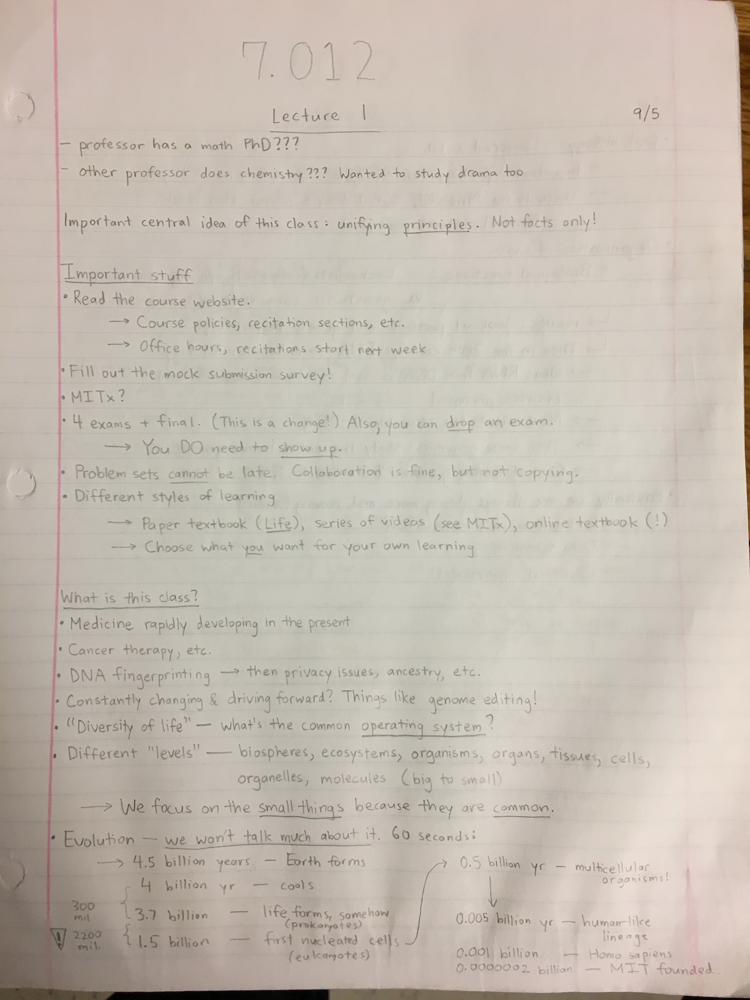

In [17]:
display(DisplayImage(filename="./convert/7.012noteslindrew-0.png"))

In [19]:
for page in response.full_text_annotation.pages:
    print(page)
    break

property {
  detected_languages {
    language_code: "en"
    confidence: 0.9599999785423279
  }
  detected_languages {
    language_code: "fr"
    confidence: 0.019999999552965164
  }
  detected_languages {
    language_code: "lt"
    confidence: 0.009999999776482582
  }
  detected_languages {
    language_code: "ca"
    confidence: 0.009999999776482582
  }
}
width: 3024
height: 4032
blocks {
  bounding_box {
    vertices {
      x: 935
      y: 139
    }
    vertices {
      x: 1526
      y: 139
    }
    vertices {
      x: 1526
      y: 315
    }
    vertices {
      x: 935
      y: 315
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 935
        y: 139
      }
      vertices {
        x: 1526
        y: 139
      }
      vertices {
        x: 1526
        y: 315
      }
      vertices {
        x: 935
        y: 315
      }
    }
    words {
      bounding_box {
        vertices {
          x: 935
          y: 139
        }
        vertices {
          x: 15

In [25]:
def extract(full_text_annotation):
    pages = []
    paragraphs = []
    words = []
    symbols = []
    
    for page in response.full_text_annotation.pages:
        for block in page.blocks:
            
            for paragraph in block.paragraphs:
                p = []
                for word in paragraph.words:
                    w = ""
                    for symbol in word.symbols:
                        w += symbol.text
                    print(w)
                    return
                        
                        

In [26]:
extract(response.full_text_annotation)

2012


In [34]:
class FeatureType(Enum):
    PAGE = 1
    BLOCK = 2
    PARA = 3
    WORD = 4
    SYMBOL = 5

In [35]:
def draw_boxes(image, bounds, color):
    """Draw a border around the image using the hints in the vector list."""
    draw = ImageDraw.Draw(image)

    for bound in bounds:
        draw.polygon([
            bound.vertices[0].x, bound.vertices[0].y,
            bound.vertices[1].x, bound.vertices[1].y,
            bound.vertices[2].x, bound.vertices[2].y,
            bound.vertices[3].x, bound.vertices[3].y], None, color)
    return image

In [36]:
def get_document_bounds(response, feature):
    """Returns document bounds given an image."""
    bounds = []
￼
testgcloud
Last Checkpoint: 11 minutes ago
(autosaved)
￼
￼Logout
Python 3 Trusted
File
Edit
View
Insert
Cell
Kernel
Widgets
Help
￼￼￼￼￼￼￼￼Run￼￼￼￼￼
In [33]:
￼
import io, os
from google.cloud import vision
from google.cloud.vision import types
​
import argparse
from enum import Enum
​
from PIL import Image, ImageDraw
​
from IPython.display import Image as DisplayImage, display
In [2]:
￼
client = vision.ImageAnnotatorClient()
/home/shashvat/anaconda3/lib/python3.7/site-packages/google/auth/_default.py:66: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK. We recommend that most server applications use service accounts instead. If your application continues to use end user credentials from Cloud SDK, you might receive a "quota exceeded" or "API not enabled" error. For more information about service accounts, see https://cloud.google.com/docs/authentication/
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)
In [3]:
￼
file_name = os.path.abspath('dog.jpeg')
with io.open(file_name, 'rb') as image_file:
    content = image_file.read()
In [4]:
￼
image = types.Image(content=content)
In [6]:
￼
response = client.label_detection(image=image)
labels = response.label_annotations
In [7]:
￼
print('Labels:')
for label in labels:
    print(label.description)
Labels:
Dog
Mammal
Vertebrate
Dog breed
Canidae
Nose
Carnivore
Companion dog
Puppy
Snout
In [9]:
￼
with open("./convert/7.012noteslindrew-0.png", 'rb') as f:
    content = f.read()
​
image = vision.types.Image(content = content)
In [10]:
￼
response = client.document_text_detection(image = image)
In [11]:
￼
response
Out[11]:
text_annotations {
  locale: "en"
  description: "2012\n9/5\nLecture I\n- professor has a math PhD???\n- other professor does chemistry ??? Wanted to study drama too\nImportant central idea of this class: unifying\nprinciples.\nNot facts\nonly!\nImportant stuff\n\342\200\242 Read the course website.\nI - Course policies, recitation sections, etc.\n- Office hours, recitations start next week\n\342\200\242 Fill out the mock submission survey!\n1. MITX?\n1.4 exams + final. (This is a change!) Also you can drop an exam.\nYou Do need to show up.\n1. Problem sets cannot be late. Collaboration is fine, but not copying.\n\342\200\242 Different styles of learning\n- Paper textbook (Life), series of videos (see MITX), online textbook (!)\n- Choose what you want for your own learning\nWhat is this class?\n1. Medicine rapidly developing in the present\n1. Cancer therapy, etc.\n\342\200\242 DNA fingerprinting - then privacy issues, ancestry etc.\n\342\200\242 Constantly changing & driving forward? Things like genome editing!\n\"Diversity of life\" - what\'s the common operating system?\nDifferent \"levels\" - biospheres, ecosystems, organisms, organs, tissues, cells,\norganelles, molecules (big to small)\nWe focus on the small things because they are common.\n\342\200\242 Evolution - we won\'t talk much about it. 60 secondsi\n\342\200\223 4.5 billion years \342\200\223 Earth forms\n0.5 billion yr - multicellular\n4 billion yr - cools.\n23.7 billion\n0.005 billion yr - human-like\nV 2200 21.5 billion - first nucleated cells I\nlineage\nrenkamotes)\n0.001 billion \342\200\223 Homo sapiens\n0.0000002 billion \342\200\223 MIT founded.\norganisms!\n300\nrms, somehow\n(prokaryotes)\n"
  bounding_poly {
    vertices {
      x: 208
      y: 139
    }
    vertices {
      x: 2906
      y: 139
    }
    vertices {
      x: 2906
      y: 3936
    }
    vertices {
      x: 208
      y: 3936
    }
  }
}
text_annotations {
  description: "2012"
  bounding_poly {
    vertices {
      x: 935
      y: 139
    }
    vertices {
      x: 1526
      y: 139
    }
    vertices {
      x: 1526
      y: 315
    }
    vertices {
      x: 935
      y: 315
    }
  }
}
text_annotations {
  description: "9"
  bounding_poly {
    vertices {
      x: 2571
      y: 418
    }
    vertices {
      x: 2591
      y: 418
    }
    vertices {
      x: 2591
      y: 490
    }
    vertices {
      x: 2571
      y: 490
    }
  }
}
text_annotations {
  description: "/"
  bounding_poly {
    vertices {
      x: 2600
      y: 418
    }
    vertices {
      x: 2620
      y: 418
    }
    vertices {
      x: 2620
      y: 490
    }
    vertices {
      x: 2600
      y: 490
    }
  }
}
text_annotations {
  description: "5"
  bounding_poly {
    vertices {
      x: 2622
      y: 418
    }
    vertices {
      x: 2642
      y: 418
    }
    vertices {
      x: 2642
      y: 490
    }
    vertices {
      x: 2622
      y: 490
    }
  }
}
text_annotations {
  description: "Lecture"
  bounding_poly {
    vertices {
      x: 1115
      y: 421
    }
    vertices {
      x: 1346
      y: 416
    }
    vertices {
      x: 1348
      y: 498
    }
    vertices {
      x: 1117
      y: 503
    }
  }
}
text_annotations {
  description: "I"
  bounding_poly {
    vertices {
      x: 1475
      y: 414
    }
    vertices {
      x: 1498
      y: 414
    }
    vertices {
      x: 1500
      y: 496
    }
    vertices {
      x: 1477
      y: 496
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 253
      y: 547
    }
    vertices {
      x: 276
      y: 547
    }
    vertices {
      x: 277
      y: 627
    }
    vertices {
      x: 254
      y: 627
    }
  }
}
text_annotations {
  description: "professor"
  bounding_poly {
    vertices {
      x: 340
      y: 546
    }
    vertices {
      x: 570
      y: 544
    }
    vertices {
      x: 571
      y: 625
    }
    vertices {
      x: 341
      y: 627
    }
  }
}
text_annotations {
  description: "has"
  bounding_poly {
    vertices {
      x: 598
      y: 543
    }
    vertices {
      x: 702
      y: 542
    }
    vertices {
      x: 703
      y: 623
    }
    vertices {
      x: 599
      y: 624
    }
  }
}
text_annotations {
  description: "a"
  bounding_poly {
    vertices {
      x: 745
      y: 543
    }
    vertices {
      x: 768
      y: 543
    }
    vertices {
      x: 769
      y: 623
    }
    vertices {
      x: 746
      y: 623
    }
  }
}
text_annotations {
  description: "math"
  bounding_poly {
    vertices {
      x: 814
      y: 542
    }
    vertices {
      x: 920
      y: 541
    }
    vertices {
      x: 921
      y: 622
    }
    vertices {
      x: 815
      y: 623
    }
  }
}
text_annotations {
  description: "PhD"
  bounding_poly {
    vertices {
      x: 981
      y: 540
    }
    vertices {
      x: 1062
      y: 539
    }
    vertices {
      x: 1063
      y: 620
    }
    vertices {
      x: 982
      y: 621
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1098
      y: 540
    }
    vertices {
      x: 1121
      y: 540
    }
    vertices {
      x: 1122
      y: 620
    }
    vertices {
      x: 1099
      y: 620
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1139
      y: 539
    }
    vertices {
      x: 1162
      y: 539
    }
    vertices {
      x: 1163
      y: 619
    }
    vertices {
      x: 1140
      y: 619
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1180
      y: 539
    }
    vertices {
      x: 1203
      y: 539
    }
    vertices {
      x: 1204
      y: 619
    }
    vertices {
      x: 1181
      y: 619
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 254
      y: 655
    }
    vertices {
      x: 278
      y: 655
    }
    vertices {
      x: 278
      y: 740
    }
    vertices {
      x: 254
      y: 740
    }
  }
}
text_annotations {
  description: "other"
  bounding_poly {
    vertices {
      x: 336
      y: 655
    }
    vertices {
      x: 458
      y: 655
    }
    vertices {
      x: 458
      y: 740
    }
    vertices {
      x: 336
      y: 740
    }
  }
}
text_annotations {
  description: "professor"
  bounding_poly {
    vertices {
      x: 490
      y: 655
    }
    vertices {
      x: 759
      y: 655
    }
    vertices {
      x: 759
      y: 740
    }
    vertices {
      x: 490
      y: 740
    }
  }
}
text_annotations {
  description: "does"
  bounding_poly {
    vertices {
      x: 827
      y: 655
    }
    vertices {
      x: 922
      y: 655
    }
    vertices {
      x: 922
      y: 740
    }
    vertices {
      x: 827
      y: 740
    }
  }
}
text_annotations {
  description: "chemistry"
  bounding_poly {
    vertices {
      x: 978
      y: 655
    }
    vertices {
      x: 1210
      y: 655
    }
    vertices {
      x: 1210
      y: 740
    }
    vertices {
      x: 978
      y: 740
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1234
      y: 655
    }
    vertices {
      x: 1258
      y: 655
    }
    vertices {
      x: 1258
      y: 740
    }
    vertices {
      x: 1234
      y: 740
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1260
      y: 655
    }
    vertices {
      x: 1284
      y: 655
    }
    vertices {
      x: 1284
      y: 740
    }
    vertices {
      x: 1260
      y: 740
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1295
      y: 655
    }
    vertices {
      x: 1319
      y: 655
    }
    vertices {
      x: 1319
      y: 740
    }
    vertices {
      x: 1295
      y: 740
    }
  }
}
text_annotations {
  description: "Wanted"
  bounding_poly {
    vertices {
      x: 1330
      y: 655
    }
    vertices {
      x: 1554
      y: 655
    }
    vertices {
      x: 1554
      y: 740
    }
    vertices {
      x: 1330
      y: 740
    }
  }
}
text_annotations {
  description: "to"
  bounding_poly {
    vertices {
      x: 1589
      y: 655
    }
    vertices {
      x: 1636
      y: 655
    }
    vertices {
      x: 1636
      y: 740
    }
    vertices {
      x: 1589
      y: 740
    }
  }
}
text_annotations {
  description: "study"
  bounding_poly {
    vertices {
      x: 1675
      y: 655
    }
    vertices {
      x: 1799
      y: 655
    }
    vertices {
      x: 1799
      y: 740
    }
    vertices {
      x: 1675
      y: 740
    }
  }
}
text_annotations {
  description: "drama"
  bounding_poly {
    vertices {
      x: 1856
      y: 655
    }
    vertices {
      x: 2000
      y: 655
    }
    vertices {
      x: 2000
      y: 740
    }
    vertices {
      x: 1856
      y: 740
    }
  }
}
text_annotations {
  description: "too"
  bounding_poly {
    vertices {
      x: 2036
      y: 655
    }
    vertices {
      x: 2109
      y: 655
    }
    vertices {
      x: 2109
      y: 740
    }
    vertices {
      x: 2036
      y: 740
    }
  }
}
text_annotations {
  description: "Important"
  bounding_poly {
    vertices {
      x: 263
      y: 858
    }
    vertices {
      x: 522
      y: 858
    }
    vertices {
      x: 522
      y: 936
    }
    vertices {
      x: 263
      y: 936
    }
  }
}
text_annotations {
  description: "central"
  bounding_poly {
    vertices {
      x: 557
      y: 858
    }
    vertices {
      x: 775
      y: 858
    }
    vertices {
      x: 775
      y: 936
    }
    vertices {
      x: 557
      y: 936
    }
  }
}
text_annotations {
  description: "idea"
  bounding_poly {
    vertices {
      x: 816
      y: 858
    }
    vertices {
      x: 907
      y: 858
    }
    vertices {
      x: 907
      y: 936
    }
    vertices {
      x: 816
      y: 936
    }
  }
}
text_annotations {
  description: "of"
  bounding_poly {
    vertices {
      x: 959
      y: 858
    }
    vertices {
      x: 1001
      y: 858
    }
    vertices {
      x: 1001
      y: 936
    }
    vertices {
      x: 959
      y: 936
    }
  }
}
text_annotations {
  description: "this"
  bounding_poly {
    vertices {
      x: 1038
      y: 858
    }
    vertices {
      x: 1128
      y: 858
    }
    vertices {
      x: 1128
      y: 936
    }
    vertices {
      x: 1038
      y: 936
    }
  }
}
text_annotations {
  description: "class"
  bounding_poly {
    vertices {
      x: 1163
      y: 858
    }
    vertices {
      x: 1278
      y: 858
    }
    vertices {
      x: 1278
      y: 936
    }
    vertices {
      x: 1163
      y: 936
    }
  }
}
text_annotations {
  description: ":"
  bounding_poly {
    vertices {
      x: 1304
      y: 858
    }
    vertices {
      x: 1326
      y: 858
    }
    vertices {
      x: 1326
      y: 936
    }
    vertices {
      x: 1304
      y: 936
    }
  }
}
text_annotations {
  description: "unifying"
  bounding_poly {
    vertices {
      x: 1376
      y: 858
    }
    vertices {
      x: 1565
      y: 858
    }
    vertices {
      x: 1565
      y: 936
    }
    vertices {
      x: 1376
      y: 936
    }
  }
}
text_annotations {
  description: "principles"
  bounding_poly {
    vertices {
      x: 1660
      y: 858
    }
    vertices {
      x: 1894
      y: 858
    }
    vertices {
      x: 1894
      y: 936
    }
    vertices {
      x: 1660
      y: 936
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1913
      y: 858
    }
    vertices {
      x: 1935
      y: 858
    }
    vertices {
      x: 1935
      y: 936
    }
    vertices {
      x: 1913
      y: 936
    }
  }
}
text_annotations {
  description: "Not"
  bounding_poly {
    vertices {
      x: 1997
      y: 858
    }
    vertices {
      x: 2076
      y: 858
    }
    vertices {
      x: 2076
      y: 936
    }
    vertices {
      x: 1997
      y: 936
    }
  }
}
text_annotations {
  description: "facts"
  bounding_poly {
    vertices {
      x: 2131
      y: 858
    }
    vertices {
      x: 2226
      y: 858
    }
    vertices {
      x: 2226
      y: 936
    }
    vertices {
      x: 2131
      y: 936
    }
  }
}
text_annotations {
  description: "only"
  bounding_poly {
    vertices {
      x: 2289
      y: 858
    }
    vertices {
      x: 2365
      y: 858
    }
    vertices {
      x: 2365
      y: 936
    }
    vertices {
      x: 2289
      y: 936
    }
  }
}
text_annotations {
  description: "!"
  bounding_poly {
    vertices {
      x: 2387
      y: 858
    }
    vertices {
      x: 2409
      y: 858
    }
    vertices {
      x: 2409
      y: 936
    }
    vertices {
      x: 2387
      y: 936
    }
  }
}
text_annotations {
  description: "Important"
  bounding_poly {
    vertices {
      x: 278
      y: 1061
    }
    vertices {
      x: 570
      y: 1061
    }
    vertices {
      x: 570
      y: 1153
    }
    vertices {
      x: 278
      y: 1153
    }
  }
}
text_annotations {
  description: "stuff"
  bounding_poly {
    vertices {
      x: 592
      y: 1061
    }
    vertices {
      x: 761
      y: 1061
    }
    vertices {
      x: 761
      y: 1153
    }
    vertices {
      x: 592
      y: 1153
    }
  }
}
text_annotations {
  description: "\342\200\242"
  bounding_poly {
    vertices {
      x: 258
      y: 1163
    }
    vertices {
      x: 281
      y: 1163
    }
    vertices {
      x: 280
      y: 1243
    }
    vertices {
      x: 257
      y: 1243
    }
  }
}
text_annotations {
  description: "Read"
  bounding_poly {
    vertices {
      x: 305
      y: 1164
    }
    vertices {
      x: 422
      y: 1166
    }
    vertices {
      x: 421
      y: 1246
    }
    vertices {
      x: 304
      y: 1244
    }
  }
}
text_annotations {
  description: "the"
  bounding_poly {
    vertices {
      x: 464
      y: 1167
    }
    vertices {
      x: 534
      y: 1168
    }
    vertices {
      x: 533
      y: 1248
    }
    vertices {
      x: 463
      y: 1247
    }
  }
}
text_annotations {
  description: "course"
  bounding_poly {
    vertices {
      x: 592
      y: 1169
    }
    vertices {
      x: 735
      y: 1171
    }
    vertices {
      x: 734
      y: 1252
    }
    vertices {
      x: 591
      y: 1250
    }
  }
}
text_annotations {
  description: "website"
  bounding_poly {
    vertices {
      x: 751
      y: 1171
    }
    vertices {
      x: 974
      y: 1175
    }
    vertices {
      x: 973
      y: 1256
    }
    vertices {
      x: 750
      y: 1252
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 988
      y: 1176
    }
    vertices {
      x: 1011
      y: 1176
    }
    vertices {
      x: 1010
      y: 1256
    }
    vertices {
      x: 987
      y: 1256
    }
  }
}
text_annotations {
  description: "I"
  bounding_poly {
    vertices {
      x: 238
      y: 1265
    }
    vertices {
      x: 259
      y: 1265
    }
    vertices {
      x: 259
      y: 1339
    }
    vertices {
      x: 238
      y: 1339
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 478
      y: 1265
    }
    vertices {
      x: 499
      y: 1265
    }
    vertices {
      x: 499
      y: 1339
    }
    vertices {
      x: 478
      y: 1339
    }
  }
}
text_annotations {
  description: "Course"
  bounding_poly {
    vertices {
      x: 599
      y: 1265
    }
    vertices {
      x: 730
      y: 1265
    }
    vertices {
      x: 730
      y: 1339
    }
    vertices {
      x: 599
      y: 1339
    }
  }
}
text_annotations {
  description: "policies"
  bounding_poly {
    vertices {
      x: 794
      y: 1265
    }
    vertices {
      x: 948
      y: 1265
    }
    vertices {
      x: 948
      y: 1339
    }
    vertices {
      x: 794
      y: 1339
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 950
      y: 1265
    }
    vertices {
      x: 971
      y: 1265
    }
    vertices {
      x: 971
      y: 1339
    }
    vertices {
      x: 950
      y: 1339
    }
  }
}
text_annotations {
  description: "recitation"
  bounding_poly {
    vertices {
      x: 1015
      y: 1265
    }
    vertices {
      x: 1240
      y: 1265
    }
    vertices {
      x: 1240
      y: 1339
    }
    vertices {
      x: 1015
      y: 1339
    }
  }
}
text_annotations {
  description: "sections"
  bounding_poly {
    vertices {
      x: 1289
      y: 1265
    }
    vertices {
      x: 1483
      y: 1265
    }
    vertices {
      x: 1483
      y: 1339
    }
    vertices {
      x: 1289
      y: 1339
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1483
      y: 1265
    }
    vertices {
      x: 1504
      y: 1265
    }
    vertices {
      x: 1504
      y: 1339
    }
    vertices {
      x: 1483
      y: 1339
    }
  }
}
text_annotations {
  description: "etc"
  bounding_poly {
    vertices {
      x: 1531
      y: 1265
    }
    vertices {
      x: 1605
      y: 1265
    }
    vertices {
      x: 1605
      y: 1339
    }
    vertices {
      x: 1531
      y: 1339
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1618
      y: 1265
    }
    vertices {
      x: 1639
      y: 1265
    }
    vertices {
      x: 1639
      y: 1339
    }
    vertices {
      x: 1618
      y: 1339
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 468
      y: 1360
    }
    vertices {
      x: 488
      y: 1360
    }
    vertices {
      x: 487
      y: 1429
    }
    vertices {
      x: 467
      y: 1429
    }
  }
}
text_annotations {
  description: "Office"
  bounding_poly {
    vertices {
      x: 589
      y: 1361
    }
    vertices {
      x: 721
      y: 1363
    }
    vertices {
      x: 720
      y: 1433
    }
    vertices {
      x: 588
      y: 1431
    }
  }
}
text_annotations {
  description: "hours"
  bounding_poly {
    vertices {
      x: 738
      y: 1363
    }
    vertices {
      x: 896
      y: 1365
    }
    vertices {
      x: 895
      y: 1435
    }
    vertices {
      x: 737
      y: 1433
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 902
      y: 1366
    }
    vertices {
      x: 922
      y: 1366
    }
    vertices {
      x: 921
      y: 1435
    }
    vertices {
      x: 901
      y: 1435
    }
  }
}
text_annotations {
  description: "recitations"
  bounding_poly {
    vertices {
      x: 957
      y: 1366
    }
    vertices {
      x: 1232
      y: 1370
    }
    vertices {
      x: 1231
      y: 1440
    }
    vertices {
      x: 956
      y: 1436
    }
  }
}
text_annotations {
  description: "start"
  bounding_poly {
    vertices {
      x: 1262
      y: 1370
    }
    vertices {
      x: 1404
      y: 1372
    }
    vertices {
      x: 1403
      y: 1442
    }
    vertices {
      x: 1261
      y: 1440
    }
  }
}
text_annotations {
  description: "next"
  bounding_poly {
    vertices {
      x: 1450
      y: 1373
    }
    vertices {
      x: 1540
      y: 1374
    }
    vertices {
      x: 1539
      y: 1444
    }
    vertices {
      x: 1449
      y: 1443
    }
  }
}
text_annotations {
  description: "week"
  bounding_poly {
    vertices {
      x: 1552
      y: 1375
    }
    vertices {
      x: 1698
      y: 1377
    }
    vertices {
      x: 1697
      y: 1446
    }
    vertices {
      x: 1551
      y: 1444
    }
  }
}
text_annotations {
  description: "\342\200\242"
  bounding_poly {
    vertices {
      x: 246
      y: 1455
    }
    vertices {
      x: 269
      y: 1455
    }
    vertices {
      x: 268
      y: 1535
    }
    vertices {
      x: 245
      y: 1535
    }
  }
}
text_annotations {
  description: "Fill"
  bounding_poly {
    vertices {
      x: 317
      y: 1456
    }
    vertices {
      x: 380
      y: 1457
    }
    vertices {
      x: 379
      y: 1538
    }
    vertices {
      x: 316
      y: 1537
    }
  }
}
text_annotations {
  description: "out"
  bounding_poly {
    vertices {
      x: 416
      y: 1458
    }
    vertices {
      x: 498
      y: 1459
    }
    vertices {
      x: 497
      y: 1540
    }
    vertices {
      x: 415
      y: 1539
    }
  }
}
text_annotations {
  description: "the"
  bounding_poly {
    vertices {
      x: 542
      y: 1461
    }
    vertices {
      x: 624
      y: 1462
    }
    vertices {
      x: 623
      y: 1542
    }
    vertices {
      x: 541
      y: 1541
    }
  }
}
text_annotations {
  description: "mock"
  bounding_poly {
    vertices {
      x: 653
      y: 1462
    }
    vertices {
      x: 772
      y: 1464
    }
    vertices {
      x: 771
      y: 1545
    }
    vertices {
      x: 652
      y: 1543
    }
  }
}
text_annotations {
  description: "submission"
  bounding_poly {
    vertices {
      x: 855
      y: 1466
    }
    vertices {
      x: 1085
      y: 1470
    }
    vertices {
      x: 1083
      y: 1551
    }
    vertices {
      x: 854
      y: 1547
    }
  }
}
text_annotations {
  description: "survey"
  bounding_poly {
    vertices {
      x: 1142
      y: 1472
    }
    vertices {
      x: 1293
      y: 1475
    }
    vertices {
      x: 1292
      y: 1555
    }
    vertices {
      x: 1141
      y: 1552
    }
  }
}
text_annotations {
  description: "!"
  bounding_poly {
    vertices {
      x: 1312
      y: 1475
    }
    vertices {
      x: 1335
      y: 1475
    }
    vertices {
      x: 1334
      y: 1555
    }
    vertices {
      x: 1311
      y: 1555
    }
  }
}
text_annotations {
  description: "1"
  bounding_poly {
    vertices {
      x: 229
      y: 1555
    }
    vertices {
      x: 252
      y: 1555
    }
    vertices {
      x: 252
      y: 1635
    }
    vertices {
      x: 229
      y: 1635
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 253
      y: 1555
    }
    vertices {
      x: 276
      y: 1555
    }
    vertices {
      x: 276
      y: 1635
    }
    vertices {
      x: 253
      y: 1635
    }
  }
}
text_annotations {
  description: "MITX"
  bounding_poly {
    vertices {
      x: 277
      y: 1555
    }
    vertices {
      x: 442
      y: 1555
    }
    vertices {
      x: 442
      y: 1635
    }
    vertices {
      x: 277
      y: 1635
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 466
      y: 1555
    }
    vertices {
      x: 489
      y: 1555
    }
    vertices {
      x: 489
      y: 1635
    }
    vertices {
      x: 466
      y: 1635
    }
  }
}
text_annotations {
  description: "1"
  bounding_poly {
    vertices {
      x: 227
      y: 1652
    }
    vertices {
      x: 252
      y: 1652
    }
    vertices {
      x: 251
      y: 1740
    }
    vertices {
      x: 226
      y: 1740
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 254
      y: 1652
    }
    vertices {
      x: 279
      y: 1652
    }
    vertices {
      x: 278
      y: 1740
    }
    vertices {
      x: 253
      y: 1740
    }
  }
}
text_annotations {
  description: "4"
  bounding_poly {
    vertices {
      x: 290
      y: 1652
    }
    vertices {
      x: 315
      y: 1652
    }
    vertices {
      x: 314
      y: 1740
    }
    vertices {
      x: 289
      y: 1740
    }
  }
}
text_annotations {
  description: "exams"
  bounding_poly {
    vertices {
      x: 363
      y: 1652
    }
    vertices {
      x: 530
      y: 1653
    }
    vertices {
      x: 529
      y: 1742
    }
    vertices {
      x: 362
      y: 1741
    }
  }
}
text_annotations {
  description: "+"
  bounding_poly {
    vertices {
      x: 566
      y: 1654
    }
    vertices {
      x: 591
      y: 1654
    }
    vertices {
      x: 590
      y: 1742
    }
    vertices {
      x: 565
      y: 1742
    }
  }
}
text_annotations {
  description: "final"
  bounding_poly {
    vertices {
      x: 661
      y: 1654
    }
    vertices {
      x: 788
      y: 1655
    }
    vertices {
      x: 787
      y: 1744
    }
    vertices {
      x: 660
      y: 1743
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 788
      y: 1655
    }
    vertices {
      x: 813
      y: 1655
    }
    vertices {
      x: 812
      y: 1743
    }
    vertices {
      x: 787
      y: 1743
    }
  }
}
text_annotations {
  description: "("
  bounding_poly {
    vertices {
      x: 859
      y: 1656
    }
    vertices {
      x: 884
      y: 1656
    }
    vertices {
      x: 883
      y: 1744
    }
    vertices {
      x: 858
      y: 1744
    }
  }
}
text_annotations {
  description: "This"
  bounding_poly {
    vertices {
      x: 909
      y: 1656
    }
    vertices {
      x: 986
      y: 1656
    }
    vertices {
      x: 985
      y: 1744
    }
    vertices {
      x: 908
      y: 1744
    }
  }
}
text_annotations {
  description: "is"
  bounding_poly {
    vertices {
      x: 1013
      y: 1657
    }
    vertices {
      x: 1060
      y: 1657
    }
    vertices {
      x: 1059
      y: 1745
    }
    vertices {
      x: 1012
      y: 1745
    }
  }
}
text_annotations {
  description: "a"
  bounding_poly {
    vertices {
      x: 1082
      y: 1657
    }
    vertices {
      x: 1107
      y: 1657
    }
    vertices {
      x: 1106
      y: 1745
    }
    vertices {
      x: 1081
      y: 1745
    }
  }
}
text_annotations {
  description: "change"
  bounding_poly {
    vertices {
      x: 1149
      y: 1657
    }
    vertices {
      x: 1298
      y: 1658
    }
    vertices {
      x: 1297
      y: 1747
    }
    vertices {
      x: 1148
      y: 1746
    }
  }
}
text_annotations {
  description: "!"
  bounding_poly {
    vertices {
      x: 1313
      y: 1659
    }
    vertices {
      x: 1338
      y: 1659
    }
    vertices {
      x: 1337
      y: 1747
    }
    vertices {
      x: 1312
      y: 1747
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 1349
      y: 1659
    }
    vertices {
      x: 1374
      y: 1659
    }
    vertices {
      x: 1373
      y: 1747
    }
    vertices {
      x: 1348
      y: 1747
    }
  }
}
text_annotations {
  description: "Also"
  bounding_poly {
    vertices {
      x: 1425
      y: 1659
    }
    vertices {
      x: 1514
      y: 1660
    }
    vertices {
      x: 1513
      y: 1749
    }
    vertices {
      x: 1424
      y: 1748
    }
  }
}
text_annotations {
  description: "you"
  bounding_poly {
    vertices {
      x: 1565
      y: 1660
    }
    vertices {
      x: 1640
      y: 1660
    }
    vertices {
      x: 1639
      y: 1748
    }
    vertices {
      x: 1564
      y: 1748
    }
  }
}
text_annotations {
  description: "can"
  bounding_poly {
    vertices {
      x: 1680
      y: 1661
    }
    vertices {
      x: 1756
      y: 1661
    }
    vertices {
      x: 1755
      y: 1749
    }
    vertices {
      x: 1679
      y: 1749
    }
  }
}
text_annotations {
  description: "drop"
  bounding_poly {
    vertices {
      x: 1814
      y: 1662
    }
    vertices {
      x: 1907
      y: 1663
    }
    vertices {
      x: 1906
      y: 1751
    }
    vertices {
      x: 1813
      y: 1750
    }
  }
}
text_annotations {
  description: "an"
  bounding_poly {
    vertices {
      x: 1965
      y: 1662
    }
    vertices {
      x: 2014
      y: 1662
    }
    vertices {
      x: 2013
      y: 1751
    }
    vertices {
      x: 1964
      y: 1751
    }
  }
}
text_annotations {
  description: "exam"
  bounding_poly {
    vertices {
      x: 2054
      y: 1663
    }
    vertices {
      x: 2199
      y: 1664
    }
    vertices {
      x: 2198
      y: 1752
    }
    vertices {
      x: 2053
      y: 1751
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 2212
      y: 1664
    }
    vertices {
      x: 2237
      y: 1664
    }
    vertices {
      x: 2236
      y: 1752
    }
    vertices {
      x: 2211
      y: 1752
    }
  }
}
text_annotations {
  description: "You"
  bounding_poly {
    vertices {
      x: 600
      y: 1753
    }
    vertices {
      x: 671
      y: 1753
    }
    vertices {
      x: 671
      y: 1853
    }
    vertices {
      x: 600
      y: 1853
    }
  }
}
text_annotations {
  description: "Do"
  bounding_poly {
    vertices {
      x: 722
      y: 1753
    }
    vertices {
      x: 815
      y: 1753
    }
    vertices {
      x: 815
      y: 1853
    }
    vertices {
      x: 722
      y: 1853
    }
  }
}
text_annotations {
  description: "need"
  bounding_poly {
    vertices {
      x: 847
      y: 1753
    }
    vertices {
      x: 978
      y: 1753
    }
    vertices {
      x: 978
      y: 1853
    }
    vertices {
      x: 847
      y: 1853
    }
  }
}
text_annotations {
  description: "to"
  bounding_poly {
    vertices {
      x: 1024
      y: 1753
    }
    vertices {
      x: 1079
      y: 1753
    }
    vertices {
      x: 1079
      y: 1853
    }
    vertices {
      x: 1024
      y: 1853
    }
  }
}
text_annotations {
  description: "show"
  bounding_poly {
    vertices {
      x: 1129
      y: 1753
    }
    vertices {
      x: 1227
      y: 1753
    }
    vertices {
      x: 1227
      y: 1853
    }
    vertices {
      x: 1129
      y: 1853
    }
  }
}
text_annotations {
  description: "up"
  bounding_poly {
    vertices {
      x: 1283
      y: 1753
    }
    vertices {
      x: 1356
      y: 1753
    }
    vertices {
      x: 1356
      y: 1853
    }
    vertices {
      x: 1283
      y: 1853
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1355
      y: 1753
    }
    vertices {
      x: 1384
      y: 1753
    }
    vertices {
      x: 1384
      y: 1853
    }
    vertices {
      x: 1355
      y: 1853
    }
  }
}
text_annotations {
  description: "1"
  bounding_poly {
    vertices {
      x: 231
      y: 1868
    }
    vertices {
      x: 251
      y: 1868
    }
    vertices {
      x: 251
      y: 1940
    }
    vertices {
      x: 231
      y: 1940
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 246
      y: 1868
    }
    vertices {
      x: 266
      y: 1868
    }
    vertices {
      x: 266
      y: 1940
    }
    vertices {
      x: 246
      y: 1940
    }
  }
}
text_annotations {
  description: "Problem"
  bounding_poly {
    vertices {
      x: 337
      y: 1868
    }
    vertices {
      x: 494
      y: 1868
    }
    vertices {
      x: 494
      y: 1940
    }
    vertices {
      x: 337
      y: 1940
    }
  }
}
text_annotations {
  description: "sets"
  bounding_poly {
    vertices {
      x: 535
      y: 1868
    }
    vertices {
      x: 640
      y: 1868
    }
    vertices {
      x: 640
      y: 1940
    }
    vertices {
      x: 535
      y: 1940
    }
  }
}
text_annotations {
  description: "cannot"
  bounding_poly {
    vertices {
      x: 681
      y: 1868
    }
    vertices {
      x: 834
      y: 1868
    }
    vertices {
      x: 834
      y: 1940
    }
    vertices {
      x: 681
      y: 1940
    }
  }
}
text_annotations {
  description: "be"
  bounding_poly {
    vertices {
      x: 858
      y: 1868
    }
    vertices {
      x: 938
      y: 1868
    }
    vertices {
      x: 938
      y: 1940
    }
    vertices {
      x: 858
      y: 1940
    }
  }
}
text_annotations {
  description: "late"
  bounding_poly {
    vertices {
      x: 991
      y: 1868
    }
    vertices {
      x: 1085
      y: 1868
    }
    vertices {
      x: 1085
      y: 1940
    }
    vertices {
      x: 991
      y: 1940
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1092
      y: 1868
    }
    vertices {
      x: 1112
      y: 1868
    }
    vertices {
      x: 1112
      y: 1940
    }
    vertices {
      x: 1092
      y: 1940
    }
  }
}
text_annotations {
  description: "Collaboration"
  bounding_poly {
    vertices {
      x: 1231
      y: 1868
    }
    vertices {
      x: 1527
      y: 1868
    }
    vertices {
      x: 1527
      y: 1940
    }
    vertices {
      x: 1231
      y: 1940
    }
  }
}
text_annotations {
  description: "is"
  bounding_poly {
    vertices {
      x: 1582
      y: 1868
    }
    vertices {
      x: 1622
      y: 1868
    }
    vertices {
      x: 1622
      y: 1940
    }
    vertices {
      x: 1582
      y: 1940
    }
  }
}
text_annotations {
  description: "fine"
  bounding_poly {
    vertices {
      x: 1673
      y: 1868
    }
    vertices {
      x: 1749
      y: 1868
    }
    vertices {
      x: 1749
      y: 1940
    }
    vertices {
      x: 1673
      y: 1940
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1764
      y: 1868
    }
    vertices {
      x: 1784
      y: 1868
    }
    vertices {
      x: 1784
      y: 1940
    }
    vertices {
      x: 1764
      y: 1940
    }
  }
}
text_annotations {
  description: "but"
  bounding_poly {
    vertices {
      x: 1797
      y: 1868
    }
    vertices {
      x: 1910
      y: 1868
    }
    vertices {
      x: 1910
      y: 1940
    }
    vertices {
      x: 1797
      y: 1940
    }
  }
}
text_annotations {
  description: "not"
  bounding_poly {
    vertices {
      x: 1949
      y: 1868
    }
    vertices {
      x: 2030
      y: 1868
    }
    vertices {
      x: 2030
      y: 1940
    }
    vertices {
      x: 1949
      y: 1940
    }
  }
}
text_annotations {
  description: "copying"
  bounding_poly {
    vertices {
      x: 2087
      y: 1868
    }
    vertices {
      x: 2306
      y: 1868
    }
    vertices {
      x: 2306
      y: 1940
    }
    vertices {
      x: 2087
      y: 1940
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 2319
      y: 1868
    }
    vertices {
      x: 2339
      y: 1868
    }
    vertices {
      x: 2339
      y: 1940
    }
    vertices {
      x: 2319
      y: 1940
    }
  }
}
text_annotations {
  description: "\342\200\242"
  bounding_poly {
    vertices {
      x: 262
      y: 1959
    }
    vertices {
      x: 284
      y: 1959
    }
    vertices {
      x: 283
      y: 2036
    }
    vertices {
      x: 261
      y: 2036
    }
  }
}
text_annotations {
  description: "Different"
  bounding_poly {
    vertices {
      x: 326
      y: 1960
    }
    vertices {
      x: 566
      y: 1963
    }
    vertices {
      x: 565
      y: 2041
    }
    vertices {
      x: 325
      y: 2038
    }
  }
}
text_annotations {
  description: "styles"
  bounding_poly {
    vertices {
      x: 611
      y: 1964
    }
    vertices {
      x: 758
      y: 1966
    }
    vertices {
      x: 757
      y: 2044
    }
    vertices {
      x: 610
      y: 2042
    }
  }
}
text_annotations {
  description: "of"
  bounding_poly {
    vertices {
      x: 809
      y: 1967
    }
    vertices {
      x: 853
      y: 1968
    }
    vertices {
      x: 852
      y: 2045
    }
    vertices {
      x: 808
      y: 2044
    }
  }
}
text_annotations {
  description: "learning"
  bounding_poly {
    vertices {
      x: 898
      y: 1968
    }
    vertices {
      x: 1097
      y: 1971
    }
    vertices {
      x: 1096
      y: 2048
    }
    vertices {
      x: 897
      y: 2045
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 478
      y: 2075
    }
    vertices {
      x: 501
      y: 2075
    }
    vertices {
      x: 501
      y: 2155
    }
    vertices {
      x: 478
      y: 2155
    }
  }
}
text_annotations {
  description: "Paper"
  bounding_poly {
    vertices {
      x: 606
      y: 2073
    }
    vertices {
      x: 714
      y: 2072
    }
    vertices {
      x: 714
      y: 2153
    }
    vertices {
      x: 606
      y: 2154
    }
  }
}
text_annotations {
  description: "textbook"
  bounding_poly {
    vertices {
      x: 766
      y: 2073
    }
    vertices {
      x: 972
      y: 2072
    }
    vertices {
      x: 972
      y: 2152
    }
    vertices {
      x: 766
      y: 2153
    }
  }
}
text_annotations {
  description: "("
  bounding_poly {
    vertices {
      x: 1044
      y: 2072
    }
    vertices {
      x: 1067
      y: 2072
    }
    vertices {
      x: 1067
      y: 2152
    }
    vertices {
      x: 1044
      y: 2152
    }
  }
}
text_annotations {
  description: "Life"
  bounding_poly {
    vertices {
      x: 1078
      y: 2071
    }
    vertices {
      x: 1165
      y: 2071
    }
    vertices {
      x: 1165
      y: 2151
    }
    vertices {
      x: 1078
      y: 2151
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 1184
      y: 2071
    }
    vertices {
      x: 1207
      y: 2071
    }
    vertices {
      x: 1207
      y: 2151
    }
    vertices {
      x: 1184
      y: 2151
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1208
      y: 2071
    }
    vertices {
      x: 1231
      y: 2071
    }
    vertices {
      x: 1231
      y: 2151
    }
    vertices {
      x: 1208
      y: 2151
    }
  }
}
text_annotations {
  description: "series"
  bounding_poly {
    vertices {
      x: 1276
      y: 2070
    }
    vertices {
      x: 1422
      y: 2069
    }
    vertices {
      x: 1422
      y: 2150
    }
    vertices {
      x: 1276
      y: 2151
    }
  }
}
text_annotations {
  description: "of"
  bounding_poly {
    vertices {
      x: 1467
      y: 2069
    }
    vertices {
      x: 1498
      y: 2069
    }
    vertices {
      x: 1498
      y: 2149
    }
    vertices {
      x: 1467
      y: 2149
    }
  }
}
text_annotations {
  description: "videos"
  bounding_poly {
    vertices {
      x: 1534
      y: 2069
    }
    vertices {
      x: 1709
      y: 2068
    }
    vertices {
      x: 1709
      y: 2148
    }
    vertices {
      x: 1534
      y: 2149
    }
  }
}
text_annotations {
  description: "("
  bounding_poly {
    vertices {
      x: 1757
      y: 2068
    }
    vertices {
      x: 1780
      y: 2068
    }
    vertices {
      x: 1780
      y: 2148
    }
    vertices {
      x: 1757
      y: 2148
    }
  }
}
text_annotations {
  description: "see"
  bounding_poly {
    vertices {
      x: 1787
      y: 2068
    }
    vertices {
      x: 1845
      y: 2068
    }
    vertices {
      x: 1845
      y: 2148
    }
    vertices {
      x: 1787
      y: 2148
    }
  }
}
text_annotations {
  description: "MITX"
  bounding_poly {
    vertices {
      x: 1881
      y: 2067
    }
    vertices {
      x: 2028
      y: 2066
    }
    vertices {
      x: 2028
      y: 2147
    }
    vertices {
      x: 1881
      y: 2148
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 2036
      y: 2066
    }
    vertices {
      x: 2059
      y: 2066
    }
    vertices {
      x: 2059
      y: 2146
    }
    vertices {
      x: 2036
      y: 2146
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 2069
      y: 2066
    }
    vertices {
      x: 2092
      y: 2066
    }
    vertices {
      x: 2092
      y: 2146
    }
    vertices {
      x: 2069
      y: 2146
    }
  }
}
text_annotations {
  description: "online"
  bounding_poly {
    vertices {
      x: 2137
      y: 2065
    }
    vertices {
      x: 2283
      y: 2064
    }
    vertices {
      x: 2283
      y: 2145
    }
    vertices {
      x: 2137
      y: 2146
    }
  }
}
text_annotations {
  description: "textbook"
  bounding_poly {
    vertices {
      x: 2329
      y: 2064
    }
    vertices {
      x: 2550
      y: 2063
    }
    vertices {
      x: 2550
      y: 2144
    }
    vertices {
      x: 2329
      y: 2145
    }
  }
}
text_annotations {
  description: "("
  bounding_poly {
    vertices {
      x: 2610
      y: 2063
    }
    vertices {
      x: 2633
      y: 2063
    }
    vertices {
      x: 2633
      y: 2143
    }
    vertices {
      x: 2610
      y: 2143
    }
  }
}
text_annotations {
  description: "!"
  bounding_poly {
    vertices {
      x: 2635
      y: 2063
    }
    vertices {
      x: 2658
      y: 2063
    }
    vertices {
      x: 2658
      y: 2143
    }
    vertices {
      x: 2635
      y: 2143
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 2668
      y: 2063
    }
    vertices {
      x: 2691
      y: 2063
    }
    vertices {
      x: 2691
      y: 2143
    }
    vertices {
      x: 2668
      y: 2143
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 460
      y: 2172
    }
    vertices {
      x: 478
      y: 2172
    }
    vertices {
      x: 478
      y: 2236
    }
    vertices {
      x: 460
      y: 2236
    }
  }
}
text_annotations {
  description: "Choose"
  bounding_poly {
    vertices {
      x: 618
      y: 2172
    }
    vertices {
      x: 768
      y: 2172
    }
    vertices {
      x: 768
      y: 2236
    }
    vertices {
      x: 618
      y: 2236
    }
  }
}
text_annotations {
  description: "what"
  bounding_poly {
    vertices {
      x: 793
      y: 2172
    }
    vertices {
      x: 935
      y: 2172
    }
    vertices {
      x: 935
      y: 2236
    }
    vertices {
      x: 793
      y: 2236
    }
  }
}
text_annotations {
  description: "you"
  bounding_poly {
    vertices {
      x: 985
      y: 2172
    }
    vertices {
      x: 1058
      y: 2172
    }
    vertices {
      x: 1058
      y: 2236
    }
    vertices {
      x: 985
      y: 2236
    }
  }
}
text_annotations {
  description: "want"
  bounding_poly {
    vertices {
      x: 1074
      y: 2172
    }
    vertices {
      x: 1221
      y: 2172
    }
    vertices {
      x: 1221
      y: 2236
    }
    vertices {
      x: 1074
      y: 2236
    }
  }
}
text_annotations {
  description: "for"
  bounding_poly {
    vertices {
      x: 1302
      y: 2172
    }
    vertices {
      x: 1339
      y: 2172
    }
    vertices {
      x: 1339
      y: 2236
    }
    vertices {
      x: 1302
      y: 2236
    }
  }
}
text_annotations {
  description: "your"
  bounding_poly {
    vertices {
      x: 1390
      y: 2172
    }
    vertices {
      x: 1507
      y: 2172
    }
    vertices {
      x: 1507
      y: 2236
    }
    vertices {
      x: 1390
      y: 2236
    }
  }
}
text_annotations {
  description: "own"
  bounding_poly {
    vertices {
      x: 1560
      y: 2172
    }
    vertices {
      x: 1642
      y: 2172
    }
    vertices {
      x: 1642
      y: 2236
    }
    vertices {
      x: 1560
      y: 2236
    }
  }
}
text_annotations {
  description: "learning"
  bounding_poly {
    vertices {
      x: 1690
      y: 2172
    }
    vertices {
      x: 1897
      y: 2172
    }
    vertices {
      x: 1897
      y: 2236
    }
    vertices {
      x: 1690
      y: 2236
    }
  }
}
text_annotations {
  description: "What"
  bounding_poly {
    vertices {
      x: 221
      y: 2363
    }
    vertices {
      x: 385
      y: 2363
    }
    vertices {
      x: 385
      y: 2448
    }
    vertices {
      x: 221
      y: 2448
    }
  }
}
text_annotations {
  description: "is"
  bounding_poly {
    vertices {
      x: 415
      y: 2363
    }
    vertices {
      x: 462
      y: 2363
    }
    vertices {
      x: 462
      y: 2448
    }
    vertices {
      x: 415
      y: 2448
    }
  }
}
text_annotations {
  description: "this"
  bounding_poly {
    vertices {
      x: 510
      y: 2363
    }
    vertices {
      x: 608
      y: 2363
    }
    vertices {
      x: 608
      y: 2448
    }
    vertices {
      x: 510
      y: 2448
    }
  }
}
text_annotations {
  description: "class"
  bounding_poly {
    vertices {
      x: 648
      y: 2363
    }
    vertices {
      x: 763
      y: 2363
    }
    vertices {
      x: 763
      y: 2448
    }
    vertices {
      x: 648
      y: 2448
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 766
      y: 2363
    }
    vertices {
      x: 790
      y: 2363
    }
    vertices {
      x: 790
      y: 2448
    }
    vertices {
      x: 766
      y: 2448
    }
  }
}
text_annotations {
  description: "1"
  bounding_poly {
    vertices {
      x: 224
      y: 2476
    }
    vertices {
      x: 244
      y: 2476
    }
    vertices {
      x: 244
      y: 2548
    }
    vertices {
      x: 224
      y: 2548
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 246
      y: 2476
    }
    vertices {
      x: 266
      y: 2476
    }
    vertices {
      x: 266
      y: 2548
    }
    vertices {
      x: 246
      y: 2548
    }
  }
}
text_annotations {
  description: "Medicine"
  bounding_poly {
    vertices {
      x: 292
      y: 2476
    }
    vertices {
      x: 523
      y: 2476
    }
    vertices {
      x: 523
      y: 2548
    }
    vertices {
      x: 292
      y: 2548
    }
  }
}
text_annotations {
  description: "rapidly"
  bounding_poly {
    vertices {
      x: 597
      y: 2476
    }
    vertices {
      x: 746
      y: 2476
    }
    vertices {
      x: 746
      y: 2548
    }
    vertices {
      x: 597
      y: 2548
    }
  }
}
text_annotations {
  description: "developing"
  bounding_poly {
    vertices {
      x: 809
      y: 2476
    }
    vertices {
      x: 1031
      y: 2476
    }
    vertices {
      x: 1031
      y: 2548
    }
    vertices {
      x: 809
      y: 2548
    }
  }
}
text_annotations {
  description: "in"
  bounding_poly {
    vertices {
      x: 1074
      y: 2476
    }
    vertices {
      x: 1101
      y: 2476
    }
    vertices {
      x: 1101
      y: 2548
    }
    vertices {
      x: 1074
      y: 2548
    }
  }
}
text_annotations {
  description: "the"
  bounding_poly {
    vertices {
      x: 1152
      y: 2476
    }
    vertices {
      x: 1214
      y: 2476
    }
    vertices {
      x: 1214
      y: 2548
    }
    vertices {
      x: 1152
      y: 2548
    }
  }
}
text_annotations {
  description: "present"
  bounding_poly {
    vertices {
      x: 1264
      y: 2476
    }
    vertices {
      x: 1407
      y: 2476
    }
    vertices {
      x: 1407
      y: 2548
    }
    vertices {
      x: 1264
      y: 2548
    }
  }
}
text_annotations {
  description: "1"
  bounding_poly {
    vertices {
      x: 223
      y: 2585
    }
    vertices {
      x: 242
      y: 2585
    }
    vertices {
      x: 241
      y: 2653
    }
    vertices {
      x: 222
      y: 2653
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 243
      y: 2585
    }
    vertices {
      x: 262
      y: 2585
    }
    vertices {
      x: 261
      y: 2653
    }
    vertices {
      x: 242
      y: 2653
    }
  }
}
text_annotations {
  description: "Cancer"
  bounding_poly {
    vertices {
      x: 332
      y: 2586
    }
    vertices {
      x: 451
      y: 2587
    }
    vertices {
      x: 450
      y: 2656
    }
    vertices {
      x: 331
      y: 2655
    }
  }
}
text_annotations {
  description: "therapy"
  bounding_poly {
    vertices {
      x: 514
      y: 2588
    }
    vertices {
      x: 698
      y: 2590
    }
    vertices {
      x: 697
      y: 2659
    }
    vertices {
      x: 513
      y: 2657
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 713
      y: 2591
    }
    vertices {
      x: 732
      y: 2591
    }
    vertices {
      x: 731
      y: 2659
    }
    vertices {
      x: 712
      y: 2659
    }
  }
}
text_annotations {
  description: "etc"
  bounding_poly {
    vertices {
      x: 752
      y: 2591
    }
    vertices {
      x: 829
      y: 2592
    }
    vertices {
      x: 828
      y: 2661
    }
    vertices {
      x: 751
      y: 2660
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 837
      y: 2592
    }
    vertices {
      x: 856
      y: 2592
    }
    vertices {
      x: 855
      y: 2660
    }
    vertices {
      x: 836
      y: 2660
    }
  }
}
text_annotations {
  description: "\342\200\242"
  bounding_poly {
    vertices {
      x: 230
      y: 2684
    }
    vertices {
      x: 250
      y: 2684
    }
    vertices {
      x: 251
      y: 2756
    }
    vertices {
      x: 231
      y: 2756
    }
  }
}
text_annotations {
  description: "DNA"
  bounding_poly {
    vertices {
      x: 281
      y: 2683
    }
    vertices {
      x: 415
      y: 2682
    }
    vertices {
      x: 416
      y: 2754
    }
    vertices {
      x: 282
      y: 2755
    }
  }
}
text_annotations {
  description: "fingerprinting"
  bounding_poly {
    vertices {
      x: 489
      y: 2681
    }
    vertices {
      x: 836
      y: 2678
    }
    vertices {
      x: 837
      y: 2751
    }
    vertices {
      x: 490
      y: 2754
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 916
      y: 2677
    }
    vertices {
      x: 936
      y: 2677
    }
    vertices {
      x: 937
      y: 2749
    }
    vertices {
      x: 917
      y: 2749
    }
  }
}
text_annotations {
  description: "then"
  bounding_poly {
    vertices {
      x: 1012
      y: 2676
    }
    vertices {
      x: 1103
      y: 2675
    }
    vertices {
      x: 1104
      y: 2748
    }
    vertices {
      x: 1013
      y: 2749
    }
  }
}
text_annotations {
  description: "privacy"
  bounding_poly {
    vertices {
      x: 1148
      y: 2675
    }
    vertices {
      x: 1322
      y: 2673
    }
    vertices {
      x: 1323
      y: 2746
    }
    vertices {
      x: 1149
      y: 2748
    }
  }
}
text_annotations {
  description: "issues"
  bounding_poly {
    vertices {
      x: 1365
      y: 2673
    }
    vertices {
      x: 1498
      y: 2672
    }
    vertices {
      x: 1499
      y: 2745
    }
    vertices {
      x: 1366
      y: 2746
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1508
      y: 2672
    }
    vertices {
      x: 1528
      y: 2672
    }
    vertices {
      x: 1529
      y: 2744
    }
    vertices {
      x: 1509
      y: 2744
    }
  }
}
text_annotations {
  description: "ancestry"
  bounding_poly {
    vertices {
      x: 1574
      y: 2671
    }
    vertices {
      x: 1768
      y: 2669
    }
    vertices {
      x: 1769
      y: 2742
    }
    vertices {
      x: 1575
      y: 2744
    }
  }
}
text_annotations {
  description: "etc"
  bounding_poly {
    vertices {
      x: 1834
      y: 2668
    }
    vertices {
      x: 1917
      y: 2667
    }
    vertices {
      x: 1918
      y: 2740
    }
    vertices {
      x: 1835
      y: 2741
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1917
      y: 2668
    }
    vertices {
      x: 1937
      y: 2668
    }
    vertices {
      x: 1938
      y: 2740
    }
    vertices {
      x: 1918
      y: 2740
    }
  }
}
text_annotations {
  description: "\342\200\242"
  bounding_poly {
    vertices {
      x: 230
      y: 2773
    }
    vertices {
      x: 257
      y: 2773
    }
    vertices {
      x: 257
      y: 2868
    }
    vertices {
      x: 230
      y: 2868
    }
  }
}
text_annotations {
  description: "Constantly"
  bounding_poly {
    vertices {
      x: 302
      y: 2773
    }
    vertices {
      x: 572
      y: 2773
    }
    vertices {
      x: 572
      y: 2868
    }
    vertices {
      x: 302
      y: 2868
    }
  }
}
text_annotations {
  description: "changing"
  bounding_poly {
    vertices {
      x: 610
      y: 2773
    }
    vertices {
      x: 818
      y: 2773
    }
    vertices {
      x: 818
      y: 2868
    }
    vertices {
      x: 610
      y: 2868
    }
  }
}
text_annotations {
  description: "&"
  bounding_poly {
    vertices {
      x: 850
      y: 2773
    }
    vertices {
      x: 877
      y: 2773
    }
    vertices {
      x: 877
      y: 2868
    }
    vertices {
      x: 850
      y: 2868
    }
  }
}
text_annotations {
  description: "driving"
  bounding_poly {
    vertices {
      x: 934
      y: 2773
    }
    vertices {
      x: 1090
      y: 2773
    }
    vertices {
      x: 1090
      y: 2868
    }
    vertices {
      x: 934
      y: 2868
    }
  }
}
text_annotations {
  description: "forward"
  bounding_poly {
    vertices {
      x: 1128
      y: 2773
    }
    vertices {
      x: 1299
      y: 2773
    }
    vertices {
      x: 1299
      y: 2868
    }
    vertices {
      x: 1128
      y: 2868
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1316
      y: 2773
    }
    vertices {
      x: 1343
      y: 2773
    }
    vertices {
      x: 1343
      y: 2868
    }
    vertices {
      x: 1316
      y: 2868
    }
  }
}
text_annotations {
  description: "Things"
  bounding_poly {
    vertices {
      x: 1408
      y: 2773
    }
    vertices {
      x: 1555
      y: 2773
    }
    vertices {
      x: 1555
      y: 2868
    }
    vertices {
      x: 1408
      y: 2868
    }
  }
}
text_annotations {
  description: "like"
  bounding_poly {
    vertices {
      x: 1584
      y: 2773
    }
    vertices {
      x: 1672
      y: 2773
    }
    vertices {
      x: 1672
      y: 2868
    }
    vertices {
      x: 1584
      y: 2868
    }
  }
}
text_annotations {
  description: "genome"
  bounding_poly {
    vertices {
      x: 1749
      y: 2773
    }
    vertices {
      x: 1914
      y: 2773
    }
    vertices {
      x: 1914
      y: 2868
    }
    vertices {
      x: 1749
      y: 2868
    }
  }
}
text_annotations {
  description: "editing"
  bounding_poly {
    vertices {
      x: 1958
      y: 2773
    }
    vertices {
      x: 2137
      y: 2773
    }
    vertices {
      x: 2137
      y: 2868
    }
    vertices {
      x: 1958
      y: 2868
    }
  }
}
text_annotations {
  description: "!"
  bounding_poly {
    vertices {
      x: 2140
      y: 2773
    }
    vertices {
      x: 2167
      y: 2773
    }
    vertices {
      x: 2167
      y: 2868
    }
    vertices {
      x: 2140
      y: 2868
    }
  }
}
text_annotations {
  description: "\""
  bounding_poly {
    vertices {
      x: 277
      y: 2877
    }
    vertices {
      x: 305
      y: 2877
    }
    vertices {
      x: 305
      y: 2973
    }
    vertices {
      x: 277
      y: 2973
    }
  }
}
text_annotations {
  description: "Diversity"
  bounding_poly {
    vertices {
      x: 318
      y: 2877
    }
    vertices {
      x: 546
      y: 2877
    }
    vertices {
      x: 546
      y: 2973
    }
    vertices {
      x: 318
      y: 2973
    }
  }
}
text_annotations {
  description: "of"
  bounding_poly {
    vertices {
      x: 570
      y: 2877
    }
    vertices {
      x: 623
      y: 2877
    }
    vertices {
      x: 623
      y: 2973
    }
    vertices {
      x: 570
      y: 2973
    }
  }
}
text_annotations {
  description: "life"
  bounding_poly {
    vertices {
      x: 652
      y: 2877
    }
    vertices {
      x: 726
      y: 2877
    }
    vertices {
      x: 726
      y: 2973
    }
    vertices {
      x: 652
      y: 2973
    }
  }
}
text_annotations {
  description: "\""
  bounding_poly {
    vertices {
      x: 743
      y: 2877
    }
    vertices {
      x: 771
      y: 2877
    }
    vertices {
      x: 771
      y: 2973
    }
    vertices {
      x: 743
      y: 2973
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 811
      y: 2877
    }
    vertices {
      x: 839
      y: 2877
    }
    vertices {
      x: 839
      y: 2973
    }
    vertices {
      x: 811
      y: 2973
    }
  }
}
text_annotations {
  description: "what"
  bounding_poly {
    vertices {
      x: 855
      y: 2877
    }
    vertices {
      x: 1021
      y: 2877
    }
    vertices {
      x: 1021
      y: 2973
    }
    vertices {
      x: 855
      y: 2973
    }
  }
}
text_annotations {
  description: "\'"
  bounding_poly {
    vertices {
      x: 1014
      y: 2877
    }
    vertices {
      x: 1042
      y: 2877
    }
    vertices {
      x: 1042
      y: 2973
    }
    vertices {
      x: 1014
      y: 2973
    }
  }
}
text_annotations {
  description: "s"
  bounding_poly {
    vertices {
      x: 1043
      y: 2877
    }
    vertices {
      x: 1071
      y: 2877
    }
    vertices {
      x: 1071
      y: 2973
    }
    vertices {
      x: 1043
      y: 2973
    }
  }
}
text_annotations {
  description: "the"
  bounding_poly {
    vertices {
      x: 1094
      y: 2877
    }
    vertices {
      x: 1176
      y: 2877
    }
    vertices {
      x: 1176
      y: 2973
    }
    vertices {
      x: 1094
      y: 2973
    }
  }
}
text_annotations {
  description: "common"
  bounding_poly {
    vertices {
      x: 1220
      y: 2877
    }
    vertices {
      x: 1409
      y: 2877
    }
    vertices {
      x: 1409
      y: 2973
    }
    vertices {
      x: 1220
      y: 2973
    }
  }
}
text_annotations {
  description: "operating"
  bounding_poly {
    vertices {
      x: 1461
      y: 2877
    }
    vertices {
      x: 1696
      y: 2877
    }
    vertices {
      x: 1696
      y: 2973
    }
    vertices {
      x: 1461
      y: 2973
    }
  }
}
text_annotations {
  description: "system"
  bounding_poly {
    vertices {
      x: 1744
      y: 2877
    }
    vertices {
      x: 1937
      y: 2877
    }
    vertices {
      x: 1937
      y: 2973
    }
    vertices {
      x: 1744
      y: 2973
    }
  }
}
text_annotations {
  description: "?"
  bounding_poly {
    vertices {
      x: 1965
      y: 2877
    }
    vertices {
      x: 1993
      y: 2877
    }
    vertices {
      x: 1993
      y: 2973
    }
    vertices {
      x: 1965
      y: 2973
    }
  }
}
text_annotations {
  description: "Different"
  bounding_poly {
    vertices {
      x: 294
      y: 2981
    }
    vertices {
      x: 543
      y: 2984
    }
    vertices {
      x: 542
      y: 3077
    }
    vertices {
      x: 293
      y: 3074
    }
  }
}
text_annotations {
  description: "\""
  bounding_poly {
    vertices {
      x: 599
      y: 2985
    }
    vertices {
      x: 625
      y: 2985
    }
    vertices {
      x: 624
      y: 3077
    }
    vertices {
      x: 598
      y: 3077
    }
  }
}
text_annotations {
  description: "levels"
  bounding_poly {
    vertices {
      x: 631
      y: 2985
    }
    vertices {
      x: 768
      y: 2986
    }
    vertices {
      x: 767
      y: 3079
    }
    vertices {
      x: 630
      y: 3078
    }
  }
}
text_annotations {
  description: "\""
  bounding_poly {
    vertices {
      x: 785
      y: 2987
    }
    vertices {
      x: 811
      y: 2987
    }
    vertices {
      x: 810
      y: 3079
    }
    vertices {
      x: 784
      y: 3079
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 859
      y: 2987
    }
    vertices {
      x: 885
      y: 2987
    }
    vertices {
      x: 884
      y: 3079
    }
    vertices {
      x: 858
      y: 3079
    }
  }
}
text_annotations {
  description: "biospheres"
  bounding_poly {
    vertices {
      x: 933
      y: 2988
    }
    vertices {
      x: 1236
      y: 2991
    }
    vertices {
      x: 1235
      y: 3083
    }
    vertices {
      x: 932
      y: 3080
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1250
      y: 2991
    }
    vertices {
      x: 1276
      y: 2991
    }
    vertices {
      x: 1275
      y: 3083
    }
    vertices {
      x: 1249
      y: 3083
    }
  }
}
text_annotations {
  description: "ecosystems"
  bounding_poly {
    vertices {
      x: 1298
      y: 2991
    }
    vertices {
      x: 1607
      y: 2994
    }
    vertices {
      x: 1606
      y: 3087
    }
    vertices {
      x: 1297
      y: 3084
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1603
      y: 2995
    }
    vertices {
      x: 1629
      y: 2995
    }
    vertices {
      x: 1628
      y: 3087
    }
    vertices {
      x: 1602
      y: 3087
    }
  }
}
text_annotations {
  description: "organisms"
  bounding_poly {
    vertices {
      x: 1673
      y: 2995
    }
    vertices {
      x: 1933
      y: 2998
    }
    vertices {
      x: 1932
      y: 3091
    }
    vertices {
      x: 1672
      y: 3088
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1929
      y: 2998
    }
    vertices {
      x: 1955
      y: 2998
    }
    vertices {
      x: 1954
      y: 3090
    }
    vertices {
      x: 1928
      y: 3090
    }
  }
}
text_annotations {
  description: "organs"
  bounding_poly {
    vertices {
      x: 2008
      y: 2999
    }
    vertices {
      x: 2180
      y: 3001
    }
    vertices {
      x: 2179
      y: 3094
    }
    vertices {
      x: 2007
      y: 3092
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 2180
      y: 3001
    }
    vertices {
      x: 2206
      y: 3001
    }
    vertices {
      x: 2205
      y: 3093
    }
    vertices {
      x: 2179
      y: 3093
    }
  }
}
text_annotations {
  description: "tissues"
  bounding_poly {
    vertices {
      x: 2228
      y: 3001
    }
    vertices {
      x: 2408
      y: 3003
    }
    vertices {
      x: 2407
      y: 3096
    }
    vertices {
      x: 2227
      y: 3094
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 2412
      y: 3003
    }
    vertices {
      x: 2438
      y: 3003
    }
    vertices {
      x: 2437
      y: 3095
    }
    vertices {
      x: 2411
      y: 3095
    }
  }
}
text_annotations {
  description: "cells"
  bounding_poly {
    vertices {
      x: 2457
      y: 3003
    }
    vertices {
      x: 2596
      y: 3004
    }
    vertices {
      x: 2595
      y: 3097
    }
    vertices {
      x: 2456
      y: 3096
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 2598
      y: 3005
    }
    vertices {
      x: 2624
      y: 3005
    }
    vertices {
      x: 2623
      y: 3097
    }
    vertices {
      x: 2597
      y: 3097
    }
  }
}
text_annotations {
  description: "organelles"
  bounding_poly {
    vertices {
      x: 976
      y: 3093
    }
    vertices {
      x: 1215
      y: 3093
    }
    vertices {
      x: 1215
      y: 3188
    }
    vertices {
      x: 976
      y: 3188
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1222
      y: 3093
    }
    vertices {
      x: 1249
      y: 3093
    }
    vertices {
      x: 1249
      y: 3188
    }
    vertices {
      x: 1222
      y: 3188
    }
  }
}
text_annotations {
  description: "molecules"
  bounding_poly {
    vertices {
      x: 1294
      y: 3093
    }
    vertices {
      x: 1545
      y: 3093
    }
    vertices {
      x: 1545
      y: 3188
    }
    vertices {
      x: 1294
      y: 3188
    }
  }
}
text_annotations {
  description: "("
  bounding_poly {
    vertices {
      x: 1639
      y: 3093
    }
    vertices {
      x: 1666
      y: 3093
    }
    vertices {
      x: 1666
      y: 3188
    }
    vertices {
      x: 1639
      y: 3188
    }
  }
}
text_annotations {
  description: "big"
  bounding_poly {
    vertices {
      x: 1661
      y: 3093
    }
    vertices {
      x: 1743
      y: 3093
    }
    vertices {
      x: 1743
      y: 3188
    }
    vertices {
      x: 1661
      y: 3188
    }
  }
}
text_annotations {
  description: "to"
  bounding_poly {
    vertices {
      x: 1777
      y: 3093
    }
    vertices {
      x: 1830
      y: 3093
    }
    vertices {
      x: 1830
      y: 3188
    }
    vertices {
      x: 1777
      y: 3188
    }
  }
}
text_annotations {
  description: "small"
  bounding_poly {
    vertices {
      x: 1851
      y: 3093
    }
    vertices {
      x: 2005
      y: 3093
    }
    vertices {
      x: 2005
      y: 3188
    }
    vertices {
      x: 1851
      y: 3188
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 1998
      y: 3093
    }
    vertices {
      x: 2025
      y: 3093
    }
    vertices {
      x: 2025
      y: 3188
    }
    vertices {
      x: 1998
      y: 3188
    }
  }
}
text_annotations {
  description: "We"
  bounding_poly {
    vertices {
      x: 453
      y: 3205
    }
    vertices {
      x: 594
      y: 3205
    }
    vertices {
      x: 594
      y: 3300
    }
    vertices {
      x: 453
      y: 3300
    }
  }
}
text_annotations {
  description: "focus"
  bounding_poly {
    vertices {
      x: 642
      y: 3205
    }
    vertices {
      x: 769
      y: 3205
    }
    vertices {
      x: 769
      y: 3300
    }
    vertices {
      x: 642
      y: 3300
    }
  }
}
text_annotations {
  description: "on"
  bounding_poly {
    vertices {
      x: 822
      y: 3205
    }
    vertices {
      x: 875
      y: 3205
    }
    vertices {
      x: 875
      y: 3300
    }
    vertices {
      x: 822
      y: 3300
    }
  }
}
text_annotations {
  description: "the"
  bounding_poly {
    vertices {
      x: 919
      y: 3205
    }
    vertices {
      x: 1001
      y: 3205
    }
    vertices {
      x: 1001
      y: 3300
    }
    vertices {
      x: 919
      y: 3300
    }
  }
}
text_annotations {
  description: "small"
  bounding_poly {
    vertices {
      x: 1041
      y: 3205
    }
    vertices {
      x: 1195
      y: 3205
    }
    vertices {
      x: 1195
      y: 3300
    }
    vertices {
      x: 1041
      y: 3300
    }
  }
}
text_annotations {
  description: "things"
  bounding_poly {
    vertices {
      x: 1210
      y: 3205
    }
    vertices {
      x: 1384
      y: 3205
    }
    vertices {
      x: 1384
      y: 3300
    }
    vertices {
      x: 1210
      y: 3300
    }
  }
}
text_annotations {
  description: "because"
  bounding_poly {
    vertices {
      x: 1388
      y: 3205
    }
    vertices {
      x: 1651
      y: 3205
    }
    vertices {
      x: 1651
      y: 3300
    }
    vertices {
      x: 1388
      y: 3300
    }
  }
}
text_annotations {
  description: "they"
  bounding_poly {
    vertices {
      x: 1705
      y: 3205
    }
    vertices {
      x: 1816
      y: 3205
    }
    vertices {
      x: 1816
      y: 3300
    }
    vertices {
      x: 1705
      y: 3300
    }
  }
}
text_annotations {
  description: "are"
  bounding_poly {
    vertices {
      x: 1870
      y: 3205
    }
    vertices {
      x: 1938
      y: 3205
    }
    vertices {
      x: 1938
      y: 3300
    }
    vertices {
      x: 1870
      y: 3300
    }
  }
}
text_annotations {
  description: "common"
  bounding_poly {
    vertices {
      x: 1996
      y: 3205
    }
    vertices {
      x: 2204
      y: 3205
    }
    vertices {
      x: 2204
      y: 3300
    }
    vertices {
      x: 1996
      y: 3300
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 2217
      y: 3205
    }
    vertices {
      x: 2244
      y: 3205
    }
    vertices {
      x: 2244
      y: 3300
    }
    vertices {
      x: 2217
      y: 3300
    }
  }
}
text_annotations {
  description: "\342\200\242"
  bounding_poly {
    vertices {
      x: 208
      y: 3347
    }
    vertices {
      x: 231
      y: 3347
    }
    vertices {
      x: 232
      y: 3428
    }
    vertices {
      x: 210
      y: 3428
    }
  }
}
text_annotations {
  description: "Evolution"
  bounding_poly {
    vertices {
      x: 291
      y: 3345
    }
    vertices {
      x: 525
      y: 3341
    }
    vertices {
      x: 526
      y: 3423
    }
    vertices {
      x: 293
      y: 3427
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 585
      y: 3340
    }
    vertices {
      x: 608
      y: 3340
    }
    vertices {
      x: 609
      y: 3421
    }
    vertices {
      x: 587
      y: 3421
    }
  }
}
text_annotations {
  description: "we"
  bounding_poly {
    vertices {
      x: 647
      y: 3338
    }
    vertices {
      x: 752
      y: 3336
    }
    vertices {
      x: 753
      y: 3417
    }
    vertices {
      x: 649
      y: 3419
    }
  }
}
text_annotations {
  description: "won"
  bounding_poly {
    vertices {
      x: 759
      y: 3336
    }
    vertices {
      x: 886
      y: 3334
    }
    vertices {
      x: 887
      y: 3415
    }
    vertices {
      x: 761
      y: 3417
    }
  }
}
text_annotations {
  description: "\'"
  bounding_poly {
    vertices {
      x: 893
      y: 3334
    }
    vertices {
      x: 916
      y: 3334
    }
    vertices {
      x: 917
      y: 3415
    }
    vertices {
      x: 895
      y: 3415
    }
  }
}
text_annotations {
  description: "t"
  bounding_poly {
    vertices {
      x: 913
      y: 3333
    }
    vertices {
      x: 936
      y: 3333
    }
    vertices {
      x: 937
      y: 3414
    }
    vertices {
      x: 915
      y: 3414
    }
  }
}
text_annotations {
  description: "talk"
  bounding_poly {
    vertices {
      x: 996
      y: 3332
    }
    vertices {
      x: 1083
      y: 3330
    }
    vertices {
      x: 1084
      y: 3411
    }
    vertices {
      x: 998
      y: 3413
    }
  }
}
text_annotations {
  description: "much"
  bounding_poly {
    vertices {
      x: 1130
      y: 3329
    }
    vertices {
      x: 1247
      y: 3327
    }
    vertices {
      x: 1249
      y: 3409
    }
    vertices {
      x: 1132
      y: 3411
    }
  }
}
text_annotations {
  description: "about"
  bounding_poly {
    vertices {
      x: 1301
      y: 3326
    }
    vertices {
      x: 1427
      y: 3324
    }
    vertices {
      x: 1429
      y: 3406
    }
    vertices {
      x: 1303
      y: 3408
    }
  }
}
text_annotations {
  description: "it"
  bounding_poly {
    vertices {
      x: 1476
      y: 3323
    }
    vertices {
      x: 1505
      y: 3322
    }
    vertices {
      x: 1506
      y: 3403
    }
    vertices {
      x: 1478
      y: 3404
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1520
      y: 3322
    }
    vertices {
      x: 1543
      y: 3322
    }
    vertices {
      x: 1544
      y: 3403
    }
    vertices {
      x: 1522
      y: 3403
    }
  }
}
text_annotations {
  description: "60"
  bounding_poly {
    vertices {
      x: 1581
      y: 3321
    }
    vertices {
      x: 1655
      y: 3320
    }
    vertices {
      x: 1656
      y: 3401
    }
    vertices {
      x: 1583
      y: 3402
    }
  }
}
text_annotations {
  description: "secondsi"
  bounding_poly {
    vertices {
      x: 1693
      y: 3319
    }
    vertices {
      x: 1931
      y: 3315
    }
    vertices {
      x: 1932
      y: 3396
    }
    vertices {
      x: 1695
      y: 3400
    }
  }
}
text_annotations {
  description: "\342\200\223"
  bounding_poly {
    vertices {
      x: 413
      y: 3433
    }
    vertices {
      x: 435
      y: 3433
    }
    vertices {
      x: 435
      y: 3509
    }
    vertices {
      x: 413
      y: 3509
    }
  }
}
text_annotations {
  description: "4"
  bounding_poly {
    vertices {
      x: 521
      y: 3433
    }
    vertices {
      x: 543
      y: 3433
    }
    vertices {
      x: 543
      y: 3509
    }
    vertices {
      x: 521
      y: 3509
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 575
      y: 3433
    }
    vertices {
      x: 597
      y: 3433
    }
    vertices {
      x: 597
      y: 3509
    }
    vertices {
      x: 575
      y: 3509
    }
  }
}
text_annotations {
  description: "5"
  bounding_poly {
    vertices {
      x: 590
      y: 3433
    }
    vertices {
      x: 612
      y: 3433
    }
    vertices {
      x: 612
      y: 3509
    }
    vertices {
      x: 590
      y: 3509
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 637
      y: 3433
    }
    vertices {
      x: 819
      y: 3433
    }
    vertices {
      x: 819
      y: 3509
    }
    vertices {
      x: 637
      y: 3509
    }
  }
}
text_annotations {
  description: "years"
  bounding_poly {
    vertices {
      x: 884
      y: 3433
    }
    vertices {
      x: 1003
      y: 3433
    }
    vertices {
      x: 1003
      y: 3509
    }
    vertices {
      x: 884
      y: 3509
    }
  }
}
text_annotations {
  description: "\342\200\223"
  bounding_poly {
    vertices {
      x: 1083
      y: 3433
    }
    vertices {
      x: 1105
      y: 3433
    }
    vertices {
      x: 1105
      y: 3509
    }
    vertices {
      x: 1083
      y: 3509
    }
  }
}
text_annotations {
  description: "Earth"
  bounding_poly {
    vertices {
      x: 1188
      y: 3433
    }
    vertices {
      x: 1278
      y: 3433
    }
    vertices {
      x: 1278
      y: 3509
    }
    vertices {
      x: 1188
      y: 3509
    }
  }
}
text_annotations {
  description: "forms"
  bounding_poly {
    vertices {
      x: 1350
      y: 3433
    }
    vertices {
      x: 1479
      y: 3433
    }
    vertices {
      x: 1479
      y: 3509
    }
    vertices {
      x: 1350
      y: 3509
    }
  }
}
text_annotations {
  description: "0"
  bounding_poly {
    vertices {
      x: 1861
      y: 3439
    }
    vertices {
      x: 1884
      y: 3440
    }
    vertices {
      x: 1882
      y: 3521
    }
    vertices {
      x: 1859
      y: 3520
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1894
      y: 3440
    }
    vertices {
      x: 1917
      y: 3441
    }
    vertices {
      x: 1915
      y: 3522
    }
    vertices {
      x: 1892
      y: 3521
    }
  }
}
text_annotations {
  description: "5"
  bounding_poly {
    vertices {
      x: 1910
      y: 3440
    }
    vertices {
      x: 1933
      y: 3441
    }
    vertices {
      x: 1931
      y: 3522
    }
    vertices {
      x: 1908
      y: 3521
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 1970
      y: 3441
    }
    vertices {
      x: 2092
      y: 3444
    }
    vertices {
      x: 2090
      y: 3526
    }
    vertices {
      x: 1968
      y: 3523
    }
  }
}
text_annotations {
  description: "yr"
  bounding_poly {
    vertices {
      x: 2146
      y: 3446
    }
    vertices {
      x: 2206
      y: 3448
    }
    vertices {
      x: 2204
      y: 3530
    }
    vertices {
      x: 2144
      y: 3528
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 2255
      y: 3449
    }
    vertices {
      x: 2278
      y: 3450
    }
    vertices {
      x: 2276
      y: 3531
    }
    vertices {
      x: 2253
      y: 3530
    }
  }
}
text_annotations {
  description: "multicellular"
  bounding_poly {
    vertices {
      x: 2315
      y: 3450
    }
    vertices {
      x: 2617
      y: 3458
    }
    vertices {
      x: 2615
      y: 3540
    }
    vertices {
      x: 2313
      y: 3532
    }
  }
}
text_annotations {
  description: "4"
  bounding_poly {
    vertices {
      x: 563
      y: 3533
    }
    vertices {
      x: 584
      y: 3533
    }
    vertices {
      x: 584
      y: 3607
    }
    vertices {
      x: 563
      y: 3607
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 646
      y: 3533
    }
    vertices {
      x: 823
      y: 3533
    }
    vertices {
      x: 823
      y: 3607
    }
    vertices {
      x: 646
      y: 3607
    }
  }
}
text_annotations {
  description: "yr"
  bounding_poly {
    vertices {
      x: 892
      y: 3533
    }
    vertices {
      x: 946
      y: 3533
    }
    vertices {
      x: 946
      y: 3607
    }
    vertices {
      x: 892
      y: 3607
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 1036
      y: 3533
    }
    vertices {
      x: 1057
      y: 3533
    }
    vertices {
      x: 1057
      y: 3607
    }
    vertices {
      x: 1036
      y: 3607
    }
  }
}
text_annotations {
  description: "cools"
  bounding_poly {
    vertices {
      x: 1150
      y: 3533
    }
    vertices {
      x: 1258
      y: 3533
    }
    vertices {
      x: 1258
      y: 3607
    }
    vertices {
      x: 1150
      y: 3607
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1276
      y: 3533
    }
    vertices {
      x: 1297
      y: 3533
    }
    vertices {
      x: 1297
      y: 3607
    }
    vertices {
      x: 1276
      y: 3607
    }
  }
}
text_annotations {
  description: "23"
  bounding_poly {
    vertices {
      x: 489
      y: 3643
    }
    vertices {
      x: 563
      y: 3643
    }
    vertices {
      x: 563
      y: 3723
    }
    vertices {
      x: 489
      y: 3723
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 576
      y: 3643
    }
    vertices {
      x: 599
      y: 3643
    }
    vertices {
      x: 599
      y: 3723
    }
    vertices {
      x: 576
      y: 3723
    }
  }
}
text_annotations {
  description: "7"
  bounding_poly {
    vertices {
      x: 609
      y: 3643
    }
    vertices {
      x: 632
      y: 3643
    }
    vertices {
      x: 632
      y: 3723
    }
    vertices {
      x: 609
      y: 3723
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 649
      y: 3643
    }
    vertices {
      x: 823
      y: 3643
    }
    vertices {
      x: 823
      y: 3723
    }
    vertices {
      x: 649
      y: 3723
    }
  }
}
text_annotations {
  description: "0"
  bounding_poly {
    vertices {
      x: 1847
      y: 3670
    }
    vertices {
      x: 1867
      y: 3670
    }
    vertices {
      x: 1866
      y: 3739
    }
    vertices {
      x: 1846
      y: 3739
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1868
      y: 3670
    }
    vertices {
      x: 1888
      y: 3670
    }
    vertices {
      x: 1887
      y: 3739
    }
    vertices {
      x: 1867
      y: 3739
    }
  }
}
text_annotations {
  description: "005"
  bounding_poly {
    vertices {
      x: 1888
      y: 3670
    }
    vertices {
      x: 1947
      y: 3671
    }
    vertices {
      x: 1946
      y: 3741
    }
    vertices {
      x: 1887
      y: 3740
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 1980
      y: 3671
    }
    vertices {
      x: 2132
      y: 3673
    }
    vertices {
      x: 2131
      y: 3743
    }
    vertices {
      x: 1979
      y: 3741
    }
  }
}
text_annotations {
  description: "yr"
  bounding_poly {
    vertices {
      x: 2182
      y: 3675
    }
    vertices {
      x: 2233
      y: 3676
    }
    vertices {
      x: 2232
      y: 3745
    }
    vertices {
      x: 2181
      y: 3744
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 2281
      y: 3676
    }
    vertices {
      x: 2301
      y: 3676
    }
    vertices {
      x: 2300
      y: 3745
    }
    vertices {
      x: 2280
      y: 3745
    }
  }
}
text_annotations {
  description: "human"
  bounding_poly {
    vertices {
      x: 2344
      y: 3677
    }
    vertices {
      x: 2503
      y: 3679
    }
    vertices {
      x: 2502
      y: 3748
    }
    vertices {
      x: 2343
      y: 3746
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 2505
      y: 3679
    }
    vertices {
      x: 2525
      y: 3679
    }
    vertices {
      x: 2524
      y: 3748
    }
    vertices {
      x: 2504
      y: 3748
    }
  }
}
text_annotations {
  description: "like"
  bounding_poly {
    vertices {
      x: 2537
      y: 3680
    }
    vertices {
      x: 2620
      y: 3681
    }
    vertices {
      x: 2619
      y: 3750
    }
    vertices {
      x: 2536
      y: 3749
    }
  }
}
text_annotations {
  description: "V"
  bounding_poly {
    vertices {
      x: 228
      y: 3748
    }
    vertices {
      x: 248
      y: 3748
    }
    vertices {
      x: 248
      y: 3820
    }
    vertices {
      x: 228
      y: 3820
    }
  }
}
text_annotations {
  description: "2200"
  bounding_poly {
    vertices {
      x: 277
      y: 3748
    }
    vertices {
      x: 410
      y: 3749
    }
    vertices {
      x: 410
      y: 3822
    }
    vertices {
      x: 277
      y: 3821
    }
  }
}
text_annotations {
  description: "21"
  bounding_poly {
    vertices {
      x: 492
      y: 3750
    }
    vertices {
      x: 598
      y: 3751
    }
    vertices {
      x: 598
      y: 3823
    }
    vertices {
      x: 492
      y: 3822
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 578
      y: 3750
    }
    vertices {
      x: 598
      y: 3750
    }
    vertices {
      x: 598
      y: 3822
    }
    vertices {
      x: 578
      y: 3822
    }
  }
}
text_annotations {
  description: "5"
  bounding_poly {
    vertices {
      x: 593
      y: 3750
    }
    vertices {
      x: 613
      y: 3750
    }
    vertices {
      x: 613
      y: 3822
    }
    vertices {
      x: 593
      y: 3822
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 658
      y: 3750
    }
    vertices {
      x: 823
      y: 3751
    }
    vertices {
      x: 823
      y: 3824
    }
    vertices {
      x: 658
      y: 3823
    }
  }
}
text_annotations {
  description: "-"
  bounding_poly {
    vertices {
      x: 950
      y: 3752
    }
    vertices {
      x: 970
      y: 3752
    }
    vertices {
      x: 970
      y: 3824
    }
    vertices {
      x: 950
      y: 3824
    }
  }
}
text_annotations {
  description: "first"
  bounding_poly {
    vertices {
      x: 1086
      y: 3753
    }
    vertices {
      x: 1174
      y: 3753
    }
    vertices {
      x: 1174
      y: 3825
    }
    vertices {
      x: 1086
      y: 3825
    }
  }
}
text_annotations {
  description: "nucleated"
  bounding_poly {
    vertices {
      x: 1216
      y: 3753
    }
    vertices {
      x: 1444
      y: 3754
    }
    vertices {
      x: 1444
      y: 3827
    }
    vertices {
      x: 1216
      y: 3826
    }
  }
}
text_annotations {
  description: "cells"
  bounding_poly {
    vertices {
      x: 1496
      y: 3755
    }
    vertices {
      x: 1615
      y: 3756
    }
    vertices {
      x: 1615
      y: 3828
    }
    vertices {
      x: 1496
      y: 3827
    }
  }
}
text_annotations {
  description: "I"
  bounding_poly {
    vertices {
      x: 1659
      y: 3756
    }
    vertices {
      x: 1679
      y: 3756
    }
    vertices {
      x: 1679
      y: 3828
    }
    vertices {
      x: 1659
      y: 3828
    }
  }
}
text_annotations {
  description: "lineage"
  bounding_poly {
    vertices {
      x: 2442
      y: 3756
    }
    vertices {
      x: 2607
      y: 3756
    }
    vertices {
      x: 2607
      y: 3807
    }
    vertices {
      x: 2442
      y: 3807
    }
  }
}
text_annotations {
  description: "renkamotes"
  bounding_poly {
    vertices {
      x: 1182
      y: 3821
    }
    vertices {
      x: 1465
      y: 3821
    }
    vertices {
      x: 1465
      y: 3886
    }
    vertices {
      x: 1182
      y: 3886
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 1478
      y: 3821
    }
    vertices {
      x: 1496
      y: 3821
    }
    vertices {
      x: 1496
      y: 3886
    }
    vertices {
      x: 1478
      y: 3886
    }
  }
}
text_annotations {
  description: "0"
  bounding_poly {
    vertices {
      x: 1848
      y: 3806
    }
    vertices {
      x: 1864
      y: 3806
    }
    vertices {
      x: 1863
      y: 3864
    }
    vertices {
      x: 1847
      y: 3864
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1871
      y: 3807
    }
    vertices {
      x: 1887
      y: 3807
    }
    vertices {
      x: 1886
      y: 3865
    }
    vertices {
      x: 1870
      y: 3865
    }
  }
}
text_annotations {
  description: "001"
  bounding_poly {
    vertices {
      x: 1895
      y: 3807
    }
    vertices {
      x: 1977
      y: 3808
    }
    vertices {
      x: 1976
      y: 3866
    }
    vertices {
      x: 1894
      y: 3865
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 1998
      y: 3808
    }
    vertices {
      x: 2160
      y: 3810
    }
    vertices {
      x: 2159
      y: 3869
    }
    vertices {
      x: 1997
      y: 3867
    }
  }
}
text_annotations {
  description: "\342\200\223"
  bounding_poly {
    vertices {
      x: 2290
      y: 3812
    }
    vertices {
      x: 2306
      y: 3812
    }
    vertices {
      x: 2305
      y: 3870
    }
    vertices {
      x: 2289
      y: 3870
    }
  }
}
text_annotations {
  description: "Homo"
  bounding_poly {
    vertices {
      x: 2400
      y: 3814
    }
    vertices {
      x: 2507
      y: 3815
    }
    vertices {
      x: 2506
      y: 3873
    }
    vertices {
      x: 2399
      y: 3872
    }
  }
}
text_annotations {
  description: "sapiens"
  bounding_poly {
    vertices {
      x: 2565
      y: 3816
    }
    vertices {
      x: 2704
      y: 3818
    }
    vertices {
      x: 2703
      y: 3877
    }
    vertices {
      x: 2564
      y: 3875
    }
  }
}
text_annotations {
  description: "0"
  bounding_poly {
    vertices {
      x: 1850
      y: 3874
    }
    vertices {
      x: 1867
      y: 3874
    }
    vertices {
      x: 1867
      y: 3936
    }
    vertices {
      x: 1850
      y: 3936
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 1868
      y: 3874
    }
    vertices {
      x: 1885
      y: 3874
    }
    vertices {
      x: 1885
      y: 3936
    }
    vertices {
      x: 1868
      y: 3936
    }
  }
}
text_annotations {
  description: "0000002"
  bounding_poly {
    vertices {
      x: 1896
      y: 3874
    }
    vertices {
      x: 2114
      y: 3874
    }
    vertices {
      x: 2114
      y: 3936
    }
    vertices {
      x: 1896
      y: 3936
    }
  }
}
text_annotations {
  description: "billion"
  bounding_poly {
    vertices {
      x: 2149
      y: 3874
    }
    vertices {
      x: 2301
      y: 3874
    }
    vertices {
      x: 2301
      y: 3936
    }
    vertices {
      x: 2149
      y: 3936
    }
  }
}
text_annotations {
  description: "\342\200\223"
  bounding_poly {
    vertices {
      x: 2372
      y: 3874
    }
    vertices {
      x: 2389
      y: 3874
    }
    vertices {
      x: 2389
      y: 3936
    }
    vertices {
      x: 2372
      y: 3936
    }
  }
}
text_annotations {
  description: "MIT"
  bounding_poly {
    vertices {
      x: 2461
      y: 3874
    }
    vertices {
      x: 2611
      y: 3874
    }
    vertices {
      x: 2611
      y: 3936
    }
    vertices {
      x: 2461
      y: 3936
    }
  }
}
text_annotations {
  description: "founded"
  bounding_poly {
    vertices {
      x: 2690
      y: 3874
    }
    vertices {
      x: 2866
      y: 3874
    }
    vertices {
      x: 2866
      y: 3936
    }
    vertices {
      x: 2690
      y: 3936
    }
  }
}
text_annotations {
  description: "."
  bounding_poly {
    vertices {
      x: 2889
      y: 3874
    }
    vertices {
      x: 2906
      y: 3874
    }
    vertices {
      x: 2906
      y: 3936
    }
    vertices {
      x: 2889
      y: 3936
    }
  }
}
text_annotations {
  description: "organisms"
  bounding_poly {
    vertices {
      x: 2439
      y: 3525
    }
    vertices {
      x: 2669
      y: 3513
    }
    vertices {
      x: 2671
      y: 3562
    }
    vertices {
      x: 2441
      y: 3574
    }
  }
}
text_annotations {
  description: "!"
  bounding_poly {
    vertices {
      x: 2680
      y: 3513
    }
    vertices {
      x: 2693
      y: 3512
    }
    vertices {
      x: 2695
      y: 3559
    }
    vertices {
      x: 2682
      y: 3560
    }
  }
}
text_annotations {
  description: "300"
  bounding_poly {
    vertices {
      x: 289
      y: 3627
    }
    vertices {
      x: 377
      y: 3627
    }
    vertices {
      x: 377
      y: 3675
    }
    vertices {
      x: 289
      y: 3675
    }
  }
}
text_annotations {
  description: "rms"
  bounding_poly {
    vertices {
      x: 1237
      y: 3664
    }
    vertices {
      x: 1342
      y: 3662
    }
    vertices {
      x: 1343
      y: 3709
    }
    vertices {
      x: 1238
      y: 3711
    }
  }
}
text_annotations {
  description: ","
  bounding_poly {
    vertices {
      x: 1329
      y: 3663
    }
    vertices {
      x: 1342
      y: 3663
    }
    vertices {
      x: 1343
      y: 3709
    }
    vertices {
      x: 1330
      y: 3709
    }
  }
}
text_annotations {
  description: "somehow"
  bounding_poly {
    vertices {
      x: 1375
      y: 3662
    }
    vertices {
      x: 1550
      y: 3659
    }
    vertices {
      x: 1551
      y: 3705
    }
    vertices {
      x: 1376
      y: 3708
    }
  }
}
text_annotations {
  description: "("
  bounding_poly {
    vertices {
      x: 1160
      y: 3708
    }
    vertices {
      x: 1173
      y: 3708
    }
    vertices {
      x: 1173
      y: 3755
    }
    vertices {
      x: 1160
      y: 3755
    }
  }
}
text_annotations {
  description: "prokaryotes"
  bounding_poly {
    vertices {
      x: 1181
      y: 3708
    }
    vertices {
      x: 1442
      y: 3708
    }
    vertices {
      x: 1442
      y: 3755
    }
    vertices {
      x: 1181
      y: 3755
    }
  }
}
text_annotations {
  description: ")"
  bounding_poly {
    vertices {
      x: 1443
      y: 3708
    }
    vertices {
      x: 1456
      y: 3708
    }
    vertices {
      x: 1456
      y: 3755
    }
    vertices {
      x: 1443
      y: 3755
    }
  }
}
full_text_annotation {
  pages {
    property {
      detected_languages {
        language_code: "en"
        confidence: 0.9599999785423279
      }
      detected_languages {
        language_code: "fr"
        confidence: 0.019999999552965164
      }
      detected_languages {
        language_code: "lt"
        confidence: 0.009999999776482582
      }
      detected_languages {
        language_code: "ca"
        confidence: 0.009999999776482582
      }
    }
    width: 3024
    height: 4032
    blocks {
      bounding_box {
        vertices {
          x: 935
          y: 139
        }
        vertices {
          x: 1526
          y: 139
        }
        vertices {
          x: 1526
          y: 315
        }
        vertices {
          x: 935
          y: 315
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 935
            y: 139
          }
          vertices {
            x: 1526
            y: 139
          }
          vertices {
            x: 1526
            y: 315
          }
          vertices {
            x: 935
            y: 315
          }
        }
        words {
          bounding_box {
            vertices {
              x: 935
              y: 139
            }
            vertices {
              x: 1526
              y: 139
            }
            vertices {
              x: 1526
              y: 315
            }
            vertices {
              x: 935
              y: 315
            }
          }
          symbols {
            bounding_box {
              vertices {
                x: 935
                y: 139
              }
              vertices {
                x: 1093
                y: 139
              }
              vertices {
                x: 1093
                y: 315
              }
              vertices {
                x: 935
                y: 315
              }
            }
            text: "2"
            confidence: 0.44999998807907104
          }
          symbols {
            bounding_box {
              vertices {
                x: 1140
                y: 139
              }
              vertices {
                x: 1277
                y: 139
              }
              vertices {
                x: 1277
                y: 315
              }
              vertices {
                x: 1140
                y: 315
              }
            }
            text: "0"
            confidence: 0.9599999785423279
          }
          symbols {
            bounding_box {
              vertices {
                x: 1296
                y: 139
              }
              vertices {
                x: 1405
                y: 139
              }
              vertices {
                x: 1405
                y: 315
              }
              vertices {
                x: 1296
                y: 315
              }
            }
            text: "1"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1424
                y: 139
              }
              vertices {
                x: 1526
                y: 139
              }
              vertices {
                x: 1526
                y: 315
              }
              vertices {
                x: 1424
                y: 315
              }
            }
            text: "2"
            confidence: 0.949999988079071
          }
          confidence: 0.8299999833106995
        }
        confidence: 0.8299999833106995
      }
      block_type: TEXT
      confidence: 0.8299999833106995
    }
    blocks {
      bounding_box {
        vertices {
          x: 2571
          y: 418
        }
        vertices {
          x: 2642
          y: 418
        }
        vertices {
          x: 2642
          y: 490
        }
        vertices {
          x: 2571
          y: 490
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 2571
            y: 418
          }
          vertices {
            x: 2642
            y: 418
          }
          vertices {
            x: 2642
            y: 490
          }
          vertices {
            x: 2571
            y: 490
          }
        }
        words {
          bounding_box {
            vertices {
              x: 2571
              y: 418
            }
            vertices {
              x: 2591
              y: 418
            }
            vertices {
              x: 2591
              y: 490
            }
            vertices {
              x: 2571
              y: 490
            }
          }
          symbols {
            bounding_box {
              vertices {
                x: 2571
                y: 418
              }
              vertices {
                x: 2591
                y: 418
              }
              vertices {
                x: 2591
                y: 490
              }
              vertices {
                x: 2571
                y: 490
              }
            }
            text: "9"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          bounding_box {
            vertices {
              x: 2600
              y: 418
            }
            vertices {
              x: 2620
              y: 418
            }
            vertices {
              x: 2620
              y: 490
            }
            vertices {
              x: 2600
              y: 490
            }
          }
          symbols {
            bounding_box {
              vertices {
                x: 2600
                y: 418
              }
              vertices {
                x: 2620
                y: 418
              }
              vertices {
                x: 2620
                y: 490
              }
              vertices {
                x: 2600
                y: 490
              }
            }
            text: "/"
            confidence: 0.9200000166893005
          }
          confidence: 0.9200000166893005
        }
        words {
          bounding_box {
            vertices {
              x: 2622
              y: 418
            }
            vertices {
              x: 2642
              y: 418
            }
            vertices {
              x: 2642
              y: 490
            }
            vertices {
              x: 2622
              y: 490
            }
          }
          symbols {
            property {
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2622
                y: 418
              }
              vertices {
                x: 2642
                y: 418
              }
              vertices {
                x: 2642
                y: 490
              }
              vertices {
                x: 2622
                y: 490
              }
            }
            text: "5"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9599999785423279
      }
      block_type: TEXT
      confidence: 0.9599999785423279
    }
    blocks {
      bounding_box {
        vertices {
          x: 251
          y: 427
        }
        vertices {
          x: 2107
          y: 408
        }
        vertices {
          x: 2110
          y: 740
        }
        vertices {
          x: 254
          y: 759
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 251
            y: 427
          }
          vertices {
            x: 2107
            y: 408
          }
          vertices {
            x: 2110
            y: 740
          }
          vertices {
            x: 254
            y: 759
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1115
              y: 421
            }
            vertices {
              x: 1346
              y: 416
            }
            vertices {
              x: 1348
              y: 498
            }
            vertices {
              x: 1117
              y: 503
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1115
                y: 421
              }
              vertices {
                x: 1136
                y: 421
              }
              vertices {
                x: 1138
                y: 503
              }
              vertices {
                x: 1117
                y: 503
              }
            }
            text: "L"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1140
                y: 420
              }
              vertices {
                x: 1161
                y: 420
              }
              vertices {
                x: 1163
                y: 502
              }
              vertices {
                x: 1142
                y: 502
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1162
                y: 420
              }
              vertices {
                x: 1189
                y: 419
              }
              vertices {
                x: 1191
                y: 501
              }
              vertices {
                x: 1164
                y: 502
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1197
                y: 419
              }
              vertices {
                x: 1238
                y: 418
              }
              vertices {
                x: 1240
                y: 500
              }
              vertices {
                x: 1199
                y: 501
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1258
                y: 418
              }
              vertices {
                x: 1296
                y: 417
              }
              vertices {
                x: 1298
                y: 499
              }
              vertices {
                x: 1260
                y: 500
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1299
                y: 417
              }
              vertices {
                x: 1323
                y: 417
              }
              vertices {
                x: 1325
                y: 498
              }
              vertices {
                x: 1301
                y: 499
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1325
                y: 417
              }
              vertices {
                x: 1346
                y: 417
              }
              vertices {
                x: 1348
                y: 499
              }
              vertices {
                x: 1327
                y: 499
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1475
              y: 414
            }
            vertices {
              x: 1498
              y: 414
            }
            vertices {
              x: 1500
              y: 496
            }
            vertices {
              x: 1477
              y: 496
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1475
                y: 414
              }
              vertices {
                x: 1498
                y: 414
              }
              vertices {
                x: 1500
                y: 496
              }
              vertices {
                x: 1477
                y: 496
              }
            }
            text: "I"
            confidence: 0.3799999952316284
          }
          confidence: 0.3799999952316284
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 253
              y: 547
            }
            vertices {
              x: 276
              y: 547
            }
            vertices {
              x: 277
              y: 627
            }
            vertices {
              x: 254
              y: 627
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 253
                y: 547
              }
              vertices {
                x: 276
                y: 547
              }
              vertices {
                x: 277
                y: 627
              }
              vertices {
                x: 254
                y: 627
              }
            }
            text: "-"
            confidence: 0.8399999737739563
          }
          confidence: 0.8399999737739563
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 340
              y: 546
            }
            vertices {
              x: 570
              y: 544
            }
            vertices {
              x: 571
              y: 625
            }
            vertices {
              x: 341
              y: 627
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 340
                y: 546
              }
              vertices {
                x: 354
                y: 546
              }
              vertices {
                x: 355
                y: 626
              }
              vertices {
                x: 341
                y: 626
              }
            }
            text: "p"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 355
                y: 546
              }
              vertices {
                x: 372
                y: 546
              }
              vertices {
                x: 373
                y: 626
              }
              vertices {
                x: 356
                y: 626
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 376
                y: 546
              }
              vertices {
                x: 399
                y: 546
              }
              vertices {
                x: 400
                y: 626
              }
              vertices {
                x: 377
                y: 626
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 409
                y: 545
              }
              vertices {
                x: 433
                y: 545
              }
              vertices {
                x: 434
                y: 625
              }
              vertices {
                x: 410
                y: 625
              }
            }
            text: "f"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 436
                y: 545
              }
              vertices {
                x: 456
                y: 545
              }
              vertices {
                x: 457
                y: 625
              }
              vertices {
                x: 437
                y: 625
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 458
                y: 545
              }
              vertices {
                x: 481
                y: 545
              }
              vertices {
                x: 482
                y: 625
              }
              vertices {
                x: 459
                y: 625
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 489
                y: 545
              }
              vertices {
                x: 516
                y: 545
              }
              vertices {
                x: 517
                y: 625
              }
              vertices {
                x: 490
                y: 625
              }
            }
            text: "s"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 524
                y: 545
              }
              vertices {
                x: 547
                y: 545
              }
              vertices {
                x: 548
                y: 625
              }
              vertices {
                x: 525
                y: 625
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 550
                y: 544
              }
              vertices {
                x: 570
                y: 544
              }
              vertices {
                x: 571
                y: 624
              }
              vertices {
                x: 551
                y: 624
              }
            }
            text: "r"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 598
              y: 543
            }
            vertices {
              x: 702
              y: 542
            }
            vertices {
              x: 703
              y: 623
            }
            vertices {
              x: 599
              y: 624
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 598
                y: 544
              }
              vertices {
                x: 638
                y: 544
              }
              vertices {
                x: 639
                y: 624
              }
              vertices {
                x: 599
                y: 624
              }
            }
            text: "h"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 652
                y: 543
              }
              vertices {
                x: 682
                y: 543
              }
              vertices {
                x: 683
                y: 623
              }
              vertices {
                x: 653
                y: 623
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 681
                y: 543
              }
              vertices {
                x: 702
                y: 543
              }
              vertices {
                x: 703
                y: 623
              }
              vertices {
                x: 682
                y: 623
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 745
              y: 543
            }
            vertices {
              x: 768
              y: 543
            }
            vertices {
              x: 769
              y: 623
            }
            vertices {
              x: 746
              y: 623
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 745
                y: 543
              }
              vertices {
                x: 768
                y: 543
              }
              vertices {
                x: 769
                y: 623
              }
              vertices {
                x: 746
                y: 623
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 814
              y: 542
            }
            vertices {
              x: 920
              y: 541
            }
            vertices {
              x: 921
              y: 622
            }
            vertices {
              x: 815
              y: 623
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 814
                y: 542
              }
              vertices {
                x: 847
                y: 542
              }
              vertices {
                x: 848
                y: 622
              }
              vertices {
                x: 815
                y: 622
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 858
                y: 542
              }
              vertices {
                x: 885
                y: 542
              }
              vertices {
                x: 886
                y: 622
              }
              vertices {
                x: 859
                y: 622
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 887
                y: 542
              }
              vertices {
                x: 904
                y: 542
              }
              vertices {
                x: 905
                y: 622
              }
              vertices {
                x: 888
                y: 622
              }
            }
            text: "t"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 906
                y: 541
              }
              vertices {
                x: 920
                y: 541
              }
              vertices {
                x: 921
                y: 621
              }
              vertices {
                x: 907
                y: 621
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 981
              y: 540
            }
            vertices {
              x: 1062
              y: 539
            }
            vertices {
              x: 1063
              y: 620
            }
            vertices {
              x: 982
              y: 621
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 981
                y: 541
              }
              vertices {
                x: 1008
                y: 541
              }
              vertices {
                x: 1009
                y: 621
              }
              vertices {
                x: 982
                y: 621
              }
            }
            text: "P"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1016
                y: 540
              }
              vertices {
                x: 1039
                y: 540
              }
              vertices {
                x: 1040
                y: 620
              }
              vertices {
                x: 1017
                y: 620
              }
            }
            text: "h"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1042
                y: 540
              }
              vertices {
                x: 1062
                y: 540
              }
              vertices {
                x: 1063
                y: 620
              }
              vertices {
                x: 1043
                y: 620
              }
            }
            text: "D"
            confidence: 0.9900000095367432
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1098
              y: 540
            }
            vertices {
              x: 1121
              y: 540
            }
            vertices {
              x: 1122
              y: 620
            }
            vertices {
              x: 1099
              y: 620
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1098
                y: 540
              }
              vertices {
                x: 1121
                y: 540
              }
              vertices {
                x: 1122
                y: 620
              }
              vertices {
                x: 1099
                y: 620
              }
            }
            text: "?"
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1139
              y: 539
            }
            vertices {
              x: 1162
              y: 539
            }
            vertices {
              x: 1163
              y: 619
            }
            vertices {
              x: 1140
              y: 619
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1139
                y: 539
              }
              vertices {
                x: 1162
                y: 539
              }
              vertices {
                x: 1163
                y: 619
              }
              vertices {
                x: 1140
                y: 619
              }
            }
            text: "?"
            confidence: 0.9599999785423279
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1180
              y: 539
            }
            vertices {
              x: 1203
              y: 539
            }
            vertices {
              x: 1204
              y: 619
            }
            vertices {
              x: 1181
              y: 619
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1180
                y: 539
              }
              vertices {
                x: 1203
                y: 539
              }
              vertices {
                x: 1204
                y: 619
              }
              vertices {
                x: 1181
                y: 619
              }
            }
            text: "?"
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 254
              y: 655
            }
            vertices {
              x: 278
              y: 655
            }
            vertices {
              x: 278
              y: 740
            }
            vertices {
              x: 254
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 254
                y: 655
              }
              vertices {
                x: 278
                y: 655
              }
              vertices {
                x: 278
                y: 740
              }
              vertices {
                x: 254
                y: 740
              }
            }
            text: "-"
            confidence: 0.8600000143051147
          }
          confidence: 0.8600000143051147
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 336
              y: 655
            }
            vertices {
              x: 458
              y: 655
            }
            vertices {
              x: 458
              y: 740
            }
            vertices {
              x: 336
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 336
                y: 655
              }
              vertices {
                x: 351
                y: 655
              }
              vertices {
                x: 351
                y: 740
              }
              vertices {
                x: 336
                y: 740
              }
            }
            text: "o"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 352
                y: 655
              }
              vertices {
                x: 370
                y: 655
              }
              vertices {
                x: 370
                y: 740
              }
              vertices {
                x: 352
                y: 740
              }
            }
            text: "t"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 374
                y: 655
              }
              vertices {
                x: 399
                y: 655
              }
              vertices {
                x: 399
                y: 740
              }
              vertices {
                x: 374
                y: 740
              }
            }
            text: "h"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 409
                y: 655
              }
              vertices {
                x: 434
                y: 655
              }
              vertices {
                x: 434
                y: 740
              }
              vertices {
                x: 409
                y: 740
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 437
                y: 655
              }
              vertices {
                x: 458
                y: 655
              }
              vertices {
                x: 458
                y: 740
              }
              vertices {
                x: 437
                y: 740
              }
            }
            text: "r"
            confidence: 0.9700000286102295
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 490
              y: 655
            }
            vertices {
              x: 759
              y: 655
            }
            vertices {
              x: 759
              y: 740
            }
            vertices {
              x: 490
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 490
                y: 655
              }
              vertices {
                x: 525
                y: 655
              }
              vertices {
                x: 525
                y: 740
              }
              vertices {
                x: 490
                y: 740
              }
            }
            text: "p"
            confidence: 0.8100000023841858
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 536
                y: 655
              }
              vertices {
                x: 564
                y: 655
              }
              vertices {
                x: 564
                y: 740
              }
              vertices {
                x: 536
                y: 740
              }
            }
            text: "r"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 564
                y: 655
              }
              vertices {
                x: 589
                y: 655
              }
              vertices {
                x: 589
                y: 740
              }
              vertices {
                x: 564
                y: 740
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 598
                y: 655
              }
              vertices {
                x: 623
                y: 655
              }
              vertices {
                x: 623
                y: 740
              }
              vertices {
                x: 598
                y: 740
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 626
                y: 655
              }
              vertices {
                x: 647
                y: 655
              }
              vertices {
                x: 647
                y: 740
              }
              vertices {
                x: 626
                y: 740
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 652
                y: 655
              }
              vertices {
                x: 673
                y: 655
              }
              vertices {
                x: 673
                y: 740
              }
              vertices {
                x: 652
                y: 740
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 675
                y: 655
              }
              vertices {
                x: 700
                y: 655
              }
              vertices {
                x: 700
                y: 740
              }
              vertices {
                x: 675
                y: 740
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 710
                y: 655
              }
              vertices {
                x: 735
                y: 655
              }
              vertices {
                x: 735
                y: 740
              }
              vertices {
                x: 710
                y: 740
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 738
                y: 655
              }
              vertices {
                x: 759
                y: 655
              }
              vertices {
                x: 759
                y: 740
              }
              vertices {
                x: 738
                y: 740
              }
            }
            text: "r"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 827
              y: 655
            }
            vertices {
              x: 922
              y: 655
            }
            vertices {
              x: 922
              y: 740
            }
            vertices {
              x: 827
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 827
                y: 655
              }
              vertices {
                x: 841
                y: 655
              }
              vertices {
                x: 841
                y: 740
              }
              vertices {
                x: 827
                y: 740
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 841
                y: 655
              }
              vertices {
                x: 862
                y: 655
              }
              vertices {
                x: 862
                y: 740
              }
              vertices {
                x: 841
                y: 740
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 873
                y: 655
              }
              vertices {
                x: 898
                y: 655
              }
              vertices {
                x: 898
                y: 740
              }
              vertices {
                x: 873
                y: 740
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 901
                y: 655
              }
              vertices {
                x: 922
                y: 655
              }
              vertices {
                x: 922
                y: 740
              }
              vertices {
                x: 901
                y: 740
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 978
              y: 655
            }
            vertices {
              x: 1210
              y: 655
            }
            vertices {
              x: 1210
              y: 740
            }
            vertices {
              x: 978
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 978
                y: 655
              }
              vertices {
                x: 999
                y: 655
              }
              vertices {
                x: 999
                y: 740
              }
              vertices {
                x: 978
                y: 740
              }
            }
            text: "c"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1004
                y: 655
              }
              vertices {
                x: 1025
                y: 655
              }
              vertices {
                x: 1025
                y: 740
              }
              vertices {
                x: 1004
                y: 740
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1028
                y: 655
              }
              vertices {
                x: 1053
                y: 655
              }
              vertices {
                x: 1053
                y: 740
              }
              vertices {
                x: 1028
                y: 740
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1060
                y: 655
              }
              vertices {
                x: 1088
                y: 655
              }
              vertices {
                x: 1088
                y: 740
              }
              vertices {
                x: 1060
                y: 740
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1097
                y: 655
              }
              vertices {
                x: 1122
                y: 655
              }
              vertices {
                x: 1122
                y: 740
              }
              vertices {
                x: 1097
                y: 740
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1125
                y: 655
              }
              vertices {
                x: 1146
                y: 655
              }
              vertices {
                x: 1146
                y: 740
              }
              vertices {
                x: 1125
                y: 740
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1150
                y: 655
              }
              vertices {
                x: 1171
                y: 655
              }
              vertices {
                x: 1171
                y: 740
              }
              vertices {
                x: 1150
                y: 740
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1177
                y: 655
              }
              vertices {
                x: 1195
                y: 655
              }
              vertices {
                x: 1195
                y: 740
              }
              vertices {
                x: 1177
                y: 740
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1196
                y: 655
              }
              vertices {
                x: 1210
                y: 655
              }
              vertices {
                x: 1210
                y: 740
              }
              vertices {
                x: 1196
                y: 740
              }
            }
            text: "y"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1234
              y: 655
            }
            vertices {
              x: 1258
              y: 655
            }
            vertices {
              x: 1258
              y: 740
            }
            vertices {
              x: 1234
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1234
                y: 655
              }
              vertices {
                x: 1258
                y: 655
              }
              vertices {
                x: 1258
                y: 740
              }
              vertices {
                x: 1234
                y: 740
              }
            }
            text: "?"
            confidence: 0.8999999761581421
          }
          confidence: 0.8999999761581421
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1260
              y: 655
            }
            vertices {
              x: 1284
              y: 655
            }
            vertices {
              x: 1284
              y: 740
            }
            vertices {
              x: 1260
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1260
                y: 655
              }
              vertices {
                x: 1284
                y: 655
              }
              vertices {
                x: 1284
                y: 740
              }
              vertices {
                x: 1260
                y: 740
              }
            }
            text: "?"
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1295
              y: 655
            }
            vertices {
              x: 1319
              y: 655
            }
            vertices {
              x: 1319
              y: 740
            }
            vertices {
              x: 1295
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1295
                y: 655
              }
              vertices {
                x: 1319
                y: 655
              }
              vertices {
                x: 1319
                y: 740
              }
              vertices {
                x: 1295
                y: 740
              }
            }
            text: "?"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1330
              y: 655
            }
            vertices {
              x: 1554
              y: 655
            }
            vertices {
              x: 1554
              y: 740
            }
            vertices {
              x: 1330
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1330
                y: 655
              }
              vertices {
                x: 1386
                y: 655
              }
              vertices {
                x: 1386
                y: 740
              }
              vertices {
                x: 1330
                y: 740
              }
            }
            text: "W"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1408
                y: 655
              }
              vertices {
                x: 1447
                y: 655
              }
              vertices {
                x: 1447
                y: 740
              }
              vertices {
                x: 1408
                y: 740
              }
            }
            text: "a"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1443
                y: 655
              }
              vertices {
                x: 1464
                y: 655
              }
              vertices {
                x: 1464
                y: 740
              }
              vertices {
                x: 1443
                y: 740
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1469
                y: 655
              }
              vertices {
                x: 1490
                y: 655
              }
              vertices {
                x: 1490
                y: 740
              }
              vertices {
                x: 1469
                y: 740
              }
            }
            text: "t"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1492
                y: 655
              }
              vertices {
                x: 1517
                y: 655
              }
              vertices {
                x: 1517
                y: 740
              }
              vertices {
                x: 1492
                y: 740
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1525
                y: 655
              }
              vertices {
                x: 1554
                y: 655
              }
              vertices {
                x: 1554
                y: 740
              }
              vertices {
                x: 1525
                y: 740
              }
            }
            text: "d"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1589
              y: 655
            }
            vertices {
              x: 1636
              y: 655
            }
            vertices {
              x: 1636
              y: 740
            }
            vertices {
              x: 1589
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1589
                y: 655
              }
              vertices {
                x: 1610
                y: 655
              }
              vertices {
                x: 1610
                y: 740
              }
              vertices {
                x: 1589
                y: 740
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1615
                y: 655
              }
              vertices {
                x: 1636
                y: 655
              }
              vertices {
                x: 1636
                y: 740
              }
              vertices {
                x: 1615
                y: 740
              }
            }
            text: "o"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1675
              y: 655
            }
            vertices {
              x: 1799
              y: 655
            }
            vertices {
              x: 1799
              y: 740
            }
            vertices {
              x: 1675
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1675
                y: 655
              }
              vertices {
                x: 1696
                y: 655
              }
              vertices {
                x: 1696
                y: 740
              }
              vertices {
                x: 1675
                y: 740
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1701
                y: 655
              }
              vertices {
                x: 1722
                y: 655
              }
              vertices {
                x: 1722
                y: 740
              }
              vertices {
                x: 1701
                y: 740
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1727
                y: 655
              }
              vertices {
                x: 1748
                y: 655
              }
              vertices {
                x: 1748
                y: 740
              }
              vertices {
                x: 1727
                y: 740
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1752
                y: 655
              }
              vertices {
                x: 1773
                y: 655
              }
              vertices {
                x: 1773
                y: 740
              }
              vertices {
                x: 1752
                y: 740
              }
            }
            text: "d"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1778
                y: 655
              }
              vertices {
                x: 1799
                y: 655
              }
              vertices {
                x: 1799
                y: 740
              }
              vertices {
                x: 1778
                y: 740
              }
            }
            text: "y"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1856
              y: 655
            }
            vertices {
              x: 2000
              y: 655
            }
            vertices {
              x: 2000
              y: 740
            }
            vertices {
              x: 1856
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1856
                y: 655
              }
              vertices {
                x: 1877
                y: 655
              }
              vertices {
                x: 1877
                y: 740
              }
              vertices {
                x: 1856
                y: 740
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1881
                y: 655
              }
              vertices {
                x: 1902
                y: 655
              }
              vertices {
                x: 1902
                y: 740
              }
              vertices {
                x: 1881
                y: 740
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1905
                y: 655
              }
              vertices {
                x: 1930
                y: 655
              }
              vertices {
                x: 1930
                y: 740
              }
              vertices {
                x: 1905
                y: 740
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1938
                y: 655
              }
              vertices {
                x: 1966
                y: 655
              }
              vertices {
                x: 1966
                y: 740
              }
              vertices {
                x: 1938
                y: 740
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1972
                y: 655
              }
              vertices {
                x: 2000
                y: 655
              }
              vertices {
                x: 2000
                y: 740
              }
              vertices {
                x: 1972
                y: 740
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2036
              y: 655
            }
            vertices {
              x: 2109
              y: 655
            }
            vertices {
              x: 2109
              y: 740
            }
            vertices {
              x: 2036
              y: 740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2036
                y: 655
              }
              vertices {
                x: 2057
                y: 655
              }
              vertices {
                x: 2057
                y: 740
              }
              vertices {
                x: 2036
                y: 740
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2062
                y: 655
              }
              vertices {
                x: 2083
                y: 655
              }
              vertices {
                x: 2083
                y: 740
              }
              vertices {
                x: 2062
                y: 740
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2088
                y: 655
              }
              vertices {
                x: 2109
                y: 655
              }
              vertices {
                x: 2109
                y: 740
              }
              vertices {
                x: 2088
                y: 740
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        confidence: 0.9599999785423279
      }
      block_type: TEXT
      confidence: 0.9599999785423279
    }
    blocks {
      bounding_box {
        vertices {
          x: 263
          y: 858
        }
        vertices {
          x: 1565
          y: 858
        }
        vertices {
          x: 1565
          y: 936
        }
        vertices {
          x: 263
          y: 936
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 263
            y: 858
          }
          vertices {
            x: 1565
            y: 858
          }
          vertices {
            x: 1565
            y: 936
          }
          vertices {
            x: 263
            y: 936
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 263
              y: 858
            }
            vertices {
              x: 522
              y: 858
            }
            vertices {
              x: 522
              y: 936
            }
            vertices {
              x: 263
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 263
                y: 858
              }
              vertices {
                x: 282
                y: 858
              }
              vertices {
                x: 282
                y: 936
              }
              vertices {
                x: 263
                y: 936
              }
            }
            text: "I"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 285
                y: 858
              }
              vertices {
                x: 308
                y: 858
              }
              vertices {
                x: 308
                y: 936
              }
              vertices {
                x: 285
                y: 936
              }
            }
            text: "m"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 312
                y: 858
              }
              vertices {
                x: 344
                y: 858
              }
              vertices {
                x: 344
                y: 936
              }
              vertices {
                x: 312
                y: 936
              }
            }
            text: "p"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 361
                y: 858
              }
              vertices {
                x: 390
                y: 858
              }
              vertices {
                x: 390
                y: 936
              }
              vertices {
                x: 361
                y: 936
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 389
                y: 858
              }
              vertices {
                x: 409
                y: 858
              }
              vertices {
                x: 409
                y: 936
              }
              vertices {
                x: 389
                y: 936
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 410
                y: 858
              }
              vertices {
                x: 436
                y: 858
              }
              vertices {
                x: 436
                y: 936
              }
              vertices {
                x: 410
                y: 936
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 451
                y: 858
              }
              vertices {
                x: 474
                y: 858
              }
              vertices {
                x: 474
                y: 936
              }
              vertices {
                x: 451
                y: 936
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 468
                y: 858
              }
              vertices {
                x: 488
                y: 858
              }
              vertices {
                x: 488
                y: 936
              }
              vertices {
                x: 468
                y: 936
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 497
                y: 858
              }
              vertices {
                x: 522
                y: 858
              }
              vertices {
                x: 522
                y: 936
              }
              vertices {
                x: 497
                y: 936
              }
            }
            text: "t"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 557
              y: 858
            }
            vertices {
              x: 775
              y: 858
            }
            vertices {
              x: 775
              y: 936
            }
            vertices {
              x: 557
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 557
                y: 858
              }
              vertices {
                x: 589
                y: 858
              }
              vertices {
                x: 589
                y: 936
              }
              vertices {
                x: 557
                y: 936
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 599
                y: 858
              }
              vertices {
                x: 625
                y: 858
              }
              vertices {
                x: 625
                y: 936
              }
              vertices {
                x: 599
                y: 936
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 623
                y: 858
              }
              vertices {
                x: 649
                y: 858
              }
              vertices {
                x: 649
                y: 936
              }
              vertices {
                x: 623
                y: 936
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 661
                y: 858
              }
              vertices {
                x: 690
                y: 858
              }
              vertices {
                x: 690
                y: 936
              }
              vertices {
                x: 661
                y: 936
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 696
                y: 858
              }
              vertices {
                x: 719
                y: 858
              }
              vertices {
                x: 719
                y: 936
              }
              vertices {
                x: 696
                y: 936
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 720
                y: 858
              }
              vertices {
                x: 743
                y: 858
              }
              vertices {
                x: 743
                y: 936
              }
              vertices {
                x: 720
                y: 936
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 750
                y: 858
              }
              vertices {
                x: 775
                y: 858
              }
              vertices {
                x: 775
                y: 936
              }
              vertices {
                x: 750
                y: 936
              }
            }
            text: "l"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 816
              y: 858
            }
            vertices {
              x: 907
              y: 858
            }
            vertices {
              x: 907
              y: 936
            }
            vertices {
              x: 816
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 816
                y: 858
              }
              vertices {
                x: 835
                y: 858
              }
              vertices {
                x: 835
                y: 936
              }
              vertices {
                x: 816
                y: 936
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 839
                y: 858
              }
              vertices {
                x: 859
                y: 858
              }
              vertices {
                x: 859
                y: 936
              }
              vertices {
                x: 839
                y: 936
              }
            }
            text: "d"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 863
                y: 858
              }
              vertices {
                x: 883
                y: 858
              }
              vertices {
                x: 883
                y: 936
              }
              vertices {
                x: 863
                y: 936
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 887
                y: 858
              }
              vertices {
                x: 907
                y: 858
              }
              vertices {
                x: 907
                y: 936
              }
              vertices {
                x: 887
                y: 936
              }
            }
            text: "a"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 959
              y: 858
            }
            vertices {
              x: 1001
              y: 858
            }
            vertices {
              x: 1001
              y: 936
            }
            vertices {
              x: 959
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 959
                y: 858
              }
              vertices {
                x: 978
                y: 858
              }
              vertices {
                x: 978
                y: 936
              }
              vertices {
                x: 959
                y: 936
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 982
                y: 858
              }
              vertices {
                x: 1001
                y: 858
              }
              vertices {
                x: 1001
                y: 936
              }
              vertices {
                x: 982
                y: 936
              }
            }
            text: "f"
            confidence: 0.9599999785423279
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1038
              y: 858
            }
            vertices {
              x: 1128
              y: 858
            }
            vertices {
              x: 1128
              y: 936
            }
            vertices {
              x: 1038
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1038
                y: 858
              }
              vertices {
                x: 1057
                y: 858
              }
              vertices {
                x: 1057
                y: 936
              }
              vertices {
                x: 1038
                y: 936
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1061
                y: 858
              }
              vertices {
                x: 1080
                y: 858
              }
              vertices {
                x: 1080
                y: 936
              }
              vertices {
                x: 1061
                y: 936
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1084
                y: 858
              }
              vertices {
                x: 1104
                y: 858
              }
              vertices {
                x: 1104
                y: 936
              }
              vertices {
                x: 1084
                y: 936
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1108
                y: 858
              }
              vertices {
                x: 1128
                y: 858
              }
              vertices {
                x: 1128
                y: 936
              }
              vertices {
                x: 1108
                y: 936
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1163
              y: 858
            }
            vertices {
              x: 1278
              y: 858
            }
            vertices {
              x: 1278
              y: 936
            }
            vertices {
              x: 1163
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1163
                y: 858
              }
              vertices {
                x: 1183
                y: 858
              }
              vertices {
                x: 1183
                y: 936
              }
              vertices {
                x: 1163
                y: 936
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1189
                y: 858
              }
              vertices {
                x: 1206
                y: 858
              }
              vertices {
                x: 1206
                y: 936
              }
              vertices {
                x: 1189
                y: 936
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1204
                y: 858
              }
              vertices {
                x: 1223
                y: 858
              }
              vertices {
                x: 1223
                y: 936
              }
              vertices {
                x: 1204
                y: 936
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1233
                y: 858
              }
              vertices {
                x: 1256
                y: 858
              }
              vertices {
                x: 1256
                y: 936
              }
              vertices {
                x: 1233
                y: 936
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1258
                y: 858
              }
              vertices {
                x: 1278
                y: 858
              }
              vertices {
                x: 1278
                y: 936
              }
              vertices {
                x: 1258
                y: 936
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1304
              y: 858
            }
            vertices {
              x: 1326
              y: 858
            }
            vertices {
              x: 1326
              y: 936
            }
            vertices {
              x: 1304
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1304
                y: 858
              }
              vertices {
                x: 1326
                y: 858
              }
              vertices {
                x: 1326
                y: 936
              }
              vertices {
                x: 1304
                y: 936
              }
            }
            text: ":"
            confidence: 0.8799999952316284
          }
          confidence: 0.8799999952316284
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1376
              y: 858
            }
            vertices {
              x: 1565
              y: 858
            }
            vertices {
              x: 1565
              y: 936
            }
            vertices {
              x: 1376
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1376
                y: 858
              }
              vertices {
                x: 1396
                y: 858
              }
              vertices {
                x: 1396
                y: 936
              }
              vertices {
                x: 1376
                y: 936
              }
            }
            text: "u"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1400
                y: 858
              }
              vertices {
                x: 1420
                y: 858
              }
              vertices {
                x: 1420
                y: 936
              }
              vertices {
                x: 1400
                y: 936
              }
            }
            text: "n"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1425
                y: 858
              }
              vertices {
                x: 1444
                y: 858
              }
              vertices {
                x: 1444
                y: 936
              }
              vertices {
                x: 1425
                y: 936
              }
            }
            text: "i"
            confidence: 0.7699999809265137
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1448
                y: 858
              }
              vertices {
                x: 1467
                y: 858
              }
              vertices {
                x: 1467
                y: 936
              }
              vertices {
                x: 1448
                y: 936
              }
            }
            text: "f"
            confidence: 0.7699999809265137
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1471
                y: 858
              }
              vertices {
                x: 1491
                y: 858
              }
              vertices {
                x: 1491
                y: 936
              }
              vertices {
                x: 1471
                y: 936
              }
            }
            text: "y"
            confidence: 0.7300000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1497
                y: 858
              }
              vertices {
                x: 1514
                y: 858
              }
              vertices {
                x: 1514
                y: 936
              }
              vertices {
                x: 1497
                y: 936
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1512
                y: 858
              }
              vertices {
                x: 1531
                y: 858
              }
              vertices {
                x: 1531
                y: 936
              }
              vertices {
                x: 1512
                y: 936
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1540
                y: 858
              }
              vertices {
                x: 1565
                y: 858
              }
              vertices {
                x: 1565
                y: 936
              }
              vertices {
                x: 1540
                y: 936
              }
            }
            text: "g"
            confidence: 0.9800000190734863
          }
          confidence: 0.8799999952316284
        }
        confidence: 0.9599999785423279
      }
      block_type: TEXT
      confidence: 0.9599999785423279
    }
    blocks {
      bounding_box {
        vertices {
          x: 1660
          y: 858
        }
        vertices {
          x: 1935
          y: 858
        }
        vertices {
          x: 1935
          y: 936
        }
        vertices {
          x: 1660
          y: 936
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 1660
            y: 858
          }
          vertices {
            x: 1935
            y: 858
          }
          vertices {
            x: 1935
            y: 936
          }
          vertices {
            x: 1660
            y: 936
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1660
              y: 858
            }
            vertices {
              x: 1894
              y: 858
            }
            vertices {
              x: 1894
              y: 936
            }
            vertices {
              x: 1660
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1660
                y: 858
              }
              vertices {
                x: 1667
                y: 858
              }
              vertices {
                x: 1667
                y: 936
              }
              vertices {
                x: 1660
                y: 936
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1665
                y: 858
              }
              vertices {
                x: 1678
                y: 858
              }
              vertices {
                x: 1678
                y: 936
              }
              vertices {
                x: 1665
                y: 936
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1686
                y: 858
              }
              vertices {
                x: 1702
                y: 858
              }
              vertices {
                x: 1702
                y: 936
              }
              vertices {
                x: 1686
                y: 936
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1702
                y: 858
              }
              vertices {
                x: 1719
                y: 858
              }
              vertices {
                x: 1719
                y: 936
              }
              vertices {
                x: 1702
                y: 936
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1720
                y: 858
              }
              vertices {
                x: 1749
                y: 858
              }
              vertices {
                x: 1749
                y: 936
              }
              vertices {
                x: 1720
                y: 936
              }
            }
            text: "c"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1767
                y: 858
              }
              vertices {
                x: 1796
                y: 858
              }
              vertices {
                x: 1796
                y: 936
              }
              vertices {
                x: 1767
                y: 936
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1794
                y: 858
              }
              vertices {
                x: 1817
                y: 858
              }
              vertices {
                x: 1817
                y: 936
              }
              vertices {
                x: 1794
                y: 936
              }
            }
            text: "p"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1826
                y: 858
              }
              vertices {
                x: 1849
                y: 858
              }
              vertices {
                x: 1849
                y: 936
              }
              vertices {
                x: 1826
                y: 936
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1851
                y: 858
              }
              vertices {
                x: 1870
                y: 858
              }
              vertices {
                x: 1870
                y: 936
              }
              vertices {
                x: 1851
                y: 936
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1874
                y: 858
              }
              vertices {
                x: 1894
                y: 858
              }
              vertices {
                x: 1894
                y: 936
              }
              vertices {
                x: 1874
                y: 936
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1913
              y: 858
            }
            vertices {
              x: 1935
              y: 858
            }
            vertices {
              x: 1935
              y: 936
            }
            vertices {
              x: 1913
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1913
                y: 858
              }
              vertices {
                x: 1935
                y: 858
              }
              vertices {
                x: 1935
                y: 936
              }
              vertices {
                x: 1913
                y: 936
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9800000190734863
      }
      block_type: TEXT
      confidence: 0.9800000190734863
    }
    blocks {
      bounding_box {
        vertices {
          x: 1997
          y: 858
        }
        vertices {
          x: 2226
          y: 858
        }
        vertices {
          x: 2226
          y: 936
        }
        vertices {
          x: 1997
          y: 936
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 1997
            y: 858
          }
          vertices {
            x: 2226
            y: 858
          }
          vertices {
            x: 2226
            y: 936
          }
          vertices {
            x: 1997
            y: 936
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1997
              y: 858
            }
            vertices {
              x: 2076
              y: 858
            }
            vertices {
              x: 2076
              y: 936
            }
            vertices {
              x: 1997
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1997
                y: 858
              }
              vertices {
                x: 2023
                y: 858
              }
              vertices {
                x: 2023
                y: 936
              }
              vertices {
                x: 1997
                y: 936
              }
            }
            text: "N"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2031
                y: 858
              }
              vertices {
                x: 2054
                y: 858
              }
              vertices {
                x: 2054
                y: 936
              }
              vertices {
                x: 2031
                y: 936
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2056
                y: 858
              }
              vertices {
                x: 2076
                y: 858
              }
              vertices {
                x: 2076
                y: 936
              }
              vertices {
                x: 2056
                y: 936
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2131
              y: 858
            }
            vertices {
              x: 2226
              y: 858
            }
            vertices {
              x: 2226
              y: 936
            }
            vertices {
              x: 2131
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2131
                y: 858
              }
              vertices {
                x: 2144
                y: 858
              }
              vertices {
                x: 2144
                y: 936
              }
              vertices {
                x: 2131
                y: 936
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2147
                y: 858
              }
              vertices {
                x: 2160
                y: 858
              }
              vertices {
                x: 2160
                y: 936
              }
              vertices {
                x: 2147
                y: 936
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2160
                y: 858
              }
              vertices {
                x: 2176
                y: 858
              }
              vertices {
                x: 2176
                y: 936
              }
              vertices {
                x: 2160
                y: 936
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2182
                y: 858
              }
              vertices {
                x: 2202
                y: 858
              }
              vertices {
                x: 2202
                y: 936
              }
              vertices {
                x: 2182
                y: 936
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2206
                y: 858
              }
              vertices {
                x: 2226
                y: 858
              }
              vertices {
                x: 2226
                y: 936
              }
              vertices {
                x: 2206
                y: 936
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9900000095367432
      }
      block_type: TEXT
      confidence: 0.9900000095367432
    }
    blocks {
      bounding_box {
        vertices {
          x: 2289
          y: 858
        }
        vertices {
          x: 2409
          y: 858
        }
        vertices {
          x: 2409
          y: 936
        }
        vertices {
          x: 2289
          y: 936
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 2289
            y: 858
          }
          vertices {
            x: 2409
            y: 858
          }
          vertices {
            x: 2409
            y: 936
          }
          vertices {
            x: 2289
            y: 936
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2289
              y: 858
            }
            vertices {
              x: 2365
              y: 858
            }
            vertices {
              x: 2365
              y: 936
            }
            vertices {
              x: 2289
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2289
                y: 858
              }
              vertices {
                x: 2302
                y: 858
              }
              vertices {
                x: 2302
                y: 936
              }
              vertices {
                x: 2289
                y: 936
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2302
                y: 858
              }
              vertices {
                x: 2321
                y: 858
              }
              vertices {
                x: 2321
                y: 936
              }
              vertices {
                x: 2302
                y: 936
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2333
                y: 858
              }
              vertices {
                x: 2352
                y: 858
              }
              vertices {
                x: 2352
                y: 936
              }
              vertices {
                x: 2333
                y: 936
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2352
                y: 858
              }
              vertices {
                x: 2365
                y: 858
              }
              vertices {
                x: 2365
                y: 936
              }
              vertices {
                x: 2352
                y: 936
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2387
              y: 858
            }
            vertices {
              x: 2409
              y: 858
            }
            vertices {
              x: 2409
              y: 936
            }
            vertices {
              x: 2387
              y: 936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2387
                y: 858
              }
              vertices {
                x: 2409
                y: 858
              }
              vertices {
                x: 2409
                y: 936
              }
              vertices {
                x: 2387
                y: 936
              }
            }
            text: "!"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9900000095367432
      }
      block_type: TEXT
      confidence: 0.9900000095367432
    }
    blocks {
      bounding_box {
        vertices {
          x: 226
          y: 1061
        }
        vertices {
          x: 2692
          y: 1061
        }
        vertices {
          x: 2692
          y: 2244
        }
        vertices {
          x: 226
          y: 2244
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 238
            y: 1061
          }
          vertices {
            x: 1639
            y: 1061
          }
          vertices {
            x: 1639
            y: 1339
          }
          vertices {
            x: 238
            y: 1339
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 278
              y: 1061
            }
            vertices {
              x: 570
              y: 1061
            }
            vertices {
              x: 570
              y: 1153
            }
            vertices {
              x: 278
              y: 1153
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 278
                y: 1061
              }
              vertices {
                x: 309
                y: 1061
              }
              vertices {
                x: 309
                y: 1153
              }
              vertices {
                x: 278
                y: 1153
              }
            }
            text: "I"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 316
                y: 1061
              }
              vertices {
                x: 347
                y: 1061
              }
              vertices {
                x: 347
                y: 1153
              }
              vertices {
                x: 316
                y: 1153
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 354
                y: 1061
              }
              vertices {
                x: 384
                y: 1061
              }
              vertices {
                x: 384
                y: 1153
              }
              vertices {
                x: 354
                y: 1153
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 394
                y: 1061
              }
              vertices {
                x: 417
                y: 1061
              }
              vertices {
                x: 417
                y: 1153
              }
              vertices {
                x: 394
                y: 1153
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 413
                y: 1061
              }
              vertices {
                x: 436
                y: 1061
              }
              vertices {
                x: 436
                y: 1153
              }
              vertices {
                x: 413
                y: 1153
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 447
                y: 1061
              }
              vertices {
                x: 477
                y: 1061
              }
              vertices {
                x: 477
                y: 1153
              }
              vertices {
                x: 447
                y: 1153
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 487
                y: 1061
              }
              vertices {
                x: 510
                y: 1061
              }
              vertices {
                x: 510
                y: 1153
              }
              vertices {
                x: 487
                y: 1153
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 506
                y: 1061
              }
              vertices {
                x: 529
                y: 1061
              }
              vertices {
                x: 529
                y: 1153
              }
              vertices {
                x: 506
                y: 1153
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 540
                y: 1061
              }
              vertices {
                x: 570
                y: 1061
              }
              vertices {
                x: 570
                y: 1153
              }
              vertices {
                x: 540
                y: 1153
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 592
              y: 1061
            }
            vertices {
              x: 761
              y: 1061
            }
            vertices {
              x: 761
              y: 1153
            }
            vertices {
              x: 592
              y: 1153
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 592
                y: 1061
              }
              vertices {
                x: 630
                y: 1061
              }
              vertices {
                x: 630
                y: 1153
              }
              vertices {
                x: 592
                y: 1153
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 640
                y: 1061
              }
              vertices {
                x: 674
                y: 1061
              }
              vertices {
                x: 674
                y: 1153
              }
              vertices {
                x: 640
                y: 1153
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 681
                y: 1061
              }
              vertices {
                x: 708
                y: 1061
              }
              vertices {
                x: 708
                y: 1153
              }
              vertices {
                x: 681
                y: 1153
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 711
                y: 1061
              }
              vertices {
                x: 734
                y: 1061
              }
              vertices {
                x: 734
                y: 1153
              }
              vertices {
                x: 711
                y: 1153
              }
            }
            text: "f"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 739
                y: 1061
              }
              vertices {
                x: 761
                y: 1061
              }
              vertices {
                x: 761
                y: 1153
              }
              vertices {
                x: 739
                y: 1153
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 258
              y: 1163
            }
            vertices {
              x: 281
              y: 1163
            }
            vertices {
              x: 280
              y: 1243
            }
            vertices {
              x: 257
              y: 1243
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 258
                y: 1163
              }
              vertices {
                x: 281
                y: 1163
              }
              vertices {
                x: 280
                y: 1243
              }
              vertices {
                x: 257
                y: 1243
              }
            }
            text: "\342\200\242"
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 305
              y: 1164
            }
            vertices {
              x: 422
              y: 1166
            }
            vertices {
              x: 421
              y: 1246
            }
            vertices {
              x: 304
              y: 1244
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 305
                y: 1164
              }
              vertices {
                x: 332
                y: 1164
              }
              vertices {
                x: 331
                y: 1244
              }
              vertices {
                x: 304
                y: 1244
              }
            }
            text: "R"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 340
                y: 1165
              }
              vertices {
                x: 364
                y: 1165
              }
              vertices {
                x: 363
                y: 1245
              }
              vertices {
                x: 339
                y: 1245
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 365
                y: 1165
              }
              vertices {
                x: 388
                y: 1165
              }
              vertices {
                x: 387
                y: 1245
              }
              vertices {
                x: 364
                y: 1245
              }
            }
            text: "a"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 396
                y: 1166
              }
              vertices {
                x: 422
                y: 1166
              }
              vertices {
                x: 421
                y: 1246
              }
              vertices {
                x: 395
                y: 1246
              }
            }
            text: "d"
            confidence: 0.9700000286102295
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 464
              y: 1167
            }
            vertices {
              x: 534
              y: 1168
            }
            vertices {
              x: 533
              y: 1248
            }
            vertices {
              x: 463
              y: 1247
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 464
                y: 1167
              }
              vertices {
                x: 485
                y: 1167
              }
              vertices {
                x: 484
                y: 1247
              }
              vertices {
                x: 463
                y: 1247
              }
            }
            text: "t"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 490
                y: 1167
              }
              vertices {
                x: 510
                y: 1167
              }
              vertices {
                x: 509
                y: 1247
              }
              vertices {
                x: 489
                y: 1247
              }
            }
            text: "h"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 514
                y: 1168
              }
              vertices {
                x: 534
                y: 1168
              }
              vertices {
                x: 533
                y: 1248
              }
              vertices {
                x: 513
                y: 1248
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 592
              y: 1169
            }
            vertices {
              x: 735
              y: 1171
            }
            vertices {
              x: 734
              y: 1252
            }
            vertices {
              x: 591
              y: 1250
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 592
                y: 1169
              }
              vertices {
                x: 619
                y: 1169
              }
              vertices {
                x: 618
                y: 1249
              }
              vertices {
                x: 591
                y: 1249
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 627
                y: 1170
              }
              vertices {
                x: 651
                y: 1170
              }
              vertices {
                x: 650
                y: 1250
              }
              vertices {
                x: 626
                y: 1250
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 654
                y: 1170
              }
              vertices {
                x: 674
                y: 1170
              }
              vertices {
                x: 673
                y: 1250
              }
              vertices {
                x: 653
                y: 1250
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 678
                y: 1171
              }
              vertices {
                x: 698
                y: 1171
              }
              vertices {
                x: 697
                y: 1251
              }
              vertices {
                x: 677
                y: 1251
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 704
                y: 1171
              }
              vertices {
                x: 721
                y: 1171
              }
              vertices {
                x: 720
                y: 1251
              }
              vertices {
                x: 703
                y: 1251
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 722
                y: 1171
              }
              vertices {
                x: 735
                y: 1171
              }
              vertices {
                x: 734
                y: 1251
              }
              vertices {
                x: 721
                y: 1251
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 751
              y: 1171
            }
            vertices {
              x: 974
              y: 1175
            }
            vertices {
              x: 973
              y: 1256
            }
            vertices {
              x: 750
              y: 1252
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 751
                y: 1172
              }
              vertices {
                x: 804
                y: 1173
              }
              vertices {
                x: 803
                y: 1253
              }
              vertices {
                x: 750
                y: 1252
              }
            }
            text: "w"
            confidence: 0.8399999737739563
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 827
                y: 1173
              }
              vertices {
                x: 860
                y: 1174
              }
              vertices {
                x: 859
                y: 1254
              }
              vertices {
                x: 826
                y: 1253
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 848
                y: 1174
              }
              vertices {
                x: 871
                y: 1174
              }
              vertices {
                x: 870
                y: 1254
              }
              vertices {
                x: 847
                y: 1254
              }
            }
            text: "b"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 887
                y: 1174
              }
              vertices {
                x: 914
                y: 1174
              }
              vertices {
                x: 913
                y: 1254
              }
              vertices {
                x: 886
                y: 1254
              }
            }
            text: "s"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 916
                y: 1175
              }
              vertices {
                x: 936
                y: 1175
              }
              vertices {
                x: 935
                y: 1255
              }
              vertices {
                x: 915
                y: 1255
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 941
                y: 1175
              }
              vertices {
                x: 958
                y: 1175
              }
              vertices {
                x: 957
                y: 1255
              }
              vertices {
                x: 940
                y: 1255
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 960
                y: 1175
              }
              vertices {
                x: 974
                y: 1175
              }
              vertices {
                x: 973
                y: 1255
              }
              vertices {
                x: 959
                y: 1255
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 988
              y: 1176
            }
            vertices {
              x: 1011
              y: 1176
            }
            vertices {
              x: 1010
              y: 1256
            }
            vertices {
              x: 987
              y: 1256
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 988
                y: 1176
              }
              vertices {
                x: 1011
                y: 1176
              }
              vertices {
                x: 1010
                y: 1256
              }
              vertices {
                x: 987
                y: 1256
              }
            }
            text: "."
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 238
              y: 1265
            }
            vertices {
              x: 259
              y: 1265
            }
            vertices {
              x: 259
              y: 1339
            }
            vertices {
              x: 238
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 238
                y: 1265
              }
              vertices {
                x: 259
                y: 1265
              }
              vertices {
                x: 259
                y: 1339
              }
              vertices {
                x: 238
                y: 1339
              }
            }
            text: "I"
            confidence: 0.8199999928474426
          }
          confidence: 0.8199999928474426
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 478
              y: 1265
            }
            vertices {
              x: 499
              y: 1265
            }
            vertices {
              x: 499
              y: 1339
            }
            vertices {
              x: 478
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 478
                y: 1265
              }
              vertices {
                x: 499
                y: 1265
              }
              vertices {
                x: 499
                y: 1339
              }
              vertices {
                x: 478
                y: 1339
              }
            }
            text: "-"
            confidence: 0.4099999964237213
          }
          confidence: 0.4099999964237213
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 599
              y: 1265
            }
            vertices {
              x: 730
              y: 1265
            }
            vertices {
              x: 730
              y: 1339
            }
            vertices {
              x: 599
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 599
                y: 1265
              }
              vertices {
                x: 618
                y: 1265
              }
              vertices {
                x: 618
                y: 1339
              }
              vertices {
                x: 599
                y: 1339
              }
            }
            text: "C"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 622
                y: 1265
              }
              vertices {
                x: 640
                y: 1265
              }
              vertices {
                x: 640
                y: 1339
              }
              vertices {
                x: 622
                y: 1339
              }
            }
            text: "o"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 644
                y: 1265
              }
              vertices {
                x: 663
                y: 1265
              }
              vertices {
                x: 663
                y: 1339
              }
              vertices {
                x: 644
                y: 1339
              }
            }
            text: "u"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 667
                y: 1265
              }
              vertices {
                x: 685
                y: 1265
              }
              vertices {
                x: 685
                y: 1339
              }
              vertices {
                x: 667
                y: 1339
              }
            }
            text: "r"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 689
                y: 1265
              }
              vertices {
                x: 708
                y: 1265
              }
              vertices {
                x: 708
                y: 1339
              }
              vertices {
                x: 689
                y: 1339
              }
            }
            text: "s"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 712
                y: 1265
              }
              vertices {
                x: 730
                y: 1265
              }
              vertices {
                x: 730
                y: 1339
              }
              vertices {
                x: 712
                y: 1339
              }
            }
            text: "e"
            confidence: 0.9399999976158142
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 794
              y: 1265
            }
            vertices {
              x: 948
              y: 1265
            }
            vertices {
              x: 948
              y: 1339
            }
            vertices {
              x: 794
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 794
                y: 1265
              }
              vertices {
                x: 813
                y: 1265
              }
              vertices {
                x: 813
                y: 1339
              }
              vertices {
                x: 794
                y: 1339
              }
            }
            text: "p"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 818
                y: 1265
              }
              vertices {
                x: 833
                y: 1265
              }
              vertices {
                x: 833
                y: 1339
              }
              vertices {
                x: 818
                y: 1339
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 835
                y: 1265
              }
              vertices {
                x: 847
                y: 1265
              }
              vertices {
                x: 847
                y: 1339
              }
              vertices {
                x: 835
                y: 1339
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 848
                y: 1265
              }
              vertices {
                x: 863
                y: 1265
              }
              vertices {
                x: 863
                y: 1339
              }
              vertices {
                x: 848
                y: 1339
              }
            }
            text: "i"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 870
                y: 1265
              }
              vertices {
                x: 886
                y: 1265
              }
              vertices {
                x: 886
                y: 1339
              }
              vertices {
                x: 870
                y: 1339
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 885
                y: 1265
              }
              vertices {
                x: 901
                y: 1265
              }
              vertices {
                x: 901
                y: 1339
              }
              vertices {
                x: 885
                y: 1339
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 907
                y: 1265
              }
              vertices {
                x: 925
                y: 1265
              }
              vertices {
                x: 925
                y: 1339
              }
              vertices {
                x: 907
                y: 1339
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 929
                y: 1265
              }
              vertices {
                x: 948
                y: 1265
              }
              vertices {
                x: 948
                y: 1339
              }
              vertices {
                x: 929
                y: 1339
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 950
              y: 1265
            }
            vertices {
              x: 971
              y: 1265
            }
            vertices {
              x: 971
              y: 1339
            }
            vertices {
              x: 950
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 950
                y: 1265
              }
              vertices {
                x: 971
                y: 1265
              }
              vertices {
                x: 971
                y: 1339
              }
              vertices {
                x: 950
                y: 1339
              }
            }
            text: ","
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1015
              y: 1265
            }
            vertices {
              x: 1240
              y: 1265
            }
            vertices {
              x: 1240
              y: 1339
            }
            vertices {
              x: 1015
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1015
                y: 1265
              }
              vertices {
                x: 1027
                y: 1265
              }
              vertices {
                x: 1027
                y: 1339
              }
              vertices {
                x: 1015
                y: 1339
              }
            }
            text: "r"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1028
                y: 1265
              }
              vertices {
                x: 1043
                y: 1265
              }
              vertices {
                x: 1043
                y: 1339
              }
              vertices {
                x: 1028
                y: 1339
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1047
                y: 1265
              }
              vertices {
                x: 1069
                y: 1265
              }
              vertices {
                x: 1069
                y: 1339
              }
              vertices {
                x: 1047
                y: 1339
              }
            }
            text: "c"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1077
                y: 1265
              }
              vertices {
                x: 1099
                y: 1265
              }
              vertices {
                x: 1099
                y: 1339
              }
              vertices {
                x: 1077
                y: 1339
              }
            }
            text: "i"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1100
                y: 1265
              }
              vertices {
                x: 1121
                y: 1265
              }
              vertices {
                x: 1121
                y: 1339
              }
              vertices {
                x: 1100
                y: 1339
              }
            }
            text: "t"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1130
                y: 1265
              }
              vertices {
                x: 1151
                y: 1265
              }
              vertices {
                x: 1151
                y: 1339
              }
              vertices {
                x: 1130
                y: 1339
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1154
                y: 1265
              }
              vertices {
                x: 1173
                y: 1265
              }
              vertices {
                x: 1173
                y: 1339
              }
              vertices {
                x: 1154
                y: 1339
              }
            }
            text: "t"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1177
                y: 1265
              }
              vertices {
                x: 1195
                y: 1265
              }
              vertices {
                x: 1195
                y: 1339
              }
              vertices {
                x: 1177
                y: 1339
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1199
                y: 1265
              }
              vertices {
                x: 1218
                y: 1265
              }
              vertices {
                x: 1218
                y: 1339
              }
              vertices {
                x: 1199
                y: 1339
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1222
                y: 1265
              }
              vertices {
                x: 1240
                y: 1265
              }
              vertices {
                x: 1240
                y: 1339
              }
              vertices {
                x: 1222
                y: 1339
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1289
              y: 1265
            }
            vertices {
              x: 1483
              y: 1265
            }
            vertices {
              x: 1483
              y: 1339
            }
            vertices {
              x: 1289
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1289
                y: 1265
              }
              vertices {
                x: 1308
                y: 1265
              }
              vertices {
                x: 1308
                y: 1339
              }
              vertices {
                x: 1289
                y: 1339
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1312
                y: 1265
              }
              vertices {
                x: 1330
                y: 1265
              }
              vertices {
                x: 1330
                y: 1339
              }
              vertices {
                x: 1312
                y: 1339
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1332
                y: 1265
              }
              vertices {
                x: 1354
                y: 1265
              }
              vertices {
                x: 1354
                y: 1339
              }
              vertices {
                x: 1332
                y: 1339
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1362
                y: 1265
              }
              vertices {
                x: 1384
                y: 1265
              }
              vertices {
                x: 1384
                y: 1339
              }
              vertices {
                x: 1362
                y: 1339
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1385
                y: 1265
              }
              vertices {
                x: 1406
                y: 1265
              }
              vertices {
                x: 1406
                y: 1339
              }
              vertices {
                x: 1385
                y: 1339
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1417
                y: 1265
              }
              vertices {
                x: 1435
                y: 1265
              }
              vertices {
                x: 1435
                y: 1339
              }
              vertices {
                x: 1417
                y: 1339
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1432
                y: 1265
              }
              vertices {
                x: 1450
                y: 1265
              }
              vertices {
                x: 1450
                y: 1339
              }
              vertices {
                x: 1432
                y: 1339
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1459
                y: 1265
              }
              vertices {
                x: 1483
                y: 1265
              }
              vertices {
                x: 1483
                y: 1339
              }
              vertices {
                x: 1459
                y: 1339
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1483
              y: 1265
            }
            vertices {
              x: 1504
              y: 1265
            }
            vertices {
              x: 1504
              y: 1339
            }
            vertices {
              x: 1483
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1483
                y: 1265
              }
              vertices {
                x: 1504
                y: 1265
              }
              vertices {
                x: 1504
                y: 1339
              }
              vertices {
                x: 1483
                y: 1339
              }
            }
            text: ","
            confidence: 0.9700000286102295
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1531
              y: 1265
            }
            vertices {
              x: 1605
              y: 1265
            }
            vertices {
              x: 1605
              y: 1339
            }
            vertices {
              x: 1531
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1531
                y: 1265
              }
              vertices {
                x: 1561
                y: 1265
              }
              vertices {
                x: 1561
                y: 1339
              }
              vertices {
                x: 1531
                y: 1339
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1572
                y: 1265
              }
              vertices {
                x: 1594
                y: 1265
              }
              vertices {
                x: 1594
                y: 1339
              }
              vertices {
                x: 1572
                y: 1339
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1592
                y: 1265
              }
              vertices {
                x: 1605
                y: 1265
              }
              vertices {
                x: 1605
                y: 1339
              }
              vertices {
                x: 1592
                y: 1339
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1618
              y: 1265
            }
            vertices {
              x: 1639
              y: 1265
            }
            vertices {
              x: 1639
              y: 1339
            }
            vertices {
              x: 1618
              y: 1339
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1618
                y: 1265
              }
              vertices {
                x: 1639
                y: 1265
              }
              vertices {
                x: 1639
                y: 1339
              }
              vertices {
                x: 1618
                y: 1339
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9599999785423279
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 230
            y: 1358
          }
          vertices {
            x: 2240
            y: 1379
          }
          vertices {
            x: 2236
            y: 1761
          }
          vertices {
            x: 226
            y: 1740
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 468
              y: 1360
            }
            vertices {
              x: 488
              y: 1360
            }
            vertices {
              x: 487
              y: 1429
            }
            vertices {
              x: 467
              y: 1429
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 468
                y: 1360
              }
              vertices {
                x: 488
                y: 1360
              }
              vertices {
                x: 487
                y: 1429
              }
              vertices {
                x: 467
                y: 1429
              }
            }
            text: "-"
            confidence: 0.2800000011920929
          }
          confidence: 0.2800000011920929
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 589
              y: 1361
            }
            vertices {
              x: 721
              y: 1363
            }
            vertices {
              x: 720
              y: 1433
            }
            vertices {
              x: 588
              y: 1431
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 589
                y: 1361
              }
              vertices {
                x: 606
                y: 1361
              }
              vertices {
                x: 605
                y: 1430
              }
              vertices {
                x: 588
                y: 1430
              }
            }
            text: "O"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 608
                y: 1362
              }
              vertices {
                x: 628
                y: 1362
              }
              vertices {
                x: 627
                y: 1431
              }
              vertices {
                x: 607
                y: 1431
              }
            }
            text: "f"
            confidence: 0.7799999713897705
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 636
                y: 1362
              }
              vertices {
                x: 656
                y: 1362
              }
              vertices {
                x: 655
                y: 1431
              }
              vertices {
                x: 635
                y: 1431
              }
            }
            text: "f"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 660
                y: 1362
              }
              vertices {
                x: 674
                y: 1362
              }
              vertices {
                x: 673
                y: 1431
              }
              vertices {
                x: 659
                y: 1431
              }
            }
            text: "i"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 673
                y: 1363
              }
              vertices {
                x: 690
                y: 1363
              }
              vertices {
                x: 689
                y: 1432
              }
              vertices {
                x: 672
                y: 1432
              }
            }
            text: "c"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 698
                y: 1363
              }
              vertices {
                x: 721
                y: 1363
              }
              vertices {
                x: 720
                y: 1432
              }
              vertices {
                x: 697
                y: 1432
              }
            }
            text: "e"
            confidence: 0.8899999856948853
          }
          confidence: 0.8999999761581421
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 738
              y: 1363
            }
            vertices {
              x: 896
              y: 1365
            }
            vertices {
              x: 895
              y: 1435
            }
            vertices {
              x: 737
              y: 1433
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 738
                y: 1364
              }
              vertices {
                x: 778
                y: 1365
              }
              vertices {
                x: 777
                y: 1434
              }
              vertices {
                x: 737
                y: 1433
              }
            }
            text: "h"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 793
                y: 1364
              }
              vertices {
                x: 821
                y: 1364
              }
              vertices {
                x: 820
                y: 1433
              }
              vertices {
                x: 792
                y: 1433
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 818
                y: 1365
              }
              vertices {
                x: 838
                y: 1365
              }
              vertices {
                x: 837
                y: 1434
              }
              vertices {
                x: 817
                y: 1434
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 845
                y: 1365
              }
              vertices {
                x: 868
                y: 1365
              }
              vertices {
                x: 867
                y: 1434
              }
              vertices {
                x: 844
                y: 1434
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 873
                y: 1365
              }
              vertices {
                x: 896
                y: 1365
              }
              vertices {
                x: 895
                y: 1434
              }
              vertices {
                x: 872
                y: 1434
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 902
              y: 1366
            }
            vertices {
              x: 922
              y: 1366
            }
            vertices {
              x: 921
              y: 1435
            }
            vertices {
              x: 901
              y: 1435
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 902
                y: 1366
              }
              vertices {
                x: 922
                y: 1366
              }
              vertices {
                x: 921
                y: 1435
              }
              vertices {
                x: 901
                y: 1435
              }
            }
            text: ","
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 957
              y: 1366
            }
            vertices {
              x: 1232
              y: 1370
            }
            vertices {
              x: 1231
              y: 1440
            }
            vertices {
              x: 956
              y: 1436
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 957
                y: 1367
              }
              vertices {
                x: 980
                y: 1367
              }
              vertices {
                x: 979
                y: 1436
              }
              vertices {
                x: 956
                y: 1436
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 986
                y: 1367
              }
              vertices {
                x: 1006
                y: 1367
              }
              vertices {
                x: 1005
                y: 1436
              }
              vertices {
                x: 985
                y: 1436
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1006
                y: 1367
              }
              vertices {
                x: 1029
                y: 1367
              }
              vertices {
                x: 1028
                y: 1436
              }
              vertices {
                x: 1005
                y: 1436
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1041
                y: 1368
              }
              vertices {
                x: 1064
                y: 1368
              }
              vertices {
                x: 1063
                y: 1437
              }
              vertices {
                x: 1040
                y: 1437
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1063
                y: 1368
              }
              vertices {
                x: 1083
                y: 1368
              }
              vertices {
                x: 1082
                y: 1437
              }
              vertices {
                x: 1062
                y: 1437
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1090
                y: 1368
              }
              vertices {
                x: 1113
                y: 1368
              }
              vertices {
                x: 1112
                y: 1437
              }
              vertices {
                x: 1089
                y: 1437
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1119
                y: 1369
              }
              vertices {
                x: 1139
                y: 1369
              }
              vertices {
                x: 1138
                y: 1438
              }
              vertices {
                x: 1118
                y: 1438
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1142
                y: 1369
              }
              vertices {
                x: 1159
                y: 1369
              }
              vertices {
                x: 1158
                y: 1438
              }
              vertices {
                x: 1141
                y: 1438
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1163
                y: 1369
              }
              vertices {
                x: 1180
                y: 1369
              }
              vertices {
                x: 1179
                y: 1438
              }
              vertices {
                x: 1162
                y: 1438
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1182
                y: 1370
              }
              vertices {
                x: 1202
                y: 1370
              }
              vertices {
                x: 1201
                y: 1439
              }
              vertices {
                x: 1181
                y: 1439
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1209
                y: 1370
              }
              vertices {
                x: 1232
                y: 1370
              }
              vertices {
                x: 1231
                y: 1439
              }
              vertices {
                x: 1208
                y: 1439
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1262
              y: 1370
            }
            vertices {
              x: 1404
              y: 1372
            }
            vertices {
              x: 1403
              y: 1442
            }
            vertices {
              x: 1261
              y: 1440
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1262
                y: 1371
              }
              vertices {
                x: 1290
                y: 1371
              }
              vertices {
                x: 1289
                y: 1440
              }
              vertices {
                x: 1261
                y: 1440
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1296
                y: 1371
              }
              vertices {
                x: 1327
                y: 1371
              }
              vertices {
                x: 1326
                y: 1440
              }
              vertices {
                x: 1295
                y: 1440
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1340
                y: 1372
              }
              vertices {
                x: 1366
                y: 1372
              }
              vertices {
                x: 1365
                y: 1441
              }
              vertices {
                x: 1339
                y: 1441
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1366
                y: 1372
              }
              vertices {
                x: 1383
                y: 1372
              }
              vertices {
                x: 1382
                y: 1441
              }
              vertices {
                x: 1365
                y: 1441
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1387
                y: 1372
              }
              vertices {
                x: 1404
                y: 1372
              }
              vertices {
                x: 1403
                y: 1441
              }
              vertices {
                x: 1386
                y: 1441
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1450
              y: 1373
            }
            vertices {
              x: 1540
              y: 1374
            }
            vertices {
              x: 1539
              y: 1444
            }
            vertices {
              x: 1449
              y: 1443
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1450
                y: 1373
              }
              vertices {
                x: 1467
                y: 1373
              }
              vertices {
                x: 1466
                y: 1442
              }
              vertices {
                x: 1449
                y: 1442
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1471
                y: 1374
              }
              vertices {
                x: 1488
                y: 1374
              }
              vertices {
                x: 1487
                y: 1443
              }
              vertices {
                x: 1470
                y: 1443
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1490
                y: 1374
              }
              vertices {
                x: 1510
                y: 1374
              }
              vertices {
                x: 1509
                y: 1443
              }
              vertices {
                x: 1489
                y: 1443
              }
            }
            text: "x"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1517
                y: 1374
              }
              vertices {
                x: 1540
                y: 1374
              }
              vertices {
                x: 1539
                y: 1443
              }
              vertices {
                x: 1516
                y: 1443
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1552
              y: 1375
            }
            vertices {
              x: 1698
              y: 1377
            }
            vertices {
              x: 1697
              y: 1446
            }
            vertices {
              x: 1551
              y: 1444
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1552
                y: 1375
              }
              vertices {
                x: 1603
                y: 1376
              }
              vertices {
                x: 1602
                y: 1445
              }
              vertices {
                x: 1551
                y: 1444
              }
            }
            text: "w"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1622
                y: 1376
              }
              vertices {
                x: 1659
                y: 1377
              }
              vertices {
                x: 1658
                y: 1446
              }
              vertices {
                x: 1621
                y: 1445
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1658
                y: 1376
              }
              vertices {
                x: 1678
                y: 1376
              }
              vertices {
                x: 1677
                y: 1445
              }
              vertices {
                x: 1657
                y: 1445
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1681
                y: 1377
              }
              vertices {
                x: 1698
                y: 1377
              }
              vertices {
                x: 1697
                y: 1446
              }
              vertices {
                x: 1680
                y: 1446
              }
            }
            text: "k"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 246
              y: 1455
            }
            vertices {
              x: 269
              y: 1455
            }
            vertices {
              x: 268
              y: 1535
            }
            vertices {
              x: 245
              y: 1535
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 246
                y: 1455
              }
              vertices {
                x: 269
                y: 1455
              }
              vertices {
                x: 268
                y: 1535
              }
              vertices {
                x: 245
                y: 1535
              }
            }
            text: "\342\200\242"
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 317
              y: 1456
            }
            vertices {
              x: 380
              y: 1457
            }
            vertices {
              x: 379
              y: 1538
            }
            vertices {
              x: 316
              y: 1537
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 317
                y: 1457
              }
              vertices {
                x: 330
                y: 1457
              }
              vertices {
                x: 329
                y: 1537
              }
              vertices {
                x: 316
                y: 1537
              }
            }
            text: "F"
            confidence: 0.8600000143051147
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 333
                y: 1457
              }
              vertices {
                x: 346
                y: 1457
              }
              vertices {
                x: 345
                y: 1537
              }
              vertices {
                x: 332
                y: 1537
              }
            }
            text: "i"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 349
                y: 1457
              }
              vertices {
                x: 363
                y: 1457
              }
              vertices {
                x: 362
                y: 1537
              }
              vertices {
                x: 348
                y: 1537
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 366
                y: 1458
              }
              vertices {
                x: 380
                y: 1458
              }
              vertices {
                x: 379
                y: 1538
              }
              vertices {
                x: 365
                y: 1538
              }
            }
            text: "l"
            confidence: 0.9599999785423279
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 416
              y: 1458
            }
            vertices {
              x: 498
              y: 1459
            }
            vertices {
              x: 497
              y: 1540
            }
            vertices {
              x: 415
              y: 1539
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 416
                y: 1459
              }
              vertices {
                x: 443
                y: 1459
              }
              vertices {
                x: 442
                y: 1539
              }
              vertices {
                x: 415
                y: 1539
              }
            }
            text: "o"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 451
                y: 1459
              }
              vertices {
                x: 475
                y: 1459
              }
              vertices {
                x: 474
                y: 1539
              }
              vertices {
                x: 450
                y: 1539
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 477
                y: 1460
              }
              vertices {
                x: 498
                y: 1460
              }
              vertices {
                x: 497
                y: 1540
              }
              vertices {
                x: 476
                y: 1540
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 542
              y: 1461
            }
            vertices {
              x: 624
              y: 1462
            }
            vertices {
              x: 623
              y: 1542
            }
            vertices {
              x: 541
              y: 1541
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 542
                y: 1461
              }
              vertices {
                x: 563
                y: 1461
              }
              vertices {
                x: 562
                y: 1541
              }
              vertices {
                x: 541
                y: 1541
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 566
                y: 1461
              }
              vertices {
                x: 590
                y: 1461
              }
              vertices {
                x: 589
                y: 1541
              }
              vertices {
                x: 565
                y: 1541
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 597
                y: 1462
              }
              vertices {
                x: 624
                y: 1462
              }
              vertices {
                x: 623
                y: 1542
              }
              vertices {
                x: 596
                y: 1542
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 653
              y: 1462
            }
            vertices {
              x: 772
              y: 1464
            }
            vertices {
              x: 771
              y: 1545
            }
            vertices {
              x: 652
              y: 1543
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 653
                y: 1463
              }
              vertices {
                x: 699
                y: 1464
              }
              vertices {
                x: 698
                y: 1544
              }
              vertices {
                x: 652
                y: 1543
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 718
                y: 1464
              }
              vertices {
                x: 748
                y: 1465
              }
              vertices {
                x: 747
                y: 1545
              }
              vertices {
                x: 717
                y: 1544
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 743
                y: 1464
              }
              vertices {
                x: 757
                y: 1464
              }
              vertices {
                x: 756
                y: 1544
              }
              vertices {
                x: 742
                y: 1544
              }
            }
            text: "c"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 759
                y: 1465
              }
              vertices {
                x: 772
                y: 1465
              }
              vertices {
                x: 771
                y: 1545
              }
              vertices {
                x: 758
                y: 1545
              }
            }
            text: "k"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 855
              y: 1466
            }
            vertices {
              x: 1085
              y: 1470
            }
            vertices {
              x: 1083
              y: 1551
            }
            vertices {
              x: 854
              y: 1547
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 855
                y: 1466
              }
              vertices {
                x: 875
                y: 1466
              }
              vertices {
                x: 874
                y: 1546
              }
              vertices {
                x: 854
                y: 1546
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 879
                y: 1467
              }
              vertices {
                x: 899
                y: 1467
              }
              vertices {
                x: 898
                y: 1547
              }
              vertices {
                x: 878
                y: 1547
              }
            }
            text: "u"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 900
                y: 1467
              }
              vertices {
                x: 927
                y: 1467
              }
              vertices {
                x: 926
                y: 1547
              }
              vertices {
                x: 899
                y: 1547
              }
            }
            text: "b"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 941
                y: 1468
              }
              vertices {
                x: 968
                y: 1468
              }
              vertices {
                x: 967
                y: 1548
              }
              vertices {
                x: 940
                y: 1548
              }
            }
            text: "m"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 970
                y: 1469
              }
              vertices {
                x: 987
                y: 1469
              }
              vertices {
                x: 986
                y: 1549
              }
              vertices {
                x: 969
                y: 1549
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 987
                y: 1469
              }
              vertices {
                x: 1004
                y: 1469
              }
              vertices {
                x: 1003
                y: 1549
              }
              vertices {
                x: 986
                y: 1549
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1011
                y: 1469
              }
              vertices {
                x: 1028
                y: 1469
              }
              vertices {
                x: 1027
                y: 1549
              }
              vertices {
                x: 1010
                y: 1549
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1028
                y: 1470
              }
              vertices {
                x: 1045
                y: 1470
              }
              vertices {
                x: 1044
                y: 1550
              }
              vertices {
                x: 1027
                y: 1550
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1052
                y: 1470
              }
              vertices {
                x: 1069
                y: 1470
              }
              vertices {
                x: 1068
                y: 1550
              }
              vertices {
                x: 1051
                y: 1550
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1071
                y: 1470
              }
              vertices {
                x: 1085
                y: 1470
              }
              vertices {
                x: 1084
                y: 1550
              }
              vertices {
                x: 1070
                y: 1550
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1142
              y: 1472
            }
            vertices {
              x: 1293
              y: 1475
            }
            vertices {
              x: 1292
              y: 1555
            }
            vertices {
              x: 1141
              y: 1552
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1142
                y: 1472
              }
              vertices {
                x: 1162
                y: 1472
              }
              vertices {
                x: 1161
                y: 1552
              }
              vertices {
                x: 1141
                y: 1552
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1166
                y: 1472
              }
              vertices {
                x: 1186
                y: 1472
              }
              vertices {
                x: 1185
                y: 1552
              }
              vertices {
                x: 1165
                y: 1552
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1191
                y: 1473
              }
              vertices {
                x: 1211
                y: 1473
              }
              vertices {
                x: 1210
                y: 1553
              }
              vertices {
                x: 1190
                y: 1553
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1213
                y: 1473
              }
              vertices {
                x: 1236
                y: 1473
              }
              vertices {
                x: 1235
                y: 1553
              }
              vertices {
                x: 1212
                y: 1553
              }
            }
            text: "v"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1246
                y: 1474
              }
              vertices {
                x: 1270
                y: 1474
              }
              vertices {
                x: 1269
                y: 1554
              }
              vertices {
                x: 1245
                y: 1554
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1272
                y: 1474
              }
              vertices {
                x: 1293
                y: 1474
              }
              vertices {
                x: 1292
                y: 1554
              }
              vertices {
                x: 1271
                y: 1554
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1312
              y: 1475
            }
            vertices {
              x: 1335
              y: 1475
            }
            vertices {
              x: 1334
              y: 1555
            }
            vertices {
              x: 1311
              y: 1555
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1312
                y: 1475
              }
              vertices {
                x: 1335
                y: 1475
              }
              vertices {
                x: 1334
                y: 1555
              }
              vertices {
                x: 1311
                y: 1555
              }
            }
            text: "!"
            confidence: 0.9100000262260437
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "ca"
            }
          }
          bounding_box {
            vertices {
              x: 229
              y: 1555
            }
            vertices {
              x: 252
              y: 1555
            }
            vertices {
              x: 252
              y: 1635
            }
            vertices {
              x: 229
              y: 1635
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
            }
            bounding_box {
              vertices {
                x: 229
                y: 1555
              }
              vertices {
                x: 252
                y: 1555
              }
              vertices {
                x: 252
                y: 1635
              }
              vertices {
                x: 229
                y: 1635
              }
            }
            text: "1"
            confidence: 0.6399999856948853
          }
          confidence: 0.6399999856948853
        }
        words {
          property {
            detected_languages {
              language_code: "ca"
            }
          }
          bounding_box {
            vertices {
              x: 253
              y: 1555
            }
            vertices {
              x: 276
              y: 1555
            }
            vertices {
              x: 276
              y: 1635
            }
            vertices {
              x: 253
              y: 1635
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 253
                y: 1555
              }
              vertices {
                x: 276
                y: 1555
              }
              vertices {
                x: 276
                y: 1635
              }
              vertices {
                x: 253
                y: 1635
              }
            }
            text: "."
            confidence: 0.6399999856948853
          }
          confidence: 0.6399999856948853
        }
        words {
          property {
            detected_languages {
              language_code: "ca"
            }
          }
          bounding_box {
            vertices {
              x: 277
              y: 1555
            }
            vertices {
              x: 442
              y: 1555
            }
            vertices {
              x: 442
              y: 1635
            }
            vertices {
              x: 277
              y: 1635
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
            }
            bounding_box {
              vertices {
                x: 277
                y: 1555
              }
              vertices {
                x: 317
                y: 1555
              }
              vertices {
                x: 317
                y: 1635
              }
              vertices {
                x: 277
                y: 1635
              }
            }
            text: "M"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
            }
            bounding_box {
              vertices {
                x: 326
                y: 1555
              }
              vertices {
                x: 366
                y: 1555
              }
              vertices {
                x: 366
                y: 1635
              }
              vertices {
                x: 326
                y: 1635
              }
            }
            text: "I"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
            }
            bounding_box {
              vertices {
                x: 379
                y: 1555
              }
              vertices {
                x: 412
                y: 1555
              }
              vertices {
                x: 412
                y: 1635
              }
              vertices {
                x: 379
                y: 1635
              }
            }
            text: "T"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
            }
            bounding_box {
              vertices {
                x: 415
                y: 1555
              }
              vertices {
                x: 442
                y: 1555
              }
              vertices {
                x: 442
                y: 1635
              }
              vertices {
                x: 415
                y: 1635
              }
            }
            text: "X"
            confidence: 0.46000000834465027
          }
          confidence: 0.7900000214576721
        }
        words {
          property {
            detected_languages {
              language_code: "ca"
            }
          }
          bounding_box {
            vertices {
              x: 466
              y: 1555
            }
            vertices {
              x: 489
              y: 1555
            }
            vertices {
              x: 489
              y: 1635
            }
            vertices {
              x: 466
              y: 1635
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "ca"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 466
                y: 1555
              }
              vertices {
                x: 489
                y: 1555
              }
              vertices {
                x: 489
                y: 1635
              }
              vertices {
                x: 466
                y: 1635
              }
            }
            text: "?"
            confidence: 0.8500000238418579
          }
          confidence: 0.8500000238418579
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 227
              y: 1652
            }
            vertices {
              x: 252
              y: 1652
            }
            vertices {
              x: 251
              y: 1740
            }
            vertices {
              x: 226
              y: 1740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 227
                y: 1652
              }
              vertices {
                x: 252
                y: 1652
              }
              vertices {
                x: 251
                y: 1740
              }
              vertices {
                x: 226
                y: 1740
              }
            }
            text: "1"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 254
              y: 1652
            }
            vertices {
              x: 279
              y: 1652
            }
            vertices {
              x: 278
              y: 1740
            }
            vertices {
              x: 253
              y: 1740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 254
                y: 1652
              }
              vertices {
                x: 279
                y: 1652
              }
              vertices {
                x: 278
                y: 1740
              }
              vertices {
                x: 253
                y: 1740
              }
            }
            text: "."
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 290
              y: 1652
            }
            vertices {
              x: 315
              y: 1652
            }
            vertices {
              x: 314
              y: 1740
            }
            vertices {
              x: 289
              y: 1740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 290
                y: 1652
              }
              vertices {
                x: 315
                y: 1652
              }
              vertices {
                x: 314
                y: 1740
              }
              vertices {
                x: 289
                y: 1740
              }
            }
            text: "4"
            confidence: 0.9599999785423279
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 363
              y: 1652
            }
            vertices {
              x: 530
              y: 1653
            }
            vertices {
              x: 529
              y: 1742
            }
            vertices {
              x: 362
              y: 1741
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 363
                y: 1653
              }
              vertices {
                x: 385
                y: 1653
              }
              vertices {
                x: 384
                y: 1741
              }
              vertices {
                x: 362
                y: 1741
              }
            }
            text: "e"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 386
                y: 1653
              }
              vertices {
                x: 415
                y: 1653
              }
              vertices {
                x: 414
                y: 1741
              }
              vertices {
                x: 385
                y: 1741
              }
            }
            text: "x"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 428
                y: 1653
              }
              vertices {
                x: 461
                y: 1653
              }
              vertices {
                x: 460
                y: 1741
              }
              vertices {
                x: 427
                y: 1741
              }
            }
            text: "a"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 466
                y: 1653
              }
              vertices {
                x: 495
                y: 1653
              }
              vertices {
                x: 494
                y: 1741
              }
              vertices {
                x: 465
                y: 1741
              }
            }
            text: "m"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 501
                y: 1654
              }
              vertices {
                x: 530
                y: 1654
              }
              vertices {
                x: 529
                y: 1742
              }
              vertices {
                x: 500
                y: 1742
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 566
              y: 1654
            }
            vertices {
              x: 591
              y: 1654
            }
            vertices {
              x: 590
              y: 1742
            }
            vertices {
              x: 565
              y: 1742
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 566
                y: 1654
              }
              vertices {
                x: 591
                y: 1654
              }
              vertices {
                x: 590
                y: 1742
              }
              vertices {
                x: 565
                y: 1742
              }
            }
            text: "+"
            confidence: 0.8299999833106995
          }
          confidence: 0.8299999833106995
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 661
              y: 1654
            }
            vertices {
              x: 788
              y: 1655
            }
            vertices {
              x: 787
              y: 1744
            }
            vertices {
              x: 660
              y: 1743
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 661
                y: 1655
              }
              vertices {
                x: 675
                y: 1655
              }
              vertices {
                x: 674
                y: 1743
              }
              vertices {
                x: 660
                y: 1743
              }
            }
            text: "f"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 676
                y: 1655
              }
              vertices {
                x: 694
                y: 1655
              }
              vertices {
                x: 693
                y: 1743
              }
              vertices {
                x: 675
                y: 1743
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 701
                y: 1655
              }
              vertices {
                x: 723
                y: 1655
              }
              vertices {
                x: 722
                y: 1743
              }
              vertices {
                x: 700
                y: 1743
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 726
                y: 1655
              }
              vertices {
                x: 751
                y: 1655
              }
              vertices {
                x: 750
                y: 1743
              }
              vertices {
                x: 725
                y: 1743
              }
            }
            text: "a"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 759
                y: 1655
              }
              vertices {
                x: 788
                y: 1655
              }
              vertices {
                x: 787
                y: 1743
              }
              vertices {
                x: 758
                y: 1743
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 788
              y: 1655
            }
            vertices {
              x: 813
              y: 1655
            }
            vertices {
              x: 812
              y: 1743
            }
            vertices {
              x: 787
              y: 1743
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 788
                y: 1655
              }
              vertices {
                x: 813
                y: 1655
              }
              vertices {
                x: 812
                y: 1743
              }
              vertices {
                x: 787
                y: 1743
              }
            }
            text: "."
            confidence: 0.9599999785423279
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 859
              y: 1656
            }
            vertices {
              x: 884
              y: 1656
            }
            vertices {
              x: 883
              y: 1744
            }
            vertices {
              x: 858
              y: 1744
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 859
                y: 1656
              }
              vertices {
                x: 884
                y: 1656
              }
              vertices {
                x: 883
                y: 1744
              }
              vertices {
                x: 858
                y: 1744
              }
            }
            text: "("
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 909
              y: 1656
            }
            vertices {
              x: 986
              y: 1656
            }
            vertices {
              x: 985
              y: 1744
            }
            vertices {
              x: 908
              y: 1744
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 909
                y: 1656
              }
              vertices {
                x: 924
                y: 1656
              }
              vertices {
                x: 923
                y: 1744
              }
              vertices {
                x: 908
                y: 1744
              }
            }
            text: "T"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 926
                y: 1656
              }
              vertices {
                x: 944
                y: 1656
              }
              vertices {
                x: 943
                y: 1744
              }
              vertices {
                x: 925
                y: 1744
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 952
                y: 1656
              }
              vertices {
                x: 970
                y: 1656
              }
              vertices {
                x: 969
                y: 1744
              }
              vertices {
                x: 951
                y: 1744
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 971
                y: 1656
              }
              vertices {
                x: 986
                y: 1656
              }
              vertices {
                x: 985
                y: 1744
              }
              vertices {
                x: 970
                y: 1744
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1013
              y: 1657
            }
            vertices {
              x: 1060
              y: 1657
            }
            vertices {
              x: 1059
              y: 1745
            }
            vertices {
              x: 1012
              y: 1745
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1013
                y: 1657
              }
              vertices {
                x: 1034
                y: 1657
              }
              vertices {
                x: 1033
                y: 1745
              }
              vertices {
                x: 1012
                y: 1745
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1039
                y: 1657
              }
              vertices {
                x: 1060
                y: 1657
              }
              vertices {
                x: 1059
                y: 1745
              }
              vertices {
                x: 1038
                y: 1745
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1082
              y: 1657
            }
            vertices {
              x: 1107
              y: 1657
            }
            vertices {
              x: 1106
              y: 1745
            }
            vertices {
              x: 1081
              y: 1745
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1082
                y: 1657
              }
              vertices {
                x: 1107
                y: 1657
              }
              vertices {
                x: 1106
                y: 1745
              }
              vertices {
                x: 1081
                y: 1745
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1149
              y: 1657
            }
            vertices {
              x: 1298
              y: 1658
            }
            vertices {
              x: 1297
              y: 1747
            }
            vertices {
              x: 1148
              y: 1746
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1149
                y: 1658
              }
              vertices {
                x: 1164
                y: 1658
              }
              vertices {
                x: 1163
                y: 1746
              }
              vertices {
                x: 1148
                y: 1746
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1162
                y: 1658
              }
              vertices {
                x: 1188
                y: 1658
              }
              vertices {
                x: 1187
                y: 1746
              }
              vertices {
                x: 1161
                y: 1746
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1207
                y: 1658
              }
              vertices {
                x: 1232
                y: 1658
              }
              vertices {
                x: 1231
                y: 1746
              }
              vertices {
                x: 1206
                y: 1746
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1226
                y: 1658
              }
              vertices {
                x: 1248
                y: 1658
              }
              vertices {
                x: 1247
                y: 1746
              }
              vertices {
                x: 1225
                y: 1746
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1262
                y: 1658
              }
              vertices {
                x: 1284
                y: 1658
              }
              vertices {
                x: 1283
                y: 1746
              }
              vertices {
                x: 1261
                y: 1746
              }
            }
            text: "g"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1283
                y: 1658
              }
              vertices {
                x: 1298
                y: 1658
              }
              vertices {
                x: 1297
                y: 1746
              }
              vertices {
                x: 1282
                y: 1746
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1313
              y: 1659
            }
            vertices {
              x: 1338
              y: 1659
            }
            vertices {
              x: 1337
              y: 1747
            }
            vertices {
              x: 1312
              y: 1747
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1313
                y: 1659
              }
              vertices {
                x: 1338
                y: 1659
              }
              vertices {
                x: 1337
                y: 1747
              }
              vertices {
                x: 1312
                y: 1747
              }
            }
            text: "!"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1349
              y: 1659
            }
            vertices {
              x: 1374
              y: 1659
            }
            vertices {
              x: 1373
              y: 1747
            }
            vertices {
              x: 1348
              y: 1747
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1349
                y: 1659
              }
              vertices {
                x: 1374
                y: 1659
              }
              vertices {
                x: 1373
                y: 1747
              }
              vertices {
                x: 1348
                y: 1747
              }
            }
            text: ")"
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1425
              y: 1659
            }
            vertices {
              x: 1514
              y: 1660
            }
            vertices {
              x: 1513
              y: 1749
            }
            vertices {
              x: 1424
              y: 1748
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1425
                y: 1659
              }
              vertices {
                x: 1440
                y: 1659
              }
              vertices {
                x: 1439
                y: 1747
              }
              vertices {
                x: 1424
                y: 1747
              }
            }
            text: "A"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1441
                y: 1659
              }
              vertices {
                x: 1460
                y: 1659
              }
              vertices {
                x: 1459
                y: 1747
              }
              vertices {
                x: 1440
                y: 1747
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1467
                y: 1659
              }
              vertices {
                x: 1489
                y: 1659
              }
              vertices {
                x: 1488
                y: 1747
              }
              vertices {
                x: 1466
                y: 1747
              }
            }
            text: "s"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1493
                y: 1660
              }
              vertices {
                x: 1514
                y: 1660
              }
              vertices {
                x: 1513
                y: 1748
              }
              vertices {
                x: 1492
                y: 1748
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1565
              y: 1660
            }
            vertices {
              x: 1640
              y: 1660
            }
            vertices {
              x: 1639
              y: 1748
            }
            vertices {
              x: 1564
              y: 1748
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1565
                y: 1660
              }
              vertices {
                x: 1586
                y: 1660
              }
              vertices {
                x: 1585
                y: 1748
              }
              vertices {
                x: 1564
                y: 1748
              }
            }
            text: "y"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1591
                y: 1660
              }
              vertices {
                x: 1613
                y: 1660
              }
              vertices {
                x: 1612
                y: 1748
              }
              vertices {
                x: 1590
                y: 1748
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1618
                y: 1660
              }
              vertices {
                x: 1640
                y: 1660
              }
              vertices {
                x: 1639
                y: 1748
              }
              vertices {
                x: 1617
                y: 1748
              }
            }
            text: "u"
            confidence: 0.9800000190734863
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1680
              y: 1661
            }
            vertices {
              x: 1756
              y: 1661
            }
            vertices {
              x: 1755
              y: 1749
            }
            vertices {
              x: 1679
              y: 1749
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1680
                y: 1661
              }
              vertices {
                x: 1702
                y: 1661
              }
              vertices {
                x: 1701
                y: 1749
              }
              vertices {
                x: 1679
                y: 1749
              }
            }
            text: "c"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1707
                y: 1661
              }
              vertices {
                x: 1729
                y: 1661
              }
              vertices {
                x: 1728
                y: 1749
              }
              vertices {
                x: 1706
                y: 1749
              }
            }
            text: "a"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1734
                y: 1661
              }
              vertices {
                x: 1756
                y: 1661
              }
              vertices {
                x: 1755
                y: 1749
              }
              vertices {
                x: 1733
                y: 1749
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1814
              y: 1662
            }
            vertices {
              x: 1907
              y: 1663
            }
            vertices {
              x: 1906
              y: 1751
            }
            vertices {
              x: 1813
              y: 1750
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1814
                y: 1662
              }
              vertices {
                x: 1836
                y: 1662
              }
              vertices {
                x: 1835
                y: 1750
              }
              vertices {
                x: 1813
                y: 1750
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1843
                y: 1662
              }
              vertices {
                x: 1861
                y: 1662
              }
              vertices {
                x: 1860
                y: 1750
              }
              vertices {
                x: 1842
                y: 1750
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1860
                y: 1662
              }
              vertices {
                x: 1878
                y: 1662
              }
              vertices {
                x: 1877
                y: 1750
              }
              vertices {
                x: 1859
                y: 1750
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1885
                y: 1662
              }
              vertices {
                x: 1907
                y: 1662
              }
              vertices {
                x: 1906
                y: 1750
              }
              vertices {
                x: 1884
                y: 1750
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1965
              y: 1662
            }
            vertices {
              x: 2014
              y: 1662
            }
            vertices {
              x: 2013
              y: 1751
            }
            vertices {
              x: 1964
              y: 1751
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1965
                y: 1662
              }
              vertices {
                x: 1987
                y: 1662
              }
              vertices {
                x: 1986
                y: 1750
              }
              vertices {
                x: 1964
                y: 1750
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1992
                y: 1663
              }
              vertices {
                x: 2014
                y: 1663
              }
              vertices {
                x: 2013
                y: 1751
              }
              vertices {
                x: 1991
                y: 1751
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2054
              y: 1663
            }
            vertices {
              x: 2199
              y: 1664
            }
            vertices {
              x: 2198
              y: 1752
            }
            vertices {
              x: 2053
              y: 1751
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2054
                y: 1663
              }
              vertices {
                x: 2076
                y: 1663
              }
              vertices {
                x: 2075
                y: 1751
              }
              vertices {
                x: 2053
                y: 1751
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2077
                y: 1663
              }
              vertices {
                x: 2106
                y: 1663
              }
              vertices {
                x: 2105
                y: 1751
              }
              vertices {
                x: 2076
                y: 1751
              }
            }
            text: "x"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2118
                y: 1663
              }
              vertices {
                x: 2154
                y: 1663
              }
              vertices {
                x: 2153
                y: 1751
              }
              vertices {
                x: 2117
                y: 1751
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2162
                y: 1664
              }
              vertices {
                x: 2199
                y: 1664
              }
              vertices {
                x: 2198
                y: 1752
              }
              vertices {
                x: 2161
                y: 1752
              }
            }
            text: "m"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2212
              y: 1664
            }
            vertices {
              x: 2237
              y: 1664
            }
            vertices {
              x: 2236
              y: 1752
            }
            vertices {
              x: 2211
              y: 1752
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2212
                y: 1664
              }
              vertices {
                x: 2237
                y: 1664
              }
              vertices {
                x: 2236
                y: 1752
              }
              vertices {
                x: 2211
                y: 1752
              }
            }
            text: "."
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        confidence: 0.949999988079071
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 231
            y: 1753
          }
          vertices {
            x: 2339
            y: 1753
          }
          vertices {
            x: 2339
            y: 2048
          }
          vertices {
            x: 231
            y: 2048
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 600
              y: 1753
            }
            vertices {
              x: 671
              y: 1753
            }
            vertices {
              x: 671
              y: 1853
            }
            vertices {
              x: 600
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 600
                y: 1753
              }
              vertices {
                x: 625
                y: 1753
              }
              vertices {
                x: 625
                y: 1853
              }
              vertices {
                x: 600
                y: 1853
              }
            }
            text: "Y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 632
                y: 1753
              }
              vertices {
                x: 653
                y: 1753
              }
              vertices {
                x: 653
                y: 1853
              }
              vertices {
                x: 632
                y: 1853
              }
            }
            text: "o"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 654
                y: 1753
              }
              vertices {
                x: 671
                y: 1753
              }
              vertices {
                x: 671
                y: 1853
              }
              vertices {
                x: 654
                y: 1853
              }
            }
            text: "u"
            confidence: 0.9700000286102295
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 722
              y: 1753
            }
            vertices {
              x: 815
              y: 1753
            }
            vertices {
              x: 815
              y: 1853
            }
            vertices {
              x: 722
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 722
                y: 1753
              }
              vertices {
                x: 764
                y: 1753
              }
              vertices {
                x: 764
                y: 1853
              }
              vertices {
                x: 722
                y: 1853
              }
            }
            text: "D"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 773
                y: 1753
              }
              vertices {
                x: 815
                y: 1753
              }
              vertices {
                x: 815
                y: 1853
              }
              vertices {
                x: 773
                y: 1853
              }
            }
            text: "o"
            confidence: 0.5199999809265137
          }
          confidence: 0.699999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 847
              y: 1753
            }
            vertices {
              x: 978
              y: 1753
            }
            vertices {
              x: 978
              y: 1853
            }
            vertices {
              x: 847
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 847
                y: 1753
              }
              vertices {
                x: 881
                y: 1753
              }
              vertices {
                x: 881
                y: 1853
              }
              vertices {
                x: 847
                y: 1853
              }
            }
            text: "n"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 891
                y: 1753
              }
              vertices {
                x: 920
                y: 1753
              }
              vertices {
                x: 920
                y: 1853
              }
              vertices {
                x: 891
                y: 1853
              }
            }
            text: "e"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 923
                y: 1753
              }
              vertices {
                x: 948
                y: 1753
              }
              vertices {
                x: 948
                y: 1853
              }
              vertices {
                x: 923
                y: 1853
              }
            }
            text: "e"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 953
                y: 1753
              }
              vertices {
                x: 978
                y: 1753
              }
              vertices {
                x: 978
                y: 1853
              }
              vertices {
                x: 953
                y: 1853
              }
            }
            text: "d"
            confidence: 0.949999988079071
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1024
              y: 1753
            }
            vertices {
              x: 1079
              y: 1753
            }
            vertices {
              x: 1079
              y: 1853
            }
            vertices {
              x: 1024
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1024
                y: 1753
              }
              vertices {
                x: 1049
                y: 1753
              }
              vertices {
                x: 1049
                y: 1853
              }
              vertices {
                x: 1024
                y: 1853
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1054
                y: 1753
              }
              vertices {
                x: 1079
                y: 1753
              }
              vertices {
                x: 1079
                y: 1853
              }
              vertices {
                x: 1054
                y: 1853
              }
            }
            text: "o"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1129
              y: 1753
            }
            vertices {
              x: 1227
              y: 1753
            }
            vertices {
              x: 1227
              y: 1853
            }
            vertices {
              x: 1129
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1129
                y: 1753
              }
              vertices {
                x: 1146
                y: 1753
              }
              vertices {
                x: 1146
                y: 1853
              }
              vertices {
                x: 1129
                y: 1853
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1145
                y: 1753
              }
              vertices {
                x: 1170
                y: 1753
              }
              vertices {
                x: 1170
                y: 1853
              }
              vertices {
                x: 1145
                y: 1853
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1186
                y: 1753
              }
              vertices {
                x: 1211
                y: 1753
              }
              vertices {
                x: 1211
                y: 1853
              }
              vertices {
                x: 1186
                y: 1853
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1210
                y: 1753
              }
              vertices {
                x: 1227
                y: 1753
              }
              vertices {
                x: 1227
                y: 1853
              }
              vertices {
                x: 1210
                y: 1853
              }
            }
            text: "w"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1283
              y: 1753
            }
            vertices {
              x: 1356
              y: 1753
            }
            vertices {
              x: 1356
              y: 1853
            }
            vertices {
              x: 1283
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1283
                y: 1753
              }
              vertices {
                x: 1316
                y: 1753
              }
              vertices {
                x: 1316
                y: 1853
              }
              vertices {
                x: 1283
                y: 1853
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1323
                y: 1753
              }
              vertices {
                x: 1356
                y: 1753
              }
              vertices {
                x: 1356
                y: 1853
              }
              vertices {
                x: 1323
                y: 1853
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1355
              y: 1753
            }
            vertices {
              x: 1384
              y: 1753
            }
            vertices {
              x: 1384
              y: 1853
            }
            vertices {
              x: 1355
              y: 1853
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1355
                y: 1753
              }
              vertices {
                x: 1384
                y: 1753
              }
              vertices {
                x: 1384
                y: 1853
              }
              vertices {
                x: 1355
                y: 1853
              }
            }
            text: "."
            confidence: 0.8700000047683716
          }
          confidence: 0.8700000047683716
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 231
              y: 1868
            }
            vertices {
              x: 251
              y: 1868
            }
            vertices {
              x: 251
              y: 1940
            }
            vertices {
              x: 231
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 231
                y: 1868
              }
              vertices {
                x: 251
                y: 1868
              }
              vertices {
                x: 251
                y: 1940
              }
              vertices {
                x: 231
                y: 1940
              }
            }
            text: "1"
            confidence: 0.6100000143051147
          }
          confidence: 0.6100000143051147
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 246
              y: 1868
            }
            vertices {
              x: 266
              y: 1868
            }
            vertices {
              x: 266
              y: 1940
            }
            vertices {
              x: 246
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 246
                y: 1868
              }
              vertices {
                x: 266
                y: 1868
              }
              vertices {
                x: 266
                y: 1940
              }
              vertices {
                x: 246
                y: 1940
              }
            }
            text: "."
            confidence: 0.699999988079071
          }
          confidence: 0.699999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 337
              y: 1868
            }
            vertices {
              x: 494
              y: 1868
            }
            vertices {
              x: 494
              y: 1940
            }
            vertices {
              x: 337
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 337
                y: 1868
              }
              vertices {
                x: 349
                y: 1868
              }
              vertices {
                x: 349
                y: 1940
              }
              vertices {
                x: 337
                y: 1940
              }
            }
            text: "P"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 352
                y: 1868
              }
              vertices {
                x: 364
                y: 1868
              }
              vertices {
                x: 364
                y: 1940
              }
              vertices {
                x: 352
                y: 1940
              }
            }
            text: "r"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 365
                y: 1868
              }
              vertices {
                x: 380
                y: 1868
              }
              vertices {
                x: 380
                y: 1940
              }
              vertices {
                x: 365
                y: 1940
              }
            }
            text: "o"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 382
                y: 1868
              }
              vertices {
                x: 406
                y: 1868
              }
              vertices {
                x: 406
                y: 1940
              }
              vertices {
                x: 382
                y: 1940
              }
            }
            text: "b"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 419
                y: 1868
              }
              vertices {
                x: 443
                y: 1868
              }
              vertices {
                x: 443
                y: 1940
              }
              vertices {
                x: 419
                y: 1940
              }
            }
            text: "l"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 442
                y: 1868
              }
              vertices {
                x: 463
                y: 1868
              }
              vertices {
                x: 463
                y: 1940
              }
              vertices {
                x: 442
                y: 1940
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 470
                y: 1868
              }
              vertices {
                x: 494
                y: 1868
              }
              vertices {
                x: 494
                y: 1940
              }
              vertices {
                x: 470
                y: 1940
              }
            }
            text: "m"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 535
              y: 1868
            }
            vertices {
              x: 640
              y: 1868
            }
            vertices {
              x: 640
              y: 1940
            }
            vertices {
              x: 535
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 535
                y: 1868
              }
              vertices {
                x: 560
                y: 1868
              }
              vertices {
                x: 560
                y: 1940
              }
              vertices {
                x: 535
                y: 1940
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 566
                y: 1868
              }
              vertices {
                x: 587
                y: 1868
              }
              vertices {
                x: 587
                y: 1940
              }
              vertices {
                x: 566
                y: 1940
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 588
                y: 1868
              }
              vertices {
                x: 609
                y: 1868
              }
              vertices {
                x: 609
                y: 1940
              }
              vertices {
                x: 588
                y: 1940
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 616
                y: 1868
              }
              vertices {
                x: 640
                y: 1868
              }
              vertices {
                x: 640
                y: 1940
              }
              vertices {
                x: 616
                y: 1940
              }
            }
            text: "s"
            confidence: 0.9200000166893005
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 681
              y: 1868
            }
            vertices {
              x: 834
              y: 1868
            }
            vertices {
              x: 834
              y: 1940
            }
            vertices {
              x: 681
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 681
                y: 1868
              }
              vertices {
                x: 706
                y: 1868
              }
              vertices {
                x: 706
                y: 1940
              }
              vertices {
                x: 681
                y: 1940
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 712
                y: 1868
              }
              vertices {
                x: 733
                y: 1868
              }
              vertices {
                x: 733
                y: 1940
              }
              vertices {
                x: 712
                y: 1940
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 734
                y: 1868
              }
              vertices {
                x: 755
                y: 1868
              }
              vertices {
                x: 755
                y: 1940
              }
              vertices {
                x: 734
                y: 1940
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 762
                y: 1868
              }
              vertices {
                x: 786
                y: 1868
              }
              vertices {
                x: 786
                y: 1940
              }
              vertices {
                x: 762
                y: 1940
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 792
                y: 1868
              }
              vertices {
                x: 813
                y: 1868
              }
              vertices {
                x: 813
                y: 1940
              }
              vertices {
                x: 792
                y: 1940
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 816
                y: 1868
              }
              vertices {
                x: 834
                y: 1868
              }
              vertices {
                x: 834
                y: 1940
              }
              vertices {
                x: 816
                y: 1940
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 858
              y: 1868
            }
            vertices {
              x: 938
              y: 1868
            }
            vertices {
              x: 938
              y: 1940
            }
            vertices {
              x: 858
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 858
                y: 1868
              }
              vertices {
                x: 894
                y: 1868
              }
              vertices {
                x: 894
                y: 1940
              }
              vertices {
                x: 858
                y: 1940
              }
            }
            text: "b"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 902
                y: 1868
              }
              vertices {
                x: 938
                y: 1868
              }
              vertices {
                x: 938
                y: 1940
              }
              vertices {
                x: 902
                y: 1940
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 991
              y: 1868
            }
            vertices {
              x: 1085
              y: 1868
            }
            vertices {
              x: 1085
              y: 1940
            }
            vertices {
              x: 991
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 991
                y: 1868
              }
              vertices {
                x: 1009
                y: 1868
              }
              vertices {
                x: 1009
                y: 1940
              }
              vertices {
                x: 991
                y: 1940
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1013
                y: 1868
              }
              vertices {
                x: 1031
                y: 1868
              }
              vertices {
                x: 1031
                y: 1940
              }
              vertices {
                x: 1013
                y: 1940
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1033
                y: 1868
              }
              vertices {
                x: 1054
                y: 1868
              }
              vertices {
                x: 1054
                y: 1940
              }
              vertices {
                x: 1033
                y: 1940
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1061
                y: 1868
              }
              vertices {
                x: 1085
                y: 1868
              }
              vertices {
                x: 1085
                y: 1940
              }
              vertices {
                x: 1061
                y: 1940
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1092
              y: 1868
            }
            vertices {
              x: 1112
              y: 1868
            }
            vertices {
              x: 1112
              y: 1940
            }
            vertices {
              x: 1092
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1092
                y: 1868
              }
              vertices {
                x: 1112
                y: 1868
              }
              vertices {
                x: 1112
                y: 1940
              }
              vertices {
                x: 1092
                y: 1940
              }
            }
            text: "."
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1231
              y: 1868
            }
            vertices {
              x: 1527
              y: 1868
            }
            vertices {
              x: 1527
              y: 1940
            }
            vertices {
              x: 1231
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1231
                y: 1868
              }
              vertices {
                x: 1237
                y: 1868
              }
              vertices {
                x: 1237
                y: 1940
              }
              vertices {
                x: 1231
                y: 1940
              }
            }
            text: "C"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1236
                y: 1868
              }
              vertices {
                x: 1245
                y: 1868
              }
              vertices {
                x: 1245
                y: 1940
              }
              vertices {
                x: 1236
                y: 1940
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1248
                y: 1868
              }
              vertices {
                x: 1263
                y: 1868
              }
              vertices {
                x: 1263
                y: 1940
              }
              vertices {
                x: 1248
                y: 1940
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1269
                y: 1868
              }
              vertices {
                x: 1287
                y: 1868
              }
              vertices {
                x: 1287
                y: 1940
              }
              vertices {
                x: 1269
                y: 1940
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1290
                y: 1868
              }
              vertices {
                x: 1308
                y: 1868
              }
              vertices {
                x: 1308
                y: 1940
              }
              vertices {
                x: 1290
                y: 1940
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1308
                y: 1868
              }
              vertices {
                x: 1335
                y: 1868
              }
              vertices {
                x: 1335
                y: 1940
              }
              vertices {
                x: 1308
                y: 1940
              }
            }
            text: "b"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1352
                y: 1868
              }
              vertices {
                x: 1378
                y: 1868
              }
              vertices {
                x: 1378
                y: 1940
              }
              vertices {
                x: 1352
                y: 1940
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1376
                y: 1868
              }
              vertices {
                x: 1397
                y: 1868
              }
              vertices {
                x: 1397
                y: 1940
              }
              vertices {
                x: 1376
                y: 1940
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1404
                y: 1868
              }
              vertices {
                x: 1428
                y: 1868
              }
              vertices {
                x: 1428
                y: 1940
              }
              vertices {
                x: 1404
                y: 1940
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1435
                y: 1868
              }
              vertices {
                x: 1456
                y: 1868
              }
              vertices {
                x: 1456
                y: 1940
              }
              vertices {
                x: 1435
                y: 1940
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1458
                y: 1868
              }
              vertices {
                x: 1484
                y: 1868
              }
              vertices {
                x: 1484
                y: 1940
              }
              vertices {
                x: 1458
                y: 1940
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1488
                y: 1868
              }
              vertices {
                x: 1506
                y: 1868
              }
              vertices {
                x: 1506
                y: 1940
              }
              vertices {
                x: 1488
                y: 1940
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1509
                y: 1868
              }
              vertices {
                x: 1527
                y: 1868
              }
              vertices {
                x: 1527
                y: 1940
              }
              vertices {
                x: 1509
                y: 1940
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1582
              y: 1868
            }
            vertices {
              x: 1622
              y: 1868
            }
            vertices {
              x: 1622
              y: 1940
            }
            vertices {
              x: 1582
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1582
                y: 1868
              }
              vertices {
                x: 1600
                y: 1868
              }
              vertices {
                x: 1600
                y: 1940
              }
              vertices {
                x: 1582
                y: 1940
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1604
                y: 1868
              }
              vertices {
                x: 1622
                y: 1868
              }
              vertices {
                x: 1622
                y: 1940
              }
              vertices {
                x: 1604
                y: 1940
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1673
              y: 1868
            }
            vertices {
              x: 1749
              y: 1868
            }
            vertices {
              x: 1749
              y: 1940
            }
            vertices {
              x: 1673
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1673
                y: 1868
              }
              vertices {
                x: 1685
                y: 1868
              }
              vertices {
                x: 1685
                y: 1940
              }
              vertices {
                x: 1673
                y: 1940
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1688
                y: 1868
              }
              vertices {
                x: 1700
                y: 1868
              }
              vertices {
                x: 1700
                y: 1940
              }
              vertices {
                x: 1688
                y: 1940
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1699
                y: 1868
              }
              vertices {
                x: 1717
                y: 1868
              }
              vertices {
                x: 1717
                y: 1940
              }
              vertices {
                x: 1699
                y: 1940
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1725
                y: 1868
              }
              vertices {
                x: 1749
                y: 1868
              }
              vertices {
                x: 1749
                y: 1940
              }
              vertices {
                x: 1725
                y: 1940
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1764
              y: 1868
            }
            vertices {
              x: 1784
              y: 1868
            }
            vertices {
              x: 1784
              y: 1940
            }
            vertices {
              x: 1764
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1764
                y: 1868
              }
              vertices {
                x: 1784
                y: 1868
              }
              vertices {
                x: 1784
                y: 1940
              }
              vertices {
                x: 1764
                y: 1940
              }
            }
            text: ","
            confidence: 0.9700000286102295
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1797
              y: 1868
            }
            vertices {
              x: 1910
              y: 1868
            }
            vertices {
              x: 1910
              y: 1940
            }
            vertices {
              x: 1797
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1797
                y: 1868
              }
              vertices {
                x: 1838
                y: 1868
              }
              vertices {
                x: 1838
                y: 1940
              }
              vertices {
                x: 1797
                y: 1940
              }
            }
            text: "b"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1853
                y: 1868
              }
              vertices {
                x: 1885
                y: 1868
              }
              vertices {
                x: 1885
                y: 1940
              }
              vertices {
                x: 1853
                y: 1940
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1886
                y: 1868
              }
              vertices {
                x: 1910
                y: 1868
              }
              vertices {
                x: 1910
                y: 1940
              }
              vertices {
                x: 1886
                y: 1940
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1949
              y: 1868
            }
            vertices {
              x: 2030
              y: 1868
            }
            vertices {
              x: 2030
              y: 1940
            }
            vertices {
              x: 1949
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1949
                y: 1868
              }
              vertices {
                x: 1978
                y: 1868
              }
              vertices {
                x: 1978
                y: 1940
              }
              vertices {
                x: 1949
                y: 1940
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1988
                y: 1868
              }
              vertices {
                x: 2012
                y: 1868
              }
              vertices {
                x: 2012
                y: 1940
              }
              vertices {
                x: 1988
                y: 1940
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2013
                y: 1868
              }
              vertices {
                x: 2030
                y: 1868
              }
              vertices {
                x: 2030
                y: 1940
              }
              vertices {
                x: 2013
                y: 1940
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2087
              y: 1868
            }
            vertices {
              x: 2306
              y: 1868
            }
            vertices {
              x: 2306
              y: 1940
            }
            vertices {
              x: 2087
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2087
                y: 1868
              }
              vertices {
                x: 2117
                y: 1868
              }
              vertices {
                x: 2117
                y: 1940
              }
              vertices {
                x: 2087
                y: 1940
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2127
                y: 1868
              }
              vertices {
                x: 2151
                y: 1868
              }
              vertices {
                x: 2151
                y: 1940
              }
              vertices {
                x: 2127
                y: 1940
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2150
                y: 1868
              }
              vertices {
                x: 2171
                y: 1868
              }
              vertices {
                x: 2171
                y: 1940
              }
              vertices {
                x: 2150
                y: 1940
              }
            }
            text: "p"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2175
                y: 1868
              }
              vertices {
                x: 2205
                y: 1868
              }
              vertices {
                x: 2205
                y: 1940
              }
              vertices {
                x: 2175
                y: 1940
              }
            }
            text: "y"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2220
                y: 1868
              }
              vertices {
                x: 2247
                y: 1868
              }
              vertices {
                x: 2247
                y: 1940
              }
              vertices {
                x: 2220
                y: 1940
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2244
                y: 1868
              }
              vertices {
                x: 2268
                y: 1868
              }
              vertices {
                x: 2268
                y: 1940
              }
              vertices {
                x: 2244
                y: 1940
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2277
                y: 1868
              }
              vertices {
                x: 2306
                y: 1868
              }
              vertices {
                x: 2306
                y: 1940
              }
              vertices {
                x: 2277
                y: 1940
              }
            }
            text: "g"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2319
              y: 1868
            }
            vertices {
              x: 2339
              y: 1868
            }
            vertices {
              x: 2339
              y: 1940
            }
            vertices {
              x: 2319
              y: 1940
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2319
                y: 1868
              }
              vertices {
                x: 2339
                y: 1868
              }
              vertices {
                x: 2339
                y: 1940
              }
              vertices {
                x: 2319
                y: 1940
              }
            }
            text: "."
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 262
              y: 1959
            }
            vertices {
              x: 284
              y: 1959
            }
            vertices {
              x: 283
              y: 2036
            }
            vertices {
              x: 261
              y: 2036
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 262
                y: 1959
              }
              vertices {
                x: 284
                y: 1959
              }
              vertices {
                x: 283
                y: 2036
              }
              vertices {
                x: 261
                y: 2036
              }
            }
            text: "\342\200\242"
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 326
              y: 1960
            }
            vertices {
              x: 566
              y: 1963
            }
            vertices {
              x: 565
              y: 2041
            }
            vertices {
              x: 325
              y: 2038
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 326
                y: 1960
              }
              vertices {
                x: 345
                y: 1960
              }
              vertices {
                x: 344
                y: 2037
              }
              vertices {
                x: 325
                y: 2037
              }
            }
            text: "D"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 349
                y: 1960
              }
              vertices {
                x: 368
                y: 1960
              }
              vertices {
                x: 367
                y: 2037
              }
              vertices {
                x: 348
                y: 2037
              }
            }
            text: "i"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 371
                y: 1961
              }
              vertices {
                x: 393
                y: 1961
              }
              vertices {
                x: 392
                y: 2038
              }
              vertices {
                x: 370
                y: 2038
              }
            }
            text: "f"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 401
                y: 1961
              }
              vertices {
                x: 427
                y: 1961
              }
              vertices {
                x: 426
                y: 2038
              }
              vertices {
                x: 400
                y: 2038
              }
            }
            text: "f"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 434
                y: 1962
              }
              vertices {
                x: 456
                y: 1962
              }
              vertices {
                x: 455
                y: 2039
              }
              vertices {
                x: 433
                y: 2039
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 458
                y: 1962
              }
              vertices {
                x: 477
                y: 1962
              }
              vertices {
                x: 476
                y: 2039
              }
              vertices {
                x: 457
                y: 2039
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 480
                y: 1962
              }
              vertices {
                x: 503
                y: 1962
              }
              vertices {
                x: 502
                y: 2039
              }
              vertices {
                x: 479
                y: 2039
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 510
                y: 1963
              }
              vertices {
                x: 535
                y: 1963
              }
              vertices {
                x: 534
                y: 2040
              }
              vertices {
                x: 509
                y: 2040
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 541
                y: 1963
              }
              vertices {
                x: 566
                y: 1963
              }
              vertices {
                x: 565
                y: 2040
              }
              vertices {
                x: 540
                y: 2040
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 611
              y: 1964
            }
            vertices {
              x: 758
              y: 1966
            }
            vertices {
              x: 757
              y: 2044
            }
            vertices {
              x: 610
              y: 2042
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 611
                y: 1964
              }
              vertices {
                x: 637
                y: 1964
              }
              vertices {
                x: 636
                y: 2041
              }
              vertices {
                x: 610
                y: 2041
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 644
                y: 1965
              }
              vertices {
                x: 666
                y: 1965
              }
              vertices {
                x: 665
                y: 2042
              }
              vertices {
                x: 643
                y: 2042
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 667
                y: 1965
              }
              vertices {
                x: 690
                y: 1965
              }
              vertices {
                x: 689
                y: 2042
              }
              vertices {
                x: 666
                y: 2042
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 700
                y: 1965
              }
              vertices {
                x: 719
                y: 1965
              }
              vertices {
                x: 718
                y: 2042
              }
              vertices {
                x: 699
                y: 2042
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 718
                y: 1965
              }
              vertices {
                x: 734
                y: 1965
              }
              vertices {
                x: 733
                y: 2042
              }
              vertices {
                x: 717
                y: 2042
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 739
                y: 1966
              }
              vertices {
                x: 758
                y: 1966
              }
              vertices {
                x: 757
                y: 2043
              }
              vertices {
                x: 738
                y: 2043
              }
            }
            text: "s"
            confidence: 0.9599999785423279
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 809
              y: 1967
            }
            vertices {
              x: 853
              y: 1968
            }
            vertices {
              x: 852
              y: 2045
            }
            vertices {
              x: 808
              y: 2044
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 809
                y: 1967
              }
              vertices {
                x: 829
                y: 1967
              }
              vertices {
                x: 828
                y: 2044
              }
              vertices {
                x: 808
                y: 2044
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 833
                y: 1967
              }
              vertices {
                x: 853
                y: 1967
              }
              vertices {
                x: 852
                y: 2044
              }
              vertices {
                x: 832
                y: 2044
              }
            }
            text: "f"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 898
              y: 1968
            }
            vertices {
              x: 1097
              y: 1971
            }
            vertices {
              x: 1096
              y: 2048
            }
            vertices {
              x: 897
              y: 2045
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 898
                y: 1968
              }
              vertices {
                x: 911
                y: 1968
              }
              vertices {
                x: 910
                y: 2045
              }
              vertices {
                x: 897
                y: 2045
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 911
                y: 1968
              }
              vertices {
                x: 930
                y: 1968
              }
              vertices {
                x: 929
                y: 2045
              }
              vertices {
                x: 910
                y: 2045
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 939
                y: 1969
              }
              vertices {
                x: 964
                y: 1969
              }
              vertices {
                x: 963
                y: 2046
              }
              vertices {
                x: 938
                y: 2046
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 971
                y: 1969
              }
              vertices {
                x: 994
                y: 1969
              }
              vertices {
                x: 993
                y: 2046
              }
              vertices {
                x: 970
                y: 2046
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 995
                y: 1969
              }
              vertices {
                x: 1017
                y: 1969
              }
              vertices {
                x: 1016
                y: 2046
              }
              vertices {
                x: 994
                y: 2046
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1028
                y: 1970
              }
              vertices {
                x: 1047
                y: 1970
              }
              vertices {
                x: 1046
                y: 2047
              }
              vertices {
                x: 1027
                y: 2047
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1043
                y: 1970
              }
              vertices {
                x: 1062
                y: 1970
              }
              vertices {
                x: 1061
                y: 2047
              }
              vertices {
                x: 1042
                y: 2047
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1072
                y: 1970
              }
              vertices {
                x: 1097
                y: 1970
              }
              vertices {
                x: 1096
                y: 2047
              }
              vertices {
                x: 1071
                y: 2047
              }
            }
            text: "g"
            confidence: 0.9700000286102295
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9599999785423279
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 459
            y: 2074
          }
          vertices {
            x: 2691
            y: 2062
          }
          vertices {
            x: 2692
            y: 2232
          }
          vertices {
            x: 460
            y: 2244
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 478
              y: 2075
            }
            vertices {
              x: 501
              y: 2075
            }
            vertices {
              x: 501
              y: 2155
            }
            vertices {
              x: 478
              y: 2155
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 478
                y: 2075
              }
              vertices {
                x: 501
                y: 2075
              }
              vertices {
                x: 501
                y: 2155
              }
              vertices {
                x: 478
                y: 2155
              }
            }
            text: "-"
            confidence: 0.8600000143051147
          }
          confidence: 0.8600000143051147
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 606
              y: 2073
            }
            vertices {
              x: 714
              y: 2072
            }
            vertices {
              x: 714
              y: 2153
            }
            vertices {
              x: 606
              y: 2154
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 606
                y: 2074
              }
              vertices {
                x: 620
                y: 2074
              }
              vertices {
                x: 620
                y: 2154
              }
              vertices {
                x: 606
                y: 2154
              }
            }
            text: "P"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 623
                y: 2074
              }
              vertices {
                x: 637
                y: 2074
              }
              vertices {
                x: 637
                y: 2154
              }
              vertices {
                x: 623
                y: 2154
              }
            }
            text: "a"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 636
                y: 2074
              }
              vertices {
                x: 656
                y: 2074
              }
              vertices {
                x: 656
                y: 2154
              }
              vertices {
                x: 636
                y: 2154
              }
            }
            text: "p"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 667
                y: 2074
              }
              vertices {
                x: 691
                y: 2074
              }
              vertices {
                x: 691
                y: 2154
              }
              vertices {
                x: 667
                y: 2154
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 693
                y: 2073
              }
              vertices {
                x: 714
                y: 2073
              }
              vertices {
                x: 714
                y: 2153
              }
              vertices {
                x: 693
                y: 2153
              }
            }
            text: "r"
            confidence: 0.9700000286102295
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 766
              y: 2073
            }
            vertices {
              x: 972
              y: 2072
            }
            vertices {
              x: 972
              y: 2152
            }
            vertices {
              x: 766
              y: 2153
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 766
                y: 2073
              }
              vertices {
                x: 787
                y: 2073
              }
              vertices {
                x: 787
                y: 2153
              }
              vertices {
                x: 766
                y: 2153
              }
            }
            text: "t"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 791
                y: 2073
              }
              vertices {
                x: 812
                y: 2073
              }
              vertices {
                x: 812
                y: 2153
              }
              vertices {
                x: 791
                y: 2153
              }
            }
            text: "e"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 815
                y: 2073
              }
              vertices {
                x: 838
                y: 2073
              }
              vertices {
                x: 838
                y: 2153
              }
              vertices {
                x: 815
                y: 2153
              }
            }
            text: "x"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 845
                y: 2073
              }
              vertices {
                x: 872
                y: 2073
              }
              vertices {
                x: 872
                y: 2153
              }
              vertices {
                x: 845
                y: 2153
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 878
                y: 2072
              }
              vertices {
                x: 905
                y: 2072
              }
              vertices {
                x: 905
                y: 2152
              }
              vertices {
                x: 878
                y: 2152
              }
            }
            text: "b"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 913
                y: 2072
              }
              vertices {
                x: 937
                y: 2072
              }
              vertices {
                x: 937
                y: 2152
              }
              vertices {
                x: 913
                y: 2152
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 941
                y: 2072
              }
              vertices {
                x: 958
                y: 2072
              }
              vertices {
                x: 958
                y: 2152
              }
              vertices {
                x: 941
                y: 2152
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 959
                y: 2072
              }
              vertices {
                x: 972
                y: 2072
              }
              vertices {
                x: 972
                y: 2152
              }
              vertices {
                x: 959
                y: 2152
              }
            }
            text: "k"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1044
              y: 2072
            }
            vertices {
              x: 1067
              y: 2072
            }
            vertices {
              x: 1067
              y: 2152
            }
            vertices {
              x: 1044
              y: 2152
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1044
                y: 2072
              }
              vertices {
                x: 1067
                y: 2072
              }
              vertices {
                x: 1067
                y: 2152
              }
              vertices {
                x: 1044
                y: 2152
              }
            }
            text: "("
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1078
              y: 2071
            }
            vertices {
              x: 1165
              y: 2071
            }
            vertices {
              x: 1165
              y: 2151
            }
            vertices {
              x: 1078
              y: 2151
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1078
                y: 2071
              }
              vertices {
                x: 1099
                y: 2071
              }
              vertices {
                x: 1099
                y: 2151
              }
              vertices {
                x: 1078
                y: 2151
              }
            }
            text: "L"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1105
                y: 2071
              }
              vertices {
                x: 1122
                y: 2071
              }
              vertices {
                x: 1122
                y: 2151
              }
              vertices {
                x: 1105
                y: 2151
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1121
                y: 2071
              }
              vertices {
                x: 1138
                y: 2071
              }
              vertices {
                x: 1138
                y: 2151
              }
              vertices {
                x: 1121
                y: 2151
              }
            }
            text: "f"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1144
                y: 2071
              }
              vertices {
                x: 1165
                y: 2071
              }
              vertices {
                x: 1165
                y: 2151
              }
              vertices {
                x: 1144
                y: 2151
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1184
              y: 2071
            }
            vertices {
              x: 1207
              y: 2071
            }
            vertices {
              x: 1207
              y: 2151
            }
            vertices {
              x: 1184
              y: 2151
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1184
                y: 2071
              }
              vertices {
                x: 1207
                y: 2071
              }
              vertices {
                x: 1207
                y: 2151
              }
              vertices {
                x: 1184
                y: 2151
              }
            }
            text: ")"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1208
              y: 2071
            }
            vertices {
              x: 1231
              y: 2071
            }
            vertices {
              x: 1231
              y: 2151
            }
            vertices {
              x: 1208
              y: 2151
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1208
                y: 2071
              }
              vertices {
                x: 1231
                y: 2071
              }
              vertices {
                x: 1231
                y: 2151
              }
              vertices {
                x: 1208
                y: 2151
              }
            }
            text: ","
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1276
              y: 2070
            }
            vertices {
              x: 1422
              y: 2069
            }
            vertices {
              x: 1422
              y: 2150
            }
            vertices {
              x: 1276
              y: 2151
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1276
                y: 2070
              }
              vertices {
                x: 1296
                y: 2070
              }
              vertices {
                x: 1296
                y: 2150
              }
              vertices {
                x: 1276
                y: 2150
              }
            }
            text: "s"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1300
                y: 2070
              }
              vertices {
                x: 1320
                y: 2070
              }
              vertices {
                x: 1320
                y: 2150
              }
              vertices {
                x: 1300
                y: 2150
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1324
                y: 2070
              }
              vertices {
                x: 1345
                y: 2070
              }
              vertices {
                x: 1345
                y: 2150
              }
              vertices {
                x: 1324
                y: 2150
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1351
                y: 2070
              }
              vertices {
                x: 1368
                y: 2070
              }
              vertices {
                x: 1368
                y: 2150
              }
              vertices {
                x: 1351
                y: 2150
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1366
                y: 2070
              }
              vertices {
                x: 1386
                y: 2070
              }
              vertices {
                x: 1386
                y: 2150
              }
              vertices {
                x: 1366
                y: 2150
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1395
                y: 2070
              }
              vertices {
                x: 1422
                y: 2070
              }
              vertices {
                x: 1422
                y: 2150
              }
              vertices {
                x: 1395
                y: 2150
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1467
              y: 2069
            }
            vertices {
              x: 1498
              y: 2069
            }
            vertices {
              x: 1498
              y: 2149
            }
            vertices {
              x: 1467
              y: 2149
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1467
                y: 2069
              }
              vertices {
                x: 1481
                y: 2069
              }
              vertices {
                x: 1481
                y: 2149
              }
              vertices {
                x: 1467
                y: 2149
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1484
                y: 2069
              }
              vertices {
                x: 1498
                y: 2069
              }
              vertices {
                x: 1498
                y: 2149
              }
              vertices {
                x: 1484
                y: 2149
              }
            }
            text: "f"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1534
              y: 2069
            }
            vertices {
              x: 1709
              y: 2068
            }
            vertices {
              x: 1709
              y: 2148
            }
            vertices {
              x: 1534
              y: 2149
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1534
                y: 2069
              }
              vertices {
                x: 1561
                y: 2069
              }
              vertices {
                x: 1561
                y: 2149
              }
              vertices {
                x: 1534
                y: 2149
              }
            }
            text: "v"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1571
                y: 2069
              }
              vertices {
                x: 1591
                y: 2069
              }
              vertices {
                x: 1591
                y: 2149
              }
              vertices {
                x: 1571
                y: 2149
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1587
                y: 2069
              }
              vertices {
                x: 1607
                y: 2069
              }
              vertices {
                x: 1607
                y: 2149
              }
              vertices {
                x: 1587
                y: 2149
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1616
                y: 2069
              }
              vertices {
                x: 1643
                y: 2069
              }
              vertices {
                x: 1643
                y: 2149
              }
              vertices {
                x: 1616
                y: 2149
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1649
                y: 2068
              }
              vertices {
                x: 1676
                y: 2068
              }
              vertices {
                x: 1676
                y: 2148
              }
              vertices {
                x: 1649
                y: 2148
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1682
                y: 2068
              }
              vertices {
                x: 1709
                y: 2068
              }
              vertices {
                x: 1709
                y: 2148
              }
              vertices {
                x: 1682
                y: 2148
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1757
              y: 2068
            }
            vertices {
              x: 1780
              y: 2068
            }
            vertices {
              x: 1780
              y: 2148
            }
            vertices {
              x: 1757
              y: 2148
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1757
                y: 2068
              }
              vertices {
                x: 1780
                y: 2068
              }
              vertices {
                x: 1780
                y: 2148
              }
              vertices {
                x: 1757
                y: 2148
              }
            }
            text: "("
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1787
              y: 2068
            }
            vertices {
              x: 1845
              y: 2068
            }
            vertices {
              x: 1845
              y: 2148
            }
            vertices {
              x: 1787
              y: 2148
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1787
                y: 2068
              }
              vertices {
                x: 1800
                y: 2068
              }
              vertices {
                x: 1800
                y: 2148
              }
              vertices {
                x: 1787
                y: 2148
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1801
                y: 2068
              }
              vertices {
                x: 1818
                y: 2068
              }
              vertices {
                x: 1818
                y: 2148
              }
              vertices {
                x: 1801
                y: 2148
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1824
                y: 2068
              }
              vertices {
                x: 1845
                y: 2068
              }
              vertices {
                x: 1845
                y: 2148
              }
              vertices {
                x: 1824
                y: 2148
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1881
              y: 2067
            }
            vertices {
              x: 2028
              y: 2066
            }
            vertices {
              x: 2028
              y: 2147
            }
            vertices {
              x: 1881
              y: 2148
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1881
                y: 2067
              }
              vertices {
                x: 1921
                y: 2067
              }
              vertices {
                x: 1921
                y: 2147
              }
              vertices {
                x: 1881
                y: 2147
              }
            }
            text: "M"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1933
                y: 2067
              }
              vertices {
                x: 1966
                y: 2067
              }
              vertices {
                x: 1966
                y: 2147
              }
              vertices {
                x: 1933
                y: 2147
              }
            }
            text: "I"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1969
                y: 2067
              }
              vertices {
                x: 1996
                y: 2067
              }
              vertices {
                x: 1996
                y: 2147
              }
              vertices {
                x: 1969
                y: 2147
              }
            }
            text: "T"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2002
                y: 2067
              }
              vertices {
                x: 2028
                y: 2067
              }
              vertices {
                x: 2028
                y: 2147
              }
              vertices {
                x: 2002
                y: 2147
              }
            }
            text: "X"
            confidence: 0.46000000834465027
          }
          confidence: 0.8500000238418579
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2036
              y: 2066
            }
            vertices {
              x: 2059
              y: 2066
            }
            vertices {
              x: 2059
              y: 2146
            }
            vertices {
              x: 2036
              y: 2146
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2036
                y: 2066
              }
              vertices {
                x: 2059
                y: 2066
              }
              vertices {
                x: 2059
                y: 2146
              }
              vertices {
                x: 2036
                y: 2146
              }
            }
            text: ")"
            confidence: 0.8700000047683716
          }
          confidence: 0.8700000047683716
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2069
              y: 2066
            }
            vertices {
              x: 2092
              y: 2066
            }
            vertices {
              x: 2092
              y: 2146
            }
            vertices {
              x: 2069
              y: 2146
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2069
                y: 2066
              }
              vertices {
                x: 2092
                y: 2066
              }
              vertices {
                x: 2092
                y: 2146
              }
              vertices {
                x: 2069
                y: 2146
              }
            }
            text: ","
            confidence: 0.8899999856948853
          }
          confidence: 0.8899999856948853
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2137
              y: 2065
            }
            vertices {
              x: 2283
              y: 2064
            }
            vertices {
              x: 2283
              y: 2145
            }
            vertices {
              x: 2137
              y: 2146
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2137
                y: 2066
              }
              vertices {
                x: 2157
                y: 2066
              }
              vertices {
                x: 2157
                y: 2146
              }
              vertices {
                x: 2137
                y: 2146
              }
            }
            text: "o"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2159
                y: 2066
              }
              vertices {
                x: 2182
                y: 2066
              }
              vertices {
                x: 2182
                y: 2146
              }
              vertices {
                x: 2159
                y: 2146
              }
            }
            text: "n"
            confidence: 0.8600000143051147
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2194
                y: 2066
              }
              vertices {
                x: 2214
                y: 2066
              }
              vertices {
                x: 2214
                y: 2146
              }
              vertices {
                x: 2194
                y: 2146
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2213
                y: 2065
              }
              vertices {
                x: 2227
                y: 2065
              }
              vertices {
                x: 2227
                y: 2145
              }
              vertices {
                x: 2213
                y: 2145
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2226
                y: 2065
              }
              vertices {
                x: 2247
                y: 2065
              }
              vertices {
                x: 2247
                y: 2145
              }
              vertices {
                x: 2226
                y: 2145
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2256
                y: 2065
              }
              vertices {
                x: 2283
                y: 2065
              }
              vertices {
                x: 2283
                y: 2145
              }
              vertices {
                x: 2256
                y: 2145
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2329
              y: 2064
            }
            vertices {
              x: 2550
              y: 2063
            }
            vertices {
              x: 2550
              y: 2144
            }
            vertices {
              x: 2329
              y: 2145
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2329
                y: 2065
              }
              vertices {
                x: 2356
                y: 2065
              }
              vertices {
                x: 2356
                y: 2145
              }
              vertices {
                x: 2329
                y: 2145
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2365
                y: 2065
              }
              vertices {
                x: 2386
                y: 2065
              }
              vertices {
                x: 2386
                y: 2145
              }
              vertices {
                x: 2365
                y: 2145
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2383
                y: 2065
              }
              vertices {
                x: 2403
                y: 2065
              }
              vertices {
                x: 2403
                y: 2145
              }
              vertices {
                x: 2383
                y: 2145
              }
            }
            text: "x"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2411
                y: 2064
              }
              vertices {
                x: 2438
                y: 2064
              }
              vertices {
                x: 2438
                y: 2144
              }
              vertices {
                x: 2411
                y: 2144
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2444
                y: 2064
              }
              vertices {
                x: 2471
                y: 2064
              }
              vertices {
                x: 2471
                y: 2144
              }
              vertices {
                x: 2444
                y: 2144
              }
            }
            text: "b"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2479
                y: 2064
              }
              vertices {
                x: 2503
                y: 2064
              }
              vertices {
                x: 2503
                y: 2144
              }
              vertices {
                x: 2479
                y: 2144
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2506
                y: 2064
              }
              vertices {
                x: 2526
                y: 2064
              }
              vertices {
                x: 2526
                y: 2144
              }
              vertices {
                x: 2506
                y: 2144
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2530
                y: 2064
              }
              vertices {
                x: 2550
                y: 2064
              }
              vertices {
                x: 2550
                y: 2144
              }
              vertices {
                x: 2530
                y: 2144
              }
            }
            text: "k"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2610
              y: 2063
            }
            vertices {
              x: 2633
              y: 2063
            }
            vertices {
              x: 2633
              y: 2143
            }
            vertices {
              x: 2610
              y: 2143
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2610
                y: 2063
              }
              vertices {
                x: 2633
                y: 2063
              }
              vertices {
                x: 2633
                y: 2143
              }
              vertices {
                x: 2610
                y: 2143
              }
            }
            text: "("
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2635
              y: 2063
            }
            vertices {
              x: 2658
              y: 2063
            }
            vertices {
              x: 2658
              y: 2143
            }
            vertices {
              x: 2635
              y: 2143
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2635
                y: 2063
              }
              vertices {
                x: 2658
                y: 2063
              }
              vertices {
                x: 2658
                y: 2143
              }
              vertices {
                x: 2635
                y: 2143
              }
            }
            text: "!"
            confidence: 0.9599999785423279
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2668
              y: 2063
            }
            vertices {
              x: 2691
              y: 2063
            }
            vertices {
              x: 2691
              y: 2143
            }
            vertices {
              x: 2668
              y: 2143
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2668
                y: 2063
              }
              vertices {
                x: 2691
                y: 2063
              }
              vertices {
                x: 2691
                y: 2143
              }
              vertices {
                x: 2668
                y: 2143
              }
            }
            text: ")"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 460
              y: 2172
            }
            vertices {
              x: 478
              y: 2172
            }
            vertices {
              x: 478
              y: 2236
            }
            vertices {
              x: 460
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 460
                y: 2172
              }
              vertices {
                x: 478
                y: 2172
              }
              vertices {
                x: 478
                y: 2236
              }
              vertices {
                x: 460
                y: 2236
              }
            }
            text: "-"
            confidence: 0.550000011920929
          }
          confidence: 0.550000011920929
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 618
              y: 2172
            }
            vertices {
              x: 768
              y: 2172
            }
            vertices {
              x: 768
              y: 2236
            }
            vertices {
              x: 618
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 618
                y: 2172
              }
              vertices {
                x: 633
                y: 2172
              }
              vertices {
                x: 633
                y: 2236
              }
              vertices {
                x: 618
                y: 2236
              }
            }
            text: "C"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 634
                y: 2172
              }
              vertices {
                x: 656
                y: 2172
              }
              vertices {
                x: 656
                y: 2236
              }
              vertices {
                x: 634
                y: 2236
              }
            }
            text: "h"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 666
                y: 2172
              }
              vertices {
                x: 689
                y: 2172
              }
              vertices {
                x: 689
                y: 2236
              }
              vertices {
                x: 666
                y: 2236
              }
            }
            text: "o"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 694
                y: 2172
              }
              vertices {
                x: 712
                y: 2172
              }
              vertices {
                x: 712
                y: 2236
              }
              vertices {
                x: 694
                y: 2236
              }
            }
            text: "o"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 712
                y: 2172
              }
              vertices {
                x: 734
                y: 2172
              }
              vertices {
                x: 734
                y: 2236
              }
              vertices {
                x: 712
                y: 2236
              }
            }
            text: "s"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 742
                y: 2172
              }
              vertices {
                x: 768
                y: 2172
              }
              vertices {
                x: 768
                y: 2236
              }
              vertices {
                x: 742
                y: 2236
              }
            }
            text: "e"
            confidence: 0.949999988079071
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 793
              y: 2172
            }
            vertices {
              x: 935
              y: 2172
            }
            vertices {
              x: 935
              y: 2236
            }
            vertices {
              x: 793
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 793
                y: 2172
              }
              vertices {
                x: 835
                y: 2172
              }
              vertices {
                x: 835
                y: 2236
              }
              vertices {
                x: 793
                y: 2236
              }
            }
            text: "w"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 849
                y: 2172
              }
              vertices {
                x: 883
                y: 2172
              }
              vertices {
                x: 883
                y: 2236
              }
              vertices {
                x: 849
                y: 2236
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 887
                y: 2172
              }
              vertices {
                x: 910
                y: 2172
              }
              vertices {
                x: 910
                y: 2236
              }
              vertices {
                x: 887
                y: 2236
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 914
                y: 2172
              }
              vertices {
                x: 935
                y: 2172
              }
              vertices {
                x: 935
                y: 2236
              }
              vertices {
                x: 914
                y: 2236
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 985
              y: 2172
            }
            vertices {
              x: 1058
              y: 2172
            }
            vertices {
              x: 1058
              y: 2236
            }
            vertices {
              x: 985
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 985
                y: 2172
              }
              vertices {
                x: 1006
                y: 2172
              }
              vertices {
                x: 1006
                y: 2236
              }
              vertices {
                x: 985
                y: 2236
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1011
                y: 2172
              }
              vertices {
                x: 1032
                y: 2172
              }
              vertices {
                x: 1032
                y: 2236
              }
              vertices {
                x: 1011
                y: 2236
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1037
                y: 2172
              }
              vertices {
                x: 1058
                y: 2172
              }
              vertices {
                x: 1058
                y: 2236
              }
              vertices {
                x: 1037
                y: 2236
              }
            }
            text: "u"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1074
              y: 2172
            }
            vertices {
              x: 1221
              y: 2172
            }
            vertices {
              x: 1221
              y: 2236
            }
            vertices {
              x: 1074
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1074
                y: 2172
              }
              vertices {
                x: 1126
                y: 2172
              }
              vertices {
                x: 1126
                y: 2236
              }
              vertices {
                x: 1074
                y: 2236
              }
            }
            text: "w"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1148
                y: 2172
              }
              vertices {
                x: 1182
                y: 2172
              }
              vertices {
                x: 1182
                y: 2236
              }
              vertices {
                x: 1148
                y: 2236
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1175
                y: 2172
              }
              vertices {
                x: 1193
                y: 2172
              }
              vertices {
                x: 1193
                y: 2236
              }
              vertices {
                x: 1175
                y: 2236
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1200
                y: 2172
              }
              vertices {
                x: 1221
                y: 2172
              }
              vertices {
                x: 1221
                y: 2236
              }
              vertices {
                x: 1200
                y: 2236
              }
            }
            text: "t"
            confidence: 0.9599999785423279
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1302
              y: 2172
            }
            vertices {
              x: 1339
              y: 2172
            }
            vertices {
              x: 1339
              y: 2236
            }
            vertices {
              x: 1302
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1302
                y: 2172
              }
              vertices {
                x: 1313
                y: 2172
              }
              vertices {
                x: 1313
                y: 2236
              }
              vertices {
                x: 1302
                y: 2236
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1315
                y: 2172
              }
              vertices {
                x: 1326
                y: 2172
              }
              vertices {
                x: 1326
                y: 2236
              }
              vertices {
                x: 1315
                y: 2236
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1328
                y: 2172
              }
              vertices {
                x: 1339
                y: 2172
              }
              vertices {
                x: 1339
                y: 2236
              }
              vertices {
                x: 1328
                y: 2236
              }
            }
            text: "r"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1390
              y: 2172
            }
            vertices {
              x: 1507
              y: 2172
            }
            vertices {
              x: 1507
              y: 2236
            }
            vertices {
              x: 1390
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1390
                y: 2172
              }
              vertices {
                x: 1421
                y: 2172
              }
              vertices {
                x: 1421
                y: 2236
              }
              vertices {
                x: 1390
                y: 2236
              }
            }
            text: "y"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1431
                y: 2172
              }
              vertices {
                x: 1457
                y: 2172
              }
              vertices {
                x: 1457
                y: 2236
              }
              vertices {
                x: 1431
                y: 2236
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1460
                y: 2172
              }
              vertices {
                x: 1481
                y: 2172
              }
              vertices {
                x: 1481
                y: 2236
              }
              vertices {
                x: 1460
                y: 2236
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1486
                y: 2172
              }
              vertices {
                x: 1507
                y: 2172
              }
              vertices {
                x: 1507
                y: 2236
              }
              vertices {
                x: 1486
                y: 2236
              }
            }
            text: "r"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1560
              y: 2172
            }
            vertices {
              x: 1642
              y: 2172
            }
            vertices {
              x: 1642
              y: 2236
            }
            vertices {
              x: 1560
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1560
                y: 2172
              }
              vertices {
                x: 1576
                y: 2172
              }
              vertices {
                x: 1576
                y: 2236
              }
              vertices {
                x: 1560
                y: 2236
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1576
                y: 2172
              }
              vertices {
                x: 1599
                y: 2172
              }
              vertices {
                x: 1599
                y: 2236
              }
              vertices {
                x: 1576
                y: 2236
              }
            }
            text: "w"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1611
                y: 2172
              }
              vertices {
                x: 1642
                y: 2172
              }
              vertices {
                x: 1642
                y: 2236
              }
              vertices {
                x: 1611
                y: 2236
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1690
              y: 2172
            }
            vertices {
              x: 1897
              y: 2172
            }
            vertices {
              x: 1897
              y: 2236
            }
            vertices {
              x: 1690
              y: 2236
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1690
                y: 2172
              }
              vertices {
                x: 1706
                y: 2172
              }
              vertices {
                x: 1706
                y: 2236
              }
              vertices {
                x: 1690
                y: 2236
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1707
                y: 2172
              }
              vertices {
                x: 1728
                y: 2172
              }
              vertices {
                x: 1728
                y: 2236
              }
              vertices {
                x: 1707
                y: 2236
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1738
                y: 2172
              }
              vertices {
                x: 1762
                y: 2172
              }
              vertices {
                x: 1762
                y: 2236
              }
              vertices {
                x: 1738
                y: 2236
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1765
                y: 2172
              }
              vertices {
                x: 1786
                y: 2172
              }
              vertices {
                x: 1786
                y: 2236
              }
              vertices {
                x: 1765
                y: 2236
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1789
                y: 2172
              }
              vertices {
                x: 1815
                y: 2172
              }
              vertices {
                x: 1815
                y: 2236
              }
              vertices {
                x: 1789
                y: 2236
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1829
                y: 2172
              }
              vertices {
                x: 1853
                y: 2172
              }
              vertices {
                x: 1853
                y: 2236
              }
              vertices {
                x: 1829
                y: 2236
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1851
                y: 2172
              }
              vertices {
                x: 1869
                y: 2172
              }
              vertices {
                x: 1869
                y: 2236
              }
              vertices {
                x: 1851
                y: 2236
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1876
                y: 2172
              }
              vertices {
                x: 1897
                y: 2172
              }
              vertices {
                x: 1897
                y: 2236
              }
              vertices {
                x: 1876
                y: 2236
              }
            }
            text: "g"
            confidence: 0.9399999976158142
          }
          confidence: 0.9800000190734863
        }
        confidence: 0.9599999785423279
      }
      block_type: TEXT
      confidence: 0.9599999785423279
    }
    blocks {
      bounding_box {
        vertices {
          x: 208
          y: 2363
        }
        vertices {
          x: 2908
          y: 2363
        }
        vertices {
          x: 2908
          y: 3951
        }
        vertices {
          x: 208
          y: 3951
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 221
            y: 2363
          }
          vertices {
            x: 2624
            y: 2363
          }
          vertices {
            x: 2624
            y: 3097
          }
          vertices {
            x: 221
            y: 3097
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 221
              y: 2363
            }
            vertices {
              x: 385
              y: 2363
            }
            vertices {
              x: 385
              y: 2448
            }
            vertices {
              x: 221
              y: 2448
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 221
                y: 2363
              }
              vertices {
                x: 270
                y: 2363
              }
              vertices {
                x: 270
                y: 2448
              }
              vertices {
                x: 221
                y: 2448
              }
            }
            text: "W"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 284
                y: 2363
              }
              vertices {
                x: 326
                y: 2363
              }
              vertices {
                x: 326
                y: 2448
              }
              vertices {
                x: 284
                y: 2448
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 334
                y: 2363
              }
              vertices {
                x: 362
                y: 2363
              }
              vertices {
                x: 362
                y: 2448
              }
              vertices {
                x: 334
                y: 2448
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 364
                y: 2363
              }
              vertices {
                x: 385
                y: 2363
              }
              vertices {
                x: 385
                y: 2448
              }
              vertices {
                x: 364
                y: 2448
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 415
              y: 2363
            }
            vertices {
              x: 462
              y: 2363
            }
            vertices {
              x: 462
              y: 2448
            }
            vertices {
              x: 415
              y: 2448
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 415
                y: 2363
              }
              vertices {
                x: 436
                y: 2363
              }
              vertices {
                x: 436
                y: 2448
              }
              vertices {
                x: 415
                y: 2448
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 441
                y: 2363
              }
              vertices {
                x: 462
                y: 2363
              }
              vertices {
                x: 462
                y: 2448
              }
              vertices {
                x: 441
                y: 2448
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 510
              y: 2363
            }
            vertices {
              x: 608
              y: 2363
            }
            vertices {
              x: 608
              y: 2448
            }
            vertices {
              x: 510
              y: 2448
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 510
                y: 2363
              }
              vertices {
                x: 531
                y: 2363
              }
              vertices {
                x: 531
                y: 2448
              }
              vertices {
                x: 510
                y: 2448
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 536
                y: 2363
              }
              vertices {
                x: 557
                y: 2363
              }
              vertices {
                x: 557
                y: 2448
              }
              vertices {
                x: 536
                y: 2448
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 562
                y: 2363
              }
              vertices {
                x: 583
                y: 2363
              }
              vertices {
                x: 583
                y: 2448
              }
              vertices {
                x: 562
                y: 2448
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 587
                y: 2363
              }
              vertices {
                x: 608
                y: 2363
              }
              vertices {
                x: 608
                y: 2448
              }
              vertices {
                x: 587
                y: 2448
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 648
              y: 2363
            }
            vertices {
              x: 763
              y: 2363
            }
            vertices {
              x: 763
              y: 2448
            }
            vertices {
              x: 648
              y: 2448
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 648
                y: 2363
              }
              vertices {
                x: 669
                y: 2363
              }
              vertices {
                x: 669
                y: 2448
              }
              vertices {
                x: 648
                y: 2448
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 674
                y: 2363
              }
              vertices {
                x: 692
                y: 2363
              }
              vertices {
                x: 692
                y: 2448
              }
              vertices {
                x: 674
                y: 2448
              }
            }
            text: "l"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 692
                y: 2363
              }
              vertices {
                x: 710
                y: 2363
              }
              vertices {
                x: 710
                y: 2448
              }
              vertices {
                x: 692
                y: 2448
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 716
                y: 2363
              }
              vertices {
                x: 737
                y: 2363
              }
              vertices {
                x: 737
                y: 2448
              }
              vertices {
                x: 716
                y: 2448
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 742
                y: 2363
              }
              vertices {
                x: 763
                y: 2363
              }
              vertices {
                x: 763
                y: 2448
              }
              vertices {
                x: 742
                y: 2448
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 766
              y: 2363
            }
            vertices {
              x: 790
              y: 2363
            }
            vertices {
              x: 790
              y: 2448
            }
            vertices {
              x: 766
              y: 2448
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 766
                y: 2363
              }
              vertices {
                x: 790
                y: 2363
              }
              vertices {
                x: 790
                y: 2448
              }
              vertices {
                x: 766
                y: 2448
              }
            }
            text: "?"
            confidence: 0.9700000286102295
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 224
              y: 2476
            }
            vertices {
              x: 244
              y: 2476
            }
            vertices {
              x: 244
              y: 2548
            }
            vertices {
              x: 224
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 224
                y: 2476
              }
              vertices {
                x: 244
                y: 2476
              }
              vertices {
                x: 244
                y: 2548
              }
              vertices {
                x: 224
                y: 2548
              }
            }
            text: "1"
            confidence: 0.8999999761581421
          }
          confidence: 0.8999999761581421
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 246
              y: 2476
            }
            vertices {
              x: 266
              y: 2476
            }
            vertices {
              x: 266
              y: 2548
            }
            vertices {
              x: 246
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 246
                y: 2476
              }
              vertices {
                x: 266
                y: 2476
              }
              vertices {
                x: 266
                y: 2548
              }
              vertices {
                x: 246
                y: 2548
              }
            }
            text: "."
            confidence: 0.8799999952316284
          }
          confidence: 0.8799999952316284
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 292
              y: 2476
            }
            vertices {
              x: 523
              y: 2476
            }
            vertices {
              x: 523
              y: 2548
            }
            vertices {
              x: 292
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 292
                y: 2476
              }
              vertices {
                x: 321
                y: 2476
              }
              vertices {
                x: 321
                y: 2548
              }
              vertices {
                x: 292
                y: 2548
              }
            }
            text: "M"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 328
                y: 2476
              }
              vertices {
                x: 358
                y: 2476
              }
              vertices {
                x: 358
                y: 2548
              }
              vertices {
                x: 328
                y: 2548
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 366
                y: 2476
              }
              vertices {
                x: 393
                y: 2476
              }
              vertices {
                x: 393
                y: 2548
              }
              vertices {
                x: 366
                y: 2548
              }
            }
            text: "d"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 400
                y: 2476
              }
              vertices {
                x: 418
                y: 2476
              }
              vertices {
                x: 418
                y: 2548
              }
              vertices {
                x: 400
                y: 2548
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 413
                y: 2476
              }
              vertices {
                x: 434
                y: 2476
              }
              vertices {
                x: 434
                y: 2548
              }
              vertices {
                x: 413
                y: 2548
              }
            }
            text: "c"
            confidence: 0.8799999952316284
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 448
                y: 2476
              }
              vertices {
                x: 472
                y: 2476
              }
              vertices {
                x: 472
                y: 2548
              }
              vertices {
                x: 448
                y: 2548
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 471
                y: 2476
              }
              vertices {
                x: 492
                y: 2476
              }
              vertices {
                x: 492
                y: 2548
              }
              vertices {
                x: 471
                y: 2548
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 499
                y: 2476
              }
              vertices {
                x: 523
                y: 2476
              }
              vertices {
                x: 523
                y: 2548
              }
              vertices {
                x: 499
                y: 2548
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 597
              y: 2476
            }
            vertices {
              x: 746
              y: 2476
            }
            vertices {
              x: 746
              y: 2548
            }
            vertices {
              x: 597
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 597
                y: 2476
              }
              vertices {
                x: 615
                y: 2476
              }
              vertices {
                x: 615
                y: 2548
              }
              vertices {
                x: 597
                y: 2548
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 619
                y: 2476
              }
              vertices {
                x: 637
                y: 2476
              }
              vertices {
                x: 637
                y: 2548
              }
              vertices {
                x: 619
                y: 2548
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 641
                y: 2476
              }
              vertices {
                x: 659
                y: 2476
              }
              vertices {
                x: 659
                y: 2548
              }
              vertices {
                x: 641
                y: 2548
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 663
                y: 2476
              }
              vertices {
                x: 681
                y: 2476
              }
              vertices {
                x: 681
                y: 2548
              }
              vertices {
                x: 663
                y: 2548
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 684
                y: 2476
              }
              vertices {
                x: 702
                y: 2476
              }
              vertices {
                x: 702
                y: 2548
              }
              vertices {
                x: 684
                y: 2548
              }
            }
            text: "d"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 706
                y: 2476
              }
              vertices {
                x: 724
                y: 2476
              }
              vertices {
                x: 724
                y: 2548
              }
              vertices {
                x: 706
                y: 2548
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 728
                y: 2476
              }
              vertices {
                x: 746
                y: 2476
              }
              vertices {
                x: 746
                y: 2548
              }
              vertices {
                x: 728
                y: 2548
              }
            }
            text: "y"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 809
              y: 2476
            }
            vertices {
              x: 1031
              y: 2476
            }
            vertices {
              x: 1031
              y: 2548
            }
            vertices {
              x: 809
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 809
                y: 2476
              }
              vertices {
                x: 827
                y: 2476
              }
              vertices {
                x: 827
                y: 2548
              }
              vertices {
                x: 809
                y: 2548
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 831
                y: 2476
              }
              vertices {
                x: 849
                y: 2476
              }
              vertices {
                x: 849
                y: 2548
              }
              vertices {
                x: 831
                y: 2548
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 851
                y: 2476
              }
              vertices {
                x: 872
                y: 2476
              }
              vertices {
                x: 872
                y: 2548
              }
              vertices {
                x: 851
                y: 2548
              }
            }
            text: "v"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 880
                y: 2476
              }
              vertices {
                x: 901
                y: 2476
              }
              vertices {
                x: 901
                y: 2548
              }
              vertices {
                x: 880
                y: 2548
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 904
                y: 2476
              }
              vertices {
                x: 922
                y: 2476
              }
              vertices {
                x: 922
                y: 2548
              }
              vertices {
                x: 904
                y: 2548
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 925
                y: 2476
              }
              vertices {
                x: 943
                y: 2476
              }
              vertices {
                x: 943
                y: 2548
              }
              vertices {
                x: 925
                y: 2548
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 946
                y: 2476
              }
              vertices {
                x: 967
                y: 2476
              }
              vertices {
                x: 967
                y: 2548
              }
              vertices {
                x: 946
                y: 2548
              }
            }
            text: "p"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 977
                y: 2476
              }
              vertices {
                x: 995
                y: 2476
              }
              vertices {
                x: 995
                y: 2548
              }
              vertices {
                x: 977
                y: 2548
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 992
                y: 2476
              }
              vertices {
                x: 1007
                y: 2476
              }
              vertices {
                x: 1007
                y: 2548
              }
              vertices {
                x: 992
                y: 2548
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1013
                y: 2476
              }
              vertices {
                x: 1031
                y: 2476
              }
              vertices {
                x: 1031
                y: 2548
              }
              vertices {
                x: 1013
                y: 2548
              }
            }
            text: "g"
            confidence: 0.9599999785423279
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1074
              y: 2476
            }
            vertices {
              x: 1101
              y: 2476
            }
            vertices {
              x: 1101
              y: 2548
            }
            vertices {
              x: 1074
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1074
                y: 2476
              }
              vertices {
                x: 1087
                y: 2476
              }
              vertices {
                x: 1087
                y: 2548
              }
              vertices {
                x: 1074
                y: 2548
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1089
                y: 2476
              }
              vertices {
                x: 1101
                y: 2476
              }
              vertices {
                x: 1101
                y: 2548
              }
              vertices {
                x: 1089
                y: 2548
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1152
              y: 2476
            }
            vertices {
              x: 1214
              y: 2476
            }
            vertices {
              x: 1214
              y: 2548
            }
            vertices {
              x: 1152
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1152
                y: 2476
              }
              vertices {
                x: 1170
                y: 2476
              }
              vertices {
                x: 1170
                y: 2548
              }
              vertices {
                x: 1152
                y: 2548
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1174
                y: 2476
              }
              vertices {
                x: 1192
                y: 2476
              }
              vertices {
                x: 1192
                y: 2548
              }
              vertices {
                x: 1174
                y: 2548
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1196
                y: 2476
              }
              vertices {
                x: 1214
                y: 2476
              }
              vertices {
                x: 1214
                y: 2548
              }
              vertices {
                x: 1196
                y: 2548
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1264
              y: 2476
            }
            vertices {
              x: 1407
              y: 2476
            }
            vertices {
              x: 1407
              y: 2548
            }
            vertices {
              x: 1264
              y: 2548
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1264
                y: 2476
              }
              vertices {
                x: 1277
                y: 2476
              }
              vertices {
                x: 1277
                y: 2548
              }
              vertices {
                x: 1264
                y: 2548
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1279
                y: 2476
              }
              vertices {
                x: 1291
                y: 2476
              }
              vertices {
                x: 1291
                y: 2548
              }
              vertices {
                x: 1279
                y: 2548
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1292
                y: 2476
              }
              vertices {
                x: 1307
                y: 2476
              }
              vertices {
                x: 1307
                y: 2548
              }
              vertices {
                x: 1292
                y: 2548
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1311
                y: 2476
              }
              vertices {
                x: 1332
                y: 2476
              }
              vertices {
                x: 1332
                y: 2548
              }
              vertices {
                x: 1311
                y: 2548
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1342
                y: 2476
              }
              vertices {
                x: 1360
                y: 2476
              }
              vertices {
                x: 1360
                y: 2548
              }
              vertices {
                x: 1342
                y: 2548
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1356
                y: 2476
              }
              vertices {
                x: 1374
                y: 2476
              }
              vertices {
                x: 1374
                y: 2548
              }
              vertices {
                x: 1356
                y: 2548
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1382
                y: 2476
              }
              vertices {
                x: 1407
                y: 2476
              }
              vertices {
                x: 1407
                y: 2548
              }
              vertices {
                x: 1382
                y: 2548
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 223
              y: 2585
            }
            vertices {
              x: 242
              y: 2585
            }
            vertices {
              x: 241
              y: 2653
            }
            vertices {
              x: 222
              y: 2653
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 223
                y: 2585
              }
              vertices {
                x: 242
                y: 2585
              }
              vertices {
                x: 241
                y: 2653
              }
              vertices {
                x: 222
                y: 2653
              }
            }
            text: "1"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 243
              y: 2585
            }
            vertices {
              x: 262
              y: 2585
            }
            vertices {
              x: 261
              y: 2653
            }
            vertices {
              x: 242
              y: 2653
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 243
                y: 2585
              }
              vertices {
                x: 262
                y: 2585
              }
              vertices {
                x: 261
                y: 2653
              }
              vertices {
                x: 242
                y: 2653
              }
            }
            text: "."
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 332
              y: 2586
            }
            vertices {
              x: 451
              y: 2587
            }
            vertices {
              x: 450
              y: 2656
            }
            vertices {
              x: 331
              y: 2655
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 332
                y: 2586
              }
              vertices {
                x: 338
                y: 2586
              }
              vertices {
                x: 337
                y: 2654
              }
              vertices {
                x: 331
                y: 2654
              }
            }
            text: "C"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 336
                y: 2586
              }
              vertices {
                x: 348
                y: 2586
              }
              vertices {
                x: 347
                y: 2654
              }
              vertices {
                x: 335
                y: 2654
              }
            }
            text: "a"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 356
                y: 2587
              }
              vertices {
                x: 370
                y: 2587
              }
              vertices {
                x: 369
                y: 2655
              }
              vertices {
                x: 355
                y: 2655
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 367
                y: 2587
              }
              vertices {
                x: 387
                y: 2587
              }
              vertices {
                x: 386
                y: 2655
              }
              vertices {
                x: 366
                y: 2655
              }
            }
            text: "c"
            confidence: 0.8100000023841858
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 399
                y: 2587
              }
              vertices {
                x: 424
                y: 2587
              }
              vertices {
                x: 423
                y: 2655
              }
              vertices {
                x: 398
                y: 2655
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 428
                y: 2588
              }
              vertices {
                x: 451
                y: 2588
              }
              vertices {
                x: 450
                y: 2656
              }
              vertices {
                x: 427
                y: 2656
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 514
              y: 2588
            }
            vertices {
              x: 698
              y: 2590
            }
            vertices {
              x: 697
              y: 2659
            }
            vertices {
              x: 513
              y: 2657
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 514
                y: 2588
              }
              vertices {
                x: 530
                y: 2588
              }
              vertices {
                x: 529
                y: 2656
              }
              vertices {
                x: 513
                y: 2656
              }
            }
            text: "t"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 532
                y: 2589
              }
              vertices {
                x: 552
                y: 2589
              }
              vertices {
                x: 551
                y: 2657
              }
              vertices {
                x: 531
                y: 2657
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 559
                y: 2589
              }
              vertices {
                x: 582
                y: 2589
              }
              vertices {
                x: 581
                y: 2657
              }
              vertices {
                x: 558
                y: 2657
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 587
                y: 2589
              }
              vertices {
                x: 609
                y: 2589
              }
              vertices {
                x: 608
                y: 2657
              }
              vertices {
                x: 586
                y: 2657
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 612
                y: 2590
              }
              vertices {
                x: 638
                y: 2590
              }
              vertices {
                x: 637
                y: 2658
              }
              vertices {
                x: 611
                y: 2658
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 648
                y: 2590
              }
              vertices {
                x: 673
                y: 2590
              }
              vertices {
                x: 672
                y: 2658
              }
              vertices {
                x: 647
                y: 2658
              }
            }
            text: "p"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 676
                y: 2590
              }
              vertices {
                x: 698
                y: 2590
              }
              vertices {
                x: 697
                y: 2658
              }
              vertices {
                x: 675
                y: 2658
              }
            }
            text: "y"
            confidence: 0.9399999976158142
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 713
              y: 2591
            }
            vertices {
              x: 732
              y: 2591
            }
            vertices {
              x: 731
              y: 2659
            }
            vertices {
              x: 712
              y: 2659
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 713
                y: 2591
              }
              vertices {
                x: 732
                y: 2591
              }
              vertices {
                x: 731
                y: 2659
              }
              vertices {
                x: 712
                y: 2659
              }
            }
            text: ","
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 752
              y: 2591
            }
            vertices {
              x: 829
              y: 2592
            }
            vertices {
              x: 828
              y: 2661
            }
            vertices {
              x: 751
              y: 2660
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 752
                y: 2591
              }
              vertices {
                x: 775
                y: 2591
              }
              vertices {
                x: 774
                y: 2659
              }
              vertices {
                x: 751
                y: 2659
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 780
                y: 2592
              }
              vertices {
                x: 802
                y: 2592
              }
              vertices {
                x: 801
                y: 2660
              }
              vertices {
                x: 779
                y: 2660
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 807
                y: 2592
              }
              vertices {
                x: 829
                y: 2592
              }
              vertices {
                x: 828
                y: 2660
              }
              vertices {
                x: 806
                y: 2660
              }
            }
            text: "c"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 837
              y: 2592
            }
            vertices {
              x: 856
              y: 2592
            }
            vertices {
              x: 855
              y: 2660
            }
            vertices {
              x: 836
              y: 2660
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 837
                y: 2592
              }
              vertices {
                x: 856
                y: 2592
              }
              vertices {
                x: 855
                y: 2660
              }
              vertices {
                x: 836
                y: 2660
              }
            }
            text: "."
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 230
              y: 2684
            }
            vertices {
              x: 250
              y: 2684
            }
            vertices {
              x: 251
              y: 2756
            }
            vertices {
              x: 231
              y: 2756
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 230
                y: 2684
              }
              vertices {
                x: 250
                y: 2684
              }
              vertices {
                x: 251
                y: 2756
              }
              vertices {
                x: 231
                y: 2756
              }
            }
            text: "\342\200\242"
            confidence: 0.6399999856948853
          }
          confidence: 0.6399999856948853
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 281
              y: 2683
            }
            vertices {
              x: 415
              y: 2682
            }
            vertices {
              x: 416
              y: 2754
            }
            vertices {
              x: 282
              y: 2755
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 281
                y: 2683
              }
              vertices {
                x: 317
                y: 2683
              }
              vertices {
                x: 318
                y: 2755
              }
              vertices {
                x: 282
                y: 2755
              }
            }
            text: "D"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 323
                y: 2683
              }
              vertices {
                x: 361
                y: 2683
              }
              vertices {
                x: 362
                y: 2755
              }
              vertices {
                x: 324
                y: 2755
              }
            }
            text: "N"
            confidence: 0.7599999904632568
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 373
                y: 2682
              }
              vertices {
                x: 415
                y: 2682
              }
              vertices {
                x: 416
                y: 2754
              }
              vertices {
                x: 374
                y: 2754
              }
            }
            text: "A"
            confidence: 0.9700000286102295
          }
          confidence: 0.8899999856948853
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 489
              y: 2681
            }
            vertices {
              x: 836
              y: 2678
            }
            vertices {
              x: 837
              y: 2751
            }
            vertices {
              x: 490
              y: 2754
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 489
                y: 2681
              }
              vertices {
                x: 502
                y: 2681
              }
              vertices {
                x: 503
                y: 2753
              }
              vertices {
                x: 490
                y: 2753
              }
            }
            text: "f"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 504
                y: 2681
              }
              vertices {
                x: 516
                y: 2681
              }
              vertices {
                x: 517
                y: 2753
              }
              vertices {
                x: 505
                y: 2753
              }
            }
            text: "i"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 516
                y: 2681
              }
              vertices {
                x: 534
                y: 2681
              }
              vertices {
                x: 535
                y: 2753
              }
              vertices {
                x: 517
                y: 2753
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 541
                y: 2681
              }
              vertices {
                x: 567
                y: 2681
              }
              vertices {
                x: 568
                y: 2753
              }
              vertices {
                x: 542
                y: 2753
              }
            }
            text: "g"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 579
                y: 2680
              }
              vertices {
                x: 603
                y: 2680
              }
              vertices {
                x: 604
                y: 2752
              }
              vertices {
                x: 580
                y: 2752
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 602
                y: 2680
              }
              vertices {
                x: 623
                y: 2680
              }
              vertices {
                x: 624
                y: 2752
              }
              vertices {
                x: 603
                y: 2752
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 630
                y: 2680
              }
              vertices {
                x: 654
                y: 2680
              }
              vertices {
                x: 655
                y: 2752
              }
              vertices {
                x: 631
                y: 2752
              }
            }
            text: "p"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 659
                y: 2680
              }
              vertices {
                x: 683
                y: 2680
              }
              vertices {
                x: 684
                y: 2752
              }
              vertices {
                x: 660
                y: 2752
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 691
                y: 2679
              }
              vertices {
                x: 709
                y: 2679
              }
              vertices {
                x: 710
                y: 2751
              }
              vertices {
                x: 692
                y: 2751
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 705
                y: 2679
              }
              vertices {
                x: 724
                y: 2679
              }
              vertices {
                x: 725
                y: 2751
              }
              vertices {
                x: 706
                y: 2751
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 732
                y: 2679
              }
              vertices {
                x: 756
                y: 2679
              }
              vertices {
                x: 757
                y: 2751
              }
              vertices {
                x: 733
                y: 2751
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 763
                y: 2679
              }
              vertices {
                x: 784
                y: 2679
              }
              vertices {
                x: 785
                y: 2751
              }
              vertices {
                x: 764
                y: 2751
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 785
                y: 2679
              }
              vertices {
                x: 806
                y: 2679
              }
              vertices {
                x: 807
                y: 2751
              }
              vertices {
                x: 786
                y: 2751
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 812
                y: 2678
              }
              vertices {
                x: 836
                y: 2678
              }
              vertices {
                x: 837
                y: 2750
              }
              vertices {
                x: 813
                y: 2750
              }
            }
            text: "g"
            confidence: 0.9700000286102295
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 916
              y: 2677
            }
            vertices {
              x: 936
              y: 2677
            }
            vertices {
              x: 937
              y: 2749
            }
            vertices {
              x: 917
              y: 2749
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 916
                y: 2677
              }
              vertices {
                x: 936
                y: 2677
              }
              vertices {
                x: 937
                y: 2749
              }
              vertices {
                x: 917
                y: 2749
              }
            }
            text: "-"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1012
              y: 2676
            }
            vertices {
              x: 1103
              y: 2675
            }
            vertices {
              x: 1104
              y: 2748
            }
            vertices {
              x: 1013
              y: 2749
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1012
                y: 2676
              }
              vertices {
                x: 1030
                y: 2676
              }
              vertices {
                x: 1031
                y: 2748
              }
              vertices {
                x: 1013
                y: 2748
              }
            }
            text: "t"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1033
                y: 2676
              }
              vertices {
                x: 1054
                y: 2676
              }
              vertices {
                x: 1055
                y: 2748
              }
              vertices {
                x: 1034
                y: 2748
              }
            }
            text: "h"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1062
                y: 2676
              }
              vertices {
                x: 1083
                y: 2676
              }
              vertices {
                x: 1084
                y: 2748
              }
              vertices {
                x: 1063
                y: 2748
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1085
                y: 2676
              }
              vertices {
                x: 1103
                y: 2676
              }
              vertices {
                x: 1104
                y: 2748
              }
              vertices {
                x: 1086
                y: 2748
              }
            }
            text: "n"
            confidence: 0.9700000286102295
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1148
              y: 2675
            }
            vertices {
              x: 1322
              y: 2673
            }
            vertices {
              x: 1323
              y: 2746
            }
            vertices {
              x: 1149
              y: 2748
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1148
                y: 2675
              }
              vertices {
                x: 1172
                y: 2675
              }
              vertices {
                x: 1173
                y: 2747
              }
              vertices {
                x: 1149
                y: 2747
              }
            }
            text: "p"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1179
                y: 2675
              }
              vertices {
                x: 1200
                y: 2675
              }
              vertices {
                x: 1201
                y: 2747
              }
              vertices {
                x: 1180
                y: 2747
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1204
                y: 2675
              }
              vertices {
                x: 1219
                y: 2675
              }
              vertices {
                x: 1220
                y: 2747
              }
              vertices {
                x: 1205
                y: 2747
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1214
                y: 2675
              }
              vertices {
                x: 1238
                y: 2675
              }
              vertices {
                x: 1239
                y: 2747
              }
              vertices {
                x: 1215
                y: 2747
              }
            }
            text: "v"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1256
                y: 2674
              }
              vertices {
                x: 1283
                y: 2674
              }
              vertices {
                x: 1284
                y: 2746
              }
              vertices {
                x: 1257
                y: 2746
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1282
                y: 2674
              }
              vertices {
                x: 1300
                y: 2674
              }
              vertices {
                x: 1301
                y: 2746
              }
              vertices {
                x: 1283
                y: 2746
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1304
                y: 2674
              }
              vertices {
                x: 1322
                y: 2674
              }
              vertices {
                x: 1323
                y: 2746
              }
              vertices {
                x: 1305
                y: 2746
              }
            }
            text: "y"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1365
              y: 2673
            }
            vertices {
              x: 1498
              y: 2672
            }
            vertices {
              x: 1499
              y: 2745
            }
            vertices {
              x: 1366
              y: 2746
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1365
                y: 2673
              }
              vertices {
                x: 1378
                y: 2673
              }
              vertices {
                x: 1379
                y: 2745
              }
              vertices {
                x: 1366
                y: 2745
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1377
                y: 2673
              }
              vertices {
                x: 1395
                y: 2673
              }
              vertices {
                x: 1396
                y: 2745
              }
              vertices {
                x: 1378
                y: 2745
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1405
                y: 2673
              }
              vertices {
                x: 1426
                y: 2673
              }
              vertices {
                x: 1427
                y: 2745
              }
              vertices {
                x: 1406
                y: 2745
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1427
                y: 2673
              }
              vertices {
                x: 1447
                y: 2673
              }
              vertices {
                x: 1448
                y: 2745
              }
              vertices {
                x: 1428
                y: 2745
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1456
                y: 2672
              }
              vertices {
                x: 1477
                y: 2672
              }
              vertices {
                x: 1478
                y: 2744
              }
              vertices {
                x: 1457
                y: 2744
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1480
                y: 2672
              }
              vertices {
                x: 1498
                y: 2672
              }
              vertices {
                x: 1499
                y: 2744
              }
              vertices {
                x: 1481
                y: 2744
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1508
              y: 2672
            }
            vertices {
              x: 1528
              y: 2672
            }
            vertices {
              x: 1529
              y: 2744
            }
            vertices {
              x: 1509
              y: 2744
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1508
                y: 2672
              }
              vertices {
                x: 1528
                y: 2672
              }
              vertices {
                x: 1529
                y: 2744
              }
              vertices {
                x: 1509
                y: 2744
              }
            }
            text: ","
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1574
              y: 2671
            }
            vertices {
              x: 1768
              y: 2669
            }
            vertices {
              x: 1769
              y: 2742
            }
            vertices {
              x: 1575
              y: 2744
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1574
                y: 2671
              }
              vertices {
                x: 1592
                y: 2671
              }
              vertices {
                x: 1593
                y: 2743
              }
              vertices {
                x: 1575
                y: 2743
              }
            }
            text: "a"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1596
                y: 2671
              }
              vertices {
                x: 1614
                y: 2671
              }
              vertices {
                x: 1615
                y: 2743
              }
              vertices {
                x: 1597
                y: 2743
              }
            }
            text: "n"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1618
                y: 2671
              }
              vertices {
                x: 1636
                y: 2671
              }
              vertices {
                x: 1637
                y: 2743
              }
              vertices {
                x: 1619
                y: 2743
              }
            }
            text: "c"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1639
                y: 2671
              }
              vertices {
                x: 1660
                y: 2671
              }
              vertices {
                x: 1661
                y: 2743
              }
              vertices {
                x: 1640
                y: 2743
              }
            }
            text: "e"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1666
                y: 2670
              }
              vertices {
                x: 1690
                y: 2670
              }
              vertices {
                x: 1691
                y: 2742
              }
              vertices {
                x: 1667
                y: 2742
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1696
                y: 2670
              }
              vertices {
                x: 1720
                y: 2670
              }
              vertices {
                x: 1721
                y: 2742
              }
              vertices {
                x: 1697
                y: 2742
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1726
                y: 2670
              }
              vertices {
                x: 1747
                y: 2670
              }
              vertices {
                x: 1748
                y: 2742
              }
              vertices {
                x: 1727
                y: 2742
              }
            }
            text: "r"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1750
                y: 2669
              }
              vertices {
                x: 1768
                y: 2669
              }
              vertices {
                x: 1769
                y: 2741
              }
              vertices {
                x: 1751
                y: 2741
              }
            }
            text: "y"
            confidence: 1.0
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1834
              y: 2668
            }
            vertices {
              x: 1917
              y: 2667
            }
            vertices {
              x: 1918
              y: 2740
            }
            vertices {
              x: 1835
              y: 2741
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1834
                y: 2669
              }
              vertices {
                x: 1858
                y: 2669
              }
              vertices {
                x: 1859
                y: 2741
              }
              vertices {
                x: 1835
                y: 2741
              }
            }
            text: "e"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1863
                y: 2668
              }
              vertices {
                x: 1887
                y: 2668
              }
              vertices {
                x: 1888
                y: 2740
              }
              vertices {
                x: 1864
                y: 2740
              }
            }
            text: "t"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1892
                y: 2668
              }
              vertices {
                x: 1917
                y: 2668
              }
              vertices {
                x: 1918
                y: 2740
              }
              vertices {
                x: 1893
                y: 2740
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1917
              y: 2668
            }
            vertices {
              x: 1937
              y: 2668
            }
            vertices {
              x: 1938
              y: 2740
            }
            vertices {
              x: 1918
              y: 2740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1917
                y: 2668
              }
              vertices {
                x: 1937
                y: 2668
              }
              vertices {
                x: 1938
                y: 2740
              }
              vertices {
                x: 1918
                y: 2740
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 230
              y: 2773
            }
            vertices {
              x: 257
              y: 2773
            }
            vertices {
              x: 257
              y: 2868
            }
            vertices {
              x: 230
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 230
                y: 2773
              }
              vertices {
                x: 257
                y: 2773
              }
              vertices {
                x: 257
                y: 2868
              }
              vertices {
                x: 230
                y: 2868
              }
            }
            text: "\342\200\242"
            confidence: 0.8299999833106995
          }
          confidence: 0.8299999833106995
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 302
              y: 2773
            }
            vertices {
              x: 572
              y: 2773
            }
            vertices {
              x: 572
              y: 2868
            }
            vertices {
              x: 302
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 302
                y: 2773
              }
              vertices {
                x: 319
                y: 2773
              }
              vertices {
                x: 319
                y: 2868
              }
              vertices {
                x: 302
                y: 2868
              }
            }
            text: "C"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 321
                y: 2773
              }
              vertices {
                x: 341
                y: 2773
              }
              vertices {
                x: 341
                y: 2868
              }
              vertices {
                x: 321
                y: 2868
              }
            }
            text: "o"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 348
                y: 2773
              }
              vertices {
                x: 372
                y: 2773
              }
              vertices {
                x: 372
                y: 2868
              }
              vertices {
                x: 348
                y: 2868
              }
            }
            text: "n"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 377
                y: 2773
              }
              vertices {
                x: 401
                y: 2773
              }
              vertices {
                x: 401
                y: 2868
              }
              vertices {
                x: 377
                y: 2868
              }
            }
            text: "s"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 404
                y: 2773
              }
              vertices {
                x: 432
                y: 2773
              }
              vertices {
                x: 432
                y: 2868
              }
              vertices {
                x: 404
                y: 2868
              }
            }
            text: "t"
            confidence: 0.8600000143051147
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 443
                y: 2773
              }
              vertices {
                x: 471
                y: 2773
              }
              vertices {
                x: 471
                y: 2868
              }
              vertices {
                x: 443
                y: 2868
              }
            }
            text: "a"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 474
                y: 2773
              }
              vertices {
                x: 498
                y: 2773
              }
              vertices {
                x: 498
                y: 2868
              }
              vertices {
                x: 474
                y: 2868
              }
            }
            text: "n"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 503
                y: 2773
              }
              vertices {
                x: 527
                y: 2773
              }
              vertices {
                x: 527
                y: 2868
              }
              vertices {
                x: 503
                y: 2868
              }
            }
            text: "t"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 534
                y: 2773
              }
              vertices {
                x: 554
                y: 2773
              }
              vertices {
                x: 554
                y: 2868
              }
              vertices {
                x: 534
                y: 2868
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 555
                y: 2773
              }
              vertices {
                x: 572
                y: 2773
              }
              vertices {
                x: 572
                y: 2868
              }
              vertices {
                x: 555
                y: 2868
              }
            }
            text: "y"
            confidence: 1.0
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 610
              y: 2773
            }
            vertices {
              x: 818
              y: 2773
            }
            vertices {
              x: 818
              y: 2868
            }
            vertices {
              x: 610
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 610
                y: 2773
              }
              vertices {
                x: 634
                y: 2773
              }
              vertices {
                x: 634
                y: 2868
              }
              vertices {
                x: 610
                y: 2868
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 639
                y: 2773
              }
              vertices {
                x: 663
                y: 2773
              }
              vertices {
                x: 663
                y: 2868
              }
              vertices {
                x: 639
                y: 2868
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 668
                y: 2773
              }
              vertices {
                x: 692
                y: 2773
              }
              vertices {
                x: 692
                y: 2868
              }
              vertices {
                x: 668
                y: 2868
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 697
                y: 2773
              }
              vertices {
                x: 721
                y: 2773
              }
              vertices {
                x: 721
                y: 2868
              }
              vertices {
                x: 697
                y: 2868
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 728
                y: 2773
              }
              vertices {
                x: 748
                y: 2773
              }
              vertices {
                x: 748
                y: 2868
              }
              vertices {
                x: 728
                y: 2868
              }
            }
            text: "g"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 750
                y: 2773
              }
              vertices {
                x: 766
                y: 2773
              }
              vertices {
                x: 766
                y: 2868
              }
              vertices {
                x: 750
                y: 2868
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 767
                y: 2773
              }
              vertices {
                x: 787
                y: 2773
              }
              vertices {
                x: 787
                y: 2868
              }
              vertices {
                x: 767
                y: 2868
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 794
                y: 2773
              }
              vertices {
                x: 818
                y: 2773
              }
              vertices {
                x: 818
                y: 2868
              }
              vertices {
                x: 794
                y: 2868
              }
            }
            text: "g"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 850
              y: 2773
            }
            vertices {
              x: 877
              y: 2773
            }
            vertices {
              x: 877
              y: 2868
            }
            vertices {
              x: 850
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 850
                y: 2773
              }
              vertices {
                x: 877
                y: 2773
              }
              vertices {
                x: 877
                y: 2868
              }
              vertices {
                x: 850
                y: 2868
              }
            }
            text: "&"
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 934
              y: 2773
            }
            vertices {
              x: 1090
              y: 2773
            }
            vertices {
              x: 1090
              y: 2868
            }
            vertices {
              x: 934
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 934
                y: 2773
              }
              vertices {
                x: 950
                y: 2773
              }
              vertices {
                x: 950
                y: 2868
              }
              vertices {
                x: 934
                y: 2868
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 953
                y: 2773
              }
              vertices {
                x: 969
                y: 2773
              }
              vertices {
                x: 969
                y: 2868
              }
              vertices {
                x: 953
                y: 2868
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 971
                y: 2773
              }
              vertices {
                x: 991
                y: 2773
              }
              vertices {
                x: 991
                y: 2868
              }
              vertices {
                x: 971
                y: 2868
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1000
                y: 2773
              }
              vertices {
                x: 1020
                y: 2773
              }
              vertices {
                x: 1020
                y: 2868
              }
              vertices {
                x: 1000
                y: 2868
              }
            }
            text: "v"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1021
                y: 2773
              }
              vertices {
                x: 1037
                y: 2773
              }
              vertices {
                x: 1037
                y: 2868
              }
              vertices {
                x: 1021
                y: 2868
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1039
                y: 2773
              }
              vertices {
                x: 1059
                y: 2773
              }
              vertices {
                x: 1059
                y: 2868
              }
              vertices {
                x: 1039
                y: 2868
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1066
                y: 2773
              }
              vertices {
                x: 1090
                y: 2773
              }
              vertices {
                x: 1090
                y: 2868
              }
              vertices {
                x: 1066
                y: 2868
              }
            }
            text: "g"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1128
              y: 2773
            }
            vertices {
              x: 1299
              y: 2773
            }
            vertices {
              x: 1299
              y: 2868
            }
            vertices {
              x: 1128
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1128
                y: 2773
              }
              vertices {
                x: 1144
                y: 2773
              }
              vertices {
                x: 1144
                y: 2868
              }
              vertices {
                x: 1128
                y: 2868
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1147
                y: 2773
              }
              vertices {
                x: 1163
                y: 2773
              }
              vertices {
                x: 1163
                y: 2868
              }
              vertices {
                x: 1147
                y: 2868
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1165
                y: 2773
              }
              vertices {
                x: 1185
                y: 2773
              }
              vertices {
                x: 1185
                y: 2868
              }
              vertices {
                x: 1165
                y: 2868
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1190
                y: 2773
              }
              vertices {
                x: 1218
                y: 2773
              }
              vertices {
                x: 1218
                y: 2868
              }
              vertices {
                x: 1190
                y: 2868
              }
            }
            text: "w"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1229
                y: 2773
              }
              vertices {
                x: 1257
                y: 2773
              }
              vertices {
                x: 1257
                y: 2868
              }
              vertices {
                x: 1229
                y: 2868
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1262
                y: 2773
              }
              vertices {
                x: 1282
                y: 2773
              }
              vertices {
                x: 1282
                y: 2868
              }
              vertices {
                x: 1262
                y: 2868
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1283
                y: 2773
              }
              vertices {
                x: 1299
                y: 2773
              }
              vertices {
                x: 1299
                y: 2868
              }
              vertices {
                x: 1283
                y: 2868
              }
            }
            text: "d"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1316
              y: 2773
            }
            vertices {
              x: 1343
              y: 2773
            }
            vertices {
              x: 1343
              y: 2868
            }
            vertices {
              x: 1316
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1316
                y: 2773
              }
              vertices {
                x: 1343
                y: 2773
              }
              vertices {
                x: 1343
                y: 2868
              }
              vertices {
                x: 1316
                y: 2868
              }
            }
            text: "?"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1408
              y: 2773
            }
            vertices {
              x: 1555
              y: 2773
            }
            vertices {
              x: 1555
              y: 2868
            }
            vertices {
              x: 1408
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1408
                y: 2773
              }
              vertices {
                x: 1425
                y: 2773
              }
              vertices {
                x: 1425
                y: 2868
              }
              vertices {
                x: 1408
                y: 2868
              }
            }
            text: "T"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1427
                y: 2773
              }
              vertices {
                x: 1447
                y: 2773
              }
              vertices {
                x: 1447
                y: 2868
              }
              vertices {
                x: 1427
                y: 2868
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1456
                y: 2773
              }
              vertices {
                x: 1476
                y: 2773
              }
              vertices {
                x: 1476
                y: 2868
              }
              vertices {
                x: 1456
                y: 2868
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1475
                y: 2773
              }
              vertices {
                x: 1495
                y: 2773
              }
              vertices {
                x: 1495
                y: 2868
              }
              vertices {
                x: 1475
                y: 2868
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1502
                y: 2773
              }
              vertices {
                x: 1526
                y: 2773
              }
              vertices {
                x: 1526
                y: 2868
              }
              vertices {
                x: 1502
                y: 2868
              }
            }
            text: "g"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1531
                y: 2773
              }
              vertices {
                x: 1555
                y: 2773
              }
              vertices {
                x: 1555
                y: 2868
              }
              vertices {
                x: 1531
                y: 2868
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1584
              y: 2773
            }
            vertices {
              x: 1672
              y: 2773
            }
            vertices {
              x: 1672
              y: 2868
            }
            vertices {
              x: 1584
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1584
                y: 2773
              }
              vertices {
                x: 1600
                y: 2773
              }
              vertices {
                x: 1600
                y: 2868
              }
              vertices {
                x: 1584
                y: 2868
              }
            }
            text: "l"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1603
                y: 2773
              }
              vertices {
                x: 1619
                y: 2773
              }
              vertices {
                x: 1619
                y: 2868
              }
              vertices {
                x: 1603
                y: 2868
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1621
                y: 2773
              }
              vertices {
                x: 1641
                y: 2773
              }
              vertices {
                x: 1641
                y: 2868
              }
              vertices {
                x: 1621
                y: 2868
              }
            }
            text: "k"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1648
                y: 2773
              }
              vertices {
                x: 1672
                y: 2773
              }
              vertices {
                x: 1672
                y: 2868
              }
              vertices {
                x: 1648
                y: 2868
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1749
              y: 2773
            }
            vertices {
              x: 1914
              y: 2773
            }
            vertices {
              x: 1914
              y: 2868
            }
            vertices {
              x: 1749
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1749
                y: 2773
              }
              vertices {
                x: 1765
                y: 2773
              }
              vertices {
                x: 1765
                y: 2868
              }
              vertices {
                x: 1749
                y: 2868
              }
            }
            text: "g"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1766
                y: 2773
              }
              vertices {
                x: 1786
                y: 2773
              }
              vertices {
                x: 1786
                y: 2868
              }
              vertices {
                x: 1766
                y: 2868
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1793
                y: 2773
              }
              vertices {
                x: 1817
                y: 2773
              }
              vertices {
                x: 1817
                y: 2868
              }
              vertices {
                x: 1793
                y: 2868
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1820
                y: 2773
              }
              vertices {
                x: 1848
                y: 2773
              }
              vertices {
                x: 1848
                y: 2868
              }
              vertices {
                x: 1820
                y: 2868
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1859
                y: 2773
              }
              vertices {
                x: 1887
                y: 2773
              }
              vertices {
                x: 1887
                y: 2868
              }
              vertices {
                x: 1859
                y: 2868
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1890
                y: 2773
              }
              vertices {
                x: 1914
                y: 2773
              }
              vertices {
                x: 1914
                y: 2868
              }
              vertices {
                x: 1890
                y: 2868
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1958
              y: 2773
            }
            vertices {
              x: 2137
              y: 2773
            }
            vertices {
              x: 2137
              y: 2868
            }
            vertices {
              x: 1958
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1958
                y: 2773
              }
              vertices {
                x: 1982
                y: 2773
              }
              vertices {
                x: 1982
                y: 2868
              }
              vertices {
                x: 1958
                y: 2868
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1989
                y: 2773
              }
              vertices {
                x: 2009
                y: 2773
              }
              vertices {
                x: 2009
                y: 2868
              }
              vertices {
                x: 1989
                y: 2868
              }
            }
            text: "d"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2009
                y: 2773
              }
              vertices {
                x: 2029
                y: 2773
              }
              vertices {
                x: 2029
                y: 2868
              }
              vertices {
                x: 2009
                y: 2868
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2036
                y: 2773
              }
              vertices {
                x: 2060
                y: 2773
              }
              vertices {
                x: 2060
                y: 2868
              }
              vertices {
                x: 2036
                y: 2868
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2067
                y: 2773
              }
              vertices {
                x: 2087
                y: 2773
              }
              vertices {
                x: 2087
                y: 2868
              }
              vertices {
                x: 2067
                y: 2868
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2086
                y: 2773
              }
              vertices {
                x: 2106
                y: 2773
              }
              vertices {
                x: 2106
                y: 2868
              }
              vertices {
                x: 2086
                y: 2868
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2113
                y: 2773
              }
              vertices {
                x: 2137
                y: 2773
              }
              vertices {
                x: 2137
                y: 2868
              }
              vertices {
                x: 2113
                y: 2868
              }
            }
            text: "g"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2140
              y: 2773
            }
            vertices {
              x: 2167
              y: 2773
            }
            vertices {
              x: 2167
              y: 2868
            }
            vertices {
              x: 2140
              y: 2868
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2140
                y: 2773
              }
              vertices {
                x: 2167
                y: 2773
              }
              vertices {
                x: 2167
                y: 2868
              }
              vertices {
                x: 2140
                y: 2868
              }
            }
            text: "!"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 277
              y: 2877
            }
            vertices {
              x: 305
              y: 2877
            }
            vertices {
              x: 305
              y: 2973
            }
            vertices {
              x: 277
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 277
                y: 2877
              }
              vertices {
                x: 305
                y: 2877
              }
              vertices {
                x: 305
                y: 2973
              }
              vertices {
                x: 277
                y: 2973
              }
            }
            text: "\""
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 318
              y: 2877
            }
            vertices {
              x: 546
              y: 2877
            }
            vertices {
              x: 546
              y: 2973
            }
            vertices {
              x: 318
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 318
                y: 2877
              }
              vertices {
                x: 342
                y: 2877
              }
              vertices {
                x: 342
                y: 2973
              }
              vertices {
                x: 318
                y: 2973
              }
            }
            text: "D"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 349
                y: 2877
              }
              vertices {
                x: 369
                y: 2877
              }
              vertices {
                x: 369
                y: 2973
              }
              vertices {
                x: 349
                y: 2973
              }
            }
            text: "i"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 368
                y: 2877
              }
              vertices {
                x: 388
                y: 2877
              }
              vertices {
                x: 388
                y: 2973
              }
              vertices {
                x: 368
                y: 2973
              }
            }
            text: "v"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 397
                y: 2877
              }
              vertices {
                x: 417
                y: 2877
              }
              vertices {
                x: 417
                y: 2973
              }
              vertices {
                x: 397
                y: 2973
              }
            }
            text: "e"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 415
                y: 2877
              }
              vertices {
                x: 439
                y: 2877
              }
              vertices {
                x: 439
                y: 2973
              }
              vertices {
                x: 415
                y: 2973
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 454
                y: 2877
              }
              vertices {
                x: 478
                y: 2877
              }
              vertices {
                x: 478
                y: 2973
              }
              vertices {
                x: 454
                y: 2973
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 477
                y: 2877
              }
              vertices {
                x: 493
                y: 2877
              }
              vertices {
                x: 493
                y: 2973
              }
              vertices {
                x: 477
                y: 2973
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 494
                y: 2877
              }
              vertices {
                x: 514
                y: 2877
              }
              vertices {
                x: 514
                y: 2973
              }
              vertices {
                x: 494
                y: 2973
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 521
                y: 2877
              }
              vertices {
                x: 546
                y: 2877
              }
              vertices {
                x: 546
                y: 2973
              }
              vertices {
                x: 521
                y: 2973
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 570
              y: 2877
            }
            vertices {
              x: 623
              y: 2877
            }
            vertices {
              x: 623
              y: 2973
            }
            vertices {
              x: 570
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 570
                y: 2877
              }
              vertices {
                x: 594
                y: 2877
              }
              vertices {
                x: 594
                y: 2973
              }
              vertices {
                x: 570
                y: 2973
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 599
                y: 2877
              }
              vertices {
                x: 623
                y: 2877
              }
              vertices {
                x: 623
                y: 2973
              }
              vertices {
                x: 599
                y: 2973
              }
            }
            text: "f"
            confidence: 0.9599999785423279
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 652
              y: 2877
            }
            vertices {
              x: 726
              y: 2877
            }
            vertices {
              x: 726
              y: 2973
            }
            vertices {
              x: 652
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 652
                y: 2877
              }
              vertices {
                x: 668
                y: 2877
              }
              vertices {
                x: 668
                y: 2973
              }
              vertices {
                x: 652
                y: 2973
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 671
                y: 2877
              }
              vertices {
                x: 687
                y: 2877
              }
              vertices {
                x: 687
                y: 2973
              }
              vertices {
                x: 671
                y: 2973
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 690
                y: 2877
              }
              vertices {
                x: 706
                y: 2877
              }
              vertices {
                x: 706
                y: 2973
              }
              vertices {
                x: 690
                y: 2973
              }
            }
            text: "f"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 709
                y: 2877
              }
              vertices {
                x: 726
                y: 2877
              }
              vertices {
                x: 726
                y: 2973
              }
              vertices {
                x: 709
                y: 2973
              }
            }
            text: "e"
            confidence: 0.9599999785423279
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 743
              y: 2877
            }
            vertices {
              x: 771
              y: 2877
            }
            vertices {
              x: 771
              y: 2973
            }
            vertices {
              x: 743
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 743
                y: 2877
              }
              vertices {
                x: 771
                y: 2877
              }
              vertices {
                x: 771
                y: 2973
              }
              vertices {
                x: 743
                y: 2973
              }
            }
            text: "\""
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 811
              y: 2877
            }
            vertices {
              x: 839
              y: 2877
            }
            vertices {
              x: 839
              y: 2973
            }
            vertices {
              x: 811
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 811
                y: 2877
              }
              vertices {
                x: 839
                y: 2877
              }
              vertices {
                x: 839
                y: 2973
              }
              vertices {
                x: 811
                y: 2973
              }
            }
            text: "-"
            confidence: 0.8500000238418579
          }
          confidence: 0.8500000238418579
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 855
              y: 2877
            }
            vertices {
              x: 1021
              y: 2877
            }
            vertices {
              x: 1021
              y: 2973
            }
            vertices {
              x: 855
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 855
                y: 2877
              }
              vertices {
                x: 910
                y: 2877
              }
              vertices {
                x: 910
                y: 2973
              }
              vertices {
                x: 855
                y: 2973
              }
            }
            text: "w"
            confidence: 0.800000011920929
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 931
                y: 2877
              }
              vertices {
                x: 971
                y: 2877
              }
              vertices {
                x: 971
                y: 2973
              }
              vertices {
                x: 931
                y: 2973
              }
            }
            text: "h"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 968
                y: 2877
              }
              vertices {
                x: 992
                y: 2877
              }
              vertices {
                x: 992
                y: 2973
              }
              vertices {
                x: 968
                y: 2973
              }
            }
            text: "a"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 997
                y: 2877
              }
              vertices {
                x: 1021
                y: 2877
              }
              vertices {
                x: 1021
                y: 2973
              }
              vertices {
                x: 997
                y: 2973
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1014
              y: 2877
            }
            vertices {
              x: 1042
              y: 2877
            }
            vertices {
              x: 1042
              y: 2973
            }
            vertices {
              x: 1014
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1014
                y: 2877
              }
              vertices {
                x: 1042
                y: 2877
              }
              vertices {
                x: 1042
                y: 2973
              }
              vertices {
                x: 1014
                y: 2973
              }
            }
            text: "\'"
            confidence: 0.6600000262260437
          }
          confidence: 0.6600000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1043
              y: 2877
            }
            vertices {
              x: 1071
              y: 2877
            }
            vertices {
              x: 1071
              y: 2973
            }
            vertices {
              x: 1043
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1043
                y: 2877
              }
              vertices {
                x: 1071
                y: 2877
              }
              vertices {
                x: 1071
                y: 2973
              }
              vertices {
                x: 1043
                y: 2973
              }
            }
            text: "s"
            confidence: 0.9599999785423279
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1094
              y: 2877
            }
            vertices {
              x: 1176
              y: 2877
            }
            vertices {
              x: 1176
              y: 2973
            }
            vertices {
              x: 1094
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1094
                y: 2877
              }
              vertices {
                x: 1118
                y: 2877
              }
              vertices {
                x: 1118
                y: 2973
              }
              vertices {
                x: 1094
                y: 2973
              }
            }
            text: "t"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1123
                y: 2877
              }
              vertices {
                x: 1147
                y: 2877
              }
              vertices {
                x: 1147
                y: 2973
              }
              vertices {
                x: 1123
                y: 2973
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1152
                y: 2877
              }
              vertices {
                x: 1176
                y: 2877
              }
              vertices {
                x: 1176
                y: 2973
              }
              vertices {
                x: 1152
                y: 2973
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1220
              y: 2877
            }
            vertices {
              x: 1409
              y: 2877
            }
            vertices {
              x: 1409
              y: 2973
            }
            vertices {
              x: 1220
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1220
                y: 2877
              }
              vertices {
                x: 1244
                y: 2877
              }
              vertices {
                x: 1244
                y: 2973
              }
              vertices {
                x: 1220
                y: 2973
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1249
                y: 2877
              }
              vertices {
                x: 1273
                y: 2877
              }
              vertices {
                x: 1273
                y: 2973
              }
              vertices {
                x: 1249
                y: 2973
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1276
                y: 2877
              }
              vertices {
                x: 1304
                y: 2877
              }
              vertices {
                x: 1304
                y: 2973
              }
              vertices {
                x: 1276
                y: 2973
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1313
                y: 2877
              }
              vertices {
                x: 1345
                y: 2877
              }
              vertices {
                x: 1345
                y: 2973
              }
              vertices {
                x: 1313
                y: 2973
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1354
                y: 2877
              }
              vertices {
                x: 1382
                y: 2877
              }
              vertices {
                x: 1382
                y: 2973
              }
              vertices {
                x: 1354
                y: 2973
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1385
                y: 2877
              }
              vertices {
                x: 1409
                y: 2877
              }
              vertices {
                x: 1409
                y: 2973
              }
              vertices {
                x: 1385
                y: 2973
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1461
              y: 2877
            }
            vertices {
              x: 1696
              y: 2877
            }
            vertices {
              x: 1696
              y: 2973
            }
            vertices {
              x: 1461
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1461
                y: 2877
              }
              vertices {
                x: 1486
                y: 2877
              }
              vertices {
                x: 1486
                y: 2973
              }
              vertices {
                x: 1461
                y: 2973
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1492
                y: 2877
              }
              vertices {
                x: 1516
                y: 2877
              }
              vertices {
                x: 1516
                y: 2973
              }
              vertices {
                x: 1492
                y: 2973
              }
            }
            text: "p"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1521
                y: 2877
              }
              vertices {
                x: 1545
                y: 2877
              }
              vertices {
                x: 1545
                y: 2973
              }
              vertices {
                x: 1521
                y: 2973
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1552
                y: 2877
              }
              vertices {
                x: 1572
                y: 2877
              }
              vertices {
                x: 1572
                y: 2973
              }
              vertices {
                x: 1552
                y: 2973
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1569
                y: 2877
              }
              vertices {
                x: 1593
                y: 2877
              }
              vertices {
                x: 1593
                y: 2973
              }
              vertices {
                x: 1569
                y: 2973
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1608
                y: 2877
              }
              vertices {
                x: 1632
                y: 2877
              }
              vertices {
                x: 1632
                y: 2973
              }
              vertices {
                x: 1608
                y: 2973
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1629
                y: 2877
              }
              vertices {
                x: 1649
                y: 2877
              }
              vertices {
                x: 1649
                y: 2973
              }
              vertices {
                x: 1629
                y: 2973
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1658
                y: 2877
              }
              vertices {
                x: 1678
                y: 2877
              }
              vertices {
                x: 1678
                y: 2973
              }
              vertices {
                x: 1658
                y: 2973
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1679
                y: 2877
              }
              vertices {
                x: 1696
                y: 2877
              }
              vertices {
                x: 1696
                y: 2973
              }
              vertices {
                x: 1679
                y: 2973
              }
            }
            text: "g"
            confidence: 0.9599999785423279
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1744
              y: 2877
            }
            vertices {
              x: 1937
              y: 2877
            }
            vertices {
              x: 1937
              y: 2973
            }
            vertices {
              x: 1744
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1744
                y: 2877
              }
              vertices {
                x: 1768
                y: 2877
              }
              vertices {
                x: 1768
                y: 2973
              }
              vertices {
                x: 1744
                y: 2973
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1771
                y: 2877
              }
              vertices {
                x: 1799
                y: 2877
              }
              vertices {
                x: 1799
                y: 2973
              }
              vertices {
                x: 1771
                y: 2973
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1810
                y: 2877
              }
              vertices {
                x: 1838
                y: 2877
              }
              vertices {
                x: 1838
                y: 2973
              }
              vertices {
                x: 1810
                y: 2973
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1841
                y: 2877
              }
              vertices {
                x: 1865
                y: 2877
              }
              vertices {
                x: 1865
                y: 2973
              }
              vertices {
                x: 1841
                y: 2973
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1868
                y: 2877
              }
              vertices {
                x: 1896
                y: 2877
              }
              vertices {
                x: 1896
                y: 2973
              }
              vertices {
                x: 1868
                y: 2973
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1905
                y: 2877
              }
              vertices {
                x: 1937
                y: 2877
              }
              vertices {
                x: 1937
                y: 2973
              }
              vertices {
                x: 1905
                y: 2973
              }
            }
            text: "m"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1965
              y: 2877
            }
            vertices {
              x: 1993
              y: 2877
            }
            vertices {
              x: 1993
              y: 2973
            }
            vertices {
              x: 1965
              y: 2973
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1965
                y: 2877
              }
              vertices {
                x: 1993
                y: 2877
              }
              vertices {
                x: 1993
                y: 2973
              }
              vertices {
                x: 1965
                y: 2973
              }
            }
            text: "?"
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 294
              y: 2981
            }
            vertices {
              x: 543
              y: 2984
            }
            vertices {
              x: 542
              y: 3077
            }
            vertices {
              x: 293
              y: 3074
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 294
                y: 2982
              }
              vertices {
                x: 317
                y: 2982
              }
              vertices {
                x: 316
                y: 3074
              }
              vertices {
                x: 293
                y: 3074
              }
            }
            text: "D"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 324
                y: 2982
              }
              vertices {
                x: 343
                y: 2982
              }
              vertices {
                x: 342
                y: 3074
              }
              vertices {
                x: 323
                y: 3074
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 340
                y: 2982
              }
              vertices {
                x: 363
                y: 2982
              }
              vertices {
                x: 362
                y: 3074
              }
              vertices {
                x: 339
                y: 3074
              }
            }
            text: "f"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 375
                y: 2982
              }
              vertices {
                x: 402
                y: 2982
              }
              vertices {
                x: 401
                y: 3074
              }
              vertices {
                x: 374
                y: 3074
              }
            }
            text: "f"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 405
                y: 2983
              }
              vertices {
                x: 428
                y: 2983
              }
              vertices {
                x: 427
                y: 3075
              }
              vertices {
                x: 404
                y: 3075
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 433
                y: 2983
              }
              vertices {
                x: 456
                y: 2983
              }
              vertices {
                x: 455
                y: 3075
              }
              vertices {
                x: 432
                y: 3075
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 462
                y: 2983
              }
              vertices {
                x: 482
                y: 2983
              }
              vertices {
                x: 481
                y: 3075
              }
              vertices {
                x: 461
                y: 3075
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 480
                y: 2984
              }
              vertices {
                x: 503
                y: 2984
              }
              vertices {
                x: 502
                y: 3076
              }
              vertices {
                x: 479
                y: 3076
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 513
                y: 2984
              }
              vertices {
                x: 543
                y: 2984
              }
              vertices {
                x: 542
                y: 3076
              }
              vertices {
                x: 512
                y: 3076
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 599
              y: 2985
            }
            vertices {
              x: 625
              y: 2985
            }
            vertices {
              x: 624
              y: 3077
            }
            vertices {
              x: 598
              y: 3077
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 599
                y: 2985
              }
              vertices {
                x: 625
                y: 2985
              }
              vertices {
                x: 624
                y: 3077
              }
              vertices {
                x: 598
                y: 3077
              }
            }
            text: "\""
            confidence: 0.9100000262260437
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 631
              y: 2985
            }
            vertices {
              x: 768
              y: 2986
            }
            vertices {
              x: 767
              y: 3079
            }
            vertices {
              x: 630
              y: 3078
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 631
                y: 2985
              }
              vertices {
                x: 647
                y: 2985
              }
              vertices {
                x: 646
                y: 3077
              }
              vertices {
                x: 630
                y: 3077
              }
            }
            text: "l"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 648
                y: 2985
              }
              vertices {
                x: 668
                y: 2985
              }
              vertices {
                x: 667
                y: 3077
              }
              vertices {
                x: 647
                y: 3077
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 675
                y: 2986
              }
              vertices {
                x: 698
                y: 2986
              }
              vertices {
                x: 697
                y: 3078
              }
              vertices {
                x: 674
                y: 3078
              }
            }
            text: "v"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 703
                y: 2986
              }
              vertices {
                x: 726
                y: 2986
              }
              vertices {
                x: 725
                y: 3078
              }
              vertices {
                x: 702
                y: 3078
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 733
                y: 2986
              }
              vertices {
                x: 752
                y: 2986
              }
              vertices {
                x: 751
                y: 3078
              }
              vertices {
                x: 732
                y: 3078
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 753
                y: 2986
              }
              vertices {
                x: 768
                y: 2986
              }
              vertices {
                x: 767
                y: 3078
              }
              vertices {
                x: 752
                y: 3078
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 785
              y: 2987
            }
            vertices {
              x: 811
              y: 2987
            }
            vertices {
              x: 810
              y: 3079
            }
            vertices {
              x: 784
              y: 3079
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 785
                y: 2987
              }
              vertices {
                x: 811
                y: 2987
              }
              vertices {
                x: 810
                y: 3079
              }
              vertices {
                x: 784
                y: 3079
              }
            }
            text: "\""
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 859
              y: 2987
            }
            vertices {
              x: 885
              y: 2987
            }
            vertices {
              x: 884
              y: 3079
            }
            vertices {
              x: 858
              y: 3079
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 859
                y: 2987
              }
              vertices {
                x: 885
                y: 2987
              }
              vertices {
                x: 884
                y: 3079
              }
              vertices {
                x: 858
                y: 3079
              }
            }
            text: "-"
            confidence: 0.5600000023841858
          }
          confidence: 0.5600000023841858
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 933
              y: 2988
            }
            vertices {
              x: 1236
              y: 2991
            }
            vertices {
              x: 1235
              y: 3083
            }
            vertices {
              x: 932
              y: 3080
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 933
                y: 2988
              }
              vertices {
                x: 979
                y: 2988
              }
              vertices {
                x: 978
                y: 3080
              }
              vertices {
                x: 932
                y: 3080
              }
            }
            text: "b"
            confidence: 0.6899999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 995
                y: 2989
              }
              vertices {
                x: 1029
                y: 2989
              }
              vertices {
                x: 1028
                y: 3081
              }
              vertices {
                x: 994
                y: 3081
              }
            }
            text: "i"
            confidence: 0.7900000214576721
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1028
                y: 2989
              }
              vertices {
                x: 1051
                y: 2989
              }
              vertices {
                x: 1050
                y: 3081
              }
              vertices {
                x: 1027
                y: 3081
              }
            }
            text: "o"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1056
                y: 2989
              }
              vertices {
                x: 1079
                y: 2989
              }
              vertices {
                x: 1078
                y: 3081
              }
              vertices {
                x: 1055
                y: 3081
              }
            }
            text: "s"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1084
                y: 2990
              }
              vertices {
                x: 1107
                y: 2990
              }
              vertices {
                x: 1106
                y: 3082
              }
              vertices {
                x: 1083
                y: 3082
              }
            }
            text: "p"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1112
                y: 2990
              }
              vertices {
                x: 1135
                y: 2990
              }
              vertices {
                x: 1134
                y: 3082
              }
              vertices {
                x: 1111
                y: 3082
              }
            }
            text: "h"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1141
                y: 2990
              }
              vertices {
                x: 1161
                y: 2990
              }
              vertices {
                x: 1160
                y: 3082
              }
              vertices {
                x: 1140
                y: 3082
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1160
                y: 2990
              }
              vertices {
                x: 1180
                y: 2990
              }
              vertices {
                x: 1179
                y: 3082
              }
              vertices {
                x: 1159
                y: 3082
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1187
                y: 2991
              }
              vertices {
                x: 1210
                y: 2991
              }
              vertices {
                x: 1209
                y: 3083
              }
              vertices {
                x: 1186
                y: 3083
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1214
                y: 2991
              }
              vertices {
                x: 1236
                y: 2991
              }
              vertices {
                x: 1235
                y: 3083
              }
              vertices {
                x: 1213
                y: 3083
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1250
              y: 2991
            }
            vertices {
              x: 1276
              y: 2991
            }
            vertices {
              x: 1275
              y: 3083
            }
            vertices {
              x: 1249
              y: 3083
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1250
                y: 2991
              }
              vertices {
                x: 1276
                y: 2991
              }
              vertices {
                x: 1275
                y: 3083
              }
              vertices {
                x: 1249
                y: 3083
              }
            }
            text: ","
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1298
              y: 2991
            }
            vertices {
              x: 1607
              y: 2994
            }
            vertices {
              x: 1606
              y: 3087
            }
            vertices {
              x: 1297
              y: 3084
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1298
                y: 2992
              }
              vertices {
                x: 1321
                y: 2992
              }
              vertices {
                x: 1320
                y: 3084
              }
              vertices {
                x: 1297
                y: 3084
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1326
                y: 2992
              }
              vertices {
                x: 1349
                y: 2992
              }
              vertices {
                x: 1348
                y: 3084
              }
              vertices {
                x: 1325
                y: 3084
              }
            }
            text: "c"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1352
                y: 2992
              }
              vertices {
                x: 1379
                y: 2992
              }
              vertices {
                x: 1378
                y: 3084
              }
              vertices {
                x: 1351
                y: 3084
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1391
                y: 2993
              }
              vertices {
                x: 1414
                y: 2993
              }
              vertices {
                x: 1413
                y: 3085
              }
              vertices {
                x: 1390
                y: 3085
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1411
                y: 2993
              }
              vertices {
                x: 1431
                y: 2993
              }
              vertices {
                x: 1430
                y: 3085
              }
              vertices {
                x: 1410
                y: 3085
              }
            }
            text: "y"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1438
                y: 2993
              }
              vertices {
                x: 1461
                y: 2993
              }
              vertices {
                x: 1460
                y: 3085
              }
              vertices {
                x: 1437
                y: 3085
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1466
                y: 2994
              }
              vertices {
                x: 1489
                y: 2994
              }
              vertices {
                x: 1488
                y: 3086
              }
              vertices {
                x: 1465
                y: 3086
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1492
                y: 2994
              }
              vertices {
                x: 1519
                y: 2994
              }
              vertices {
                x: 1518
                y: 3086
              }
              vertices {
                x: 1491
                y: 3086
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1525
                y: 2994
              }
              vertices {
                x: 1559
                y: 2994
              }
              vertices {
                x: 1558
                y: 3086
              }
              vertices {
                x: 1524
                y: 3086
              }
            }
            text: "m"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1569
                y: 2995
              }
              vertices {
                x: 1607
                y: 2995
              }
              vertices {
                x: 1606
                y: 3087
              }
              vertices {
                x: 1568
                y: 3087
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1603
              y: 2995
            }
            vertices {
              x: 1629
              y: 2995
            }
            vertices {
              x: 1628
              y: 3087
            }
            vertices {
              x: 1602
              y: 3087
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1603
                y: 2995
              }
              vertices {
                x: 1629
                y: 2995
              }
              vertices {
                x: 1628
                y: 3087
              }
              vertices {
                x: 1602
                y: 3087
              }
            }
            text: ","
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1673
              y: 2995
            }
            vertices {
              x: 1933
              y: 2998
            }
            vertices {
              x: 1932
              y: 3091
            }
            vertices {
              x: 1672
              y: 3088
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1673
                y: 2996
              }
              vertices {
                x: 1689
                y: 2996
              }
              vertices {
                x: 1688
                y: 3088
              }
              vertices {
                x: 1672
                y: 3088
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1689
                y: 2996
              }
              vertices {
                x: 1712
                y: 2996
              }
              vertices {
                x: 1711
                y: 3088
              }
              vertices {
                x: 1688
                y: 3088
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1724
                y: 2996
              }
              vertices {
                x: 1751
                y: 2996
              }
              vertices {
                x: 1750
                y: 3088
              }
              vertices {
                x: 1723
                y: 3088
              }
            }
            text: "g"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1755
                y: 2996
              }
              vertices {
                x: 1775
                y: 2996
              }
              vertices {
                x: 1774
                y: 3088
              }
              vertices {
                x: 1754
                y: 3088
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1775
                y: 2997
              }
              vertices {
                x: 1794
                y: 2997
              }
              vertices {
                x: 1793
                y: 3089
              }
              vertices {
                x: 1774
                y: 3089
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1800
                y: 2997
              }
              vertices {
                x: 1823
                y: 2997
              }
              vertices {
                x: 1822
                y: 3089
              }
              vertices {
                x: 1799
                y: 3089
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1828
                y: 2997
              }
              vertices {
                x: 1851
                y: 2997
              }
              vertices {
                x: 1850
                y: 3089
              }
              vertices {
                x: 1827
                y: 3089
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1852
                y: 2997
              }
              vertices {
                x: 1883
                y: 2997
              }
              vertices {
                x: 1882
                y: 3089
              }
              vertices {
                x: 1851
                y: 3089
              }
            }
            text: "m"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1895
                y: 2998
              }
              vertices {
                x: 1933
                y: 2998
              }
              vertices {
                x: 1932
                y: 3090
              }
              vertices {
                x: 1894
                y: 3090
              }
            }
            text: "s"
            confidence: 0.949999988079071
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1929
              y: 2998
            }
            vertices {
              x: 1955
              y: 2998
            }
            vertices {
              x: 1954
              y: 3090
            }
            vertices {
              x: 1928
              y: 3090
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1929
                y: 2998
              }
              vertices {
                x: 1955
                y: 2998
              }
              vertices {
                x: 1954
                y: 3090
              }
              vertices {
                x: 1928
                y: 3090
              }
            }
            text: ","
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2008
              y: 2999
            }
            vertices {
              x: 2180
              y: 3001
            }
            vertices {
              x: 2179
              y: 3094
            }
            vertices {
              x: 2007
              y: 3092
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2008
                y: 2999
              }
              vertices {
                x: 2024
                y: 2999
              }
              vertices {
                x: 2023
                y: 3091
              }
              vertices {
                x: 2007
                y: 3091
              }
            }
            text: "o"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2024
                y: 2999
              }
              vertices {
                x: 2047
                y: 2999
              }
              vertices {
                x: 2046
                y: 3091
              }
              vertices {
                x: 2023
                y: 3091
              }
            }
            text: "r"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2059
                y: 3000
              }
              vertices {
                x: 2086
                y: 3000
              }
              vertices {
                x: 2085
                y: 3092
              }
              vertices {
                x: 2058
                y: 3092
              }
            }
            text: "g"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2089
                y: 3000
              }
              vertices {
                x: 2112
                y: 3000
              }
              vertices {
                x: 2111
                y: 3092
              }
              vertices {
                x: 2088
                y: 3092
              }
            }
            text: "a"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2115
                y: 3000
              }
              vertices {
                x: 2142
                y: 3000
              }
              vertices {
                x: 2141
                y: 3092
              }
              vertices {
                x: 2114
                y: 3092
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2150
                y: 3001
              }
              vertices {
                x: 2180
                y: 3001
              }
              vertices {
                x: 2179
                y: 3093
              }
              vertices {
                x: 2149
                y: 3093
              }
            }
            text: "s"
            confidence: 0.9399999976158142
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2180
              y: 3001
            }
            vertices {
              x: 2206
              y: 3001
            }
            vertices {
              x: 2205
              y: 3093
            }
            vertices {
              x: 2179
              y: 3093
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2180
                y: 3001
              }
              vertices {
                x: 2206
                y: 3001
              }
              vertices {
                x: 2205
                y: 3093
              }
              vertices {
                x: 2179
                y: 3093
              }
            }
            text: ","
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2228
              y: 3001
            }
            vertices {
              x: 2408
              y: 3003
            }
            vertices {
              x: 2407
              y: 3096
            }
            vertices {
              x: 2227
              y: 3094
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2228
                y: 3001
              }
              vertices {
                x: 2251
                y: 3001
              }
              vertices {
                x: 2250
                y: 3093
              }
              vertices {
                x: 2227
                y: 3093
              }
            }
            text: "t"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2257
                y: 3002
              }
              vertices {
                x: 2277
                y: 3002
              }
              vertices {
                x: 2276
                y: 3094
              }
              vertices {
                x: 2256
                y: 3094
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2276
                y: 3002
              }
              vertices {
                x: 2296
                y: 3002
              }
              vertices {
                x: 2295
                y: 3094
              }
              vertices {
                x: 2275
                y: 3094
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2305
                y: 3002
              }
              vertices {
                x: 2324
                y: 3002
              }
              vertices {
                x: 2323
                y: 3094
              }
              vertices {
                x: 2304
                y: 3094
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2321
                y: 3002
              }
              vertices {
                x: 2344
                y: 3002
              }
              vertices {
                x: 2343
                y: 3094
              }
              vertices {
                x: 2320
                y: 3094
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2357
                y: 3003
              }
              vertices {
                x: 2384
                y: 3003
              }
              vertices {
                x: 2383
                y: 3095
              }
              vertices {
                x: 2356
                y: 3095
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2386
                y: 3003
              }
              vertices {
                x: 2408
                y: 3003
              }
              vertices {
                x: 2407
                y: 3095
              }
              vertices {
                x: 2385
                y: 3095
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2412
              y: 3003
            }
            vertices {
              x: 2438
              y: 3003
            }
            vertices {
              x: 2437
              y: 3095
            }
            vertices {
              x: 2411
              y: 3095
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2412
                y: 3003
              }
              vertices {
                x: 2438
                y: 3003
              }
              vertices {
                x: 2437
                y: 3095
              }
              vertices {
                x: 2411
                y: 3095
              }
            }
            text: ","
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2457
              y: 3003
            }
            vertices {
              x: 2596
              y: 3004
            }
            vertices {
              x: 2595
              y: 3097
            }
            vertices {
              x: 2456
              y: 3096
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2457
                y: 3004
              }
              vertices {
                x: 2487
                y: 3004
              }
              vertices {
                x: 2486
                y: 3096
              }
              vertices {
                x: 2456
                y: 3096
              }
            }
            text: "c"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2496
                y: 3004
              }
              vertices {
                x: 2523
                y: 3004
              }
              vertices {
                x: 2522
                y: 3096
              }
              vertices {
                x: 2495
                y: 3096
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2527
                y: 3004
              }
              vertices {
                x: 2547
                y: 3004
              }
              vertices {
                x: 2546
                y: 3096
              }
              vertices {
                x: 2526
                y: 3096
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2546
                y: 3004
              }
              vertices {
                x: 2566
                y: 3004
              }
              vertices {
                x: 2565
                y: 3096
              }
              vertices {
                x: 2545
                y: 3096
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2573
                y: 3005
              }
              vertices {
                x: 2596
                y: 3005
              }
              vertices {
                x: 2595
                y: 3097
              }
              vertices {
                x: 2572
                y: 3097
              }
            }
            text: "s"
            confidence: 0.8899999856948853
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2598
              y: 3005
            }
            vertices {
              x: 2624
              y: 3005
            }
            vertices {
              x: 2623
              y: 3097
            }
            vertices {
              x: 2597
              y: 3097
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2598
                y: 3005
              }
              vertices {
                x: 2624
                y: 3005
              }
              vertices {
                x: 2623
                y: 3097
              }
              vertices {
                x: 2597
                y: 3097
              }
            }
            text: ","
            confidence: 0.7099999785423279
          }
          confidence: 0.7099999785423279
        }
        confidence: 0.9700000286102295
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 208
            y: 3093
          }
          vertices {
            x: 2244
            y: 3093
          }
          vertices {
            x: 2244
            y: 3509
          }
          vertices {
            x: 208
            y: 3509
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 976
              y: 3093
            }
            vertices {
              x: 1215
              y: 3093
            }
            vertices {
              x: 1215
              y: 3188
            }
            vertices {
              x: 976
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 976
                y: 3093
              }
              vertices {
                x: 992
                y: 3093
              }
              vertices {
                x: 992
                y: 3188
              }
              vertices {
                x: 976
                y: 3188
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 991
                y: 3093
              }
              vertices {
                x: 1015
                y: 3093
              }
              vertices {
                x: 1015
                y: 3188
              }
              vertices {
                x: 991
                y: 3188
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1028
                y: 3093
              }
              vertices {
                x: 1056
                y: 3093
              }
              vertices {
                x: 1056
                y: 3188
              }
              vertices {
                x: 1028
                y: 3188
              }
            }
            text: "g"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1061
                y: 3093
              }
              vertices {
                x: 1081
                y: 3093
              }
              vertices {
                x: 1081
                y: 3188
              }
              vertices {
                x: 1061
                y: 3188
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1081
                y: 3093
              }
              vertices {
                x: 1101
                y: 3093
              }
              vertices {
                x: 1101
                y: 3188
              }
              vertices {
                x: 1081
                y: 3188
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1110
                y: 3093
              }
              vertices {
                x: 1130
                y: 3093
              }
              vertices {
                x: 1130
                y: 3188
              }
              vertices {
                x: 1110
                y: 3188
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1129
                y: 3093
              }
              vertices {
                x: 1149
                y: 3093
              }
              vertices {
                x: 1149
                y: 3188
              }
              vertices {
                x: 1129
                y: 3188
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1158
                y: 3093
              }
              vertices {
                x: 1178
                y: 3093
              }
              vertices {
                x: 1178
                y: 3188
              }
              vertices {
                x: 1158
                y: 3188
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1180
                y: 3093
              }
              vertices {
                x: 1196
                y: 3093
              }
              vertices {
                x: 1196
                y: 3188
              }
              vertices {
                x: 1180
                y: 3188
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1199
                y: 3093
              }
              vertices {
                x: 1215
                y: 3093
              }
              vertices {
                x: 1215
                y: 3188
              }
              vertices {
                x: 1199
                y: 3188
              }
            }
            text: "s"
            confidence: 0.9300000071525574
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1222
              y: 3093
            }
            vertices {
              x: 1249
              y: 3093
            }
            vertices {
              x: 1249
              y: 3188
            }
            vertices {
              x: 1222
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1222
                y: 3093
              }
              vertices {
                x: 1249
                y: 3093
              }
              vertices {
                x: 1249
                y: 3188
              }
              vertices {
                x: 1222
                y: 3188
              }
            }
            text: ","
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1294
              y: 3093
            }
            vertices {
              x: 1545
              y: 3093
            }
            vertices {
              x: 1545
              y: 3188
            }
            vertices {
              x: 1294
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1294
                y: 3093
              }
              vertices {
                x: 1333
                y: 3093
              }
              vertices {
                x: 1333
                y: 3188
              }
              vertices {
                x: 1294
                y: 3188
              }
            }
            text: "m"
            confidence: 0.7200000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1348
                y: 3093
              }
              vertices {
                x: 1376
                y: 3093
              }
              vertices {
                x: 1376
                y: 3188
              }
              vertices {
                x: 1348
                y: 3188
              }
            }
            text: "o"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1374
                y: 3093
              }
              vertices {
                x: 1390
                y: 3093
              }
              vertices {
                x: 1390
                y: 3188
              }
              vertices {
                x: 1374
                y: 3188
              }
            }
            text: "l"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1391
                y: 3093
              }
              vertices {
                x: 1411
                y: 3093
              }
              vertices {
                x: 1411
                y: 3188
              }
              vertices {
                x: 1391
                y: 3188
              }
            }
            text: "e"
            confidence: 0.8600000143051147
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1416
                y: 3093
              }
              vertices {
                x: 1444
                y: 3093
              }
              vertices {
                x: 1444
                y: 3188
              }
              vertices {
                x: 1416
                y: 3188
              }
            }
            text: "c"
            confidence: 0.7300000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1457
                y: 3093
              }
              vertices {
                x: 1481
                y: 3093
              }
              vertices {
                x: 1481
                y: 3188
              }
              vertices {
                x: 1457
                y: 3188
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1478
                y: 3093
              }
              vertices {
                x: 1498
                y: 3093
              }
              vertices {
                x: 1498
                y: 3188
              }
              vertices {
                x: 1478
                y: 3188
              }
            }
            text: "l"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1508
                y: 3093
              }
              vertices {
                x: 1528
                y: 3093
              }
              vertices {
                x: 1528
                y: 3188
              }
              vertices {
                x: 1508
                y: 3188
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1529
                y: 3093
              }
              vertices {
                x: 1545
                y: 3093
              }
              vertices {
                x: 1545
                y: 3188
              }
              vertices {
                x: 1529
                y: 3188
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.8999999761581421
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1639
              y: 3093
            }
            vertices {
              x: 1666
              y: 3093
            }
            vertices {
              x: 1666
              y: 3188
            }
            vertices {
              x: 1639
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1639
                y: 3093
              }
              vertices {
                x: 1666
                y: 3093
              }
              vertices {
                x: 1666
                y: 3188
              }
              vertices {
                x: 1639
                y: 3188
              }
            }
            text: "("
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1661
              y: 3093
            }
            vertices {
              x: 1743
              y: 3093
            }
            vertices {
              x: 1743
              y: 3188
            }
            vertices {
              x: 1661
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1661
                y: 3093
              }
              vertices {
                x: 1685
                y: 3093
              }
              vertices {
                x: 1685
                y: 3188
              }
              vertices {
                x: 1661
                y: 3188
              }
            }
            text: "b"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1690
                y: 3093
              }
              vertices {
                x: 1714
                y: 3093
              }
              vertices {
                x: 1714
                y: 3188
              }
              vertices {
                x: 1690
                y: 3188
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1719
                y: 3093
              }
              vertices {
                x: 1743
                y: 3093
              }
              vertices {
                x: 1743
                y: 3188
              }
              vertices {
                x: 1719
                y: 3188
              }
            }
            text: "g"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1777
              y: 3093
            }
            vertices {
              x: 1830
              y: 3093
            }
            vertices {
              x: 1830
              y: 3188
            }
            vertices {
              x: 1777
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1777
                y: 3093
              }
              vertices {
                x: 1801
                y: 3093
              }
              vertices {
                x: 1801
                y: 3188
              }
              vertices {
                x: 1777
                y: 3188
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1806
                y: 3093
              }
              vertices {
                x: 1830
                y: 3093
              }
              vertices {
                x: 1830
                y: 3188
              }
              vertices {
                x: 1806
                y: 3188
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1851
              y: 3093
            }
            vertices {
              x: 2005
              y: 3093
            }
            vertices {
              x: 2005
              y: 3188
            }
            vertices {
              x: 1851
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1851
                y: 3093
              }
              vertices {
                x: 1882
                y: 3093
              }
              vertices {
                x: 1882
                y: 3188
              }
              vertices {
                x: 1851
                y: 3188
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1889
                y: 3093
              }
              vertices {
                x: 1921
                y: 3093
              }
              vertices {
                x: 1921
                y: 3188
              }
              vertices {
                x: 1889
                y: 3188
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1932
                y: 3093
              }
              vertices {
                x: 1956
                y: 3093
              }
              vertices {
                x: 1956
                y: 3188
              }
              vertices {
                x: 1932
                y: 3188
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1954
                y: 3093
              }
              vertices {
                x: 1974
                y: 3093
              }
              vertices {
                x: 1974
                y: 3188
              }
              vertices {
                x: 1954
                y: 3188
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1981
                y: 3093
              }
              vertices {
                x: 2005
                y: 3093
              }
              vertices {
                x: 2005
                y: 3188
              }
              vertices {
                x: 1981
                y: 3188
              }
            }
            text: "l"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1998
              y: 3093
            }
            vertices {
              x: 2025
              y: 3093
            }
            vertices {
              x: 2025
              y: 3188
            }
            vertices {
              x: 1998
              y: 3188
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1998
                y: 3093
              }
              vertices {
                x: 2025
                y: 3093
              }
              vertices {
                x: 2025
                y: 3188
              }
              vertices {
                x: 1998
                y: 3188
              }
            }
            text: ")"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 453
              y: 3205
            }
            vertices {
              x: 594
              y: 3205
            }
            vertices {
              x: 594
              y: 3300
            }
            vertices {
              x: 453
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 453
                y: 3205
              }
              vertices {
                x: 516
                y: 3205
              }
              vertices {
                x: 516
                y: 3300
              }
              vertices {
                x: 453
                y: 3300
              }
            }
            text: "W"
            confidence: 0.7200000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 531
                y: 3205
              }
              vertices {
                x: 594
                y: 3205
              }
              vertices {
                x: 594
                y: 3300
              }
              vertices {
                x: 531
                y: 3300
              }
            }
            text: "e"
            confidence: 0.949999988079071
          }
          confidence: 0.8299999833106995
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 642
              y: 3205
            }
            vertices {
              x: 769
              y: 3205
            }
            vertices {
              x: 769
              y: 3300
            }
            vertices {
              x: 642
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 642
                y: 3205
              }
              vertices {
                x: 658
                y: 3205
              }
              vertices {
                x: 658
                y: 3300
              }
              vertices {
                x: 642
                y: 3300
              }
            }
            text: "f"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 661
                y: 3205
              }
              vertices {
                x: 677
                y: 3205
              }
              vertices {
                x: 677
                y: 3300
              }
              vertices {
                x: 661
                y: 3300
              }
            }
            text: "o"
            confidence: 0.8299999833106995
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 677
                y: 3205
              }
              vertices {
                x: 701
                y: 3205
              }
              vertices {
                x: 701
                y: 3300
              }
              vertices {
                x: 677
                y: 3300
              }
            }
            text: "c"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 714
                y: 3205
              }
              vertices {
                x: 742
                y: 3205
              }
              vertices {
                x: 742
                y: 3300
              }
              vertices {
                x: 714
                y: 3300
              }
            }
            text: "u"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 745
                y: 3205
              }
              vertices {
                x: 769
                y: 3205
              }
              vertices {
                x: 769
                y: 3300
              }
              vertices {
                x: 745
                y: 3300
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 822
              y: 3205
            }
            vertices {
              x: 875
              y: 3205
            }
            vertices {
              x: 875
              y: 3300
            }
            vertices {
              x: 822
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 822
                y: 3205
              }
              vertices {
                x: 846
                y: 3205
              }
              vertices {
                x: 846
                y: 3300
              }
              vertices {
                x: 822
                y: 3300
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 851
                y: 3205
              }
              vertices {
                x: 875
                y: 3205
              }
              vertices {
                x: 875
                y: 3300
              }
              vertices {
                x: 851
                y: 3300
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 919
              y: 3205
            }
            vertices {
              x: 1001
              y: 3205
            }
            vertices {
              x: 1001
              y: 3300
            }
            vertices {
              x: 919
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 919
                y: 3205
              }
              vertices {
                x: 943
                y: 3205
              }
              vertices {
                x: 943
                y: 3300
              }
              vertices {
                x: 919
                y: 3300
              }
            }
            text: "t"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 948
                y: 3205
              }
              vertices {
                x: 972
                y: 3205
              }
              vertices {
                x: 972
                y: 3300
              }
              vertices {
                x: 948
                y: 3300
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 977
                y: 3205
              }
              vertices {
                x: 1001
                y: 3205
              }
              vertices {
                x: 1001
                y: 3300
              }
              vertices {
                x: 977
                y: 3300
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 1.0
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1041
              y: 3205
            }
            vertices {
              x: 1195
              y: 3205
            }
            vertices {
              x: 1195
              y: 3300
            }
            vertices {
              x: 1041
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1041
                y: 3205
              }
              vertices {
                x: 1073
                y: 3205
              }
              vertices {
                x: 1073
                y: 3300
              }
              vertices {
                x: 1041
                y: 3300
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1080
                y: 3205
              }
              vertices {
                x: 1112
                y: 3205
              }
              vertices {
                x: 1112
                y: 3300
              }
              vertices {
                x: 1080
                y: 3300
              }
            }
            text: "m"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1123
                y: 3205
              }
              vertices {
                x: 1147
                y: 3205
              }
              vertices {
                x: 1147
                y: 3300
              }
              vertices {
                x: 1123
                y: 3300
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1144
                y: 3205
              }
              vertices {
                x: 1164
                y: 3205
              }
              vertices {
                x: 1164
                y: 3300
              }
              vertices {
                x: 1144
                y: 3300
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1171
                y: 3205
              }
              vertices {
                x: 1195
                y: 3205
              }
              vertices {
                x: 1195
                y: 3300
              }
              vertices {
                x: 1171
                y: 3300
              }
            }
            text: "l"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1210
              y: 3205
            }
            vertices {
              x: 1384
              y: 3205
            }
            vertices {
              x: 1384
              y: 3300
            }
            vertices {
              x: 1210
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1210
                y: 3205
              }
              vertices {
                x: 1234
                y: 3205
              }
              vertices {
                x: 1234
                y: 3300
              }
              vertices {
                x: 1210
                y: 3300
              }
            }
            text: "t"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1239
                y: 3205
              }
              vertices {
                x: 1263
                y: 3205
              }
              vertices {
                x: 1263
                y: 3300
              }
              vertices {
                x: 1239
                y: 3300
              }
            }
            text: "h"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1270
                y: 3205
              }
              vertices {
                x: 1290
                y: 3205
              }
              vertices {
                x: 1290
                y: 3300
              }
              vertices {
                x: 1270
                y: 3300
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1290
                y: 3205
              }
              vertices {
                x: 1310
                y: 3205
              }
              vertices {
                x: 1310
                y: 3300
              }
              vertices {
                x: 1290
                y: 3300
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1315
                y: 3205
              }
              vertices {
                x: 1343
                y: 3205
              }
              vertices {
                x: 1343
                y: 3300
              }
              vertices {
                x: 1315
                y: 3300
              }
            }
            text: "g"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1352
                y: 3205
              }
              vertices {
                x: 1384
                y: 3205
              }
              vertices {
                x: 1384
                y: 3300
              }
              vertices {
                x: 1352
                y: 3300
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1388
              y: 3205
            }
            vertices {
              x: 1651
              y: 3205
            }
            vertices {
              x: 1651
              y: 3300
            }
            vertices {
              x: 1388
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1388
                y: 3205
              }
              vertices {
                x: 1443
                y: 3205
              }
              vertices {
                x: 1443
                y: 3300
              }
              vertices {
                x: 1388
                y: 3300
              }
            }
            text: "b"
            confidence: 0.7699999809265137
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1464
                y: 3205
              }
              vertices {
                x: 1504
                y: 3205
              }
              vertices {
                x: 1504
                y: 3300
              }
              vertices {
                x: 1464
                y: 3300
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1501
                y: 3205
              }
              vertices {
                x: 1525
                y: 3205
              }
              vertices {
                x: 1525
                y: 3300
              }
              vertices {
                x: 1501
                y: 3300
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1528
                y: 3205
              }
              vertices {
                x: 1556
                y: 3205
              }
              vertices {
                x: 1556
                y: 3300
              }
              vertices {
                x: 1528
                y: 3300
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1567
                y: 3205
              }
              vertices {
                x: 1595
                y: 3205
              }
              vertices {
                x: 1595
                y: 3300
              }
              vertices {
                x: 1567
                y: 3300
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1598
                y: 3205
              }
              vertices {
                x: 1622
                y: 3205
              }
              vertices {
                x: 1622
                y: 3300
              }
              vertices {
                x: 1598
                y: 3300
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1627
                y: 3205
              }
              vertices {
                x: 1651
                y: 3205
              }
              vertices {
                x: 1651
                y: 3300
              }
              vertices {
                x: 1627
                y: 3300
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1705
              y: 3205
            }
            vertices {
              x: 1816
              y: 3205
            }
            vertices {
              x: 1816
              y: 3300
            }
            vertices {
              x: 1705
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1705
                y: 3205
              }
              vertices {
                x: 1729
                y: 3205
              }
              vertices {
                x: 1729
                y: 3300
              }
              vertices {
                x: 1705
                y: 3300
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1734
                y: 3205
              }
              vertices {
                x: 1758
                y: 3205
              }
              vertices {
                x: 1758
                y: 3300
              }
              vertices {
                x: 1734
                y: 3300
              }
            }
            text: "h"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1763
                y: 3205
              }
              vertices {
                x: 1787
                y: 3205
              }
              vertices {
                x: 1787
                y: 3300
              }
              vertices {
                x: 1763
                y: 3300
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1792
                y: 3205
              }
              vertices {
                x: 1816
                y: 3205
              }
              vertices {
                x: 1816
                y: 3300
              }
              vertices {
                x: 1792
                y: 3300
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1870
              y: 3205
            }
            vertices {
              x: 1938
              y: 3205
            }
            vertices {
              x: 1938
              y: 3300
            }
            vertices {
              x: 1870
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1870
                y: 3205
              }
              vertices {
                x: 1894
                y: 3205
              }
              vertices {
                x: 1894
                y: 3300
              }
              vertices {
                x: 1870
                y: 3300
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1901
                y: 3205
              }
              vertices {
                x: 1921
                y: 3205
              }
              vertices {
                x: 1921
                y: 3300
              }
              vertices {
                x: 1901
                y: 3300
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1922
                y: 3205
              }
              vertices {
                x: 1938
                y: 3205
              }
              vertices {
                x: 1938
                y: 3300
              }
              vertices {
                x: 1922
                y: 3300
              }
            }
            text: "e"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1996
              y: 3205
            }
            vertices {
              x: 2204
              y: 3205
            }
            vertices {
              x: 2204
              y: 3300
            }
            vertices {
              x: 1996
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1996
                y: 3205
              }
              vertices {
                x: 2020
                y: 3205
              }
              vertices {
                x: 2020
                y: 3300
              }
              vertices {
                x: 1996
                y: 3300
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2025
                y: 3205
              }
              vertices {
                x: 2049
                y: 3205
              }
              vertices {
                x: 2049
                y: 3300
              }
              vertices {
                x: 2025
                y: 3300
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2050
                y: 3205
              }
              vertices {
                x: 2082
                y: 3205
              }
              vertices {
                x: 2082
                y: 3300
              }
              vertices {
                x: 2050
                y: 3300
              }
            }
            text: "m"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2095
                y: 3205
              }
              vertices {
                x: 2135
                y: 3205
              }
              vertices {
                x: 2135
                y: 3300
              }
              vertices {
                x: 2095
                y: 3300
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2147
                y: 3205
              }
              vertices {
                x: 2179
                y: 3205
              }
              vertices {
                x: 2179
                y: 3300
              }
              vertices {
                x: 2147
                y: 3300
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2180
                y: 3205
              }
              vertices {
                x: 2204
                y: 3205
              }
              vertices {
                x: 2204
                y: 3300
              }
              vertices {
                x: 2180
                y: 3300
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2217
              y: 3205
            }
            vertices {
              x: 2244
              y: 3205
            }
            vertices {
              x: 2244
              y: 3300
            }
            vertices {
              x: 2217
              y: 3300
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2217
                y: 3205
              }
              vertices {
                x: 2244
                y: 3205
              }
              vertices {
                x: 2244
                y: 3300
              }
              vertices {
                x: 2217
                y: 3300
              }
            }
            text: "."
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 208
              y: 3347
            }
            vertices {
              x: 231
              y: 3347
            }
            vertices {
              x: 232
              y: 3428
            }
            vertices {
              x: 210
              y: 3428
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 208
                y: 3347
              }
              vertices {
                x: 231
                y: 3347
              }
              vertices {
                x: 232
                y: 3428
              }
              vertices {
                x: 210
                y: 3428
              }
            }
            text: "\342\200\242"
            confidence: 0.699999988079071
          }
          confidence: 0.699999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 291
              y: 3345
            }
            vertices {
              x: 525
              y: 3341
            }
            vertices {
              x: 526
              y: 3423
            }
            vertices {
              x: 293
              y: 3427
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 291
                y: 3345
              }
              vertices {
                x: 312
                y: 3345
              }
              vertices {
                x: 313
                y: 3426
              }
              vertices {
                x: 293
                y: 3426
              }
            }
            text: "E"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 315
                y: 3345
              }
              vertices {
                x: 339
                y: 3345
              }
              vertices {
                x: 340
                y: 3426
              }
              vertices {
                x: 317
                y: 3426
              }
            }
            text: "v"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 348
                y: 3344
              }
              vertices {
                x: 371
                y: 3344
              }
              vertices {
                x: 372
                y: 3425
              }
              vertices {
                x: 350
                y: 3425
              }
            }
            text: "o"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 374
                y: 3344
              }
              vertices {
                x: 394
                y: 3344
              }
              vertices {
                x: 395
                y: 3425
              }
              vertices {
                x: 376
                y: 3425
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 397
                y: 3343
              }
              vertices {
                x: 421
                y: 3343
              }
              vertices {
                x: 422
                y: 3424
              }
              vertices {
                x: 399
                y: 3424
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 430
                y: 3342
              }
              vertices {
                x: 453
                y: 3342
              }
              vertices {
                x: 454
                y: 3423
              }
              vertices {
                x: 432
                y: 3423
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 456
                y: 3342
              }
              vertices {
                x: 476
                y: 3342
              }
              vertices {
                x: 477
                y: 3423
              }
              vertices {
                x: 458
                y: 3423
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 481
                y: 3342
              }
              vertices {
                x: 501
                y: 3342
              }
              vertices {
                x: 502
                y: 3423
              }
              vertices {
                x: 483
                y: 3423
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 505
                y: 3341
              }
              vertices {
                x: 525
                y: 3341
              }
              vertices {
                x: 526
                y: 3422
              }
              vertices {
                x: 507
                y: 3422
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 585
              y: 3340
            }
            vertices {
              x: 608
              y: 3340
            }
            vertices {
              x: 609
              y: 3421
            }
            vertices {
              x: 587
              y: 3421
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 585
                y: 3340
              }
              vertices {
                x: 608
                y: 3340
              }
              vertices {
                x: 609
                y: 3421
              }
              vertices {
                x: 587
                y: 3421
              }
            }
            text: "-"
            confidence: 0.9100000262260437
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 647
              y: 3338
            }
            vertices {
              x: 752
              y: 3336
            }
            vertices {
              x: 753
              y: 3417
            }
            vertices {
              x: 649
              y: 3419
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 647
                y: 3338
              }
              vertices {
                x: 694
                y: 3337
              }
              vertices {
                x: 695
                y: 3418
              }
              vertices {
                x: 649
                y: 3419
              }
            }
            text: "w"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 705
                y: 3337
              }
              vertices {
                x: 752
                y: 3336
              }
              vertices {
                x: 753
                y: 3417
              }
              vertices {
                x: 707
                y: 3418
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 759
              y: 3336
            }
            vertices {
              x: 886
              y: 3334
            }
            vertices {
              x: 887
              y: 3415
            }
            vertices {
              x: 761
              y: 3417
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 759
                y: 3336
              }
              vertices {
                x: 812
                y: 3335
              }
              vertices {
                x: 813
                y: 3416
              }
              vertices {
                x: 761
                y: 3417
              }
            }
            text: "w"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 833
                y: 3335
              }
              vertices {
                x: 870
                y: 3334
              }
              vertices {
                x: 871
                y: 3415
              }
              vertices {
                x: 835
                y: 3416
              }
            }
            text: "o"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 866
                y: 3334
              }
              vertices {
                x: 886
                y: 3334
              }
              vertices {
                x: 887
                y: 3415
              }
              vertices {
                x: 868
                y: 3415
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 893
              y: 3334
            }
            vertices {
              x: 916
              y: 3334
            }
            vertices {
              x: 917
              y: 3415
            }
            vertices {
              x: 895
              y: 3415
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 893
                y: 3334
              }
              vertices {
                x: 916
                y: 3334
              }
              vertices {
                x: 917
                y: 3415
              }
              vertices {
                x: 895
                y: 3415
              }
            }
            text: "\'"
            confidence: 0.9200000166893005
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 913
              y: 3333
            }
            vertices {
              x: 936
              y: 3333
            }
            vertices {
              x: 937
              y: 3414
            }
            vertices {
              x: 915
              y: 3414
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 913
                y: 3333
              }
              vertices {
                x: 936
                y: 3333
              }
              vertices {
                x: 937
                y: 3414
              }
              vertices {
                x: 915
                y: 3414
              }
            }
            text: "t"
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 996
              y: 3332
            }
            vertices {
              x: 1083
              y: 3330
            }
            vertices {
              x: 1084
              y: 3411
            }
            vertices {
              x: 998
              y: 3413
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 996
                y: 3332
              }
              vertices {
                x: 1017
                y: 3332
              }
              vertices {
                x: 1018
                y: 3413
              }
              vertices {
                x: 998
                y: 3413
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1023
                y: 3331
              }
              vertices {
                x: 1040
                y: 3331
              }
              vertices {
                x: 1042
                y: 3412
              }
              vertices {
                x: 1025
                y: 3412
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1039
                y: 3331
              }
              vertices {
                x: 1056
                y: 3331
              }
              vertices {
                x: 1058
                y: 3412
              }
              vertices {
                x: 1041
                y: 3412
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1062
                y: 3331
              }
              vertices {
                x: 1083
                y: 3331
              }
              vertices {
                x: 1084
                y: 3412
              }
              vertices {
                x: 1064
                y: 3412
              }
            }
            text: "k"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1130
              y: 3329
            }
            vertices {
              x: 1247
              y: 3327
            }
            vertices {
              x: 1249
              y: 3409
            }
            vertices {
              x: 1132
              y: 3411
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1130
                y: 3329
              }
              vertices {
                x: 1163
                y: 3328
              }
              vertices {
                x: 1164
                y: 3409
              }
              vertices {
                x: 1132
                y: 3410
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1174
                y: 3329
              }
              vertices {
                x: 1201
                y: 3328
              }
              vertices {
                x: 1202
                y: 3409
              }
              vertices {
                x: 1176
                y: 3410
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1202
                y: 3328
              }
              vertices {
                x: 1222
                y: 3328
              }
              vertices {
                x: 1223
                y: 3409
              }
              vertices {
                x: 1204
                y: 3409
              }
            }
            text: "c"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1226
                y: 3328
              }
              vertices {
                x: 1247
                y: 3328
              }
              vertices {
                x: 1248
                y: 3409
              }
              vertices {
                x: 1228
                y: 3409
              }
            }
            text: "h"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1301
              y: 3326
            }
            vertices {
              x: 1427
              y: 3324
            }
            vertices {
              x: 1429
              y: 3406
            }
            vertices {
              x: 1303
              y: 3408
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1301
                y: 3326
              }
              vertices {
                x: 1321
                y: 3326
              }
              vertices {
                x: 1322
                y: 3407
              }
              vertices {
                x: 1303
                y: 3407
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1323
                y: 3326
              }
              vertices {
                x: 1346
                y: 3326
              }
              vertices {
                x: 1347
                y: 3407
              }
              vertices {
                x: 1325
                y: 3407
              }
            }
            text: "b"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1356
                y: 3325
              }
              vertices {
                x: 1380
                y: 3325
              }
              vertices {
                x: 1381
                y: 3406
              }
              vertices {
                x: 1358
                y: 3406
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1383
                y: 3325
              }
              vertices {
                x: 1403
                y: 3325
              }
              vertices {
                x: 1404
                y: 3406
              }
              vertices {
                x: 1385
                y: 3406
              }
            }
            text: "u"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1407
                y: 3324
              }
              vertices {
                x: 1427
                y: 3324
              }
              vertices {
                x: 1428
                y: 3405
              }
              vertices {
                x: 1409
                y: 3405
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1476
              y: 3323
            }
            vertices {
              x: 1505
              y: 3322
            }
            vertices {
              x: 1506
              y: 3403
            }
            vertices {
              x: 1478
              y: 3404
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1476
                y: 3323
              }
              vertices {
                x: 1489
                y: 3323
              }
              vertices {
                x: 1491
                y: 3404
              }
              vertices {
                x: 1478
                y: 3404
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1492
                y: 3323
              }
              vertices {
                x: 1505
                y: 3323
              }
              vertices {
                x: 1507
                y: 3404
              }
              vertices {
                x: 1494
                y: 3404
              }
            }
            text: "t"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1520
              y: 3322
            }
            vertices {
              x: 1543
              y: 3322
            }
            vertices {
              x: 1544
              y: 3403
            }
            vertices {
              x: 1522
              y: 3403
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1520
                y: 3322
              }
              vertices {
                x: 1543
                y: 3322
              }
              vertices {
                x: 1544
                y: 3403
              }
              vertices {
                x: 1522
                y: 3403
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1581
              y: 3321
            }
            vertices {
              x: 1655
              y: 3320
            }
            vertices {
              x: 1656
              y: 3401
            }
            vertices {
              x: 1583
              y: 3402
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1581
                y: 3321
              }
              vertices {
                x: 1614
                y: 3320
              }
              vertices {
                x: 1615
                y: 3401
              }
              vertices {
                x: 1583
                y: 3402
              }
            }
            text: "6"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1622
                y: 3320
              }
              vertices {
                x: 1655
                y: 3319
              }
              vertices {
                x: 1656
                y: 3400
              }
              vertices {
                x: 1624
                y: 3401
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1693
              y: 3319
            }
            vertices {
              x: 1931
              y: 3315
            }
            vertices {
              x: 1932
              y: 3396
            }
            vertices {
              x: 1695
              y: 3400
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1693
                y: 3319
              }
              vertices {
                x: 1714
                y: 3319
              }
              vertices {
                x: 1715
                y: 3400
              }
              vertices {
                x: 1695
                y: 3400
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1718
                y: 3319
              }
              vertices {
                x: 1739
                y: 3319
              }
              vertices {
                x: 1740
                y: 3400
              }
              vertices {
                x: 1720
                y: 3400
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1742
                y: 3318
              }
              vertices {
                x: 1766
                y: 3318
              }
              vertices {
                x: 1767
                y: 3399
              }
              vertices {
                x: 1744
                y: 3399
              }
            }
            text: "c"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1775
                y: 3317
              }
              vertices {
                x: 1798
                y: 3317
              }
              vertices {
                x: 1799
                y: 3398
              }
              vertices {
                x: 1777
                y: 3398
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1799
                y: 3317
              }
              vertices {
                x: 1822
                y: 3317
              }
              vertices {
                x: 1823
                y: 3398
              }
              vertices {
                x: 1801
                y: 3398
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1829
                y: 3316
              }
              vertices {
                x: 1859
                y: 3315
              }
              vertices {
                x: 1860
                y: 3396
              }
              vertices {
                x: 1831
                y: 3397
              }
            }
            text: "d"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1870
                y: 3316
              }
              vertices {
                x: 1900
                y: 3315
              }
              vertices {
                x: 1901
                y: 3396
              }
              vertices {
                x: 1872
                y: 3397
              }
            }
            text: "s"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1904
                y: 3315
              }
              vertices {
                x: 1931
                y: 3314
              }
              vertices {
                x: 1932
                y: 3395
              }
              vertices {
                x: 1906
                y: 3396
              }
            }
            text: "i"
            confidence: 0.550000011920929
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 413
              y: 3433
            }
            vertices {
              x: 435
              y: 3433
            }
            vertices {
              x: 435
              y: 3509
            }
            vertices {
              x: 413
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 413
                y: 3433
              }
              vertices {
                x: 435
                y: 3433
              }
              vertices {
                x: 435
                y: 3509
              }
              vertices {
                x: 413
                y: 3509
              }
            }
            text: "\342\200\223"
            confidence: 0.28999999165534973
          }
          confidence: 0.28999999165534973
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 521
              y: 3433
            }
            vertices {
              x: 543
              y: 3433
            }
            vertices {
              x: 543
              y: 3509
            }
            vertices {
              x: 521
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 521
                y: 3433
              }
              vertices {
                x: 543
                y: 3433
              }
              vertices {
                x: 543
                y: 3509
              }
              vertices {
                x: 521
                y: 3509
              }
            }
            text: "4"
            confidence: 0.8799999952316284
          }
          confidence: 0.8799999952316284
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 575
              y: 3433
            }
            vertices {
              x: 597
              y: 3433
            }
            vertices {
              x: 597
              y: 3509
            }
            vertices {
              x: 575
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 575
                y: 3433
              }
              vertices {
                x: 597
                y: 3433
              }
              vertices {
                x: 597
                y: 3509
              }
              vertices {
                x: 575
                y: 3509
              }
            }
            text: "."
            confidence: 0.47999998927116394
          }
          confidence: 0.47999998927116394
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 590
              y: 3433
            }
            vertices {
              x: 612
              y: 3433
            }
            vertices {
              x: 612
              y: 3509
            }
            vertices {
              x: 590
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 590
                y: 3433
              }
              vertices {
                x: 612
                y: 3433
              }
              vertices {
                x: 612
                y: 3509
              }
              vertices {
                x: 590
                y: 3509
              }
            }
            text: "5"
            confidence: 0.9100000262260437
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 637
              y: 3433
            }
            vertices {
              x: 819
              y: 3433
            }
            vertices {
              x: 819
              y: 3509
            }
            vertices {
              x: 637
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 637
                y: 3433
              }
              vertices {
                x: 674
                y: 3433
              }
              vertices {
                x: 674
                y: 3509
              }
              vertices {
                x: 637
                y: 3509
              }
            }
            text: "b"
            confidence: 0.6200000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 687
                y: 3433
              }
              vertices {
                x: 715
                y: 3433
              }
              vertices {
                x: 715
                y: 3509
              }
              vertices {
                x: 687
                y: 3509
              }
            }
            text: "i"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 715
                y: 3433
              }
              vertices {
                x: 734
                y: 3433
              }
              vertices {
                x: 734
                y: 3509
              }
              vertices {
                x: 715
                y: 3509
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 739
                y: 3433
              }
              vertices {
                x: 755
                y: 3433
              }
              vertices {
                x: 755
                y: 3509
              }
              vertices {
                x: 739
                y: 3509
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 755
                y: 3433
              }
              vertices {
                x: 771
                y: 3433
              }
              vertices {
                x: 771
                y: 3509
              }
              vertices {
                x: 755
                y: 3509
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 776
                y: 3433
              }
              vertices {
                x: 795
                y: 3433
              }
              vertices {
                x: 795
                y: 3509
              }
              vertices {
                x: 776
                y: 3509
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 799
                y: 3433
              }
              vertices {
                x: 819
                y: 3433
              }
              vertices {
                x: 819
                y: 3509
              }
              vertices {
                x: 799
                y: 3509
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 884
              y: 3433
            }
            vertices {
              x: 1003
              y: 3433
            }
            vertices {
              x: 1003
              y: 3509
            }
            vertices {
              x: 884
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 884
                y: 3433
              }
              vertices {
                x: 903
                y: 3433
              }
              vertices {
                x: 903
                y: 3509
              }
              vertices {
                x: 884
                y: 3509
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 906
                y: 3433
              }
              vertices {
                x: 928
                y: 3433
              }
              vertices {
                x: 928
                y: 3509
              }
              vertices {
                x: 906
                y: 3509
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 936
                y: 3433
              }
              vertices {
                x: 959
                y: 3433
              }
              vertices {
                x: 959
                y: 3509
              }
              vertices {
                x: 936
                y: 3509
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 961
                y: 3433
              }
              vertices {
                x: 980
                y: 3433
              }
              vertices {
                x: 980
                y: 3509
              }
              vertices {
                x: 961
                y: 3509
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 984
                y: 3433
              }
              vertices {
                x: 1003
                y: 3433
              }
              vertices {
                x: 1003
                y: 3509
              }
              vertices {
                x: 984
                y: 3509
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1083
              y: 3433
            }
            vertices {
              x: 1105
              y: 3433
            }
            vertices {
              x: 1105
              y: 3509
            }
            vertices {
              x: 1083
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1083
                y: 3433
              }
              vertices {
                x: 1105
                y: 3433
              }
              vertices {
                x: 1105
                y: 3509
              }
              vertices {
                x: 1083
                y: 3509
              }
            }
            text: "\342\200\223"
            confidence: 0.7599999904632568
          }
          confidence: 0.7599999904632568
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1188
              y: 3433
            }
            vertices {
              x: 1278
              y: 3433
            }
            vertices {
              x: 1278
              y: 3509
            }
            vertices {
              x: 1188
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1188
                y: 3433
              }
              vertices {
                x: 1201
                y: 3433
              }
              vertices {
                x: 1201
                y: 3509
              }
              vertices {
                x: 1188
                y: 3509
              }
            }
            text: "E"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1201
                y: 3433
              }
              vertices {
                x: 1217
                y: 3433
              }
              vertices {
                x: 1217
                y: 3509
              }
              vertices {
                x: 1201
                y: 3509
              }
            }
            text: "a"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1223
                y: 3433
              }
              vertices {
                x: 1242
                y: 3433
              }
              vertices {
                x: 1242
                y: 3509
              }
              vertices {
                x: 1223
                y: 3509
              }
            }
            text: "r"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1247
                y: 3433
              }
              vertices {
                x: 1263
                y: 3433
              }
              vertices {
                x: 1263
                y: 3509
              }
              vertices {
                x: 1247
                y: 3509
              }
            }
            text: "t"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1265
                y: 3433
              }
              vertices {
                x: 1278
                y: 3433
              }
              vertices {
                x: 1278
                y: 3509
              }
              vertices {
                x: 1265
                y: 3509
              }
            }
            text: "h"
            confidence: 0.9800000190734863
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1350
              y: 3433
            }
            vertices {
              x: 1479
              y: 3433
            }
            vertices {
              x: 1479
              y: 3509
            }
            vertices {
              x: 1350
              y: 3509
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1350
                y: 3433
              }
              vertices {
                x: 1362
                y: 3433
              }
              vertices {
                x: 1362
                y: 3509
              }
              vertices {
                x: 1350
                y: 3509
              }
            }
            text: "f"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1365
                y: 3433
              }
              vertices {
                x: 1378
                y: 3433
              }
              vertices {
                x: 1378
                y: 3509
              }
              vertices {
                x: 1365
                y: 3509
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1375
                y: 3433
              }
              vertices {
                x: 1397
                y: 3433
              }
              vertices {
                x: 1397
                y: 3509
              }
              vertices {
                x: 1375
                y: 3509
              }
            }
            text: "r"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1410
                y: 3433
              }
              vertices {
                x: 1441
                y: 3433
              }
              vertices {
                x: 1441
                y: 3509
              }
              vertices {
                x: 1410
                y: 3509
              }
            }
            text: "m"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1448
                y: 3433
              }
              vertices {
                x: 1479
                y: 3433
              }
              vertices {
                x: 1479
                y: 3509
              }
              vertices {
                x: 1448
                y: 3509
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9800000190734863
        }
        confidence: 0.949999988079071
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 495
            y: 3402
          }
          vertices {
            x: 2616
            y: 3457
          }
          vertices {
            x: 2608
            y: 3778
          }
          vertices {
            x: 487
            y: 3723
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1861
              y: 3439
            }
            vertices {
              x: 1884
              y: 3440
            }
            vertices {
              x: 1882
              y: 3521
            }
            vertices {
              x: 1859
              y: 3520
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1861
                y: 3439
              }
              vertices {
                x: 1884
                y: 3440
              }
              vertices {
                x: 1882
                y: 3521
              }
              vertices {
                x: 1859
                y: 3520
              }
            }
            text: "0"
            confidence: 0.9100000262260437
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1894
              y: 3440
            }
            vertices {
              x: 1917
              y: 3441
            }
            vertices {
              x: 1915
              y: 3522
            }
            vertices {
              x: 1892
              y: 3521
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1894
                y: 3440
              }
              vertices {
                x: 1917
                y: 3441
              }
              vertices {
                x: 1915
                y: 3522
              }
              vertices {
                x: 1892
                y: 3521
              }
            }
            text: "."
            confidence: 0.9100000262260437
          }
          confidence: 0.9100000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1910
              y: 3440
            }
            vertices {
              x: 1933
              y: 3441
            }
            vertices {
              x: 1931
              y: 3522
            }
            vertices {
              x: 1908
              y: 3521
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1910
                y: 3440
              }
              vertices {
                x: 1933
                y: 3441
              }
              vertices {
                x: 1931
                y: 3522
              }
              vertices {
                x: 1908
                y: 3521
              }
            }
            text: "5"
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1970
              y: 3441
            }
            vertices {
              x: 2092
              y: 3444
            }
            vertices {
              x: 2090
              y: 3526
            }
            vertices {
              x: 1968
              y: 3523
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1970
                y: 3442
              }
              vertices {
                x: 1990
                y: 3443
              }
              vertices {
                x: 1988
                y: 3523
              }
              vertices {
                x: 1968
                y: 3523
              }
            }
            text: "b"
            confidence: 0.8799999952316284
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1995
                y: 3442
              }
              vertices {
                x: 2012
                y: 3442
              }
              vertices {
                x: 2010
                y: 3523
              }
              vertices {
                x: 1993
                y: 3523
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2014
                y: 3443
              }
              vertices {
                x: 2028
                y: 3443
              }
              vertices {
                x: 2026
                y: 3524
              }
              vertices {
                x: 2012
                y: 3524
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2030
                y: 3443
              }
              vertices {
                x: 2044
                y: 3443
              }
              vertices {
                x: 2042
                y: 3524
              }
              vertices {
                x: 2028
                y: 3524
              }
            }
            text: "l"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2047
                y: 3444
              }
              vertices {
                x: 2061
                y: 3444
              }
              vertices {
                x: 2059
                y: 3525
              }
              vertices {
                x: 2045
                y: 3525
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2063
                y: 3444
              }
              vertices {
                x: 2076
                y: 3444
              }
              vertices {
                x: 2074
                y: 3525
              }
              vertices {
                x: 2061
                y: 3525
              }
            }
            text: "o"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2079
                y: 3445
              }
              vertices {
                x: 2092
                y: 3445
              }
              vertices {
                x: 2090
                y: 3526
              }
              vertices {
                x: 2077
                y: 3526
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2146
              y: 3446
            }
            vertices {
              x: 2206
              y: 3448
            }
            vertices {
              x: 2204
              y: 3530
            }
            vertices {
              x: 2144
              y: 3528
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2146
                y: 3447
              }
              vertices {
                x: 2173
                y: 3448
              }
              vertices {
                x: 2171
                y: 3529
              }
              vertices {
                x: 2144
                y: 3528
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2179
                y: 3447
              }
              vertices {
                x: 2206
                y: 3448
              }
              vertices {
                x: 2204
                y: 3529
              }
              vertices {
                x: 2177
                y: 3528
              }
            }
            text: "r"
            confidence: 0.9599999785423279
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2255
              y: 3449
            }
            vertices {
              x: 2278
              y: 3450
            }
            vertices {
              x: 2276
              y: 3531
            }
            vertices {
              x: 2253
              y: 3530
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2255
                y: 3449
              }
              vertices {
                x: 2278
                y: 3450
              }
              vertices {
                x: 2276
                y: 3531
              }
              vertices {
                x: 2253
                y: 3530
              }
            }
            text: "-"
            confidence: 0.9599999785423279
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2315
              y: 3450
            }
            vertices {
              x: 2617
              y: 3458
            }
            vertices {
              x: 2615
              y: 3540
            }
            vertices {
              x: 2313
              y: 3532
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2315
                y: 3451
              }
              vertices {
                x: 2348
                y: 3452
              }
              vertices {
                x: 2346
                y: 3533
              }
              vertices {
                x: 2313
                y: 3532
              }
            }
            text: "m"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2358
                y: 3452
              }
              vertices {
                x: 2388
                y: 3453
              }
              vertices {
                x: 2386
                y: 3534
              }
              vertices {
                x: 2356
                y: 3533
              }
            }
            text: "u"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2395
                y: 3453
              }
              vertices {
                x: 2416
                y: 3454
              }
              vertices {
                x: 2414
                y: 3535
              }
              vertices {
                x: 2393
                y: 3534
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2416
                y: 3453
              }
              vertices {
                x: 2430
                y: 3453
              }
              vertices {
                x: 2428
                y: 3534
              }
              vertices {
                x: 2414
                y: 3534
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2434
                y: 3454
              }
              vertices {
                x: 2444
                y: 3454
              }
              vertices {
                x: 2442
                y: 3535
              }
              vertices {
                x: 2432
                y: 3535
              }
            }
            text: "i"
            confidence: 0.800000011920929
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2440
                y: 3454
              }
              vertices {
                x: 2454
                y: 3454
              }
              vertices {
                x: 2452
                y: 3535
              }
              vertices {
                x: 2438
                y: 3535
              }
            }
            text: "c"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2460
                y: 3455
              }
              vertices {
                x: 2484
                y: 3456
              }
              vertices {
                x: 2482
                y: 3537
              }
              vertices {
                x: 2458
                y: 3536
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2495
                y: 3456
              }
              vertices {
                x: 2515
                y: 3457
              }
              vertices {
                x: 2513
                y: 3537
              }
              vertices {
                x: 2493
                y: 3537
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2514
                y: 3456
              }
              vertices {
                x: 2527
                y: 3456
              }
              vertices {
                x: 2525
                y: 3537
              }
              vertices {
                x: 2512
                y: 3537
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2527
                y: 3456
              }
              vertices {
                x: 2547
                y: 3457
              }
              vertices {
                x: 2545
                y: 3537
              }
              vertices {
                x: 2525
                y: 3537
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2558
                y: 3457
              }
              vertices {
                x: 2582
                y: 3458
              }
              vertices {
                x: 2580
                y: 3539
              }
              vertices {
                x: 2556
                y: 3538
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2586
                y: 3458
              }
              vertices {
                x: 2603
                y: 3458
              }
              vertices {
                x: 2601
                y: 3539
              }
              vertices {
                x: 2584
                y: 3539
              }
            }
            text: "a"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2604
                y: 3458
              }
              vertices {
                x: 2617
                y: 3458
              }
              vertices {
                x: 2615
                y: 3539
              }
              vertices {
                x: 2602
                y: 3539
              }
            }
            text: "r"
            confidence: 1.0
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 563
              y: 3533
            }
            vertices {
              x: 584
              y: 3533
            }
            vertices {
              x: 584
              y: 3607
            }
            vertices {
              x: 563
              y: 3607
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 563
                y: 3533
              }
              vertices {
                x: 584
                y: 3533
              }
              vertices {
                x: 584
                y: 3607
              }
              vertices {
                x: 563
                y: 3607
              }
            }
            text: "4"
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 646
              y: 3533
            }
            vertices {
              x: 823
              y: 3533
            }
            vertices {
              x: 823
              y: 3607
            }
            vertices {
              x: 646
              y: 3607
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 646
                y: 3533
              }
              vertices {
                x: 682
                y: 3533
              }
              vertices {
                x: 682
                y: 3607
              }
              vertices {
                x: 646
                y: 3607
              }
            }
            text: "b"
            confidence: 0.7599999904632568
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 695
                y: 3533
              }
              vertices {
                x: 722
                y: 3533
              }
              vertices {
                x: 722
                y: 3607
              }
              vertices {
                x: 695
                y: 3607
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 723
                y: 3533
              }
              vertices {
                x: 739
                y: 3533
              }
              vertices {
                x: 739
                y: 3607
              }
              vertices {
                x: 723
                y: 3607
              }
            }
            text: "l"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 738
                y: 3533
              }
              vertices {
                x: 754
                y: 3533
              }
              vertices {
                x: 754
                y: 3607
              }
              vertices {
                x: 738
                y: 3607
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 760
                y: 3533
              }
              vertices {
                x: 778
                y: 3533
              }
              vertices {
                x: 778
                y: 3607
              }
              vertices {
                x: 760
                y: 3607
              }
            }
            text: "i"
            confidence: 0.8799999952316284
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 782
                y: 3533
              }
              vertices {
                x: 801
                y: 3533
              }
              vertices {
                x: 801
                y: 3607
              }
              vertices {
                x: 782
                y: 3607
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 805
                y: 3533
              }
              vertices {
                x: 823
                y: 3533
              }
              vertices {
                x: 823
                y: 3607
              }
              vertices {
                x: 805
                y: 3607
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 892
              y: 3533
            }
            vertices {
              x: 946
              y: 3533
            }
            vertices {
              x: 946
              y: 3607
            }
            vertices {
              x: 892
              y: 3607
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 892
                y: 3533
              }
              vertices {
                x: 916
                y: 3533
              }
              vertices {
                x: 916
                y: 3607
              }
              vertices {
                x: 892
                y: 3607
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 922
                y: 3533
              }
              vertices {
                x: 946
                y: 3533
              }
              vertices {
                x: 946
                y: 3607
              }
              vertices {
                x: 922
                y: 3607
              }
            }
            text: "r"
            confidence: 0.949999988079071
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1036
              y: 3533
            }
            vertices {
              x: 1057
              y: 3533
            }
            vertices {
              x: 1057
              y: 3607
            }
            vertices {
              x: 1036
              y: 3607
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1036
                y: 3533
              }
              vertices {
                x: 1057
                y: 3533
              }
              vertices {
                x: 1057
                y: 3607
              }
              vertices {
                x: 1036
                y: 3607
              }
            }
            text: "-"
            confidence: 0.5699999928474426
          }
          confidence: 0.5699999928474426
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1150
              y: 3533
            }
            vertices {
              x: 1258
              y: 3533
            }
            vertices {
              x: 1258
              y: 3607
            }
            vertices {
              x: 1150
              y: 3607
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1150
                y: 3533
              }
              vertices {
                x: 1168
                y: 3533
              }
              vertices {
                x: 1168
                y: 3607
              }
              vertices {
                x: 1150
                y: 3607
              }
            }
            text: "c"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1172
                y: 3533
              }
              vertices {
                x: 1191
                y: 3533
              }
              vertices {
                x: 1191
                y: 3607
              }
              vertices {
                x: 1172
                y: 3607
              }
            }
            text: "o"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1195
                y: 3533
              }
              vertices {
                x: 1213
                y: 3533
              }
              vertices {
                x: 1213
                y: 3607
              }
              vertices {
                x: 1195
                y: 3607
              }
            }
            text: "o"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1217
                y: 3533
              }
              vertices {
                x: 1236
                y: 3533
              }
              vertices {
                x: 1236
                y: 3607
              }
              vertices {
                x: 1217
                y: 3607
              }
            }
            text: "l"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1240
                y: 3533
              }
              vertices {
                x: 1258
                y: 3533
              }
              vertices {
                x: 1258
                y: 3607
              }
              vertices {
                x: 1240
                y: 3607
              }
            }
            text: "s"
            confidence: 0.8899999856948853
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1276
              y: 3533
            }
            vertices {
              x: 1297
              y: 3533
            }
            vertices {
              x: 1297
              y: 3607
            }
            vertices {
              x: 1276
              y: 3607
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1276
                y: 3533
              }
              vertices {
                x: 1297
                y: 3533
              }
              vertices {
                x: 1297
                y: 3607
              }
              vertices {
                x: 1276
                y: 3607
              }
            }
            text: "."
            confidence: 0.6700000166893005
          }
          confidence: 0.6700000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 489
              y: 3643
            }
            vertices {
              x: 563
              y: 3643
            }
            vertices {
              x: 563
              y: 3723
            }
            vertices {
              x: 489
              y: 3723
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 489
                y: 3643
              }
              vertices {
                x: 522
                y: 3643
              }
              vertices {
                x: 522
                y: 3723
              }
              vertices {
                x: 489
                y: 3723
              }
            }
            text: "2"
            confidence: 0.6499999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 530
                y: 3643
              }
              vertices {
                x: 563
                y: 3643
              }
              vertices {
                x: 563
                y: 3723
              }
              vertices {
                x: 530
                y: 3723
              }
            }
            text: "3"
            confidence: 0.8999999761581421
          }
          confidence: 0.7699999809265137
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 576
              y: 3643
            }
            vertices {
              x: 599
              y: 3643
            }
            vertices {
              x: 599
              y: 3723
            }
            vertices {
              x: 576
              y: 3723
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 576
                y: 3643
              }
              vertices {
                x: 599
                y: 3643
              }
              vertices {
                x: 599
                y: 3723
              }
              vertices {
                x: 576
                y: 3723
              }
            }
            text: "."
            confidence: 0.6600000262260437
          }
          confidence: 0.6600000262260437
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 609
              y: 3643
            }
            vertices {
              x: 632
              y: 3643
            }
            vertices {
              x: 632
              y: 3723
            }
            vertices {
              x: 609
              y: 3723
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 609
                y: 3643
              }
              vertices {
                x: 632
                y: 3643
              }
              vertices {
                x: 632
                y: 3723
              }
              vertices {
                x: 609
                y: 3723
              }
            }
            text: "7"
            confidence: 0.9200000166893005
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 649
              y: 3643
            }
            vertices {
              x: 823
              y: 3643
            }
            vertices {
              x: 823
              y: 3723
            }
            vertices {
              x: 649
              y: 3723
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 649
                y: 3643
              }
              vertices {
                x: 689
                y: 3643
              }
              vertices {
                x: 689
                y: 3723
              }
              vertices {
                x: 649
                y: 3723
              }
            }
            text: "b"
            confidence: 0.36000001430511475
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 705
                y: 3643
              }
              vertices {
                x: 732
                y: 3643
              }
              vertices {
                x: 732
                y: 3723
              }
              vertices {
                x: 705
                y: 3723
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 726
                y: 3643
              }
              vertices {
                x: 743
                y: 3643
              }
              vertices {
                x: 743
                y: 3723
              }
              vertices {
                x: 726
                y: 3723
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 751
                y: 3643
              }
              vertices {
                x: 768
                y: 3643
              }
              vertices {
                x: 768
                y: 3723
              }
              vertices {
                x: 751
                y: 3723
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 767
                y: 3643
              }
              vertices {
                x: 784
                y: 3643
              }
              vertices {
                x: 784
                y: 3723
              }
              vertices {
                x: 767
                y: 3723
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 792
                y: 3643
              }
              vertices {
                x: 809
                y: 3643
              }
              vertices {
                x: 809
                y: 3723
              }
              vertices {
                x: 792
                y: 3723
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 810
                y: 3643
              }
              vertices {
                x: 823
                y: 3643
              }
              vertices {
                x: 823
                y: 3723
              }
              vertices {
                x: 810
                y: 3723
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.8899999856948853
        }
        confidence: 0.9100000262260437
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 229
            y: 3654
          }
          vertices {
            x: 2620
            y: 3677
          }
          vertices {
            x: 2618
            y: 3844
          }
          vertices {
            x: 227
            y: 3821
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1847
              y: 3670
            }
            vertices {
              x: 1867
              y: 3670
            }
            vertices {
              x: 1866
              y: 3739
            }
            vertices {
              x: 1846
              y: 3739
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1847
                y: 3670
              }
              vertices {
                x: 1867
                y: 3670
              }
              vertices {
                x: 1866
                y: 3739
              }
              vertices {
                x: 1846
                y: 3739
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1868
              y: 3670
            }
            vertices {
              x: 1888
              y: 3670
            }
            vertices {
              x: 1887
              y: 3739
            }
            vertices {
              x: 1867
              y: 3739
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1868
                y: 3670
              }
              vertices {
                x: 1888
                y: 3670
              }
              vertices {
                x: 1887
                y: 3739
              }
              vertices {
                x: 1867
                y: 3739
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1888
              y: 3670
            }
            vertices {
              x: 1947
              y: 3671
            }
            vertices {
              x: 1946
              y: 3741
            }
            vertices {
              x: 1887
              y: 3740
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1888
                y: 3670
              }
              vertices {
                x: 1911
                y: 3670
              }
              vertices {
                x: 1910
                y: 3739
              }
              vertices {
                x: 1887
                y: 3739
              }
            }
            text: "0"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1919
                y: 3671
              }
              vertices {
                x: 1936
                y: 3671
              }
              vertices {
                x: 1935
                y: 3740
              }
              vertices {
                x: 1918
                y: 3740
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1935
                y: 3671
              }
              vertices {
                x: 1947
                y: 3671
              }
              vertices {
                x: 1946
                y: 3740
              }
              vertices {
                x: 1934
                y: 3740
              }
            }
            text: "5"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1980
              y: 3671
            }
            vertices {
              x: 2132
              y: 3673
            }
            vertices {
              x: 2131
              y: 3743
            }
            vertices {
              x: 1979
              y: 3741
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1980
                y: 3672
              }
              vertices {
                x: 2014
                y: 3673
              }
              vertices {
                x: 2013
                y: 3742
              }
              vertices {
                x: 1979
                y: 3741
              }
            }
            text: "b"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2028
                y: 3672
              }
              vertices {
                x: 2051
                y: 3672
              }
              vertices {
                x: 2050
                y: 3741
              }
              vertices {
                x: 2027
                y: 3741
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2047
                y: 3672
              }
              vertices {
                x: 2059
                y: 3672
              }
              vertices {
                x: 2058
                y: 3741
              }
              vertices {
                x: 2046
                y: 3741
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2061
                y: 3673
              }
              vertices {
                x: 2073
                y: 3673
              }
              vertices {
                x: 2072
                y: 3742
              }
              vertices {
                x: 2060
                y: 3742
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2074
                y: 3673
              }
              vertices {
                x: 2088
                y: 3673
              }
              vertices {
                x: 2087
                y: 3742
              }
              vertices {
                x: 2073
                y: 3742
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2094
                y: 3673
              }
              vertices {
                x: 2111
                y: 3673
              }
              vertices {
                x: 2110
                y: 3742
              }
              vertices {
                x: 2093
                y: 3742
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2115
                y: 3674
              }
              vertices {
                x: 2132
                y: 3674
              }
              vertices {
                x: 2131
                y: 3743
              }
              vertices {
                x: 2114
                y: 3743
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2182
              y: 3675
            }
            vertices {
              x: 2233
              y: 3676
            }
            vertices {
              x: 2232
              y: 3745
            }
            vertices {
              x: 2181
              y: 3744
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2182
                y: 3675
              }
              vertices {
                x: 2205
                y: 3675
              }
              vertices {
                x: 2204
                y: 3744
              }
              vertices {
                x: 2181
                y: 3744
              }
            }
            text: "y"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2210
                y: 3675
              }
              vertices {
                x: 2233
                y: 3675
              }
              vertices {
                x: 2232
                y: 3744
              }
              vertices {
                x: 2209
                y: 3744
              }
            }
            text: "r"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2281
              y: 3676
            }
            vertices {
              x: 2301
              y: 3676
            }
            vertices {
              x: 2300
              y: 3745
            }
            vertices {
              x: 2280
              y: 3745
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2281
                y: 3676
              }
              vertices {
                x: 2301
                y: 3676
              }
              vertices {
                x: 2300
                y: 3745
              }
              vertices {
                x: 2280
                y: 3745
              }
            }
            text: "-"
            confidence: 0.6100000143051147
          }
          confidence: 0.6100000143051147
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2344
              y: 3677
            }
            vertices {
              x: 2503
              y: 3679
            }
            vertices {
              x: 2502
              y: 3748
            }
            vertices {
              x: 2343
              y: 3746
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2344
                y: 3677
              }
              vertices {
                x: 2378
                y: 3678
              }
              vertices {
                x: 2377
                y: 3747
              }
              vertices {
                x: 2343
                y: 3746
              }
            }
            text: "h"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2388
                y: 3678
              }
              vertices {
                x: 2419
                y: 3678
              }
              vertices {
                x: 2418
                y: 3747
              }
              vertices {
                x: 2387
                y: 3747
              }
            }
            text: "u"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2424
                y: 3678
              }
              vertices {
                x: 2452
                y: 3678
              }
              vertices {
                x: 2451
                y: 3747
              }
              vertices {
                x: 2423
                y: 3747
              }
            }
            text: "m"
            confidence: 0.8799999952316284
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2462
                y: 3679
              }
              vertices {
                x: 2485
                y: 3679
              }
              vertices {
                x: 2484
                y: 3748
              }
              vertices {
                x: 2461
                y: 3748
              }
            }
            text: "a"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2486
                y: 3679
              }
              vertices {
                x: 2503
                y: 3679
              }
              vertices {
                x: 2502
                y: 3748
              }
              vertices {
                x: 2485
                y: 3748
              }
            }
            text: "n"
            confidence: 0.9599999785423279
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2505
              y: 3679
            }
            vertices {
              x: 2525
              y: 3679
            }
            vertices {
              x: 2524
              y: 3748
            }
            vertices {
              x: 2504
              y: 3748
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2505
                y: 3679
              }
              vertices {
                x: 2525
                y: 3679
              }
              vertices {
                x: 2524
                y: 3748
              }
              vertices {
                x: 2504
                y: 3748
              }
            }
            text: "-"
            confidence: 0.8700000047683716
          }
          confidence: 0.8700000047683716
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2537
              y: 3680
            }
            vertices {
              x: 2620
              y: 3681
            }
            vertices {
              x: 2619
              y: 3750
            }
            vertices {
              x: 2536
              y: 3749
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2537
                y: 3680
              }
              vertices {
                x: 2549
                y: 3680
              }
              vertices {
                x: 2548
                y: 3749
              }
              vertices {
                x: 2536
                y: 3749
              }
            }
            text: "l"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2551
                y: 3680
              }
              vertices {
                x: 2563
                y: 3680
              }
              vertices {
                x: 2562
                y: 3749
              }
              vertices {
                x: 2550
                y: 3749
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2561
                y: 3680
              }
              vertices {
                x: 2581
                y: 3680
              }
              vertices {
                x: 2580
                y: 3749
              }
              vertices {
                x: 2560
                y: 3749
              }
            }
            text: "k"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2592
                y: 3681
              }
              vertices {
                x: 2620
                y: 3681
              }
              vertices {
                x: 2619
                y: 3750
              }
              vertices {
                x: 2591
                y: 3750
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 228
              y: 3748
            }
            vertices {
              x: 248
              y: 3748
            }
            vertices {
              x: 248
              y: 3820
            }
            vertices {
              x: 228
              y: 3820
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 228
                y: 3748
              }
              vertices {
                x: 248
                y: 3748
              }
              vertices {
                x: 248
                y: 3820
              }
              vertices {
                x: 228
                y: 3820
              }
            }
            text: "V"
            confidence: 0.18000000715255737
          }
          confidence: 0.18000000715255737
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 277
              y: 3748
            }
            vertices {
              x: 410
              y: 3749
            }
            vertices {
              x: 410
              y: 3822
            }
            vertices {
              x: 277
              y: 3821
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 277
                y: 3749
              }
              vertices {
                x: 301
                y: 3749
              }
              vertices {
                x: 301
                y: 3821
              }
              vertices {
                x: 277
                y: 3821
              }
            }
            text: "2"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 302
                y: 3749
              }
              vertices {
                x: 334
                y: 3749
              }
              vertices {
                x: 334
                y: 3821
              }
              vertices {
                x: 302
                y: 3821
              }
            }
            text: "2"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 353
                y: 3749
              }
              vertices {
                x: 385
                y: 3749
              }
              vertices {
                x: 385
                y: 3821
              }
              vertices {
                x: 353
                y: 3821
              }
            }
            text: "0"
            confidence: 0.6800000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 386
                y: 3749
              }
              vertices {
                x: 410
                y: 3749
              }
              vertices {
                x: 410
                y: 3821
              }
              vertices {
                x: 386
                y: 3821
              }
            }
            text: "0"
            confidence: 0.9200000166893005
          }
          confidence: 0.8500000238418579
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 492
              y: 3750
            }
            vertices {
              x: 598
              y: 3751
            }
            vertices {
              x: 598
              y: 3823
            }
            vertices {
              x: 492
              y: 3822
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 492
                y: 3750
              }
              vertices {
                x: 539
                y: 3750
              }
              vertices {
                x: 539
                y: 3822
              }
              vertices {
                x: 492
                y: 3822
              }
            }
            text: "2"
            confidence: 0.46000000834465027
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 550
                y: 3750
              }
              vertices {
                x: 598
                y: 3750
              }
              vertices {
                x: 598
                y: 3822
              }
              vertices {
                x: 550
                y: 3822
              }
            }
            text: "1"
            confidence: 0.9200000166893005
          }
          confidence: 0.6899999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 578
              y: 3750
            }
            vertices {
              x: 598
              y: 3750
            }
            vertices {
              x: 598
              y: 3822
            }
            vertices {
              x: 578
              y: 3822
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 578
                y: 3750
              }
              vertices {
                x: 598
                y: 3750
              }
              vertices {
                x: 598
                y: 3822
              }
              vertices {
                x: 578
                y: 3822
              }
            }
            text: "."
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 593
              y: 3750
            }
            vertices {
              x: 613
              y: 3750
            }
            vertices {
              x: 613
              y: 3822
            }
            vertices {
              x: 593
              y: 3822
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 593
                y: 3750
              }
              vertices {
                x: 613
                y: 3750
              }
              vertices {
                x: 613
                y: 3822
              }
              vertices {
                x: 593
                y: 3822
              }
            }
            text: "5"
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 658
              y: 3750
            }
            vertices {
              x: 823
              y: 3751
            }
            vertices {
              x: 823
              y: 3824
            }
            vertices {
              x: 658
              y: 3823
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 658
                y: 3751
              }
              vertices {
                x: 694
                y: 3751
              }
              vertices {
                x: 694
                y: 3823
              }
              vertices {
                x: 658
                y: 3823
              }
            }
            text: "b"
            confidence: 0.6299999952316284
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 708
                y: 3751
              }
              vertices {
                x: 732
                y: 3751
              }
              vertices {
                x: 732
                y: 3823
              }
              vertices {
                x: 708
                y: 3823
              }
            }
            text: "i"
            confidence: 0.75
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 727
                y: 3751
              }
              vertices {
                x: 742
                y: 3751
              }
              vertices {
                x: 742
                y: 3823
              }
              vertices {
                x: 727
                y: 3823
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 749
                y: 3751
              }
              vertices {
                x: 764
                y: 3751
              }
              vertices {
                x: 764
                y: 3823
              }
              vertices {
                x: 749
                y: 3823
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 763
                y: 3751
              }
              vertices {
                x: 778
                y: 3751
              }
              vertices {
                x: 778
                y: 3823
              }
              vertices {
                x: 763
                y: 3823
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 784
                y: 3751
              }
              vertices {
                x: 802
                y: 3751
              }
              vertices {
                x: 802
                y: 3823
              }
              vertices {
                x: 784
                y: 3823
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 806
                y: 3751
              }
              vertices {
                x: 823
                y: 3751
              }
              vertices {
                x: 823
                y: 3823
              }
              vertices {
                x: 806
                y: 3823
              }
            }
            text: "n"
            confidence: 1.0
          }
          confidence: 0.8999999761581421
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 950
              y: 3752
            }
            vertices {
              x: 970
              y: 3752
            }
            vertices {
              x: 970
              y: 3824
            }
            vertices {
              x: 950
              y: 3824
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 950
                y: 3752
              }
              vertices {
                x: 970
                y: 3752
              }
              vertices {
                x: 970
                y: 3824
              }
              vertices {
                x: 950
                y: 3824
              }
            }
            text: "-"
            confidence: 0.7200000286102295
          }
          confidence: 0.7200000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1086
              y: 3753
            }
            vertices {
              x: 1174
              y: 3753
            }
            vertices {
              x: 1174
              y: 3825
            }
            vertices {
              x: 1086
              y: 3825
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1086
                y: 3753
              }
              vertices {
                x: 1098
                y: 3753
              }
              vertices {
                x: 1098
                y: 3825
              }
              vertices {
                x: 1086
                y: 3825
              }
            }
            text: "f"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1100
                y: 3753
              }
              vertices {
                x: 1112
                y: 3753
              }
              vertices {
                x: 1112
                y: 3825
              }
              vertices {
                x: 1100
                y: 3825
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1114
                y: 3753
              }
              vertices {
                x: 1129
                y: 3753
              }
              vertices {
                x: 1129
                y: 3825
              }
              vertices {
                x: 1114
                y: 3825
              }
            }
            text: "r"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1134
                y: 3753
              }
              vertices {
                x: 1152
                y: 3753
              }
              vertices {
                x: 1152
                y: 3825
              }
              vertices {
                x: 1134
                y: 3825
              }
            }
            text: "s"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1156
                y: 3753
              }
              vertices {
                x: 1174
                y: 3753
              }
              vertices {
                x: 1174
                y: 3825
              }
              vertices {
                x: 1156
                y: 3825
              }
            }
            text: "t"
            confidence: 0.9800000190734863
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1216
              y: 3753
            }
            vertices {
              x: 1444
              y: 3754
            }
            vertices {
              x: 1444
              y: 3827
            }
            vertices {
              x: 1216
              y: 3826
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1216
                y: 3754
              }
              vertices {
                x: 1246
                y: 3754
              }
              vertices {
                x: 1246
                y: 3826
              }
              vertices {
                x: 1216
                y: 3826
              }
            }
            text: "n"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1254
                y: 3754
              }
              vertices {
                x: 1280
                y: 3754
              }
              vertices {
                x: 1280
                y: 3826
              }
              vertices {
                x: 1254
                y: 3826
              }
            }
            text: "u"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1287
                y: 3754
              }
              vertices {
                x: 1305
                y: 3754
              }
              vertices {
                x: 1305
                y: 3826
              }
              vertices {
                x: 1287
                y: 3826
              }
            }
            text: "c"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1302
                y: 3754
              }
              vertices {
                x: 1320
                y: 3754
              }
              vertices {
                x: 1320
                y: 3826
              }
              vertices {
                x: 1302
                y: 3826
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1327
                y: 3754
              }
              vertices {
                x: 1353
                y: 3754
              }
              vertices {
                x: 1353
                y: 3826
              }
              vertices {
                x: 1327
                y: 3826
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1365
                y: 3754
              }
              vertices {
                x: 1389
                y: 3754
              }
              vertices {
                x: 1389
                y: 3826
              }
              vertices {
                x: 1365
                y: 3826
              }
            }
            text: "a"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1391
                y: 3755
              }
              vertices {
                x: 1406
                y: 3755
              }
              vertices {
                x: 1406
                y: 3827
              }
              vertices {
                x: 1391
                y: 3827
              }
            }
            text: "t"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1406
                y: 3755
              }
              vertices {
                x: 1421
                y: 3755
              }
              vertices {
                x: 1421
                y: 3827
              }
              vertices {
                x: 1406
                y: 3827
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1426
                y: 3755
              }
              vertices {
                x: 1444
                y: 3755
              }
              vertices {
                x: 1444
                y: 3827
              }
              vertices {
                x: 1426
                y: 3827
              }
            }
            text: "d"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1496
              y: 3755
            }
            vertices {
              x: 1615
              y: 3756
            }
            vertices {
              x: 1615
              y: 3828
            }
            vertices {
              x: 1496
              y: 3827
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1496
                y: 3755
              }
              vertices {
                x: 1520
                y: 3755
              }
              vertices {
                x: 1520
                y: 3827
              }
              vertices {
                x: 1496
                y: 3827
              }
            }
            text: "c"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1528
                y: 3755
              }
              vertices {
                x: 1546
                y: 3755
              }
              vertices {
                x: 1546
                y: 3827
              }
              vertices {
                x: 1528
                y: 3827
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1544
                y: 3755
              }
              vertices {
                x: 1559
                y: 3755
              }
              vertices {
                x: 1559
                y: 3827
              }
              vertices {
                x: 1544
                y: 3827
              }
            }
            text: "l"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1563
                y: 3755
              }
              vertices {
                x: 1584
                y: 3755
              }
              vertices {
                x: 1584
                y: 3827
              }
              vertices {
                x: 1563
                y: 3827
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1591
                y: 3756
              }
              vertices {
                x: 1615
                y: 3756
              }
              vertices {
                x: 1615
                y: 3828
              }
              vertices {
                x: 1591
                y: 3828
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1659
              y: 3756
            }
            vertices {
              x: 1679
              y: 3756
            }
            vertices {
              x: 1679
              y: 3828
            }
            vertices {
              x: 1659
              y: 3828
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1659
                y: 3756
              }
              vertices {
                x: 1679
                y: 3756
              }
              vertices {
                x: 1679
                y: 3828
              }
              vertices {
                x: 1659
                y: 3828
              }
            }
            text: "I"
            confidence: 0.46000000834465027
          }
          confidence: 0.46000000834465027
        }
        confidence: 0.9100000262260437
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 1182
            y: 3756
          }
          vertices {
            x: 2607
            y: 3756
          }
          vertices {
            x: 2607
            y: 3886
          }
          vertices {
            x: 1182
            y: 3886
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2442
              y: 3756
            }
            vertices {
              x: 2607
              y: 3756
            }
            vertices {
              x: 2607
              y: 3807
            }
            vertices {
              x: 2442
              y: 3807
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2442
                y: 3756
              }
              vertices {
                x: 2450
                y: 3756
              }
              vertices {
                x: 2450
                y: 3807
              }
              vertices {
                x: 2442
                y: 3807
              }
            }
            text: "l"
            confidence: 0.6800000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2452
                y: 3756
              }
              vertices {
                x: 2460
                y: 3756
              }
              vertices {
                x: 2460
                y: 3807
              }
              vertices {
                x: 2452
                y: 3807
              }
            }
            text: "i"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2458
                y: 3756
              }
              vertices {
                x: 2475
                y: 3756
              }
              vertices {
                x: 2475
                y: 3807
              }
              vertices {
                x: 2458
                y: 3807
              }
            }
            text: "n"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2483
                y: 3756
              }
              vertices {
                x: 2512
                y: 3756
              }
              vertices {
                x: 2512
                y: 3807
              }
              vertices {
                x: 2483
                y: 3807
              }
            }
            text: "e"
            confidence: 0.8600000143051147
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2524
                y: 3756
              }
              vertices {
                x: 2553
                y: 3756
              }
              vertices {
                x: 2553
                y: 3807
              }
              vertices {
                x: 2524
                y: 3807
              }
            }
            text: "a"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2559
                y: 3756
              }
              vertices {
                x: 2582
                y: 3756
              }
              vertices {
                x: 2582
                y: 3807
              }
              vertices {
                x: 2559
                y: 3807
              }
            }
            text: "g"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2586
                y: 3756
              }
              vertices {
                x: 2607
                y: 3756
              }
              vertices {
                x: 2607
                y: 3807
              }
              vertices {
                x: 2586
                y: 3807
              }
            }
            text: "e"
            confidence: 0.9700000286102295
          }
          confidence: 0.8899999856948853
        }
        words {
          property {
            detected_languages {
              language_code: "lt"
            }
          }
          bounding_box {
            vertices {
              x: 1182
              y: 3821
            }
            vertices {
              x: 1465
              y: 3821
            }
            vertices {
              x: 1465
              y: 3886
            }
            vertices {
              x: 1182
              y: 3886
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1182
                y: 3821
              }
              vertices {
                x: 1198
                y: 3821
              }
              vertices {
                x: 1198
                y: 3886
              }
              vertices {
                x: 1182
                y: 3886
              }
            }
            text: "r"
            confidence: 0.4300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1201
                y: 3821
              }
              vertices {
                x: 1220
                y: 3821
              }
              vertices {
                x: 1220
                y: 3886
              }
              vertices {
                x: 1201
                y: 3886
              }
            }
            text: "e"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1226
                y: 3821
              }
              vertices {
                x: 1248
                y: 3821
              }
              vertices {
                x: 1248
                y: 3886
              }
              vertices {
                x: 1226
                y: 3886
              }
            }
            text: "n"
            confidence: 0.8199999928474426
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1248
                y: 3821
              }
              vertices {
                x: 1278
                y: 3821
              }
              vertices {
                x: 1278
                y: 3886
              }
              vertices {
                x: 1248
                y: 3886
              }
            }
            text: "k"
            confidence: 0.7599999904632568
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1293
                y: 3821
              }
              vertices {
                x: 1325
                y: 3821
              }
              vertices {
                x: 1325
                y: 3886
              }
              vertices {
                x: 1293
                y: 3886
              }
            }
            text: "a"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1329
                y: 3821
              }
              vertices {
                x: 1356
                y: 3821
              }
              vertices {
                x: 1356
                y: 3886
              }
              vertices {
                x: 1329
                y: 3886
              }
            }
            text: "m"
            confidence: 0.5299999713897705
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1365
                y: 3821
              }
              vertices {
                x: 1386
                y: 3821
              }
              vertices {
                x: 1386
                y: 3886
              }
              vertices {
                x: 1365
                y: 3886
              }
            }
            text: "o"
            confidence: 0.8100000023841858
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1384
                y: 3821
              }
              vertices {
                x: 1406
                y: 3821
              }
              vertices {
                x: 1406
                y: 3886
              }
              vertices {
                x: 1384
                y: 3886
              }
            }
            text: "t"
            confidence: 0.8299999833106995
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1416
                y: 3821
              }
              vertices {
                x: 1440
                y: 3821
              }
              vertices {
                x: 1440
                y: 3886
              }
              vertices {
                x: 1416
                y: 3886
              }
            }
            text: "e"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
            }
            bounding_box {
              vertices {
                x: 1444
                y: 3821
              }
              vertices {
                x: 1465
                y: 3821
              }
              vertices {
                x: 1465
                y: 3886
              }
              vertices {
                x: 1444
                y: 3886
              }
            }
            text: "s"
            confidence: 0.9599999785423279
          }
          confidence: 0.800000011920929
        }
        words {
          property {
            detected_languages {
              language_code: "lt"
            }
          }
          bounding_box {
            vertices {
              x: 1478
              y: 3821
            }
            vertices {
              x: 1496
              y: 3821
            }
            vertices {
              x: 1496
              y: 3886
            }
            vertices {
              x: 1478
              y: 3886
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "lt"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1478
                y: 3821
              }
              vertices {
                x: 1496
                y: 3821
              }
              vertices {
                x: 1496
                y: 3886
              }
              vertices {
                x: 1478
                y: 3886
              }
            }
            text: ")"
            confidence: 0.9300000071525574
          }
          confidence: 0.9300000071525574
        }
        confidence: 0.8399999737739563
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 1848
            y: 3806
          }
          vertices {
            x: 2908
            y: 3821
          }
          vertices {
            x: 2906
            y: 3951
          }
          vertices {
            x: 1846
            y: 3936
          }
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 1848
              y: 3806
            }
            vertices {
              x: 1864
              y: 3806
            }
            vertices {
              x: 1863
              y: 3864
            }
            vertices {
              x: 1847
              y: 3864
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 1848
                y: 3806
              }
              vertices {
                x: 1864
                y: 3806
              }
              vertices {
                x: 1863
                y: 3864
              }
              vertices {
                x: 1847
                y: 3864
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 1871
              y: 3807
            }
            vertices {
              x: 1887
              y: 3807
            }
            vertices {
              x: 1886
              y: 3865
            }
            vertices {
              x: 1870
              y: 3865
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 1871
                y: 3807
              }
              vertices {
                x: 1887
                y: 3807
              }
              vertices {
                x: 1886
                y: 3865
              }
              vertices {
                x: 1870
                y: 3865
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 1895
              y: 3807
            }
            vertices {
              x: 1977
              y: 3808
            }
            vertices {
              x: 1976
              y: 3866
            }
            vertices {
              x: 1894
              y: 3865
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 1895
                y: 3807
              }
              vertices {
                x: 1923
                y: 3807
              }
              vertices {
                x: 1922
                y: 3865
              }
              vertices {
                x: 1894
                y: 3865
              }
            }
            text: "0"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 1932
                y: 3808
              }
              vertices {
                x: 1956
                y: 3808
              }
              vertices {
                x: 1955
                y: 3866
              }
              vertices {
                x: 1931
                y: 3866
              }
            }
            text: "0"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1958
                y: 3808
              }
              vertices {
                x: 1977
                y: 3808
              }
              vertices {
                x: 1976
                y: 3866
              }
              vertices {
                x: 1957
                y: 3866
              }
            }
            text: "1"
            confidence: 0.8999999761581421
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 1998
              y: 3808
            }
            vertices {
              x: 2160
              y: 3810
            }
            vertices {
              x: 2159
              y: 3869
            }
            vertices {
              x: 1997
              y: 3867
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 1998
                y: 3809
              }
              vertices {
                x: 2031
                y: 3809
              }
              vertices {
                x: 2030
                y: 3867
              }
              vertices {
                x: 1997
                y: 3867
              }
            }
            text: "b"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2044
                y: 3809
              }
              vertices {
                x: 2068
                y: 3809
              }
              vertices {
                x: 2067
                y: 3867
              }
              vertices {
                x: 2043
                y: 3867
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2066
                y: 3809
              }
              vertices {
                x: 2081
                y: 3809
              }
              vertices {
                x: 2080
                y: 3867
              }
              vertices {
                x: 2065
                y: 3867
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2085
                y: 3810
              }
              vertices {
                x: 2099
                y: 3810
              }
              vertices {
                x: 2098
                y: 3868
              }
              vertices {
                x: 2084
                y: 3868
              }
            }
            text: "l"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2102
                y: 3810
              }
              vertices {
                x: 2116
                y: 3810
              }
              vertices {
                x: 2115
                y: 3868
              }
              vertices {
                x: 2101
                y: 3868
              }
            }
            text: "i"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2118
                y: 3810
              }
              vertices {
                x: 2135
                y: 3810
              }
              vertices {
                x: 2134
                y: 3868
              }
              vertices {
                x: 2117
                y: 3868
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2141
                y: 3810
              }
              vertices {
                x: 2160
                y: 3810
              }
              vertices {
                x: 2159
                y: 3868
              }
              vertices {
                x: 2140
                y: 3868
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 2290
              y: 3812
            }
            vertices {
              x: 2306
              y: 3812
            }
            vertices {
              x: 2305
              y: 3870
            }
            vertices {
              x: 2289
              y: 3870
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2290
                y: 3812
              }
              vertices {
                x: 2306
                y: 3812
              }
              vertices {
                x: 2305
                y: 3870
              }
              vertices {
                x: 2289
                y: 3870
              }
            }
            text: "\342\200\223"
            confidence: 0.4699999988079071
          }
          confidence: 0.4699999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 2400
              y: 3814
            }
            vertices {
              x: 2507
              y: 3815
            }
            vertices {
              x: 2506
              y: 3873
            }
            vertices {
              x: 2399
              y: 3872
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2400
                y: 3814
              }
              vertices {
                x: 2419
                y: 3814
              }
              vertices {
                x: 2418
                y: 3872
              }
              vertices {
                x: 2399
                y: 3872
              }
            }
            text: "H"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2424
                y: 3814
              }
              vertices {
                x: 2443
                y: 3814
              }
              vertices {
                x: 2442
                y: 3872
              }
              vertices {
                x: 2423
                y: 3872
              }
            }
            text: "o"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2445
                y: 3815
              }
              vertices {
                x: 2469
                y: 3815
              }
              vertices {
                x: 2468
                y: 3873
              }
              vertices {
                x: 2444
                y: 3873
              }
            }
            text: "m"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2478
                y: 3815
              }
              vertices {
                x: 2507
                y: 3815
              }
              vertices {
                x: 2506
                y: 3873
              }
              vertices {
                x: 2477
                y: 3873
              }
            }
            text: "o"
            confidence: 0.9200000166893005
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "fr"
            }
          }
          bounding_box {
            vertices {
              x: 2565
              y: 3816
            }
            vertices {
              x: 2704
              y: 3818
            }
            vertices {
              x: 2703
              y: 3877
            }
            vertices {
              x: 2564
              y: 3875
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2565
                y: 3816
              }
              vertices {
                x: 2574
                y: 3816
              }
              vertices {
                x: 2573
                y: 3874
              }
              vertices {
                x: 2564
                y: 3874
              }
            }
            text: "s"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2575
                y: 3816
              }
              vertices {
                x: 2587
                y: 3816
              }
              vertices {
                x: 2586
                y: 3874
              }
              vertices {
                x: 2574
                y: 3874
              }
            }
            text: "a"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2589
                y: 3817
              }
              vertices {
                x: 2608
                y: 3817
              }
              vertices {
                x: 2607
                y: 3875
              }
              vertices {
                x: 2588
                y: 3875
              }
            }
            text: "p"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2619
                y: 3817
              }
              vertices {
                x: 2637
                y: 3817
              }
              vertices {
                x: 2636
                y: 3875
              }
              vertices {
                x: 2618
                y: 3875
              }
            }
            text: "i"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2638
                y: 3817
              }
              vertices {
                x: 2653
                y: 3817
              }
              vertices {
                x: 2652
                y: 3875
              }
              vertices {
                x: 2637
                y: 3875
              }
            }
            text: "e"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
            }
            bounding_box {
              vertices {
                x: 2654
                y: 3817
              }
              vertices {
                x: 2673
                y: 3817
              }
              vertices {
                x: 2672
                y: 3875
              }
              vertices {
                x: 2653
                y: 3875
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "fr"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2681
                y: 3818
              }
              vertices {
                x: 2704
                y: 3818
              }
              vertices {
                x: 2703
                y: 3876
              }
              vertices {
                x: 2680
                y: 3876
              }
            }
            text: "s"
            confidence: 1.0
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1850
              y: 3874
            }
            vertices {
              x: 1867
              y: 3874
            }
            vertices {
              x: 1867
              y: 3936
            }
            vertices {
              x: 1850
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1850
                y: 3874
              }
              vertices {
                x: 1867
                y: 3874
              }
              vertices {
                x: 1867
                y: 3936
              }
              vertices {
                x: 1850
                y: 3936
              }
            }
            text: "0"
            confidence: 0.9800000190734863
          }
          confidence: 0.9800000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1868
              y: 3874
            }
            vertices {
              x: 1885
              y: 3874
            }
            vertices {
              x: 1885
              y: 3936
            }
            vertices {
              x: 1868
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1868
                y: 3874
              }
              vertices {
                x: 1885
                y: 3874
              }
              vertices {
                x: 1885
                y: 3936
              }
              vertices {
                x: 1868
                y: 3936
              }
            }
            text: "."
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1896
              y: 3874
            }
            vertices {
              x: 2114
              y: 3874
            }
            vertices {
              x: 2114
              y: 3936
            }
            vertices {
              x: 1896
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1896
                y: 3874
              }
              vertices {
                x: 1921
                y: 3874
              }
              vertices {
                x: 1921
                y: 3936
              }
              vertices {
                x: 1896
                y: 3936
              }
            }
            text: "0"
            confidence: 0.9200000166893005
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1927
                y: 3874
              }
              vertices {
                x: 1953
                y: 3874
              }
              vertices {
                x: 1953
                y: 3936
              }
              vertices {
                x: 1927
                y: 3936
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1959
                y: 3874
              }
              vertices {
                x: 1984
                y: 3874
              }
              vertices {
                x: 1984
                y: 3936
              }
              vertices {
                x: 1959
                y: 3936
              }
            }
            text: "0"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1989
                y: 3874
              }
              vertices {
                x: 2017
                y: 3874
              }
              vertices {
                x: 2017
                y: 3936
              }
              vertices {
                x: 1989
                y: 3936
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2025
                y: 3874
              }
              vertices {
                x: 2056
                y: 3874
              }
              vertices {
                x: 2056
                y: 3936
              }
              vertices {
                x: 2025
                y: 3936
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2066
                y: 3874
              }
              vertices {
                x: 2091
                y: 3874
              }
              vertices {
                x: 2091
                y: 3936
              }
              vertices {
                x: 2066
                y: 3936
              }
            }
            text: "0"
            confidence: 0.8600000143051147
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2093
                y: 3874
              }
              vertices {
                x: 2114
                y: 3874
              }
              vertices {
                x: 2114
                y: 3936
              }
              vertices {
                x: 2093
                y: 3936
              }
            }
            text: "2"
            confidence: 0.9399999976158142
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2149
              y: 3874
            }
            vertices {
              x: 2301
              y: 3874
            }
            vertices {
              x: 2301
              y: 3936
            }
            vertices {
              x: 2149
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2149
                y: 3874
              }
              vertices {
                x: 2185
                y: 3874
              }
              vertices {
                x: 2185
                y: 3936
              }
              vertices {
                x: 2149
                y: 3936
              }
            }
            text: "b"
            confidence: 0.7599999904632568
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2199
                y: 3874
              }
              vertices {
                x: 2222
                y: 3874
              }
              vertices {
                x: 2222
                y: 3936
              }
              vertices {
                x: 2199
                y: 3936
              }
            }
            text: "i"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2218
                y: 3874
              }
              vertices {
                x: 2228
                y: 3874
              }
              vertices {
                x: 2228
                y: 3936
              }
              vertices {
                x: 2218
                y: 3936
              }
            }
            text: "l"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2229
                y: 3874
              }
              vertices {
                x: 2242
                y: 3874
              }
              vertices {
                x: 2242
                y: 3936
              }
              vertices {
                x: 2229
                y: 3936
              }
            }
            text: "l"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2247
                y: 3874
              }
              vertices {
                x: 2263
                y: 3874
              }
              vertices {
                x: 2263
                y: 3936
              }
              vertices {
                x: 2247
                y: 3936
              }
            }
            text: "i"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2266
                y: 3874
              }
              vertices {
                x: 2282
                y: 3874
              }
              vertices {
                x: 2282
                y: 3936
              }
              vertices {
                x: 2266
                y: 3936
              }
            }
            text: "o"
            confidence: 0.9100000262260437
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2285
                y: 3874
              }
              vertices {
                x: 2301
                y: 3874
              }
              vertices {
                x: 2301
                y: 3936
              }
              vertices {
                x: 2285
                y: 3936
              }
            }
            text: "n"
            confidence: 0.9800000190734863
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2372
              y: 3874
            }
            vertices {
              x: 2389
              y: 3874
            }
            vertices {
              x: 2389
              y: 3936
            }
            vertices {
              x: 2372
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2372
                y: 3874
              }
              vertices {
                x: 2389
                y: 3874
              }
              vertices {
                x: 2389
                y: 3936
              }
              vertices {
                x: 2372
                y: 3936
              }
            }
            text: "\342\200\223"
            confidence: 0.5199999809265137
          }
          confidence: 0.5199999809265137
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2461
              y: 3874
            }
            vertices {
              x: 2611
              y: 3874
            }
            vertices {
              x: 2611
              y: 3936
            }
            vertices {
              x: 2461
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2461
                y: 3874
              }
              vertices {
                x: 2516
                y: 3874
              }
              vertices {
                x: 2516
                y: 3936
              }
              vertices {
                x: 2461
                y: 3936
              }
            }
            text: "M"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2536
                y: 3874
              }
              vertices {
                x: 2579
                y: 3874
              }
              vertices {
                x: 2579
                y: 3936
              }
              vertices {
                x: 2536
                y: 3936
              }
            }
            text: "I"
            confidence: 0.8999999761581421
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 2580
                y: 3874
              }
              vertices {
                x: 2611
                y: 3874
              }
              vertices {
                x: 2611
                y: 3936
              }
              vertices {
                x: 2580
                y: 3936
              }
            }
            text: "T"
            confidence: 0.9399999976158142
          }
          confidence: 0.9200000166893005
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2690
              y: 3874
            }
            vertices {
              x: 2866
              y: 3874
            }
            vertices {
              x: 2866
              y: 3936
            }
            vertices {
              x: 2690
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2690
                y: 3874
              }
              vertices {
                x: 2701
                y: 3874
              }
              vertices {
                x: 2701
                y: 3936
              }
              vertices {
                x: 2690
                y: 3936
              }
            }
            text: "f"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2702
                y: 3874
              }
              vertices {
                x: 2715
                y: 3874
              }
              vertices {
                x: 2715
                y: 3936
              }
              vertices {
                x: 2702
                y: 3936
              }
            }
            text: "o"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2718
                y: 3874
              }
              vertices {
                x: 2736
                y: 3874
              }
              vertices {
                x: 2736
                y: 3936
              }
              vertices {
                x: 2718
                y: 3936
              }
            }
            text: "u"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2741
                y: 3874
              }
              vertices {
                x: 2764
                y: 3874
              }
              vertices {
                x: 2764
                y: 3936
              }
              vertices {
                x: 2741
                y: 3936
              }
            }
            text: "n"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2770
                y: 3874
              }
              vertices {
                x: 2798
                y: 3874
              }
              vertices {
                x: 2798
                y: 3936
              }
              vertices {
                x: 2770
                y: 3936
              }
            }
            text: "d"
            confidence: 1.0
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2808
                y: 3874
              }
              vertices {
                x: 2836
                y: 3874
              }
              vertices {
                x: 2836
                y: 3936
              }
              vertices {
                x: 2808
                y: 3936
              }
            }
            text: "e"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2841
                y: 3874
              }
              vertices {
                x: 2866
                y: 3874
              }
              vertices {
                x: 2866
                y: 3936
              }
              vertices {
                x: 2841
                y: 3936
              }
            }
            text: "d"
            confidence: 1.0
          }
          confidence: 0.9700000286102295
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2889
              y: 3874
            }
            vertices {
              x: 2906
              y: 3874
            }
            vertices {
              x: 2906
              y: 3936
            }
            vertices {
              x: 2889
              y: 3936
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2889
                y: 3874
              }
              vertices {
                x: 2906
                y: 3874
              }
              vertices {
                x: 2906
                y: 3936
              }
              vertices {
                x: 2889
                y: 3936
              }
            }
            text: "."
            confidence: 0.9399999976158142
          }
          confidence: 0.9399999976158142
        }
        confidence: 0.9399999976158142
      }
      block_type: TEXT
      confidence: 0.949999988079071
    }
    blocks {
      bounding_box {
        vertices {
          x: 2439
          y: 3525
        }
        vertices {
          x: 2693
          y: 3512
        }
        vertices {
          x: 2695
          y: 3561
        }
        vertices {
          x: 2441
          y: 3574
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 2439
            y: 3525
          }
          vertices {
            x: 2693
            y: 3512
          }
          vertices {
            x: 2695
            y: 3561
          }
          vertices {
            x: 2441
            y: 3574
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2439
              y: 3525
            }
            vertices {
              x: 2669
              y: 3513
            }
            vertices {
              x: 2671
              y: 3562
            }
            vertices {
              x: 2441
              y: 3574
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2439
                y: 3526
              }
              vertices {
                x: 2454
                y: 3525
              }
              vertices {
                x: 2456
                y: 3572
              }
              vertices {
                x: 2441
                y: 3573
              }
            }
            text: "o"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2453
                y: 3526
              }
              vertices {
                x: 2478
                y: 3525
              }
              vertices {
                x: 2480
                y: 3572
              }
              vertices {
                x: 2455
                y: 3573
              }
            }
            text: "r"
            confidence: 0.8700000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2495
                y: 3523
              }
              vertices {
                x: 2522
                y: 3522
              }
              vertices {
                x: 2524
                y: 3569
              }
              vertices {
                x: 2497
                y: 3570
              }
            }
            text: "g"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2524
                y: 3521
              }
              vertices {
                x: 2541
                y: 3520
              }
              vertices {
                x: 2543
                y: 3567
              }
              vertices {
                x: 2526
                y: 3568
              }
            }
            text: "a"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2542
                y: 3520
              }
              vertices {
                x: 2562
                y: 3519
              }
              vertices {
                x: 2564
                y: 3566
              }
              vertices {
                x: 2544
                y: 3567
              }
            }
            text: "n"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2571
                y: 3519
              }
              vertices {
                x: 2590
                y: 3518
              }
              vertices {
                x: 2592
                y: 3565
              }
              vertices {
                x: 2573
                y: 3566
              }
            }
            text: "i"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2590
                y: 3518
              }
              vertices {
                x: 2610
                y: 3517
              }
              vertices {
                x: 2612
                y: 3564
              }
              vertices {
                x: 2592
                y: 3565
              }
            }
            text: "s"
            confidence: 0.9900000095367432
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2618
                y: 3516
              }
              vertices {
                x: 2640
                y: 3515
              }
              vertices {
                x: 2642
                y: 3562
              }
              vertices {
                x: 2620
                y: 3563
              }
            }
            text: "m"
            confidence: 0.9700000286102295
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 2646
                y: 3515
              }
              vertices {
                x: 2669
                y: 3514
              }
              vertices {
                x: 2671
                y: 3561
              }
              vertices {
                x: 2648
                y: 3562
              }
            }
            text: "s"
            confidence: 0.9700000286102295
          }
          confidence: 0.9599999785423279
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 2680
              y: 3513
            }
            vertices {
              x: 2693
              y: 3512
            }
            vertices {
              x: 2695
              y: 3559
            }
            vertices {
              x: 2682
              y: 3560
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 2680
                y: 3513
              }
              vertices {
                x: 2693
                y: 3512
              }
              vertices {
                x: 2695
                y: 3559
              }
              vertices {
                x: 2682
                y: 3560
              }
            }
            text: "!"
            confidence: 0.9200000166893005
          }
          confidence: 0.9200000166893005
        }
        confidence: 0.9599999785423279
      }
      block_type: TEXT
      confidence: 0.9599999785423279
    }
    blocks {
      bounding_box {
        vertices {
          x: 289
          y: 3627
        }
        vertices {
          x: 377
          y: 3627
        }
        vertices {
          x: 377
          y: 3675
        }
        vertices {
          x: 289
          y: 3675
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 289
            y: 3627
          }
          vertices {
            x: 377
            y: 3627
          }
          vertices {
            x: 377
            y: 3675
          }
          vertices {
            x: 289
            y: 3675
          }
        }
        words {
          bounding_box {
            vertices {
              x: 289
              y: 3627
            }
            vertices {
              x: 377
              y: 3627
            }
            vertices {
              x: 377
              y: 3675
            }
            vertices {
              x: 289
              y: 3675
            }
          }
          symbols {
            bounding_box {
              vertices {
                x: 289
                y: 3627
              }
              vertices {
                x: 316
                y: 3627
              }
              vertices {
                x: 316
                y: 3675
              }
              vertices {
                x: 289
                y: 3675
              }
            }
            text: "3"
            confidence: 0.9900000095367432
          }
          symbols {
            bounding_box {
              vertices {
                x: 324
                y: 3627
              }
              vertices {
                x: 349
                y: 3627
              }
              vertices {
                x: 349
                y: 3675
              }
              vertices {
                x: 324
                y: 3675
              }
            }
            text: "0"
            confidence: 1.0
          }
          symbols {
            property {
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 354
                y: 3627
              }
              vertices {
                x: 377
                y: 3627
              }
              vertices {
                x: 377
                y: 3675
              }
              vertices {
                x: 354
                y: 3675
              }
            }
            text: "0"
            confidence: 0.9900000095367432
          }
          confidence: 0.9900000095367432
        }
        confidence: 0.9900000095367432
      }
      block_type: TEXT
      confidence: 0.9900000095367432
    }
    blocks {
      bounding_box {
        vertices {
          x: 1158
          y: 3665
        }
        vertices {
          x: 1550
          y: 3658
        }
        vertices {
          x: 1552
          y: 3753
        }
        vertices {
          x: 1160
          y: 3760
        }
      }
      paragraphs {
        bounding_box {
          vertices {
            x: 1158
            y: 3665
          }
          vertices {
            x: 1550
            y: 3658
          }
          vertices {
            x: 1552
            y: 3753
          }
          vertices {
            x: 1160
            y: 3760
          }
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1237
              y: 3664
            }
            vertices {
              x: 1342
              y: 3662
            }
            vertices {
              x: 1343
              y: 3709
            }
            vertices {
              x: 1238
              y: 3711
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1237
                y: 3665
              }
              vertices {
                x: 1255
                y: 3665
              }
              vertices {
                x: 1256
                y: 3711
              }
              vertices {
                x: 1238
                y: 3711
              }
            }
            text: "r"
            confidence: 0.2800000011920929
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1254
                y: 3664
              }
              vertices {
                x: 1284
                y: 3663
              }
              vertices {
                x: 1285
                y: 3709
              }
              vertices {
                x: 1255
                y: 3710
              }
            }
            text: "m"
            confidence: 0.6800000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1300
                y: 3663
              }
              vertices {
                x: 1342
                y: 3662
              }
              vertices {
                x: 1343
                y: 3708
              }
              vertices {
                x: 1301
                y: 3709
              }
            }
            text: "s"
            confidence: 0.41999998688697815
          }
          confidence: 0.46000000834465027
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1329
              y: 3663
            }
            vertices {
              x: 1342
              y: 3663
            }
            vertices {
              x: 1343
              y: 3709
            }
            vertices {
              x: 1330
              y: 3709
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1329
                y: 3663
              }
              vertices {
                x: 1342
                y: 3663
              }
              vertices {
                x: 1343
                y: 3709
              }
              vertices {
                x: 1330
                y: 3709
              }
            }
            text: ","
            confidence: 0.4000000059604645
          }
          confidence: 0.4000000059604645
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1375
              y: 3662
            }
            vertices {
              x: 1550
              y: 3659
            }
            vertices {
              x: 1551
              y: 3705
            }
            vertices {
              x: 1376
              y: 3708
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1375
                y: 3662
              }
              vertices {
                x: 1390
                y: 3662
              }
              vertices {
                x: 1391
                y: 3708
              }
              vertices {
                x: 1376
                y: 3708
              }
            }
            text: "s"
            confidence: 0.10999999940395355
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1392
                y: 3662
              }
              vertices {
                x: 1411
                y: 3662
              }
              vertices {
                x: 1412
                y: 3708
              }
              vertices {
                x: 1393
                y: 3708
              }
            }
            text: "o"
            confidence: 0.6899999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1415
                y: 3661
              }
              vertices {
                x: 1443
                y: 3661
              }
              vertices {
                x: 1444
                y: 3706
              }
              vertices {
                x: 1416
                y: 3707
              }
            }
            text: "m"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1458
                y: 3661
              }
              vertices {
                x: 1484
                y: 3661
              }
              vertices {
                x: 1485
                y: 3707
              }
              vertices {
                x: 1459
                y: 3707
              }
            }
            text: "e"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1485
                y: 3660
              }
              vertices {
                x: 1506
                y: 3660
              }
              vertices {
                x: 1507
                y: 3706
              }
              vertices {
                x: 1486
                y: 3706
              }
            }
            text: "h"
            confidence: 0.6200000047683716
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1514
                y: 3660
              }
              vertices {
                x: 1533
                y: 3660
              }
              vertices {
                x: 1534
                y: 3706
              }
              vertices {
                x: 1515
                y: 3706
              }
            }
            text: "o"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: EOL_SURE_SPACE
              }
            }
            bounding_box {
              vertices {
                x: 1535
                y: 3659
              }
              vertices {
                x: 1550
                y: 3659
              }
              vertices {
                x: 1551
                y: 3705
              }
              vertices {
                x: 1536
                y: 3705
              }
            }
            text: "w"
            confidence: 0.9100000262260437
          }
          confidence: 0.7300000190734863
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1160
              y: 3708
            }
            vertices {
              x: 1173
              y: 3708
            }
            vertices {
              x: 1173
              y: 3755
            }
            vertices {
              x: 1160
              y: 3755
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1160
                y: 3708
              }
              vertices {
                x: 1173
                y: 3708
              }
              vertices {
                x: 1173
                y: 3755
              }
              vertices {
                x: 1160
                y: 3755
              }
            }
            text: "("
            confidence: 0.949999988079071
          }
          confidence: 0.949999988079071
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1181
              y: 3708
            }
            vertices {
              x: 1442
              y: 3708
            }
            vertices {
              x: 1442
              y: 3755
            }
            vertices {
              x: 1181
              y: 3755
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1181
                y: 3708
              }
              vertices {
                x: 1200
                y: 3708
              }
              vertices {
                x: 1200
                y: 3755
              }
              vertices {
                x: 1181
                y: 3755
              }
            }
            text: "p"
            confidence: 0.949999988079071
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1206
                y: 3708
              }
              vertices {
                x: 1223
                y: 3708
              }
              vertices {
                x: 1223
                y: 3755
              }
              vertices {
                x: 1206
                y: 3755
              }
            }
            text: "r"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1227
                y: 3708
              }
              vertices {
                x: 1241
                y: 3708
              }
              vertices {
                x: 1241
                y: 3755
              }
              vertices {
                x: 1227
                y: 3755
              }
            }
            text: "o"
            confidence: 0.9599999785423279
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1237
                y: 3708
              }
              vertices {
                x: 1260
                y: 3708
              }
              vertices {
                x: 1260
                y: 3755
              }
              vertices {
                x: 1237
                y: 3755
              }
            }
            text: "k"
            confidence: 0.9300000071525574
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1278
                y: 3708
              }
              vertices {
                x: 1305
                y: 3708
              }
              vertices {
                x: 1305
                y: 3755
              }
              vertices {
                x: 1278
                y: 3755
              }
            }
            text: "a"
            confidence: 0.9399999976158142
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1307
                y: 3708
              }
              vertices {
                x: 1324
                y: 3708
              }
              vertices {
                x: 1324
                y: 3755
              }
              vertices {
                x: 1307
                y: 3755
              }
            }
            text: "r"
            confidence: 0.7599999904632568
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1327
                y: 3708
              }
              vertices {
                x: 1342
                y: 3708
              }
              vertices {
                x: 1342
                y: 3755
              }
              vertices {
                x: 1327
                y: 3755
              }
            }
            text: "y"
            confidence: 0.8899999856948853
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1345
                y: 3708
              }
              vertices {
                x: 1362
                y: 3708
              }
              vertices {
                x: 1362
                y: 3755
              }
              vertices {
                x: 1345
                y: 3755
              }
            }
            text: "o"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1368
                y: 3708
              }
              vertices {
                x: 1387
                y: 3708
              }
              vertices {
                x: 1387
                y: 3755
              }
              vertices {
                x: 1368
                y: 3755
              }
            }
            text: "t"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1391
                y: 3708
              }
              vertices {
                x: 1412
                y: 3708
              }
              vertices {
                x: 1412
                y: 3755
              }
              vertices {
                x: 1391
                y: 3755
              }
            }
            text: "e"
            confidence: 0.9800000190734863
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
            }
            bounding_box {
              vertices {
                x: 1419
                y: 3708
              }
              vertices {
                x: 1442
                y: 3708
              }
              vertices {
                x: 1442
                y: 3755
              }
              vertices {
                x: 1419
                y: 3755
              }
            }
            text: "s"
            confidence: 0.9800000190734863
          }
          confidence: 0.9300000071525574
        }
        words {
          property {
            detected_languages {
              language_code: "en"
            }
          }
          bounding_box {
            vertices {
              x: 1443
              y: 3708
            }
            vertices {
              x: 1456
              y: 3708
            }
            vertices {
              x: 1456
              y: 3755
            }
            vertices {
              x: 1443
              y: 3755
            }
          }
          symbols {
            property {
              detected_languages {
                language_code: "en"
              }
              detected_break {
                type: LINE_BREAK
              }
            }
            bounding_box {
              vertices {
                x: 1443
                y: 3708
              }
              vertices {
                x: 1456
                y: 3708
              }
              vertices {
                x: 1456
                y: 3755
              }
              vertices {
                x: 1443
                y: 3755
              }
            }
            text: ")"
            confidence: 0.9200000166893005
          }
          confidence: 0.9200000166893005
        }
        confidence: 0.7900000214576721
      }
      block_type: TEXT
      confidence: 0.7900000214576721
    }
  }
  text: "2012\n9/5\nLecture I\n- professor has a math PhD???\n- other professor does chemistry ??? Wanted to study drama too\nImportant central idea of this class: unifying\nprinciples.\nNot facts\nonly!\nImportant stuff\n\342\200\242 Read the course website.\nI - Course policies, recitation sections, etc.\n- Office hours, recitations start next week\n\342\200\242 Fill out the mock submission survey!\n1. MITX?\n1.4 exams + final. (This is a change!) Also you can drop an exam.\nYou Do need to show up.\n1. Problem sets cannot be late. Collaboration is fine, but not copying.\n\342\200\242 Different styles of learning\n- Paper textbook (Life), series of videos (see MITX), online textbook (!)\n- Choose what you want for your own learning\nWhat is this class?\n1. Medicine rapidly developing in the present\n1. Cancer therapy, etc.\n\342\200\242 DNA fingerprinting - then privacy issues, ancestry etc.\n\342\200\242 Constantly changing & driving forward? Things like genome editing!\n\"Diversity of life\" - what\'s the common operating system?\nDifferent \"levels\" - biospheres, ecosystems, organisms, organs, tissues, cells,\norganelles, molecules (big to small)\nWe focus on the small things because they are common.\n\342\200\242 Evolution - we won\'t talk much about it. 60 secondsi\n\342\200\223 4.5 billion years \342\200\223 Earth forms\n0.5 billion yr - multicellular\n4 billion yr - cools.\n23.7 billion\n0.005 billion yr - human-like\nV 2200 21.5 billion - first nucleated cells I\nlineage\nrenkamotes)\n0.001 billion \342\200\223 Homo sapiens\n0.0000002 billion \342\200\223 MIT founded.\norganisms!\n300\nrms, somehow\n(prokaryotes)\n"
}
In [14]:
￼
    for page in response.full_text_annotation.pages:
        for block in page.blocks:
            print('\nBlock confidence: {}\n'.format(block.confidence))
​
            for paragraph in block.paragraphs:
                print('Paragraph confidence: {}'.format(
                    paragraph.confidence))
​
                for word in paragraph.words:
                    word_text = ''.join([
                        symbol.text for symbol in word.symbols
                    ])
                    print('Word text: {} (confidence: {})'.format(
                        word_text, word.confidence))
​
                    for symbol in word.symbols:
                        print('\tSymbol: {} (confidence: {})'.format(
                            symbol.text, symbol.confidence))

Block confidence: 0.8299999833106995

Paragraph confidence: 0.8299999833106995
Word text: 2012 (confidence: 0.8299999833106995)
	Symbol: 2 (confidence: 0.44999998807907104)
	Symbol: 0 (confidence: 0.9599999785423279)
	Symbol: 1 (confidence: 0.9800000190734863)
	Symbol: 2 (confidence: 0.949999988079071)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: 9 (confidence: 0.9900000095367432)
	Symbol: 9 (confidence: 0.9900000095367432)
Word text: / (confidence: 0.9200000166893005)
	Symbol: / (confidence: 0.9200000166893005)
Word text: 5 (confidence: 0.9900000095367432)
	Symbol: 5 (confidence: 0.9900000095367432)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: Lecture (confidence: 0.9900000095367432)
	Symbol: L (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: u (confidence: 1.0)
	Symbol: r (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: I (confidence: 0.3799999952316284)
	Symbol: I (confidence: 0.3799999952316284)
Word text: - (confidence: 0.8399999737739563)
	Symbol: - (confidence: 0.8399999737739563)
Word text: professor (confidence: 0.9599999785423279)
	Symbol: p (confidence: 0.9599999785423279)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: f (confidence: 0.8999999761581421)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9100000262260437)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
Word text: has (confidence: 0.9900000095367432)
	Symbol: h (confidence: 0.9800000190734863)
	Symbol: a (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: a (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
Word text: math (confidence: 0.9800000190734863)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9700000286102295)
	Symbol: h (confidence: 0.9900000095367432)
Word text: PhD (confidence: 0.9599999785423279)
	Symbol: P (confidence: 0.9800000190734863)
	Symbol: h (confidence: 0.9200000166893005)
	Symbol: D (confidence: 0.9900000095367432)
Word text: ? (confidence: 0.949999988079071)
	Symbol: ? (confidence: 0.949999988079071)
Word text: ? (confidence: 0.9599999785423279)
	Symbol: ? (confidence: 0.9599999785423279)
Word text: ? (confidence: 1.0)
	Symbol: ? (confidence: 1.0)
Word text: - (confidence: 0.8600000143051147)
	Symbol: - (confidence: 0.8600000143051147)
Word text: other (confidence: 0.9399999976158142)
	Symbol: o (confidence: 0.9200000166893005)
	Symbol: t (confidence: 0.9300000071525574)
	Symbol: h (confidence: 0.9200000166893005)
	Symbol: e (confidence: 0.9700000286102295)
	Symbol: r (confidence: 0.9700000286102295)
Word text: professor (confidence: 0.9700000286102295)
	Symbol: p (confidence: 0.8100000023841858)
	Symbol: r (confidence: 0.949999988079071)
	Symbol: o (confidence: 1.0)
	Symbol: f (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: s (confidence: 1.0)
	Symbol: s (confidence: 1.0)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
Word text: does (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: s (confidence: 1.0)
Word text: chemistry (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9800000190734863)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: i (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: y (confidence: 1.0)
Word text: ? (confidence: 0.8999999761581421)
	Symbol: ? (confidence: 0.8999999761581421)
Word text: ? (confidence: 0.949999988079071)
	Symbol: ? (confidence: 0.949999988079071)
Word text: ? (confidence: 0.9800000190734863)
	Symbol: ? (confidence: 0.9800000190734863)
Word text: Wanted (confidence: 0.9599999785423279)
	Symbol: W (confidence: 0.8999999761581421)
	Symbol: a (confidence: 0.949999988079071)
	Symbol: n (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: d (confidence: 1.0)
Word text: to (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
Word text: study (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: u (confidence: 1.0)
	Symbol: d (confidence: 1.0)
	Symbol: y (confidence: 1.0)
Word text: drama (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
Word text: too (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9800000190734863)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: Important (confidence: 0.9800000190734863)
	Symbol: I (confidence: 0.9800000190734863)
	Symbol: m (confidence: 0.9800000190734863)
	Symbol: p (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9800000190734863)
Word text: central (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
Word text: idea (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9800000190734863)
	Symbol: e (confidence: 1.0)
	Symbol: a (confidence: 1.0)
Word text: of (confidence: 0.9700000286102295)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9599999785423279)
Word text: this (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: h (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
Word text: class (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: a (confidence: 1.0)
	Symbol: s (confidence: 1.0)
	Symbol: s (confidence: 1.0)
Word text: : (confidence: 0.8799999952316284)
	Symbol: : (confidence: 0.8799999952316284)
Word text: unifying (confidence: 0.8799999952316284)
	Symbol: u (confidence: 0.8700000047683716)
	Symbol: n (confidence: 0.949999988079071)
	Symbol: i (confidence: 0.7699999809265137)
	Symbol: f (confidence: 0.7699999809265137)
	Symbol: y (confidence: 0.7300000190734863)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9800000190734863)
	Symbol: g (confidence: 0.9800000190734863)

Block confidence: 0.9800000190734863

Paragraph confidence: 0.9800000190734863
Word text: principles (confidence: 0.9800000190734863)
	Symbol: p (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: c (confidence: 0.9200000166893005)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: p (confidence: 1.0)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: s (confidence: 1.0)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)

Block confidence: 0.9900000095367432

Paragraph confidence: 0.9900000095367432
Word text: Not (confidence: 0.9900000095367432)
	Symbol: N (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
Word text: facts (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)

Block confidence: 0.9900000095367432

Paragraph confidence: 0.9900000095367432
Word text: only (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: y (confidence: 0.9900000095367432)
Word text: ! (confidence: 0.9900000095367432)
	Symbol: ! (confidence: 0.9900000095367432)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: Important (confidence: 0.9900000095367432)
	Symbol: I (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: a (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: stuff (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: f (confidence: 1.0)
	Symbol: f (confidence: 0.9900000095367432)
Word text: • (confidence: 0.9399999976158142)
	Symbol: • (confidence: 0.9399999976158142)
Word text: Read (confidence: 0.949999988079071)
	Symbol: R (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: a (confidence: 0.9100000262260437)
	Symbol: d (confidence: 0.9700000286102295)
Word text: the (confidence: 0.9700000286102295)
	Symbol: t (confidence: 0.9599999785423279)
	Symbol: h (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9900000095367432)
Word text: course (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: u (confidence: 1.0)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: s (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: website (confidence: 0.9599999785423279)
	Symbol: w (confidence: 0.8399999737739563)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: b (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9399999976158142)
	Symbol: i (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: . (confidence: 0.9800000190734863)
	Symbol: . (confidence: 0.9800000190734863)
Word text: I (confidence: 0.8199999928474426)
	Symbol: I (confidence: 0.8199999928474426)
Word text: - (confidence: 0.4099999964237213)
	Symbol: - (confidence: 0.4099999964237213)
Word text: Course (confidence: 0.9200000166893005)
	Symbol: C (confidence: 0.9300000071525574)
	Symbol: o (confidence: 0.9200000166893005)
	Symbol: u (confidence: 0.9399999976158142)
	Symbol: r (confidence: 0.8700000047683716)
	Symbol: s (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.9399999976158142)
Word text: policies (confidence: 0.9800000190734863)
	Symbol: p (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.949999988079071)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: i (confidence: 1.0)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
Word text: , (confidence: 0.9800000190734863)
	Symbol: , (confidence: 0.9800000190734863)
Word text: recitation (confidence: 0.9700000286102295)
	Symbol: r (confidence: 0.9399999976158142)
	Symbol: e (confidence: 0.9700000286102295)
	Symbol: c (confidence: 0.9599999785423279)
	Symbol: i (confidence: 0.9599999785423279)
	Symbol: t (confidence: 0.9599999785423279)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9700000286102295)
	Symbol: i (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
Word text: sections (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: , (confidence: 0.9700000286102295)
	Symbol: , (confidence: 0.9700000286102295)
Word text: etc (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)
Paragraph confidence: 0.949999988079071
Word text: - (confidence: 0.2800000011920929)
	Symbol: - (confidence: 0.2800000011920929)
Word text: Office (confidence: 0.8999999761581421)
	Symbol: O (confidence: 0.8999999761581421)
	Symbol: f (confidence: 0.7799999713897705)
	Symbol: f (confidence: 0.9399999976158142)
	Symbol: i (confidence: 0.9399999976158142)
	Symbol: c (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.8899999856948853)
Word text: hours (confidence: 0.9800000190734863)
	Symbol: h (confidence: 0.9300000071525574)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: s (confidence: 1.0)
Word text: , (confidence: 0.9900000095367432)
	Symbol: , (confidence: 0.9900000095367432)
Word text: recitations (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: start (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
Word text: next (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: x (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: week (confidence: 0.9900000095367432)
	Symbol: w (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: k (confidence: 1.0)
Word text: • (confidence: 0.9399999976158142)
	Symbol: • (confidence: 0.9399999976158142)
Word text: Fill (confidence: 0.9200000166893005)
	Symbol: F (confidence: 0.8600000143051147)
	Symbol: i (confidence: 0.8899999856948853)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9599999785423279)
Word text: out (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9599999785423279)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
Word text: the (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: h (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: mock (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: c (confidence: 0.9800000190734863)
	Symbol: k (confidence: 1.0)
Word text: submission (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
	Symbol: u (confidence: 0.9800000190734863)
	Symbol: b (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: survey (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: v (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: y (confidence: 0.9900000095367432)
Word text: ! (confidence: 0.9100000262260437)
	Symbol: ! (confidence: 0.9100000262260437)
Word text: 1 (confidence: 0.6399999856948853)
	Symbol: 1 (confidence: 0.6399999856948853)
Word text: . (confidence: 0.6399999856948853)
	Symbol: . (confidence: 0.6399999856948853)
Word text: MITX (confidence: 0.7900000214576721)
	Symbol: M (confidence: 0.9200000166893005)
	Symbol: I (confidence: 0.8700000047683716)
	Symbol: T (confidence: 0.9300000071525574)
	Symbol: X (confidence: 0.46000000834465027)
Word text: ? (confidence: 0.8500000238418579)
	Symbol: ? (confidence: 0.8500000238418579)
Word text: 1 (confidence: 0.9900000095367432)
	Symbol: 1 (confidence: 0.9900000095367432)
Word text: . (confidence: 0.9300000071525574)
	Symbol: . (confidence: 0.9300000071525574)
Word text: 4 (confidence: 0.9599999785423279)
	Symbol: 4 (confidence: 0.9599999785423279)
Word text: exams (confidence: 0.9700000286102295)
	Symbol: e (confidence: 0.9300000071525574)
	Symbol: x (confidence: 0.9800000190734863)
	Symbol: a (confidence: 0.9599999785423279)
	Symbol: m (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: + (confidence: 0.8299999833106995)
	Symbol: + (confidence: 0.8299999833106995)
Word text: final (confidence: 0.9599999785423279)
	Symbol: f (confidence: 0.9300000071525574)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9800000190734863)
	Symbol: a (confidence: 0.9599999785423279)
	Symbol: l (confidence: 0.9800000190734863)
Word text: . (confidence: 0.9599999785423279)
	Symbol: . (confidence: 0.9599999785423279)
Word text: ( (confidence: 0.9800000190734863)
	Symbol: ( (confidence: 0.9800000190734863)
Word text: This (confidence: 0.9800000190734863)
	Symbol: T (confidence: 0.9800000190734863)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
Word text: is (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
Word text: a (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
Word text: change (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
Word text: ! (confidence: 0.9800000190734863)
	Symbol: ! (confidence: 0.9800000190734863)
Word text: ) (confidence: 0.949999988079071)
	Symbol: ) (confidence: 0.949999988079071)
Word text: Also (confidence: 0.9700000286102295)
	Symbol: A (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9700000286102295)
	Symbol: o (confidence: 0.9900000095367432)
Word text: you (confidence: 0.9700000286102295)
	Symbol: y (confidence: 0.9700000286102295)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: u (confidence: 0.9800000190734863)
Word text: can (confidence: 0.9800000190734863)
	Symbol: c (confidence: 0.9800000190734863)
	Symbol: a (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9800000190734863)
Word text: drop (confidence: 0.9800000190734863)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9900000095367432)
Word text: an (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
Word text: exam (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: x (confidence: 1.0)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: m (confidence: 1.0)
Word text: . (confidence: 0.9300000071525574)
	Symbol: . (confidence: 0.9300000071525574)
Paragraph confidence: 0.9599999785423279
Word text: You (confidence: 0.9700000286102295)
	Symbol: Y (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.949999988079071)
	Symbol: u (confidence: 0.9700000286102295)
Word text: Do (confidence: 0.699999988079071)
	Symbol: D (confidence: 0.8899999856948853)
	Symbol: o (confidence: 0.5199999809265137)
Word text: need (confidence: 0.9300000071525574)
	Symbol: n (confidence: 0.8700000047683716)
	Symbol: e (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9399999976158142)
	Symbol: d (confidence: 0.949999988079071)
Word text: to (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
Word text: show (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: w (confidence: 1.0)
Word text: up (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9900000095367432)
Word text: . (confidence: 0.8700000047683716)
	Symbol: . (confidence: 0.8700000047683716)
Word text: 1 (confidence: 0.6100000143051147)
	Symbol: 1 (confidence: 0.6100000143051147)
Word text: . (confidence: 0.699999988079071)
	Symbol: . (confidence: 0.699999988079071)
Word text: Problem (confidence: 0.9599999785423279)
	Symbol: P (confidence: 0.9599999785423279)
	Symbol: r (confidence: 0.9599999785423279)
	Symbol: o (confidence: 0.9700000286102295)
	Symbol: b (confidence: 0.949999988079071)
	Symbol: l (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: m (confidence: 1.0)
Word text: sets (confidence: 0.9700000286102295)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9200000166893005)
Word text: cannot (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: be (confidence: 1.0)
	Symbol: b (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: late (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
Word text: . (confidence: 0.9800000190734863)
	Symbol: . (confidence: 0.9800000190734863)
Word text: Collaboration (confidence: 0.9900000095367432)
	Symbol: C (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: b (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: a (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: i (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
Word text: is (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
Word text: fine (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: e (confidence: 0.9900000095367432)
Word text: , (confidence: 0.9700000286102295)
	Symbol: , (confidence: 0.9700000286102295)
Word text: but (confidence: 0.9900000095367432)
	Symbol: b (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
Word text: not (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: copying (confidence: 0.9599999785423279)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9200000166893005)
	Symbol: y (confidence: 0.8899999856948853)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 1.0)
Word text: . (confidence: 0.9399999976158142)
	Symbol: . (confidence: 0.9399999976158142)
Word text: • (confidence: 0.949999988079071)
	Symbol: • (confidence: 0.949999988079071)
Word text: Different (confidence: 0.9700000286102295)
	Symbol: D (confidence: 0.9700000286102295)
	Symbol: i (confidence: 0.8999999761581421)
	Symbol: f (confidence: 0.949999988079071)
	Symbol: f (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: n (confidence: 0.9800000190734863)
	Symbol: t (confidence: 1.0)
Word text: styles (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: s (confidence: 0.9599999785423279)
Word text: of (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: f (confidence: 1.0)
Word text: learning (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: n (confidence: 1.0)
	Symbol: i (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 0.9700000286102295)
Paragraph confidence: 0.9599999785423279
Word text: - (confidence: 0.8600000143051147)
	Symbol: - (confidence: 0.8600000143051147)
Word text: Paper (confidence: 0.949999988079071)
	Symbol: P (confidence: 0.9700000286102295)
	Symbol: a (confidence: 0.9200000166893005)
	Symbol: p (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.9700000286102295)
	Symbol: r (confidence: 0.9700000286102295)
Word text: textbook (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.9399999976158142)
	Symbol: x (confidence: 1.0)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: b (confidence: 0.9800000190734863)
	Symbol: o (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: k (confidence: 1.0)
Word text: ( (confidence: 0.9900000095367432)
	Symbol: ( (confidence: 0.9900000095367432)
Word text: Life (confidence: 0.9800000190734863)
	Symbol: L (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9700000286102295)
Word text: ) (confidence: 0.9900000095367432)
	Symbol: ) (confidence: 0.9900000095367432)
Word text: , (confidence: 0.9800000190734863)
	Symbol: , (confidence: 0.9800000190734863)
Word text: series (confidence: 0.9700000286102295)
	Symbol: s (confidence: 0.9700000286102295)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
Word text: of (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: f (confidence: 1.0)
Word text: videos (confidence: 0.9900000095367432)
	Symbol: v (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: ( (confidence: 1.0)
	Symbol: ( (confidence: 1.0)
Word text: see (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
Word text: MITX (confidence: 0.8500000238418579)
	Symbol: M (confidence: 0.9800000190734863)
	Symbol: I (confidence: 0.9800000190734863)
	Symbol: T (confidence: 0.9900000095367432)
	Symbol: X (confidence: 0.46000000834465027)
Word text: ) (confidence: 0.8700000047683716)
	Symbol: ) (confidence: 0.8700000047683716)
Word text: , (confidence: 0.8899999856948853)
	Symbol: , (confidence: 0.8899999856948853)
Word text: online (confidence: 0.9399999976158142)
	Symbol: o (confidence: 0.8899999856948853)
	Symbol: n (confidence: 0.8600000143051147)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9900000095367432)
Word text: textbook (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: x (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
	Symbol: b (confidence: 0.9800000190734863)
	Symbol: o (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: k (confidence: 1.0)
Word text: ( (confidence: 1.0)
	Symbol: ( (confidence: 1.0)
Word text: ! (confidence: 0.9599999785423279)
	Symbol: ! (confidence: 0.9599999785423279)
Word text: ) (confidence: 0.9900000095367432)
	Symbol: ) (confidence: 0.9900000095367432)
Word text: - (confidence: 0.550000011920929)
	Symbol: - (confidence: 0.550000011920929)
Word text: Choose (confidence: 0.9399999976158142)
	Symbol: C (confidence: 0.9300000071525574)
	Symbol: h (confidence: 0.9399999976158142)
	Symbol: o (confidence: 0.9399999976158142)
	Symbol: o (confidence: 0.9300000071525574)
	Symbol: s (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.949999988079071)
Word text: what (confidence: 0.9900000095367432)
	Symbol: w (confidence: 0.9800000190734863)
	Symbol: h (confidence: 1.0)
	Symbol: a (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: you (confidence: 0.9900000095367432)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: u (confidence: 1.0)
Word text: want (confidence: 0.9800000190734863)
	Symbol: w (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: t (confidence: 0.9599999785423279)
Word text: for (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
Word text: your (confidence: 0.9800000190734863)
	Symbol: y (confidence: 0.9300000071525574)
	Symbol: o (confidence: 1.0)
	Symbol: u (confidence: 1.0)
	Symbol: r (confidence: 1.0)
Word text: own (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: w (confidence: 1.0)
	Symbol: n (confidence: 1.0)
Word text: learning (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 0.9399999976158142)

Block confidence: 0.949999988079071

Paragraph confidence: 0.9700000286102295
Word text: What (confidence: 0.9700000286102295)
	Symbol: W (confidence: 0.9100000262260437)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: is (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
Word text: this (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
	Symbol: h (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
Word text: class (confidence: 0.9800000190734863)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9399999976158142)
	Symbol: a (confidence: 1.0)
	Symbol: s (confidence: 1.0)
	Symbol: s (confidence: 1.0)
Word text: ? (confidence: 0.9700000286102295)
	Symbol: ? (confidence: 0.9700000286102295)
Word text: 1 (confidence: 0.8999999761581421)
	Symbol: 1 (confidence: 0.8999999761581421)
Word text: . (confidence: 0.8799999952316284)
	Symbol: . (confidence: 0.8799999952316284)
Word text: Medicine (confidence: 0.9599999785423279)
	Symbol: M (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: d (confidence: 0.9599999785423279)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: c (confidence: 0.8799999952316284)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
Word text: rapidly (confidence: 0.9800000190734863)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: p (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9300000071525574)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: y (confidence: 1.0)
Word text: developing (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: v (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: p (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 0.9599999785423279)
Word text: in (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: the (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: h (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: present (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: 1 (confidence: 0.9800000190734863)
	Symbol: 1 (confidence: 0.9800000190734863)
Word text: . (confidence: 0.9800000190734863)
	Symbol: . (confidence: 0.9800000190734863)
Word text: Cancer (confidence: 0.949999988079071)
	Symbol: C (confidence: 0.9700000286102295)
	Symbol: a (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9800000190734863)
	Symbol: c (confidence: 0.8100000023841858)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
Word text: therapy (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9800000190734863)
	Symbol: h (confidence: 1.0)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: p (confidence: 1.0)
	Symbol: y (confidence: 0.9399999976158142)
Word text: , (confidence: 0.9900000095367432)
	Symbol: , (confidence: 0.9900000095367432)
Word text: etc (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: c (confidence: 1.0)
Word text: . (confidence: 1.0)
	Symbol: . (confidence: 1.0)
Word text: • (confidence: 0.6399999856948853)
	Symbol: • (confidence: 0.6399999856948853)
Word text: DNA (confidence: 0.8899999856948853)
	Symbol: D (confidence: 0.9599999785423279)
	Symbol: N (confidence: 0.7599999904632568)
	Symbol: A (confidence: 0.9700000286102295)
Word text: fingerprinting (confidence: 0.9800000190734863)
	Symbol: f (confidence: 0.9700000286102295)
	Symbol: i (confidence: 0.9599999785423279)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 0.9300000071525574)
	Symbol: e (confidence: 1.0)
	Symbol: r (confidence: 1.0)
	Symbol: p (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: i (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: g (confidence: 0.9700000286102295)
Word text: - (confidence: 0.9800000190734863)
	Symbol: - (confidence: 0.9800000190734863)
Word text: then (confidence: 0.9700000286102295)
	Symbol: t (confidence: 0.9700000286102295)
	Symbol: h (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9700000286102295)
Word text: privacy (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9800000190734863)
	Symbol: r (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: v (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: y (confidence: 1.0)
Word text: issues (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: u (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: , (confidence: 0.9300000071525574)
	Symbol: , (confidence: 0.9300000071525574)
Word text: ancestry (confidence: 0.949999988079071)
	Symbol: a (confidence: 0.9300000071525574)
	Symbol: n (confidence: 0.9700000286102295)
	Symbol: c (confidence: 0.8899999856948853)
	Symbol: e (confidence: 0.8899999856948853)
	Symbol: s (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9599999785423279)
	Symbol: y (confidence: 1.0)
Word text: etc (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9399999976158142)
	Symbol: t (confidence: 0.949999988079071)
	Symbol: c (confidence: 0.9900000095367432)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)
Word text: • (confidence: 0.8299999833106995)
	Symbol: • (confidence: 0.8299999833106995)
Word text: Constantly (confidence: 0.949999988079071)
	Symbol: C (confidence: 0.9599999785423279)
	Symbol: o (confidence: 0.949999988079071)
	Symbol: n (confidence: 0.9599999785423279)
	Symbol: s (confidence: 0.9399999976158142)
	Symbol: t (confidence: 0.8600000143051147)
	Symbol: a (confidence: 0.949999988079071)
	Symbol: n (confidence: 0.9700000286102295)
	Symbol: t (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: y (confidence: 1.0)
Word text: changing (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 1.0)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 1.0)
Word text: & (confidence: 1.0)
	Symbol: & (confidence: 1.0)
Word text: driving (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: v (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 1.0)
Word text: forward (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: r (confidence: 1.0)
	Symbol: w (confidence: 1.0)
	Symbol: a (confidence: 1.0)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: d (confidence: 1.0)
Word text: ? (confidence: 0.9800000190734863)
	Symbol: ? (confidence: 0.9800000190734863)
Word text: Things (confidence: 0.9900000095367432)
	Symbol: T (confidence: 0.9800000190734863)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: g (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
Word text: like (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.949999988079071)
	Symbol: i (confidence: 1.0)
	Symbol: k (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: genome (confidence: 0.9900000095367432)
	Symbol: g (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
Word text: editing (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: d (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: g (confidence: 1.0)
Word text: ! (confidence: 0.9800000190734863)
	Symbol: ! (confidence: 0.9800000190734863)
Word text: " (confidence: 0.9800000190734863)
	Symbol: " (confidence: 0.9800000190734863)
Word text: Diversity (confidence: 0.9700000286102295)
	Symbol: D (confidence: 0.9700000286102295)
	Symbol: i (confidence: 0.9599999785423279)
	Symbol: v (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9599999785423279)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: y (confidence: 0.9900000095367432)
Word text: of (confidence: 0.9800000190734863)
	Symbol: o (confidence: 1.0)
	Symbol: f (confidence: 0.9599999785423279)
Word text: life (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: i (confidence: 1.0)
	Symbol: f (confidence: 1.0)
	Symbol: e (confidence: 0.9599999785423279)
Word text: " (confidence: 0.9800000190734863)
	Symbol: " (confidence: 0.9800000190734863)
Word text: - (confidence: 0.8500000238418579)
	Symbol: - (confidence: 0.8500000238418579)
Word text: what (confidence: 0.9200000166893005)
	Symbol: w (confidence: 0.800000011920929)
	Symbol: h (confidence: 0.9599999785423279)
	Symbol: a (confidence: 0.9599999785423279)
	Symbol: t (confidence: 0.9900000095367432)
Word text: ' (confidence: 0.6600000262260437)
	Symbol: ' (confidence: 0.6600000262260437)
Word text: s (confidence: 0.9599999785423279)
	Symbol: s (confidence: 0.9599999785423279)
Word text: the (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9599999785423279)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
Word text: common (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: operating (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: p (confidence: 0.9200000166893005)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: a (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: i (confidence: 1.0)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: g (confidence: 0.9599999785423279)
Word text: system (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: m (confidence: 1.0)
Word text: ? (confidence: 0.949999988079071)
	Symbol: ? (confidence: 0.949999988079071)
Word text: Different (confidence: 0.9900000095367432)
	Symbol: D (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: f (confidence: 0.9900000095367432)
	Symbol: f (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: r (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: " (confidence: 0.9100000262260437)
	Symbol: " (confidence: 0.9100000262260437)
Word text: levels (confidence: 0.9599999785423279)
	Symbol: l (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.9700000286102295)
	Symbol: v (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
Word text: " (confidence: 0.949999988079071)
	Symbol: " (confidence: 0.949999988079071)
Word text: - (confidence: 0.5600000023841858)
	Symbol: - (confidence: 0.5600000023841858)
Word text: biospheres (confidence: 0.9100000262260437)
	Symbol: b (confidence: 0.6899999976158142)
	Symbol: i (confidence: 0.7900000214576721)
	Symbol: o (confidence: 0.9300000071525574)
	Symbol: s (confidence: 0.8999999761581421)
	Symbol: p (confidence: 0.949999988079071)
	Symbol: h (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
Word text: , (confidence: 0.9800000190734863)
	Symbol: , (confidence: 0.9800000190734863)
Word text: ecosystems (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: c (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9800000190734863)
	Symbol: y (confidence: 0.9300000071525574)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: m (confidence: 1.0)
	Symbol: s (confidence: 0.9900000095367432)
Word text: , (confidence: 0.9300000071525574)
	Symbol: , (confidence: 0.9300000071525574)
Word text: organisms (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: g (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: m (confidence: 1.0)
	Symbol: s (confidence: 0.949999988079071)
Word text: , (confidence: 0.9399999976158142)
	Symbol: , (confidence: 0.9399999976158142)
Word text: organs (confidence: 0.9599999785423279)
	Symbol: o (confidence: 0.9300000071525574)
	Symbol: r (confidence: 0.9599999785423279)
	Symbol: g (confidence: 0.9700000286102295)
	Symbol: a (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9399999976158142)
Word text: , (confidence: 0.949999988079071)
	Symbol: , (confidence: 0.949999988079071)
Word text: tissues (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
Word text: , (confidence: 0.9800000190734863)
	Symbol: , (confidence: 0.9800000190734863)
Word text: cells (confidence: 0.9599999785423279)
	Symbol: c (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.8899999856948853)
Word text: , (confidence: 0.7099999785423279)
	Symbol: , (confidence: 0.7099999785423279)
Paragraph confidence: 0.949999988079071
Word text: organelles (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
	Symbol: g (confidence: 1.0)
	Symbol: a (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9300000071525574)
Word text: , (confidence: 0.9399999976158142)
	Symbol: , (confidence: 0.9399999976158142)
Word text: molecules (confidence: 0.8999999761581421)
	Symbol: m (confidence: 0.7200000286102295)
	Symbol: o (confidence: 0.9300000071525574)
	Symbol: l (confidence: 0.9300000071525574)
	Symbol: e (confidence: 0.8600000143051147)
	Symbol: c (confidence: 0.7300000190734863)
	Symbol: u (confidence: 1.0)
	Symbol: l (confidence: 0.9700000286102295)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: s (confidence: 1.0)
Word text: ( (confidence: 0.9900000095367432)
	Symbol: ( (confidence: 0.9900000095367432)
Word text: big (confidence: 0.9800000190734863)
	Symbol: b (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: g (confidence: 0.9900000095367432)
Word text: to (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
Word text: small (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: l (confidence: 1.0)
Word text: ) (confidence: 0.9800000190734863)
	Symbol: ) (confidence: 0.9800000190734863)
Word text: We (confidence: 0.8299999833106995)
	Symbol: W (confidence: 0.7200000286102295)
	Symbol: e (confidence: 0.949999988079071)
Word text: focus (confidence: 0.9399999976158142)
	Symbol: f (confidence: 0.9399999976158142)
	Symbol: o (confidence: 0.8299999833106995)
	Symbol: c (confidence: 0.9700000286102295)
	Symbol: u (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
Word text: on (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 0.9900000095367432)
Word text: the (confidence: 1.0)
	Symbol: t (confidence: 1.0)
	Symbol: h (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: small (confidence: 0.9700000286102295)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9100000262260437)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: l (confidence: 1.0)
Word text: things (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.949999988079071)
	Symbol: h (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: g (confidence: 1.0)
	Symbol: s (confidence: 1.0)
Word text: because (confidence: 0.9599999785423279)
	Symbol: b (confidence: 0.7699999809265137)
	Symbol: e (confidence: 1.0)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: u (confidence: 1.0)
	Symbol: s (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: they (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: h (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: y (confidence: 0.9900000095367432)
Word text: are (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: e (confidence: 1.0)
Word text: common (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: m (confidence: 1.0)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: . (confidence: 0.9800000190734863)
	Symbol: . (confidence: 0.9800000190734863)
Word text: • (confidence: 0.699999988079071)
	Symbol: • (confidence: 0.699999988079071)
Word text: Evolution (confidence: 0.9800000190734863)
	Symbol: E (confidence: 0.9800000190734863)
	Symbol: v (confidence: 0.9700000286102295)
	Symbol: o (confidence: 0.9300000071525574)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: u (confidence: 1.0)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: i (confidence: 1.0)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: - (confidence: 0.9100000262260437)
	Symbol: - (confidence: 0.9100000262260437)
Word text: we (confidence: 0.949999988079071)
	Symbol: w (confidence: 0.9300000071525574)
	Symbol: e (confidence: 0.9700000286102295)
Word text: won (confidence: 0.9700000286102295)
	Symbol: w (confidence: 0.9700000286102295)
	Symbol: o (confidence: 0.9599999785423279)
	Symbol: n (confidence: 0.9800000190734863)
Word text: ' (confidence: 0.9200000166893005)
	Symbol: ' (confidence: 0.9200000166893005)
Word text: t (confidence: 0.9300000071525574)
	Symbol: t (confidence: 0.9300000071525574)
Word text: talk (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: k (confidence: 1.0)
Word text: much (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9800000190734863)
	Symbol: h (confidence: 1.0)
Word text: about (confidence: 0.9800000190734863)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: b (confidence: 0.9300000071525574)
	Symbol: o (confidence: 1.0)
	Symbol: u (confidence: 1.0)
	Symbol: t (confidence: 1.0)
Word text: it (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: t (confidence: 1.0)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)
Word text: 60 (confidence: 0.9800000190734863)
	Symbol: 6 (confidence: 0.9800000190734863)
	Symbol: 0 (confidence: 0.9900000095367432)
Word text: secondsi (confidence: 0.9399999976158142)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: c (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: d (confidence: 1.0)
	Symbol: s (confidence: 1.0)
	Symbol: i (confidence: 0.550000011920929)
Word text: – (confidence: 0.28999999165534973)
	Symbol: – (confidence: 0.28999999165534973)
Word text: 4 (confidence: 0.8799999952316284)
	Symbol: 4 (confidence: 0.8799999952316284)
Word text: . (confidence: 0.47999998927116394)
	Symbol: . (confidence: 0.47999998927116394)
Word text: 5 (confidence: 0.9100000262260437)
	Symbol: 5 (confidence: 0.9100000262260437)
Word text: billion (confidence: 0.9300000071525574)
	Symbol: b (confidence: 0.6200000047683716)
	Symbol: i (confidence: 0.9599999785423279)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: years (confidence: 0.9900000095367432)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: e (confidence: 1.0)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9900000095367432)
Word text: – (confidence: 0.7599999904632568)
	Symbol: – (confidence: 0.7599999904632568)
Word text: Earth (confidence: 0.9599999785423279)
	Symbol: E (confidence: 0.9599999785423279)
	Symbol: a (confidence: 0.9399999976158142)
	Symbol: r (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9599999785423279)
	Symbol: h (confidence: 0.9800000190734863)
Word text: forms (confidence: 0.9800000190734863)
	Symbol: f (confidence: 0.9599999785423279)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: r (confidence: 1.0)
	Symbol: m (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
Paragraph confidence: 0.9100000262260437
Word text: 0 (confidence: 0.9100000262260437)
	Symbol: 0 (confidence: 0.9100000262260437)
Word text: . (confidence: 0.9100000262260437)
	Symbol: . (confidence: 0.9100000262260437)
Word text: 5 (confidence: 0.9300000071525574)
	Symbol: 5 (confidence: 0.9300000071525574)
Word text: billion (confidence: 0.9700000286102295)
	Symbol: b (confidence: 0.8799999952316284)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.949999988079071)
	Symbol: i (confidence: 1.0)
	Symbol: o (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
Word text: yr (confidence: 0.9700000286102295)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9599999785423279)
Word text: - (confidence: 0.9599999785423279)
	Symbol: - (confidence: 0.9599999785423279)
Word text: multicellular (confidence: 0.9599999785423279)
	Symbol: m (confidence: 0.8700000047683716)
	Symbol: u (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.800000011920929)
	Symbol: c (confidence: 0.9599999785423279)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: a (confidence: 0.9800000190734863)
	Symbol: r (confidence: 1.0)
Word text: 4 (confidence: 0.9399999976158142)
	Symbol: 4 (confidence: 0.9399999976158142)
Word text: billion (confidence: 0.9300000071525574)
	Symbol: b (confidence: 0.7599999904632568)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9599999785423279)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.8799999952316284)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
Word text: yr (confidence: 0.9700000286102295)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.949999988079071)
Word text: - (confidence: 0.5699999928474426)
	Symbol: - (confidence: 0.5699999928474426)
Word text: cools (confidence: 0.9200000166893005)
	Symbol: c (confidence: 0.9200000166893005)
	Symbol: o (confidence: 0.9399999976158142)
	Symbol: o (confidence: 0.9100000262260437)
	Symbol: l (confidence: 0.949999988079071)
	Symbol: s (confidence: 0.8899999856948853)
Word text: . (confidence: 0.6700000166893005)
	Symbol: . (confidence: 0.6700000166893005)
Word text: 23 (confidence: 0.7699999809265137)
	Symbol: 2 (confidence: 0.6499999761581421)
	Symbol: 3 (confidence: 0.8999999761581421)
Word text: . (confidence: 0.6600000262260437)
	Symbol: . (confidence: 0.6600000262260437)
Word text: 7 (confidence: 0.9200000166893005)
	Symbol: 7 (confidence: 0.9200000166893005)
Word text: billion (confidence: 0.8899999856948853)
	Symbol: b (confidence: 0.36000001430511475)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: n (confidence: 1.0)
Paragraph confidence: 0.9100000262260437
Word text: 0 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 0.9900000095367432)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)
Word text: 005 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 1.0)
	Symbol: 0 (confidence: 0.9900000095367432)
	Symbol: 5 (confidence: 0.9900000095367432)
Word text: billion (confidence: 0.9900000095367432)
	Symbol: b (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: i (confidence: 1.0)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
Word text: yr (confidence: 0.9900000095367432)
	Symbol: y (confidence: 0.9900000095367432)
	Symbol: r (confidence: 0.9900000095367432)
Word text: - (confidence: 0.6100000143051147)
	Symbol: - (confidence: 0.6100000143051147)
Word text: human (confidence: 0.9300000071525574)
	Symbol: h (confidence: 0.9200000166893005)
	Symbol: u (confidence: 0.9399999976158142)
	Symbol: m (confidence: 0.8799999952316284)
	Symbol: a (confidence: 0.9599999785423279)
	Symbol: n (confidence: 0.9599999785423279)
Word text: - (confidence: 0.8700000047683716)
	Symbol: - (confidence: 0.8700000047683716)
Word text: like (confidence: 0.9599999785423279)
	Symbol: l (confidence: 0.9399999976158142)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: k (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9700000286102295)
Word text: V (confidence: 0.18000000715255737)
	Symbol: V (confidence: 0.18000000715255737)
Word text: 2200 (confidence: 0.8500000238418579)
	Symbol: 2 (confidence: 0.8899999856948853)
	Symbol: 2 (confidence: 0.9200000166893005)
	Symbol: 0 (confidence: 0.6800000071525574)
	Symbol: 0 (confidence: 0.9200000166893005)
Word text: 21 (confidence: 0.6899999976158142)
	Symbol: 2 (confidence: 0.46000000834465027)
	Symbol: 1 (confidence: 0.9200000166893005)
Word text: . (confidence: 0.9399999976158142)
	Symbol: . (confidence: 0.9399999976158142)
Word text: 5 (confidence: 0.9399999976158142)
	Symbol: 5 (confidence: 0.9399999976158142)
Word text: billion (confidence: 0.8999999761581421)
	Symbol: b (confidence: 0.6299999952316284)
	Symbol: i (confidence: 0.75)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: o (confidence: 1.0)
	Symbol: n (confidence: 1.0)
Word text: - (confidence: 0.7200000286102295)
	Symbol: - (confidence: 0.7200000286102295)
Word text: first (confidence: 0.9599999785423279)
	Symbol: f (confidence: 0.9200000166893005)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: r (confidence: 0.9599999785423279)
	Symbol: s (confidence: 0.9700000286102295)
	Symbol: t (confidence: 0.9800000190734863)
Word text: nucleated (confidence: 0.9700000286102295)
	Symbol: n (confidence: 0.9399999976158142)
	Symbol: u (confidence: 0.9700000286102295)
	Symbol: c (confidence: 0.9100000262260437)
	Symbol: l (confidence: 1.0)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: a (confidence: 0.9900000095367432)
	Symbol: t (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: d (confidence: 1.0)
Word text: cells (confidence: 0.9900000095367432)
	Symbol: c (confidence: 0.9900000095367432)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: l (confidence: 1.0)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
Word text: I (confidence: 0.46000000834465027)
	Symbol: I (confidence: 0.46000000834465027)
Paragraph confidence: 0.8399999737739563
Word text: lineage (confidence: 0.8899999856948853)
	Symbol: l (confidence: 0.6800000071525574)
	Symbol: i (confidence: 0.949999988079071)
	Symbol: n (confidence: 0.949999988079071)
	Symbol: e (confidence: 0.8600000143051147)
	Symbol: a (confidence: 0.949999988079071)
	Symbol: g (confidence: 0.9200000166893005)
	Symbol: e (confidence: 0.9700000286102295)
Word text: renkamotes (confidence: 0.800000011920929)
	Symbol: r (confidence: 0.4300000071525574)
	Symbol: e (confidence: 0.9599999785423279)
	Symbol: n (confidence: 0.8199999928474426)
	Symbol: k (confidence: 0.7599999904632568)
	Symbol: a (confidence: 0.9599999785423279)
	Symbol: m (confidence: 0.5299999713897705)
	Symbol: o (confidence: 0.8100000023841858)
	Symbol: t (confidence: 0.8299999833106995)
	Symbol: e (confidence: 0.9599999785423279)
	Symbol: s (confidence: 0.9599999785423279)
Word text: ) (confidence: 0.9300000071525574)
	Symbol: ) (confidence: 0.9300000071525574)
Paragraph confidence: 0.9399999976158142
Word text: 0 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 0.9900000095367432)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)
Word text: 001 (confidence: 0.9200000166893005)
	Symbol: 0 (confidence: 0.9200000166893005)
	Symbol: 0 (confidence: 0.9399999976158142)
	Symbol: 1 (confidence: 0.8999999761581421)
Word text: billion (confidence: 0.9599999785423279)
	Symbol: b (confidence: 0.8899999856948853)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: l (confidence: 0.9800000190734863)
	Symbol: i (confidence: 0.9800000190734863)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9800000190734863)
Word text: – (confidence: 0.4699999988079071)
	Symbol: – (confidence: 0.4699999988079071)
Word text: Homo (confidence: 0.9300000071525574)
	Symbol: H (confidence: 0.8999999761581421)
	Symbol: o (confidence: 0.9700000286102295)
	Symbol: m (confidence: 0.949999988079071)
	Symbol: o (confidence: 0.9200000166893005)
Word text: sapiens (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9700000286102295)
	Symbol: a (confidence: 1.0)
	Symbol: p (confidence: 1.0)
	Symbol: i (confidence: 1.0)
	Symbol: e (confidence: 1.0)
	Symbol: n (confidence: 1.0)
	Symbol: s (confidence: 1.0)
Word text: 0 (confidence: 0.9800000190734863)
	Symbol: 0 (confidence: 0.9800000190734863)
Word text: . (confidence: 0.9900000095367432)
	Symbol: . (confidence: 0.9900000095367432)
Word text: 0000002 (confidence: 0.949999988079071)
	Symbol: 0 (confidence: 0.9200000166893005)
	Symbol: 0 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 1.0)
	Symbol: 0 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 0.8600000143051147)
	Symbol: 2 (confidence: 0.9399999976158142)
Word text: billion (confidence: 0.9300000071525574)
	Symbol: b (confidence: 0.7599999904632568)
	Symbol: i (confidence: 0.9700000286102295)
	Symbol: l (confidence: 0.9599999785423279)
	Symbol: l (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.949999988079071)
	Symbol: o (confidence: 0.9100000262260437)
	Symbol: n (confidence: 0.9800000190734863)
Word text: – (confidence: 0.5199999809265137)
	Symbol: – (confidence: 0.5199999809265137)
Word text: MIT (confidence: 0.9200000166893005)
	Symbol: M (confidence: 0.9399999976158142)
	Symbol: I (confidence: 0.8999999761581421)
	Symbol: T (confidence: 0.9399999976158142)
Word text: founded (confidence: 0.9700000286102295)
	Symbol: f (confidence: 0.8700000047683716)
	Symbol: o (confidence: 1.0)
	Symbol: u (confidence: 0.9900000095367432)
	Symbol: n (confidence: 1.0)
	Symbol: d (confidence: 1.0)
	Symbol: e (confidence: 0.9900000095367432)
	Symbol: d (confidence: 1.0)
Word text: . (confidence: 0.9399999976158142)
	Symbol: . (confidence: 0.9399999976158142)

Block confidence: 0.9599999785423279

Paragraph confidence: 0.9599999785423279
Word text: organisms (confidence: 0.9599999785423279)
	Symbol: o (confidence: 0.9599999785423279)
	Symbol: r (confidence: 0.8700000047683716)
	Symbol: g (confidence: 0.9800000190734863)
	Symbol: a (confidence: 0.9800000190734863)
	Symbol: n (confidence: 0.9900000095367432)
	Symbol: i (confidence: 0.9900000095367432)
	Symbol: s (confidence: 0.9900000095367432)
	Symbol: m (confidence: 0.9700000286102295)
	Symbol: s (confidence: 0.9700000286102295)
Word text: ! (confidence: 0.9200000166893005)
	Symbol: ! (confidence: 0.9200000166893005)

Block confidence: 0.9900000095367432

Paragraph confidence: 0.9900000095367432
Word text: 300 (confidence: 0.9900000095367432)
	Symbol: 3 (confidence: 0.9900000095367432)
	Symbol: 0 (confidence: 1.0)
	Symbol: 0 (confidence: 0.9900000095367432)

Block confidence: 0.7900000214576721

Paragraph confidence: 0.7900000214576721
Word text: rms (confidence: 0.46000000834465027)
	Symbol: r (confidence: 0.2800000011920929)
	Symbol: m (confidence: 0.6800000071525574)
	Symbol: s (confidence: 0.41999998688697815)
Word text: , (confidence: 0.4000000059604645)
	Symbol: , (confidence: 0.4000000059604645)
Word text: somehow (confidence: 0.7300000190734863)
	Symbol: s (confidence: 0.10999999940395355)
	Symbol: o (confidence: 0.6899999976158142)
	Symbol: m (confidence: 0.9399999976158142)
	Symbol: e (confidence: 0.9300000071525574)
	Symbol: h (confidence: 0.6200000047683716)
	Symbol: o (confidence: 0.9300000071525574)
	Symbol: w (confidence: 0.9100000262260437)
Word text: ( (confidence: 0.949999988079071)
	Symbol: ( (confidence: 0.949999988079071)
Word text: prokaryotes (confidence: 0.9300000071525574)
	Symbol: p (confidence: 0.949999988079071)
	Symbol: r (confidence: 0.9599999785423279)
	Symbol: o (confidence: 0.9599999785423279)
	Symbol: k (confidence: 0.9300000071525574)
	Symbol: a (confidence: 0.9399999976158142)
	Symbol: r (confidence: 0.7599999904632568)
	Symbol: y (confidence: 0.8899999856948853)
	Symbol: o (confidence: 0.9800000190734863)
	Symbol: t (confidence: 0.9800000190734863)
	Symbol: e (confidence: 0.9800000190734863)
	Symbol: s (confidence: 0.9800000190734863)
Word text: ) (confidence: 0.9200000166893005)
	Symbol: ) (confidence: 0.9200000166893005)
In [17]:
￼
display(DisplayImage(filename="./convert/7.012noteslindrew-0.png"))
￼
In [19]:
￼
for page in response.full_text_annotation.pages:
    print(page)
    break
property {
  detected_languages {
    language_code: "en"
    confidence: 0.9599999785423279
  }
  detected_languages {
    language_code: "fr"
    confidence: 0.019999999552965164
  }
  detected_languages {
    language_code: "lt"
    confidence: 0.009999999776482582
  }
  detected_languages {
    language_code: "ca"
    confidence: 0.009999999776482582
  }
}
width: 3024
height: 4032
blocks {
  bounding_box {
    vertices {
      x: 935
      y: 139
    }
    vertices {
      x: 1526
      y: 139
    }
    vertices {
      x: 1526
      y: 315
    }
    vertices {
      x: 935
      y: 315
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 935
        y: 139
      }
      vertices {
        x: 1526
        y: 139
      }
      vertices {
        x: 1526
        y: 315
      }
      vertices {
        x: 935
        y: 315
      }
    }
    words {
      bounding_box {
        vertices {
          x: 935
          y: 139
        }
        vertices {
          x: 1526
          y: 139
        }
        vertices {
          x: 1526
          y: 315
        }
        vertices {
          x: 935
          y: 315
        }
      }
      symbols {
        bounding_box {
          vertices {
            x: 935
            y: 139
          }
          vertices {
            x: 1093
            y: 139
          }
          vertices {
            x: 1093
            y: 315
          }
          vertices {
            x: 935
            y: 315
          }
        }
        text: "2"
        confidence: 0.44999998807907104
      }
      symbols {
        bounding_box {
          vertices {
            x: 1140
            y: 139
          }
          vertices {
            x: 1277
            y: 139
          }
          vertices {
            x: 1277
            y: 315
          }
          vertices {
            x: 1140
            y: 315
          }
        }
        text: "0"
        confidence: 0.9599999785423279
      }
      symbols {
        bounding_box {
          vertices {
            x: 1296
            y: 139
          }
          vertices {
            x: 1405
            y: 139
          }
          vertices {
            x: 1405
            y: 315
          }
          vertices {
            x: 1296
            y: 315
          }
        }
        text: "1"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1424
            y: 139
          }
          vertices {
            x: 1526
            y: 139
          }
          vertices {
            x: 1526
            y: 315
          }
          vertices {
            x: 1424
            y: 315
          }
        }
        text: "2"
        confidence: 0.949999988079071
      }
      confidence: 0.8299999833106995
    }
    confidence: 0.8299999833106995
  }
  block_type: TEXT
  confidence: 0.8299999833106995
}
blocks {
  bounding_box {
    vertices {
      x: 2571
      y: 418
    }
    vertices {
      x: 2642
      y: 418
    }
    vertices {
      x: 2642
      y: 490
    }
    vertices {
      x: 2571
      y: 490
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 2571
        y: 418
      }
      vertices {
        x: 2642
        y: 418
      }
      vertices {
        x: 2642
        y: 490
      }
      vertices {
        x: 2571
        y: 490
      }
    }
    words {
      bounding_box {
        vertices {
          x: 2571
          y: 418
        }
        vertices {
          x: 2591
          y: 418
        }
        vertices {
          x: 2591
          y: 490
        }
        vertices {
          x: 2571
          y: 490
        }
      }
      symbols {
        bounding_box {
          vertices {
            x: 2571
            y: 418
          }
          vertices {
            x: 2591
            y: 418
          }
          vertices {
            x: 2591
            y: 490
          }
          vertices {
            x: 2571
            y: 490
          }
        }
        text: "9"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      bounding_box {
        vertices {
          x: 2600
          y: 418
        }
        vertices {
          x: 2620
          y: 418
        }
        vertices {
          x: 2620
          y: 490
        }
        vertices {
          x: 2600
          y: 490
        }
      }
      symbols {
        bounding_box {
          vertices {
            x: 2600
            y: 418
          }
          vertices {
            x: 2620
            y: 418
          }
          vertices {
            x: 2620
            y: 490
          }
          vertices {
            x: 2600
            y: 490
          }
        }
        text: "/"
        confidence: 0.9200000166893005
      }
      confidence: 0.9200000166893005
    }
    words {
      bounding_box {
        vertices {
          x: 2622
          y: 418
        }
        vertices {
          x: 2642
          y: 418
        }
        vertices {
          x: 2642
          y: 490
        }
        vertices {
          x: 2622
          y: 490
        }
      }
      symbols {
        property {
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2622
            y: 418
          }
          vertices {
            x: 2642
            y: 418
          }
          vertices {
            x: 2642
            y: 490
          }
          vertices {
            x: 2622
            y: 490
          }
        }
        text: "5"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9599999785423279
  }
  block_type: TEXT
  confidence: 0.9599999785423279
}
blocks {
  bounding_box {
    vertices {
      x: 251
      y: 427
    }
    vertices {
      x: 2107
      y: 408
    }
    vertices {
      x: 2110
      y: 740
    }
    vertices {
      x: 254
      y: 759
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 251
        y: 427
      }
      vertices {
        x: 2107
        y: 408
      }
      vertices {
        x: 2110
        y: 740
      }
      vertices {
        x: 254
        y: 759
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1115
          y: 421
        }
        vertices {
          x: 1346
          y: 416
        }
        vertices {
          x: 1348
          y: 498
        }
        vertices {
          x: 1117
          y: 503
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1115
            y: 421
          }
          vertices {
            x: 1136
            y: 421
          }
          vertices {
            x: 1138
            y: 503
          }
          vertices {
            x: 1117
            y: 503
          }
        }
        text: "L"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1140
            y: 420
          }
          vertices {
            x: 1161
            y: 420
          }
          vertices {
            x: 1163
            y: 502
          }
          vertices {
            x: 1142
            y: 502
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1162
            y: 420
          }
          vertices {
            x: 1189
            y: 419
          }
          vertices {
            x: 1191
            y: 501
          }
          vertices {
            x: 1164
            y: 502
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1197
            y: 419
          }
          vertices {
            x: 1238
            y: 418
          }
          vertices {
            x: 1240
            y: 500
          }
          vertices {
            x: 1199
            y: 501
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1258
            y: 418
          }
          vertices {
            x: 1296
            y: 417
          }
          vertices {
            x: 1298
            y: 499
          }
          vertices {
            x: 1260
            y: 500
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1299
            y: 417
          }
          vertices {
            x: 1323
            y: 417
          }
          vertices {
            x: 1325
            y: 498
          }
          vertices {
            x: 1301
            y: 499
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1325
            y: 417
          }
          vertices {
            x: 1346
            y: 417
          }
          vertices {
            x: 1348
            y: 499
          }
          vertices {
            x: 1327
            y: 499
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1475
          y: 414
        }
        vertices {
          x: 1498
          y: 414
        }
        vertices {
          x: 1500
          y: 496
        }
        vertices {
          x: 1477
          y: 496
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1475
            y: 414
          }
          vertices {
            x: 1498
            y: 414
          }
          vertices {
            x: 1500
            y: 496
          }
          vertices {
            x: 1477
            y: 496
          }
        }
        text: "I"
        confidence: 0.3799999952316284
      }
      confidence: 0.3799999952316284
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 253
          y: 547
        }
        vertices {
          x: 276
          y: 547
        }
        vertices {
          x: 277
          y: 627
        }
        vertices {
          x: 254
          y: 627
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 253
            y: 547
          }
          vertices {
            x: 276
            y: 547
          }
          vertices {
            x: 277
            y: 627
          }
          vertices {
            x: 254
            y: 627
          }
        }
        text: "-"
        confidence: 0.8399999737739563
      }
      confidence: 0.8399999737739563
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 340
          y: 546
        }
        vertices {
          x: 570
          y: 544
        }
        vertices {
          x: 571
          y: 625
        }
        vertices {
          x: 341
          y: 627
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 340
            y: 546
          }
          vertices {
            x: 354
            y: 546
          }
          vertices {
            x: 355
            y: 626
          }
          vertices {
            x: 341
            y: 626
          }
        }
        text: "p"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 355
            y: 546
          }
          vertices {
            x: 372
            y: 546
          }
          vertices {
            x: 373
            y: 626
          }
          vertices {
            x: 356
            y: 626
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 376
            y: 546
          }
          vertices {
            x: 399
            y: 546
          }
          vertices {
            x: 400
            y: 626
          }
          vertices {
            x: 377
            y: 626
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 409
            y: 545
          }
          vertices {
            x: 433
            y: 545
          }
          vertices {
            x: 434
            y: 625
          }
          vertices {
            x: 410
            y: 625
          }
        }
        text: "f"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 436
            y: 545
          }
          vertices {
            x: 456
            y: 545
          }
          vertices {
            x: 457
            y: 625
          }
          vertices {
            x: 437
            y: 625
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 458
            y: 545
          }
          vertices {
            x: 481
            y: 545
          }
          vertices {
            x: 482
            y: 625
          }
          vertices {
            x: 459
            y: 625
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 489
            y: 545
          }
          vertices {
            x: 516
            y: 545
          }
          vertices {
            x: 517
            y: 625
          }
          vertices {
            x: 490
            y: 625
          }
        }
        text: "s"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 524
            y: 545
          }
          vertices {
            x: 547
            y: 545
          }
          vertices {
            x: 548
            y: 625
          }
          vertices {
            x: 525
            y: 625
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 550
            y: 544
          }
          vertices {
            x: 570
            y: 544
          }
          vertices {
            x: 571
            y: 624
          }
          vertices {
            x: 551
            y: 624
          }
        }
        text: "r"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 598
          y: 543
        }
        vertices {
          x: 702
          y: 542
        }
        vertices {
          x: 703
          y: 623
        }
        vertices {
          x: 599
          y: 624
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 598
            y: 544
          }
          vertices {
            x: 638
            y: 544
          }
          vertices {
            x: 639
            y: 624
          }
          vertices {
            x: 599
            y: 624
          }
        }
        text: "h"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 652
            y: 543
          }
          vertices {
            x: 682
            y: 543
          }
          vertices {
            x: 683
            y: 623
          }
          vertices {
            x: 653
            y: 623
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 681
            y: 543
          }
          vertices {
            x: 702
            y: 543
          }
          vertices {
            x: 703
            y: 623
          }
          vertices {
            x: 682
            y: 623
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 745
          y: 543
        }
        vertices {
          x: 768
          y: 543
        }
        vertices {
          x: 769
          y: 623
        }
        vertices {
          x: 746
          y: 623
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 745
            y: 543
          }
          vertices {
            x: 768
            y: 543
          }
          vertices {
            x: 769
            y: 623
          }
          vertices {
            x: 746
            y: 623
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 814
          y: 542
        }
        vertices {
          x: 920
          y: 541
        }
        vertices {
          x: 921
          y: 622
        }
        vertices {
          x: 815
          y: 623
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 814
            y: 542
          }
          vertices {
            x: 847
            y: 542
          }
          vertices {
            x: 848
            y: 622
          }
          vertices {
            x: 815
            y: 622
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 858
            y: 542
          }
          vertices {
            x: 885
            y: 542
          }
          vertices {
            x: 886
            y: 622
          }
          vertices {
            x: 859
            y: 622
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 887
            y: 542
          }
          vertices {
            x: 904
            y: 542
          }
          vertices {
            x: 905
            y: 622
          }
          vertices {
            x: 888
            y: 622
          }
        }
        text: "t"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 906
            y: 541
          }
          vertices {
            x: 920
            y: 541
          }
          vertices {
            x: 921
            y: 621
          }
          vertices {
            x: 907
            y: 621
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 981
          y: 540
        }
        vertices {
          x: 1062
          y: 539
        }
        vertices {
          x: 1063
          y: 620
        }
        vertices {
          x: 982
          y: 621
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 981
            y: 541
          }
          vertices {
            x: 1008
            y: 541
          }
          vertices {
            x: 1009
            y: 621
          }
          vertices {
            x: 982
            y: 621
          }
        }
        text: "P"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1016
            y: 540
          }
          vertices {
            x: 1039
            y: 540
          }
          vertices {
            x: 1040
            y: 620
          }
          vertices {
            x: 1017
            y: 620
          }
        }
        text: "h"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1042
            y: 540
          }
          vertices {
            x: 1062
            y: 540
          }
          vertices {
            x: 1063
            y: 620
          }
          vertices {
            x: 1043
            y: 620
          }
        }
        text: "D"
        confidence: 0.9900000095367432
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1098
          y: 540
        }
        vertices {
          x: 1121
          y: 540
        }
        vertices {
          x: 1122
          y: 620
        }
        vertices {
          x: 1099
          y: 620
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1098
            y: 540
          }
          vertices {
            x: 1121
            y: 540
          }
          vertices {
            x: 1122
            y: 620
          }
          vertices {
            x: 1099
            y: 620
          }
        }
        text: "?"
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1139
          y: 539
        }
        vertices {
          x: 1162
          y: 539
        }
        vertices {
          x: 1163
          y: 619
        }
        vertices {
          x: 1140
          y: 619
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1139
            y: 539
          }
          vertices {
            x: 1162
            y: 539
          }
          vertices {
            x: 1163
            y: 619
          }
          vertices {
            x: 1140
            y: 619
          }
        }
        text: "?"
        confidence: 0.9599999785423279
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1180
          y: 539
        }
        vertices {
          x: 1203
          y: 539
        }
        vertices {
          x: 1204
          y: 619
        }
        vertices {
          x: 1181
          y: 619
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1180
            y: 539
          }
          vertices {
            x: 1203
            y: 539
          }
          vertices {
            x: 1204
            y: 619
          }
          vertices {
            x: 1181
            y: 619
          }
        }
        text: "?"
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 254
          y: 655
        }
        vertices {
          x: 278
          y: 655
        }
        vertices {
          x: 278
          y: 740
        }
        vertices {
          x: 254
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 254
            y: 655
          }
          vertices {
            x: 278
            y: 655
          }
          vertices {
            x: 278
            y: 740
          }
          vertices {
            x: 254
            y: 740
          }
        }
        text: "-"
        confidence: 0.8600000143051147
      }
      confidence: 0.8600000143051147
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 336
          y: 655
        }
        vertices {
          x: 458
          y: 655
        }
        vertices {
          x: 458
          y: 740
        }
        vertices {
          x: 336
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 336
            y: 655
          }
          vertices {
            x: 351
            y: 655
          }
          vertices {
            x: 351
            y: 740
          }
          vertices {
            x: 336
            y: 740
          }
        }
        text: "o"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 352
            y: 655
          }
          vertices {
            x: 370
            y: 655
          }
          vertices {
            x: 370
            y: 740
          }
          vertices {
            x: 352
            y: 740
          }
        }
        text: "t"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 374
            y: 655
          }
          vertices {
            x: 399
            y: 655
          }
          vertices {
            x: 399
            y: 740
          }
          vertices {
            x: 374
            y: 740
          }
        }
        text: "h"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 409
            y: 655
          }
          vertices {
            x: 434
            y: 655
          }
          vertices {
            x: 434
            y: 740
          }
          vertices {
            x: 409
            y: 740
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 437
            y: 655
          }
          vertices {
            x: 458
            y: 655
          }
          vertices {
            x: 458
            y: 740
          }
          vertices {
            x: 437
            y: 740
          }
        }
        text: "r"
        confidence: 0.9700000286102295
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 490
          y: 655
        }
        vertices {
          x: 759
          y: 655
        }
        vertices {
          x: 759
          y: 740
        }
        vertices {
          x: 490
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 490
            y: 655
          }
          vertices {
            x: 525
            y: 655
          }
          vertices {
            x: 525
            y: 740
          }
          vertices {
            x: 490
            y: 740
          }
        }
        text: "p"
        confidence: 0.8100000023841858
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 536
            y: 655
          }
          vertices {
            x: 564
            y: 655
          }
          vertices {
            x: 564
            y: 740
          }
          vertices {
            x: 536
            y: 740
          }
        }
        text: "r"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 564
            y: 655
          }
          vertices {
            x: 589
            y: 655
          }
          vertices {
            x: 589
            y: 740
          }
          vertices {
            x: 564
            y: 740
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 598
            y: 655
          }
          vertices {
            x: 623
            y: 655
          }
          vertices {
            x: 623
            y: 740
          }
          vertices {
            x: 598
            y: 740
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 626
            y: 655
          }
          vertices {
            x: 647
            y: 655
          }
          vertices {
            x: 647
            y: 740
          }
          vertices {
            x: 626
            y: 740
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 652
            y: 655
          }
          vertices {
            x: 673
            y: 655
          }
          vertices {
            x: 673
            y: 740
          }
          vertices {
            x: 652
            y: 740
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 675
            y: 655
          }
          vertices {
            x: 700
            y: 655
          }
          vertices {
            x: 700
            y: 740
          }
          vertices {
            x: 675
            y: 740
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 710
            y: 655
          }
          vertices {
            x: 735
            y: 655
          }
          vertices {
            x: 735
            y: 740
          }
          vertices {
            x: 710
            y: 740
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 738
            y: 655
          }
          vertices {
            x: 759
            y: 655
          }
          vertices {
            x: 759
            y: 740
          }
          vertices {
            x: 738
            y: 740
          }
        }
        text: "r"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 827
          y: 655
        }
        vertices {
          x: 922
          y: 655
        }
        vertices {
          x: 922
          y: 740
        }
        vertices {
          x: 827
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 827
            y: 655
          }
          vertices {
            x: 841
            y: 655
          }
          vertices {
            x: 841
            y: 740
          }
          vertices {
            x: 827
            y: 740
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 841
            y: 655
          }
          vertices {
            x: 862
            y: 655
          }
          vertices {
            x: 862
            y: 740
          }
          vertices {
            x: 841
            y: 740
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 873
            y: 655
          }
          vertices {
            x: 898
            y: 655
          }
          vertices {
            x: 898
            y: 740
          }
          vertices {
            x: 873
            y: 740
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 901
            y: 655
          }
          vertices {
            x: 922
            y: 655
          }
          vertices {
            x: 922
            y: 740
          }
          vertices {
            x: 901
            y: 740
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 978
          y: 655
        }
        vertices {
          x: 1210
          y: 655
        }
        vertices {
          x: 1210
          y: 740
        }
        vertices {
          x: 978
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 978
            y: 655
          }
          vertices {
            x: 999
            y: 655
          }
          vertices {
            x: 999
            y: 740
          }
          vertices {
            x: 978
            y: 740
          }
        }
        text: "c"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1004
            y: 655
          }
          vertices {
            x: 1025
            y: 655
          }
          vertices {
            x: 1025
            y: 740
          }
          vertices {
            x: 1004
            y: 740
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1028
            y: 655
          }
          vertices {
            x: 1053
            y: 655
          }
          vertices {
            x: 1053
            y: 740
          }
          vertices {
            x: 1028
            y: 740
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1060
            y: 655
          }
          vertices {
            x: 1088
            y: 655
          }
          vertices {
            x: 1088
            y: 740
          }
          vertices {
            x: 1060
            y: 740
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1097
            y: 655
          }
          vertices {
            x: 1122
            y: 655
          }
          vertices {
            x: 1122
            y: 740
          }
          vertices {
            x: 1097
            y: 740
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1125
            y: 655
          }
          vertices {
            x: 1146
            y: 655
          }
          vertices {
            x: 1146
            y: 740
          }
          vertices {
            x: 1125
            y: 740
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1150
            y: 655
          }
          vertices {
            x: 1171
            y: 655
          }
          vertices {
            x: 1171
            y: 740
          }
          vertices {
            x: 1150
            y: 740
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1177
            y: 655
          }
          vertices {
            x: 1195
            y: 655
          }
          vertices {
            x: 1195
            y: 740
          }
          vertices {
            x: 1177
            y: 740
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1196
            y: 655
          }
          vertices {
            x: 1210
            y: 655
          }
          vertices {
            x: 1210
            y: 740
          }
          vertices {
            x: 1196
            y: 740
          }
        }
        text: "y"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1234
          y: 655
        }
        vertices {
          x: 1258
          y: 655
        }
        vertices {
          x: 1258
          y: 740
        }
        vertices {
          x: 1234
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1234
            y: 655
          }
          vertices {
            x: 1258
            y: 655
          }
          vertices {
            x: 1258
            y: 740
          }
          vertices {
            x: 1234
            y: 740
          }
        }
        text: "?"
        confidence: 0.8999999761581421
      }
      confidence: 0.8999999761581421
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1260
          y: 655
        }
        vertices {
          x: 1284
          y: 655
        }
        vertices {
          x: 1284
          y: 740
        }
        vertices {
          x: 1260
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1260
            y: 655
          }
          vertices {
            x: 1284
            y: 655
          }
          vertices {
            x: 1284
            y: 740
          }
          vertices {
            x: 1260
            y: 740
          }
        }
        text: "?"
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1295
          y: 655
        }
        vertices {
          x: 1319
          y: 655
        }
        vertices {
          x: 1319
          y: 740
        }
        vertices {
          x: 1295
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1295
            y: 655
          }
          vertices {
            x: 1319
            y: 655
          }
          vertices {
            x: 1319
            y: 740
          }
          vertices {
            x: 1295
            y: 740
          }
        }
        text: "?"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1330
          y: 655
        }
        vertices {
          x: 1554
          y: 655
        }
        vertices {
          x: 1554
          y: 740
        }
        vertices {
          x: 1330
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1330
            y: 655
          }
          vertices {
            x: 1386
            y: 655
          }
          vertices {
            x: 1386
            y: 740
          }
          vertices {
            x: 1330
            y: 740
          }
        }
        text: "W"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1408
            y: 655
          }
          vertices {
            x: 1447
            y: 655
          }
          vertices {
            x: 1447
            y: 740
          }
          vertices {
            x: 1408
            y: 740
          }
        }
        text: "a"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1443
            y: 655
          }
          vertices {
            x: 1464
            y: 655
          }
          vertices {
            x: 1464
            y: 740
          }
          vertices {
            x: 1443
            y: 740
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1469
            y: 655
          }
          vertices {
            x: 1490
            y: 655
          }
          vertices {
            x: 1490
            y: 740
          }
          vertices {
            x: 1469
            y: 740
          }
        }
        text: "t"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1492
            y: 655
          }
          vertices {
            x: 1517
            y: 655
          }
          vertices {
            x: 1517
            y: 740
          }
          vertices {
            x: 1492
            y: 740
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1525
            y: 655
          }
          vertices {
            x: 1554
            y: 655
          }
          vertices {
            x: 1554
            y: 740
          }
          vertices {
            x: 1525
            y: 740
          }
        }
        text: "d"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1589
          y: 655
        }
        vertices {
          x: 1636
          y: 655
        }
        vertices {
          x: 1636
          y: 740
        }
        vertices {
          x: 1589
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1589
            y: 655
          }
          vertices {
            x: 1610
            y: 655
          }
          vertices {
            x: 1610
            y: 740
          }
          vertices {
            x: 1589
            y: 740
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1615
            y: 655
          }
          vertices {
            x: 1636
            y: 655
          }
          vertices {
            x: 1636
            y: 740
          }
          vertices {
            x: 1615
            y: 740
          }
        }
        text: "o"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1675
          y: 655
        }
        vertices {
          x: 1799
          y: 655
        }
        vertices {
          x: 1799
          y: 740
        }
        vertices {
          x: 1675
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1675
            y: 655
          }
          vertices {
            x: 1696
            y: 655
          }
          vertices {
            x: 1696
            y: 740
          }
          vertices {
            x: 1675
            y: 740
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1701
            y: 655
          }
          vertices {
            x: 1722
            y: 655
          }
          vertices {
            x: 1722
            y: 740
          }
          vertices {
            x: 1701
            y: 740
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1727
            y: 655
          }
          vertices {
            x: 1748
            y: 655
          }
          vertices {
            x: 1748
            y: 740
          }
          vertices {
            x: 1727
            y: 740
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1752
            y: 655
          }
          vertices {
            x: 1773
            y: 655
          }
          vertices {
            x: 1773
            y: 740
          }
          vertices {
            x: 1752
            y: 740
          }
        }
        text: "d"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1778
            y: 655
          }
          vertices {
            x: 1799
            y: 655
          }
          vertices {
            x: 1799
            y: 740
          }
          vertices {
            x: 1778
            y: 740
          }
        }
        text: "y"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1856
          y: 655
        }
        vertices {
          x: 2000
          y: 655
        }
        vertices {
          x: 2000
          y: 740
        }
        vertices {
          x: 1856
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1856
            y: 655
          }
          vertices {
            x: 1877
            y: 655
          }
          vertices {
            x: 1877
            y: 740
          }
          vertices {
            x: 1856
            y: 740
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1881
            y: 655
          }
          vertices {
            x: 1902
            y: 655
          }
          vertices {
            x: 1902
            y: 740
          }
          vertices {
            x: 1881
            y: 740
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1905
            y: 655
          }
          vertices {
            x: 1930
            y: 655
          }
          vertices {
            x: 1930
            y: 740
          }
          vertices {
            x: 1905
            y: 740
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1938
            y: 655
          }
          vertices {
            x: 1966
            y: 655
          }
          vertices {
            x: 1966
            y: 740
          }
          vertices {
            x: 1938
            y: 740
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1972
            y: 655
          }
          vertices {
            x: 2000
            y: 655
          }
          vertices {
            x: 2000
            y: 740
          }
          vertices {
            x: 1972
            y: 740
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2036
          y: 655
        }
        vertices {
          x: 2109
          y: 655
        }
        vertices {
          x: 2109
          y: 740
        }
        vertices {
          x: 2036
          y: 740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2036
            y: 655
          }
          vertices {
            x: 2057
            y: 655
          }
          vertices {
            x: 2057
            y: 740
          }
          vertices {
            x: 2036
            y: 740
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2062
            y: 655
          }
          vertices {
            x: 2083
            y: 655
          }
          vertices {
            x: 2083
            y: 740
          }
          vertices {
            x: 2062
            y: 740
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2088
            y: 655
          }
          vertices {
            x: 2109
            y: 655
          }
          vertices {
            x: 2109
            y: 740
          }
          vertices {
            x: 2088
            y: 740
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    confidence: 0.9599999785423279
  }
  block_type: TEXT
  confidence: 0.9599999785423279
}
blocks {
  bounding_box {
    vertices {
      x: 263
      y: 858
    }
    vertices {
      x: 1565
      y: 858
    }
    vertices {
      x: 1565
      y: 936
    }
    vertices {
      x: 263
      y: 936
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 263
        y: 858
      }
      vertices {
        x: 1565
        y: 858
      }
      vertices {
        x: 1565
        y: 936
      }
      vertices {
        x: 263
        y: 936
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 263
          y: 858
        }
        vertices {
          x: 522
          y: 858
        }
        vertices {
          x: 522
          y: 936
        }
        vertices {
          x: 263
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 263
            y: 858
          }
          vertices {
            x: 282
            y: 858
          }
          vertices {
            x: 282
            y: 936
          }
          vertices {
            x: 263
            y: 936
          }
        }
        text: "I"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 285
            y: 858
          }
          vertices {
            x: 308
            y: 858
          }
          vertices {
            x: 308
            y: 936
          }
          vertices {
            x: 285
            y: 936
          }
        }
        text: "m"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 312
            y: 858
          }
          vertices {
            x: 344
            y: 858
          }
          vertices {
            x: 344
            y: 936
          }
          vertices {
            x: 312
            y: 936
          }
        }
        text: "p"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 361
            y: 858
          }
          vertices {
            x: 390
            y: 858
          }
          vertices {
            x: 390
            y: 936
          }
          vertices {
            x: 361
            y: 936
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 389
            y: 858
          }
          vertices {
            x: 409
            y: 858
          }
          vertices {
            x: 409
            y: 936
          }
          vertices {
            x: 389
            y: 936
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 410
            y: 858
          }
          vertices {
            x: 436
            y: 858
          }
          vertices {
            x: 436
            y: 936
          }
          vertices {
            x: 410
            y: 936
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 451
            y: 858
          }
          vertices {
            x: 474
            y: 858
          }
          vertices {
            x: 474
            y: 936
          }
          vertices {
            x: 451
            y: 936
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 468
            y: 858
          }
          vertices {
            x: 488
            y: 858
          }
          vertices {
            x: 488
            y: 936
          }
          vertices {
            x: 468
            y: 936
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 497
            y: 858
          }
          vertices {
            x: 522
            y: 858
          }
          vertices {
            x: 522
            y: 936
          }
          vertices {
            x: 497
            y: 936
          }
        }
        text: "t"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 557
          y: 858
        }
        vertices {
          x: 775
          y: 858
        }
        vertices {
          x: 775
          y: 936
        }
        vertices {
          x: 557
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 557
            y: 858
          }
          vertices {
            x: 589
            y: 858
          }
          vertices {
            x: 589
            y: 936
          }
          vertices {
            x: 557
            y: 936
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 599
            y: 858
          }
          vertices {
            x: 625
            y: 858
          }
          vertices {
            x: 625
            y: 936
          }
          vertices {
            x: 599
            y: 936
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 623
            y: 858
          }
          vertices {
            x: 649
            y: 858
          }
          vertices {
            x: 649
            y: 936
          }
          vertices {
            x: 623
            y: 936
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 661
            y: 858
          }
          vertices {
            x: 690
            y: 858
          }
          vertices {
            x: 690
            y: 936
          }
          vertices {
            x: 661
            y: 936
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 696
            y: 858
          }
          vertices {
            x: 719
            y: 858
          }
          vertices {
            x: 719
            y: 936
          }
          vertices {
            x: 696
            y: 936
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 720
            y: 858
          }
          vertices {
            x: 743
            y: 858
          }
          vertices {
            x: 743
            y: 936
          }
          vertices {
            x: 720
            y: 936
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 750
            y: 858
          }
          vertices {
            x: 775
            y: 858
          }
          vertices {
            x: 775
            y: 936
          }
          vertices {
            x: 750
            y: 936
          }
        }
        text: "l"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 816
          y: 858
        }
        vertices {
          x: 907
          y: 858
        }
        vertices {
          x: 907
          y: 936
        }
        vertices {
          x: 816
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 816
            y: 858
          }
          vertices {
            x: 835
            y: 858
          }
          vertices {
            x: 835
            y: 936
          }
          vertices {
            x: 816
            y: 936
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 839
            y: 858
          }
          vertices {
            x: 859
            y: 858
          }
          vertices {
            x: 859
            y: 936
          }
          vertices {
            x: 839
            y: 936
          }
        }
        text: "d"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 863
            y: 858
          }
          vertices {
            x: 883
            y: 858
          }
          vertices {
            x: 883
            y: 936
          }
          vertices {
            x: 863
            y: 936
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 887
            y: 858
          }
          vertices {
            x: 907
            y: 858
          }
          vertices {
            x: 907
            y: 936
          }
          vertices {
            x: 887
            y: 936
          }
        }
        text: "a"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 959
          y: 858
        }
        vertices {
          x: 1001
          y: 858
        }
        vertices {
          x: 1001
          y: 936
        }
        vertices {
          x: 959
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 959
            y: 858
          }
          vertices {
            x: 978
            y: 858
          }
          vertices {
            x: 978
            y: 936
          }
          vertices {
            x: 959
            y: 936
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 982
            y: 858
          }
          vertices {
            x: 1001
            y: 858
          }
          vertices {
            x: 1001
            y: 936
          }
          vertices {
            x: 982
            y: 936
          }
        }
        text: "f"
        confidence: 0.9599999785423279
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1038
          y: 858
        }
        vertices {
          x: 1128
          y: 858
        }
        vertices {
          x: 1128
          y: 936
        }
        vertices {
          x: 1038
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1038
            y: 858
          }
          vertices {
            x: 1057
            y: 858
          }
          vertices {
            x: 1057
            y: 936
          }
          vertices {
            x: 1038
            y: 936
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1061
            y: 858
          }
          vertices {
            x: 1080
            y: 858
          }
          vertices {
            x: 1080
            y: 936
          }
          vertices {
            x: 1061
            y: 936
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1084
            y: 858
          }
          vertices {
            x: 1104
            y: 858
          }
          vertices {
            x: 1104
            y: 936
          }
          vertices {
            x: 1084
            y: 936
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1108
            y: 858
          }
          vertices {
            x: 1128
            y: 858
          }
          vertices {
            x: 1128
            y: 936
          }
          vertices {
            x: 1108
            y: 936
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1163
          y: 858
        }
        vertices {
          x: 1278
          y: 858
        }
        vertices {
          x: 1278
          y: 936
        }
        vertices {
          x: 1163
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1163
            y: 858
          }
          vertices {
            x: 1183
            y: 858
          }
          vertices {
            x: 1183
            y: 936
          }
          vertices {
            x: 1163
            y: 936
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1189
            y: 858
          }
          vertices {
            x: 1206
            y: 858
          }
          vertices {
            x: 1206
            y: 936
          }
          vertices {
            x: 1189
            y: 936
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1204
            y: 858
          }
          vertices {
            x: 1223
            y: 858
          }
          vertices {
            x: 1223
            y: 936
          }
          vertices {
            x: 1204
            y: 936
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1233
            y: 858
          }
          vertices {
            x: 1256
            y: 858
          }
          vertices {
            x: 1256
            y: 936
          }
          vertices {
            x: 1233
            y: 936
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1258
            y: 858
          }
          vertices {
            x: 1278
            y: 858
          }
          vertices {
            x: 1278
            y: 936
          }
          vertices {
            x: 1258
            y: 936
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1304
          y: 858
        }
        vertices {
          x: 1326
          y: 858
        }
        vertices {
          x: 1326
          y: 936
        }
        vertices {
          x: 1304
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1304
            y: 858
          }
          vertices {
            x: 1326
            y: 858
          }
          vertices {
            x: 1326
            y: 936
          }
          vertices {
            x: 1304
            y: 936
          }
        }
        text: ":"
        confidence: 0.8799999952316284
      }
      confidence: 0.8799999952316284
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1376
          y: 858
        }
        vertices {
          x: 1565
          y: 858
        }
        vertices {
          x: 1565
          y: 936
        }
        vertices {
          x: 1376
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1376
            y: 858
          }
          vertices {
            x: 1396
            y: 858
          }
          vertices {
            x: 1396
            y: 936
          }
          vertices {
            x: 1376
            y: 936
          }
        }
        text: "u"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1400
            y: 858
          }
          vertices {
            x: 1420
            y: 858
          }
          vertices {
            x: 1420
            y: 936
          }
          vertices {
            x: 1400
            y: 936
          }
        }
        text: "n"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1425
            y: 858
          }
          vertices {
            x: 1444
            y: 858
          }
          vertices {
            x: 1444
            y: 936
          }
          vertices {
            x: 1425
            y: 936
          }
        }
        text: "i"
        confidence: 0.7699999809265137
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1448
            y: 858
          }
          vertices {
            x: 1467
            y: 858
          }
          vertices {
            x: 1467
            y: 936
          }
          vertices {
            x: 1448
            y: 936
          }
        }
        text: "f"
        confidence: 0.7699999809265137
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1471
            y: 858
          }
          vertices {
            x: 1491
            y: 858
          }
          vertices {
            x: 1491
            y: 936
          }
          vertices {
            x: 1471
            y: 936
          }
        }
        text: "y"
        confidence: 0.7300000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1497
            y: 858
          }
          vertices {
            x: 1514
            y: 858
          }
          vertices {
            x: 1514
            y: 936
          }
          vertices {
            x: 1497
            y: 936
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1512
            y: 858
          }
          vertices {
            x: 1531
            y: 858
          }
          vertices {
            x: 1531
            y: 936
          }
          vertices {
            x: 1512
            y: 936
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1540
            y: 858
          }
          vertices {
            x: 1565
            y: 858
          }
          vertices {
            x: 1565
            y: 936
          }
          vertices {
            x: 1540
            y: 936
          }
        }
        text: "g"
        confidence: 0.9800000190734863
      }
      confidence: 0.8799999952316284
    }
    confidence: 0.9599999785423279
  }
  block_type: TEXT
  confidence: 0.9599999785423279
}
blocks {
  bounding_box {
    vertices {
      x: 1660
      y: 858
    }
    vertices {
      x: 1935
      y: 858
    }
    vertices {
      x: 1935
      y: 936
    }
    vertices {
      x: 1660
      y: 936
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 1660
        y: 858
      }
      vertices {
        x: 1935
        y: 858
      }
      vertices {
        x: 1935
        y: 936
      }
      vertices {
        x: 1660
        y: 936
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1660
          y: 858
        }
        vertices {
          x: 1894
          y: 858
        }
        vertices {
          x: 1894
          y: 936
        }
        vertices {
          x: 1660
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1660
            y: 858
          }
          vertices {
            x: 1667
            y: 858
          }
          vertices {
            x: 1667
            y: 936
          }
          vertices {
            x: 1660
            y: 936
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1665
            y: 858
          }
          vertices {
            x: 1678
            y: 858
          }
          vertices {
            x: 1678
            y: 936
          }
          vertices {
            x: 1665
            y: 936
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1686
            y: 858
          }
          vertices {
            x: 1702
            y: 858
          }
          vertices {
            x: 1702
            y: 936
          }
          vertices {
            x: 1686
            y: 936
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1702
            y: 858
          }
          vertices {
            x: 1719
            y: 858
          }
          vertices {
            x: 1719
            y: 936
          }
          vertices {
            x: 1702
            y: 936
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1720
            y: 858
          }
          vertices {
            x: 1749
            y: 858
          }
          vertices {
            x: 1749
            y: 936
          }
          vertices {
            x: 1720
            y: 936
          }
        }
        text: "c"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1767
            y: 858
          }
          vertices {
            x: 1796
            y: 858
          }
          vertices {
            x: 1796
            y: 936
          }
          vertices {
            x: 1767
            y: 936
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1794
            y: 858
          }
          vertices {
            x: 1817
            y: 858
          }
          vertices {
            x: 1817
            y: 936
          }
          vertices {
            x: 1794
            y: 936
          }
        }
        text: "p"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1826
            y: 858
          }
          vertices {
            x: 1849
            y: 858
          }
          vertices {
            x: 1849
            y: 936
          }
          vertices {
            x: 1826
            y: 936
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1851
            y: 858
          }
          vertices {
            x: 1870
            y: 858
          }
          vertices {
            x: 1870
            y: 936
          }
          vertices {
            x: 1851
            y: 936
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1874
            y: 858
          }
          vertices {
            x: 1894
            y: 858
          }
          vertices {
            x: 1894
            y: 936
          }
          vertices {
            x: 1874
            y: 936
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1913
          y: 858
        }
        vertices {
          x: 1935
          y: 858
        }
        vertices {
          x: 1935
          y: 936
        }
        vertices {
          x: 1913
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1913
            y: 858
          }
          vertices {
            x: 1935
            y: 858
          }
          vertices {
            x: 1935
            y: 936
          }
          vertices {
            x: 1913
            y: 936
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9800000190734863
  }
  block_type: TEXT
  confidence: 0.9800000190734863
}
blocks {
  bounding_box {
    vertices {
      x: 1997
      y: 858
    }
    vertices {
      x: 2226
      y: 858
    }
    vertices {
      x: 2226
      y: 936
    }
    vertices {
      x: 1997
      y: 936
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 1997
        y: 858
      }
      vertices {
        x: 2226
        y: 858
      }
      vertices {
        x: 2226
        y: 936
      }
      vertices {
        x: 1997
        y: 936
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1997
          y: 858
        }
        vertices {
          x: 2076
          y: 858
        }
        vertices {
          x: 2076
          y: 936
        }
        vertices {
          x: 1997
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1997
            y: 858
          }
          vertices {
            x: 2023
            y: 858
          }
          vertices {
            x: 2023
            y: 936
          }
          vertices {
            x: 1997
            y: 936
          }
        }
        text: "N"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2031
            y: 858
          }
          vertices {
            x: 2054
            y: 858
          }
          vertices {
            x: 2054
            y: 936
          }
          vertices {
            x: 2031
            y: 936
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2056
            y: 858
          }
          vertices {
            x: 2076
            y: 858
          }
          vertices {
            x: 2076
            y: 936
          }
          vertices {
            x: 2056
            y: 936
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2131
          y: 858
        }
        vertices {
          x: 2226
          y: 858
        }
        vertices {
          x: 2226
          y: 936
        }
        vertices {
          x: 2131
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2131
            y: 858
          }
          vertices {
            x: 2144
            y: 858
          }
          vertices {
            x: 2144
            y: 936
          }
          vertices {
            x: 2131
            y: 936
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2147
            y: 858
          }
          vertices {
            x: 2160
            y: 858
          }
          vertices {
            x: 2160
            y: 936
          }
          vertices {
            x: 2147
            y: 936
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2160
            y: 858
          }
          vertices {
            x: 2176
            y: 858
          }
          vertices {
            x: 2176
            y: 936
          }
          vertices {
            x: 2160
            y: 936
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2182
            y: 858
          }
          vertices {
            x: 2202
            y: 858
          }
          vertices {
            x: 2202
            y: 936
          }
          vertices {
            x: 2182
            y: 936
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2206
            y: 858
          }
          vertices {
            x: 2226
            y: 858
          }
          vertices {
            x: 2226
            y: 936
          }
          vertices {
            x: 2206
            y: 936
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9900000095367432
  }
  block_type: TEXT
  confidence: 0.9900000095367432
}
blocks {
  bounding_box {
    vertices {
      x: 2289
      y: 858
    }
    vertices {
      x: 2409
      y: 858
    }
    vertices {
      x: 2409
      y: 936
    }
    vertices {
      x: 2289
      y: 936
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 2289
        y: 858
      }
      vertices {
        x: 2409
        y: 858
      }
      vertices {
        x: 2409
        y: 936
      }
      vertices {
        x: 2289
        y: 936
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2289
          y: 858
        }
        vertices {
          x: 2365
          y: 858
        }
        vertices {
          x: 2365
          y: 936
        }
        vertices {
          x: 2289
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2289
            y: 858
          }
          vertices {
            x: 2302
            y: 858
          }
          vertices {
            x: 2302
            y: 936
          }
          vertices {
            x: 2289
            y: 936
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2302
            y: 858
          }
          vertices {
            x: 2321
            y: 858
          }
          vertices {
            x: 2321
            y: 936
          }
          vertices {
            x: 2302
            y: 936
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2333
            y: 858
          }
          vertices {
            x: 2352
            y: 858
          }
          vertices {
            x: 2352
            y: 936
          }
          vertices {
            x: 2333
            y: 936
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2352
            y: 858
          }
          vertices {
            x: 2365
            y: 858
          }
          vertices {
            x: 2365
            y: 936
          }
          vertices {
            x: 2352
            y: 936
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2387
          y: 858
        }
        vertices {
          x: 2409
          y: 858
        }
        vertices {
          x: 2409
          y: 936
        }
        vertices {
          x: 2387
          y: 936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2387
            y: 858
          }
          vertices {
            x: 2409
            y: 858
          }
          vertices {
            x: 2409
            y: 936
          }
          vertices {
            x: 2387
            y: 936
          }
        }
        text: "!"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9900000095367432
  }
  block_type: TEXT
  confidence: 0.9900000095367432
}
blocks {
  bounding_box {
    vertices {
      x: 226
      y: 1061
    }
    vertices {
      x: 2692
      y: 1061
    }
    vertices {
      x: 2692
      y: 2244
    }
    vertices {
      x: 226
      y: 2244
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 238
        y: 1061
      }
      vertices {
        x: 1639
        y: 1061
      }
      vertices {
        x: 1639
        y: 1339
      }
      vertices {
        x: 238
        y: 1339
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 278
          y: 1061
        }
        vertices {
          x: 570
          y: 1061
        }
        vertices {
          x: 570
          y: 1153
        }
        vertices {
          x: 278
          y: 1153
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 278
            y: 1061
          }
          vertices {
            x: 309
            y: 1061
          }
          vertices {
            x: 309
            y: 1153
          }
          vertices {
            x: 278
            y: 1153
          }
        }
        text: "I"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 316
            y: 1061
          }
          vertices {
            x: 347
            y: 1061
          }
          vertices {
            x: 347
            y: 1153
          }
          vertices {
            x: 316
            y: 1153
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 354
            y: 1061
          }
          vertices {
            x: 384
            y: 1061
          }
          vertices {
            x: 384
            y: 1153
          }
          vertices {
            x: 354
            y: 1153
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 394
            y: 1061
          }
          vertices {
            x: 417
            y: 1061
          }
          vertices {
            x: 417
            y: 1153
          }
          vertices {
            x: 394
            y: 1153
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 413
            y: 1061
          }
          vertices {
            x: 436
            y: 1061
          }
          vertices {
            x: 436
            y: 1153
          }
          vertices {
            x: 413
            y: 1153
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 447
            y: 1061
          }
          vertices {
            x: 477
            y: 1061
          }
          vertices {
            x: 477
            y: 1153
          }
          vertices {
            x: 447
            y: 1153
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 487
            y: 1061
          }
          vertices {
            x: 510
            y: 1061
          }
          vertices {
            x: 510
            y: 1153
          }
          vertices {
            x: 487
            y: 1153
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 506
            y: 1061
          }
          vertices {
            x: 529
            y: 1061
          }
          vertices {
            x: 529
            y: 1153
          }
          vertices {
            x: 506
            y: 1153
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 540
            y: 1061
          }
          vertices {
            x: 570
            y: 1061
          }
          vertices {
            x: 570
            y: 1153
          }
          vertices {
            x: 540
            y: 1153
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 592
          y: 1061
        }
        vertices {
          x: 761
          y: 1061
        }
        vertices {
          x: 761
          y: 1153
        }
        vertices {
          x: 592
          y: 1153
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 592
            y: 1061
          }
          vertices {
            x: 630
            y: 1061
          }
          vertices {
            x: 630
            y: 1153
          }
          vertices {
            x: 592
            y: 1153
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 640
            y: 1061
          }
          vertices {
            x: 674
            y: 1061
          }
          vertices {
            x: 674
            y: 1153
          }
          vertices {
            x: 640
            y: 1153
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 681
            y: 1061
          }
          vertices {
            x: 708
            y: 1061
          }
          vertices {
            x: 708
            y: 1153
          }
          vertices {
            x: 681
            y: 1153
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 711
            y: 1061
          }
          vertices {
            x: 734
            y: 1061
          }
          vertices {
            x: 734
            y: 1153
          }
          vertices {
            x: 711
            y: 1153
          }
        }
        text: "f"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 739
            y: 1061
          }
          vertices {
            x: 761
            y: 1061
          }
          vertices {
            x: 761
            y: 1153
          }
          vertices {
            x: 739
            y: 1153
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 258
          y: 1163
        }
        vertices {
          x: 281
          y: 1163
        }
        vertices {
          x: 280
          y: 1243
        }
        vertices {
          x: 257
          y: 1243
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 258
            y: 1163
          }
          vertices {
            x: 281
            y: 1163
          }
          vertices {
            x: 280
            y: 1243
          }
          vertices {
            x: 257
            y: 1243
          }
        }
        text: "\342\200\242"
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 305
          y: 1164
        }
        vertices {
          x: 422
          y: 1166
        }
        vertices {
          x: 421
          y: 1246
        }
        vertices {
          x: 304
          y: 1244
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 305
            y: 1164
          }
          vertices {
            x: 332
            y: 1164
          }
          vertices {
            x: 331
            y: 1244
          }
          vertices {
            x: 304
            y: 1244
          }
        }
        text: "R"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 340
            y: 1165
          }
          vertices {
            x: 364
            y: 1165
          }
          vertices {
            x: 363
            y: 1245
          }
          vertices {
            x: 339
            y: 1245
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 365
            y: 1165
          }
          vertices {
            x: 388
            y: 1165
          }
          vertices {
            x: 387
            y: 1245
          }
          vertices {
            x: 364
            y: 1245
          }
        }
        text: "a"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 396
            y: 1166
          }
          vertices {
            x: 422
            y: 1166
          }
          vertices {
            x: 421
            y: 1246
          }
          vertices {
            x: 395
            y: 1246
          }
        }
        text: "d"
        confidence: 0.9700000286102295
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 464
          y: 1167
        }
        vertices {
          x: 534
          y: 1168
        }
        vertices {
          x: 533
          y: 1248
        }
        vertices {
          x: 463
          y: 1247
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 464
            y: 1167
          }
          vertices {
            x: 485
            y: 1167
          }
          vertices {
            x: 484
            y: 1247
          }
          vertices {
            x: 463
            y: 1247
          }
        }
        text: "t"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 490
            y: 1167
          }
          vertices {
            x: 510
            y: 1167
          }
          vertices {
            x: 509
            y: 1247
          }
          vertices {
            x: 489
            y: 1247
          }
        }
        text: "h"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 514
            y: 1168
          }
          vertices {
            x: 534
            y: 1168
          }
          vertices {
            x: 533
            y: 1248
          }
          vertices {
            x: 513
            y: 1248
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 592
          y: 1169
        }
        vertices {
          x: 735
          y: 1171
        }
        vertices {
          x: 734
          y: 1252
        }
        vertices {
          x: 591
          y: 1250
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 592
            y: 1169
          }
          vertices {
            x: 619
            y: 1169
          }
          vertices {
            x: 618
            y: 1249
          }
          vertices {
            x: 591
            y: 1249
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 627
            y: 1170
          }
          vertices {
            x: 651
            y: 1170
          }
          vertices {
            x: 650
            y: 1250
          }
          vertices {
            x: 626
            y: 1250
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 654
            y: 1170
          }
          vertices {
            x: 674
            y: 1170
          }
          vertices {
            x: 673
            y: 1250
          }
          vertices {
            x: 653
            y: 1250
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 678
            y: 1171
          }
          vertices {
            x: 698
            y: 1171
          }
          vertices {
            x: 697
            y: 1251
          }
          vertices {
            x: 677
            y: 1251
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 704
            y: 1171
          }
          vertices {
            x: 721
            y: 1171
          }
          vertices {
            x: 720
            y: 1251
          }
          vertices {
            x: 703
            y: 1251
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 722
            y: 1171
          }
          vertices {
            x: 735
            y: 1171
          }
          vertices {
            x: 734
            y: 1251
          }
          vertices {
            x: 721
            y: 1251
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 751
          y: 1171
        }
        vertices {
          x: 974
          y: 1175
        }
        vertices {
          x: 973
          y: 1256
        }
        vertices {
          x: 750
          y: 1252
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 751
            y: 1172
          }
          vertices {
            x: 804
            y: 1173
          }
          vertices {
            x: 803
            y: 1253
          }
          vertices {
            x: 750
            y: 1252
          }
        }
        text: "w"
        confidence: 0.8399999737739563
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 827
            y: 1173
          }
          vertices {
            x: 860
            y: 1174
          }
          vertices {
            x: 859
            y: 1254
          }
          vertices {
            x: 826
            y: 1253
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 848
            y: 1174
          }
          vertices {
            x: 871
            y: 1174
          }
          vertices {
            x: 870
            y: 1254
          }
          vertices {
            x: 847
            y: 1254
          }
        }
        text: "b"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 887
            y: 1174
          }
          vertices {
            x: 914
            y: 1174
          }
          vertices {
            x: 913
            y: 1254
          }
          vertices {
            x: 886
            y: 1254
          }
        }
        text: "s"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 916
            y: 1175
          }
          vertices {
            x: 936
            y: 1175
          }
          vertices {
            x: 935
            y: 1255
          }
          vertices {
            x: 915
            y: 1255
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 941
            y: 1175
          }
          vertices {
            x: 958
            y: 1175
          }
          vertices {
            x: 957
            y: 1255
          }
          vertices {
            x: 940
            y: 1255
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 960
            y: 1175
          }
          vertices {
            x: 974
            y: 1175
          }
          vertices {
            x: 973
            y: 1255
          }
          vertices {
            x: 959
            y: 1255
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 988
          y: 1176
        }
        vertices {
          x: 1011
          y: 1176
        }
        vertices {
          x: 1010
          y: 1256
        }
        vertices {
          x: 987
          y: 1256
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 988
            y: 1176
          }
          vertices {
            x: 1011
            y: 1176
          }
          vertices {
            x: 1010
            y: 1256
          }
          vertices {
            x: 987
            y: 1256
          }
        }
        text: "."
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 238
          y: 1265
        }
        vertices {
          x: 259
          y: 1265
        }
        vertices {
          x: 259
          y: 1339
        }
        vertices {
          x: 238
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 238
            y: 1265
          }
          vertices {
            x: 259
            y: 1265
          }
          vertices {
            x: 259
            y: 1339
          }
          vertices {
            x: 238
            y: 1339
          }
        }
        text: "I"
        confidence: 0.8199999928474426
      }
      confidence: 0.8199999928474426
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 478
          y: 1265
        }
        vertices {
          x: 499
          y: 1265
        }
        vertices {
          x: 499
          y: 1339
        }
        vertices {
          x: 478
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 478
            y: 1265
          }
          vertices {
            x: 499
            y: 1265
          }
          vertices {
            x: 499
            y: 1339
          }
          vertices {
            x: 478
            y: 1339
          }
        }
        text: "-"
        confidence: 0.4099999964237213
      }
      confidence: 0.4099999964237213
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 599
          y: 1265
        }
        vertices {
          x: 730
          y: 1265
        }
        vertices {
          x: 730
          y: 1339
        }
        vertices {
          x: 599
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 599
            y: 1265
          }
          vertices {
            x: 618
            y: 1265
          }
          vertices {
            x: 618
            y: 1339
          }
          vertices {
            x: 599
            y: 1339
          }
        }
        text: "C"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 622
            y: 1265
          }
          vertices {
            x: 640
            y: 1265
          }
          vertices {
            x: 640
            y: 1339
          }
          vertices {
            x: 622
            y: 1339
          }
        }
        text: "o"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 644
            y: 1265
          }
          vertices {
            x: 663
            y: 1265
          }
          vertices {
            x: 663
            y: 1339
          }
          vertices {
            x: 644
            y: 1339
          }
        }
        text: "u"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 667
            y: 1265
          }
          vertices {
            x: 685
            y: 1265
          }
          vertices {
            x: 685
            y: 1339
          }
          vertices {
            x: 667
            y: 1339
          }
        }
        text: "r"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 689
            y: 1265
          }
          vertices {
            x: 708
            y: 1265
          }
          vertices {
            x: 708
            y: 1339
          }
          vertices {
            x: 689
            y: 1339
          }
        }
        text: "s"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 712
            y: 1265
          }
          vertices {
            x: 730
            y: 1265
          }
          vertices {
            x: 730
            y: 1339
          }
          vertices {
            x: 712
            y: 1339
          }
        }
        text: "e"
        confidence: 0.9399999976158142
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 794
          y: 1265
        }
        vertices {
          x: 948
          y: 1265
        }
        vertices {
          x: 948
          y: 1339
        }
        vertices {
          x: 794
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 794
            y: 1265
          }
          vertices {
            x: 813
            y: 1265
          }
          vertices {
            x: 813
            y: 1339
          }
          vertices {
            x: 794
            y: 1339
          }
        }
        text: "p"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 818
            y: 1265
          }
          vertices {
            x: 833
            y: 1265
          }
          vertices {
            x: 833
            y: 1339
          }
          vertices {
            x: 818
            y: 1339
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 835
            y: 1265
          }
          vertices {
            x: 847
            y: 1265
          }
          vertices {
            x: 847
            y: 1339
          }
          vertices {
            x: 835
            y: 1339
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 848
            y: 1265
          }
          vertices {
            x: 863
            y: 1265
          }
          vertices {
            x: 863
            y: 1339
          }
          vertices {
            x: 848
            y: 1339
          }
        }
        text: "i"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 870
            y: 1265
          }
          vertices {
            x: 886
            y: 1265
          }
          vertices {
            x: 886
            y: 1339
          }
          vertices {
            x: 870
            y: 1339
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 885
            y: 1265
          }
          vertices {
            x: 901
            y: 1265
          }
          vertices {
            x: 901
            y: 1339
          }
          vertices {
            x: 885
            y: 1339
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 907
            y: 1265
          }
          vertices {
            x: 925
            y: 1265
          }
          vertices {
            x: 925
            y: 1339
          }
          vertices {
            x: 907
            y: 1339
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 929
            y: 1265
          }
          vertices {
            x: 948
            y: 1265
          }
          vertices {
            x: 948
            y: 1339
          }
          vertices {
            x: 929
            y: 1339
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 950
          y: 1265
        }
        vertices {
          x: 971
          y: 1265
        }
        vertices {
          x: 971
          y: 1339
        }
        vertices {
          x: 950
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 950
            y: 1265
          }
          vertices {
            x: 971
            y: 1265
          }
          vertices {
            x: 971
            y: 1339
          }
          vertices {
            x: 950
            y: 1339
          }
        }
        text: ","
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1015
          y: 1265
        }
        vertices {
          x: 1240
          y: 1265
        }
        vertices {
          x: 1240
          y: 1339
        }
        vertices {
          x: 1015
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1015
            y: 1265
          }
          vertices {
            x: 1027
            y: 1265
          }
          vertices {
            x: 1027
            y: 1339
          }
          vertices {
            x: 1015
            y: 1339
          }
        }
        text: "r"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1028
            y: 1265
          }
          vertices {
            x: 1043
            y: 1265
          }
          vertices {
            x: 1043
            y: 1339
          }
          vertices {
            x: 1028
            y: 1339
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1047
            y: 1265
          }
          vertices {
            x: 1069
            y: 1265
          }
          vertices {
            x: 1069
            y: 1339
          }
          vertices {
            x: 1047
            y: 1339
          }
        }
        text: "c"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1077
            y: 1265
          }
          vertices {
            x: 1099
            y: 1265
          }
          vertices {
            x: 1099
            y: 1339
          }
          vertices {
            x: 1077
            y: 1339
          }
        }
        text: "i"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1100
            y: 1265
          }
          vertices {
            x: 1121
            y: 1265
          }
          vertices {
            x: 1121
            y: 1339
          }
          vertices {
            x: 1100
            y: 1339
          }
        }
        text: "t"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1130
            y: 1265
          }
          vertices {
            x: 1151
            y: 1265
          }
          vertices {
            x: 1151
            y: 1339
          }
          vertices {
            x: 1130
            y: 1339
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1154
            y: 1265
          }
          vertices {
            x: 1173
            y: 1265
          }
          vertices {
            x: 1173
            y: 1339
          }
          vertices {
            x: 1154
            y: 1339
          }
        }
        text: "t"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1177
            y: 1265
          }
          vertices {
            x: 1195
            y: 1265
          }
          vertices {
            x: 1195
            y: 1339
          }
          vertices {
            x: 1177
            y: 1339
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1199
            y: 1265
          }
          vertices {
            x: 1218
            y: 1265
          }
          vertices {
            x: 1218
            y: 1339
          }
          vertices {
            x: 1199
            y: 1339
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1222
            y: 1265
          }
          vertices {
            x: 1240
            y: 1265
          }
          vertices {
            x: 1240
            y: 1339
          }
          vertices {
            x: 1222
            y: 1339
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1289
          y: 1265
        }
        vertices {
          x: 1483
          y: 1265
        }
        vertices {
          x: 1483
          y: 1339
        }
        vertices {
          x: 1289
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1289
            y: 1265
          }
          vertices {
            x: 1308
            y: 1265
          }
          vertices {
            x: 1308
            y: 1339
          }
          vertices {
            x: 1289
            y: 1339
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1312
            y: 1265
          }
          vertices {
            x: 1330
            y: 1265
          }
          vertices {
            x: 1330
            y: 1339
          }
          vertices {
            x: 1312
            y: 1339
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1332
            y: 1265
          }
          vertices {
            x: 1354
            y: 1265
          }
          vertices {
            x: 1354
            y: 1339
          }
          vertices {
            x: 1332
            y: 1339
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1362
            y: 1265
          }
          vertices {
            x: 1384
            y: 1265
          }
          vertices {
            x: 1384
            y: 1339
          }
          vertices {
            x: 1362
            y: 1339
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1385
            y: 1265
          }
          vertices {
            x: 1406
            y: 1265
          }
          vertices {
            x: 1406
            y: 1339
          }
          vertices {
            x: 1385
            y: 1339
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1417
            y: 1265
          }
          vertices {
            x: 1435
            y: 1265
          }
          vertices {
            x: 1435
            y: 1339
          }
          vertices {
            x: 1417
            y: 1339
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1432
            y: 1265
          }
          vertices {
            x: 1450
            y: 1265
          }
          vertices {
            x: 1450
            y: 1339
          }
          vertices {
            x: 1432
            y: 1339
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1459
            y: 1265
          }
          vertices {
            x: 1483
            y: 1265
          }
          vertices {
            x: 1483
            y: 1339
          }
          vertices {
            x: 1459
            y: 1339
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1483
          y: 1265
        }
        vertices {
          x: 1504
          y: 1265
        }
        vertices {
          x: 1504
          y: 1339
        }
        vertices {
          x: 1483
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1483
            y: 1265
          }
          vertices {
            x: 1504
            y: 1265
          }
          vertices {
            x: 1504
            y: 1339
          }
          vertices {
            x: 1483
            y: 1339
          }
        }
        text: ","
        confidence: 0.9700000286102295
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1531
          y: 1265
        }
        vertices {
          x: 1605
          y: 1265
        }
        vertices {
          x: 1605
          y: 1339
        }
        vertices {
          x: 1531
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1531
            y: 1265
          }
          vertices {
            x: 1561
            y: 1265
          }
          vertices {
            x: 1561
            y: 1339
          }
          vertices {
            x: 1531
            y: 1339
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1572
            y: 1265
          }
          vertices {
            x: 1594
            y: 1265
          }
          vertices {
            x: 1594
            y: 1339
          }
          vertices {
            x: 1572
            y: 1339
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1592
            y: 1265
          }
          vertices {
            x: 1605
            y: 1265
          }
          vertices {
            x: 1605
            y: 1339
          }
          vertices {
            x: 1592
            y: 1339
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1618
          y: 1265
        }
        vertices {
          x: 1639
          y: 1265
        }
        vertices {
          x: 1639
          y: 1339
        }
        vertices {
          x: 1618
          y: 1339
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1618
            y: 1265
          }
          vertices {
            x: 1639
            y: 1265
          }
          vertices {
            x: 1639
            y: 1339
          }
          vertices {
            x: 1618
            y: 1339
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9599999785423279
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 230
        y: 1358
      }
      vertices {
        x: 2240
        y: 1379
      }
      vertices {
        x: 2236
        y: 1761
      }
      vertices {
        x: 226
        y: 1740
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 468
          y: 1360
        }
        vertices {
          x: 488
          y: 1360
        }
        vertices {
          x: 487
          y: 1429
        }
        vertices {
          x: 467
          y: 1429
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 468
            y: 1360
          }
          vertices {
            x: 488
            y: 1360
          }
          vertices {
            x: 487
            y: 1429
          }
          vertices {
            x: 467
            y: 1429
          }
        }
        text: "-"
        confidence: 0.2800000011920929
      }
      confidence: 0.2800000011920929
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 589
          y: 1361
        }
        vertices {
          x: 721
          y: 1363
        }
        vertices {
          x: 720
          y: 1433
        }
        vertices {
          x: 588
          y: 1431
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 589
            y: 1361
          }
          vertices {
            x: 606
            y: 1361
          }
          vertices {
            x: 605
            y: 1430
          }
          vertices {
            x: 588
            y: 1430
          }
        }
        text: "O"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 608
            y: 1362
          }
          vertices {
            x: 628
            y: 1362
          }
          vertices {
            x: 627
            y: 1431
          }
          vertices {
            x: 607
            y: 1431
          }
        }
        text: "f"
        confidence: 0.7799999713897705
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 636
            y: 1362
          }
          vertices {
            x: 656
            y: 1362
          }
          vertices {
            x: 655
            y: 1431
          }
          vertices {
            x: 635
            y: 1431
          }
        }
        text: "f"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 660
            y: 1362
          }
          vertices {
            x: 674
            y: 1362
          }
          vertices {
            x: 673
            y: 1431
          }
          vertices {
            x: 659
            y: 1431
          }
        }
        text: "i"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 673
            y: 1363
          }
          vertices {
            x: 690
            y: 1363
          }
          vertices {
            x: 689
            y: 1432
          }
          vertices {
            x: 672
            y: 1432
          }
        }
        text: "c"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 698
            y: 1363
          }
          vertices {
            x: 721
            y: 1363
          }
          vertices {
            x: 720
            y: 1432
          }
          vertices {
            x: 697
            y: 1432
          }
        }
        text: "e"
        confidence: 0.8899999856948853
      }
      confidence: 0.8999999761581421
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 738
          y: 1363
        }
        vertices {
          x: 896
          y: 1365
        }
        vertices {
          x: 895
          y: 1435
        }
        vertices {
          x: 737
          y: 1433
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 738
            y: 1364
          }
          vertices {
            x: 778
            y: 1365
          }
          vertices {
            x: 777
            y: 1434
          }
          vertices {
            x: 737
            y: 1433
          }
        }
        text: "h"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 793
            y: 1364
          }
          vertices {
            x: 821
            y: 1364
          }
          vertices {
            x: 820
            y: 1433
          }
          vertices {
            x: 792
            y: 1433
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 818
            y: 1365
          }
          vertices {
            x: 838
            y: 1365
          }
          vertices {
            x: 837
            y: 1434
          }
          vertices {
            x: 817
            y: 1434
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 845
            y: 1365
          }
          vertices {
            x: 868
            y: 1365
          }
          vertices {
            x: 867
            y: 1434
          }
          vertices {
            x: 844
            y: 1434
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 873
            y: 1365
          }
          vertices {
            x: 896
            y: 1365
          }
          vertices {
            x: 895
            y: 1434
          }
          vertices {
            x: 872
            y: 1434
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 902
          y: 1366
        }
        vertices {
          x: 922
          y: 1366
        }
        vertices {
          x: 921
          y: 1435
        }
        vertices {
          x: 901
          y: 1435
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 902
            y: 1366
          }
          vertices {
            x: 922
            y: 1366
          }
          vertices {
            x: 921
            y: 1435
          }
          vertices {
            x: 901
            y: 1435
          }
        }
        text: ","
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 957
          y: 1366
        }
        vertices {
          x: 1232
          y: 1370
        }
        vertices {
          x: 1231
          y: 1440
        }
        vertices {
          x: 956
          y: 1436
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 957
            y: 1367
          }
          vertices {
            x: 980
            y: 1367
          }
          vertices {
            x: 979
            y: 1436
          }
          vertices {
            x: 956
            y: 1436
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 986
            y: 1367
          }
          vertices {
            x: 1006
            y: 1367
          }
          vertices {
            x: 1005
            y: 1436
          }
          vertices {
            x: 985
            y: 1436
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1006
            y: 1367
          }
          vertices {
            x: 1029
            y: 1367
          }
          vertices {
            x: 1028
            y: 1436
          }
          vertices {
            x: 1005
            y: 1436
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1041
            y: 1368
          }
          vertices {
            x: 1064
            y: 1368
          }
          vertices {
            x: 1063
            y: 1437
          }
          vertices {
            x: 1040
            y: 1437
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1063
            y: 1368
          }
          vertices {
            x: 1083
            y: 1368
          }
          vertices {
            x: 1082
            y: 1437
          }
          vertices {
            x: 1062
            y: 1437
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1090
            y: 1368
          }
          vertices {
            x: 1113
            y: 1368
          }
          vertices {
            x: 1112
            y: 1437
          }
          vertices {
            x: 1089
            y: 1437
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1119
            y: 1369
          }
          vertices {
            x: 1139
            y: 1369
          }
          vertices {
            x: 1138
            y: 1438
          }
          vertices {
            x: 1118
            y: 1438
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1142
            y: 1369
          }
          vertices {
            x: 1159
            y: 1369
          }
          vertices {
            x: 1158
            y: 1438
          }
          vertices {
            x: 1141
            y: 1438
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1163
            y: 1369
          }
          vertices {
            x: 1180
            y: 1369
          }
          vertices {
            x: 1179
            y: 1438
          }
          vertices {
            x: 1162
            y: 1438
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1182
            y: 1370
          }
          vertices {
            x: 1202
            y: 1370
          }
          vertices {
            x: 1201
            y: 1439
          }
          vertices {
            x: 1181
            y: 1439
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1209
            y: 1370
          }
          vertices {
            x: 1232
            y: 1370
          }
          vertices {
            x: 1231
            y: 1439
          }
          vertices {
            x: 1208
            y: 1439
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1262
          y: 1370
        }
        vertices {
          x: 1404
          y: 1372
        }
        vertices {
          x: 1403
          y: 1442
        }
        vertices {
          x: 1261
          y: 1440
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1262
            y: 1371
          }
          vertices {
            x: 1290
            y: 1371
          }
          vertices {
            x: 1289
            y: 1440
          }
          vertices {
            x: 1261
            y: 1440
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1296
            y: 1371
          }
          vertices {
            x: 1327
            y: 1371
          }
          vertices {
            x: 1326
            y: 1440
          }
          vertices {
            x: 1295
            y: 1440
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1340
            y: 1372
          }
          vertices {
            x: 1366
            y: 1372
          }
          vertices {
            x: 1365
            y: 1441
          }
          vertices {
            x: 1339
            y: 1441
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1366
            y: 1372
          }
          vertices {
            x: 1383
            y: 1372
          }
          vertices {
            x: 1382
            y: 1441
          }
          vertices {
            x: 1365
            y: 1441
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1387
            y: 1372
          }
          vertices {
            x: 1404
            y: 1372
          }
          vertices {
            x: 1403
            y: 1441
          }
          vertices {
            x: 1386
            y: 1441
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1450
          y: 1373
        }
        vertices {
          x: 1540
          y: 1374
        }
        vertices {
          x: 1539
          y: 1444
        }
        vertices {
          x: 1449
          y: 1443
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1450
            y: 1373
          }
          vertices {
            x: 1467
            y: 1373
          }
          vertices {
            x: 1466
            y: 1442
          }
          vertices {
            x: 1449
            y: 1442
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1471
            y: 1374
          }
          vertices {
            x: 1488
            y: 1374
          }
          vertices {
            x: 1487
            y: 1443
          }
          vertices {
            x: 1470
            y: 1443
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1490
            y: 1374
          }
          vertices {
            x: 1510
            y: 1374
          }
          vertices {
            x: 1509
            y: 1443
          }
          vertices {
            x: 1489
            y: 1443
          }
        }
        text: "x"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1517
            y: 1374
          }
          vertices {
            x: 1540
            y: 1374
          }
          vertices {
            x: 1539
            y: 1443
          }
          vertices {
            x: 1516
            y: 1443
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1552
          y: 1375
        }
        vertices {
          x: 1698
          y: 1377
        }
        vertices {
          x: 1697
          y: 1446
        }
        vertices {
          x: 1551
          y: 1444
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1552
            y: 1375
          }
          vertices {
            x: 1603
            y: 1376
          }
          vertices {
            x: 1602
            y: 1445
          }
          vertices {
            x: 1551
            y: 1444
          }
        }
        text: "w"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1622
            y: 1376
          }
          vertices {
            x: 1659
            y: 1377
          }
          vertices {
            x: 1658
            y: 1446
          }
          vertices {
            x: 1621
            y: 1445
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1658
            y: 1376
          }
          vertices {
            x: 1678
            y: 1376
          }
          vertices {
            x: 1677
            y: 1445
          }
          vertices {
            x: 1657
            y: 1445
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1681
            y: 1377
          }
          vertices {
            x: 1698
            y: 1377
          }
          vertices {
            x: 1697
            y: 1446
          }
          vertices {
            x: 1680
            y: 1446
          }
        }
        text: "k"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 246
          y: 1455
        }
        vertices {
          x: 269
          y: 1455
        }
        vertices {
          x: 268
          y: 1535
        }
        vertices {
          x: 245
          y: 1535
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 246
            y: 1455
          }
          vertices {
            x: 269
            y: 1455
          }
          vertices {
            x: 268
            y: 1535
          }
          vertices {
            x: 245
            y: 1535
          }
        }
        text: "\342\200\242"
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 317
          y: 1456
        }
        vertices {
          x: 380
          y: 1457
        }
        vertices {
          x: 379
          y: 1538
        }
        vertices {
          x: 316
          y: 1537
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 317
            y: 1457
          }
          vertices {
            x: 330
            y: 1457
          }
          vertices {
            x: 329
            y: 1537
          }
          vertices {
            x: 316
            y: 1537
          }
        }
        text: "F"
        confidence: 0.8600000143051147
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 333
            y: 1457
          }
          vertices {
            x: 346
            y: 1457
          }
          vertices {
            x: 345
            y: 1537
          }
          vertices {
            x: 332
            y: 1537
          }
        }
        text: "i"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 349
            y: 1457
          }
          vertices {
            x: 363
            y: 1457
          }
          vertices {
            x: 362
            y: 1537
          }
          vertices {
            x: 348
            y: 1537
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 366
            y: 1458
          }
          vertices {
            x: 380
            y: 1458
          }
          vertices {
            x: 379
            y: 1538
          }
          vertices {
            x: 365
            y: 1538
          }
        }
        text: "l"
        confidence: 0.9599999785423279
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 416
          y: 1458
        }
        vertices {
          x: 498
          y: 1459
        }
        vertices {
          x: 497
          y: 1540
        }
        vertices {
          x: 415
          y: 1539
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 416
            y: 1459
          }
          vertices {
            x: 443
            y: 1459
          }
          vertices {
            x: 442
            y: 1539
          }
          vertices {
            x: 415
            y: 1539
          }
        }
        text: "o"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 451
            y: 1459
          }
          vertices {
            x: 475
            y: 1459
          }
          vertices {
            x: 474
            y: 1539
          }
          vertices {
            x: 450
            y: 1539
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 477
            y: 1460
          }
          vertices {
            x: 498
            y: 1460
          }
          vertices {
            x: 497
            y: 1540
          }
          vertices {
            x: 476
            y: 1540
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 542
          y: 1461
        }
        vertices {
          x: 624
          y: 1462
        }
        vertices {
          x: 623
          y: 1542
        }
        vertices {
          x: 541
          y: 1541
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 542
            y: 1461
          }
          vertices {
            x: 563
            y: 1461
          }
          vertices {
            x: 562
            y: 1541
          }
          vertices {
            x: 541
            y: 1541
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 566
            y: 1461
          }
          vertices {
            x: 590
            y: 1461
          }
          vertices {
            x: 589
            y: 1541
          }
          vertices {
            x: 565
            y: 1541
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 597
            y: 1462
          }
          vertices {
            x: 624
            y: 1462
          }
          vertices {
            x: 623
            y: 1542
          }
          vertices {
            x: 596
            y: 1542
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 653
          y: 1462
        }
        vertices {
          x: 772
          y: 1464
        }
        vertices {
          x: 771
          y: 1545
        }
        vertices {
          x: 652
          y: 1543
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 653
            y: 1463
          }
          vertices {
            x: 699
            y: 1464
          }
          vertices {
            x: 698
            y: 1544
          }
          vertices {
            x: 652
            y: 1543
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 718
            y: 1464
          }
          vertices {
            x: 748
            y: 1465
          }
          vertices {
            x: 747
            y: 1545
          }
          vertices {
            x: 717
            y: 1544
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 743
            y: 1464
          }
          vertices {
            x: 757
            y: 1464
          }
          vertices {
            x: 756
            y: 1544
          }
          vertices {
            x: 742
            y: 1544
          }
        }
        text: "c"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 759
            y: 1465
          }
          vertices {
            x: 772
            y: 1465
          }
          vertices {
            x: 771
            y: 1545
          }
          vertices {
            x: 758
            y: 1545
          }
        }
        text: "k"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 855
          y: 1466
        }
        vertices {
          x: 1085
          y: 1470
        }
        vertices {
          x: 1083
          y: 1551
        }
        vertices {
          x: 854
          y: 1547
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 855
            y: 1466
          }
          vertices {
            x: 875
            y: 1466
          }
          vertices {
            x: 874
            y: 1546
          }
          vertices {
            x: 854
            y: 1546
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 879
            y: 1467
          }
          vertices {
            x: 899
            y: 1467
          }
          vertices {
            x: 898
            y: 1547
          }
          vertices {
            x: 878
            y: 1547
          }
        }
        text: "u"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 900
            y: 1467
          }
          vertices {
            x: 927
            y: 1467
          }
          vertices {
            x: 926
            y: 1547
          }
          vertices {
            x: 899
            y: 1547
          }
        }
        text: "b"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 941
            y: 1468
          }
          vertices {
            x: 968
            y: 1468
          }
          vertices {
            x: 967
            y: 1548
          }
          vertices {
            x: 940
            y: 1548
          }
        }
        text: "m"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 970
            y: 1469
          }
          vertices {
            x: 987
            y: 1469
          }
          vertices {
            x: 986
            y: 1549
          }
          vertices {
            x: 969
            y: 1549
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 987
            y: 1469
          }
          vertices {
            x: 1004
            y: 1469
          }
          vertices {
            x: 1003
            y: 1549
          }
          vertices {
            x: 986
            y: 1549
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1011
            y: 1469
          }
          vertices {
            x: 1028
            y: 1469
          }
          vertices {
            x: 1027
            y: 1549
          }
          vertices {
            x: 1010
            y: 1549
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1028
            y: 1470
          }
          vertices {
            x: 1045
            y: 1470
          }
          vertices {
            x: 1044
            y: 1550
          }
          vertices {
            x: 1027
            y: 1550
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1052
            y: 1470
          }
          vertices {
            x: 1069
            y: 1470
          }
          vertices {
            x: 1068
            y: 1550
          }
          vertices {
            x: 1051
            y: 1550
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1071
            y: 1470
          }
          vertices {
            x: 1085
            y: 1470
          }
          vertices {
            x: 1084
            y: 1550
          }
          vertices {
            x: 1070
            y: 1550
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1142
          y: 1472
        }
        vertices {
          x: 1293
          y: 1475
        }
        vertices {
          x: 1292
          y: 1555
        }
        vertices {
          x: 1141
          y: 1552
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1142
            y: 1472
          }
          vertices {
            x: 1162
            y: 1472
          }
          vertices {
            x: 1161
            y: 1552
          }
          vertices {
            x: 1141
            y: 1552
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1166
            y: 1472
          }
          vertices {
            x: 1186
            y: 1472
          }
          vertices {
            x: 1185
            y: 1552
          }
          vertices {
            x: 1165
            y: 1552
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1191
            y: 1473
          }
          vertices {
            x: 1211
            y: 1473
          }
          vertices {
            x: 1210
            y: 1553
          }
          vertices {
            x: 1190
            y: 1553
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1213
            y: 1473
          }
          vertices {
            x: 1236
            y: 1473
          }
          vertices {
            x: 1235
            y: 1553
          }
          vertices {
            x: 1212
            y: 1553
          }
        }
        text: "v"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1246
            y: 1474
          }
          vertices {
            x: 1270
            y: 1474
          }
          vertices {
            x: 1269
            y: 1554
          }
          vertices {
            x: 1245
            y: 1554
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1272
            y: 1474
          }
          vertices {
            x: 1293
            y: 1474
          }
          vertices {
            x: 1292
            y: 1554
          }
          vertices {
            x: 1271
            y: 1554
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1312
          y: 1475
        }
        vertices {
          x: 1335
          y: 1475
        }
        vertices {
          x: 1334
          y: 1555
        }
        vertices {
          x: 1311
          y: 1555
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1312
            y: 1475
          }
          vertices {
            x: 1335
            y: 1475
          }
          vertices {
            x: 1334
            y: 1555
          }
          vertices {
            x: 1311
            y: 1555
          }
        }
        text: "!"
        confidence: 0.9100000262260437
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "ca"
        }
      }
      bounding_box {
        vertices {
          x: 229
          y: 1555
        }
        vertices {
          x: 252
          y: 1555
        }
        vertices {
          x: 252
          y: 1635
        }
        vertices {
          x: 229
          y: 1635
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
        }
        bounding_box {
          vertices {
            x: 229
            y: 1555
          }
          vertices {
            x: 252
            y: 1555
          }
          vertices {
            x: 252
            y: 1635
          }
          vertices {
            x: 229
            y: 1635
          }
        }
        text: "1"
        confidence: 0.6399999856948853
      }
      confidence: 0.6399999856948853
    }
    words {
      property {
        detected_languages {
          language_code: "ca"
        }
      }
      bounding_box {
        vertices {
          x: 253
          y: 1555
        }
        vertices {
          x: 276
          y: 1555
        }
        vertices {
          x: 276
          y: 1635
        }
        vertices {
          x: 253
          y: 1635
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 253
            y: 1555
          }
          vertices {
            x: 276
            y: 1555
          }
          vertices {
            x: 276
            y: 1635
          }
          vertices {
            x: 253
            y: 1635
          }
        }
        text: "."
        confidence: 0.6399999856948853
      }
      confidence: 0.6399999856948853
    }
    words {
      property {
        detected_languages {
          language_code: "ca"
        }
      }
      bounding_box {
        vertices {
          x: 277
          y: 1555
        }
        vertices {
          x: 442
          y: 1555
        }
        vertices {
          x: 442
          y: 1635
        }
        vertices {
          x: 277
          y: 1635
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
        }
        bounding_box {
          vertices {
            x: 277
            y: 1555
          }
          vertices {
            x: 317
            y: 1555
          }
          vertices {
            x: 317
            y: 1635
          }
          vertices {
            x: 277
            y: 1635
          }
        }
        text: "M"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
        }
        bounding_box {
          vertices {
            x: 326
            y: 1555
          }
          vertices {
            x: 366
            y: 1555
          }
          vertices {
            x: 366
            y: 1635
          }
          vertices {
            x: 326
            y: 1635
          }
        }
        text: "I"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
        }
        bounding_box {
          vertices {
            x: 379
            y: 1555
          }
          vertices {
            x: 412
            y: 1555
          }
          vertices {
            x: 412
            y: 1635
          }
          vertices {
            x: 379
            y: 1635
          }
        }
        text: "T"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
        }
        bounding_box {
          vertices {
            x: 415
            y: 1555
          }
          vertices {
            x: 442
            y: 1555
          }
          vertices {
            x: 442
            y: 1635
          }
          vertices {
            x: 415
            y: 1635
          }
        }
        text: "X"
        confidence: 0.46000000834465027
      }
      confidence: 0.7900000214576721
    }
    words {
      property {
        detected_languages {
          language_code: "ca"
        }
      }
      bounding_box {
        vertices {
          x: 466
          y: 1555
        }
        vertices {
          x: 489
          y: 1555
        }
        vertices {
          x: 489
          y: 1635
        }
        vertices {
          x: 466
          y: 1635
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "ca"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 466
            y: 1555
          }
          vertices {
            x: 489
            y: 1555
          }
          vertices {
            x: 489
            y: 1635
          }
          vertices {
            x: 466
            y: 1635
          }
        }
        text: "?"
        confidence: 0.8500000238418579
      }
      confidence: 0.8500000238418579
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 227
          y: 1652
        }
        vertices {
          x: 252
          y: 1652
        }
        vertices {
          x: 251
          y: 1740
        }
        vertices {
          x: 226
          y: 1740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 227
            y: 1652
          }
          vertices {
            x: 252
            y: 1652
          }
          vertices {
            x: 251
            y: 1740
          }
          vertices {
            x: 226
            y: 1740
          }
        }
        text: "1"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 254
          y: 1652
        }
        vertices {
          x: 279
          y: 1652
        }
        vertices {
          x: 278
          y: 1740
        }
        vertices {
          x: 253
          y: 1740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 254
            y: 1652
          }
          vertices {
            x: 279
            y: 1652
          }
          vertices {
            x: 278
            y: 1740
          }
          vertices {
            x: 253
            y: 1740
          }
        }
        text: "."
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 290
          y: 1652
        }
        vertices {
          x: 315
          y: 1652
        }
        vertices {
          x: 314
          y: 1740
        }
        vertices {
          x: 289
          y: 1740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 290
            y: 1652
          }
          vertices {
            x: 315
            y: 1652
          }
          vertices {
            x: 314
            y: 1740
          }
          vertices {
            x: 289
            y: 1740
          }
        }
        text: "4"
        confidence: 0.9599999785423279
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 363
          y: 1652
        }
        vertices {
          x: 530
          y: 1653
        }
        vertices {
          x: 529
          y: 1742
        }
        vertices {
          x: 362
          y: 1741
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 363
            y: 1653
          }
          vertices {
            x: 385
            y: 1653
          }
          vertices {
            x: 384
            y: 1741
          }
          vertices {
            x: 362
            y: 1741
          }
        }
        text: "e"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 386
            y: 1653
          }
          vertices {
            x: 415
            y: 1653
          }
          vertices {
            x: 414
            y: 1741
          }
          vertices {
            x: 385
            y: 1741
          }
        }
        text: "x"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 428
            y: 1653
          }
          vertices {
            x: 461
            y: 1653
          }
          vertices {
            x: 460
            y: 1741
          }
          vertices {
            x: 427
            y: 1741
          }
        }
        text: "a"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 466
            y: 1653
          }
          vertices {
            x: 495
            y: 1653
          }
          vertices {
            x: 494
            y: 1741
          }
          vertices {
            x: 465
            y: 1741
          }
        }
        text: "m"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 501
            y: 1654
          }
          vertices {
            x: 530
            y: 1654
          }
          vertices {
            x: 529
            y: 1742
          }
          vertices {
            x: 500
            y: 1742
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 566
          y: 1654
        }
        vertices {
          x: 591
          y: 1654
        }
        vertices {
          x: 590
          y: 1742
        }
        vertices {
          x: 565
          y: 1742
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 566
            y: 1654
          }
          vertices {
            x: 591
            y: 1654
          }
          vertices {
            x: 590
            y: 1742
          }
          vertices {
            x: 565
            y: 1742
          }
        }
        text: "+"
        confidence: 0.8299999833106995
      }
      confidence: 0.8299999833106995
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 661
          y: 1654
        }
        vertices {
          x: 788
          y: 1655
        }
        vertices {
          x: 787
          y: 1744
        }
        vertices {
          x: 660
          y: 1743
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 661
            y: 1655
          }
          vertices {
            x: 675
            y: 1655
          }
          vertices {
            x: 674
            y: 1743
          }
          vertices {
            x: 660
            y: 1743
          }
        }
        text: "f"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 676
            y: 1655
          }
          vertices {
            x: 694
            y: 1655
          }
          vertices {
            x: 693
            y: 1743
          }
          vertices {
            x: 675
            y: 1743
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 701
            y: 1655
          }
          vertices {
            x: 723
            y: 1655
          }
          vertices {
            x: 722
            y: 1743
          }
          vertices {
            x: 700
            y: 1743
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 726
            y: 1655
          }
          vertices {
            x: 751
            y: 1655
          }
          vertices {
            x: 750
            y: 1743
          }
          vertices {
            x: 725
            y: 1743
          }
        }
        text: "a"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 759
            y: 1655
          }
          vertices {
            x: 788
            y: 1655
          }
          vertices {
            x: 787
            y: 1743
          }
          vertices {
            x: 758
            y: 1743
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 788
          y: 1655
        }
        vertices {
          x: 813
          y: 1655
        }
        vertices {
          x: 812
          y: 1743
        }
        vertices {
          x: 787
          y: 1743
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 788
            y: 1655
          }
          vertices {
            x: 813
            y: 1655
          }
          vertices {
            x: 812
            y: 1743
          }
          vertices {
            x: 787
            y: 1743
          }
        }
        text: "."
        confidence: 0.9599999785423279
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 859
          y: 1656
        }
        vertices {
          x: 884
          y: 1656
        }
        vertices {
          x: 883
          y: 1744
        }
        vertices {
          x: 858
          y: 1744
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 859
            y: 1656
          }
          vertices {
            x: 884
            y: 1656
          }
          vertices {
            x: 883
            y: 1744
          }
          vertices {
            x: 858
            y: 1744
          }
        }
        text: "("
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 909
          y: 1656
        }
        vertices {
          x: 986
          y: 1656
        }
        vertices {
          x: 985
          y: 1744
        }
        vertices {
          x: 908
          y: 1744
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 909
            y: 1656
          }
          vertices {
            x: 924
            y: 1656
          }
          vertices {
            x: 923
            y: 1744
          }
          vertices {
            x: 908
            y: 1744
          }
        }
        text: "T"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 926
            y: 1656
          }
          vertices {
            x: 944
            y: 1656
          }
          vertices {
            x: 943
            y: 1744
          }
          vertices {
            x: 925
            y: 1744
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 952
            y: 1656
          }
          vertices {
            x: 970
            y: 1656
          }
          vertices {
            x: 969
            y: 1744
          }
          vertices {
            x: 951
            y: 1744
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 971
            y: 1656
          }
          vertices {
            x: 986
            y: 1656
          }
          vertices {
            x: 985
            y: 1744
          }
          vertices {
            x: 970
            y: 1744
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1013
          y: 1657
        }
        vertices {
          x: 1060
          y: 1657
        }
        vertices {
          x: 1059
          y: 1745
        }
        vertices {
          x: 1012
          y: 1745
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1013
            y: 1657
          }
          vertices {
            x: 1034
            y: 1657
          }
          vertices {
            x: 1033
            y: 1745
          }
          vertices {
            x: 1012
            y: 1745
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1039
            y: 1657
          }
          vertices {
            x: 1060
            y: 1657
          }
          vertices {
            x: 1059
            y: 1745
          }
          vertices {
            x: 1038
            y: 1745
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1082
          y: 1657
        }
        vertices {
          x: 1107
          y: 1657
        }
        vertices {
          x: 1106
          y: 1745
        }
        vertices {
          x: 1081
          y: 1745
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1082
            y: 1657
          }
          vertices {
            x: 1107
            y: 1657
          }
          vertices {
            x: 1106
            y: 1745
          }
          vertices {
            x: 1081
            y: 1745
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1149
          y: 1657
        }
        vertices {
          x: 1298
          y: 1658
        }
        vertices {
          x: 1297
          y: 1747
        }
        vertices {
          x: 1148
          y: 1746
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1149
            y: 1658
          }
          vertices {
            x: 1164
            y: 1658
          }
          vertices {
            x: 1163
            y: 1746
          }
          vertices {
            x: 1148
            y: 1746
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1162
            y: 1658
          }
          vertices {
            x: 1188
            y: 1658
          }
          vertices {
            x: 1187
            y: 1746
          }
          vertices {
            x: 1161
            y: 1746
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1207
            y: 1658
          }
          vertices {
            x: 1232
            y: 1658
          }
          vertices {
            x: 1231
            y: 1746
          }
          vertices {
            x: 1206
            y: 1746
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1226
            y: 1658
          }
          vertices {
            x: 1248
            y: 1658
          }
          vertices {
            x: 1247
            y: 1746
          }
          vertices {
            x: 1225
            y: 1746
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1262
            y: 1658
          }
          vertices {
            x: 1284
            y: 1658
          }
          vertices {
            x: 1283
            y: 1746
          }
          vertices {
            x: 1261
            y: 1746
          }
        }
        text: "g"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1283
            y: 1658
          }
          vertices {
            x: 1298
            y: 1658
          }
          vertices {
            x: 1297
            y: 1746
          }
          vertices {
            x: 1282
            y: 1746
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1313
          y: 1659
        }
        vertices {
          x: 1338
          y: 1659
        }
        vertices {
          x: 1337
          y: 1747
        }
        vertices {
          x: 1312
          y: 1747
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1313
            y: 1659
          }
          vertices {
            x: 1338
            y: 1659
          }
          vertices {
            x: 1337
            y: 1747
          }
          vertices {
            x: 1312
            y: 1747
          }
        }
        text: "!"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1349
          y: 1659
        }
        vertices {
          x: 1374
          y: 1659
        }
        vertices {
          x: 1373
          y: 1747
        }
        vertices {
          x: 1348
          y: 1747
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1349
            y: 1659
          }
          vertices {
            x: 1374
            y: 1659
          }
          vertices {
            x: 1373
            y: 1747
          }
          vertices {
            x: 1348
            y: 1747
          }
        }
        text: ")"
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1425
          y: 1659
        }
        vertices {
          x: 1514
          y: 1660
        }
        vertices {
          x: 1513
          y: 1749
        }
        vertices {
          x: 1424
          y: 1748
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1425
            y: 1659
          }
          vertices {
            x: 1440
            y: 1659
          }
          vertices {
            x: 1439
            y: 1747
          }
          vertices {
            x: 1424
            y: 1747
          }
        }
        text: "A"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1441
            y: 1659
          }
          vertices {
            x: 1460
            y: 1659
          }
          vertices {
            x: 1459
            y: 1747
          }
          vertices {
            x: 1440
            y: 1747
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1467
            y: 1659
          }
          vertices {
            x: 1489
            y: 1659
          }
          vertices {
            x: 1488
            y: 1747
          }
          vertices {
            x: 1466
            y: 1747
          }
        }
        text: "s"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1493
            y: 1660
          }
          vertices {
            x: 1514
            y: 1660
          }
          vertices {
            x: 1513
            y: 1748
          }
          vertices {
            x: 1492
            y: 1748
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1565
          y: 1660
        }
        vertices {
          x: 1640
          y: 1660
        }
        vertices {
          x: 1639
          y: 1748
        }
        vertices {
          x: 1564
          y: 1748
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1565
            y: 1660
          }
          vertices {
            x: 1586
            y: 1660
          }
          vertices {
            x: 1585
            y: 1748
          }
          vertices {
            x: 1564
            y: 1748
          }
        }
        text: "y"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1591
            y: 1660
          }
          vertices {
            x: 1613
            y: 1660
          }
          vertices {
            x: 1612
            y: 1748
          }
          vertices {
            x: 1590
            y: 1748
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1618
            y: 1660
          }
          vertices {
            x: 1640
            y: 1660
          }
          vertices {
            x: 1639
            y: 1748
          }
          vertices {
            x: 1617
            y: 1748
          }
        }
        text: "u"
        confidence: 0.9800000190734863
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1680
          y: 1661
        }
        vertices {
          x: 1756
          y: 1661
        }
        vertices {
          x: 1755
          y: 1749
        }
        vertices {
          x: 1679
          y: 1749
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1680
            y: 1661
          }
          vertices {
            x: 1702
            y: 1661
          }
          vertices {
            x: 1701
            y: 1749
          }
          vertices {
            x: 1679
            y: 1749
          }
        }
        text: "c"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1707
            y: 1661
          }
          vertices {
            x: 1729
            y: 1661
          }
          vertices {
            x: 1728
            y: 1749
          }
          vertices {
            x: 1706
            y: 1749
          }
        }
        text: "a"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1734
            y: 1661
          }
          vertices {
            x: 1756
            y: 1661
          }
          vertices {
            x: 1755
            y: 1749
          }
          vertices {
            x: 1733
            y: 1749
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1814
          y: 1662
        }
        vertices {
          x: 1907
          y: 1663
        }
        vertices {
          x: 1906
          y: 1751
        }
        vertices {
          x: 1813
          y: 1750
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1814
            y: 1662
          }
          vertices {
            x: 1836
            y: 1662
          }
          vertices {
            x: 1835
            y: 1750
          }
          vertices {
            x: 1813
            y: 1750
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1843
            y: 1662
          }
          vertices {
            x: 1861
            y: 1662
          }
          vertices {
            x: 1860
            y: 1750
          }
          vertices {
            x: 1842
            y: 1750
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1860
            y: 1662
          }
          vertices {
            x: 1878
            y: 1662
          }
          vertices {
            x: 1877
            y: 1750
          }
          vertices {
            x: 1859
            y: 1750
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1885
            y: 1662
          }
          vertices {
            x: 1907
            y: 1662
          }
          vertices {
            x: 1906
            y: 1750
          }
          vertices {
            x: 1884
            y: 1750
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1965
          y: 1662
        }
        vertices {
          x: 2014
          y: 1662
        }
        vertices {
          x: 2013
          y: 1751
        }
        vertices {
          x: 1964
          y: 1751
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1965
            y: 1662
          }
          vertices {
            x: 1987
            y: 1662
          }
          vertices {
            x: 1986
            y: 1750
          }
          vertices {
            x: 1964
            y: 1750
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1992
            y: 1663
          }
          vertices {
            x: 2014
            y: 1663
          }
          vertices {
            x: 2013
            y: 1751
          }
          vertices {
            x: 1991
            y: 1751
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2054
          y: 1663
        }
        vertices {
          x: 2199
          y: 1664
        }
        vertices {
          x: 2198
          y: 1752
        }
        vertices {
          x: 2053
          y: 1751
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2054
            y: 1663
          }
          vertices {
            x: 2076
            y: 1663
          }
          vertices {
            x: 2075
            y: 1751
          }
          vertices {
            x: 2053
            y: 1751
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2077
            y: 1663
          }
          vertices {
            x: 2106
            y: 1663
          }
          vertices {
            x: 2105
            y: 1751
          }
          vertices {
            x: 2076
            y: 1751
          }
        }
        text: "x"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2118
            y: 1663
          }
          vertices {
            x: 2154
            y: 1663
          }
          vertices {
            x: 2153
            y: 1751
          }
          vertices {
            x: 2117
            y: 1751
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2162
            y: 1664
          }
          vertices {
            x: 2199
            y: 1664
          }
          vertices {
            x: 2198
            y: 1752
          }
          vertices {
            x: 2161
            y: 1752
          }
        }
        text: "m"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2212
          y: 1664
        }
        vertices {
          x: 2237
          y: 1664
        }
        vertices {
          x: 2236
          y: 1752
        }
        vertices {
          x: 2211
          y: 1752
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2212
            y: 1664
          }
          vertices {
            x: 2237
            y: 1664
          }
          vertices {
            x: 2236
            y: 1752
          }
          vertices {
            x: 2211
            y: 1752
          }
        }
        text: "."
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    confidence: 0.949999988079071
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 231
        y: 1753
      }
      vertices {
        x: 2339
        y: 1753
      }
      vertices {
        x: 2339
        y: 2048
      }
      vertices {
        x: 231
        y: 2048
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 600
          y: 1753
        }
        vertices {
          x: 671
          y: 1753
        }
        vertices {
          x: 671
          y: 1853
        }
        vertices {
          x: 600
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 600
            y: 1753
          }
          vertices {
            x: 625
            y: 1753
          }
          vertices {
            x: 625
            y: 1853
          }
          vertices {
            x: 600
            y: 1853
          }
        }
        text: "Y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 632
            y: 1753
          }
          vertices {
            x: 653
            y: 1753
          }
          vertices {
            x: 653
            y: 1853
          }
          vertices {
            x: 632
            y: 1853
          }
        }
        text: "o"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 654
            y: 1753
          }
          vertices {
            x: 671
            y: 1753
          }
          vertices {
            x: 671
            y: 1853
          }
          vertices {
            x: 654
            y: 1853
          }
        }
        text: "u"
        confidence: 0.9700000286102295
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 722
          y: 1753
        }
        vertices {
          x: 815
          y: 1753
        }
        vertices {
          x: 815
          y: 1853
        }
        vertices {
          x: 722
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 722
            y: 1753
          }
          vertices {
            x: 764
            y: 1753
          }
          vertices {
            x: 764
            y: 1853
          }
          vertices {
            x: 722
            y: 1853
          }
        }
        text: "D"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 773
            y: 1753
          }
          vertices {
            x: 815
            y: 1753
          }
          vertices {
            x: 815
            y: 1853
          }
          vertices {
            x: 773
            y: 1853
          }
        }
        text: "o"
        confidence: 0.5199999809265137
      }
      confidence: 0.699999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 847
          y: 1753
        }
        vertices {
          x: 978
          y: 1753
        }
        vertices {
          x: 978
          y: 1853
        }
        vertices {
          x: 847
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 847
            y: 1753
          }
          vertices {
            x: 881
            y: 1753
          }
          vertices {
            x: 881
            y: 1853
          }
          vertices {
            x: 847
            y: 1853
          }
        }
        text: "n"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 891
            y: 1753
          }
          vertices {
            x: 920
            y: 1753
          }
          vertices {
            x: 920
            y: 1853
          }
          vertices {
            x: 891
            y: 1853
          }
        }
        text: "e"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 923
            y: 1753
          }
          vertices {
            x: 948
            y: 1753
          }
          vertices {
            x: 948
            y: 1853
          }
          vertices {
            x: 923
            y: 1853
          }
        }
        text: "e"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 953
            y: 1753
          }
          vertices {
            x: 978
            y: 1753
          }
          vertices {
            x: 978
            y: 1853
          }
          vertices {
            x: 953
            y: 1853
          }
        }
        text: "d"
        confidence: 0.949999988079071
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1024
          y: 1753
        }
        vertices {
          x: 1079
          y: 1753
        }
        vertices {
          x: 1079
          y: 1853
        }
        vertices {
          x: 1024
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1024
            y: 1753
          }
          vertices {
            x: 1049
            y: 1753
          }
          vertices {
            x: 1049
            y: 1853
          }
          vertices {
            x: 1024
            y: 1853
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1054
            y: 1753
          }
          vertices {
            x: 1079
            y: 1753
          }
          vertices {
            x: 1079
            y: 1853
          }
          vertices {
            x: 1054
            y: 1853
          }
        }
        text: "o"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1129
          y: 1753
        }
        vertices {
          x: 1227
          y: 1753
        }
        vertices {
          x: 1227
          y: 1853
        }
        vertices {
          x: 1129
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1129
            y: 1753
          }
          vertices {
            x: 1146
            y: 1753
          }
          vertices {
            x: 1146
            y: 1853
          }
          vertices {
            x: 1129
            y: 1853
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1145
            y: 1753
          }
          vertices {
            x: 1170
            y: 1753
          }
          vertices {
            x: 1170
            y: 1853
          }
          vertices {
            x: 1145
            y: 1853
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1186
            y: 1753
          }
          vertices {
            x: 1211
            y: 1753
          }
          vertices {
            x: 1211
            y: 1853
          }
          vertices {
            x: 1186
            y: 1853
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1210
            y: 1753
          }
          vertices {
            x: 1227
            y: 1753
          }
          vertices {
            x: 1227
            y: 1853
          }
          vertices {
            x: 1210
            y: 1853
          }
        }
        text: "w"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1283
          y: 1753
        }
        vertices {
          x: 1356
          y: 1753
        }
        vertices {
          x: 1356
          y: 1853
        }
        vertices {
          x: 1283
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1283
            y: 1753
          }
          vertices {
            x: 1316
            y: 1753
          }
          vertices {
            x: 1316
            y: 1853
          }
          vertices {
            x: 1283
            y: 1853
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1323
            y: 1753
          }
          vertices {
            x: 1356
            y: 1753
          }
          vertices {
            x: 1356
            y: 1853
          }
          vertices {
            x: 1323
            y: 1853
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1355
          y: 1753
        }
        vertices {
          x: 1384
          y: 1753
        }
        vertices {
          x: 1384
          y: 1853
        }
        vertices {
          x: 1355
          y: 1853
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1355
            y: 1753
          }
          vertices {
            x: 1384
            y: 1753
          }
          vertices {
            x: 1384
            y: 1853
          }
          vertices {
            x: 1355
            y: 1853
          }
        }
        text: "."
        confidence: 0.8700000047683716
      }
      confidence: 0.8700000047683716
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 231
          y: 1868
        }
        vertices {
          x: 251
          y: 1868
        }
        vertices {
          x: 251
          y: 1940
        }
        vertices {
          x: 231
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 231
            y: 1868
          }
          vertices {
            x: 251
            y: 1868
          }
          vertices {
            x: 251
            y: 1940
          }
          vertices {
            x: 231
            y: 1940
          }
        }
        text: "1"
        confidence: 0.6100000143051147
      }
      confidence: 0.6100000143051147
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 246
          y: 1868
        }
        vertices {
          x: 266
          y: 1868
        }
        vertices {
          x: 266
          y: 1940
        }
        vertices {
          x: 246
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 246
            y: 1868
          }
          vertices {
            x: 266
            y: 1868
          }
          vertices {
            x: 266
            y: 1940
          }
          vertices {
            x: 246
            y: 1940
          }
        }
        text: "."
        confidence: 0.699999988079071
      }
      confidence: 0.699999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 337
          y: 1868
        }
        vertices {
          x: 494
          y: 1868
        }
        vertices {
          x: 494
          y: 1940
        }
        vertices {
          x: 337
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 337
            y: 1868
          }
          vertices {
            x: 349
            y: 1868
          }
          vertices {
            x: 349
            y: 1940
          }
          vertices {
            x: 337
            y: 1940
          }
        }
        text: "P"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 352
            y: 1868
          }
          vertices {
            x: 364
            y: 1868
          }
          vertices {
            x: 364
            y: 1940
          }
          vertices {
            x: 352
            y: 1940
          }
        }
        text: "r"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 365
            y: 1868
          }
          vertices {
            x: 380
            y: 1868
          }
          vertices {
            x: 380
            y: 1940
          }
          vertices {
            x: 365
            y: 1940
          }
        }
        text: "o"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 382
            y: 1868
          }
          vertices {
            x: 406
            y: 1868
          }
          vertices {
            x: 406
            y: 1940
          }
          vertices {
            x: 382
            y: 1940
          }
        }
        text: "b"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 419
            y: 1868
          }
          vertices {
            x: 443
            y: 1868
          }
          vertices {
            x: 443
            y: 1940
          }
          vertices {
            x: 419
            y: 1940
          }
        }
        text: "l"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 442
            y: 1868
          }
          vertices {
            x: 463
            y: 1868
          }
          vertices {
            x: 463
            y: 1940
          }
          vertices {
            x: 442
            y: 1940
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 470
            y: 1868
          }
          vertices {
            x: 494
            y: 1868
          }
          vertices {
            x: 494
            y: 1940
          }
          vertices {
            x: 470
            y: 1940
          }
        }
        text: "m"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 535
          y: 1868
        }
        vertices {
          x: 640
          y: 1868
        }
        vertices {
          x: 640
          y: 1940
        }
        vertices {
          x: 535
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 535
            y: 1868
          }
          vertices {
            x: 560
            y: 1868
          }
          vertices {
            x: 560
            y: 1940
          }
          vertices {
            x: 535
            y: 1940
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 566
            y: 1868
          }
          vertices {
            x: 587
            y: 1868
          }
          vertices {
            x: 587
            y: 1940
          }
          vertices {
            x: 566
            y: 1940
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 588
            y: 1868
          }
          vertices {
            x: 609
            y: 1868
          }
          vertices {
            x: 609
            y: 1940
          }
          vertices {
            x: 588
            y: 1940
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 616
            y: 1868
          }
          vertices {
            x: 640
            y: 1868
          }
          vertices {
            x: 640
            y: 1940
          }
          vertices {
            x: 616
            y: 1940
          }
        }
        text: "s"
        confidence: 0.9200000166893005
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 681
          y: 1868
        }
        vertices {
          x: 834
          y: 1868
        }
        vertices {
          x: 834
          y: 1940
        }
        vertices {
          x: 681
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 681
            y: 1868
          }
          vertices {
            x: 706
            y: 1868
          }
          vertices {
            x: 706
            y: 1940
          }
          vertices {
            x: 681
            y: 1940
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 712
            y: 1868
          }
          vertices {
            x: 733
            y: 1868
          }
          vertices {
            x: 733
            y: 1940
          }
          vertices {
            x: 712
            y: 1940
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 734
            y: 1868
          }
          vertices {
            x: 755
            y: 1868
          }
          vertices {
            x: 755
            y: 1940
          }
          vertices {
            x: 734
            y: 1940
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 762
            y: 1868
          }
          vertices {
            x: 786
            y: 1868
          }
          vertices {
            x: 786
            y: 1940
          }
          vertices {
            x: 762
            y: 1940
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 792
            y: 1868
          }
          vertices {
            x: 813
            y: 1868
          }
          vertices {
            x: 813
            y: 1940
          }
          vertices {
            x: 792
            y: 1940
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 816
            y: 1868
          }
          vertices {
            x: 834
            y: 1868
          }
          vertices {
            x: 834
            y: 1940
          }
          vertices {
            x: 816
            y: 1940
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 858
          y: 1868
        }
        vertices {
          x: 938
          y: 1868
        }
        vertices {
          x: 938
          y: 1940
        }
        vertices {
          x: 858
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 858
            y: 1868
          }
          vertices {
            x: 894
            y: 1868
          }
          vertices {
            x: 894
            y: 1940
          }
          vertices {
            x: 858
            y: 1940
          }
        }
        text: "b"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 902
            y: 1868
          }
          vertices {
            x: 938
            y: 1868
          }
          vertices {
            x: 938
            y: 1940
          }
          vertices {
            x: 902
            y: 1940
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 991
          y: 1868
        }
        vertices {
          x: 1085
          y: 1868
        }
        vertices {
          x: 1085
          y: 1940
        }
        vertices {
          x: 991
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 991
            y: 1868
          }
          vertices {
            x: 1009
            y: 1868
          }
          vertices {
            x: 1009
            y: 1940
          }
          vertices {
            x: 991
            y: 1940
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1013
            y: 1868
          }
          vertices {
            x: 1031
            y: 1868
          }
          vertices {
            x: 1031
            y: 1940
          }
          vertices {
            x: 1013
            y: 1940
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1033
            y: 1868
          }
          vertices {
            x: 1054
            y: 1868
          }
          vertices {
            x: 1054
            y: 1940
          }
          vertices {
            x: 1033
            y: 1940
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1061
            y: 1868
          }
          vertices {
            x: 1085
            y: 1868
          }
          vertices {
            x: 1085
            y: 1940
          }
          vertices {
            x: 1061
            y: 1940
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1092
          y: 1868
        }
        vertices {
          x: 1112
          y: 1868
        }
        vertices {
          x: 1112
          y: 1940
        }
        vertices {
          x: 1092
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1092
            y: 1868
          }
          vertices {
            x: 1112
            y: 1868
          }
          vertices {
            x: 1112
            y: 1940
          }
          vertices {
            x: 1092
            y: 1940
          }
        }
        text: "."
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1231
          y: 1868
        }
        vertices {
          x: 1527
          y: 1868
        }
        vertices {
          x: 1527
          y: 1940
        }
        vertices {
          x: 1231
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1231
            y: 1868
          }
          vertices {
            x: 1237
            y: 1868
          }
          vertices {
            x: 1237
            y: 1940
          }
          vertices {
            x: 1231
            y: 1940
          }
        }
        text: "C"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1236
            y: 1868
          }
          vertices {
            x: 1245
            y: 1868
          }
          vertices {
            x: 1245
            y: 1940
          }
          vertices {
            x: 1236
            y: 1940
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1248
            y: 1868
          }
          vertices {
            x: 1263
            y: 1868
          }
          vertices {
            x: 1263
            y: 1940
          }
          vertices {
            x: 1248
            y: 1940
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1269
            y: 1868
          }
          vertices {
            x: 1287
            y: 1868
          }
          vertices {
            x: 1287
            y: 1940
          }
          vertices {
            x: 1269
            y: 1940
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1290
            y: 1868
          }
          vertices {
            x: 1308
            y: 1868
          }
          vertices {
            x: 1308
            y: 1940
          }
          vertices {
            x: 1290
            y: 1940
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1308
            y: 1868
          }
          vertices {
            x: 1335
            y: 1868
          }
          vertices {
            x: 1335
            y: 1940
          }
          vertices {
            x: 1308
            y: 1940
          }
        }
        text: "b"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1352
            y: 1868
          }
          vertices {
            x: 1378
            y: 1868
          }
          vertices {
            x: 1378
            y: 1940
          }
          vertices {
            x: 1352
            y: 1940
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1376
            y: 1868
          }
          vertices {
            x: 1397
            y: 1868
          }
          vertices {
            x: 1397
            y: 1940
          }
          vertices {
            x: 1376
            y: 1940
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1404
            y: 1868
          }
          vertices {
            x: 1428
            y: 1868
          }
          vertices {
            x: 1428
            y: 1940
          }
          vertices {
            x: 1404
            y: 1940
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1435
            y: 1868
          }
          vertices {
            x: 1456
            y: 1868
          }
          vertices {
            x: 1456
            y: 1940
          }
          vertices {
            x: 1435
            y: 1940
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1458
            y: 1868
          }
          vertices {
            x: 1484
            y: 1868
          }
          vertices {
            x: 1484
            y: 1940
          }
          vertices {
            x: 1458
            y: 1940
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1488
            y: 1868
          }
          vertices {
            x: 1506
            y: 1868
          }
          vertices {
            x: 1506
            y: 1940
          }
          vertices {
            x: 1488
            y: 1940
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1509
            y: 1868
          }
          vertices {
            x: 1527
            y: 1868
          }
          vertices {
            x: 1527
            y: 1940
          }
          vertices {
            x: 1509
            y: 1940
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1582
          y: 1868
        }
        vertices {
          x: 1622
          y: 1868
        }
        vertices {
          x: 1622
          y: 1940
        }
        vertices {
          x: 1582
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1582
            y: 1868
          }
          vertices {
            x: 1600
            y: 1868
          }
          vertices {
            x: 1600
            y: 1940
          }
          vertices {
            x: 1582
            y: 1940
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1604
            y: 1868
          }
          vertices {
            x: 1622
            y: 1868
          }
          vertices {
            x: 1622
            y: 1940
          }
          vertices {
            x: 1604
            y: 1940
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1673
          y: 1868
        }
        vertices {
          x: 1749
          y: 1868
        }
        vertices {
          x: 1749
          y: 1940
        }
        vertices {
          x: 1673
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1673
            y: 1868
          }
          vertices {
            x: 1685
            y: 1868
          }
          vertices {
            x: 1685
            y: 1940
          }
          vertices {
            x: 1673
            y: 1940
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1688
            y: 1868
          }
          vertices {
            x: 1700
            y: 1868
          }
          vertices {
            x: 1700
            y: 1940
          }
          vertices {
            x: 1688
            y: 1940
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1699
            y: 1868
          }
          vertices {
            x: 1717
            y: 1868
          }
          vertices {
            x: 1717
            y: 1940
          }
          vertices {
            x: 1699
            y: 1940
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1725
            y: 1868
          }
          vertices {
            x: 1749
            y: 1868
          }
          vertices {
            x: 1749
            y: 1940
          }
          vertices {
            x: 1725
            y: 1940
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1764
          y: 1868
        }
        vertices {
          x: 1784
          y: 1868
        }
        vertices {
          x: 1784
          y: 1940
        }
        vertices {
          x: 1764
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1764
            y: 1868
          }
          vertices {
            x: 1784
            y: 1868
          }
          vertices {
            x: 1784
            y: 1940
          }
          vertices {
            x: 1764
            y: 1940
          }
        }
        text: ","
        confidence: 0.9700000286102295
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1797
          y: 1868
        }
        vertices {
          x: 1910
          y: 1868
        }
        vertices {
          x: 1910
          y: 1940
        }
        vertices {
          x: 1797
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1797
            y: 1868
          }
          vertices {
            x: 1838
            y: 1868
          }
          vertices {
            x: 1838
            y: 1940
          }
          vertices {
            x: 1797
            y: 1940
          }
        }
        text: "b"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1853
            y: 1868
          }
          vertices {
            x: 1885
            y: 1868
          }
          vertices {
            x: 1885
            y: 1940
          }
          vertices {
            x: 1853
            y: 1940
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1886
            y: 1868
          }
          vertices {
            x: 1910
            y: 1868
          }
          vertices {
            x: 1910
            y: 1940
          }
          vertices {
            x: 1886
            y: 1940
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1949
          y: 1868
        }
        vertices {
          x: 2030
          y: 1868
        }
        vertices {
          x: 2030
          y: 1940
        }
        vertices {
          x: 1949
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1949
            y: 1868
          }
          vertices {
            x: 1978
            y: 1868
          }
          vertices {
            x: 1978
            y: 1940
          }
          vertices {
            x: 1949
            y: 1940
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1988
            y: 1868
          }
          vertices {
            x: 2012
            y: 1868
          }
          vertices {
            x: 2012
            y: 1940
          }
          vertices {
            x: 1988
            y: 1940
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2013
            y: 1868
          }
          vertices {
            x: 2030
            y: 1868
          }
          vertices {
            x: 2030
            y: 1940
          }
          vertices {
            x: 2013
            y: 1940
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2087
          y: 1868
        }
        vertices {
          x: 2306
          y: 1868
        }
        vertices {
          x: 2306
          y: 1940
        }
        vertices {
          x: 2087
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2087
            y: 1868
          }
          vertices {
            x: 2117
            y: 1868
          }
          vertices {
            x: 2117
            y: 1940
          }
          vertices {
            x: 2087
            y: 1940
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2127
            y: 1868
          }
          vertices {
            x: 2151
            y: 1868
          }
          vertices {
            x: 2151
            y: 1940
          }
          vertices {
            x: 2127
            y: 1940
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2150
            y: 1868
          }
          vertices {
            x: 2171
            y: 1868
          }
          vertices {
            x: 2171
            y: 1940
          }
          vertices {
            x: 2150
            y: 1940
          }
        }
        text: "p"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2175
            y: 1868
          }
          vertices {
            x: 2205
            y: 1868
          }
          vertices {
            x: 2205
            y: 1940
          }
          vertices {
            x: 2175
            y: 1940
          }
        }
        text: "y"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2220
            y: 1868
          }
          vertices {
            x: 2247
            y: 1868
          }
          vertices {
            x: 2247
            y: 1940
          }
          vertices {
            x: 2220
            y: 1940
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2244
            y: 1868
          }
          vertices {
            x: 2268
            y: 1868
          }
          vertices {
            x: 2268
            y: 1940
          }
          vertices {
            x: 2244
            y: 1940
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2277
            y: 1868
          }
          vertices {
            x: 2306
            y: 1868
          }
          vertices {
            x: 2306
            y: 1940
          }
          vertices {
            x: 2277
            y: 1940
          }
        }
        text: "g"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2319
          y: 1868
        }
        vertices {
          x: 2339
          y: 1868
        }
        vertices {
          x: 2339
          y: 1940
        }
        vertices {
          x: 2319
          y: 1940
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2319
            y: 1868
          }
          vertices {
            x: 2339
            y: 1868
          }
          vertices {
            x: 2339
            y: 1940
          }
          vertices {
            x: 2319
            y: 1940
          }
        }
        text: "."
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 262
          y: 1959
        }
        vertices {
          x: 284
          y: 1959
        }
        vertices {
          x: 283
          y: 2036
        }
        vertices {
          x: 261
          y: 2036
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 262
            y: 1959
          }
          vertices {
            x: 284
            y: 1959
          }
          vertices {
            x: 283
            y: 2036
          }
          vertices {
            x: 261
            y: 2036
          }
        }
        text: "\342\200\242"
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 326
          y: 1960
        }
        vertices {
          x: 566
          y: 1963
        }
        vertices {
          x: 565
          y: 2041
        }
        vertices {
          x: 325
          y: 2038
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 326
            y: 1960
          }
          vertices {
            x: 345
            y: 1960
          }
          vertices {
            x: 344
            y: 2037
          }
          vertices {
            x: 325
            y: 2037
          }
        }
        text: "D"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 349
            y: 1960
          }
          vertices {
            x: 368
            y: 1960
          }
          vertices {
            x: 367
            y: 2037
          }
          vertices {
            x: 348
            y: 2037
          }
        }
        text: "i"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 371
            y: 1961
          }
          vertices {
            x: 393
            y: 1961
          }
          vertices {
            x: 392
            y: 2038
          }
          vertices {
            x: 370
            y: 2038
          }
        }
        text: "f"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 401
            y: 1961
          }
          vertices {
            x: 427
            y: 1961
          }
          vertices {
            x: 426
            y: 2038
          }
          vertices {
            x: 400
            y: 2038
          }
        }
        text: "f"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 434
            y: 1962
          }
          vertices {
            x: 456
            y: 1962
          }
          vertices {
            x: 455
            y: 2039
          }
          vertices {
            x: 433
            y: 2039
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 458
            y: 1962
          }
          vertices {
            x: 477
            y: 1962
          }
          vertices {
            x: 476
            y: 2039
          }
          vertices {
            x: 457
            y: 2039
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 480
            y: 1962
          }
          vertices {
            x: 503
            y: 1962
          }
          vertices {
            x: 502
            y: 2039
          }
          vertices {
            x: 479
            y: 2039
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 510
            y: 1963
          }
          vertices {
            x: 535
            y: 1963
          }
          vertices {
            x: 534
            y: 2040
          }
          vertices {
            x: 509
            y: 2040
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 541
            y: 1963
          }
          vertices {
            x: 566
            y: 1963
          }
          vertices {
            x: 565
            y: 2040
          }
          vertices {
            x: 540
            y: 2040
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 611
          y: 1964
        }
        vertices {
          x: 758
          y: 1966
        }
        vertices {
          x: 757
          y: 2044
        }
        vertices {
          x: 610
          y: 2042
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 611
            y: 1964
          }
          vertices {
            x: 637
            y: 1964
          }
          vertices {
            x: 636
            y: 2041
          }
          vertices {
            x: 610
            y: 2041
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 644
            y: 1965
          }
          vertices {
            x: 666
            y: 1965
          }
          vertices {
            x: 665
            y: 2042
          }
          vertices {
            x: 643
            y: 2042
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 667
            y: 1965
          }
          vertices {
            x: 690
            y: 1965
          }
          vertices {
            x: 689
            y: 2042
          }
          vertices {
            x: 666
            y: 2042
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 700
            y: 1965
          }
          vertices {
            x: 719
            y: 1965
          }
          vertices {
            x: 718
            y: 2042
          }
          vertices {
            x: 699
            y: 2042
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 718
            y: 1965
          }
          vertices {
            x: 734
            y: 1965
          }
          vertices {
            x: 733
            y: 2042
          }
          vertices {
            x: 717
            y: 2042
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 739
            y: 1966
          }
          vertices {
            x: 758
            y: 1966
          }
          vertices {
            x: 757
            y: 2043
          }
          vertices {
            x: 738
            y: 2043
          }
        }
        text: "s"
        confidence: 0.9599999785423279
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 809
          y: 1967
        }
        vertices {
          x: 853
          y: 1968
        }
        vertices {
          x: 852
          y: 2045
        }
        vertices {
          x: 808
          y: 2044
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 809
            y: 1967
          }
          vertices {
            x: 829
            y: 1967
          }
          vertices {
            x: 828
            y: 2044
          }
          vertices {
            x: 808
            y: 2044
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 833
            y: 1967
          }
          vertices {
            x: 853
            y: 1967
          }
          vertices {
            x: 852
            y: 2044
          }
          vertices {
            x: 832
            y: 2044
          }
        }
        text: "f"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 898
          y: 1968
        }
        vertices {
          x: 1097
          y: 1971
        }
        vertices {
          x: 1096
          y: 2048
        }
        vertices {
          x: 897
          y: 2045
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 898
            y: 1968
          }
          vertices {
            x: 911
            y: 1968
          }
          vertices {
            x: 910
            y: 2045
          }
          vertices {
            x: 897
            y: 2045
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 911
            y: 1968
          }
          vertices {
            x: 930
            y: 1968
          }
          vertices {
            x: 929
            y: 2045
          }
          vertices {
            x: 910
            y: 2045
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 939
            y: 1969
          }
          vertices {
            x: 964
            y: 1969
          }
          vertices {
            x: 963
            y: 2046
          }
          vertices {
            x: 938
            y: 2046
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 971
            y: 1969
          }
          vertices {
            x: 994
            y: 1969
          }
          vertices {
            x: 993
            y: 2046
          }
          vertices {
            x: 970
            y: 2046
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 995
            y: 1969
          }
          vertices {
            x: 1017
            y: 1969
          }
          vertices {
            x: 1016
            y: 2046
          }
          vertices {
            x: 994
            y: 2046
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1028
            y: 1970
          }
          vertices {
            x: 1047
            y: 1970
          }
          vertices {
            x: 1046
            y: 2047
          }
          vertices {
            x: 1027
            y: 2047
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1043
            y: 1970
          }
          vertices {
            x: 1062
            y: 1970
          }
          vertices {
            x: 1061
            y: 2047
          }
          vertices {
            x: 1042
            y: 2047
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1072
            y: 1970
          }
          vertices {
            x: 1097
            y: 1970
          }
          vertices {
            x: 1096
            y: 2047
          }
          vertices {
            x: 1071
            y: 2047
          }
        }
        text: "g"
        confidence: 0.9700000286102295
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9599999785423279
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 459
        y: 2074
      }
      vertices {
        x: 2691
        y: 2062
      }
      vertices {
        x: 2692
        y: 2232
      }
      vertices {
        x: 460
        y: 2244
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 478
          y: 2075
        }
        vertices {
          x: 501
          y: 2075
        }
        vertices {
          x: 501
          y: 2155
        }
        vertices {
          x: 478
          y: 2155
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 478
            y: 2075
          }
          vertices {
            x: 501
            y: 2075
          }
          vertices {
            x: 501
            y: 2155
          }
          vertices {
            x: 478
            y: 2155
          }
        }
        text: "-"
        confidence: 0.8600000143051147
      }
      confidence: 0.8600000143051147
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 606
          y: 2073
        }
        vertices {
          x: 714
          y: 2072
        }
        vertices {
          x: 714
          y: 2153
        }
        vertices {
          x: 606
          y: 2154
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 606
            y: 2074
          }
          vertices {
            x: 620
            y: 2074
          }
          vertices {
            x: 620
            y: 2154
          }
          vertices {
            x: 606
            y: 2154
          }
        }
        text: "P"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 623
            y: 2074
          }
          vertices {
            x: 637
            y: 2074
          }
          vertices {
            x: 637
            y: 2154
          }
          vertices {
            x: 623
            y: 2154
          }
        }
        text: "a"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 636
            y: 2074
          }
          vertices {
            x: 656
            y: 2074
          }
          vertices {
            x: 656
            y: 2154
          }
          vertices {
            x: 636
            y: 2154
          }
        }
        text: "p"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 667
            y: 2074
          }
          vertices {
            x: 691
            y: 2074
          }
          vertices {
            x: 691
            y: 2154
          }
          vertices {
            x: 667
            y: 2154
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 693
            y: 2073
          }
          vertices {
            x: 714
            y: 2073
          }
          vertices {
            x: 714
            y: 2153
          }
          vertices {
            x: 693
            y: 2153
          }
        }
        text: "r"
        confidence: 0.9700000286102295
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 766
          y: 2073
        }
        vertices {
          x: 972
          y: 2072
        }
        vertices {
          x: 972
          y: 2152
        }
        vertices {
          x: 766
          y: 2153
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 766
            y: 2073
          }
          vertices {
            x: 787
            y: 2073
          }
          vertices {
            x: 787
            y: 2153
          }
          vertices {
            x: 766
            y: 2153
          }
        }
        text: "t"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 791
            y: 2073
          }
          vertices {
            x: 812
            y: 2073
          }
          vertices {
            x: 812
            y: 2153
          }
          vertices {
            x: 791
            y: 2153
          }
        }
        text: "e"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 815
            y: 2073
          }
          vertices {
            x: 838
            y: 2073
          }
          vertices {
            x: 838
            y: 2153
          }
          vertices {
            x: 815
            y: 2153
          }
        }
        text: "x"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 845
            y: 2073
          }
          vertices {
            x: 872
            y: 2073
          }
          vertices {
            x: 872
            y: 2153
          }
          vertices {
            x: 845
            y: 2153
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 878
            y: 2072
          }
          vertices {
            x: 905
            y: 2072
          }
          vertices {
            x: 905
            y: 2152
          }
          vertices {
            x: 878
            y: 2152
          }
        }
        text: "b"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 913
            y: 2072
          }
          vertices {
            x: 937
            y: 2072
          }
          vertices {
            x: 937
            y: 2152
          }
          vertices {
            x: 913
            y: 2152
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 941
            y: 2072
          }
          vertices {
            x: 958
            y: 2072
          }
          vertices {
            x: 958
            y: 2152
          }
          vertices {
            x: 941
            y: 2152
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 959
            y: 2072
          }
          vertices {
            x: 972
            y: 2072
          }
          vertices {
            x: 972
            y: 2152
          }
          vertices {
            x: 959
            y: 2152
          }
        }
        text: "k"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1044
          y: 2072
        }
        vertices {
          x: 1067
          y: 2072
        }
        vertices {
          x: 1067
          y: 2152
        }
        vertices {
          x: 1044
          y: 2152
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1044
            y: 2072
          }
          vertices {
            x: 1067
            y: 2072
          }
          vertices {
            x: 1067
            y: 2152
          }
          vertices {
            x: 1044
            y: 2152
          }
        }
        text: "("
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1078
          y: 2071
        }
        vertices {
          x: 1165
          y: 2071
        }
        vertices {
          x: 1165
          y: 2151
        }
        vertices {
          x: 1078
          y: 2151
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1078
            y: 2071
          }
          vertices {
            x: 1099
            y: 2071
          }
          vertices {
            x: 1099
            y: 2151
          }
          vertices {
            x: 1078
            y: 2151
          }
        }
        text: "L"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1105
            y: 2071
          }
          vertices {
            x: 1122
            y: 2071
          }
          vertices {
            x: 1122
            y: 2151
          }
          vertices {
            x: 1105
            y: 2151
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1121
            y: 2071
          }
          vertices {
            x: 1138
            y: 2071
          }
          vertices {
            x: 1138
            y: 2151
          }
          vertices {
            x: 1121
            y: 2151
          }
        }
        text: "f"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1144
            y: 2071
          }
          vertices {
            x: 1165
            y: 2071
          }
          vertices {
            x: 1165
            y: 2151
          }
          vertices {
            x: 1144
            y: 2151
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1184
          y: 2071
        }
        vertices {
          x: 1207
          y: 2071
        }
        vertices {
          x: 1207
          y: 2151
        }
        vertices {
          x: 1184
          y: 2151
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1184
            y: 2071
          }
          vertices {
            x: 1207
            y: 2071
          }
          vertices {
            x: 1207
            y: 2151
          }
          vertices {
            x: 1184
            y: 2151
          }
        }
        text: ")"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1208
          y: 2071
        }
        vertices {
          x: 1231
          y: 2071
        }
        vertices {
          x: 1231
          y: 2151
        }
        vertices {
          x: 1208
          y: 2151
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1208
            y: 2071
          }
          vertices {
            x: 1231
            y: 2071
          }
          vertices {
            x: 1231
            y: 2151
          }
          vertices {
            x: 1208
            y: 2151
          }
        }
        text: ","
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1276
          y: 2070
        }
        vertices {
          x: 1422
          y: 2069
        }
        vertices {
          x: 1422
          y: 2150
        }
        vertices {
          x: 1276
          y: 2151
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1276
            y: 2070
          }
          vertices {
            x: 1296
            y: 2070
          }
          vertices {
            x: 1296
            y: 2150
          }
          vertices {
            x: 1276
            y: 2150
          }
        }
        text: "s"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1300
            y: 2070
          }
          vertices {
            x: 1320
            y: 2070
          }
          vertices {
            x: 1320
            y: 2150
          }
          vertices {
            x: 1300
            y: 2150
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1324
            y: 2070
          }
          vertices {
            x: 1345
            y: 2070
          }
          vertices {
            x: 1345
            y: 2150
          }
          vertices {
            x: 1324
            y: 2150
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1351
            y: 2070
          }
          vertices {
            x: 1368
            y: 2070
          }
          vertices {
            x: 1368
            y: 2150
          }
          vertices {
            x: 1351
            y: 2150
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1366
            y: 2070
          }
          vertices {
            x: 1386
            y: 2070
          }
          vertices {
            x: 1386
            y: 2150
          }
          vertices {
            x: 1366
            y: 2150
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1395
            y: 2070
          }
          vertices {
            x: 1422
            y: 2070
          }
          vertices {
            x: 1422
            y: 2150
          }
          vertices {
            x: 1395
            y: 2150
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1467
          y: 2069
        }
        vertices {
          x: 1498
          y: 2069
        }
        vertices {
          x: 1498
          y: 2149
        }
        vertices {
          x: 1467
          y: 2149
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1467
            y: 2069
          }
          vertices {
            x: 1481
            y: 2069
          }
          vertices {
            x: 1481
            y: 2149
          }
          vertices {
            x: 1467
            y: 2149
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1484
            y: 2069
          }
          vertices {
            x: 1498
            y: 2069
          }
          vertices {
            x: 1498
            y: 2149
          }
          vertices {
            x: 1484
            y: 2149
          }
        }
        text: "f"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1534
          y: 2069
        }
        vertices {
          x: 1709
          y: 2068
        }
        vertices {
          x: 1709
          y: 2148
        }
        vertices {
          x: 1534
          y: 2149
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1534
            y: 2069
          }
          vertices {
            x: 1561
            y: 2069
          }
          vertices {
            x: 1561
            y: 2149
          }
          vertices {
            x: 1534
            y: 2149
          }
        }
        text: "v"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1571
            y: 2069
          }
          vertices {
            x: 1591
            y: 2069
          }
          vertices {
            x: 1591
            y: 2149
          }
          vertices {
            x: 1571
            y: 2149
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1587
            y: 2069
          }
          vertices {
            x: 1607
            y: 2069
          }
          vertices {
            x: 1607
            y: 2149
          }
          vertices {
            x: 1587
            y: 2149
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1616
            y: 2069
          }
          vertices {
            x: 1643
            y: 2069
          }
          vertices {
            x: 1643
            y: 2149
          }
          vertices {
            x: 1616
            y: 2149
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1649
            y: 2068
          }
          vertices {
            x: 1676
            y: 2068
          }
          vertices {
            x: 1676
            y: 2148
          }
          vertices {
            x: 1649
            y: 2148
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1682
            y: 2068
          }
          vertices {
            x: 1709
            y: 2068
          }
          vertices {
            x: 1709
            y: 2148
          }
          vertices {
            x: 1682
            y: 2148
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1757
          y: 2068
        }
        vertices {
          x: 1780
          y: 2068
        }
        vertices {
          x: 1780
          y: 2148
        }
        vertices {
          x: 1757
          y: 2148
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1757
            y: 2068
          }
          vertices {
            x: 1780
            y: 2068
          }
          vertices {
            x: 1780
            y: 2148
          }
          vertices {
            x: 1757
            y: 2148
          }
        }
        text: "("
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1787
          y: 2068
        }
        vertices {
          x: 1845
          y: 2068
        }
        vertices {
          x: 1845
          y: 2148
        }
        vertices {
          x: 1787
          y: 2148
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1787
            y: 2068
          }
          vertices {
            x: 1800
            y: 2068
          }
          vertices {
            x: 1800
            y: 2148
          }
          vertices {
            x: 1787
            y: 2148
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1801
            y: 2068
          }
          vertices {
            x: 1818
            y: 2068
          }
          vertices {
            x: 1818
            y: 2148
          }
          vertices {
            x: 1801
            y: 2148
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1824
            y: 2068
          }
          vertices {
            x: 1845
            y: 2068
          }
          vertices {
            x: 1845
            y: 2148
          }
          vertices {
            x: 1824
            y: 2148
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1881
          y: 2067
        }
        vertices {
          x: 2028
          y: 2066
        }
        vertices {
          x: 2028
          y: 2147
        }
        vertices {
          x: 1881
          y: 2148
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1881
            y: 2067
          }
          vertices {
            x: 1921
            y: 2067
          }
          vertices {
            x: 1921
            y: 2147
          }
          vertices {
            x: 1881
            y: 2147
          }
        }
        text: "M"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1933
            y: 2067
          }
          vertices {
            x: 1966
            y: 2067
          }
          vertices {
            x: 1966
            y: 2147
          }
          vertices {
            x: 1933
            y: 2147
          }
        }
        text: "I"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1969
            y: 2067
          }
          vertices {
            x: 1996
            y: 2067
          }
          vertices {
            x: 1996
            y: 2147
          }
          vertices {
            x: 1969
            y: 2147
          }
        }
        text: "T"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2002
            y: 2067
          }
          vertices {
            x: 2028
            y: 2067
          }
          vertices {
            x: 2028
            y: 2147
          }
          vertices {
            x: 2002
            y: 2147
          }
        }
        text: "X"
        confidence: 0.46000000834465027
      }
      confidence: 0.8500000238418579
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2036
          y: 2066
        }
        vertices {
          x: 2059
          y: 2066
        }
        vertices {
          x: 2059
          y: 2146
        }
        vertices {
          x: 2036
          y: 2146
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2036
            y: 2066
          }
          vertices {
            x: 2059
            y: 2066
          }
          vertices {
            x: 2059
            y: 2146
          }
          vertices {
            x: 2036
            y: 2146
          }
        }
        text: ")"
        confidence: 0.8700000047683716
      }
      confidence: 0.8700000047683716
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2069
          y: 2066
        }
        vertices {
          x: 2092
          y: 2066
        }
        vertices {
          x: 2092
          y: 2146
        }
        vertices {
          x: 2069
          y: 2146
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2069
            y: 2066
          }
          vertices {
            x: 2092
            y: 2066
          }
          vertices {
            x: 2092
            y: 2146
          }
          vertices {
            x: 2069
            y: 2146
          }
        }
        text: ","
        confidence: 0.8899999856948853
      }
      confidence: 0.8899999856948853
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2137
          y: 2065
        }
        vertices {
          x: 2283
          y: 2064
        }
        vertices {
          x: 2283
          y: 2145
        }
        vertices {
          x: 2137
          y: 2146
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2137
            y: 2066
          }
          vertices {
            x: 2157
            y: 2066
          }
          vertices {
            x: 2157
            y: 2146
          }
          vertices {
            x: 2137
            y: 2146
          }
        }
        text: "o"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2159
            y: 2066
          }
          vertices {
            x: 2182
            y: 2066
          }
          vertices {
            x: 2182
            y: 2146
          }
          vertices {
            x: 2159
            y: 2146
          }
        }
        text: "n"
        confidence: 0.8600000143051147
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2194
            y: 2066
          }
          vertices {
            x: 2214
            y: 2066
          }
          vertices {
            x: 2214
            y: 2146
          }
          vertices {
            x: 2194
            y: 2146
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2213
            y: 2065
          }
          vertices {
            x: 2227
            y: 2065
          }
          vertices {
            x: 2227
            y: 2145
          }
          vertices {
            x: 2213
            y: 2145
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2226
            y: 2065
          }
          vertices {
            x: 2247
            y: 2065
          }
          vertices {
            x: 2247
            y: 2145
          }
          vertices {
            x: 2226
            y: 2145
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2256
            y: 2065
          }
          vertices {
            x: 2283
            y: 2065
          }
          vertices {
            x: 2283
            y: 2145
          }
          vertices {
            x: 2256
            y: 2145
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2329
          y: 2064
        }
        vertices {
          x: 2550
          y: 2063
        }
        vertices {
          x: 2550
          y: 2144
        }
        vertices {
          x: 2329
          y: 2145
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2329
            y: 2065
          }
          vertices {
            x: 2356
            y: 2065
          }
          vertices {
            x: 2356
            y: 2145
          }
          vertices {
            x: 2329
            y: 2145
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2365
            y: 2065
          }
          vertices {
            x: 2386
            y: 2065
          }
          vertices {
            x: 2386
            y: 2145
          }
          vertices {
            x: 2365
            y: 2145
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2383
            y: 2065
          }
          vertices {
            x: 2403
            y: 2065
          }
          vertices {
            x: 2403
            y: 2145
          }
          vertices {
            x: 2383
            y: 2145
          }
        }
        text: "x"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2411
            y: 2064
          }
          vertices {
            x: 2438
            y: 2064
          }
          vertices {
            x: 2438
            y: 2144
          }
          vertices {
            x: 2411
            y: 2144
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2444
            y: 2064
          }
          vertices {
            x: 2471
            y: 2064
          }
          vertices {
            x: 2471
            y: 2144
          }
          vertices {
            x: 2444
            y: 2144
          }
        }
        text: "b"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2479
            y: 2064
          }
          vertices {
            x: 2503
            y: 2064
          }
          vertices {
            x: 2503
            y: 2144
          }
          vertices {
            x: 2479
            y: 2144
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2506
            y: 2064
          }
          vertices {
            x: 2526
            y: 2064
          }
          vertices {
            x: 2526
            y: 2144
          }
          vertices {
            x: 2506
            y: 2144
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2530
            y: 2064
          }
          vertices {
            x: 2550
            y: 2064
          }
          vertices {
            x: 2550
            y: 2144
          }
          vertices {
            x: 2530
            y: 2144
          }
        }
        text: "k"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2610
          y: 2063
        }
        vertices {
          x: 2633
          y: 2063
        }
        vertices {
          x: 2633
          y: 2143
        }
        vertices {
          x: 2610
          y: 2143
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2610
            y: 2063
          }
          vertices {
            x: 2633
            y: 2063
          }
          vertices {
            x: 2633
            y: 2143
          }
          vertices {
            x: 2610
            y: 2143
          }
        }
        text: "("
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2635
          y: 2063
        }
        vertices {
          x: 2658
          y: 2063
        }
        vertices {
          x: 2658
          y: 2143
        }
        vertices {
          x: 2635
          y: 2143
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2635
            y: 2063
          }
          vertices {
            x: 2658
            y: 2063
          }
          vertices {
            x: 2658
            y: 2143
          }
          vertices {
            x: 2635
            y: 2143
          }
        }
        text: "!"
        confidence: 0.9599999785423279
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2668
          y: 2063
        }
        vertices {
          x: 2691
          y: 2063
        }
        vertices {
          x: 2691
          y: 2143
        }
        vertices {
          x: 2668
          y: 2143
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2668
            y: 2063
          }
          vertices {
            x: 2691
            y: 2063
          }
          vertices {
            x: 2691
            y: 2143
          }
          vertices {
            x: 2668
            y: 2143
          }
        }
        text: ")"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 460
          y: 2172
        }
        vertices {
          x: 478
          y: 2172
        }
        vertices {
          x: 478
          y: 2236
        }
        vertices {
          x: 460
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 460
            y: 2172
          }
          vertices {
            x: 478
            y: 2172
          }
          vertices {
            x: 478
            y: 2236
          }
          vertices {
            x: 460
            y: 2236
          }
        }
        text: "-"
        confidence: 0.550000011920929
      }
      confidence: 0.550000011920929
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 618
          y: 2172
        }
        vertices {
          x: 768
          y: 2172
        }
        vertices {
          x: 768
          y: 2236
        }
        vertices {
          x: 618
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 618
            y: 2172
          }
          vertices {
            x: 633
            y: 2172
          }
          vertices {
            x: 633
            y: 2236
          }
          vertices {
            x: 618
            y: 2236
          }
        }
        text: "C"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 634
            y: 2172
          }
          vertices {
            x: 656
            y: 2172
          }
          vertices {
            x: 656
            y: 2236
          }
          vertices {
            x: 634
            y: 2236
          }
        }
        text: "h"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 666
            y: 2172
          }
          vertices {
            x: 689
            y: 2172
          }
          vertices {
            x: 689
            y: 2236
          }
          vertices {
            x: 666
            y: 2236
          }
        }
        text: "o"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 694
            y: 2172
          }
          vertices {
            x: 712
            y: 2172
          }
          vertices {
            x: 712
            y: 2236
          }
          vertices {
            x: 694
            y: 2236
          }
        }
        text: "o"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 712
            y: 2172
          }
          vertices {
            x: 734
            y: 2172
          }
          vertices {
            x: 734
            y: 2236
          }
          vertices {
            x: 712
            y: 2236
          }
        }
        text: "s"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 742
            y: 2172
          }
          vertices {
            x: 768
            y: 2172
          }
          vertices {
            x: 768
            y: 2236
          }
          vertices {
            x: 742
            y: 2236
          }
        }
        text: "e"
        confidence: 0.949999988079071
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 793
          y: 2172
        }
        vertices {
          x: 935
          y: 2172
        }
        vertices {
          x: 935
          y: 2236
        }
        vertices {
          x: 793
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 793
            y: 2172
          }
          vertices {
            x: 835
            y: 2172
          }
          vertices {
            x: 835
            y: 2236
          }
          vertices {
            x: 793
            y: 2236
          }
        }
        text: "w"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 849
            y: 2172
          }
          vertices {
            x: 883
            y: 2172
          }
          vertices {
            x: 883
            y: 2236
          }
          vertices {
            x: 849
            y: 2236
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 887
            y: 2172
          }
          vertices {
            x: 910
            y: 2172
          }
          vertices {
            x: 910
            y: 2236
          }
          vertices {
            x: 887
            y: 2236
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 914
            y: 2172
          }
          vertices {
            x: 935
            y: 2172
          }
          vertices {
            x: 935
            y: 2236
          }
          vertices {
            x: 914
            y: 2236
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 985
          y: 2172
        }
        vertices {
          x: 1058
          y: 2172
        }
        vertices {
          x: 1058
          y: 2236
        }
        vertices {
          x: 985
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 985
            y: 2172
          }
          vertices {
            x: 1006
            y: 2172
          }
          vertices {
            x: 1006
            y: 2236
          }
          vertices {
            x: 985
            y: 2236
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1011
            y: 2172
          }
          vertices {
            x: 1032
            y: 2172
          }
          vertices {
            x: 1032
            y: 2236
          }
          vertices {
            x: 1011
            y: 2236
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1037
            y: 2172
          }
          vertices {
            x: 1058
            y: 2172
          }
          vertices {
            x: 1058
            y: 2236
          }
          vertices {
            x: 1037
            y: 2236
          }
        }
        text: "u"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1074
          y: 2172
        }
        vertices {
          x: 1221
          y: 2172
        }
        vertices {
          x: 1221
          y: 2236
        }
        vertices {
          x: 1074
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1074
            y: 2172
          }
          vertices {
            x: 1126
            y: 2172
          }
          vertices {
            x: 1126
            y: 2236
          }
          vertices {
            x: 1074
            y: 2236
          }
        }
        text: "w"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1148
            y: 2172
          }
          vertices {
            x: 1182
            y: 2172
          }
          vertices {
            x: 1182
            y: 2236
          }
          vertices {
            x: 1148
            y: 2236
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1175
            y: 2172
          }
          vertices {
            x: 1193
            y: 2172
          }
          vertices {
            x: 1193
            y: 2236
          }
          vertices {
            x: 1175
            y: 2236
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1200
            y: 2172
          }
          vertices {
            x: 1221
            y: 2172
          }
          vertices {
            x: 1221
            y: 2236
          }
          vertices {
            x: 1200
            y: 2236
          }
        }
        text: "t"
        confidence: 0.9599999785423279
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1302
          y: 2172
        }
        vertices {
          x: 1339
          y: 2172
        }
        vertices {
          x: 1339
          y: 2236
        }
        vertices {
          x: 1302
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1302
            y: 2172
          }
          vertices {
            x: 1313
            y: 2172
          }
          vertices {
            x: 1313
            y: 2236
          }
          vertices {
            x: 1302
            y: 2236
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1315
            y: 2172
          }
          vertices {
            x: 1326
            y: 2172
          }
          vertices {
            x: 1326
            y: 2236
          }
          vertices {
            x: 1315
            y: 2236
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1328
            y: 2172
          }
          vertices {
            x: 1339
            y: 2172
          }
          vertices {
            x: 1339
            y: 2236
          }
          vertices {
            x: 1328
            y: 2236
          }
        }
        text: "r"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1390
          y: 2172
        }
        vertices {
          x: 1507
          y: 2172
        }
        vertices {
          x: 1507
          y: 2236
        }
        vertices {
          x: 1390
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1390
            y: 2172
          }
          vertices {
            x: 1421
            y: 2172
          }
          vertices {
            x: 1421
            y: 2236
          }
          vertices {
            x: 1390
            y: 2236
          }
        }
        text: "y"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1431
            y: 2172
          }
          vertices {
            x: 1457
            y: 2172
          }
          vertices {
            x: 1457
            y: 2236
          }
          vertices {
            x: 1431
            y: 2236
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1460
            y: 2172
          }
          vertices {
            x: 1481
            y: 2172
          }
          vertices {
            x: 1481
            y: 2236
          }
          vertices {
            x: 1460
            y: 2236
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1486
            y: 2172
          }
          vertices {
            x: 1507
            y: 2172
          }
          vertices {
            x: 1507
            y: 2236
          }
          vertices {
            x: 1486
            y: 2236
          }
        }
        text: "r"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1560
          y: 2172
        }
        vertices {
          x: 1642
          y: 2172
        }
        vertices {
          x: 1642
          y: 2236
        }
        vertices {
          x: 1560
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1560
            y: 2172
          }
          vertices {
            x: 1576
            y: 2172
          }
          vertices {
            x: 1576
            y: 2236
          }
          vertices {
            x: 1560
            y: 2236
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1576
            y: 2172
          }
          vertices {
            x: 1599
            y: 2172
          }
          vertices {
            x: 1599
            y: 2236
          }
          vertices {
            x: 1576
            y: 2236
          }
        }
        text: "w"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1611
            y: 2172
          }
          vertices {
            x: 1642
            y: 2172
          }
          vertices {
            x: 1642
            y: 2236
          }
          vertices {
            x: 1611
            y: 2236
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1690
          y: 2172
        }
        vertices {
          x: 1897
          y: 2172
        }
        vertices {
          x: 1897
          y: 2236
        }
        vertices {
          x: 1690
          y: 2236
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1690
            y: 2172
          }
          vertices {
            x: 1706
            y: 2172
          }
          vertices {
            x: 1706
            y: 2236
          }
          vertices {
            x: 1690
            y: 2236
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1707
            y: 2172
          }
          vertices {
            x: 1728
            y: 2172
          }
          vertices {
            x: 1728
            y: 2236
          }
          vertices {
            x: 1707
            y: 2236
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1738
            y: 2172
          }
          vertices {
            x: 1762
            y: 2172
          }
          vertices {
            x: 1762
            y: 2236
          }
          vertices {
            x: 1738
            y: 2236
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1765
            y: 2172
          }
          vertices {
            x: 1786
            y: 2172
          }
          vertices {
            x: 1786
            y: 2236
          }
          vertices {
            x: 1765
            y: 2236
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1789
            y: 2172
          }
          vertices {
            x: 1815
            y: 2172
          }
          vertices {
            x: 1815
            y: 2236
          }
          vertices {
            x: 1789
            y: 2236
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1829
            y: 2172
          }
          vertices {
            x: 1853
            y: 2172
          }
          vertices {
            x: 1853
            y: 2236
          }
          vertices {
            x: 1829
            y: 2236
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1851
            y: 2172
          }
          vertices {
            x: 1869
            y: 2172
          }
          vertices {
            x: 1869
            y: 2236
          }
          vertices {
            x: 1851
            y: 2236
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1876
            y: 2172
          }
          vertices {
            x: 1897
            y: 2172
          }
          vertices {
            x: 1897
            y: 2236
          }
          vertices {
            x: 1876
            y: 2236
          }
        }
        text: "g"
        confidence: 0.9399999976158142
      }
      confidence: 0.9800000190734863
    }
    confidence: 0.9599999785423279
  }
  block_type: TEXT
  confidence: 0.9599999785423279
}
blocks {
  bounding_box {
    vertices {
      x: 208
      y: 2363
    }
    vertices {
      x: 2908
      y: 2363
    }
    vertices {
      x: 2908
      y: 3951
    }
    vertices {
      x: 208
      y: 3951
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 221
        y: 2363
      }
      vertices {
        x: 2624
        y: 2363
      }
      vertices {
        x: 2624
        y: 3097
      }
      vertices {
        x: 221
        y: 3097
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 221
          y: 2363
        }
        vertices {
          x: 385
          y: 2363
        }
        vertices {
          x: 385
          y: 2448
        }
        vertices {
          x: 221
          y: 2448
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 221
            y: 2363
          }
          vertices {
            x: 270
            y: 2363
          }
          vertices {
            x: 270
            y: 2448
          }
          vertices {
            x: 221
            y: 2448
          }
        }
        text: "W"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 284
            y: 2363
          }
          vertices {
            x: 326
            y: 2363
          }
          vertices {
            x: 326
            y: 2448
          }
          vertices {
            x: 284
            y: 2448
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 334
            y: 2363
          }
          vertices {
            x: 362
            y: 2363
          }
          vertices {
            x: 362
            y: 2448
          }
          vertices {
            x: 334
            y: 2448
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 364
            y: 2363
          }
          vertices {
            x: 385
            y: 2363
          }
          vertices {
            x: 385
            y: 2448
          }
          vertices {
            x: 364
            y: 2448
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 415
          y: 2363
        }
        vertices {
          x: 462
          y: 2363
        }
        vertices {
          x: 462
          y: 2448
        }
        vertices {
          x: 415
          y: 2448
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 415
            y: 2363
          }
          vertices {
            x: 436
            y: 2363
          }
          vertices {
            x: 436
            y: 2448
          }
          vertices {
            x: 415
            y: 2448
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 441
            y: 2363
          }
          vertices {
            x: 462
            y: 2363
          }
          vertices {
            x: 462
            y: 2448
          }
          vertices {
            x: 441
            y: 2448
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 510
          y: 2363
        }
        vertices {
          x: 608
          y: 2363
        }
        vertices {
          x: 608
          y: 2448
        }
        vertices {
          x: 510
          y: 2448
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 510
            y: 2363
          }
          vertices {
            x: 531
            y: 2363
          }
          vertices {
            x: 531
            y: 2448
          }
          vertices {
            x: 510
            y: 2448
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 536
            y: 2363
          }
          vertices {
            x: 557
            y: 2363
          }
          vertices {
            x: 557
            y: 2448
          }
          vertices {
            x: 536
            y: 2448
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 562
            y: 2363
          }
          vertices {
            x: 583
            y: 2363
          }
          vertices {
            x: 583
            y: 2448
          }
          vertices {
            x: 562
            y: 2448
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 587
            y: 2363
          }
          vertices {
            x: 608
            y: 2363
          }
          vertices {
            x: 608
            y: 2448
          }
          vertices {
            x: 587
            y: 2448
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 648
          y: 2363
        }
        vertices {
          x: 763
          y: 2363
        }
        vertices {
          x: 763
          y: 2448
        }
        vertices {
          x: 648
          y: 2448
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 648
            y: 2363
          }
          vertices {
            x: 669
            y: 2363
          }
          vertices {
            x: 669
            y: 2448
          }
          vertices {
            x: 648
            y: 2448
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 674
            y: 2363
          }
          vertices {
            x: 692
            y: 2363
          }
          vertices {
            x: 692
            y: 2448
          }
          vertices {
            x: 674
            y: 2448
          }
        }
        text: "l"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 692
            y: 2363
          }
          vertices {
            x: 710
            y: 2363
          }
          vertices {
            x: 710
            y: 2448
          }
          vertices {
            x: 692
            y: 2448
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 716
            y: 2363
          }
          vertices {
            x: 737
            y: 2363
          }
          vertices {
            x: 737
            y: 2448
          }
          vertices {
            x: 716
            y: 2448
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 742
            y: 2363
          }
          vertices {
            x: 763
            y: 2363
          }
          vertices {
            x: 763
            y: 2448
          }
          vertices {
            x: 742
            y: 2448
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 766
          y: 2363
        }
        vertices {
          x: 790
          y: 2363
        }
        vertices {
          x: 790
          y: 2448
        }
        vertices {
          x: 766
          y: 2448
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 766
            y: 2363
          }
          vertices {
            x: 790
            y: 2363
          }
          vertices {
            x: 790
            y: 2448
          }
          vertices {
            x: 766
            y: 2448
          }
        }
        text: "?"
        confidence: 0.9700000286102295
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 224
          y: 2476
        }
        vertices {
          x: 244
          y: 2476
        }
        vertices {
          x: 244
          y: 2548
        }
        vertices {
          x: 224
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 224
            y: 2476
          }
          vertices {
            x: 244
            y: 2476
          }
          vertices {
            x: 244
            y: 2548
          }
          vertices {
            x: 224
            y: 2548
          }
        }
        text: "1"
        confidence: 0.8999999761581421
      }
      confidence: 0.8999999761581421
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 246
          y: 2476
        }
        vertices {
          x: 266
          y: 2476
        }
        vertices {
          x: 266
          y: 2548
        }
        vertices {
          x: 246
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 246
            y: 2476
          }
          vertices {
            x: 266
            y: 2476
          }
          vertices {
            x: 266
            y: 2548
          }
          vertices {
            x: 246
            y: 2548
          }
        }
        text: "."
        confidence: 0.8799999952316284
      }
      confidence: 0.8799999952316284
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 292
          y: 2476
        }
        vertices {
          x: 523
          y: 2476
        }
        vertices {
          x: 523
          y: 2548
        }
        vertices {
          x: 292
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 292
            y: 2476
          }
          vertices {
            x: 321
            y: 2476
          }
          vertices {
            x: 321
            y: 2548
          }
          vertices {
            x: 292
            y: 2548
          }
        }
        text: "M"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 328
            y: 2476
          }
          vertices {
            x: 358
            y: 2476
          }
          vertices {
            x: 358
            y: 2548
          }
          vertices {
            x: 328
            y: 2548
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 366
            y: 2476
          }
          vertices {
            x: 393
            y: 2476
          }
          vertices {
            x: 393
            y: 2548
          }
          vertices {
            x: 366
            y: 2548
          }
        }
        text: "d"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 400
            y: 2476
          }
          vertices {
            x: 418
            y: 2476
          }
          vertices {
            x: 418
            y: 2548
          }
          vertices {
            x: 400
            y: 2548
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 413
            y: 2476
          }
          vertices {
            x: 434
            y: 2476
          }
          vertices {
            x: 434
            y: 2548
          }
          vertices {
            x: 413
            y: 2548
          }
        }
        text: "c"
        confidence: 0.8799999952316284
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 448
            y: 2476
          }
          vertices {
            x: 472
            y: 2476
          }
          vertices {
            x: 472
            y: 2548
          }
          vertices {
            x: 448
            y: 2548
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 471
            y: 2476
          }
          vertices {
            x: 492
            y: 2476
          }
          vertices {
            x: 492
            y: 2548
          }
          vertices {
            x: 471
            y: 2548
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 499
            y: 2476
          }
          vertices {
            x: 523
            y: 2476
          }
          vertices {
            x: 523
            y: 2548
          }
          vertices {
            x: 499
            y: 2548
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 597
          y: 2476
        }
        vertices {
          x: 746
          y: 2476
        }
        vertices {
          x: 746
          y: 2548
        }
        vertices {
          x: 597
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 597
            y: 2476
          }
          vertices {
            x: 615
            y: 2476
          }
          vertices {
            x: 615
            y: 2548
          }
          vertices {
            x: 597
            y: 2548
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 619
            y: 2476
          }
          vertices {
            x: 637
            y: 2476
          }
          vertices {
            x: 637
            y: 2548
          }
          vertices {
            x: 619
            y: 2548
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 641
            y: 2476
          }
          vertices {
            x: 659
            y: 2476
          }
          vertices {
            x: 659
            y: 2548
          }
          vertices {
            x: 641
            y: 2548
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 663
            y: 2476
          }
          vertices {
            x: 681
            y: 2476
          }
          vertices {
            x: 681
            y: 2548
          }
          vertices {
            x: 663
            y: 2548
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 684
            y: 2476
          }
          vertices {
            x: 702
            y: 2476
          }
          vertices {
            x: 702
            y: 2548
          }
          vertices {
            x: 684
            y: 2548
          }
        }
        text: "d"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 706
            y: 2476
          }
          vertices {
            x: 724
            y: 2476
          }
          vertices {
            x: 724
            y: 2548
          }
          vertices {
            x: 706
            y: 2548
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 728
            y: 2476
          }
          vertices {
            x: 746
            y: 2476
          }
          vertices {
            x: 746
            y: 2548
          }
          vertices {
            x: 728
            y: 2548
          }
        }
        text: "y"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 809
          y: 2476
        }
        vertices {
          x: 1031
          y: 2476
        }
        vertices {
          x: 1031
          y: 2548
        }
        vertices {
          x: 809
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 809
            y: 2476
          }
          vertices {
            x: 827
            y: 2476
          }
          vertices {
            x: 827
            y: 2548
          }
          vertices {
            x: 809
            y: 2548
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 831
            y: 2476
          }
          vertices {
            x: 849
            y: 2476
          }
          vertices {
            x: 849
            y: 2548
          }
          vertices {
            x: 831
            y: 2548
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 851
            y: 2476
          }
          vertices {
            x: 872
            y: 2476
          }
          vertices {
            x: 872
            y: 2548
          }
          vertices {
            x: 851
            y: 2548
          }
        }
        text: "v"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 880
            y: 2476
          }
          vertices {
            x: 901
            y: 2476
          }
          vertices {
            x: 901
            y: 2548
          }
          vertices {
            x: 880
            y: 2548
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 904
            y: 2476
          }
          vertices {
            x: 922
            y: 2476
          }
          vertices {
            x: 922
            y: 2548
          }
          vertices {
            x: 904
            y: 2548
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 925
            y: 2476
          }
          vertices {
            x: 943
            y: 2476
          }
          vertices {
            x: 943
            y: 2548
          }
          vertices {
            x: 925
            y: 2548
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 946
            y: 2476
          }
          vertices {
            x: 967
            y: 2476
          }
          vertices {
            x: 967
            y: 2548
          }
          vertices {
            x: 946
            y: 2548
          }
        }
        text: "p"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 977
            y: 2476
          }
          vertices {
            x: 995
            y: 2476
          }
          vertices {
            x: 995
            y: 2548
          }
          vertices {
            x: 977
            y: 2548
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 992
            y: 2476
          }
          vertices {
            x: 1007
            y: 2476
          }
          vertices {
            x: 1007
            y: 2548
          }
          vertices {
            x: 992
            y: 2548
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1013
            y: 2476
          }
          vertices {
            x: 1031
            y: 2476
          }
          vertices {
            x: 1031
            y: 2548
          }
          vertices {
            x: 1013
            y: 2548
          }
        }
        text: "g"
        confidence: 0.9599999785423279
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1074
          y: 2476
        }
        vertices {
          x: 1101
          y: 2476
        }
        vertices {
          x: 1101
          y: 2548
        }
        vertices {
          x: 1074
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1074
            y: 2476
          }
          vertices {
            x: 1087
            y: 2476
          }
          vertices {
            x: 1087
            y: 2548
          }
          vertices {
            x: 1074
            y: 2548
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1089
            y: 2476
          }
          vertices {
            x: 1101
            y: 2476
          }
          vertices {
            x: 1101
            y: 2548
          }
          vertices {
            x: 1089
            y: 2548
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1152
          y: 2476
        }
        vertices {
          x: 1214
          y: 2476
        }
        vertices {
          x: 1214
          y: 2548
        }
        vertices {
          x: 1152
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1152
            y: 2476
          }
          vertices {
            x: 1170
            y: 2476
          }
          vertices {
            x: 1170
            y: 2548
          }
          vertices {
            x: 1152
            y: 2548
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1174
            y: 2476
          }
          vertices {
            x: 1192
            y: 2476
          }
          vertices {
            x: 1192
            y: 2548
          }
          vertices {
            x: 1174
            y: 2548
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1196
            y: 2476
          }
          vertices {
            x: 1214
            y: 2476
          }
          vertices {
            x: 1214
            y: 2548
          }
          vertices {
            x: 1196
            y: 2548
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1264
          y: 2476
        }
        vertices {
          x: 1407
          y: 2476
        }
        vertices {
          x: 1407
          y: 2548
        }
        vertices {
          x: 1264
          y: 2548
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1264
            y: 2476
          }
          vertices {
            x: 1277
            y: 2476
          }
          vertices {
            x: 1277
            y: 2548
          }
          vertices {
            x: 1264
            y: 2548
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1279
            y: 2476
          }
          vertices {
            x: 1291
            y: 2476
          }
          vertices {
            x: 1291
            y: 2548
          }
          vertices {
            x: 1279
            y: 2548
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1292
            y: 2476
          }
          vertices {
            x: 1307
            y: 2476
          }
          vertices {
            x: 1307
            y: 2548
          }
          vertices {
            x: 1292
            y: 2548
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1311
            y: 2476
          }
          vertices {
            x: 1332
            y: 2476
          }
          vertices {
            x: 1332
            y: 2548
          }
          vertices {
            x: 1311
            y: 2548
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1342
            y: 2476
          }
          vertices {
            x: 1360
            y: 2476
          }
          vertices {
            x: 1360
            y: 2548
          }
          vertices {
            x: 1342
            y: 2548
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1356
            y: 2476
          }
          vertices {
            x: 1374
            y: 2476
          }
          vertices {
            x: 1374
            y: 2548
          }
          vertices {
            x: 1356
            y: 2548
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1382
            y: 2476
          }
          vertices {
            x: 1407
            y: 2476
          }
          vertices {
            x: 1407
            y: 2548
          }
          vertices {
            x: 1382
            y: 2548
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 223
          y: 2585
        }
        vertices {
          x: 242
          y: 2585
        }
        vertices {
          x: 241
          y: 2653
        }
        vertices {
          x: 222
          y: 2653
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 223
            y: 2585
          }
          vertices {
            x: 242
            y: 2585
          }
          vertices {
            x: 241
            y: 2653
          }
          vertices {
            x: 222
            y: 2653
          }
        }
        text: "1"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 243
          y: 2585
        }
        vertices {
          x: 262
          y: 2585
        }
        vertices {
          x: 261
          y: 2653
        }
        vertices {
          x: 242
          y: 2653
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 243
            y: 2585
          }
          vertices {
            x: 262
            y: 2585
          }
          vertices {
            x: 261
            y: 2653
          }
          vertices {
            x: 242
            y: 2653
          }
        }
        text: "."
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 332
          y: 2586
        }
        vertices {
          x: 451
          y: 2587
        }
        vertices {
          x: 450
          y: 2656
        }
        vertices {
          x: 331
          y: 2655
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 332
            y: 2586
          }
          vertices {
            x: 338
            y: 2586
          }
          vertices {
            x: 337
            y: 2654
          }
          vertices {
            x: 331
            y: 2654
          }
        }
        text: "C"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 336
            y: 2586
          }
          vertices {
            x: 348
            y: 2586
          }
          vertices {
            x: 347
            y: 2654
          }
          vertices {
            x: 335
            y: 2654
          }
        }
        text: "a"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 356
            y: 2587
          }
          vertices {
            x: 370
            y: 2587
          }
          vertices {
            x: 369
            y: 2655
          }
          vertices {
            x: 355
            y: 2655
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 367
            y: 2587
          }
          vertices {
            x: 387
            y: 2587
          }
          vertices {
            x: 386
            y: 2655
          }
          vertices {
            x: 366
            y: 2655
          }
        }
        text: "c"
        confidence: 0.8100000023841858
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 399
            y: 2587
          }
          vertices {
            x: 424
            y: 2587
          }
          vertices {
            x: 423
            y: 2655
          }
          vertices {
            x: 398
            y: 2655
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 428
            y: 2588
          }
          vertices {
            x: 451
            y: 2588
          }
          vertices {
            x: 450
            y: 2656
          }
          vertices {
            x: 427
            y: 2656
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 514
          y: 2588
        }
        vertices {
          x: 698
          y: 2590
        }
        vertices {
          x: 697
          y: 2659
        }
        vertices {
          x: 513
          y: 2657
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 514
            y: 2588
          }
          vertices {
            x: 530
            y: 2588
          }
          vertices {
            x: 529
            y: 2656
          }
          vertices {
            x: 513
            y: 2656
          }
        }
        text: "t"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 532
            y: 2589
          }
          vertices {
            x: 552
            y: 2589
          }
          vertices {
            x: 551
            y: 2657
          }
          vertices {
            x: 531
            y: 2657
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 559
            y: 2589
          }
          vertices {
            x: 582
            y: 2589
          }
          vertices {
            x: 581
            y: 2657
          }
          vertices {
            x: 558
            y: 2657
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 587
            y: 2589
          }
          vertices {
            x: 609
            y: 2589
          }
          vertices {
            x: 608
            y: 2657
          }
          vertices {
            x: 586
            y: 2657
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 612
            y: 2590
          }
          vertices {
            x: 638
            y: 2590
          }
          vertices {
            x: 637
            y: 2658
          }
          vertices {
            x: 611
            y: 2658
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 648
            y: 2590
          }
          vertices {
            x: 673
            y: 2590
          }
          vertices {
            x: 672
            y: 2658
          }
          vertices {
            x: 647
            y: 2658
          }
        }
        text: "p"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 676
            y: 2590
          }
          vertices {
            x: 698
            y: 2590
          }
          vertices {
            x: 697
            y: 2658
          }
          vertices {
            x: 675
            y: 2658
          }
        }
        text: "y"
        confidence: 0.9399999976158142
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 713
          y: 2591
        }
        vertices {
          x: 732
          y: 2591
        }
        vertices {
          x: 731
          y: 2659
        }
        vertices {
          x: 712
          y: 2659
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 713
            y: 2591
          }
          vertices {
            x: 732
            y: 2591
          }
          vertices {
            x: 731
            y: 2659
          }
          vertices {
            x: 712
            y: 2659
          }
        }
        text: ","
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 752
          y: 2591
        }
        vertices {
          x: 829
          y: 2592
        }
        vertices {
          x: 828
          y: 2661
        }
        vertices {
          x: 751
          y: 2660
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 752
            y: 2591
          }
          vertices {
            x: 775
            y: 2591
          }
          vertices {
            x: 774
            y: 2659
          }
          vertices {
            x: 751
            y: 2659
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 780
            y: 2592
          }
          vertices {
            x: 802
            y: 2592
          }
          vertices {
            x: 801
            y: 2660
          }
          vertices {
            x: 779
            y: 2660
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 807
            y: 2592
          }
          vertices {
            x: 829
            y: 2592
          }
          vertices {
            x: 828
            y: 2660
          }
          vertices {
            x: 806
            y: 2660
          }
        }
        text: "c"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 837
          y: 2592
        }
        vertices {
          x: 856
          y: 2592
        }
        vertices {
          x: 855
          y: 2660
        }
        vertices {
          x: 836
          y: 2660
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 837
            y: 2592
          }
          vertices {
            x: 856
            y: 2592
          }
          vertices {
            x: 855
            y: 2660
          }
          vertices {
            x: 836
            y: 2660
          }
        }
        text: "."
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 230
          y: 2684
        }
        vertices {
          x: 250
          y: 2684
        }
        vertices {
          x: 251
          y: 2756
        }
        vertices {
          x: 231
          y: 2756
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 230
            y: 2684
          }
          vertices {
            x: 250
            y: 2684
          }
          vertices {
            x: 251
            y: 2756
          }
          vertices {
            x: 231
            y: 2756
          }
        }
        text: "\342\200\242"
        confidence: 0.6399999856948853
      }
      confidence: 0.6399999856948853
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 281
          y: 2683
        }
        vertices {
          x: 415
          y: 2682
        }
        vertices {
          x: 416
          y: 2754
        }
        vertices {
          x: 282
          y: 2755
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 281
            y: 2683
          }
          vertices {
            x: 317
            y: 2683
          }
          vertices {
            x: 318
            y: 2755
          }
          vertices {
            x: 282
            y: 2755
          }
        }
        text: "D"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 323
            y: 2683
          }
          vertices {
            x: 361
            y: 2683
          }
          vertices {
            x: 362
            y: 2755
          }
          vertices {
            x: 324
            y: 2755
          }
        }
        text: "N"
        confidence: 0.7599999904632568
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 373
            y: 2682
          }
          vertices {
            x: 415
            y: 2682
          }
          vertices {
            x: 416
            y: 2754
          }
          vertices {
            x: 374
            y: 2754
          }
        }
        text: "A"
        confidence: 0.9700000286102295
      }
      confidence: 0.8899999856948853
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 489
          y: 2681
        }
        vertices {
          x: 836
          y: 2678
        }
        vertices {
          x: 837
          y: 2751
        }
        vertices {
          x: 490
          y: 2754
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 489
            y: 2681
          }
          vertices {
            x: 502
            y: 2681
          }
          vertices {
            x: 503
            y: 2753
          }
          vertices {
            x: 490
            y: 2753
          }
        }
        text: "f"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 504
            y: 2681
          }
          vertices {
            x: 516
            y: 2681
          }
          vertices {
            x: 517
            y: 2753
          }
          vertices {
            x: 505
            y: 2753
          }
        }
        text: "i"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 516
            y: 2681
          }
          vertices {
            x: 534
            y: 2681
          }
          vertices {
            x: 535
            y: 2753
          }
          vertices {
            x: 517
            y: 2753
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 541
            y: 2681
          }
          vertices {
            x: 567
            y: 2681
          }
          vertices {
            x: 568
            y: 2753
          }
          vertices {
            x: 542
            y: 2753
          }
        }
        text: "g"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 579
            y: 2680
          }
          vertices {
            x: 603
            y: 2680
          }
          vertices {
            x: 604
            y: 2752
          }
          vertices {
            x: 580
            y: 2752
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 602
            y: 2680
          }
          vertices {
            x: 623
            y: 2680
          }
          vertices {
            x: 624
            y: 2752
          }
          vertices {
            x: 603
            y: 2752
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 630
            y: 2680
          }
          vertices {
            x: 654
            y: 2680
          }
          vertices {
            x: 655
            y: 2752
          }
          vertices {
            x: 631
            y: 2752
          }
        }
        text: "p"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 659
            y: 2680
          }
          vertices {
            x: 683
            y: 2680
          }
          vertices {
            x: 684
            y: 2752
          }
          vertices {
            x: 660
            y: 2752
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 691
            y: 2679
          }
          vertices {
            x: 709
            y: 2679
          }
          vertices {
            x: 710
            y: 2751
          }
          vertices {
            x: 692
            y: 2751
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 705
            y: 2679
          }
          vertices {
            x: 724
            y: 2679
          }
          vertices {
            x: 725
            y: 2751
          }
          vertices {
            x: 706
            y: 2751
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 732
            y: 2679
          }
          vertices {
            x: 756
            y: 2679
          }
          vertices {
            x: 757
            y: 2751
          }
          vertices {
            x: 733
            y: 2751
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 763
            y: 2679
          }
          vertices {
            x: 784
            y: 2679
          }
          vertices {
            x: 785
            y: 2751
          }
          vertices {
            x: 764
            y: 2751
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 785
            y: 2679
          }
          vertices {
            x: 806
            y: 2679
          }
          vertices {
            x: 807
            y: 2751
          }
          vertices {
            x: 786
            y: 2751
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 812
            y: 2678
          }
          vertices {
            x: 836
            y: 2678
          }
          vertices {
            x: 837
            y: 2750
          }
          vertices {
            x: 813
            y: 2750
          }
        }
        text: "g"
        confidence: 0.9700000286102295
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 916
          y: 2677
        }
        vertices {
          x: 936
          y: 2677
        }
        vertices {
          x: 937
          y: 2749
        }
        vertices {
          x: 917
          y: 2749
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 916
            y: 2677
          }
          vertices {
            x: 936
            y: 2677
          }
          vertices {
            x: 937
            y: 2749
          }
          vertices {
            x: 917
            y: 2749
          }
        }
        text: "-"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1012
          y: 2676
        }
        vertices {
          x: 1103
          y: 2675
        }
        vertices {
          x: 1104
          y: 2748
        }
        vertices {
          x: 1013
          y: 2749
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1012
            y: 2676
          }
          vertices {
            x: 1030
            y: 2676
          }
          vertices {
            x: 1031
            y: 2748
          }
          vertices {
            x: 1013
            y: 2748
          }
        }
        text: "t"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1033
            y: 2676
          }
          vertices {
            x: 1054
            y: 2676
          }
          vertices {
            x: 1055
            y: 2748
          }
          vertices {
            x: 1034
            y: 2748
          }
        }
        text: "h"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1062
            y: 2676
          }
          vertices {
            x: 1083
            y: 2676
          }
          vertices {
            x: 1084
            y: 2748
          }
          vertices {
            x: 1063
            y: 2748
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1085
            y: 2676
          }
          vertices {
            x: 1103
            y: 2676
          }
          vertices {
            x: 1104
            y: 2748
          }
          vertices {
            x: 1086
            y: 2748
          }
        }
        text: "n"
        confidence: 0.9700000286102295
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1148
          y: 2675
        }
        vertices {
          x: 1322
          y: 2673
        }
        vertices {
          x: 1323
          y: 2746
        }
        vertices {
          x: 1149
          y: 2748
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1148
            y: 2675
          }
          vertices {
            x: 1172
            y: 2675
          }
          vertices {
            x: 1173
            y: 2747
          }
          vertices {
            x: 1149
            y: 2747
          }
        }
        text: "p"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1179
            y: 2675
          }
          vertices {
            x: 1200
            y: 2675
          }
          vertices {
            x: 1201
            y: 2747
          }
          vertices {
            x: 1180
            y: 2747
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1204
            y: 2675
          }
          vertices {
            x: 1219
            y: 2675
          }
          vertices {
            x: 1220
            y: 2747
          }
          vertices {
            x: 1205
            y: 2747
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1214
            y: 2675
          }
          vertices {
            x: 1238
            y: 2675
          }
          vertices {
            x: 1239
            y: 2747
          }
          vertices {
            x: 1215
            y: 2747
          }
        }
        text: "v"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1256
            y: 2674
          }
          vertices {
            x: 1283
            y: 2674
          }
          vertices {
            x: 1284
            y: 2746
          }
          vertices {
            x: 1257
            y: 2746
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1282
            y: 2674
          }
          vertices {
            x: 1300
            y: 2674
          }
          vertices {
            x: 1301
            y: 2746
          }
          vertices {
            x: 1283
            y: 2746
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1304
            y: 2674
          }
          vertices {
            x: 1322
            y: 2674
          }
          vertices {
            x: 1323
            y: 2746
          }
          vertices {
            x: 1305
            y: 2746
          }
        }
        text: "y"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1365
          y: 2673
        }
        vertices {
          x: 1498
          y: 2672
        }
        vertices {
          x: 1499
          y: 2745
        }
        vertices {
          x: 1366
          y: 2746
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1365
            y: 2673
          }
          vertices {
            x: 1378
            y: 2673
          }
          vertices {
            x: 1379
            y: 2745
          }
          vertices {
            x: 1366
            y: 2745
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1377
            y: 2673
          }
          vertices {
            x: 1395
            y: 2673
          }
          vertices {
            x: 1396
            y: 2745
          }
          vertices {
            x: 1378
            y: 2745
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1405
            y: 2673
          }
          vertices {
            x: 1426
            y: 2673
          }
          vertices {
            x: 1427
            y: 2745
          }
          vertices {
            x: 1406
            y: 2745
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1427
            y: 2673
          }
          vertices {
            x: 1447
            y: 2673
          }
          vertices {
            x: 1448
            y: 2745
          }
          vertices {
            x: 1428
            y: 2745
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1456
            y: 2672
          }
          vertices {
            x: 1477
            y: 2672
          }
          vertices {
            x: 1478
            y: 2744
          }
          vertices {
            x: 1457
            y: 2744
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1480
            y: 2672
          }
          vertices {
            x: 1498
            y: 2672
          }
          vertices {
            x: 1499
            y: 2744
          }
          vertices {
            x: 1481
            y: 2744
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1508
          y: 2672
        }
        vertices {
          x: 1528
          y: 2672
        }
        vertices {
          x: 1529
          y: 2744
        }
        vertices {
          x: 1509
          y: 2744
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1508
            y: 2672
          }
          vertices {
            x: 1528
            y: 2672
          }
          vertices {
            x: 1529
            y: 2744
          }
          vertices {
            x: 1509
            y: 2744
          }
        }
        text: ","
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1574
          y: 2671
        }
        vertices {
          x: 1768
          y: 2669
        }
        vertices {
          x: 1769
          y: 2742
        }
        vertices {
          x: 1575
          y: 2744
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1574
            y: 2671
          }
          vertices {
            x: 1592
            y: 2671
          }
          vertices {
            x: 1593
            y: 2743
          }
          vertices {
            x: 1575
            y: 2743
          }
        }
        text: "a"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1596
            y: 2671
          }
          vertices {
            x: 1614
            y: 2671
          }
          vertices {
            x: 1615
            y: 2743
          }
          vertices {
            x: 1597
            y: 2743
          }
        }
        text: "n"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1618
            y: 2671
          }
          vertices {
            x: 1636
            y: 2671
          }
          vertices {
            x: 1637
            y: 2743
          }
          vertices {
            x: 1619
            y: 2743
          }
        }
        text: "c"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1639
            y: 2671
          }
          vertices {
            x: 1660
            y: 2671
          }
          vertices {
            x: 1661
            y: 2743
          }
          vertices {
            x: 1640
            y: 2743
          }
        }
        text: "e"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1666
            y: 2670
          }
          vertices {
            x: 1690
            y: 2670
          }
          vertices {
            x: 1691
            y: 2742
          }
          vertices {
            x: 1667
            y: 2742
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1696
            y: 2670
          }
          vertices {
            x: 1720
            y: 2670
          }
          vertices {
            x: 1721
            y: 2742
          }
          vertices {
            x: 1697
            y: 2742
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1726
            y: 2670
          }
          vertices {
            x: 1747
            y: 2670
          }
          vertices {
            x: 1748
            y: 2742
          }
          vertices {
            x: 1727
            y: 2742
          }
        }
        text: "r"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1750
            y: 2669
          }
          vertices {
            x: 1768
            y: 2669
          }
          vertices {
            x: 1769
            y: 2741
          }
          vertices {
            x: 1751
            y: 2741
          }
        }
        text: "y"
        confidence: 1.0
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1834
          y: 2668
        }
        vertices {
          x: 1917
          y: 2667
        }
        vertices {
          x: 1918
          y: 2740
        }
        vertices {
          x: 1835
          y: 2741
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1834
            y: 2669
          }
          vertices {
            x: 1858
            y: 2669
          }
          vertices {
            x: 1859
            y: 2741
          }
          vertices {
            x: 1835
            y: 2741
          }
        }
        text: "e"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1863
            y: 2668
          }
          vertices {
            x: 1887
            y: 2668
          }
          vertices {
            x: 1888
            y: 2740
          }
          vertices {
            x: 1864
            y: 2740
          }
        }
        text: "t"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1892
            y: 2668
          }
          vertices {
            x: 1917
            y: 2668
          }
          vertices {
            x: 1918
            y: 2740
          }
          vertices {
            x: 1893
            y: 2740
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1917
          y: 2668
        }
        vertices {
          x: 1937
          y: 2668
        }
        vertices {
          x: 1938
          y: 2740
        }
        vertices {
          x: 1918
          y: 2740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1917
            y: 2668
          }
          vertices {
            x: 1937
            y: 2668
          }
          vertices {
            x: 1938
            y: 2740
          }
          vertices {
            x: 1918
            y: 2740
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 230
          y: 2773
        }
        vertices {
          x: 257
          y: 2773
        }
        vertices {
          x: 257
          y: 2868
        }
        vertices {
          x: 230
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 230
            y: 2773
          }
          vertices {
            x: 257
            y: 2773
          }
          vertices {
            x: 257
            y: 2868
          }
          vertices {
            x: 230
            y: 2868
          }
        }
        text: "\342\200\242"
        confidence: 0.8299999833106995
      }
      confidence: 0.8299999833106995
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 302
          y: 2773
        }
        vertices {
          x: 572
          y: 2773
        }
        vertices {
          x: 572
          y: 2868
        }
        vertices {
          x: 302
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 302
            y: 2773
          }
          vertices {
            x: 319
            y: 2773
          }
          vertices {
            x: 319
            y: 2868
          }
          vertices {
            x: 302
            y: 2868
          }
        }
        text: "C"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 321
            y: 2773
          }
          vertices {
            x: 341
            y: 2773
          }
          vertices {
            x: 341
            y: 2868
          }
          vertices {
            x: 321
            y: 2868
          }
        }
        text: "o"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 348
            y: 2773
          }
          vertices {
            x: 372
            y: 2773
          }
          vertices {
            x: 372
            y: 2868
          }
          vertices {
            x: 348
            y: 2868
          }
        }
        text: "n"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 377
            y: 2773
          }
          vertices {
            x: 401
            y: 2773
          }
          vertices {
            x: 401
            y: 2868
          }
          vertices {
            x: 377
            y: 2868
          }
        }
        text: "s"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 404
            y: 2773
          }
          vertices {
            x: 432
            y: 2773
          }
          vertices {
            x: 432
            y: 2868
          }
          vertices {
            x: 404
            y: 2868
          }
        }
        text: "t"
        confidence: 0.8600000143051147
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 443
            y: 2773
          }
          vertices {
            x: 471
            y: 2773
          }
          vertices {
            x: 471
            y: 2868
          }
          vertices {
            x: 443
            y: 2868
          }
        }
        text: "a"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 474
            y: 2773
          }
          vertices {
            x: 498
            y: 2773
          }
          vertices {
            x: 498
            y: 2868
          }
          vertices {
            x: 474
            y: 2868
          }
        }
        text: "n"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 503
            y: 2773
          }
          vertices {
            x: 527
            y: 2773
          }
          vertices {
            x: 527
            y: 2868
          }
          vertices {
            x: 503
            y: 2868
          }
        }
        text: "t"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 534
            y: 2773
          }
          vertices {
            x: 554
            y: 2773
          }
          vertices {
            x: 554
            y: 2868
          }
          vertices {
            x: 534
            y: 2868
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 555
            y: 2773
          }
          vertices {
            x: 572
            y: 2773
          }
          vertices {
            x: 572
            y: 2868
          }
          vertices {
            x: 555
            y: 2868
          }
        }
        text: "y"
        confidence: 1.0
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 610
          y: 2773
        }
        vertices {
          x: 818
          y: 2773
        }
        vertices {
          x: 818
          y: 2868
        }
        vertices {
          x: 610
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 610
            y: 2773
          }
          vertices {
            x: 634
            y: 2773
          }
          vertices {
            x: 634
            y: 2868
          }
          vertices {
            x: 610
            y: 2868
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 639
            y: 2773
          }
          vertices {
            x: 663
            y: 2773
          }
          vertices {
            x: 663
            y: 2868
          }
          vertices {
            x: 639
            y: 2868
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 668
            y: 2773
          }
          vertices {
            x: 692
            y: 2773
          }
          vertices {
            x: 692
            y: 2868
          }
          vertices {
            x: 668
            y: 2868
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 697
            y: 2773
          }
          vertices {
            x: 721
            y: 2773
          }
          vertices {
            x: 721
            y: 2868
          }
          vertices {
            x: 697
            y: 2868
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 728
            y: 2773
          }
          vertices {
            x: 748
            y: 2773
          }
          vertices {
            x: 748
            y: 2868
          }
          vertices {
            x: 728
            y: 2868
          }
        }
        text: "g"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 750
            y: 2773
          }
          vertices {
            x: 766
            y: 2773
          }
          vertices {
            x: 766
            y: 2868
          }
          vertices {
            x: 750
            y: 2868
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 767
            y: 2773
          }
          vertices {
            x: 787
            y: 2773
          }
          vertices {
            x: 787
            y: 2868
          }
          vertices {
            x: 767
            y: 2868
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 794
            y: 2773
          }
          vertices {
            x: 818
            y: 2773
          }
          vertices {
            x: 818
            y: 2868
          }
          vertices {
            x: 794
            y: 2868
          }
        }
        text: "g"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 850
          y: 2773
        }
        vertices {
          x: 877
          y: 2773
        }
        vertices {
          x: 877
          y: 2868
        }
        vertices {
          x: 850
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 850
            y: 2773
          }
          vertices {
            x: 877
            y: 2773
          }
          vertices {
            x: 877
            y: 2868
          }
          vertices {
            x: 850
            y: 2868
          }
        }
        text: "&"
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 934
          y: 2773
        }
        vertices {
          x: 1090
          y: 2773
        }
        vertices {
          x: 1090
          y: 2868
        }
        vertices {
          x: 934
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 934
            y: 2773
          }
          vertices {
            x: 950
            y: 2773
          }
          vertices {
            x: 950
            y: 2868
          }
          vertices {
            x: 934
            y: 2868
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 953
            y: 2773
          }
          vertices {
            x: 969
            y: 2773
          }
          vertices {
            x: 969
            y: 2868
          }
          vertices {
            x: 953
            y: 2868
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 971
            y: 2773
          }
          vertices {
            x: 991
            y: 2773
          }
          vertices {
            x: 991
            y: 2868
          }
          vertices {
            x: 971
            y: 2868
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1000
            y: 2773
          }
          vertices {
            x: 1020
            y: 2773
          }
          vertices {
            x: 1020
            y: 2868
          }
          vertices {
            x: 1000
            y: 2868
          }
        }
        text: "v"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1021
            y: 2773
          }
          vertices {
            x: 1037
            y: 2773
          }
          vertices {
            x: 1037
            y: 2868
          }
          vertices {
            x: 1021
            y: 2868
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1039
            y: 2773
          }
          vertices {
            x: 1059
            y: 2773
          }
          vertices {
            x: 1059
            y: 2868
          }
          vertices {
            x: 1039
            y: 2868
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1066
            y: 2773
          }
          vertices {
            x: 1090
            y: 2773
          }
          vertices {
            x: 1090
            y: 2868
          }
          vertices {
            x: 1066
            y: 2868
          }
        }
        text: "g"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1128
          y: 2773
        }
        vertices {
          x: 1299
          y: 2773
        }
        vertices {
          x: 1299
          y: 2868
        }
        vertices {
          x: 1128
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1128
            y: 2773
          }
          vertices {
            x: 1144
            y: 2773
          }
          vertices {
            x: 1144
            y: 2868
          }
          vertices {
            x: 1128
            y: 2868
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1147
            y: 2773
          }
          vertices {
            x: 1163
            y: 2773
          }
          vertices {
            x: 1163
            y: 2868
          }
          vertices {
            x: 1147
            y: 2868
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1165
            y: 2773
          }
          vertices {
            x: 1185
            y: 2773
          }
          vertices {
            x: 1185
            y: 2868
          }
          vertices {
            x: 1165
            y: 2868
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1190
            y: 2773
          }
          vertices {
            x: 1218
            y: 2773
          }
          vertices {
            x: 1218
            y: 2868
          }
          vertices {
            x: 1190
            y: 2868
          }
        }
        text: "w"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1229
            y: 2773
          }
          vertices {
            x: 1257
            y: 2773
          }
          vertices {
            x: 1257
            y: 2868
          }
          vertices {
            x: 1229
            y: 2868
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1262
            y: 2773
          }
          vertices {
            x: 1282
            y: 2773
          }
          vertices {
            x: 1282
            y: 2868
          }
          vertices {
            x: 1262
            y: 2868
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1283
            y: 2773
          }
          vertices {
            x: 1299
            y: 2773
          }
          vertices {
            x: 1299
            y: 2868
          }
          vertices {
            x: 1283
            y: 2868
          }
        }
        text: "d"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1316
          y: 2773
        }
        vertices {
          x: 1343
          y: 2773
        }
        vertices {
          x: 1343
          y: 2868
        }
        vertices {
          x: 1316
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1316
            y: 2773
          }
          vertices {
            x: 1343
            y: 2773
          }
          vertices {
            x: 1343
            y: 2868
          }
          vertices {
            x: 1316
            y: 2868
          }
        }
        text: "?"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1408
          y: 2773
        }
        vertices {
          x: 1555
          y: 2773
        }
        vertices {
          x: 1555
          y: 2868
        }
        vertices {
          x: 1408
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1408
            y: 2773
          }
          vertices {
            x: 1425
            y: 2773
          }
          vertices {
            x: 1425
            y: 2868
          }
          vertices {
            x: 1408
            y: 2868
          }
        }
        text: "T"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1427
            y: 2773
          }
          vertices {
            x: 1447
            y: 2773
          }
          vertices {
            x: 1447
            y: 2868
          }
          vertices {
            x: 1427
            y: 2868
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1456
            y: 2773
          }
          vertices {
            x: 1476
            y: 2773
          }
          vertices {
            x: 1476
            y: 2868
          }
          vertices {
            x: 1456
            y: 2868
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1475
            y: 2773
          }
          vertices {
            x: 1495
            y: 2773
          }
          vertices {
            x: 1495
            y: 2868
          }
          vertices {
            x: 1475
            y: 2868
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1502
            y: 2773
          }
          vertices {
            x: 1526
            y: 2773
          }
          vertices {
            x: 1526
            y: 2868
          }
          vertices {
            x: 1502
            y: 2868
          }
        }
        text: "g"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1531
            y: 2773
          }
          vertices {
            x: 1555
            y: 2773
          }
          vertices {
            x: 1555
            y: 2868
          }
          vertices {
            x: 1531
            y: 2868
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1584
          y: 2773
        }
        vertices {
          x: 1672
          y: 2773
        }
        vertices {
          x: 1672
          y: 2868
        }
        vertices {
          x: 1584
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1584
            y: 2773
          }
          vertices {
            x: 1600
            y: 2773
          }
          vertices {
            x: 1600
            y: 2868
          }
          vertices {
            x: 1584
            y: 2868
          }
        }
        text: "l"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1603
            y: 2773
          }
          vertices {
            x: 1619
            y: 2773
          }
          vertices {
            x: 1619
            y: 2868
          }
          vertices {
            x: 1603
            y: 2868
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1621
            y: 2773
          }
          vertices {
            x: 1641
            y: 2773
          }
          vertices {
            x: 1641
            y: 2868
          }
          vertices {
            x: 1621
            y: 2868
          }
        }
        text: "k"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1648
            y: 2773
          }
          vertices {
            x: 1672
            y: 2773
          }
          vertices {
            x: 1672
            y: 2868
          }
          vertices {
            x: 1648
            y: 2868
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1749
          y: 2773
        }
        vertices {
          x: 1914
          y: 2773
        }
        vertices {
          x: 1914
          y: 2868
        }
        vertices {
          x: 1749
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1749
            y: 2773
          }
          vertices {
            x: 1765
            y: 2773
          }
          vertices {
            x: 1765
            y: 2868
          }
          vertices {
            x: 1749
            y: 2868
          }
        }
        text: "g"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1766
            y: 2773
          }
          vertices {
            x: 1786
            y: 2773
          }
          vertices {
            x: 1786
            y: 2868
          }
          vertices {
            x: 1766
            y: 2868
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1793
            y: 2773
          }
          vertices {
            x: 1817
            y: 2773
          }
          vertices {
            x: 1817
            y: 2868
          }
          vertices {
            x: 1793
            y: 2868
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1820
            y: 2773
          }
          vertices {
            x: 1848
            y: 2773
          }
          vertices {
            x: 1848
            y: 2868
          }
          vertices {
            x: 1820
            y: 2868
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1859
            y: 2773
          }
          vertices {
            x: 1887
            y: 2773
          }
          vertices {
            x: 1887
            y: 2868
          }
          vertices {
            x: 1859
            y: 2868
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1890
            y: 2773
          }
          vertices {
            x: 1914
            y: 2773
          }
          vertices {
            x: 1914
            y: 2868
          }
          vertices {
            x: 1890
            y: 2868
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1958
          y: 2773
        }
        vertices {
          x: 2137
          y: 2773
        }
        vertices {
          x: 2137
          y: 2868
        }
        vertices {
          x: 1958
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1958
            y: 2773
          }
          vertices {
            x: 1982
            y: 2773
          }
          vertices {
            x: 1982
            y: 2868
          }
          vertices {
            x: 1958
            y: 2868
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1989
            y: 2773
          }
          vertices {
            x: 2009
            y: 2773
          }
          vertices {
            x: 2009
            y: 2868
          }
          vertices {
            x: 1989
            y: 2868
          }
        }
        text: "d"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2009
            y: 2773
          }
          vertices {
            x: 2029
            y: 2773
          }
          vertices {
            x: 2029
            y: 2868
          }
          vertices {
            x: 2009
            y: 2868
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2036
            y: 2773
          }
          vertices {
            x: 2060
            y: 2773
          }
          vertices {
            x: 2060
            y: 2868
          }
          vertices {
            x: 2036
            y: 2868
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2067
            y: 2773
          }
          vertices {
            x: 2087
            y: 2773
          }
          vertices {
            x: 2087
            y: 2868
          }
          vertices {
            x: 2067
            y: 2868
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2086
            y: 2773
          }
          vertices {
            x: 2106
            y: 2773
          }
          vertices {
            x: 2106
            y: 2868
          }
          vertices {
            x: 2086
            y: 2868
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2113
            y: 2773
          }
          vertices {
            x: 2137
            y: 2773
          }
          vertices {
            x: 2137
            y: 2868
          }
          vertices {
            x: 2113
            y: 2868
          }
        }
        text: "g"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2140
          y: 2773
        }
        vertices {
          x: 2167
          y: 2773
        }
        vertices {
          x: 2167
          y: 2868
        }
        vertices {
          x: 2140
          y: 2868
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2140
            y: 2773
          }
          vertices {
            x: 2167
            y: 2773
          }
          vertices {
            x: 2167
            y: 2868
          }
          vertices {
            x: 2140
            y: 2868
          }
        }
        text: "!"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 277
          y: 2877
        }
        vertices {
          x: 305
          y: 2877
        }
        vertices {
          x: 305
          y: 2973
        }
        vertices {
          x: 277
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 277
            y: 2877
          }
          vertices {
            x: 305
            y: 2877
          }
          vertices {
            x: 305
            y: 2973
          }
          vertices {
            x: 277
            y: 2973
          }
        }
        text: "\""
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 318
          y: 2877
        }
        vertices {
          x: 546
          y: 2877
        }
        vertices {
          x: 546
          y: 2973
        }
        vertices {
          x: 318
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 318
            y: 2877
          }
          vertices {
            x: 342
            y: 2877
          }
          vertices {
            x: 342
            y: 2973
          }
          vertices {
            x: 318
            y: 2973
          }
        }
        text: "D"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 349
            y: 2877
          }
          vertices {
            x: 369
            y: 2877
          }
          vertices {
            x: 369
            y: 2973
          }
          vertices {
            x: 349
            y: 2973
          }
        }
        text: "i"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 368
            y: 2877
          }
          vertices {
            x: 388
            y: 2877
          }
          vertices {
            x: 388
            y: 2973
          }
          vertices {
            x: 368
            y: 2973
          }
        }
        text: "v"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 397
            y: 2877
          }
          vertices {
            x: 417
            y: 2877
          }
          vertices {
            x: 417
            y: 2973
          }
          vertices {
            x: 397
            y: 2973
          }
        }
        text: "e"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 415
            y: 2877
          }
          vertices {
            x: 439
            y: 2877
          }
          vertices {
            x: 439
            y: 2973
          }
          vertices {
            x: 415
            y: 2973
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 454
            y: 2877
          }
          vertices {
            x: 478
            y: 2877
          }
          vertices {
            x: 478
            y: 2973
          }
          vertices {
            x: 454
            y: 2973
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 477
            y: 2877
          }
          vertices {
            x: 493
            y: 2877
          }
          vertices {
            x: 493
            y: 2973
          }
          vertices {
            x: 477
            y: 2973
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 494
            y: 2877
          }
          vertices {
            x: 514
            y: 2877
          }
          vertices {
            x: 514
            y: 2973
          }
          vertices {
            x: 494
            y: 2973
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 521
            y: 2877
          }
          vertices {
            x: 546
            y: 2877
          }
          vertices {
            x: 546
            y: 2973
          }
          vertices {
            x: 521
            y: 2973
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 570
          y: 2877
        }
        vertices {
          x: 623
          y: 2877
        }
        vertices {
          x: 623
          y: 2973
        }
        vertices {
          x: 570
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 570
            y: 2877
          }
          vertices {
            x: 594
            y: 2877
          }
          vertices {
            x: 594
            y: 2973
          }
          vertices {
            x: 570
            y: 2973
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 599
            y: 2877
          }
          vertices {
            x: 623
            y: 2877
          }
          vertices {
            x: 623
            y: 2973
          }
          vertices {
            x: 599
            y: 2973
          }
        }
        text: "f"
        confidence: 0.9599999785423279
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 652
          y: 2877
        }
        vertices {
          x: 726
          y: 2877
        }
        vertices {
          x: 726
          y: 2973
        }
        vertices {
          x: 652
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 652
            y: 2877
          }
          vertices {
            x: 668
            y: 2877
          }
          vertices {
            x: 668
            y: 2973
          }
          vertices {
            x: 652
            y: 2973
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 671
            y: 2877
          }
          vertices {
            x: 687
            y: 2877
          }
          vertices {
            x: 687
            y: 2973
          }
          vertices {
            x: 671
            y: 2973
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 690
            y: 2877
          }
          vertices {
            x: 706
            y: 2877
          }
          vertices {
            x: 706
            y: 2973
          }
          vertices {
            x: 690
            y: 2973
          }
        }
        text: "f"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 709
            y: 2877
          }
          vertices {
            x: 726
            y: 2877
          }
          vertices {
            x: 726
            y: 2973
          }
          vertices {
            x: 709
            y: 2973
          }
        }
        text: "e"
        confidence: 0.9599999785423279
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 743
          y: 2877
        }
        vertices {
          x: 771
          y: 2877
        }
        vertices {
          x: 771
          y: 2973
        }
        vertices {
          x: 743
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 743
            y: 2877
          }
          vertices {
            x: 771
            y: 2877
          }
          vertices {
            x: 771
            y: 2973
          }
          vertices {
            x: 743
            y: 2973
          }
        }
        text: "\""
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 811
          y: 2877
        }
        vertices {
          x: 839
          y: 2877
        }
        vertices {
          x: 839
          y: 2973
        }
        vertices {
          x: 811
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 811
            y: 2877
          }
          vertices {
            x: 839
            y: 2877
          }
          vertices {
            x: 839
            y: 2973
          }
          vertices {
            x: 811
            y: 2973
          }
        }
        text: "-"
        confidence: 0.8500000238418579
      }
      confidence: 0.8500000238418579
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 855
          y: 2877
        }
        vertices {
          x: 1021
          y: 2877
        }
        vertices {
          x: 1021
          y: 2973
        }
        vertices {
          x: 855
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 855
            y: 2877
          }
          vertices {
            x: 910
            y: 2877
          }
          vertices {
            x: 910
            y: 2973
          }
          vertices {
            x: 855
            y: 2973
          }
        }
        text: "w"
        confidence: 0.800000011920929
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 931
            y: 2877
          }
          vertices {
            x: 971
            y: 2877
          }
          vertices {
            x: 971
            y: 2973
          }
          vertices {
            x: 931
            y: 2973
          }
        }
        text: "h"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 968
            y: 2877
          }
          vertices {
            x: 992
            y: 2877
          }
          vertices {
            x: 992
            y: 2973
          }
          vertices {
            x: 968
            y: 2973
          }
        }
        text: "a"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 997
            y: 2877
          }
          vertices {
            x: 1021
            y: 2877
          }
          vertices {
            x: 1021
            y: 2973
          }
          vertices {
            x: 997
            y: 2973
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1014
          y: 2877
        }
        vertices {
          x: 1042
          y: 2877
        }
        vertices {
          x: 1042
          y: 2973
        }
        vertices {
          x: 1014
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1014
            y: 2877
          }
          vertices {
            x: 1042
            y: 2877
          }
          vertices {
            x: 1042
            y: 2973
          }
          vertices {
            x: 1014
            y: 2973
          }
        }
        text: "\'"
        confidence: 0.6600000262260437
      }
      confidence: 0.6600000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1043
          y: 2877
        }
        vertices {
          x: 1071
          y: 2877
        }
        vertices {
          x: 1071
          y: 2973
        }
        vertices {
          x: 1043
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1043
            y: 2877
          }
          vertices {
            x: 1071
            y: 2877
          }
          vertices {
            x: 1071
            y: 2973
          }
          vertices {
            x: 1043
            y: 2973
          }
        }
        text: "s"
        confidence: 0.9599999785423279
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1094
          y: 2877
        }
        vertices {
          x: 1176
          y: 2877
        }
        vertices {
          x: 1176
          y: 2973
        }
        vertices {
          x: 1094
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1094
            y: 2877
          }
          vertices {
            x: 1118
            y: 2877
          }
          vertices {
            x: 1118
            y: 2973
          }
          vertices {
            x: 1094
            y: 2973
          }
        }
        text: "t"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1123
            y: 2877
          }
          vertices {
            x: 1147
            y: 2877
          }
          vertices {
            x: 1147
            y: 2973
          }
          vertices {
            x: 1123
            y: 2973
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1152
            y: 2877
          }
          vertices {
            x: 1176
            y: 2877
          }
          vertices {
            x: 1176
            y: 2973
          }
          vertices {
            x: 1152
            y: 2973
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1220
          y: 2877
        }
        vertices {
          x: 1409
          y: 2877
        }
        vertices {
          x: 1409
          y: 2973
        }
        vertices {
          x: 1220
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1220
            y: 2877
          }
          vertices {
            x: 1244
            y: 2877
          }
          vertices {
            x: 1244
            y: 2973
          }
          vertices {
            x: 1220
            y: 2973
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1249
            y: 2877
          }
          vertices {
            x: 1273
            y: 2877
          }
          vertices {
            x: 1273
            y: 2973
          }
          vertices {
            x: 1249
            y: 2973
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1276
            y: 2877
          }
          vertices {
            x: 1304
            y: 2877
          }
          vertices {
            x: 1304
            y: 2973
          }
          vertices {
            x: 1276
            y: 2973
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1313
            y: 2877
          }
          vertices {
            x: 1345
            y: 2877
          }
          vertices {
            x: 1345
            y: 2973
          }
          vertices {
            x: 1313
            y: 2973
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1354
            y: 2877
          }
          vertices {
            x: 1382
            y: 2877
          }
          vertices {
            x: 1382
            y: 2973
          }
          vertices {
            x: 1354
            y: 2973
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1385
            y: 2877
          }
          vertices {
            x: 1409
            y: 2877
          }
          vertices {
            x: 1409
            y: 2973
          }
          vertices {
            x: 1385
            y: 2973
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1461
          y: 2877
        }
        vertices {
          x: 1696
          y: 2877
        }
        vertices {
          x: 1696
          y: 2973
        }
        vertices {
          x: 1461
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1461
            y: 2877
          }
          vertices {
            x: 1486
            y: 2877
          }
          vertices {
            x: 1486
            y: 2973
          }
          vertices {
            x: 1461
            y: 2973
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1492
            y: 2877
          }
          vertices {
            x: 1516
            y: 2877
          }
          vertices {
            x: 1516
            y: 2973
          }
          vertices {
            x: 1492
            y: 2973
          }
        }
        text: "p"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1521
            y: 2877
          }
          vertices {
            x: 1545
            y: 2877
          }
          vertices {
            x: 1545
            y: 2973
          }
          vertices {
            x: 1521
            y: 2973
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1552
            y: 2877
          }
          vertices {
            x: 1572
            y: 2877
          }
          vertices {
            x: 1572
            y: 2973
          }
          vertices {
            x: 1552
            y: 2973
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1569
            y: 2877
          }
          vertices {
            x: 1593
            y: 2877
          }
          vertices {
            x: 1593
            y: 2973
          }
          vertices {
            x: 1569
            y: 2973
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1608
            y: 2877
          }
          vertices {
            x: 1632
            y: 2877
          }
          vertices {
            x: 1632
            y: 2973
          }
          vertices {
            x: 1608
            y: 2973
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1629
            y: 2877
          }
          vertices {
            x: 1649
            y: 2877
          }
          vertices {
            x: 1649
            y: 2973
          }
          vertices {
            x: 1629
            y: 2973
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1658
            y: 2877
          }
          vertices {
            x: 1678
            y: 2877
          }
          vertices {
            x: 1678
            y: 2973
          }
          vertices {
            x: 1658
            y: 2973
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1679
            y: 2877
          }
          vertices {
            x: 1696
            y: 2877
          }
          vertices {
            x: 1696
            y: 2973
          }
          vertices {
            x: 1679
            y: 2973
          }
        }
        text: "g"
        confidence: 0.9599999785423279
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1744
          y: 2877
        }
        vertices {
          x: 1937
          y: 2877
        }
        vertices {
          x: 1937
          y: 2973
        }
        vertices {
          x: 1744
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1744
            y: 2877
          }
          vertices {
            x: 1768
            y: 2877
          }
          vertices {
            x: 1768
            y: 2973
          }
          vertices {
            x: 1744
            y: 2973
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1771
            y: 2877
          }
          vertices {
            x: 1799
            y: 2877
          }
          vertices {
            x: 1799
            y: 2973
          }
          vertices {
            x: 1771
            y: 2973
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1810
            y: 2877
          }
          vertices {
            x: 1838
            y: 2877
          }
          vertices {
            x: 1838
            y: 2973
          }
          vertices {
            x: 1810
            y: 2973
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1841
            y: 2877
          }
          vertices {
            x: 1865
            y: 2877
          }
          vertices {
            x: 1865
            y: 2973
          }
          vertices {
            x: 1841
            y: 2973
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1868
            y: 2877
          }
          vertices {
            x: 1896
            y: 2877
          }
          vertices {
            x: 1896
            y: 2973
          }
          vertices {
            x: 1868
            y: 2973
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1905
            y: 2877
          }
          vertices {
            x: 1937
            y: 2877
          }
          vertices {
            x: 1937
            y: 2973
          }
          vertices {
            x: 1905
            y: 2973
          }
        }
        text: "m"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1965
          y: 2877
        }
        vertices {
          x: 1993
          y: 2877
        }
        vertices {
          x: 1993
          y: 2973
        }
        vertices {
          x: 1965
          y: 2973
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1965
            y: 2877
          }
          vertices {
            x: 1993
            y: 2877
          }
          vertices {
            x: 1993
            y: 2973
          }
          vertices {
            x: 1965
            y: 2973
          }
        }
        text: "?"
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 294
          y: 2981
        }
        vertices {
          x: 543
          y: 2984
        }
        vertices {
          x: 542
          y: 3077
        }
        vertices {
          x: 293
          y: 3074
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 294
            y: 2982
          }
          vertices {
            x: 317
            y: 2982
          }
          vertices {
            x: 316
            y: 3074
          }
          vertices {
            x: 293
            y: 3074
          }
        }
        text: "D"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 324
            y: 2982
          }
          vertices {
            x: 343
            y: 2982
          }
          vertices {
            x: 342
            y: 3074
          }
          vertices {
            x: 323
            y: 3074
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 340
            y: 2982
          }
          vertices {
            x: 363
            y: 2982
          }
          vertices {
            x: 362
            y: 3074
          }
          vertices {
            x: 339
            y: 3074
          }
        }
        text: "f"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 375
            y: 2982
          }
          vertices {
            x: 402
            y: 2982
          }
          vertices {
            x: 401
            y: 3074
          }
          vertices {
            x: 374
            y: 3074
          }
        }
        text: "f"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 405
            y: 2983
          }
          vertices {
            x: 428
            y: 2983
          }
          vertices {
            x: 427
            y: 3075
          }
          vertices {
            x: 404
            y: 3075
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 433
            y: 2983
          }
          vertices {
            x: 456
            y: 2983
          }
          vertices {
            x: 455
            y: 3075
          }
          vertices {
            x: 432
            y: 3075
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 462
            y: 2983
          }
          vertices {
            x: 482
            y: 2983
          }
          vertices {
            x: 481
            y: 3075
          }
          vertices {
            x: 461
            y: 3075
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 480
            y: 2984
          }
          vertices {
            x: 503
            y: 2984
          }
          vertices {
            x: 502
            y: 3076
          }
          vertices {
            x: 479
            y: 3076
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 513
            y: 2984
          }
          vertices {
            x: 543
            y: 2984
          }
          vertices {
            x: 542
            y: 3076
          }
          vertices {
            x: 512
            y: 3076
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 599
          y: 2985
        }
        vertices {
          x: 625
          y: 2985
        }
        vertices {
          x: 624
          y: 3077
        }
        vertices {
          x: 598
          y: 3077
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 599
            y: 2985
          }
          vertices {
            x: 625
            y: 2985
          }
          vertices {
            x: 624
            y: 3077
          }
          vertices {
            x: 598
            y: 3077
          }
        }
        text: "\""
        confidence: 0.9100000262260437
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 631
          y: 2985
        }
        vertices {
          x: 768
          y: 2986
        }
        vertices {
          x: 767
          y: 3079
        }
        vertices {
          x: 630
          y: 3078
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 631
            y: 2985
          }
          vertices {
            x: 647
            y: 2985
          }
          vertices {
            x: 646
            y: 3077
          }
          vertices {
            x: 630
            y: 3077
          }
        }
        text: "l"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 648
            y: 2985
          }
          vertices {
            x: 668
            y: 2985
          }
          vertices {
            x: 667
            y: 3077
          }
          vertices {
            x: 647
            y: 3077
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 675
            y: 2986
          }
          vertices {
            x: 698
            y: 2986
          }
          vertices {
            x: 697
            y: 3078
          }
          vertices {
            x: 674
            y: 3078
          }
        }
        text: "v"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 703
            y: 2986
          }
          vertices {
            x: 726
            y: 2986
          }
          vertices {
            x: 725
            y: 3078
          }
          vertices {
            x: 702
            y: 3078
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 733
            y: 2986
          }
          vertices {
            x: 752
            y: 2986
          }
          vertices {
            x: 751
            y: 3078
          }
          vertices {
            x: 732
            y: 3078
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 753
            y: 2986
          }
          vertices {
            x: 768
            y: 2986
          }
          vertices {
            x: 767
            y: 3078
          }
          vertices {
            x: 752
            y: 3078
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 785
          y: 2987
        }
        vertices {
          x: 811
          y: 2987
        }
        vertices {
          x: 810
          y: 3079
        }
        vertices {
          x: 784
          y: 3079
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 785
            y: 2987
          }
          vertices {
            x: 811
            y: 2987
          }
          vertices {
            x: 810
            y: 3079
          }
          vertices {
            x: 784
            y: 3079
          }
        }
        text: "\""
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 859
          y: 2987
        }
        vertices {
          x: 885
          y: 2987
        }
        vertices {
          x: 884
          y: 3079
        }
        vertices {
          x: 858
          y: 3079
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 859
            y: 2987
          }
          vertices {
            x: 885
            y: 2987
          }
          vertices {
            x: 884
            y: 3079
          }
          vertices {
            x: 858
            y: 3079
          }
        }
        text: "-"
        confidence: 0.5600000023841858
      }
      confidence: 0.5600000023841858
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 933
          y: 2988
        }
        vertices {
          x: 1236
          y: 2991
        }
        vertices {
          x: 1235
          y: 3083
        }
        vertices {
          x: 932
          y: 3080
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 933
            y: 2988
          }
          vertices {
            x: 979
            y: 2988
          }
          vertices {
            x: 978
            y: 3080
          }
          vertices {
            x: 932
            y: 3080
          }
        }
        text: "b"
        confidence: 0.6899999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 995
            y: 2989
          }
          vertices {
            x: 1029
            y: 2989
          }
          vertices {
            x: 1028
            y: 3081
          }
          vertices {
            x: 994
            y: 3081
          }
        }
        text: "i"
        confidence: 0.7900000214576721
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1028
            y: 2989
          }
          vertices {
            x: 1051
            y: 2989
          }
          vertices {
            x: 1050
            y: 3081
          }
          vertices {
            x: 1027
            y: 3081
          }
        }
        text: "o"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1056
            y: 2989
          }
          vertices {
            x: 1079
            y: 2989
          }
          vertices {
            x: 1078
            y: 3081
          }
          vertices {
            x: 1055
            y: 3081
          }
        }
        text: "s"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1084
            y: 2990
          }
          vertices {
            x: 1107
            y: 2990
          }
          vertices {
            x: 1106
            y: 3082
          }
          vertices {
            x: 1083
            y: 3082
          }
        }
        text: "p"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1112
            y: 2990
          }
          vertices {
            x: 1135
            y: 2990
          }
          vertices {
            x: 1134
            y: 3082
          }
          vertices {
            x: 1111
            y: 3082
          }
        }
        text: "h"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1141
            y: 2990
          }
          vertices {
            x: 1161
            y: 2990
          }
          vertices {
            x: 1160
            y: 3082
          }
          vertices {
            x: 1140
            y: 3082
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1160
            y: 2990
          }
          vertices {
            x: 1180
            y: 2990
          }
          vertices {
            x: 1179
            y: 3082
          }
          vertices {
            x: 1159
            y: 3082
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1187
            y: 2991
          }
          vertices {
            x: 1210
            y: 2991
          }
          vertices {
            x: 1209
            y: 3083
          }
          vertices {
            x: 1186
            y: 3083
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1214
            y: 2991
          }
          vertices {
            x: 1236
            y: 2991
          }
          vertices {
            x: 1235
            y: 3083
          }
          vertices {
            x: 1213
            y: 3083
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1250
          y: 2991
        }
        vertices {
          x: 1276
          y: 2991
        }
        vertices {
          x: 1275
          y: 3083
        }
        vertices {
          x: 1249
          y: 3083
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1250
            y: 2991
          }
          vertices {
            x: 1276
            y: 2991
          }
          vertices {
            x: 1275
            y: 3083
          }
          vertices {
            x: 1249
            y: 3083
          }
        }
        text: ","
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1298
          y: 2991
        }
        vertices {
          x: 1607
          y: 2994
        }
        vertices {
          x: 1606
          y: 3087
        }
        vertices {
          x: 1297
          y: 3084
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1298
            y: 2992
          }
          vertices {
            x: 1321
            y: 2992
          }
          vertices {
            x: 1320
            y: 3084
          }
          vertices {
            x: 1297
            y: 3084
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1326
            y: 2992
          }
          vertices {
            x: 1349
            y: 2992
          }
          vertices {
            x: 1348
            y: 3084
          }
          vertices {
            x: 1325
            y: 3084
          }
        }
        text: "c"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1352
            y: 2992
          }
          vertices {
            x: 1379
            y: 2992
          }
          vertices {
            x: 1378
            y: 3084
          }
          vertices {
            x: 1351
            y: 3084
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1391
            y: 2993
          }
          vertices {
            x: 1414
            y: 2993
          }
          vertices {
            x: 1413
            y: 3085
          }
          vertices {
            x: 1390
            y: 3085
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1411
            y: 2993
          }
          vertices {
            x: 1431
            y: 2993
          }
          vertices {
            x: 1430
            y: 3085
          }
          vertices {
            x: 1410
            y: 3085
          }
        }
        text: "y"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1438
            y: 2993
          }
          vertices {
            x: 1461
            y: 2993
          }
          vertices {
            x: 1460
            y: 3085
          }
          vertices {
            x: 1437
            y: 3085
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1466
            y: 2994
          }
          vertices {
            x: 1489
            y: 2994
          }
          vertices {
            x: 1488
            y: 3086
          }
          vertices {
            x: 1465
            y: 3086
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1492
            y: 2994
          }
          vertices {
            x: 1519
            y: 2994
          }
          vertices {
            x: 1518
            y: 3086
          }
          vertices {
            x: 1491
            y: 3086
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1525
            y: 2994
          }
          vertices {
            x: 1559
            y: 2994
          }
          vertices {
            x: 1558
            y: 3086
          }
          vertices {
            x: 1524
            y: 3086
          }
        }
        text: "m"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1569
            y: 2995
          }
          vertices {
            x: 1607
            y: 2995
          }
          vertices {
            x: 1606
            y: 3087
          }
          vertices {
            x: 1568
            y: 3087
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1603
          y: 2995
        }
        vertices {
          x: 1629
          y: 2995
        }
        vertices {
          x: 1628
          y: 3087
        }
        vertices {
          x: 1602
          y: 3087
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1603
            y: 2995
          }
          vertices {
            x: 1629
            y: 2995
          }
          vertices {
            x: 1628
            y: 3087
          }
          vertices {
            x: 1602
            y: 3087
          }
        }
        text: ","
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1673
          y: 2995
        }
        vertices {
          x: 1933
          y: 2998
        }
        vertices {
          x: 1932
          y: 3091
        }
        vertices {
          x: 1672
          y: 3088
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1673
            y: 2996
          }
          vertices {
            x: 1689
            y: 2996
          }
          vertices {
            x: 1688
            y: 3088
          }
          vertices {
            x: 1672
            y: 3088
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1689
            y: 2996
          }
          vertices {
            x: 1712
            y: 2996
          }
          vertices {
            x: 1711
            y: 3088
          }
          vertices {
            x: 1688
            y: 3088
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1724
            y: 2996
          }
          vertices {
            x: 1751
            y: 2996
          }
          vertices {
            x: 1750
            y: 3088
          }
          vertices {
            x: 1723
            y: 3088
          }
        }
        text: "g"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1755
            y: 2996
          }
          vertices {
            x: 1775
            y: 2996
          }
          vertices {
            x: 1774
            y: 3088
          }
          vertices {
            x: 1754
            y: 3088
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1775
            y: 2997
          }
          vertices {
            x: 1794
            y: 2997
          }
          vertices {
            x: 1793
            y: 3089
          }
          vertices {
            x: 1774
            y: 3089
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1800
            y: 2997
          }
          vertices {
            x: 1823
            y: 2997
          }
          vertices {
            x: 1822
            y: 3089
          }
          vertices {
            x: 1799
            y: 3089
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1828
            y: 2997
          }
          vertices {
            x: 1851
            y: 2997
          }
          vertices {
            x: 1850
            y: 3089
          }
          vertices {
            x: 1827
            y: 3089
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1852
            y: 2997
          }
          vertices {
            x: 1883
            y: 2997
          }
          vertices {
            x: 1882
            y: 3089
          }
          vertices {
            x: 1851
            y: 3089
          }
        }
        text: "m"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1895
            y: 2998
          }
          vertices {
            x: 1933
            y: 2998
          }
          vertices {
            x: 1932
            y: 3090
          }
          vertices {
            x: 1894
            y: 3090
          }
        }
        text: "s"
        confidence: 0.949999988079071
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1929
          y: 2998
        }
        vertices {
          x: 1955
          y: 2998
        }
        vertices {
          x: 1954
          y: 3090
        }
        vertices {
          x: 1928
          y: 3090
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1929
            y: 2998
          }
          vertices {
            x: 1955
            y: 2998
          }
          vertices {
            x: 1954
            y: 3090
          }
          vertices {
            x: 1928
            y: 3090
          }
        }
        text: ","
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2008
          y: 2999
        }
        vertices {
          x: 2180
          y: 3001
        }
        vertices {
          x: 2179
          y: 3094
        }
        vertices {
          x: 2007
          y: 3092
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2008
            y: 2999
          }
          vertices {
            x: 2024
            y: 2999
          }
          vertices {
            x: 2023
            y: 3091
          }
          vertices {
            x: 2007
            y: 3091
          }
        }
        text: "o"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2024
            y: 2999
          }
          vertices {
            x: 2047
            y: 2999
          }
          vertices {
            x: 2046
            y: 3091
          }
          vertices {
            x: 2023
            y: 3091
          }
        }
        text: "r"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2059
            y: 3000
          }
          vertices {
            x: 2086
            y: 3000
          }
          vertices {
            x: 2085
            y: 3092
          }
          vertices {
            x: 2058
            y: 3092
          }
        }
        text: "g"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2089
            y: 3000
          }
          vertices {
            x: 2112
            y: 3000
          }
          vertices {
            x: 2111
            y: 3092
          }
          vertices {
            x: 2088
            y: 3092
          }
        }
        text: "a"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2115
            y: 3000
          }
          vertices {
            x: 2142
            y: 3000
          }
          vertices {
            x: 2141
            y: 3092
          }
          vertices {
            x: 2114
            y: 3092
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2150
            y: 3001
          }
          vertices {
            x: 2180
            y: 3001
          }
          vertices {
            x: 2179
            y: 3093
          }
          vertices {
            x: 2149
            y: 3093
          }
        }
        text: "s"
        confidence: 0.9399999976158142
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2180
          y: 3001
        }
        vertices {
          x: 2206
          y: 3001
        }
        vertices {
          x: 2205
          y: 3093
        }
        vertices {
          x: 2179
          y: 3093
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2180
            y: 3001
          }
          vertices {
            x: 2206
            y: 3001
          }
          vertices {
            x: 2205
            y: 3093
          }
          vertices {
            x: 2179
            y: 3093
          }
        }
        text: ","
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2228
          y: 3001
        }
        vertices {
          x: 2408
          y: 3003
        }
        vertices {
          x: 2407
          y: 3096
        }
        vertices {
          x: 2227
          y: 3094
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2228
            y: 3001
          }
          vertices {
            x: 2251
            y: 3001
          }
          vertices {
            x: 2250
            y: 3093
          }
          vertices {
            x: 2227
            y: 3093
          }
        }
        text: "t"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2257
            y: 3002
          }
          vertices {
            x: 2277
            y: 3002
          }
          vertices {
            x: 2276
            y: 3094
          }
          vertices {
            x: 2256
            y: 3094
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2276
            y: 3002
          }
          vertices {
            x: 2296
            y: 3002
          }
          vertices {
            x: 2295
            y: 3094
          }
          vertices {
            x: 2275
            y: 3094
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2305
            y: 3002
          }
          vertices {
            x: 2324
            y: 3002
          }
          vertices {
            x: 2323
            y: 3094
          }
          vertices {
            x: 2304
            y: 3094
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2321
            y: 3002
          }
          vertices {
            x: 2344
            y: 3002
          }
          vertices {
            x: 2343
            y: 3094
          }
          vertices {
            x: 2320
            y: 3094
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2357
            y: 3003
          }
          vertices {
            x: 2384
            y: 3003
          }
          vertices {
            x: 2383
            y: 3095
          }
          vertices {
            x: 2356
            y: 3095
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2386
            y: 3003
          }
          vertices {
            x: 2408
            y: 3003
          }
          vertices {
            x: 2407
            y: 3095
          }
          vertices {
            x: 2385
            y: 3095
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2412
          y: 3003
        }
        vertices {
          x: 2438
          y: 3003
        }
        vertices {
          x: 2437
          y: 3095
        }
        vertices {
          x: 2411
          y: 3095
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2412
            y: 3003
          }
          vertices {
            x: 2438
            y: 3003
          }
          vertices {
            x: 2437
            y: 3095
          }
          vertices {
            x: 2411
            y: 3095
          }
        }
        text: ","
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2457
          y: 3003
        }
        vertices {
          x: 2596
          y: 3004
        }
        vertices {
          x: 2595
          y: 3097
        }
        vertices {
          x: 2456
          y: 3096
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2457
            y: 3004
          }
          vertices {
            x: 2487
            y: 3004
          }
          vertices {
            x: 2486
            y: 3096
          }
          vertices {
            x: 2456
            y: 3096
          }
        }
        text: "c"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2496
            y: 3004
          }
          vertices {
            x: 2523
            y: 3004
          }
          vertices {
            x: 2522
            y: 3096
          }
          vertices {
            x: 2495
            y: 3096
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2527
            y: 3004
          }
          vertices {
            x: 2547
            y: 3004
          }
          vertices {
            x: 2546
            y: 3096
          }
          vertices {
            x: 2526
            y: 3096
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2546
            y: 3004
          }
          vertices {
            x: 2566
            y: 3004
          }
          vertices {
            x: 2565
            y: 3096
          }
          vertices {
            x: 2545
            y: 3096
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2573
            y: 3005
          }
          vertices {
            x: 2596
            y: 3005
          }
          vertices {
            x: 2595
            y: 3097
          }
          vertices {
            x: 2572
            y: 3097
          }
        }
        text: "s"
        confidence: 0.8899999856948853
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2598
          y: 3005
        }
        vertices {
          x: 2624
          y: 3005
        }
        vertices {
          x: 2623
          y: 3097
        }
        vertices {
          x: 2597
          y: 3097
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2598
            y: 3005
          }
          vertices {
            x: 2624
            y: 3005
          }
          vertices {
            x: 2623
            y: 3097
          }
          vertices {
            x: 2597
            y: 3097
          }
        }
        text: ","
        confidence: 0.7099999785423279
      }
      confidence: 0.7099999785423279
    }
    confidence: 0.9700000286102295
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 208
        y: 3093
      }
      vertices {
        x: 2244
        y: 3093
      }
      vertices {
        x: 2244
        y: 3509
      }
      vertices {
        x: 208
        y: 3509
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 976
          y: 3093
        }
        vertices {
          x: 1215
          y: 3093
        }
        vertices {
          x: 1215
          y: 3188
        }
        vertices {
          x: 976
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 976
            y: 3093
          }
          vertices {
            x: 992
            y: 3093
          }
          vertices {
            x: 992
            y: 3188
          }
          vertices {
            x: 976
            y: 3188
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 991
            y: 3093
          }
          vertices {
            x: 1015
            y: 3093
          }
          vertices {
            x: 1015
            y: 3188
          }
          vertices {
            x: 991
            y: 3188
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1028
            y: 3093
          }
          vertices {
            x: 1056
            y: 3093
          }
          vertices {
            x: 1056
            y: 3188
          }
          vertices {
            x: 1028
            y: 3188
          }
        }
        text: "g"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1061
            y: 3093
          }
          vertices {
            x: 1081
            y: 3093
          }
          vertices {
            x: 1081
            y: 3188
          }
          vertices {
            x: 1061
            y: 3188
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1081
            y: 3093
          }
          vertices {
            x: 1101
            y: 3093
          }
          vertices {
            x: 1101
            y: 3188
          }
          vertices {
            x: 1081
            y: 3188
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1110
            y: 3093
          }
          vertices {
            x: 1130
            y: 3093
          }
          vertices {
            x: 1130
            y: 3188
          }
          vertices {
            x: 1110
            y: 3188
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1129
            y: 3093
          }
          vertices {
            x: 1149
            y: 3093
          }
          vertices {
            x: 1149
            y: 3188
          }
          vertices {
            x: 1129
            y: 3188
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1158
            y: 3093
          }
          vertices {
            x: 1178
            y: 3093
          }
          vertices {
            x: 1178
            y: 3188
          }
          vertices {
            x: 1158
            y: 3188
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1180
            y: 3093
          }
          vertices {
            x: 1196
            y: 3093
          }
          vertices {
            x: 1196
            y: 3188
          }
          vertices {
            x: 1180
            y: 3188
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1199
            y: 3093
          }
          vertices {
            x: 1215
            y: 3093
          }
          vertices {
            x: 1215
            y: 3188
          }
          vertices {
            x: 1199
            y: 3188
          }
        }
        text: "s"
        confidence: 0.9300000071525574
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1222
          y: 3093
        }
        vertices {
          x: 1249
          y: 3093
        }
        vertices {
          x: 1249
          y: 3188
        }
        vertices {
          x: 1222
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1222
            y: 3093
          }
          vertices {
            x: 1249
            y: 3093
          }
          vertices {
            x: 1249
            y: 3188
          }
          vertices {
            x: 1222
            y: 3188
          }
        }
        text: ","
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1294
          y: 3093
        }
        vertices {
          x: 1545
          y: 3093
        }
        vertices {
          x: 1545
          y: 3188
        }
        vertices {
          x: 1294
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1294
            y: 3093
          }
          vertices {
            x: 1333
            y: 3093
          }
          vertices {
            x: 1333
            y: 3188
          }
          vertices {
            x: 1294
            y: 3188
          }
        }
        text: "m"
        confidence: 0.7200000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1348
            y: 3093
          }
          vertices {
            x: 1376
            y: 3093
          }
          vertices {
            x: 1376
            y: 3188
          }
          vertices {
            x: 1348
            y: 3188
          }
        }
        text: "o"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1374
            y: 3093
          }
          vertices {
            x: 1390
            y: 3093
          }
          vertices {
            x: 1390
            y: 3188
          }
          vertices {
            x: 1374
            y: 3188
          }
        }
        text: "l"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1391
            y: 3093
          }
          vertices {
            x: 1411
            y: 3093
          }
          vertices {
            x: 1411
            y: 3188
          }
          vertices {
            x: 1391
            y: 3188
          }
        }
        text: "e"
        confidence: 0.8600000143051147
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1416
            y: 3093
          }
          vertices {
            x: 1444
            y: 3093
          }
          vertices {
            x: 1444
            y: 3188
          }
          vertices {
            x: 1416
            y: 3188
          }
        }
        text: "c"
        confidence: 0.7300000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1457
            y: 3093
          }
          vertices {
            x: 1481
            y: 3093
          }
          vertices {
            x: 1481
            y: 3188
          }
          vertices {
            x: 1457
            y: 3188
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1478
            y: 3093
          }
          vertices {
            x: 1498
            y: 3093
          }
          vertices {
            x: 1498
            y: 3188
          }
          vertices {
            x: 1478
            y: 3188
          }
        }
        text: "l"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1508
            y: 3093
          }
          vertices {
            x: 1528
            y: 3093
          }
          vertices {
            x: 1528
            y: 3188
          }
          vertices {
            x: 1508
            y: 3188
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1529
            y: 3093
          }
          vertices {
            x: 1545
            y: 3093
          }
          vertices {
            x: 1545
            y: 3188
          }
          vertices {
            x: 1529
            y: 3188
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.8999999761581421
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1639
          y: 3093
        }
        vertices {
          x: 1666
          y: 3093
        }
        vertices {
          x: 1666
          y: 3188
        }
        vertices {
          x: 1639
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1639
            y: 3093
          }
          vertices {
            x: 1666
            y: 3093
          }
          vertices {
            x: 1666
            y: 3188
          }
          vertices {
            x: 1639
            y: 3188
          }
        }
        text: "("
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1661
          y: 3093
        }
        vertices {
          x: 1743
          y: 3093
        }
        vertices {
          x: 1743
          y: 3188
        }
        vertices {
          x: 1661
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1661
            y: 3093
          }
          vertices {
            x: 1685
            y: 3093
          }
          vertices {
            x: 1685
            y: 3188
          }
          vertices {
            x: 1661
            y: 3188
          }
        }
        text: "b"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1690
            y: 3093
          }
          vertices {
            x: 1714
            y: 3093
          }
          vertices {
            x: 1714
            y: 3188
          }
          vertices {
            x: 1690
            y: 3188
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1719
            y: 3093
          }
          vertices {
            x: 1743
            y: 3093
          }
          vertices {
            x: 1743
            y: 3188
          }
          vertices {
            x: 1719
            y: 3188
          }
        }
        text: "g"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1777
          y: 3093
        }
        vertices {
          x: 1830
          y: 3093
        }
        vertices {
          x: 1830
          y: 3188
        }
        vertices {
          x: 1777
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1777
            y: 3093
          }
          vertices {
            x: 1801
            y: 3093
          }
          vertices {
            x: 1801
            y: 3188
          }
          vertices {
            x: 1777
            y: 3188
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1806
            y: 3093
          }
          vertices {
            x: 1830
            y: 3093
          }
          vertices {
            x: 1830
            y: 3188
          }
          vertices {
            x: 1806
            y: 3188
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1851
          y: 3093
        }
        vertices {
          x: 2005
          y: 3093
        }
        vertices {
          x: 2005
          y: 3188
        }
        vertices {
          x: 1851
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1851
            y: 3093
          }
          vertices {
            x: 1882
            y: 3093
          }
          vertices {
            x: 1882
            y: 3188
          }
          vertices {
            x: 1851
            y: 3188
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1889
            y: 3093
          }
          vertices {
            x: 1921
            y: 3093
          }
          vertices {
            x: 1921
            y: 3188
          }
          vertices {
            x: 1889
            y: 3188
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1932
            y: 3093
          }
          vertices {
            x: 1956
            y: 3093
          }
          vertices {
            x: 1956
            y: 3188
          }
          vertices {
            x: 1932
            y: 3188
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1954
            y: 3093
          }
          vertices {
            x: 1974
            y: 3093
          }
          vertices {
            x: 1974
            y: 3188
          }
          vertices {
            x: 1954
            y: 3188
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1981
            y: 3093
          }
          vertices {
            x: 2005
            y: 3093
          }
          vertices {
            x: 2005
            y: 3188
          }
          vertices {
            x: 1981
            y: 3188
          }
        }
        text: "l"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1998
          y: 3093
        }
        vertices {
          x: 2025
          y: 3093
        }
        vertices {
          x: 2025
          y: 3188
        }
        vertices {
          x: 1998
          y: 3188
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1998
            y: 3093
          }
          vertices {
            x: 2025
            y: 3093
          }
          vertices {
            x: 2025
            y: 3188
          }
          vertices {
            x: 1998
            y: 3188
          }
        }
        text: ")"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 453
          y: 3205
        }
        vertices {
          x: 594
          y: 3205
        }
        vertices {
          x: 594
          y: 3300
        }
        vertices {
          x: 453
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 453
            y: 3205
          }
          vertices {
            x: 516
            y: 3205
          }
          vertices {
            x: 516
            y: 3300
          }
          vertices {
            x: 453
            y: 3300
          }
        }
        text: "W"
        confidence: 0.7200000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 531
            y: 3205
          }
          vertices {
            x: 594
            y: 3205
          }
          vertices {
            x: 594
            y: 3300
          }
          vertices {
            x: 531
            y: 3300
          }
        }
        text: "e"
        confidence: 0.949999988079071
      }
      confidence: 0.8299999833106995
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 642
          y: 3205
        }
        vertices {
          x: 769
          y: 3205
        }
        vertices {
          x: 769
          y: 3300
        }
        vertices {
          x: 642
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 642
            y: 3205
          }
          vertices {
            x: 658
            y: 3205
          }
          vertices {
            x: 658
            y: 3300
          }
          vertices {
            x: 642
            y: 3300
          }
        }
        text: "f"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 661
            y: 3205
          }
          vertices {
            x: 677
            y: 3205
          }
          vertices {
            x: 677
            y: 3300
          }
          vertices {
            x: 661
            y: 3300
          }
        }
        text: "o"
        confidence: 0.8299999833106995
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 677
            y: 3205
          }
          vertices {
            x: 701
            y: 3205
          }
          vertices {
            x: 701
            y: 3300
          }
          vertices {
            x: 677
            y: 3300
          }
        }
        text: "c"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 714
            y: 3205
          }
          vertices {
            x: 742
            y: 3205
          }
          vertices {
            x: 742
            y: 3300
          }
          vertices {
            x: 714
            y: 3300
          }
        }
        text: "u"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 745
            y: 3205
          }
          vertices {
            x: 769
            y: 3205
          }
          vertices {
            x: 769
            y: 3300
          }
          vertices {
            x: 745
            y: 3300
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 822
          y: 3205
        }
        vertices {
          x: 875
          y: 3205
        }
        vertices {
          x: 875
          y: 3300
        }
        vertices {
          x: 822
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 822
            y: 3205
          }
          vertices {
            x: 846
            y: 3205
          }
          vertices {
            x: 846
            y: 3300
          }
          vertices {
            x: 822
            y: 3300
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 851
            y: 3205
          }
          vertices {
            x: 875
            y: 3205
          }
          vertices {
            x: 875
            y: 3300
          }
          vertices {
            x: 851
            y: 3300
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 919
          y: 3205
        }
        vertices {
          x: 1001
          y: 3205
        }
        vertices {
          x: 1001
          y: 3300
        }
        vertices {
          x: 919
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 919
            y: 3205
          }
          vertices {
            x: 943
            y: 3205
          }
          vertices {
            x: 943
            y: 3300
          }
          vertices {
            x: 919
            y: 3300
          }
        }
        text: "t"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 948
            y: 3205
          }
          vertices {
            x: 972
            y: 3205
          }
          vertices {
            x: 972
            y: 3300
          }
          vertices {
            x: 948
            y: 3300
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 977
            y: 3205
          }
          vertices {
            x: 1001
            y: 3205
          }
          vertices {
            x: 1001
            y: 3300
          }
          vertices {
            x: 977
            y: 3300
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 1.0
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1041
          y: 3205
        }
        vertices {
          x: 1195
          y: 3205
        }
        vertices {
          x: 1195
          y: 3300
        }
        vertices {
          x: 1041
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1041
            y: 3205
          }
          vertices {
            x: 1073
            y: 3205
          }
          vertices {
            x: 1073
            y: 3300
          }
          vertices {
            x: 1041
            y: 3300
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1080
            y: 3205
          }
          vertices {
            x: 1112
            y: 3205
          }
          vertices {
            x: 1112
            y: 3300
          }
          vertices {
            x: 1080
            y: 3300
          }
        }
        text: "m"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1123
            y: 3205
          }
          vertices {
            x: 1147
            y: 3205
          }
          vertices {
            x: 1147
            y: 3300
          }
          vertices {
            x: 1123
            y: 3300
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1144
            y: 3205
          }
          vertices {
            x: 1164
            y: 3205
          }
          vertices {
            x: 1164
            y: 3300
          }
          vertices {
            x: 1144
            y: 3300
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1171
            y: 3205
          }
          vertices {
            x: 1195
            y: 3205
          }
          vertices {
            x: 1195
            y: 3300
          }
          vertices {
            x: 1171
            y: 3300
          }
        }
        text: "l"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1210
          y: 3205
        }
        vertices {
          x: 1384
          y: 3205
        }
        vertices {
          x: 1384
          y: 3300
        }
        vertices {
          x: 1210
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1210
            y: 3205
          }
          vertices {
            x: 1234
            y: 3205
          }
          vertices {
            x: 1234
            y: 3300
          }
          vertices {
            x: 1210
            y: 3300
          }
        }
        text: "t"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1239
            y: 3205
          }
          vertices {
            x: 1263
            y: 3205
          }
          vertices {
            x: 1263
            y: 3300
          }
          vertices {
            x: 1239
            y: 3300
          }
        }
        text: "h"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1270
            y: 3205
          }
          vertices {
            x: 1290
            y: 3205
          }
          vertices {
            x: 1290
            y: 3300
          }
          vertices {
            x: 1270
            y: 3300
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1290
            y: 3205
          }
          vertices {
            x: 1310
            y: 3205
          }
          vertices {
            x: 1310
            y: 3300
          }
          vertices {
            x: 1290
            y: 3300
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1315
            y: 3205
          }
          vertices {
            x: 1343
            y: 3205
          }
          vertices {
            x: 1343
            y: 3300
          }
          vertices {
            x: 1315
            y: 3300
          }
        }
        text: "g"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1352
            y: 3205
          }
          vertices {
            x: 1384
            y: 3205
          }
          vertices {
            x: 1384
            y: 3300
          }
          vertices {
            x: 1352
            y: 3300
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1388
          y: 3205
        }
        vertices {
          x: 1651
          y: 3205
        }
        vertices {
          x: 1651
          y: 3300
        }
        vertices {
          x: 1388
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1388
            y: 3205
          }
          vertices {
            x: 1443
            y: 3205
          }
          vertices {
            x: 1443
            y: 3300
          }
          vertices {
            x: 1388
            y: 3300
          }
        }
        text: "b"
        confidence: 0.7699999809265137
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1464
            y: 3205
          }
          vertices {
            x: 1504
            y: 3205
          }
          vertices {
            x: 1504
            y: 3300
          }
          vertices {
            x: 1464
            y: 3300
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1501
            y: 3205
          }
          vertices {
            x: 1525
            y: 3205
          }
          vertices {
            x: 1525
            y: 3300
          }
          vertices {
            x: 1501
            y: 3300
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1528
            y: 3205
          }
          vertices {
            x: 1556
            y: 3205
          }
          vertices {
            x: 1556
            y: 3300
          }
          vertices {
            x: 1528
            y: 3300
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1567
            y: 3205
          }
          vertices {
            x: 1595
            y: 3205
          }
          vertices {
            x: 1595
            y: 3300
          }
          vertices {
            x: 1567
            y: 3300
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1598
            y: 3205
          }
          vertices {
            x: 1622
            y: 3205
          }
          vertices {
            x: 1622
            y: 3300
          }
          vertices {
            x: 1598
            y: 3300
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1627
            y: 3205
          }
          vertices {
            x: 1651
            y: 3205
          }
          vertices {
            x: 1651
            y: 3300
          }
          vertices {
            x: 1627
            y: 3300
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1705
          y: 3205
        }
        vertices {
          x: 1816
          y: 3205
        }
        vertices {
          x: 1816
          y: 3300
        }
        vertices {
          x: 1705
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1705
            y: 3205
          }
          vertices {
            x: 1729
            y: 3205
          }
          vertices {
            x: 1729
            y: 3300
          }
          vertices {
            x: 1705
            y: 3300
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1734
            y: 3205
          }
          vertices {
            x: 1758
            y: 3205
          }
          vertices {
            x: 1758
            y: 3300
          }
          vertices {
            x: 1734
            y: 3300
          }
        }
        text: "h"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1763
            y: 3205
          }
          vertices {
            x: 1787
            y: 3205
          }
          vertices {
            x: 1787
            y: 3300
          }
          vertices {
            x: 1763
            y: 3300
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1792
            y: 3205
          }
          vertices {
            x: 1816
            y: 3205
          }
          vertices {
            x: 1816
            y: 3300
          }
          vertices {
            x: 1792
            y: 3300
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1870
          y: 3205
        }
        vertices {
          x: 1938
          y: 3205
        }
        vertices {
          x: 1938
          y: 3300
        }
        vertices {
          x: 1870
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1870
            y: 3205
          }
          vertices {
            x: 1894
            y: 3205
          }
          vertices {
            x: 1894
            y: 3300
          }
          vertices {
            x: 1870
            y: 3300
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1901
            y: 3205
          }
          vertices {
            x: 1921
            y: 3205
          }
          vertices {
            x: 1921
            y: 3300
          }
          vertices {
            x: 1901
            y: 3300
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1922
            y: 3205
          }
          vertices {
            x: 1938
            y: 3205
          }
          vertices {
            x: 1938
            y: 3300
          }
          vertices {
            x: 1922
            y: 3300
          }
        }
        text: "e"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1996
          y: 3205
        }
        vertices {
          x: 2204
          y: 3205
        }
        vertices {
          x: 2204
          y: 3300
        }
        vertices {
          x: 1996
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1996
            y: 3205
          }
          vertices {
            x: 2020
            y: 3205
          }
          vertices {
            x: 2020
            y: 3300
          }
          vertices {
            x: 1996
            y: 3300
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2025
            y: 3205
          }
          vertices {
            x: 2049
            y: 3205
          }
          vertices {
            x: 2049
            y: 3300
          }
          vertices {
            x: 2025
            y: 3300
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2050
            y: 3205
          }
          vertices {
            x: 2082
            y: 3205
          }
          vertices {
            x: 2082
            y: 3300
          }
          vertices {
            x: 2050
            y: 3300
          }
        }
        text: "m"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2095
            y: 3205
          }
          vertices {
            x: 2135
            y: 3205
          }
          vertices {
            x: 2135
            y: 3300
          }
          vertices {
            x: 2095
            y: 3300
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2147
            y: 3205
          }
          vertices {
            x: 2179
            y: 3205
          }
          vertices {
            x: 2179
            y: 3300
          }
          vertices {
            x: 2147
            y: 3300
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2180
            y: 3205
          }
          vertices {
            x: 2204
            y: 3205
          }
          vertices {
            x: 2204
            y: 3300
          }
          vertices {
            x: 2180
            y: 3300
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2217
          y: 3205
        }
        vertices {
          x: 2244
          y: 3205
        }
        vertices {
          x: 2244
          y: 3300
        }
        vertices {
          x: 2217
          y: 3300
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2217
            y: 3205
          }
          vertices {
            x: 2244
            y: 3205
          }
          vertices {
            x: 2244
            y: 3300
          }
          vertices {
            x: 2217
            y: 3300
          }
        }
        text: "."
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 208
          y: 3347
        }
        vertices {
          x: 231
          y: 3347
        }
        vertices {
          x: 232
          y: 3428
        }
        vertices {
          x: 210
          y: 3428
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 208
            y: 3347
          }
          vertices {
            x: 231
            y: 3347
          }
          vertices {
            x: 232
            y: 3428
          }
          vertices {
            x: 210
            y: 3428
          }
        }
        text: "\342\200\242"
        confidence: 0.699999988079071
      }
      confidence: 0.699999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 291
          y: 3345
        }
        vertices {
          x: 525
          y: 3341
        }
        vertices {
          x: 526
          y: 3423
        }
        vertices {
          x: 293
          y: 3427
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 291
            y: 3345
          }
          vertices {
            x: 312
            y: 3345
          }
          vertices {
            x: 313
            y: 3426
          }
          vertices {
            x: 293
            y: 3426
          }
        }
        text: "E"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 315
            y: 3345
          }
          vertices {
            x: 339
            y: 3345
          }
          vertices {
            x: 340
            y: 3426
          }
          vertices {
            x: 317
            y: 3426
          }
        }
        text: "v"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 348
            y: 3344
          }
          vertices {
            x: 371
            y: 3344
          }
          vertices {
            x: 372
            y: 3425
          }
          vertices {
            x: 350
            y: 3425
          }
        }
        text: "o"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 374
            y: 3344
          }
          vertices {
            x: 394
            y: 3344
          }
          vertices {
            x: 395
            y: 3425
          }
          vertices {
            x: 376
            y: 3425
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 397
            y: 3343
          }
          vertices {
            x: 421
            y: 3343
          }
          vertices {
            x: 422
            y: 3424
          }
          vertices {
            x: 399
            y: 3424
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 430
            y: 3342
          }
          vertices {
            x: 453
            y: 3342
          }
          vertices {
            x: 454
            y: 3423
          }
          vertices {
            x: 432
            y: 3423
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 456
            y: 3342
          }
          vertices {
            x: 476
            y: 3342
          }
          vertices {
            x: 477
            y: 3423
          }
          vertices {
            x: 458
            y: 3423
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 481
            y: 3342
          }
          vertices {
            x: 501
            y: 3342
          }
          vertices {
            x: 502
            y: 3423
          }
          vertices {
            x: 483
            y: 3423
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 505
            y: 3341
          }
          vertices {
            x: 525
            y: 3341
          }
          vertices {
            x: 526
            y: 3422
          }
          vertices {
            x: 507
            y: 3422
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 585
          y: 3340
        }
        vertices {
          x: 608
          y: 3340
        }
        vertices {
          x: 609
          y: 3421
        }
        vertices {
          x: 587
          y: 3421
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 585
            y: 3340
          }
          vertices {
            x: 608
            y: 3340
          }
          vertices {
            x: 609
            y: 3421
          }
          vertices {
            x: 587
            y: 3421
          }
        }
        text: "-"
        confidence: 0.9100000262260437
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 647
          y: 3338
        }
        vertices {
          x: 752
          y: 3336
        }
        vertices {
          x: 753
          y: 3417
        }
        vertices {
          x: 649
          y: 3419
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 647
            y: 3338
          }
          vertices {
            x: 694
            y: 3337
          }
          vertices {
            x: 695
            y: 3418
          }
          vertices {
            x: 649
            y: 3419
          }
        }
        text: "w"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 705
            y: 3337
          }
          vertices {
            x: 752
            y: 3336
          }
          vertices {
            x: 753
            y: 3417
          }
          vertices {
            x: 707
            y: 3418
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 759
          y: 3336
        }
        vertices {
          x: 886
          y: 3334
        }
        vertices {
          x: 887
          y: 3415
        }
        vertices {
          x: 761
          y: 3417
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 759
            y: 3336
          }
          vertices {
            x: 812
            y: 3335
          }
          vertices {
            x: 813
            y: 3416
          }
          vertices {
            x: 761
            y: 3417
          }
        }
        text: "w"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 833
            y: 3335
          }
          vertices {
            x: 870
            y: 3334
          }
          vertices {
            x: 871
            y: 3415
          }
          vertices {
            x: 835
            y: 3416
          }
        }
        text: "o"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 866
            y: 3334
          }
          vertices {
            x: 886
            y: 3334
          }
          vertices {
            x: 887
            y: 3415
          }
          vertices {
            x: 868
            y: 3415
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 893
          y: 3334
        }
        vertices {
          x: 916
          y: 3334
        }
        vertices {
          x: 917
          y: 3415
        }
        vertices {
          x: 895
          y: 3415
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 893
            y: 3334
          }
          vertices {
            x: 916
            y: 3334
          }
          vertices {
            x: 917
            y: 3415
          }
          vertices {
            x: 895
            y: 3415
          }
        }
        text: "\'"
        confidence: 0.9200000166893005
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 913
          y: 3333
        }
        vertices {
          x: 936
          y: 3333
        }
        vertices {
          x: 937
          y: 3414
        }
        vertices {
          x: 915
          y: 3414
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 913
            y: 3333
          }
          vertices {
            x: 936
            y: 3333
          }
          vertices {
            x: 937
            y: 3414
          }
          vertices {
            x: 915
            y: 3414
          }
        }
        text: "t"
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 996
          y: 3332
        }
        vertices {
          x: 1083
          y: 3330
        }
        vertices {
          x: 1084
          y: 3411
        }
        vertices {
          x: 998
          y: 3413
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 996
            y: 3332
          }
          vertices {
            x: 1017
            y: 3332
          }
          vertices {
            x: 1018
            y: 3413
          }
          vertices {
            x: 998
            y: 3413
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1023
            y: 3331
          }
          vertices {
            x: 1040
            y: 3331
          }
          vertices {
            x: 1042
            y: 3412
          }
          vertices {
            x: 1025
            y: 3412
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1039
            y: 3331
          }
          vertices {
            x: 1056
            y: 3331
          }
          vertices {
            x: 1058
            y: 3412
          }
          vertices {
            x: 1041
            y: 3412
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1062
            y: 3331
          }
          vertices {
            x: 1083
            y: 3331
          }
          vertices {
            x: 1084
            y: 3412
          }
          vertices {
            x: 1064
            y: 3412
          }
        }
        text: "k"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1130
          y: 3329
        }
        vertices {
          x: 1247
          y: 3327
        }
        vertices {
          x: 1249
          y: 3409
        }
        vertices {
          x: 1132
          y: 3411
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1130
            y: 3329
          }
          vertices {
            x: 1163
            y: 3328
          }
          vertices {
            x: 1164
            y: 3409
          }
          vertices {
            x: 1132
            y: 3410
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1174
            y: 3329
          }
          vertices {
            x: 1201
            y: 3328
          }
          vertices {
            x: 1202
            y: 3409
          }
          vertices {
            x: 1176
            y: 3410
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1202
            y: 3328
          }
          vertices {
            x: 1222
            y: 3328
          }
          vertices {
            x: 1223
            y: 3409
          }
          vertices {
            x: 1204
            y: 3409
          }
        }
        text: "c"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1226
            y: 3328
          }
          vertices {
            x: 1247
            y: 3328
          }
          vertices {
            x: 1248
            y: 3409
          }
          vertices {
            x: 1228
            y: 3409
          }
        }
        text: "h"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1301
          y: 3326
        }
        vertices {
          x: 1427
          y: 3324
        }
        vertices {
          x: 1429
          y: 3406
        }
        vertices {
          x: 1303
          y: 3408
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1301
            y: 3326
          }
          vertices {
            x: 1321
            y: 3326
          }
          vertices {
            x: 1322
            y: 3407
          }
          vertices {
            x: 1303
            y: 3407
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1323
            y: 3326
          }
          vertices {
            x: 1346
            y: 3326
          }
          vertices {
            x: 1347
            y: 3407
          }
          vertices {
            x: 1325
            y: 3407
          }
        }
        text: "b"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1356
            y: 3325
          }
          vertices {
            x: 1380
            y: 3325
          }
          vertices {
            x: 1381
            y: 3406
          }
          vertices {
            x: 1358
            y: 3406
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1383
            y: 3325
          }
          vertices {
            x: 1403
            y: 3325
          }
          vertices {
            x: 1404
            y: 3406
          }
          vertices {
            x: 1385
            y: 3406
          }
        }
        text: "u"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1407
            y: 3324
          }
          vertices {
            x: 1427
            y: 3324
          }
          vertices {
            x: 1428
            y: 3405
          }
          vertices {
            x: 1409
            y: 3405
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1476
          y: 3323
        }
        vertices {
          x: 1505
          y: 3322
        }
        vertices {
          x: 1506
          y: 3403
        }
        vertices {
          x: 1478
          y: 3404
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1476
            y: 3323
          }
          vertices {
            x: 1489
            y: 3323
          }
          vertices {
            x: 1491
            y: 3404
          }
          vertices {
            x: 1478
            y: 3404
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1492
            y: 3323
          }
          vertices {
            x: 1505
            y: 3323
          }
          vertices {
            x: 1507
            y: 3404
          }
          vertices {
            x: 1494
            y: 3404
          }
        }
        text: "t"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1520
          y: 3322
        }
        vertices {
          x: 1543
          y: 3322
        }
        vertices {
          x: 1544
          y: 3403
        }
        vertices {
          x: 1522
          y: 3403
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1520
            y: 3322
          }
          vertices {
            x: 1543
            y: 3322
          }
          vertices {
            x: 1544
            y: 3403
          }
          vertices {
            x: 1522
            y: 3403
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1581
          y: 3321
        }
        vertices {
          x: 1655
          y: 3320
        }
        vertices {
          x: 1656
          y: 3401
        }
        vertices {
          x: 1583
          y: 3402
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1581
            y: 3321
          }
          vertices {
            x: 1614
            y: 3320
          }
          vertices {
            x: 1615
            y: 3401
          }
          vertices {
            x: 1583
            y: 3402
          }
        }
        text: "6"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1622
            y: 3320
          }
          vertices {
            x: 1655
            y: 3319
          }
          vertices {
            x: 1656
            y: 3400
          }
          vertices {
            x: 1624
            y: 3401
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1693
          y: 3319
        }
        vertices {
          x: 1931
          y: 3315
        }
        vertices {
          x: 1932
          y: 3396
        }
        vertices {
          x: 1695
          y: 3400
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1693
            y: 3319
          }
          vertices {
            x: 1714
            y: 3319
          }
          vertices {
            x: 1715
            y: 3400
          }
          vertices {
            x: 1695
            y: 3400
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1718
            y: 3319
          }
          vertices {
            x: 1739
            y: 3319
          }
          vertices {
            x: 1740
            y: 3400
          }
          vertices {
            x: 1720
            y: 3400
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1742
            y: 3318
          }
          vertices {
            x: 1766
            y: 3318
          }
          vertices {
            x: 1767
            y: 3399
          }
          vertices {
            x: 1744
            y: 3399
          }
        }
        text: "c"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1775
            y: 3317
          }
          vertices {
            x: 1798
            y: 3317
          }
          vertices {
            x: 1799
            y: 3398
          }
          vertices {
            x: 1777
            y: 3398
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1799
            y: 3317
          }
          vertices {
            x: 1822
            y: 3317
          }
          vertices {
            x: 1823
            y: 3398
          }
          vertices {
            x: 1801
            y: 3398
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1829
            y: 3316
          }
          vertices {
            x: 1859
            y: 3315
          }
          vertices {
            x: 1860
            y: 3396
          }
          vertices {
            x: 1831
            y: 3397
          }
        }
        text: "d"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1870
            y: 3316
          }
          vertices {
            x: 1900
            y: 3315
          }
          vertices {
            x: 1901
            y: 3396
          }
          vertices {
            x: 1872
            y: 3397
          }
        }
        text: "s"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1904
            y: 3315
          }
          vertices {
            x: 1931
            y: 3314
          }
          vertices {
            x: 1932
            y: 3395
          }
          vertices {
            x: 1906
            y: 3396
          }
        }
        text: "i"
        confidence: 0.550000011920929
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 413
          y: 3433
        }
        vertices {
          x: 435
          y: 3433
        }
        vertices {
          x: 435
          y: 3509
        }
        vertices {
          x: 413
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 413
            y: 3433
          }
          vertices {
            x: 435
            y: 3433
          }
          vertices {
            x: 435
            y: 3509
          }
          vertices {
            x: 413
            y: 3509
          }
        }
        text: "\342\200\223"
        confidence: 0.28999999165534973
      }
      confidence: 0.28999999165534973
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 521
          y: 3433
        }
        vertices {
          x: 543
          y: 3433
        }
        vertices {
          x: 543
          y: 3509
        }
        vertices {
          x: 521
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 521
            y: 3433
          }
          vertices {
            x: 543
            y: 3433
          }
          vertices {
            x: 543
            y: 3509
          }
          vertices {
            x: 521
            y: 3509
          }
        }
        text: "4"
        confidence: 0.8799999952316284
      }
      confidence: 0.8799999952316284
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 575
          y: 3433
        }
        vertices {
          x: 597
          y: 3433
        }
        vertices {
          x: 597
          y: 3509
        }
        vertices {
          x: 575
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 575
            y: 3433
          }
          vertices {
            x: 597
            y: 3433
          }
          vertices {
            x: 597
            y: 3509
          }
          vertices {
            x: 575
            y: 3509
          }
        }
        text: "."
        confidence: 0.47999998927116394
      }
      confidence: 0.47999998927116394
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 590
          y: 3433
        }
        vertices {
          x: 612
          y: 3433
        }
        vertices {
          x: 612
          y: 3509
        }
        vertices {
          x: 590
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 590
            y: 3433
          }
          vertices {
            x: 612
            y: 3433
          }
          vertices {
            x: 612
            y: 3509
          }
          vertices {
            x: 590
            y: 3509
          }
        }
        text: "5"
        confidence: 0.9100000262260437
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 637
          y: 3433
        }
        vertices {
          x: 819
          y: 3433
        }
        vertices {
          x: 819
          y: 3509
        }
        vertices {
          x: 637
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 637
            y: 3433
          }
          vertices {
            x: 674
            y: 3433
          }
          vertices {
            x: 674
            y: 3509
          }
          vertices {
            x: 637
            y: 3509
          }
        }
        text: "b"
        confidence: 0.6200000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 687
            y: 3433
          }
          vertices {
            x: 715
            y: 3433
          }
          vertices {
            x: 715
            y: 3509
          }
          vertices {
            x: 687
            y: 3509
          }
        }
        text: "i"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 715
            y: 3433
          }
          vertices {
            x: 734
            y: 3433
          }
          vertices {
            x: 734
            y: 3509
          }
          vertices {
            x: 715
            y: 3509
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 739
            y: 3433
          }
          vertices {
            x: 755
            y: 3433
          }
          vertices {
            x: 755
            y: 3509
          }
          vertices {
            x: 739
            y: 3509
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 755
            y: 3433
          }
          vertices {
            x: 771
            y: 3433
          }
          vertices {
            x: 771
            y: 3509
          }
          vertices {
            x: 755
            y: 3509
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 776
            y: 3433
          }
          vertices {
            x: 795
            y: 3433
          }
          vertices {
            x: 795
            y: 3509
          }
          vertices {
            x: 776
            y: 3509
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 799
            y: 3433
          }
          vertices {
            x: 819
            y: 3433
          }
          vertices {
            x: 819
            y: 3509
          }
          vertices {
            x: 799
            y: 3509
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 884
          y: 3433
        }
        vertices {
          x: 1003
          y: 3433
        }
        vertices {
          x: 1003
          y: 3509
        }
        vertices {
          x: 884
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 884
            y: 3433
          }
          vertices {
            x: 903
            y: 3433
          }
          vertices {
            x: 903
            y: 3509
          }
          vertices {
            x: 884
            y: 3509
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 906
            y: 3433
          }
          vertices {
            x: 928
            y: 3433
          }
          vertices {
            x: 928
            y: 3509
          }
          vertices {
            x: 906
            y: 3509
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 936
            y: 3433
          }
          vertices {
            x: 959
            y: 3433
          }
          vertices {
            x: 959
            y: 3509
          }
          vertices {
            x: 936
            y: 3509
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 961
            y: 3433
          }
          vertices {
            x: 980
            y: 3433
          }
          vertices {
            x: 980
            y: 3509
          }
          vertices {
            x: 961
            y: 3509
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 984
            y: 3433
          }
          vertices {
            x: 1003
            y: 3433
          }
          vertices {
            x: 1003
            y: 3509
          }
          vertices {
            x: 984
            y: 3509
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1083
          y: 3433
        }
        vertices {
          x: 1105
          y: 3433
        }
        vertices {
          x: 1105
          y: 3509
        }
        vertices {
          x: 1083
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1083
            y: 3433
          }
          vertices {
            x: 1105
            y: 3433
          }
          vertices {
            x: 1105
            y: 3509
          }
          vertices {
            x: 1083
            y: 3509
          }
        }
        text: "\342\200\223"
        confidence: 0.7599999904632568
      }
      confidence: 0.7599999904632568
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1188
          y: 3433
        }
        vertices {
          x: 1278
          y: 3433
        }
        vertices {
          x: 1278
          y: 3509
        }
        vertices {
          x: 1188
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1188
            y: 3433
          }
          vertices {
            x: 1201
            y: 3433
          }
          vertices {
            x: 1201
            y: 3509
          }
          vertices {
            x: 1188
            y: 3509
          }
        }
        text: "E"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1201
            y: 3433
          }
          vertices {
            x: 1217
            y: 3433
          }
          vertices {
            x: 1217
            y: 3509
          }
          vertices {
            x: 1201
            y: 3509
          }
        }
        text: "a"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1223
            y: 3433
          }
          vertices {
            x: 1242
            y: 3433
          }
          vertices {
            x: 1242
            y: 3509
          }
          vertices {
            x: 1223
            y: 3509
          }
        }
        text: "r"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1247
            y: 3433
          }
          vertices {
            x: 1263
            y: 3433
          }
          vertices {
            x: 1263
            y: 3509
          }
          vertices {
            x: 1247
            y: 3509
          }
        }
        text: "t"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1265
            y: 3433
          }
          vertices {
            x: 1278
            y: 3433
          }
          vertices {
            x: 1278
            y: 3509
          }
          vertices {
            x: 1265
            y: 3509
          }
        }
        text: "h"
        confidence: 0.9800000190734863
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1350
          y: 3433
        }
        vertices {
          x: 1479
          y: 3433
        }
        vertices {
          x: 1479
          y: 3509
        }
        vertices {
          x: 1350
          y: 3509
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1350
            y: 3433
          }
          vertices {
            x: 1362
            y: 3433
          }
          vertices {
            x: 1362
            y: 3509
          }
          vertices {
            x: 1350
            y: 3509
          }
        }
        text: "f"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1365
            y: 3433
          }
          vertices {
            x: 1378
            y: 3433
          }
          vertices {
            x: 1378
            y: 3509
          }
          vertices {
            x: 1365
            y: 3509
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1375
            y: 3433
          }
          vertices {
            x: 1397
            y: 3433
          }
          vertices {
            x: 1397
            y: 3509
          }
          vertices {
            x: 1375
            y: 3509
          }
        }
        text: "r"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1410
            y: 3433
          }
          vertices {
            x: 1441
            y: 3433
          }
          vertices {
            x: 1441
            y: 3509
          }
          vertices {
            x: 1410
            y: 3509
          }
        }
        text: "m"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1448
            y: 3433
          }
          vertices {
            x: 1479
            y: 3433
          }
          vertices {
            x: 1479
            y: 3509
          }
          vertices {
            x: 1448
            y: 3509
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9800000190734863
    }
    confidence: 0.949999988079071
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 495
        y: 3402
      }
      vertices {
        x: 2616
        y: 3457
      }
      vertices {
        x: 2608
        y: 3778
      }
      vertices {
        x: 487
        y: 3723
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1861
          y: 3439
        }
        vertices {
          x: 1884
          y: 3440
        }
        vertices {
          x: 1882
          y: 3521
        }
        vertices {
          x: 1859
          y: 3520
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1861
            y: 3439
          }
          vertices {
            x: 1884
            y: 3440
          }
          vertices {
            x: 1882
            y: 3521
          }
          vertices {
            x: 1859
            y: 3520
          }
        }
        text: "0"
        confidence: 0.9100000262260437
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1894
          y: 3440
        }
        vertices {
          x: 1917
          y: 3441
        }
        vertices {
          x: 1915
          y: 3522
        }
        vertices {
          x: 1892
          y: 3521
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1894
            y: 3440
          }
          vertices {
            x: 1917
            y: 3441
          }
          vertices {
            x: 1915
            y: 3522
          }
          vertices {
            x: 1892
            y: 3521
          }
        }
        text: "."
        confidence: 0.9100000262260437
      }
      confidence: 0.9100000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1910
          y: 3440
        }
        vertices {
          x: 1933
          y: 3441
        }
        vertices {
          x: 1931
          y: 3522
        }
        vertices {
          x: 1908
          y: 3521
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1910
            y: 3440
          }
          vertices {
            x: 1933
            y: 3441
          }
          vertices {
            x: 1931
            y: 3522
          }
          vertices {
            x: 1908
            y: 3521
          }
        }
        text: "5"
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1970
          y: 3441
        }
        vertices {
          x: 2092
          y: 3444
        }
        vertices {
          x: 2090
          y: 3526
        }
        vertices {
          x: 1968
          y: 3523
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1970
            y: 3442
          }
          vertices {
            x: 1990
            y: 3443
          }
          vertices {
            x: 1988
            y: 3523
          }
          vertices {
            x: 1968
            y: 3523
          }
        }
        text: "b"
        confidence: 0.8799999952316284
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1995
            y: 3442
          }
          vertices {
            x: 2012
            y: 3442
          }
          vertices {
            x: 2010
            y: 3523
          }
          vertices {
            x: 1993
            y: 3523
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2014
            y: 3443
          }
          vertices {
            x: 2028
            y: 3443
          }
          vertices {
            x: 2026
            y: 3524
          }
          vertices {
            x: 2012
            y: 3524
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2030
            y: 3443
          }
          vertices {
            x: 2044
            y: 3443
          }
          vertices {
            x: 2042
            y: 3524
          }
          vertices {
            x: 2028
            y: 3524
          }
        }
        text: "l"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2047
            y: 3444
          }
          vertices {
            x: 2061
            y: 3444
          }
          vertices {
            x: 2059
            y: 3525
          }
          vertices {
            x: 2045
            y: 3525
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2063
            y: 3444
          }
          vertices {
            x: 2076
            y: 3444
          }
          vertices {
            x: 2074
            y: 3525
          }
          vertices {
            x: 2061
            y: 3525
          }
        }
        text: "o"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2079
            y: 3445
          }
          vertices {
            x: 2092
            y: 3445
          }
          vertices {
            x: 2090
            y: 3526
          }
          vertices {
            x: 2077
            y: 3526
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2146
          y: 3446
        }
        vertices {
          x: 2206
          y: 3448
        }
        vertices {
          x: 2204
          y: 3530
        }
        vertices {
          x: 2144
          y: 3528
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2146
            y: 3447
          }
          vertices {
            x: 2173
            y: 3448
          }
          vertices {
            x: 2171
            y: 3529
          }
          vertices {
            x: 2144
            y: 3528
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2179
            y: 3447
          }
          vertices {
            x: 2206
            y: 3448
          }
          vertices {
            x: 2204
            y: 3529
          }
          vertices {
            x: 2177
            y: 3528
          }
        }
        text: "r"
        confidence: 0.9599999785423279
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2255
          y: 3449
        }
        vertices {
          x: 2278
          y: 3450
        }
        vertices {
          x: 2276
          y: 3531
        }
        vertices {
          x: 2253
          y: 3530
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2255
            y: 3449
          }
          vertices {
            x: 2278
            y: 3450
          }
          vertices {
            x: 2276
            y: 3531
          }
          vertices {
            x: 2253
            y: 3530
          }
        }
        text: "-"
        confidence: 0.9599999785423279
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2315
          y: 3450
        }
        vertices {
          x: 2617
          y: 3458
        }
        vertices {
          x: 2615
          y: 3540
        }
        vertices {
          x: 2313
          y: 3532
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2315
            y: 3451
          }
          vertices {
            x: 2348
            y: 3452
          }
          vertices {
            x: 2346
            y: 3533
          }
          vertices {
            x: 2313
            y: 3532
          }
        }
        text: "m"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2358
            y: 3452
          }
          vertices {
            x: 2388
            y: 3453
          }
          vertices {
            x: 2386
            y: 3534
          }
          vertices {
            x: 2356
            y: 3533
          }
        }
        text: "u"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2395
            y: 3453
          }
          vertices {
            x: 2416
            y: 3454
          }
          vertices {
            x: 2414
            y: 3535
          }
          vertices {
            x: 2393
            y: 3534
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2416
            y: 3453
          }
          vertices {
            x: 2430
            y: 3453
          }
          vertices {
            x: 2428
            y: 3534
          }
          vertices {
            x: 2414
            y: 3534
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2434
            y: 3454
          }
          vertices {
            x: 2444
            y: 3454
          }
          vertices {
            x: 2442
            y: 3535
          }
          vertices {
            x: 2432
            y: 3535
          }
        }
        text: "i"
        confidence: 0.800000011920929
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2440
            y: 3454
          }
          vertices {
            x: 2454
            y: 3454
          }
          vertices {
            x: 2452
            y: 3535
          }
          vertices {
            x: 2438
            y: 3535
          }
        }
        text: "c"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2460
            y: 3455
          }
          vertices {
            x: 2484
            y: 3456
          }
          vertices {
            x: 2482
            y: 3537
          }
          vertices {
            x: 2458
            y: 3536
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2495
            y: 3456
          }
          vertices {
            x: 2515
            y: 3457
          }
          vertices {
            x: 2513
            y: 3537
          }
          vertices {
            x: 2493
            y: 3537
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2514
            y: 3456
          }
          vertices {
            x: 2527
            y: 3456
          }
          vertices {
            x: 2525
            y: 3537
          }
          vertices {
            x: 2512
            y: 3537
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2527
            y: 3456
          }
          vertices {
            x: 2547
            y: 3457
          }
          vertices {
            x: 2545
            y: 3537
          }
          vertices {
            x: 2525
            y: 3537
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2558
            y: 3457
          }
          vertices {
            x: 2582
            y: 3458
          }
          vertices {
            x: 2580
            y: 3539
          }
          vertices {
            x: 2556
            y: 3538
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2586
            y: 3458
          }
          vertices {
            x: 2603
            y: 3458
          }
          vertices {
            x: 2601
            y: 3539
          }
          vertices {
            x: 2584
            y: 3539
          }
        }
        text: "a"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2604
            y: 3458
          }
          vertices {
            x: 2617
            y: 3458
          }
          vertices {
            x: 2615
            y: 3539
          }
          vertices {
            x: 2602
            y: 3539
          }
        }
        text: "r"
        confidence: 1.0
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 563
          y: 3533
        }
        vertices {
          x: 584
          y: 3533
        }
        vertices {
          x: 584
          y: 3607
        }
        vertices {
          x: 563
          y: 3607
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 563
            y: 3533
          }
          vertices {
            x: 584
            y: 3533
          }
          vertices {
            x: 584
            y: 3607
          }
          vertices {
            x: 563
            y: 3607
          }
        }
        text: "4"
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 646
          y: 3533
        }
        vertices {
          x: 823
          y: 3533
        }
        vertices {
          x: 823
          y: 3607
        }
        vertices {
          x: 646
          y: 3607
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 646
            y: 3533
          }
          vertices {
            x: 682
            y: 3533
          }
          vertices {
            x: 682
            y: 3607
          }
          vertices {
            x: 646
            y: 3607
          }
        }
        text: "b"
        confidence: 0.7599999904632568
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 695
            y: 3533
          }
          vertices {
            x: 722
            y: 3533
          }
          vertices {
            x: 722
            y: 3607
          }
          vertices {
            x: 695
            y: 3607
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 723
            y: 3533
          }
          vertices {
            x: 739
            y: 3533
          }
          vertices {
            x: 739
            y: 3607
          }
          vertices {
            x: 723
            y: 3607
          }
        }
        text: "l"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 738
            y: 3533
          }
          vertices {
            x: 754
            y: 3533
          }
          vertices {
            x: 754
            y: 3607
          }
          vertices {
            x: 738
            y: 3607
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 760
            y: 3533
          }
          vertices {
            x: 778
            y: 3533
          }
          vertices {
            x: 778
            y: 3607
          }
          vertices {
            x: 760
            y: 3607
          }
        }
        text: "i"
        confidence: 0.8799999952316284
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 782
            y: 3533
          }
          vertices {
            x: 801
            y: 3533
          }
          vertices {
            x: 801
            y: 3607
          }
          vertices {
            x: 782
            y: 3607
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 805
            y: 3533
          }
          vertices {
            x: 823
            y: 3533
          }
          vertices {
            x: 823
            y: 3607
          }
          vertices {
            x: 805
            y: 3607
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 892
          y: 3533
        }
        vertices {
          x: 946
          y: 3533
        }
        vertices {
          x: 946
          y: 3607
        }
        vertices {
          x: 892
          y: 3607
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 892
            y: 3533
          }
          vertices {
            x: 916
            y: 3533
          }
          vertices {
            x: 916
            y: 3607
          }
          vertices {
            x: 892
            y: 3607
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 922
            y: 3533
          }
          vertices {
            x: 946
            y: 3533
          }
          vertices {
            x: 946
            y: 3607
          }
          vertices {
            x: 922
            y: 3607
          }
        }
        text: "r"
        confidence: 0.949999988079071
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1036
          y: 3533
        }
        vertices {
          x: 1057
          y: 3533
        }
        vertices {
          x: 1057
          y: 3607
        }
        vertices {
          x: 1036
          y: 3607
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1036
            y: 3533
          }
          vertices {
            x: 1057
            y: 3533
          }
          vertices {
            x: 1057
            y: 3607
          }
          vertices {
            x: 1036
            y: 3607
          }
        }
        text: "-"
        confidence: 0.5699999928474426
      }
      confidence: 0.5699999928474426
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1150
          y: 3533
        }
        vertices {
          x: 1258
          y: 3533
        }
        vertices {
          x: 1258
          y: 3607
        }
        vertices {
          x: 1150
          y: 3607
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1150
            y: 3533
          }
          vertices {
            x: 1168
            y: 3533
          }
          vertices {
            x: 1168
            y: 3607
          }
          vertices {
            x: 1150
            y: 3607
          }
        }
        text: "c"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1172
            y: 3533
          }
          vertices {
            x: 1191
            y: 3533
          }
          vertices {
            x: 1191
            y: 3607
          }
          vertices {
            x: 1172
            y: 3607
          }
        }
        text: "o"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1195
            y: 3533
          }
          vertices {
            x: 1213
            y: 3533
          }
          vertices {
            x: 1213
            y: 3607
          }
          vertices {
            x: 1195
            y: 3607
          }
        }
        text: "o"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1217
            y: 3533
          }
          vertices {
            x: 1236
            y: 3533
          }
          vertices {
            x: 1236
            y: 3607
          }
          vertices {
            x: 1217
            y: 3607
          }
        }
        text: "l"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1240
            y: 3533
          }
          vertices {
            x: 1258
            y: 3533
          }
          vertices {
            x: 1258
            y: 3607
          }
          vertices {
            x: 1240
            y: 3607
          }
        }
        text: "s"
        confidence: 0.8899999856948853
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1276
          y: 3533
        }
        vertices {
          x: 1297
          y: 3533
        }
        vertices {
          x: 1297
          y: 3607
        }
        vertices {
          x: 1276
          y: 3607
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1276
            y: 3533
          }
          vertices {
            x: 1297
            y: 3533
          }
          vertices {
            x: 1297
            y: 3607
          }
          vertices {
            x: 1276
            y: 3607
          }
        }
        text: "."
        confidence: 0.6700000166893005
      }
      confidence: 0.6700000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 489
          y: 3643
        }
        vertices {
          x: 563
          y: 3643
        }
        vertices {
          x: 563
          y: 3723
        }
        vertices {
          x: 489
          y: 3723
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 489
            y: 3643
          }
          vertices {
            x: 522
            y: 3643
          }
          vertices {
            x: 522
            y: 3723
          }
          vertices {
            x: 489
            y: 3723
          }
        }
        text: "2"
        confidence: 0.6499999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 530
            y: 3643
          }
          vertices {
            x: 563
            y: 3643
          }
          vertices {
            x: 563
            y: 3723
          }
          vertices {
            x: 530
            y: 3723
          }
        }
        text: "3"
        confidence: 0.8999999761581421
      }
      confidence: 0.7699999809265137
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 576
          y: 3643
        }
        vertices {
          x: 599
          y: 3643
        }
        vertices {
          x: 599
          y: 3723
        }
        vertices {
          x: 576
          y: 3723
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 576
            y: 3643
          }
          vertices {
            x: 599
            y: 3643
          }
          vertices {
            x: 599
            y: 3723
          }
          vertices {
            x: 576
            y: 3723
          }
        }
        text: "."
        confidence: 0.6600000262260437
      }
      confidence: 0.6600000262260437
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 609
          y: 3643
        }
        vertices {
          x: 632
          y: 3643
        }
        vertices {
          x: 632
          y: 3723
        }
        vertices {
          x: 609
          y: 3723
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 609
            y: 3643
          }
          vertices {
            x: 632
            y: 3643
          }
          vertices {
            x: 632
            y: 3723
          }
          vertices {
            x: 609
            y: 3723
          }
        }
        text: "7"
        confidence: 0.9200000166893005
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 649
          y: 3643
        }
        vertices {
          x: 823
          y: 3643
        }
        vertices {
          x: 823
          y: 3723
        }
        vertices {
          x: 649
          y: 3723
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 649
            y: 3643
          }
          vertices {
            x: 689
            y: 3643
          }
          vertices {
            x: 689
            y: 3723
          }
          vertices {
            x: 649
            y: 3723
          }
        }
        text: "b"
        confidence: 0.36000001430511475
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 705
            y: 3643
          }
          vertices {
            x: 732
            y: 3643
          }
          vertices {
            x: 732
            y: 3723
          }
          vertices {
            x: 705
            y: 3723
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 726
            y: 3643
          }
          vertices {
            x: 743
            y: 3643
          }
          vertices {
            x: 743
            y: 3723
          }
          vertices {
            x: 726
            y: 3723
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 751
            y: 3643
          }
          vertices {
            x: 768
            y: 3643
          }
          vertices {
            x: 768
            y: 3723
          }
          vertices {
            x: 751
            y: 3723
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 767
            y: 3643
          }
          vertices {
            x: 784
            y: 3643
          }
          vertices {
            x: 784
            y: 3723
          }
          vertices {
            x: 767
            y: 3723
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 792
            y: 3643
          }
          vertices {
            x: 809
            y: 3643
          }
          vertices {
            x: 809
            y: 3723
          }
          vertices {
            x: 792
            y: 3723
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 810
            y: 3643
          }
          vertices {
            x: 823
            y: 3643
          }
          vertices {
            x: 823
            y: 3723
          }
          vertices {
            x: 810
            y: 3723
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.8899999856948853
    }
    confidence: 0.9100000262260437
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 229
        y: 3654
      }
      vertices {
        x: 2620
        y: 3677
      }
      vertices {
        x: 2618
        y: 3844
      }
      vertices {
        x: 227
        y: 3821
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1847
          y: 3670
        }
        vertices {
          x: 1867
          y: 3670
        }
        vertices {
          x: 1866
          y: 3739
        }
        vertices {
          x: 1846
          y: 3739
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1847
            y: 3670
          }
          vertices {
            x: 1867
            y: 3670
          }
          vertices {
            x: 1866
            y: 3739
          }
          vertices {
            x: 1846
            y: 3739
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1868
          y: 3670
        }
        vertices {
          x: 1888
          y: 3670
        }
        vertices {
          x: 1887
          y: 3739
        }
        vertices {
          x: 1867
          y: 3739
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1868
            y: 3670
          }
          vertices {
            x: 1888
            y: 3670
          }
          vertices {
            x: 1887
            y: 3739
          }
          vertices {
            x: 1867
            y: 3739
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1888
          y: 3670
        }
        vertices {
          x: 1947
          y: 3671
        }
        vertices {
          x: 1946
          y: 3741
        }
        vertices {
          x: 1887
          y: 3740
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1888
            y: 3670
          }
          vertices {
            x: 1911
            y: 3670
          }
          vertices {
            x: 1910
            y: 3739
          }
          vertices {
            x: 1887
            y: 3739
          }
        }
        text: "0"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1919
            y: 3671
          }
          vertices {
            x: 1936
            y: 3671
          }
          vertices {
            x: 1935
            y: 3740
          }
          vertices {
            x: 1918
            y: 3740
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1935
            y: 3671
          }
          vertices {
            x: 1947
            y: 3671
          }
          vertices {
            x: 1946
            y: 3740
          }
          vertices {
            x: 1934
            y: 3740
          }
        }
        text: "5"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1980
          y: 3671
        }
        vertices {
          x: 2132
          y: 3673
        }
        vertices {
          x: 2131
          y: 3743
        }
        vertices {
          x: 1979
          y: 3741
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1980
            y: 3672
          }
          vertices {
            x: 2014
            y: 3673
          }
          vertices {
            x: 2013
            y: 3742
          }
          vertices {
            x: 1979
            y: 3741
          }
        }
        text: "b"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2028
            y: 3672
          }
          vertices {
            x: 2051
            y: 3672
          }
          vertices {
            x: 2050
            y: 3741
          }
          vertices {
            x: 2027
            y: 3741
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2047
            y: 3672
          }
          vertices {
            x: 2059
            y: 3672
          }
          vertices {
            x: 2058
            y: 3741
          }
          vertices {
            x: 2046
            y: 3741
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2061
            y: 3673
          }
          vertices {
            x: 2073
            y: 3673
          }
          vertices {
            x: 2072
            y: 3742
          }
          vertices {
            x: 2060
            y: 3742
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2074
            y: 3673
          }
          vertices {
            x: 2088
            y: 3673
          }
          vertices {
            x: 2087
            y: 3742
          }
          vertices {
            x: 2073
            y: 3742
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2094
            y: 3673
          }
          vertices {
            x: 2111
            y: 3673
          }
          vertices {
            x: 2110
            y: 3742
          }
          vertices {
            x: 2093
            y: 3742
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2115
            y: 3674
          }
          vertices {
            x: 2132
            y: 3674
          }
          vertices {
            x: 2131
            y: 3743
          }
          vertices {
            x: 2114
            y: 3743
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2182
          y: 3675
        }
        vertices {
          x: 2233
          y: 3676
        }
        vertices {
          x: 2232
          y: 3745
        }
        vertices {
          x: 2181
          y: 3744
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2182
            y: 3675
          }
          vertices {
            x: 2205
            y: 3675
          }
          vertices {
            x: 2204
            y: 3744
          }
          vertices {
            x: 2181
            y: 3744
          }
        }
        text: "y"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2210
            y: 3675
          }
          vertices {
            x: 2233
            y: 3675
          }
          vertices {
            x: 2232
            y: 3744
          }
          vertices {
            x: 2209
            y: 3744
          }
        }
        text: "r"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2281
          y: 3676
        }
        vertices {
          x: 2301
          y: 3676
        }
        vertices {
          x: 2300
          y: 3745
        }
        vertices {
          x: 2280
          y: 3745
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2281
            y: 3676
          }
          vertices {
            x: 2301
            y: 3676
          }
          vertices {
            x: 2300
            y: 3745
          }
          vertices {
            x: 2280
            y: 3745
          }
        }
        text: "-"
        confidence: 0.6100000143051147
      }
      confidence: 0.6100000143051147
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2344
          y: 3677
        }
        vertices {
          x: 2503
          y: 3679
        }
        vertices {
          x: 2502
          y: 3748
        }
        vertices {
          x: 2343
          y: 3746
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2344
            y: 3677
          }
          vertices {
            x: 2378
            y: 3678
          }
          vertices {
            x: 2377
            y: 3747
          }
          vertices {
            x: 2343
            y: 3746
          }
        }
        text: "h"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2388
            y: 3678
          }
          vertices {
            x: 2419
            y: 3678
          }
          vertices {
            x: 2418
            y: 3747
          }
          vertices {
            x: 2387
            y: 3747
          }
        }
        text: "u"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2424
            y: 3678
          }
          vertices {
            x: 2452
            y: 3678
          }
          vertices {
            x: 2451
            y: 3747
          }
          vertices {
            x: 2423
            y: 3747
          }
        }
        text: "m"
        confidence: 0.8799999952316284
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2462
            y: 3679
          }
          vertices {
            x: 2485
            y: 3679
          }
          vertices {
            x: 2484
            y: 3748
          }
          vertices {
            x: 2461
            y: 3748
          }
        }
        text: "a"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2486
            y: 3679
          }
          vertices {
            x: 2503
            y: 3679
          }
          vertices {
            x: 2502
            y: 3748
          }
          vertices {
            x: 2485
            y: 3748
          }
        }
        text: "n"
        confidence: 0.9599999785423279
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2505
          y: 3679
        }
        vertices {
          x: 2525
          y: 3679
        }
        vertices {
          x: 2524
          y: 3748
        }
        vertices {
          x: 2504
          y: 3748
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2505
            y: 3679
          }
          vertices {
            x: 2525
            y: 3679
          }
          vertices {
            x: 2524
            y: 3748
          }
          vertices {
            x: 2504
            y: 3748
          }
        }
        text: "-"
        confidence: 0.8700000047683716
      }
      confidence: 0.8700000047683716
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2537
          y: 3680
        }
        vertices {
          x: 2620
          y: 3681
        }
        vertices {
          x: 2619
          y: 3750
        }
        vertices {
          x: 2536
          y: 3749
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2537
            y: 3680
          }
          vertices {
            x: 2549
            y: 3680
          }
          vertices {
            x: 2548
            y: 3749
          }
          vertices {
            x: 2536
            y: 3749
          }
        }
        text: "l"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2551
            y: 3680
          }
          vertices {
            x: 2563
            y: 3680
          }
          vertices {
            x: 2562
            y: 3749
          }
          vertices {
            x: 2550
            y: 3749
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2561
            y: 3680
          }
          vertices {
            x: 2581
            y: 3680
          }
          vertices {
            x: 2580
            y: 3749
          }
          vertices {
            x: 2560
            y: 3749
          }
        }
        text: "k"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2592
            y: 3681
          }
          vertices {
            x: 2620
            y: 3681
          }
          vertices {
            x: 2619
            y: 3750
          }
          vertices {
            x: 2591
            y: 3750
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 228
          y: 3748
        }
        vertices {
          x: 248
          y: 3748
        }
        vertices {
          x: 248
          y: 3820
        }
        vertices {
          x: 228
          y: 3820
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 228
            y: 3748
          }
          vertices {
            x: 248
            y: 3748
          }
          vertices {
            x: 248
            y: 3820
          }
          vertices {
            x: 228
            y: 3820
          }
        }
        text: "V"
        confidence: 0.18000000715255737
      }
      confidence: 0.18000000715255737
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 277
          y: 3748
        }
        vertices {
          x: 410
          y: 3749
        }
        vertices {
          x: 410
          y: 3822
        }
        vertices {
          x: 277
          y: 3821
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 277
            y: 3749
          }
          vertices {
            x: 301
            y: 3749
          }
          vertices {
            x: 301
            y: 3821
          }
          vertices {
            x: 277
            y: 3821
          }
        }
        text: "2"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 302
            y: 3749
          }
          vertices {
            x: 334
            y: 3749
          }
          vertices {
            x: 334
            y: 3821
          }
          vertices {
            x: 302
            y: 3821
          }
        }
        text: "2"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 353
            y: 3749
          }
          vertices {
            x: 385
            y: 3749
          }
          vertices {
            x: 385
            y: 3821
          }
          vertices {
            x: 353
            y: 3821
          }
        }
        text: "0"
        confidence: 0.6800000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 386
            y: 3749
          }
          vertices {
            x: 410
            y: 3749
          }
          vertices {
            x: 410
            y: 3821
          }
          vertices {
            x: 386
            y: 3821
          }
        }
        text: "0"
        confidence: 0.9200000166893005
      }
      confidence: 0.8500000238418579
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 492
          y: 3750
        }
        vertices {
          x: 598
          y: 3751
        }
        vertices {
          x: 598
          y: 3823
        }
        vertices {
          x: 492
          y: 3822
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 492
            y: 3750
          }
          vertices {
            x: 539
            y: 3750
          }
          vertices {
            x: 539
            y: 3822
          }
          vertices {
            x: 492
            y: 3822
          }
        }
        text: "2"
        confidence: 0.46000000834465027
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 550
            y: 3750
          }
          vertices {
            x: 598
            y: 3750
          }
          vertices {
            x: 598
            y: 3822
          }
          vertices {
            x: 550
            y: 3822
          }
        }
        text: "1"
        confidence: 0.9200000166893005
      }
      confidence: 0.6899999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 578
          y: 3750
        }
        vertices {
          x: 598
          y: 3750
        }
        vertices {
          x: 598
          y: 3822
        }
        vertices {
          x: 578
          y: 3822
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 578
            y: 3750
          }
          vertices {
            x: 598
            y: 3750
          }
          vertices {
            x: 598
            y: 3822
          }
          vertices {
            x: 578
            y: 3822
          }
        }
        text: "."
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 593
          y: 3750
        }
        vertices {
          x: 613
          y: 3750
        }
        vertices {
          x: 613
          y: 3822
        }
        vertices {
          x: 593
          y: 3822
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 593
            y: 3750
          }
          vertices {
            x: 613
            y: 3750
          }
          vertices {
            x: 613
            y: 3822
          }
          vertices {
            x: 593
            y: 3822
          }
        }
        text: "5"
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 658
          y: 3750
        }
        vertices {
          x: 823
          y: 3751
        }
        vertices {
          x: 823
          y: 3824
        }
        vertices {
          x: 658
          y: 3823
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 658
            y: 3751
          }
          vertices {
            x: 694
            y: 3751
          }
          vertices {
            x: 694
            y: 3823
          }
          vertices {
            x: 658
            y: 3823
          }
        }
        text: "b"
        confidence: 0.6299999952316284
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 708
            y: 3751
          }
          vertices {
            x: 732
            y: 3751
          }
          vertices {
            x: 732
            y: 3823
          }
          vertices {
            x: 708
            y: 3823
          }
        }
        text: "i"
        confidence: 0.75
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 727
            y: 3751
          }
          vertices {
            x: 742
            y: 3751
          }
          vertices {
            x: 742
            y: 3823
          }
          vertices {
            x: 727
            y: 3823
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 749
            y: 3751
          }
          vertices {
            x: 764
            y: 3751
          }
          vertices {
            x: 764
            y: 3823
          }
          vertices {
            x: 749
            y: 3823
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 763
            y: 3751
          }
          vertices {
            x: 778
            y: 3751
          }
          vertices {
            x: 778
            y: 3823
          }
          vertices {
            x: 763
            y: 3823
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 784
            y: 3751
          }
          vertices {
            x: 802
            y: 3751
          }
          vertices {
            x: 802
            y: 3823
          }
          vertices {
            x: 784
            y: 3823
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 806
            y: 3751
          }
          vertices {
            x: 823
            y: 3751
          }
          vertices {
            x: 823
            y: 3823
          }
          vertices {
            x: 806
            y: 3823
          }
        }
        text: "n"
        confidence: 1.0
      }
      confidence: 0.8999999761581421
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 950
          y: 3752
        }
        vertices {
          x: 970
          y: 3752
        }
        vertices {
          x: 970
          y: 3824
        }
        vertices {
          x: 950
          y: 3824
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 950
            y: 3752
          }
          vertices {
            x: 970
            y: 3752
          }
          vertices {
            x: 970
            y: 3824
          }
          vertices {
            x: 950
            y: 3824
          }
        }
        text: "-"
        confidence: 0.7200000286102295
      }
      confidence: 0.7200000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1086
          y: 3753
        }
        vertices {
          x: 1174
          y: 3753
        }
        vertices {
          x: 1174
          y: 3825
        }
        vertices {
          x: 1086
          y: 3825
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1086
            y: 3753
          }
          vertices {
            x: 1098
            y: 3753
          }
          vertices {
            x: 1098
            y: 3825
          }
          vertices {
            x: 1086
            y: 3825
          }
        }
        text: "f"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1100
            y: 3753
          }
          vertices {
            x: 1112
            y: 3753
          }
          vertices {
            x: 1112
            y: 3825
          }
          vertices {
            x: 1100
            y: 3825
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1114
            y: 3753
          }
          vertices {
            x: 1129
            y: 3753
          }
          vertices {
            x: 1129
            y: 3825
          }
          vertices {
            x: 1114
            y: 3825
          }
        }
        text: "r"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1134
            y: 3753
          }
          vertices {
            x: 1152
            y: 3753
          }
          vertices {
            x: 1152
            y: 3825
          }
          vertices {
            x: 1134
            y: 3825
          }
        }
        text: "s"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1156
            y: 3753
          }
          vertices {
            x: 1174
            y: 3753
          }
          vertices {
            x: 1174
            y: 3825
          }
          vertices {
            x: 1156
            y: 3825
          }
        }
        text: "t"
        confidence: 0.9800000190734863
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1216
          y: 3753
        }
        vertices {
          x: 1444
          y: 3754
        }
        vertices {
          x: 1444
          y: 3827
        }
        vertices {
          x: 1216
          y: 3826
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1216
            y: 3754
          }
          vertices {
            x: 1246
            y: 3754
          }
          vertices {
            x: 1246
            y: 3826
          }
          vertices {
            x: 1216
            y: 3826
          }
        }
        text: "n"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1254
            y: 3754
          }
          vertices {
            x: 1280
            y: 3754
          }
          vertices {
            x: 1280
            y: 3826
          }
          vertices {
            x: 1254
            y: 3826
          }
        }
        text: "u"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1287
            y: 3754
          }
          vertices {
            x: 1305
            y: 3754
          }
          vertices {
            x: 1305
            y: 3826
          }
          vertices {
            x: 1287
            y: 3826
          }
        }
        text: "c"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1302
            y: 3754
          }
          vertices {
            x: 1320
            y: 3754
          }
          vertices {
            x: 1320
            y: 3826
          }
          vertices {
            x: 1302
            y: 3826
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1327
            y: 3754
          }
          vertices {
            x: 1353
            y: 3754
          }
          vertices {
            x: 1353
            y: 3826
          }
          vertices {
            x: 1327
            y: 3826
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1365
            y: 3754
          }
          vertices {
            x: 1389
            y: 3754
          }
          vertices {
            x: 1389
            y: 3826
          }
          vertices {
            x: 1365
            y: 3826
          }
        }
        text: "a"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1391
            y: 3755
          }
          vertices {
            x: 1406
            y: 3755
          }
          vertices {
            x: 1406
            y: 3827
          }
          vertices {
            x: 1391
            y: 3827
          }
        }
        text: "t"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1406
            y: 3755
          }
          vertices {
            x: 1421
            y: 3755
          }
          vertices {
            x: 1421
            y: 3827
          }
          vertices {
            x: 1406
            y: 3827
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1426
            y: 3755
          }
          vertices {
            x: 1444
            y: 3755
          }
          vertices {
            x: 1444
            y: 3827
          }
          vertices {
            x: 1426
            y: 3827
          }
        }
        text: "d"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1496
          y: 3755
        }
        vertices {
          x: 1615
          y: 3756
        }
        vertices {
          x: 1615
          y: 3828
        }
        vertices {
          x: 1496
          y: 3827
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1496
            y: 3755
          }
          vertices {
            x: 1520
            y: 3755
          }
          vertices {
            x: 1520
            y: 3827
          }
          vertices {
            x: 1496
            y: 3827
          }
        }
        text: "c"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1528
            y: 3755
          }
          vertices {
            x: 1546
            y: 3755
          }
          vertices {
            x: 1546
            y: 3827
          }
          vertices {
            x: 1528
            y: 3827
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1544
            y: 3755
          }
          vertices {
            x: 1559
            y: 3755
          }
          vertices {
            x: 1559
            y: 3827
          }
          vertices {
            x: 1544
            y: 3827
          }
        }
        text: "l"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1563
            y: 3755
          }
          vertices {
            x: 1584
            y: 3755
          }
          vertices {
            x: 1584
            y: 3827
          }
          vertices {
            x: 1563
            y: 3827
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1591
            y: 3756
          }
          vertices {
            x: 1615
            y: 3756
          }
          vertices {
            x: 1615
            y: 3828
          }
          vertices {
            x: 1591
            y: 3828
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1659
          y: 3756
        }
        vertices {
          x: 1679
          y: 3756
        }
        vertices {
          x: 1679
          y: 3828
        }
        vertices {
          x: 1659
          y: 3828
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1659
            y: 3756
          }
          vertices {
            x: 1679
            y: 3756
          }
          vertices {
            x: 1679
            y: 3828
          }
          vertices {
            x: 1659
            y: 3828
          }
        }
        text: "I"
        confidence: 0.46000000834465027
      }
      confidence: 0.46000000834465027
    }
    confidence: 0.9100000262260437
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 1182
        y: 3756
      }
      vertices {
        x: 2607
        y: 3756
      }
      vertices {
        x: 2607
        y: 3886
      }
      vertices {
        x: 1182
        y: 3886
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2442
          y: 3756
        }
        vertices {
          x: 2607
          y: 3756
        }
        vertices {
          x: 2607
          y: 3807
        }
        vertices {
          x: 2442
          y: 3807
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2442
            y: 3756
          }
          vertices {
            x: 2450
            y: 3756
          }
          vertices {
            x: 2450
            y: 3807
          }
          vertices {
            x: 2442
            y: 3807
          }
        }
        text: "l"
        confidence: 0.6800000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2452
            y: 3756
          }
          vertices {
            x: 2460
            y: 3756
          }
          vertices {
            x: 2460
            y: 3807
          }
          vertices {
            x: 2452
            y: 3807
          }
        }
        text: "i"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2458
            y: 3756
          }
          vertices {
            x: 2475
            y: 3756
          }
          vertices {
            x: 2475
            y: 3807
          }
          vertices {
            x: 2458
            y: 3807
          }
        }
        text: "n"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2483
            y: 3756
          }
          vertices {
            x: 2512
            y: 3756
          }
          vertices {
            x: 2512
            y: 3807
          }
          vertices {
            x: 2483
            y: 3807
          }
        }
        text: "e"
        confidence: 0.8600000143051147
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2524
            y: 3756
          }
          vertices {
            x: 2553
            y: 3756
          }
          vertices {
            x: 2553
            y: 3807
          }
          vertices {
            x: 2524
            y: 3807
          }
        }
        text: "a"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2559
            y: 3756
          }
          vertices {
            x: 2582
            y: 3756
          }
          vertices {
            x: 2582
            y: 3807
          }
          vertices {
            x: 2559
            y: 3807
          }
        }
        text: "g"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2586
            y: 3756
          }
          vertices {
            x: 2607
            y: 3756
          }
          vertices {
            x: 2607
            y: 3807
          }
          vertices {
            x: 2586
            y: 3807
          }
        }
        text: "e"
        confidence: 0.9700000286102295
      }
      confidence: 0.8899999856948853
    }
    words {
      property {
        detected_languages {
          language_code: "lt"
        }
      }
      bounding_box {
        vertices {
          x: 1182
          y: 3821
        }
        vertices {
          x: 1465
          y: 3821
        }
        vertices {
          x: 1465
          y: 3886
        }
        vertices {
          x: 1182
          y: 3886
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1182
            y: 3821
          }
          vertices {
            x: 1198
            y: 3821
          }
          vertices {
            x: 1198
            y: 3886
          }
          vertices {
            x: 1182
            y: 3886
          }
        }
        text: "r"
        confidence: 0.4300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1201
            y: 3821
          }
          vertices {
            x: 1220
            y: 3821
          }
          vertices {
            x: 1220
            y: 3886
          }
          vertices {
            x: 1201
            y: 3886
          }
        }
        text: "e"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1226
            y: 3821
          }
          vertices {
            x: 1248
            y: 3821
          }
          vertices {
            x: 1248
            y: 3886
          }
          vertices {
            x: 1226
            y: 3886
          }
        }
        text: "n"
        confidence: 0.8199999928474426
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1248
            y: 3821
          }
          vertices {
            x: 1278
            y: 3821
          }
          vertices {
            x: 1278
            y: 3886
          }
          vertices {
            x: 1248
            y: 3886
          }
        }
        text: "k"
        confidence: 0.7599999904632568
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1293
            y: 3821
          }
          vertices {
            x: 1325
            y: 3821
          }
          vertices {
            x: 1325
            y: 3886
          }
          vertices {
            x: 1293
            y: 3886
          }
        }
        text: "a"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1329
            y: 3821
          }
          vertices {
            x: 1356
            y: 3821
          }
          vertices {
            x: 1356
            y: 3886
          }
          vertices {
            x: 1329
            y: 3886
          }
        }
        text: "m"
        confidence: 0.5299999713897705
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1365
            y: 3821
          }
          vertices {
            x: 1386
            y: 3821
          }
          vertices {
            x: 1386
            y: 3886
          }
          vertices {
            x: 1365
            y: 3886
          }
        }
        text: "o"
        confidence: 0.8100000023841858
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1384
            y: 3821
          }
          vertices {
            x: 1406
            y: 3821
          }
          vertices {
            x: 1406
            y: 3886
          }
          vertices {
            x: 1384
            y: 3886
          }
        }
        text: "t"
        confidence: 0.8299999833106995
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1416
            y: 3821
          }
          vertices {
            x: 1440
            y: 3821
          }
          vertices {
            x: 1440
            y: 3886
          }
          vertices {
            x: 1416
            y: 3886
          }
        }
        text: "e"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
        }
        bounding_box {
          vertices {
            x: 1444
            y: 3821
          }
          vertices {
            x: 1465
            y: 3821
          }
          vertices {
            x: 1465
            y: 3886
          }
          vertices {
            x: 1444
            y: 3886
          }
        }
        text: "s"
        confidence: 0.9599999785423279
      }
      confidence: 0.800000011920929
    }
    words {
      property {
        detected_languages {
          language_code: "lt"
        }
      }
      bounding_box {
        vertices {
          x: 1478
          y: 3821
        }
        vertices {
          x: 1496
          y: 3821
        }
        vertices {
          x: 1496
          y: 3886
        }
        vertices {
          x: 1478
          y: 3886
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "lt"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1478
            y: 3821
          }
          vertices {
            x: 1496
            y: 3821
          }
          vertices {
            x: 1496
            y: 3886
          }
          vertices {
            x: 1478
            y: 3886
          }
        }
        text: ")"
        confidence: 0.9300000071525574
      }
      confidence: 0.9300000071525574
    }
    confidence: 0.8399999737739563
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 1848
        y: 3806
      }
      vertices {
        x: 2908
        y: 3821
      }
      vertices {
        x: 2906
        y: 3951
      }
      vertices {
        x: 1846
        y: 3936
      }
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 1848
          y: 3806
        }
        vertices {
          x: 1864
          y: 3806
        }
        vertices {
          x: 1863
          y: 3864
        }
        vertices {
          x: 1847
          y: 3864
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 1848
            y: 3806
          }
          vertices {
            x: 1864
            y: 3806
          }
          vertices {
            x: 1863
            y: 3864
          }
          vertices {
            x: 1847
            y: 3864
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 1871
          y: 3807
        }
        vertices {
          x: 1887
          y: 3807
        }
        vertices {
          x: 1886
          y: 3865
        }
        vertices {
          x: 1870
          y: 3865
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 1871
            y: 3807
          }
          vertices {
            x: 1887
            y: 3807
          }
          vertices {
            x: 1886
            y: 3865
          }
          vertices {
            x: 1870
            y: 3865
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 1895
          y: 3807
        }
        vertices {
          x: 1977
          y: 3808
        }
        vertices {
          x: 1976
          y: 3866
        }
        vertices {
          x: 1894
          y: 3865
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 1895
            y: 3807
          }
          vertices {
            x: 1923
            y: 3807
          }
          vertices {
            x: 1922
            y: 3865
          }
          vertices {
            x: 1894
            y: 3865
          }
        }
        text: "0"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 1932
            y: 3808
          }
          vertices {
            x: 1956
            y: 3808
          }
          vertices {
            x: 1955
            y: 3866
          }
          vertices {
            x: 1931
            y: 3866
          }
        }
        text: "0"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1958
            y: 3808
          }
          vertices {
            x: 1977
            y: 3808
          }
          vertices {
            x: 1976
            y: 3866
          }
          vertices {
            x: 1957
            y: 3866
          }
        }
        text: "1"
        confidence: 0.8999999761581421
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 1998
          y: 3808
        }
        vertices {
          x: 2160
          y: 3810
        }
        vertices {
          x: 2159
          y: 3869
        }
        vertices {
          x: 1997
          y: 3867
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 1998
            y: 3809
          }
          vertices {
            x: 2031
            y: 3809
          }
          vertices {
            x: 2030
            y: 3867
          }
          vertices {
            x: 1997
            y: 3867
          }
        }
        text: "b"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2044
            y: 3809
          }
          vertices {
            x: 2068
            y: 3809
          }
          vertices {
            x: 2067
            y: 3867
          }
          vertices {
            x: 2043
            y: 3867
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2066
            y: 3809
          }
          vertices {
            x: 2081
            y: 3809
          }
          vertices {
            x: 2080
            y: 3867
          }
          vertices {
            x: 2065
            y: 3867
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2085
            y: 3810
          }
          vertices {
            x: 2099
            y: 3810
          }
          vertices {
            x: 2098
            y: 3868
          }
          vertices {
            x: 2084
            y: 3868
          }
        }
        text: "l"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2102
            y: 3810
          }
          vertices {
            x: 2116
            y: 3810
          }
          vertices {
            x: 2115
            y: 3868
          }
          vertices {
            x: 2101
            y: 3868
          }
        }
        text: "i"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2118
            y: 3810
          }
          vertices {
            x: 2135
            y: 3810
          }
          vertices {
            x: 2134
            y: 3868
          }
          vertices {
            x: 2117
            y: 3868
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2141
            y: 3810
          }
          vertices {
            x: 2160
            y: 3810
          }
          vertices {
            x: 2159
            y: 3868
          }
          vertices {
            x: 2140
            y: 3868
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 2290
          y: 3812
        }
        vertices {
          x: 2306
          y: 3812
        }
        vertices {
          x: 2305
          y: 3870
        }
        vertices {
          x: 2289
          y: 3870
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2290
            y: 3812
          }
          vertices {
            x: 2306
            y: 3812
          }
          vertices {
            x: 2305
            y: 3870
          }
          vertices {
            x: 2289
            y: 3870
          }
        }
        text: "\342\200\223"
        confidence: 0.4699999988079071
      }
      confidence: 0.4699999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 2400
          y: 3814
        }
        vertices {
          x: 2507
          y: 3815
        }
        vertices {
          x: 2506
          y: 3873
        }
        vertices {
          x: 2399
          y: 3872
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2400
            y: 3814
          }
          vertices {
            x: 2419
            y: 3814
          }
          vertices {
            x: 2418
            y: 3872
          }
          vertices {
            x: 2399
            y: 3872
          }
        }
        text: "H"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2424
            y: 3814
          }
          vertices {
            x: 2443
            y: 3814
          }
          vertices {
            x: 2442
            y: 3872
          }
          vertices {
            x: 2423
            y: 3872
          }
        }
        text: "o"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2445
            y: 3815
          }
          vertices {
            x: 2469
            y: 3815
          }
          vertices {
            x: 2468
            y: 3873
          }
          vertices {
            x: 2444
            y: 3873
          }
        }
        text: "m"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2478
            y: 3815
          }
          vertices {
            x: 2507
            y: 3815
          }
          vertices {
            x: 2506
            y: 3873
          }
          vertices {
            x: 2477
            y: 3873
          }
        }
        text: "o"
        confidence: 0.9200000166893005
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "fr"
        }
      }
      bounding_box {
        vertices {
          x: 2565
          y: 3816
        }
        vertices {
          x: 2704
          y: 3818
        }
        vertices {
          x: 2703
          y: 3877
        }
        vertices {
          x: 2564
          y: 3875
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2565
            y: 3816
          }
          vertices {
            x: 2574
            y: 3816
          }
          vertices {
            x: 2573
            y: 3874
          }
          vertices {
            x: 2564
            y: 3874
          }
        }
        text: "s"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2575
            y: 3816
          }
          vertices {
            x: 2587
            y: 3816
          }
          vertices {
            x: 2586
            y: 3874
          }
          vertices {
            x: 2574
            y: 3874
          }
        }
        text: "a"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2589
            y: 3817
          }
          vertices {
            x: 2608
            y: 3817
          }
          vertices {
            x: 2607
            y: 3875
          }
          vertices {
            x: 2588
            y: 3875
          }
        }
        text: "p"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2619
            y: 3817
          }
          vertices {
            x: 2637
            y: 3817
          }
          vertices {
            x: 2636
            y: 3875
          }
          vertices {
            x: 2618
            y: 3875
          }
        }
        text: "i"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2638
            y: 3817
          }
          vertices {
            x: 2653
            y: 3817
          }
          vertices {
            x: 2652
            y: 3875
          }
          vertices {
            x: 2637
            y: 3875
          }
        }
        text: "e"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
        }
        bounding_box {
          vertices {
            x: 2654
            y: 3817
          }
          vertices {
            x: 2673
            y: 3817
          }
          vertices {
            x: 2672
            y: 3875
          }
          vertices {
            x: 2653
            y: 3875
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "fr"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2681
            y: 3818
          }
          vertices {
            x: 2704
            y: 3818
          }
          vertices {
            x: 2703
            y: 3876
          }
          vertices {
            x: 2680
            y: 3876
          }
        }
        text: "s"
        confidence: 1.0
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1850
          y: 3874
        }
        vertices {
          x: 1867
          y: 3874
        }
        vertices {
          x: 1867
          y: 3936
        }
        vertices {
          x: 1850
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1850
            y: 3874
          }
          vertices {
            x: 1867
            y: 3874
          }
          vertices {
            x: 1867
            y: 3936
          }
          vertices {
            x: 1850
            y: 3936
          }
        }
        text: "0"
        confidence: 0.9800000190734863
      }
      confidence: 0.9800000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1868
          y: 3874
        }
        vertices {
          x: 1885
          y: 3874
        }
        vertices {
          x: 1885
          y: 3936
        }
        vertices {
          x: 1868
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1868
            y: 3874
          }
          vertices {
            x: 1885
            y: 3874
          }
          vertices {
            x: 1885
            y: 3936
          }
          vertices {
            x: 1868
            y: 3936
          }
        }
        text: "."
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1896
          y: 3874
        }
        vertices {
          x: 2114
          y: 3874
        }
        vertices {
          x: 2114
          y: 3936
        }
        vertices {
          x: 1896
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1896
            y: 3874
          }
          vertices {
            x: 1921
            y: 3874
          }
          vertices {
            x: 1921
            y: 3936
          }
          vertices {
            x: 1896
            y: 3936
          }
        }
        text: "0"
        confidence: 0.9200000166893005
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1927
            y: 3874
          }
          vertices {
            x: 1953
            y: 3874
          }
          vertices {
            x: 1953
            y: 3936
          }
          vertices {
            x: 1927
            y: 3936
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1959
            y: 3874
          }
          vertices {
            x: 1984
            y: 3874
          }
          vertices {
            x: 1984
            y: 3936
          }
          vertices {
            x: 1959
            y: 3936
          }
        }
        text: "0"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1989
            y: 3874
          }
          vertices {
            x: 2017
            y: 3874
          }
          vertices {
            x: 2017
            y: 3936
          }
          vertices {
            x: 1989
            y: 3936
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2025
            y: 3874
          }
          vertices {
            x: 2056
            y: 3874
          }
          vertices {
            x: 2056
            y: 3936
          }
          vertices {
            x: 2025
            y: 3936
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2066
            y: 3874
          }
          vertices {
            x: 2091
            y: 3874
          }
          vertices {
            x: 2091
            y: 3936
          }
          vertices {
            x: 2066
            y: 3936
          }
        }
        text: "0"
        confidence: 0.8600000143051147
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2093
            y: 3874
          }
          vertices {
            x: 2114
            y: 3874
          }
          vertices {
            x: 2114
            y: 3936
          }
          vertices {
            x: 2093
            y: 3936
          }
        }
        text: "2"
        confidence: 0.9399999976158142
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2149
          y: 3874
        }
        vertices {
          x: 2301
          y: 3874
        }
        vertices {
          x: 2301
          y: 3936
        }
        vertices {
          x: 2149
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2149
            y: 3874
          }
          vertices {
            x: 2185
            y: 3874
          }
          vertices {
            x: 2185
            y: 3936
          }
          vertices {
            x: 2149
            y: 3936
          }
        }
        text: "b"
        confidence: 0.7599999904632568
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2199
            y: 3874
          }
          vertices {
            x: 2222
            y: 3874
          }
          vertices {
            x: 2222
            y: 3936
          }
          vertices {
            x: 2199
            y: 3936
          }
        }
        text: "i"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2218
            y: 3874
          }
          vertices {
            x: 2228
            y: 3874
          }
          vertices {
            x: 2228
            y: 3936
          }
          vertices {
            x: 2218
            y: 3936
          }
        }
        text: "l"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2229
            y: 3874
          }
          vertices {
            x: 2242
            y: 3874
          }
          vertices {
            x: 2242
            y: 3936
          }
          vertices {
            x: 2229
            y: 3936
          }
        }
        text: "l"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2247
            y: 3874
          }
          vertices {
            x: 2263
            y: 3874
          }
          vertices {
            x: 2263
            y: 3936
          }
          vertices {
            x: 2247
            y: 3936
          }
        }
        text: "i"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2266
            y: 3874
          }
          vertices {
            x: 2282
            y: 3874
          }
          vertices {
            x: 2282
            y: 3936
          }
          vertices {
            x: 2266
            y: 3936
          }
        }
        text: "o"
        confidence: 0.9100000262260437
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2285
            y: 3874
          }
          vertices {
            x: 2301
            y: 3874
          }
          vertices {
            x: 2301
            y: 3936
          }
          vertices {
            x: 2285
            y: 3936
          }
        }
        text: "n"
        confidence: 0.9800000190734863
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2372
          y: 3874
        }
        vertices {
          x: 2389
          y: 3874
        }
        vertices {
          x: 2389
          y: 3936
        }
        vertices {
          x: 2372
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2372
            y: 3874
          }
          vertices {
            x: 2389
            y: 3874
          }
          vertices {
            x: 2389
            y: 3936
          }
          vertices {
            x: 2372
            y: 3936
          }
        }
        text: "\342\200\223"
        confidence: 0.5199999809265137
      }
      confidence: 0.5199999809265137
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2461
          y: 3874
        }
        vertices {
          x: 2611
          y: 3874
        }
        vertices {
          x: 2611
          y: 3936
        }
        vertices {
          x: 2461
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2461
            y: 3874
          }
          vertices {
            x: 2516
            y: 3874
          }
          vertices {
            x: 2516
            y: 3936
          }
          vertices {
            x: 2461
            y: 3936
          }
        }
        text: "M"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2536
            y: 3874
          }
          vertices {
            x: 2579
            y: 3874
          }
          vertices {
            x: 2579
            y: 3936
          }
          vertices {
            x: 2536
            y: 3936
          }
        }
        text: "I"
        confidence: 0.8999999761581421
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 2580
            y: 3874
          }
          vertices {
            x: 2611
            y: 3874
          }
          vertices {
            x: 2611
            y: 3936
          }
          vertices {
            x: 2580
            y: 3936
          }
        }
        text: "T"
        confidence: 0.9399999976158142
      }
      confidence: 0.9200000166893005
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2690
          y: 3874
        }
        vertices {
          x: 2866
          y: 3874
        }
        vertices {
          x: 2866
          y: 3936
        }
        vertices {
          x: 2690
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2690
            y: 3874
          }
          vertices {
            x: 2701
            y: 3874
          }
          vertices {
            x: 2701
            y: 3936
          }
          vertices {
            x: 2690
            y: 3936
          }
        }
        text: "f"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2702
            y: 3874
          }
          vertices {
            x: 2715
            y: 3874
          }
          vertices {
            x: 2715
            y: 3936
          }
          vertices {
            x: 2702
            y: 3936
          }
        }
        text: "o"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2718
            y: 3874
          }
          vertices {
            x: 2736
            y: 3874
          }
          vertices {
            x: 2736
            y: 3936
          }
          vertices {
            x: 2718
            y: 3936
          }
        }
        text: "u"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2741
            y: 3874
          }
          vertices {
            x: 2764
            y: 3874
          }
          vertices {
            x: 2764
            y: 3936
          }
          vertices {
            x: 2741
            y: 3936
          }
        }
        text: "n"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2770
            y: 3874
          }
          vertices {
            x: 2798
            y: 3874
          }
          vertices {
            x: 2798
            y: 3936
          }
          vertices {
            x: 2770
            y: 3936
          }
        }
        text: "d"
        confidence: 1.0
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2808
            y: 3874
          }
          vertices {
            x: 2836
            y: 3874
          }
          vertices {
            x: 2836
            y: 3936
          }
          vertices {
            x: 2808
            y: 3936
          }
        }
        text: "e"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2841
            y: 3874
          }
          vertices {
            x: 2866
            y: 3874
          }
          vertices {
            x: 2866
            y: 3936
          }
          vertices {
            x: 2841
            y: 3936
          }
        }
        text: "d"
        confidence: 1.0
      }
      confidence: 0.9700000286102295
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2889
          y: 3874
        }
        vertices {
          x: 2906
          y: 3874
        }
        vertices {
          x: 2906
          y: 3936
        }
        vertices {
          x: 2889
          y: 3936
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2889
            y: 3874
          }
          vertices {
            x: 2906
            y: 3874
          }
          vertices {
            x: 2906
            y: 3936
          }
          vertices {
            x: 2889
            y: 3936
          }
        }
        text: "."
        confidence: 0.9399999976158142
      }
      confidence: 0.9399999976158142
    }
    confidence: 0.9399999976158142
  }
  block_type: TEXT
  confidence: 0.949999988079071
}
blocks {
  bounding_box {
    vertices {
      x: 2439
      y: 3525
    }
    vertices {
      x: 2693
      y: 3512
    }
    vertices {
      x: 2695
      y: 3561
    }
    vertices {
      x: 2441
      y: 3574
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 2439
        y: 3525
      }
      vertices {
        x: 2693
        y: 3512
      }
      vertices {
        x: 2695
        y: 3561
      }
      vertices {
        x: 2441
        y: 3574
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2439
          y: 3525
        }
        vertices {
          x: 2669
          y: 3513
        }
        vertices {
          x: 2671
          y: 3562
        }
        vertices {
          x: 2441
          y: 3574
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2439
            y: 3526
          }
          vertices {
            x: 2454
            y: 3525
          }
          vertices {
            x: 2456
            y: 3572
          }
          vertices {
            x: 2441
            y: 3573
          }
        }
        text: "o"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2453
            y: 3526
          }
          vertices {
            x: 2478
            y: 3525
          }
          vertices {
            x: 2480
            y: 3572
          }
          vertices {
            x: 2455
            y: 3573
          }
        }
        text: "r"
        confidence: 0.8700000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2495
            y: 3523
          }
          vertices {
            x: 2522
            y: 3522
          }
          vertices {
            x: 2524
            y: 3569
          }
          vertices {
            x: 2497
            y: 3570
          }
        }
        text: "g"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2524
            y: 3521
          }
          vertices {
            x: 2541
            y: 3520
          }
          vertices {
            x: 2543
            y: 3567
          }
          vertices {
            x: 2526
            y: 3568
          }
        }
        text: "a"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2542
            y: 3520
          }
          vertices {
            x: 2562
            y: 3519
          }
          vertices {
            x: 2564
            y: 3566
          }
          vertices {
            x: 2544
            y: 3567
          }
        }
        text: "n"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2571
            y: 3519
          }
          vertices {
            x: 2590
            y: 3518
          }
          vertices {
            x: 2592
            y: 3565
          }
          vertices {
            x: 2573
            y: 3566
          }
        }
        text: "i"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2590
            y: 3518
          }
          vertices {
            x: 2610
            y: 3517
          }
          vertices {
            x: 2612
            y: 3564
          }
          vertices {
            x: 2592
            y: 3565
          }
        }
        text: "s"
        confidence: 0.9900000095367432
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2618
            y: 3516
          }
          vertices {
            x: 2640
            y: 3515
          }
          vertices {
            x: 2642
            y: 3562
          }
          vertices {
            x: 2620
            y: 3563
          }
        }
        text: "m"
        confidence: 0.9700000286102295
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 2646
            y: 3515
          }
          vertices {
            x: 2669
            y: 3514
          }
          vertices {
            x: 2671
            y: 3561
          }
          vertices {
            x: 2648
            y: 3562
          }
        }
        text: "s"
        confidence: 0.9700000286102295
      }
      confidence: 0.9599999785423279
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 2680
          y: 3513
        }
        vertices {
          x: 2693
          y: 3512
        }
        vertices {
          x: 2695
          y: 3559
        }
        vertices {
          x: 2682
          y: 3560
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 2680
            y: 3513
          }
          vertices {
            x: 2693
            y: 3512
          }
          vertices {
            x: 2695
            y: 3559
          }
          vertices {
            x: 2682
            y: 3560
          }
        }
        text: "!"
        confidence: 0.9200000166893005
      }
      confidence: 0.9200000166893005
    }
    confidence: 0.9599999785423279
  }
  block_type: TEXT
  confidence: 0.9599999785423279
}
blocks {
  bounding_box {
    vertices {
      x: 289
      y: 3627
    }
    vertices {
      x: 377
      y: 3627
    }
    vertices {
      x: 377
      y: 3675
    }
    vertices {
      x: 289
      y: 3675
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 289
        y: 3627
      }
      vertices {
        x: 377
        y: 3627
      }
      vertices {
        x: 377
        y: 3675
      }
      vertices {
        x: 289
        y: 3675
      }
    }
    words {
      bounding_box {
        vertices {
          x: 289
          y: 3627
        }
        vertices {
          x: 377
          y: 3627
        }
        vertices {
          x: 377
          y: 3675
        }
        vertices {
          x: 289
          y: 3675
        }
      }
      symbols {
        bounding_box {
          vertices {
            x: 289
            y: 3627
          }
          vertices {
            x: 316
            y: 3627
          }
          vertices {
            x: 316
            y: 3675
          }
          vertices {
            x: 289
            y: 3675
          }
        }
        text: "3"
        confidence: 0.9900000095367432
      }
      symbols {
        bounding_box {
          vertices {
            x: 324
            y: 3627
          }
          vertices {
            x: 349
            y: 3627
          }
          vertices {
            x: 349
            y: 3675
          }
          vertices {
            x: 324
            y: 3675
          }
        }
        text: "0"
        confidence: 1.0
      }
      symbols {
        property {
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 354
            y: 3627
          }
          vertices {
            x: 377
            y: 3627
          }
          vertices {
            x: 377
            y: 3675
          }
          vertices {
            x: 354
            y: 3675
          }
        }
        text: "0"
        confidence: 0.9900000095367432
      }
      confidence: 0.9900000095367432
    }
    confidence: 0.9900000095367432
  }
  block_type: TEXT
  confidence: 0.9900000095367432
}
blocks {
  bounding_box {
    vertices {
      x: 1158
      y: 3665
    }
    vertices {
      x: 1550
      y: 3658
    }
    vertices {
      x: 1552
      y: 3753
    }
    vertices {
      x: 1160
      y: 3760
    }
  }
  paragraphs {
    bounding_box {
      vertices {
        x: 1158
        y: 3665
      }
      vertices {
        x: 1550
        y: 3658
      }
      vertices {
        x: 1552
        y: 3753
      }
      vertices {
        x: 1160
        y: 3760
      }
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1237
          y: 3664
        }
        vertices {
          x: 1342
          y: 3662
        }
        vertices {
          x: 1343
          y: 3709
        }
        vertices {
          x: 1238
          y: 3711
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1237
            y: 3665
          }
          vertices {
            x: 1255
            y: 3665
          }
          vertices {
            x: 1256
            y: 3711
          }
          vertices {
            x: 1238
            y: 3711
          }
        }
        text: "r"
        confidence: 0.2800000011920929
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1254
            y: 3664
          }
          vertices {
            x: 1284
            y: 3663
          }
          vertices {
            x: 1285
            y: 3709
          }
          vertices {
            x: 1255
            y: 3710
          }
        }
        text: "m"
        confidence: 0.6800000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1300
            y: 3663
          }
          vertices {
            x: 1342
            y: 3662
          }
          vertices {
            x: 1343
            y: 3708
          }
          vertices {
            x: 1301
            y: 3709
          }
        }
        text: "s"
        confidence: 0.41999998688697815
      }
      confidence: 0.46000000834465027
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1329
          y: 3663
        }
        vertices {
          x: 1342
          y: 3663
        }
        vertices {
          x: 1343
          y: 3709
        }
        vertices {
          x: 1330
          y: 3709
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1329
            y: 3663
          }
          vertices {
            x: 1342
            y: 3663
          }
          vertices {
            x: 1343
            y: 3709
          }
          vertices {
            x: 1330
            y: 3709
          }
        }
        text: ","
        confidence: 0.4000000059604645
      }
      confidence: 0.4000000059604645
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1375
          y: 3662
        }
        vertices {
          x: 1550
          y: 3659
        }
        vertices {
          x: 1551
          y: 3705
        }
        vertices {
          x: 1376
          y: 3708
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1375
            y: 3662
          }
          vertices {
            x: 1390
            y: 3662
          }
          vertices {
            x: 1391
            y: 3708
          }
          vertices {
            x: 1376
            y: 3708
          }
        }
        text: "s"
        confidence: 0.10999999940395355
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1392
            y: 3662
          }
          vertices {
            x: 1411
            y: 3662
          }
          vertices {
            x: 1412
            y: 3708
          }
          vertices {
            x: 1393
            y: 3708
          }
        }
        text: "o"
        confidence: 0.6899999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1415
            y: 3661
          }
          vertices {
            x: 1443
            y: 3661
          }
          vertices {
            x: 1444
            y: 3706
          }
          vertices {
            x: 1416
            y: 3707
          }
        }
        text: "m"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1458
            y: 3661
          }
          vertices {
            x: 1484
            y: 3661
          }
          vertices {
            x: 1485
            y: 3707
          }
          vertices {
            x: 1459
            y: 3707
          }
        }
        text: "e"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1485
            y: 3660
          }
          vertices {
            x: 1506
            y: 3660
          }
          vertices {
            x: 1507
            y: 3706
          }
          vertices {
            x: 1486
            y: 3706
          }
        }
        text: "h"
        confidence: 0.6200000047683716
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1514
            y: 3660
          }
          vertices {
            x: 1533
            y: 3660
          }
          vertices {
            x: 1534
            y: 3706
          }
          vertices {
            x: 1515
            y: 3706
          }
        }
        text: "o"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: EOL_SURE_SPACE
          }
        }
        bounding_box {
          vertices {
            x: 1535
            y: 3659
          }
          vertices {
            x: 1550
            y: 3659
          }
          vertices {
            x: 1551
            y: 3705
          }
          vertices {
            x: 1536
            y: 3705
          }
        }
        text: "w"
        confidence: 0.9100000262260437
      }
      confidence: 0.7300000190734863
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1160
          y: 3708
        }
        vertices {
          x: 1173
          y: 3708
        }
        vertices {
          x: 1173
          y: 3755
        }
        vertices {
          x: 1160
          y: 3755
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1160
            y: 3708
          }
          vertices {
            x: 1173
            y: 3708
          }
          vertices {
            x: 1173
            y: 3755
          }
          vertices {
            x: 1160
            y: 3755
          }
        }
        text: "("
        confidence: 0.949999988079071
      }
      confidence: 0.949999988079071
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1181
          y: 3708
        }
        vertices {
          x: 1442
          y: 3708
        }
        vertices {
          x: 1442
          y: 3755
        }
        vertices {
          x: 1181
          y: 3755
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1181
            y: 3708
          }
          vertices {
            x: 1200
            y: 3708
          }
          vertices {
            x: 1200
            y: 3755
          }
          vertices {
            x: 1181
            y: 3755
          }
        }
        text: "p"
        confidence: 0.949999988079071
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1206
            y: 3708
          }
          vertices {
            x: 1223
            y: 3708
          }
          vertices {
            x: 1223
            y: 3755
          }
          vertices {
            x: 1206
            y: 3755
          }
        }
        text: "r"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1227
            y: 3708
          }
          vertices {
            x: 1241
            y: 3708
          }
          vertices {
            x: 1241
            y: 3755
          }
          vertices {
            x: 1227
            y: 3755
          }
        }
        text: "o"
        confidence: 0.9599999785423279
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1237
            y: 3708
          }
          vertices {
            x: 1260
            y: 3708
          }
          vertices {
            x: 1260
            y: 3755
          }
          vertices {
            x: 1237
            y: 3755
          }
        }
        text: "k"
        confidence: 0.9300000071525574
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1278
            y: 3708
          }
          vertices {
            x: 1305
            y: 3708
          }
          vertices {
            x: 1305
            y: 3755
          }
          vertices {
            x: 1278
            y: 3755
          }
        }
        text: "a"
        confidence: 0.9399999976158142
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1307
            y: 3708
          }
          vertices {
            x: 1324
            y: 3708
          }
          vertices {
            x: 1324
            y: 3755
          }
          vertices {
            x: 1307
            y: 3755
          }
        }
        text: "r"
        confidence: 0.7599999904632568
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1327
            y: 3708
          }
          vertices {
            x: 1342
            y: 3708
          }
          vertices {
            x: 1342
            y: 3755
          }
          vertices {
            x: 1327
            y: 3755
          }
        }
        text: "y"
        confidence: 0.8899999856948853
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1345
            y: 3708
          }
          vertices {
            x: 1362
            y: 3708
          }
          vertices {
            x: 1362
            y: 3755
          }
          vertices {
            x: 1345
            y: 3755
          }
        }
        text: "o"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1368
            y: 3708
          }
          vertices {
            x: 1387
            y: 3708
          }
          vertices {
            x: 1387
            y: 3755
          }
          vertices {
            x: 1368
            y: 3755
          }
        }
        text: "t"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1391
            y: 3708
          }
          vertices {
            x: 1412
            y: 3708
          }
          vertices {
            x: 1412
            y: 3755
          }
          vertices {
            x: 1391
            y: 3755
          }
        }
        text: "e"
        confidence: 0.9800000190734863
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
        }
        bounding_box {
          vertices {
            x: 1419
            y: 3708
          }
          vertices {
            x: 1442
            y: 3708
          }
          vertices {
            x: 1442
            y: 3755
          }
          vertices {
            x: 1419
            y: 3755
          }
        }
        text: "s"
        confidence: 0.9800000190734863
      }
      confidence: 0.9300000071525574
    }
    words {
      property {
        detected_languages {
          language_code: "en"
        }
      }
      bounding_box {
        vertices {
          x: 1443
          y: 3708
        }
        vertices {
          x: 1456
          y: 3708
        }
        vertices {
          x: 1456
          y: 3755
        }
        vertices {
          x: 1443
          y: 3755
        }
      }
      symbols {
        property {
          detected_languages {
            language_code: "en"
          }
          detected_break {
            type: LINE_BREAK
          }
        }
        bounding_box {
          vertices {
            x: 1443
            y: 3708
          }
          vertices {
            x: 1456
            y: 3708
          }
          vertices {
            x: 1456
            y: 3755
          }
          vertices {
            x: 1443
            y: 3755
          }
        }
        text: ")"
        confidence: 0.9200000166893005
      }
      confidence: 0.9200000166893005
    }
    confidence: 0.7900000214576721
  }
  block_type: TEXT
  confidence: 0.7900000214576721
}

In [25]:
￼
def extract(full_text_annotation):
    pages = []
    paragraphs = []
    words = []
    symbols = []
    
    for page in response.full_text_annotation.pages:
        for block in page.blocks:
            
            for paragraph in block.paragraphs:
                p = []
                for word in paragraph.words:
                    w = ""
                    for symbol in word.symbols:
                        w += symbol.text
                    print(w)
                    return
                        
                        
In [26]:
￼
extract(response.full_text_annotation)
2012
In [34]:
￼
class FeatureType(Enum):
    PAGE = 1
    BLOCK = 2
    PARA = 3
    WORD = 4
    SYMBOL = 5
In [35]:
￼
def draw_boxes(image, bounds, color):
    """Draw a border around the image using the hints in the vector list."""
    draw = ImageDraw.Draw(image)
​
    for bound in bounds:
        draw.polygon([
            bound.vertices[0].x, bound.vertices[0].y,
            bound.vertices[1].x, bound.vertices[1].y,
            bound.vertices[2].x, bound.vertices[2].y,
            bound.vertices[3].x, bound.vertices[3].y], None, color)
    return image
In [36]:
￼
def get_document_bounds(response, feature):
    """Returns document bounds given an image."""
    bounds = []
​
    document = response.full_text_annotation
​
    # Collect specified feature bounds by enumerating all document features
    for page in document.pages:
        for block in page.blocks:
            for paragraph in block.paragraphs:
                for word in paragraph.words:
                    for symbol in word.symbols:
                        if (feature == FeatureType.SYMBOL):
                            bounds.append(symbol.bounding_box)
​
                    if (feature == FeatureType.WORD):
                        bounds.append(word.bounding_box)
​
                if (feature == FeatureType.PARA):
                    bounds.append(paragraph.bounding_box)
​
            if (feature == FeatureType.BLOCK):
                bounds.append(block.bounding_box)
​
        if (feature == FeatureType.PAGE):
            bounds.append(block.bounding_box)
​
    # The list `bounds` contains the coordinates of the bounding boxes.
    return bounds
In [37]:
￼
def render_doc_text(filein, fileout):
    image = Image.open(filein)
    bounds = get_document_bounds(filein, FeatureType.PAGE)
    draw_boxes(image, bounds, 'blue')
    bounds = get_document_bounds(filein, FeatureType.PARA)
    draw_boxes(image, bounds, 'red')
    bounds = get_document_bounds(filein, FeatureType.WORD)
    draw_boxes(image, bounds, 'yellow')
​
    if fileout is not 0:
        image.save(fileout)
    else:
        image.show()
In [41]:
￼
image = Image.open("./convert/7.012noteslindrew-0.png")
bounds = get_document_bounds(response, FeatureType.PAGE)
draw_boxes(image, bounds, 'blue')
bounds = get_document_bounds(response, FeatureType.PARA)
draw_boxes(image, bounds, 'red')
bounds = get_document_bounds(response, FeatureType.WORD)
draw_boxes(image, bounds, 'yellow')
image.save("./tmp.png")
In [ ]:
￼
​

    document = response.full_text_annotation

    # Collect specified feature bounds by enumerating all document features
    for page in document.pages:
        for block in page.blocks:
            for paragraph in block.paragraphs:
                for word in paragraph.words:
                    for symbol in word.symbols:
                        if (feature == FeatureType.SYMBOL):
                            bounds.append(symbol.bounding_box)

                    if (feature == FeatureType.WORD):
                        bounds.append(word.bounding_box)

                if (feature == FeatureType.PARA):
                    bounds.append(paragraph.bounding_box)

            if (feature == FeatureType.BLOCK):
                bounds.append(block.bounding_box)

        if (feature == FeatureType.PAGE):
            bounds.append(block.bounding_box)

    # The list `bounds` contains the coordinates of the bounding boxes.
    return bounds

In [37]:
def render_doc_text(filein, fileout):
    image = Image.open(filein)
    bounds = get_document_bounds(filein, FeatureType.PAGE)
    draw_boxes(image, bounds, 'blue')
    bounds = get_document_bounds(filein, FeatureType.PARA)
    draw_boxes(image, bounds, 'red')
    bounds = get_document_bounds(filein, FeatureType.WORD)
    draw_boxes(image, bounds, 'yellow')

    if fileout is not 0:
        image.save(fileout)
    else:
        image.show()

In [41]:
image = Image.open("./convert/7.012noteslindrew-0.png")
bounds = get_document_bounds(response, FeatureType.PAGE)
draw_boxes(image, bounds, 'blue')
bounds = get_document_bounds(response, FeatureType.PARA)
draw_boxes(image, bounds, 'red')
bounds = get_document_bounds(response, FeatureType.WORD)
draw_boxes(image, bounds, 'yellow')
image.save("./tmp.png")